<a href="https://colab.research.google.com/github/Aditya-y9/ApnaMakaan/blob/main/Apna_Makaan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
# from test import population as population_final
from input_converter import *
import random
global i1
i1 = 0
from pix_array import floorArray
import time


"""
living room --> 25% skewness --> 1.6
kitchen --> 15% skewness --> 1.6 to 2
bathroom --> 10% skewness --> 1.6 to 2
bedroom --> 20% skewness --> 1.6 to 2
passage --> 15% skewness --> 3
"""
import numpy as np
import random
from pix_array import floorArray

def find_length_breadth_fixed_ratio(area, skewness=1.6):
    breadth = int((area / skewness) ** 0.5)
    length = int(skewness * breadth)
    return length, breadth

def is_rectangle_inside_plot(plot, vertex, length, breadth):
    x, y = vertex
    if x < 0 or y < 0 or x + length > plot.shape[1] or y + breadth > plot.shape[0]:
        return False
    for i in range(y, y + breadth):
        for j in range(x, x + length):
            if plot[i, j] == 0:
                return False
    return True

def mark_room_on_plot(plot, vertex, length, breadth, label):
    x, y = vertex
    for i in range(y, y + breadth):
        for j in range(x, x + length):
            # plot[i, j] = 0
            plot[i, j] = label

def get_boundary_coordinates(vertex, length, breadth):
    x, y = vertex
    left_boundary = [(x - 1, i) for i in range(y, y + breadth)]
    right_boundary = [(x + length, i) for i in range(y, y + breadth)]
    top_boundary = [(j, y - 1) for j in range(x, x + length)]
    bottom_boundary = [(j, y + breadth) for j in range(x, x + length)]
    return left_boundary, top_boundary, right_boundary, bottom_boundary

def find_room_position(plot, length, breadth, inside_coords, max_attempts=1000):
    for attempt in range(max_attempts):
        idx = random.randint(0, len(inside_coords) - 1)
        vertex = tuple(inside_coords[idx])
        if is_rectangle_inside_plot(plot, vertex, length, breadth):
            return vertex
    raise ValueError("Unable to find a valid position for the room within the maximum number of attempts.")

def select_random_boundary_point(boundaries):
    side = random.choice(['left', 'top', 'right', 'bottom'])
    if side == 'left':
        return random.choice(boundaries[0]), 'left'
    elif side == 'top':
        return random.choice(boundaries[1]), 'top'
    elif side == 'right':
        return random.choice(boundaries[2]), 'right'
    else:  # 'bottom'
        return random.choice(boundaries[3]), 'bottom'

def adjust_vertex_for_side(vertex, side, length, breadth):
    x, y = vertex
    if side == 'left':
        return (x - length, y)
    elif side == 'top':
        return (x, y - breadth)
    elif side == 'right':
        return (x + 1, y)
    elif side == 'bottom':
        return (x, y + 1)

def initial_population(path):
    binary_plot = floorArray(path)
    og_floor_array = np.copy(binary_plot)
    plot_area = np.sum(binary_plot)

    # Define room specifications
    rooms = [
        {"name": "living room", "area_percentage": 0.075, "skewness": 1.6, "label": 2},
        {"name": "passage", "area_percentage": 0.035, "skewness": random.uniform(1.6, 2), "label": 3},
        {"name": "kitchen", "area_percentage": 0.035, "skewness": random.uniform(1.6, 2), "label": 4},
        {"name": "bathroom", "area_percentage": 0.015, "skewness": random.uniform(1.6, 2), "label": 5},
        {"name": "bedroom", "area_percentage": 0.05, "skewness": random.uniform(1.6, 2), "label": 6},
        {"name": "bedroom2", "area_percentage": 0.05, "skewness": random.uniform(1.6, 2), "label": 6}
    ]

    room_positions = {}
    inside_coords = np.argwhere(binary_plot == 1)
    boundary_points_passage = None
    boundary_points_living_room = None
    for room in rooms:
        room_area = plot_area * room["area_percentage"]
        length, breadth = find_length_breadth_fixed_ratio(room_area, room["skewness"])
        # print(f"{room['name'].capitalize()} - Length: {length}, Breadth: {breadth}")

        try:
            if room["name"] == "living room":
                vertex = find_room_position(binary_plot, length, breadth, inside_coords)
                mark_room_on_plot(binary_plot, vertex, length, breadth, 2)
                # print(f"Vertex: {vertex}, Length: {length}, Breadth: {breadth}")
                room_positions[room["name"]] = {"vertex": vertex, "length": length, "breadth": breadth}
                left_boundary, top_boundary, right_boundary, bottom_boundary = get_boundary_coordinates(vertex, length, breadth)
                boundary_points_living_room = (left_boundary, top_boundary, right_boundary, bottom_boundary)

            elif room["name"] == "passage":
                if boundary_points_living_room is None:
                    raise ValueError("Boundary points for the living room are not set.")

                for attempt in range(10000):
                    boundary_vertex, side = select_random_boundary_point(boundary_points_living_room)

                    if random.choice([True, False]):
                        new_length, new_breadth = length, breadth
                    else:
                        new_length, new_breadth = breadth, length

                    adjusted_vertex = adjust_vertex_for_side(boundary_vertex, side, new_length, new_breadth)
                    if is_rectangle_inside_plot(binary_plot, adjusted_vertex, new_length, new_breadth):
                        mark_room_on_plot(binary_plot, adjusted_vertex, new_length, new_breadth, 3)
                        # print(f"New Vertex: {adjusted_vertex}, New Length: {new_length}, New Breadth: {new_breadth}")
                        room_positions[room["name"]] = {"vertex": adjusted_vertex, "length": new_length, "breadth": new_breadth}
                        # Update boundary points for the next room
                        left_boundary, top_boundary, right_boundary, bottom_boundary = get_boundary_coordinates(adjusted_vertex, new_length, new_breadth)
                        boundary_points_passage = (left_boundary, top_boundary, right_boundary, bottom_boundary)
                        break
                else:
                    print(f"Unable to place the {room['name']} at any selected boundary vertex within the maximum attempts.")

            else:
                if boundary_points_passage is None:
                    raise ValueError("Boundary points for the passage are not set.")

                for attempt in range(10000):
                    boundary_vertex, side = select_random_boundary_point(boundary_points_passage)

                    if random.choice([True, False]):
                        new_length, new_breadth = length, breadth
                    else:
                        new_length, new_breadth = breadth, length

                    adjusted_vertex = adjust_vertex_for_side(boundary_vertex, side, new_length, new_breadth)
                    if is_rectangle_inside_plot(binary_plot, adjusted_vertex, new_length, new_breadth):
                        mark_room_on_plot(binary_plot, adjusted_vertex, new_length, new_breadth, room["label"])
                        # print(f"New Vertex: {adjusted_vertex}, New Length: {new_length}, New Breadth: {new_breadth}")
                        room_positions[room["name"]] = {"vertex": adjusted_vertex, "length": new_length, "breadth": new_breadth}
                        # Update boundary points for the next room
                        # left_boundary, top_boundary, right_boundary, bottom_boundary = get_boundary_coordinates(adjusted_vertex, new_length, new_breadth)
                        # boundary_points_passage = (left_boundary, top_boundary, right_boundary, bottom_boundary)
                        break
                else:
                    print(f"Unable to place the {room['name']} at any selected boundary vertex within the maximum attempts.")
        except ValueError as e:
            print(e)

    np.savetxt('final_plot.txt', binary_plot, fmt='%d')
    # print(room_positions)

    return room_positions, binary_plot

Elapsed time for initial population generation: 28.90 seconds


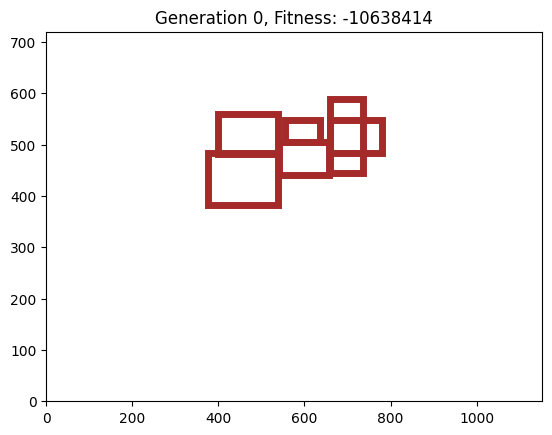

{'rooms': [{'name': 'Living Room', 'position': (376, 382), 'size': (163, 102)}, {'name': 'Passage', 'position': (540, 440), 'size': (118, 65)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (121, 64)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}, {'name': 'Bedroom1', 'position': (399, 481), 'size': (140, 79)}, {'name': 'Bedroom2', 'position': (659, 444), 'size': (77, 145)}], 'fitness': -10638414}


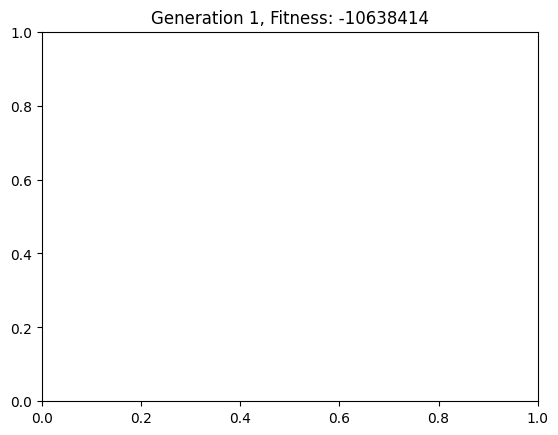

{'rooms': [{'name': 'Living Room', 'position': (376, 382), 'size': (163, 102)}, {'name': 'Passage', 'position': (540, 440), 'size': (118, 65)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (121, 64)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}, {'name': 'Bedroom1', 'position': (399, 481), 'size': (140, 79)}, {'name': 'Bedroom2', 'position': (659, 444), 'size': (77, 145)}], 'fitness': -10638414}


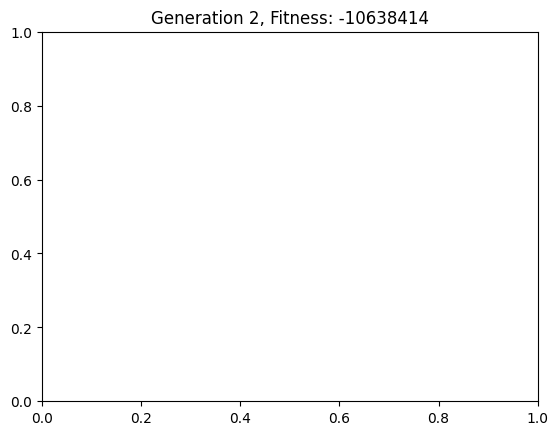

{'rooms': [{'name': 'Living Room', 'position': (376, 382), 'size': (163, 102)}, {'name': 'Passage', 'position': (540, 440), 'size': (118, 65)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (121, 64)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}, {'name': 'Bedroom1', 'position': (399, 481), 'size': (140, 79)}, {'name': 'Bedroom2', 'position': (659, 444), 'size': (77, 145)}], 'fitness': -10638414}


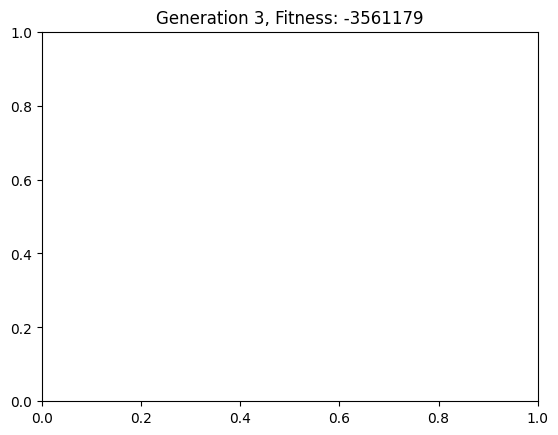

{'rooms': [{'name': 'Living Room', 'position': (376, 382), 'size': (163, 99)}, {'name': 'Passage', 'position': (540, 440), 'size': (118, 65)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (44, 64)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}, {'name': 'Bedroom1', 'position': (399, 481), 'size': (140, 76)}, {'name': 'Bedroom2', 'position': (659, 444), 'size': (77, 81)}], 'fitness': -3561179}


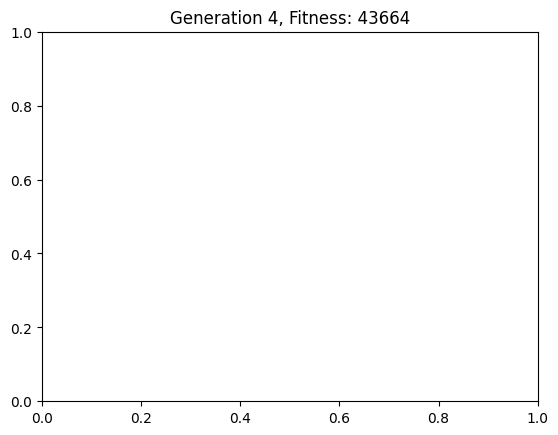

{'rooms': [{'name': 'Living Room', 'position': (376, 382), 'size': (163, 99)}, {'name': 'Passage', 'position': (540, 440), 'size': (118, 65)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (44, 64)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}, {'name': 'Bedroom1', 'position': (399, 481), 'size': (140, 76)}, {'name': 'Bedroom2', 'position': (659, 444), 'size': (77, 40)}], 'fitness': 43664}


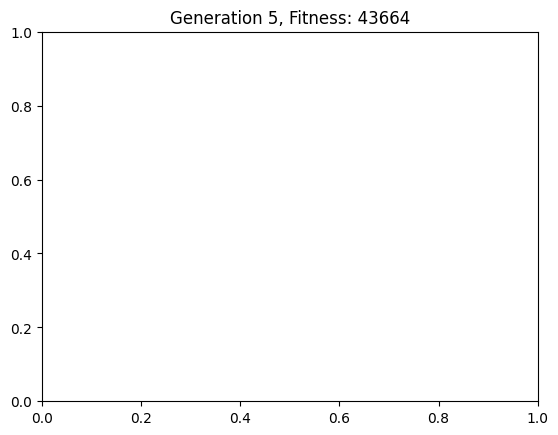

{'rooms': [{'name': 'Living Room', 'position': (376, 382), 'size': (163, 99)}, {'name': 'Passage', 'position': (540, 440), 'size': (119, 66)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (44, 64)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}, {'name': 'Bedroom1', 'position': (399, 481), 'size': (141, 77)}, {'name': 'Bedroom2', 'position': (659, 443), 'size': (78, 40)}], 'fitness': 43664}


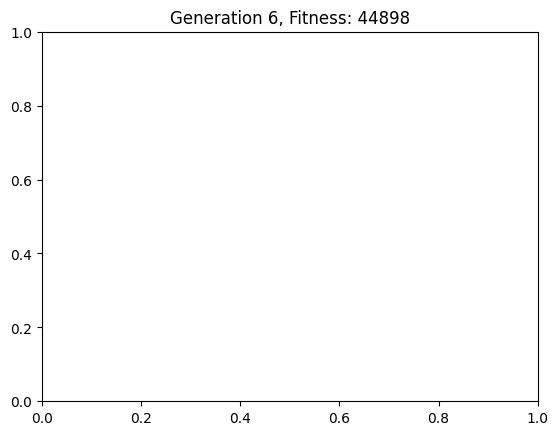

{'rooms': [{'name': 'Living Room', 'position': (375, 381), 'size': (164, 100)}, {'name': 'Bedroom1', 'position': (397, 481), 'size': (141, 79)}, {'name': 'Bedroom2', 'position': (659, 442), 'size': (80, 41)}, {'name': 'Passage', 'position': (539, 439), 'size': (120, 67)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (46, 74)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 44898}


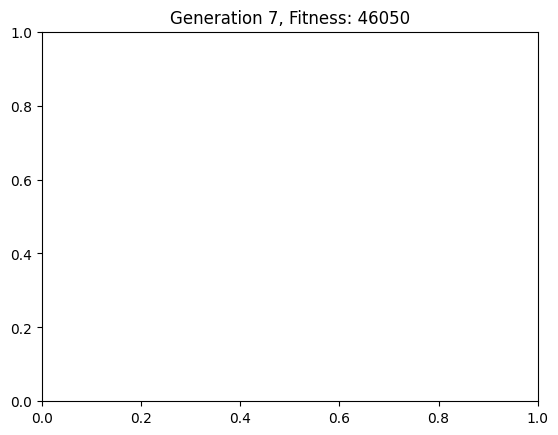

{'rooms': [{'name': 'Living Room', 'position': (375, 381), 'size': (164, 100)}, {'name': 'Bedroom1', 'position': (397, 481), 'size': (141, 79)}, {'name': 'Bedroom2', 'position': (659, 442), 'size': (80, 41)}, {'name': 'Passage', 'position': (539, 439), 'size': (120, 67)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (45, 86)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 46050}


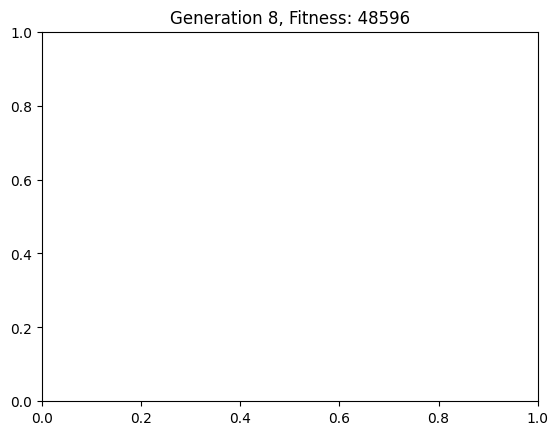

{'rooms': [{'name': 'Living Room', 'position': (370, 377), 'size': (166, 103)}, {'name': 'Bedroom1', 'position': (389, 481), 'size': (147, 93)}, {'name': 'Bedroom2', 'position': (659, 435), 'size': (94, 48)}, {'name': 'Passage', 'position': (536, 432), 'size': (122, 74)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (51, 90)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 48596}


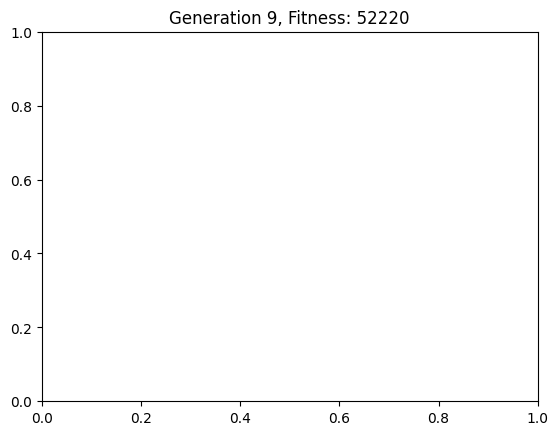

{'rooms': [{'name': 'Living Room', 'position': (365, 373), 'size': (169, 107)}, {'name': 'Bedroom1', 'position': (384, 481), 'size': (150, 101)}, {'name': 'Bedroom2', 'position': (659, 431), 'size': (102, 52)}, {'name': 'Passage', 'position': (534, 428), 'size': (125, 78)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (55, 88)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 52220}


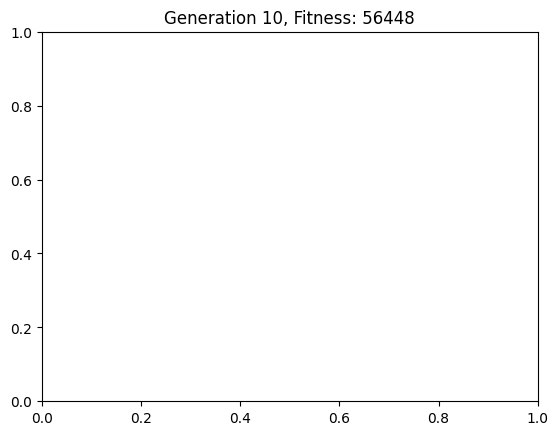

{'rooms': [{'name': 'Living Room', 'position': (359, 369), 'size': (171, 111)}, {'name': 'Bedroom1', 'position': (378, 481), 'size': (152, 109)}, {'name': 'Bedroom2', 'position': (659, 427), 'size': (110, 56)}, {'name': 'Passage', 'position': (531, 424), 'size': (128, 82)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (55, 88)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 56448}


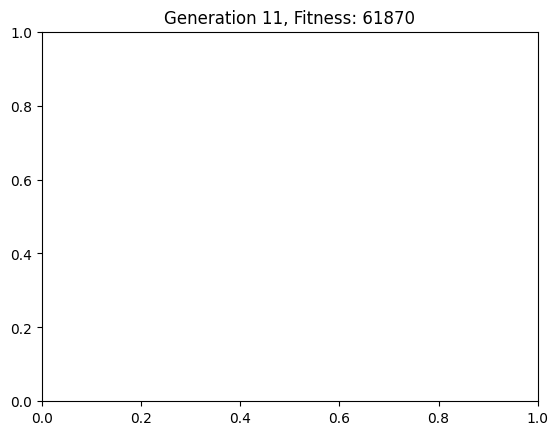

{'rooms': [{'name': 'Living Room', 'position': (354, 364), 'size': (174, 114)}, {'name': 'Bedroom1', 'position': (373, 478), 'size': (155, 112)}, {'name': 'Bedroom2', 'position': (659, 423), 'size': (118, 60)}, {'name': 'Passage', 'position': (528, 420), 'size': (130, 86)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (62, 103)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 61870}


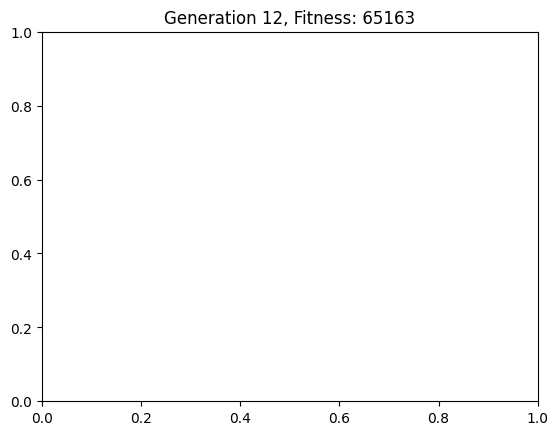

{'rooms': [{'name': 'Living Room', 'position': (349, 359), 'size': (177, 117)}, {'name': 'Bedroom1', 'position': (368, 476), 'size': (158, 115)}, {'name': 'Bedroom2', 'position': (659, 419), 'size': (126, 64)}, {'name': 'Passage', 'position': (526, 416), 'size': (133, 90)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (64, 104)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 65163}


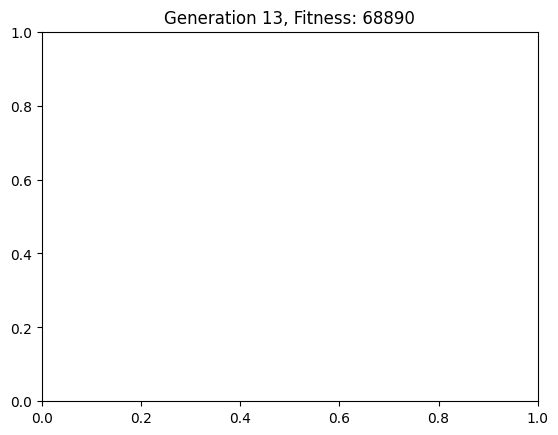

{'rooms': [{'name': 'Living Room', 'position': (343, 353), 'size': (179, 119)}, {'name': 'Bedroom1', 'position': (362, 473), 'size': (160, 118)}, {'name': 'Bedroom2', 'position': (659, 415), 'size': (134, 68)}, {'name': 'Passage', 'position': (523, 412), 'size': (136, 94)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (65, 104)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 68890}


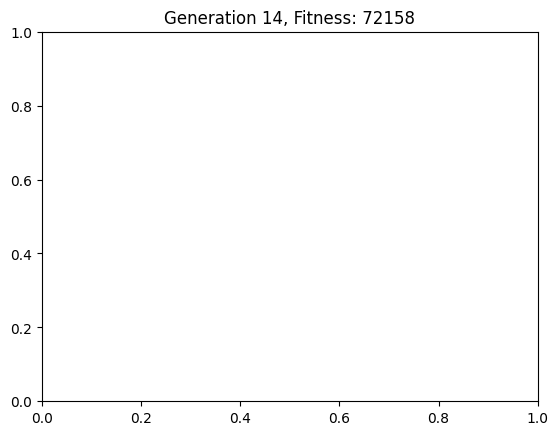

{'rooms': [{'name': 'Living Room', 'position': (338, 348), 'size': (182, 122)}, {'name': 'Bedroom1', 'position': (357, 470), 'size': (163, 120)}, {'name': 'Bedroom2', 'position': (659, 411), 'size': (142, 72)}, {'name': 'Passage', 'position': (520, 408), 'size': (138, 98)}, {'name': 'Kitchen', 'position': (659, 484), 'size': (66, 108)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 72158}


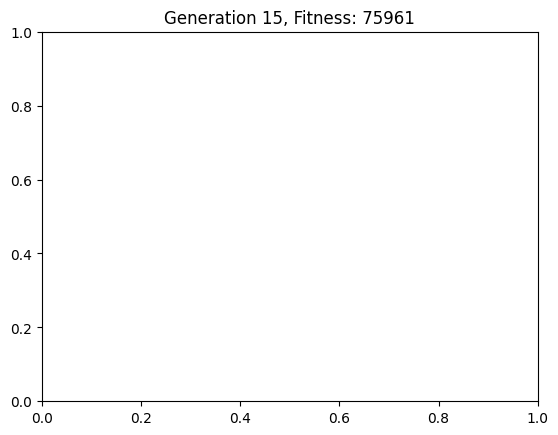

{'rooms': [{'name': 'Living Room', 'position': (338, 343), 'size': (182, 125)}, {'name': 'Bedroom1', 'position': (353, 468), 'size': (167, 123)}, {'name': 'Bedroom2', 'position': (659, 406), 'size': (150, 75)}, {'name': 'Passage', 'position': (520, 404), 'size': (139, 102)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (68, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 75961}


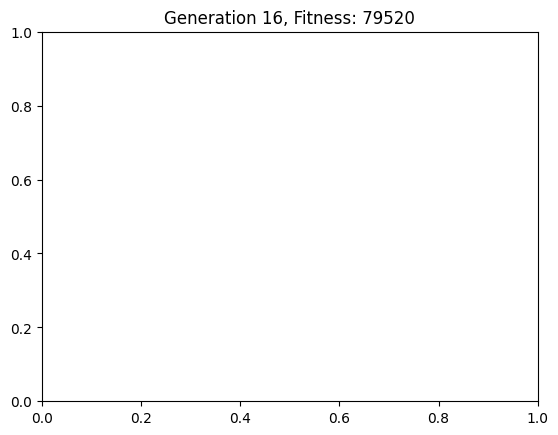

{'rooms': [{'name': 'Living Room', 'position': (338, 337), 'size': (182, 127)}, {'name': 'Bedroom1', 'position': (349, 465), 'size': (171, 126)}, {'name': 'Bedroom2', 'position': (659, 402), 'size': (158, 79)}, {'name': 'Passage', 'position': (520, 400), 'size': (139, 106)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (68, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 79520}


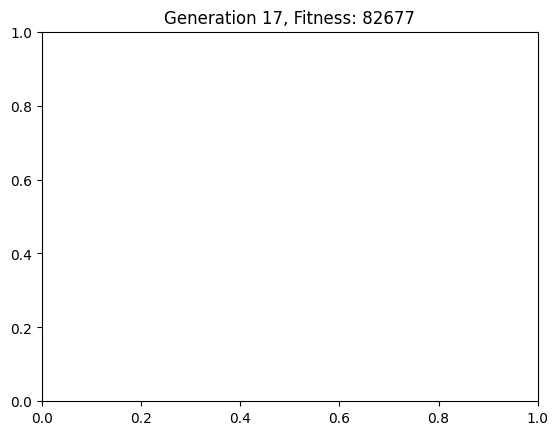

{'rooms': [{'name': 'Living Room', 'position': (338, 332), 'size': (182, 130)}, {'name': 'Bedroom1', 'position': (345, 462), 'size': (175, 128)}, {'name': 'Bedroom2', 'position': (659, 398), 'size': (166, 83)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (68, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 82677}


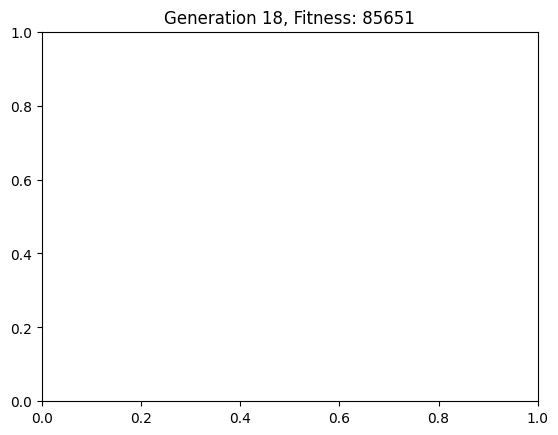

{'rooms': [{'name': 'Living Room', 'position': (338, 327), 'size': (182, 133)}, {'name': 'Bedroom1', 'position': (341, 460), 'size': (179, 131)}, {'name': 'Bedroom2', 'position': (659, 394), 'size': (174, 87)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 85651}


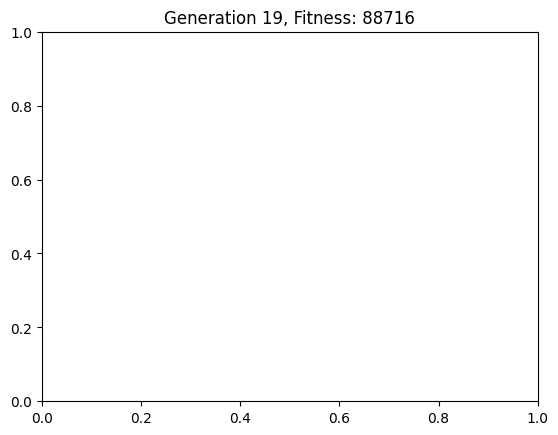

{'rooms': [{'name': 'Living Room', 'position': (338, 321), 'size': (182, 135)}, {'name': 'Bedroom1', 'position': (338, 457), 'size': (182, 134)}, {'name': 'Bedroom2', 'position': (659, 390), 'size': (182, 91)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 88716}


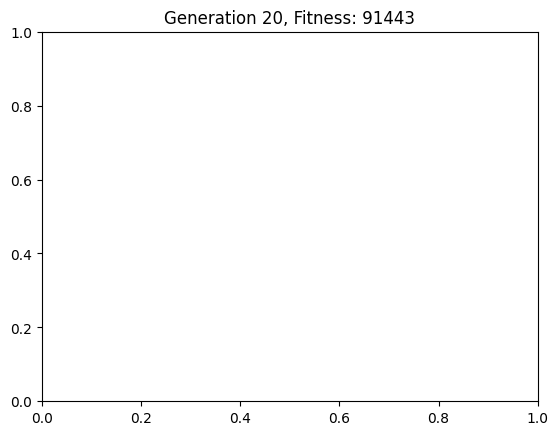

{'rooms': [{'name': 'Living Room', 'position': (338, 316), 'size': (182, 138)}, {'name': 'Bedroom1', 'position': (338, 454), 'size': (182, 136)}, {'name': 'Bedroom2', 'position': (659, 386), 'size': (190, 95)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 91443}


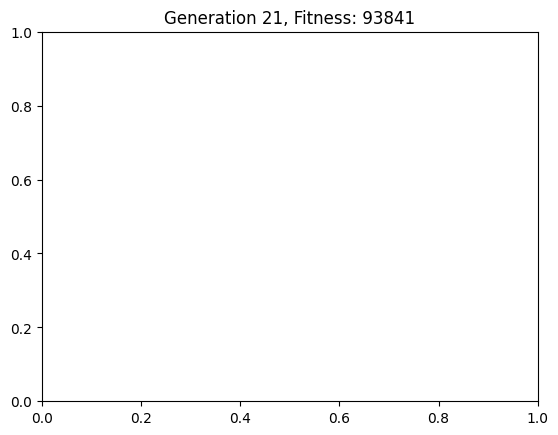

{'rooms': [{'name': 'Living Room', 'position': (338, 311), 'size': (182, 141)}, {'name': 'Bedroom1', 'position': (338, 452), 'size': (182, 139)}, {'name': 'Bedroom2', 'position': (659, 382), 'size': (198, 99)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 93841}


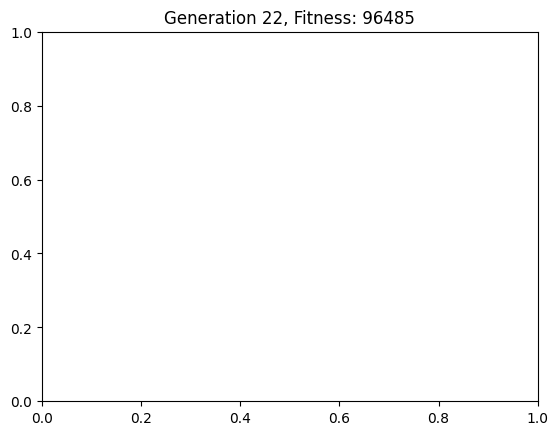

{'rooms': [{'name': 'Living Room', 'position': (338, 305), 'size': (182, 143)}, {'name': 'Bedroom1', 'position': (338, 449), 'size': (182, 142)}, {'name': 'Bedroom2', 'position': (659, 378), 'size': (206, 103)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 96485}


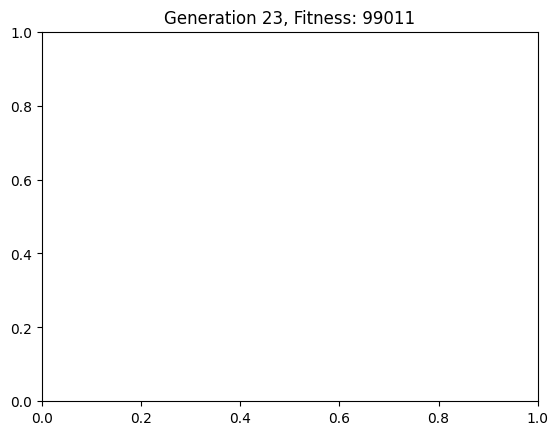

{'rooms': [{'name': 'Living Room', 'position': (338, 300), 'size': (182, 146)}, {'name': 'Bedroom1', 'position': (338, 446), 'size': (182, 144)}, {'name': 'Bedroom2', 'position': (659, 374), 'size': (214, 107)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 99011}


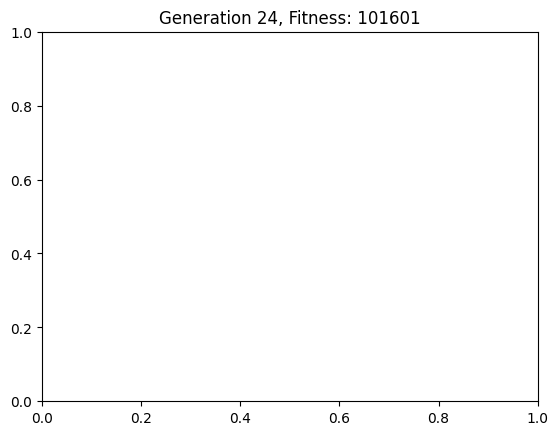

{'rooms': [{'name': 'Living Room', 'position': (338, 295), 'size': (182, 149)}, {'name': 'Bedroom1', 'position': (338, 444), 'size': (182, 147)}, {'name': 'Bedroom2', 'position': (659, 370), 'size': (222, 111)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 101601}


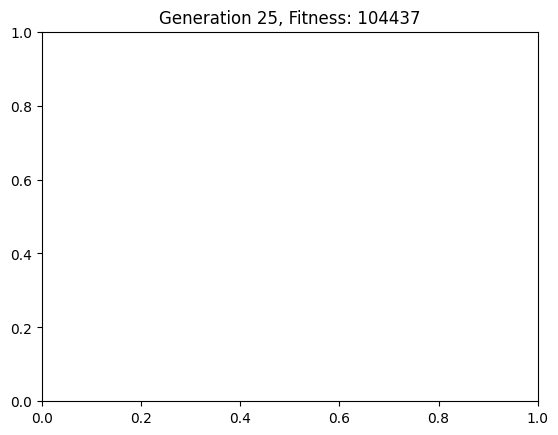

{'rooms': [{'name': 'Living Room', 'position': (338, 289), 'size': (182, 151)}, {'name': 'Bedroom1', 'position': (338, 441), 'size': (182, 150)}, {'name': 'Bedroom2', 'position': (659, 366), 'size': (230, 115)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 104437}


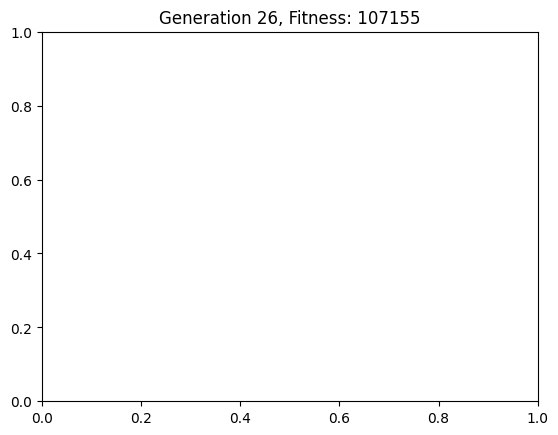

{'rooms': [{'name': 'Living Room', 'position': (338, 284), 'size': (182, 154)}, {'name': 'Bedroom1', 'position': (338, 438), 'size': (182, 152)}, {'name': 'Bedroom2', 'position': (659, 362), 'size': (238, 119)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 107155}


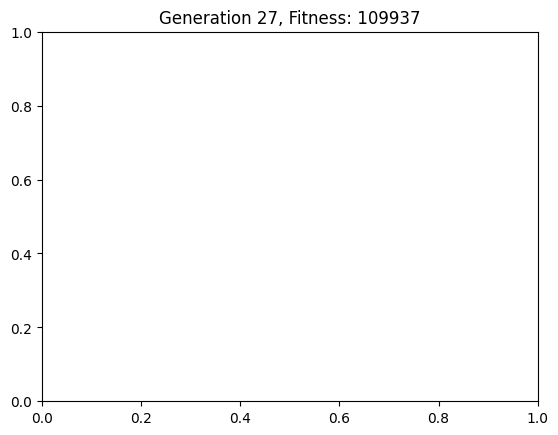

{'rooms': [{'name': 'Living Room', 'position': (338, 279), 'size': (182, 157)}, {'name': 'Bedroom1', 'position': (338, 436), 'size': (182, 155)}, {'name': 'Bedroom2', 'position': (659, 358), 'size': (246, 123)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 109937}


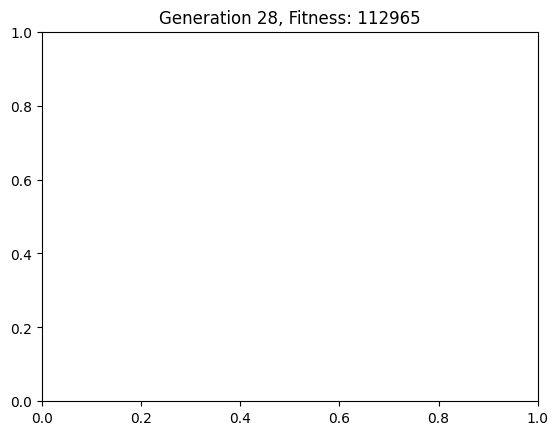

{'rooms': [{'name': 'Living Room', 'position': (338, 273), 'size': (182, 159)}, {'name': 'Bedroom1', 'position': (338, 433), 'size': (182, 158)}, {'name': 'Bedroom2', 'position': (659, 354), 'size': (254, 127)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 112965}


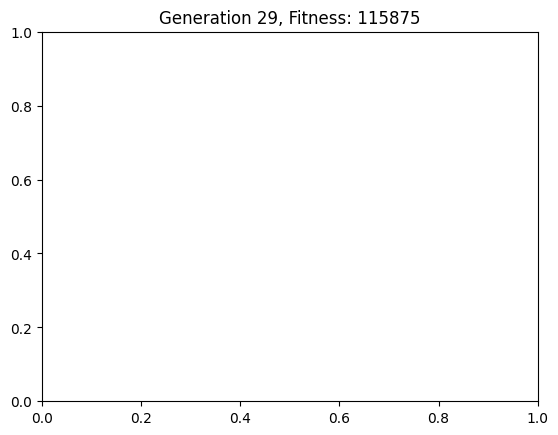

{'rooms': [{'name': 'Living Room', 'position': (338, 268), 'size': (182, 162)}, {'name': 'Bedroom1', 'position': (338, 430), 'size': (182, 160)}, {'name': 'Bedroom2', 'position': (659, 350), 'size': (262, 131)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 115875}


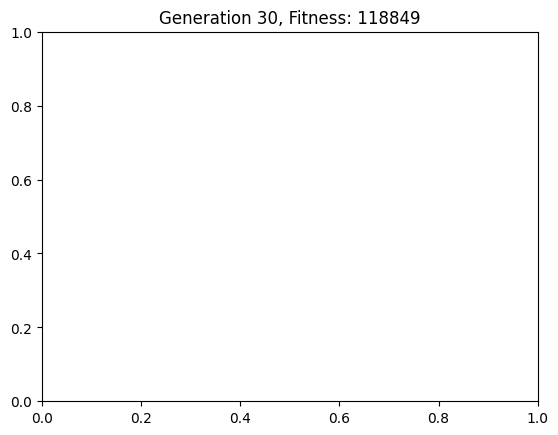

{'rooms': [{'name': 'Living Room', 'position': (338, 263), 'size': (182, 165)}, {'name': 'Bedroom1', 'position': (338, 428), 'size': (182, 163)}, {'name': 'Bedroom2', 'position': (659, 346), 'size': (270, 135)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 118849}


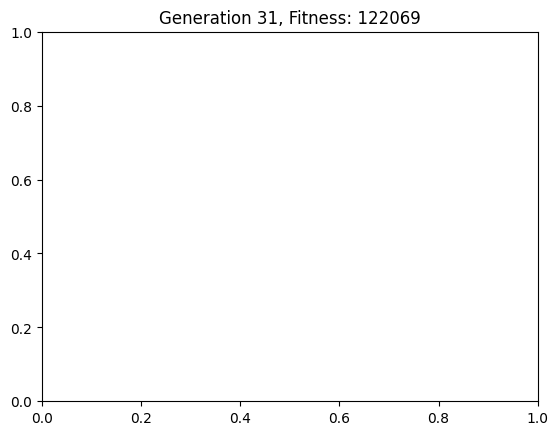

{'rooms': [{'name': 'Living Room', 'position': (338, 257), 'size': (182, 167)}, {'name': 'Bedroom1', 'position': (338, 425), 'size': (182, 166)}, {'name': 'Bedroom2', 'position': (659, 342), 'size': (278, 139)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 122069}


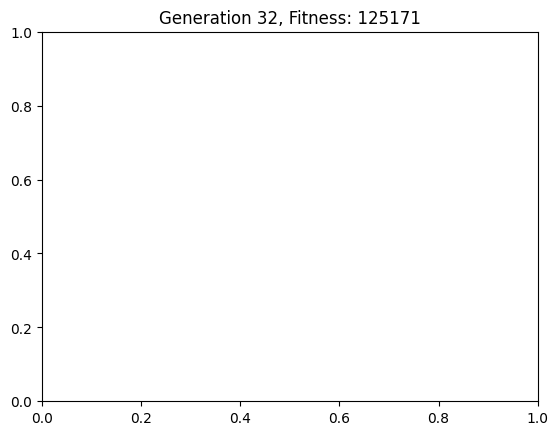

{'rooms': [{'name': 'Living Room', 'position': (338, 252), 'size': (182, 170)}, {'name': 'Bedroom1', 'position': (338, 422), 'size': (182, 168)}, {'name': 'Bedroom2', 'position': (659, 338), 'size': (283, 143)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 125171}


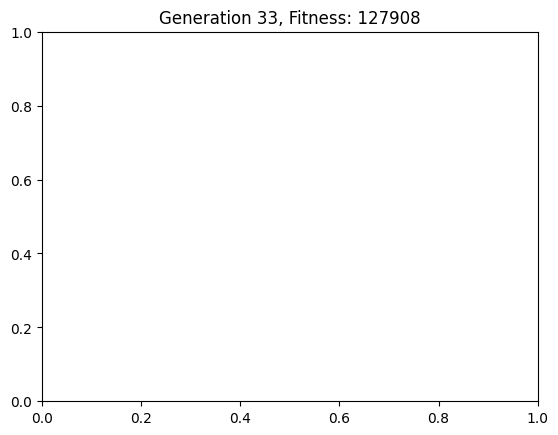

{'rooms': [{'name': 'Living Room', 'position': (338, 247), 'size': (182, 173)}, {'name': 'Bedroom1', 'position': (338, 420), 'size': (182, 171)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 127908}


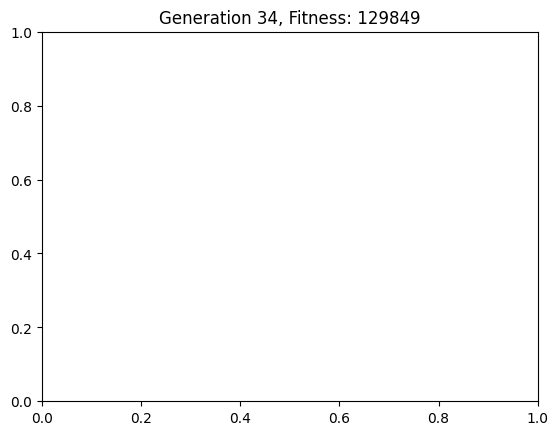

{'rooms': [{'name': 'Living Room', 'position': (338, 241), 'size': (182, 175)}, {'name': 'Bedroom1', 'position': (338, 417), 'size': (182, 174)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 129849}


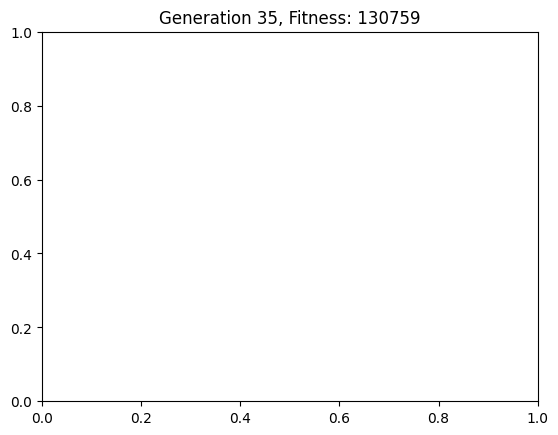

{'rooms': [{'name': 'Living Room', 'position': (338, 236), 'size': (182, 178)}, {'name': 'Bedroom1', 'position': (338, 414), 'size': (182, 176)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 130759}


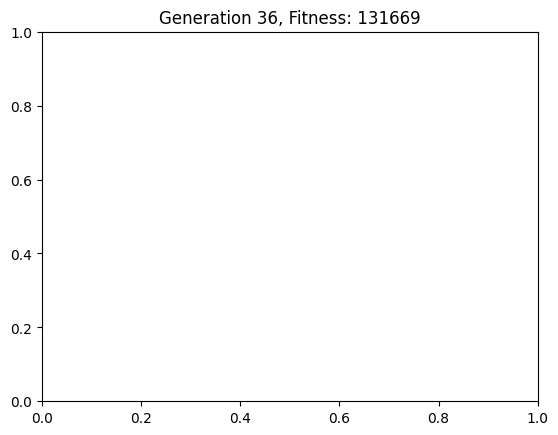

{'rooms': [{'name': 'Living Room', 'position': (338, 231), 'size': (182, 181)}, {'name': 'Bedroom1', 'position': (338, 412), 'size': (182, 179)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 131669}


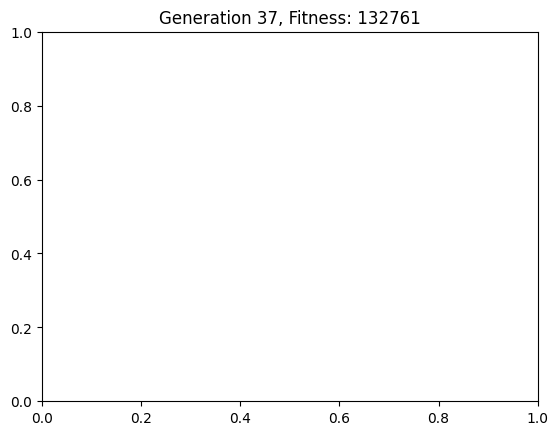

{'rooms': [{'name': 'Living Room', 'position': (338, 225), 'size': (182, 183)}, {'name': 'Bedroom1', 'position': (338, 409), 'size': (182, 182)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 132761}


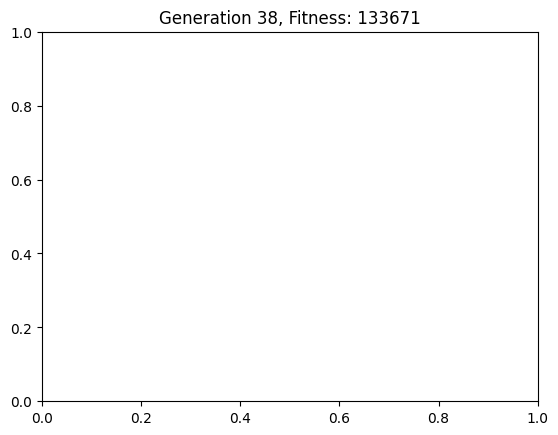

{'rooms': [{'name': 'Living Room', 'position': (338, 220), 'size': (182, 186)}, {'name': 'Bedroom1', 'position': (338, 406), 'size': (182, 184)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 133671}


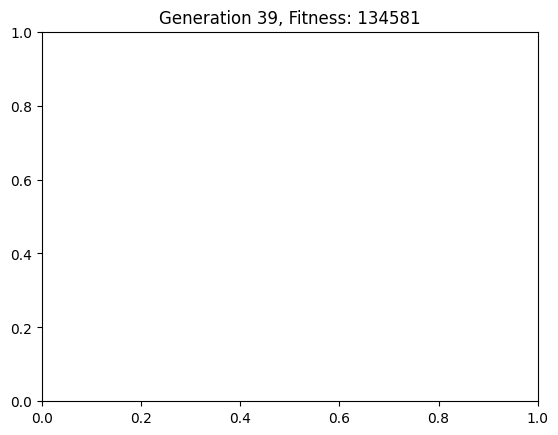

{'rooms': [{'name': 'Living Room', 'position': (338, 215), 'size': (182, 189)}, {'name': 'Bedroom1', 'position': (338, 404), 'size': (182, 187)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 134581}


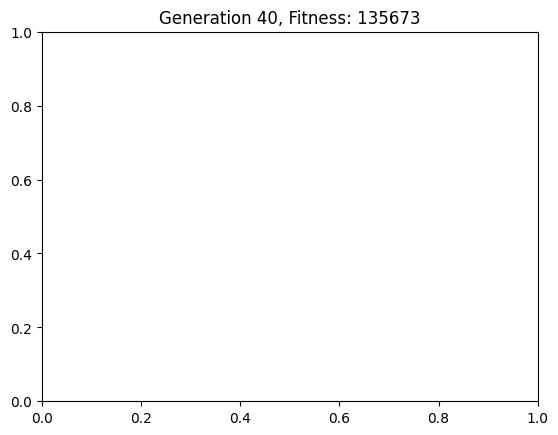

{'rooms': [{'name': 'Living Room', 'position': (338, 209), 'size': (182, 191)}, {'name': 'Bedroom1', 'position': (338, 401), 'size': (182, 190)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 135673}


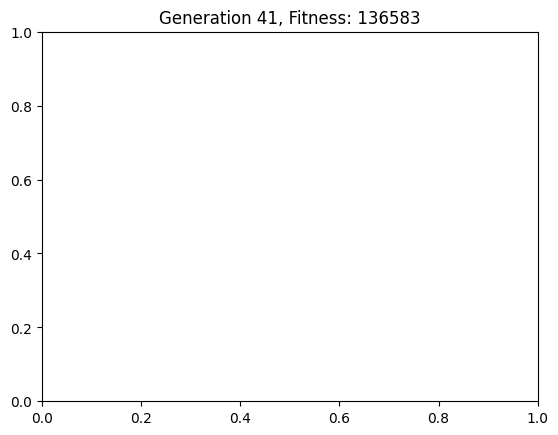

{'rooms': [{'name': 'Living Room', 'position': (338, 204), 'size': (184, 194)}, {'name': 'Bedroom1', 'position': (338, 398), 'size': (182, 193)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 136583}


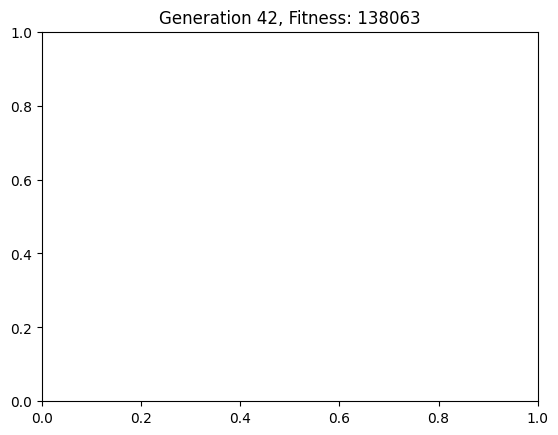

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (192, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 138063}


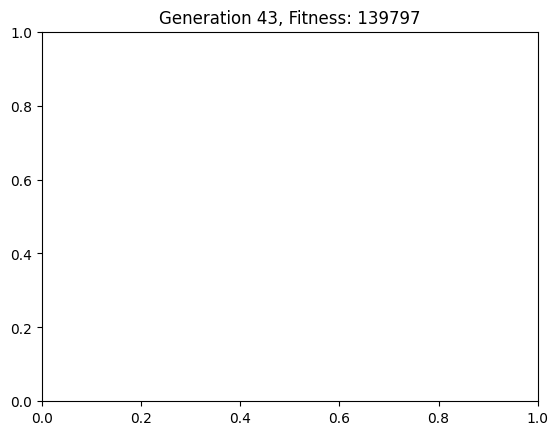

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (200, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 139797}


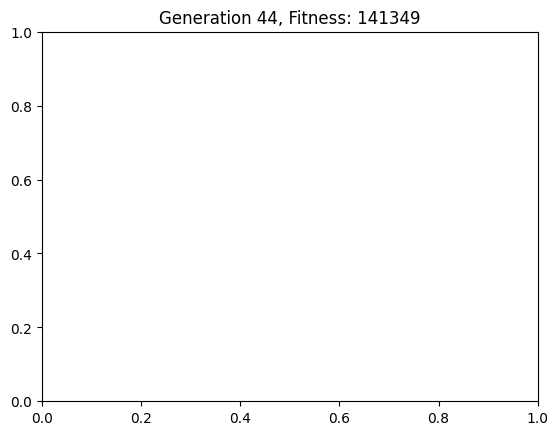

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (208, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 141349}


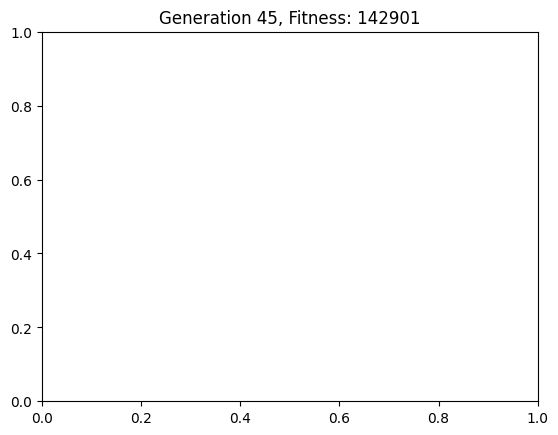

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (216, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 142901}


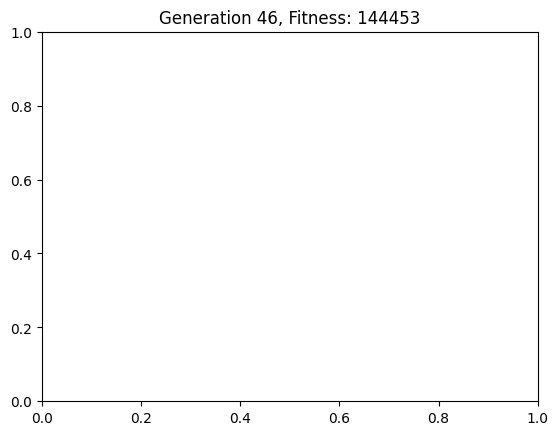

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (224, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 144453}


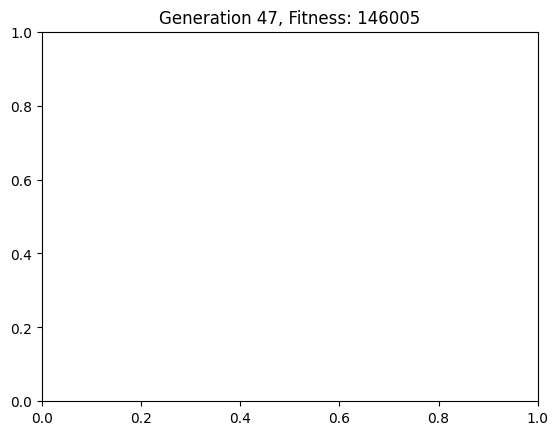

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (232, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 146005}


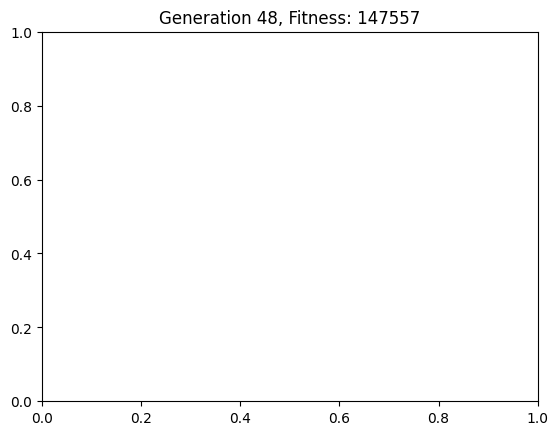

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (240, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 147557}


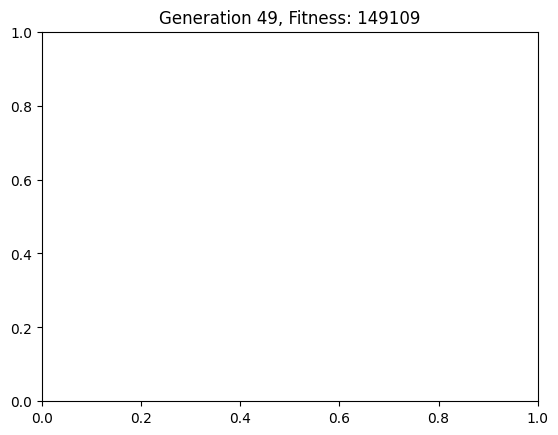

{'rooms': [{'name': 'Living Room', 'position': (338, 203), 'size': (248, 194)}, {'name': 'Bedroom1', 'position': (338, 397), 'size': (182, 194)}, {'name': 'Bedroom2', 'position': (659, 336), 'size': (283, 146)}, {'name': 'Passage', 'position': (520, 398), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (659, 482), 'size': (69, 110)}, {'name': 'Washroom', 'position': (554, 506), 'size': (81, 41)}], 'fitness': 149109}
Elapsed time: 466.53 seconds


<Figure size 640x480 with 0 Axes>

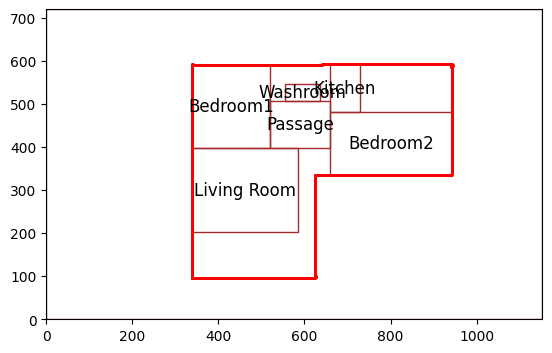

Elapsed time for initial population generation: 29.25 seconds


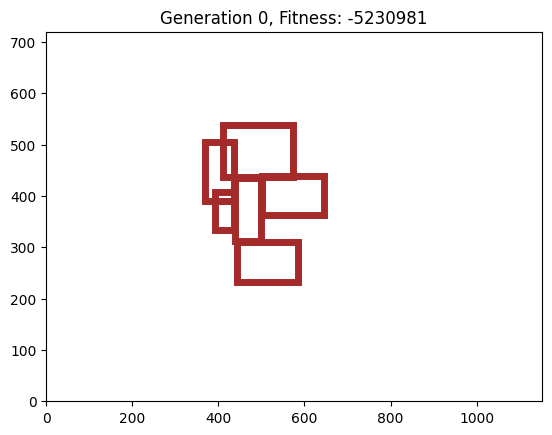

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (163, 102)}, {'name': 'Passage', 'position': (438, 312), 'size': (62, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 114)}, {'name': 'Washroom', 'position': (393, 333), 'size': (44, 74)}, {'name': 'Bedroom1', 'position': (501, 363), 'size': (145, 75)}, {'name': 'Bedroom2', 'position': (444, 233), 'size': (141, 78)}], 'fitness': -5230981}


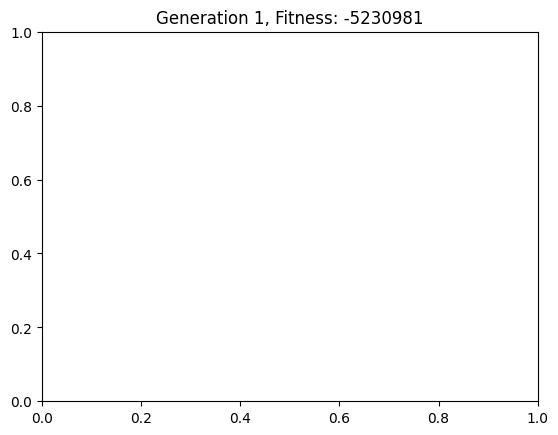

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (163, 102)}, {'name': 'Passage', 'position': (437, 312), 'size': (63, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 114)}, {'name': 'Washroom', 'position': (393, 333), 'size': (44, 74)}, {'name': 'Bedroom1', 'position': (501, 363), 'size': (145, 75)}, {'name': 'Bedroom2', 'position': (444, 232), 'size': (143, 79)}], 'fitness': -5230981}


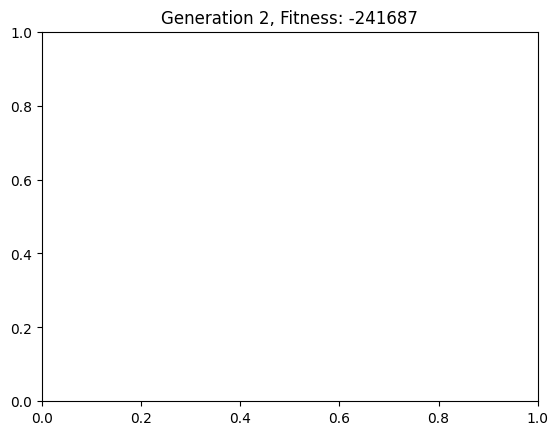

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (163, 100)}, {'name': 'Bedroom1', 'position': (501, 363), 'size': (72, 75)}, {'name': 'Bedroom2', 'position': (444, 232), 'size': (143, 79)}, {'name': 'Passage', 'position': (437, 312), 'size': (63, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (393, 333), 'size': (44, 58)}], 'fitness': -241687}


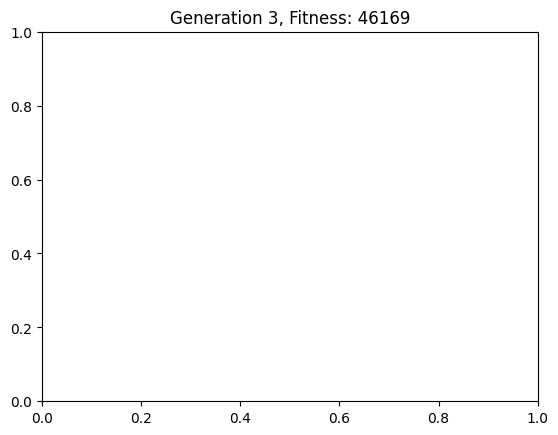

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (163, 100)}, {'name': 'Bedroom1', 'position': (501, 363), 'size': (72, 73)}, {'name': 'Bedroom2', 'position': (444, 232), 'size': (143, 79)}, {'name': 'Passage', 'position': (437, 312), 'size': (63, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (393, 333), 'size': (44, 58)}], 'fitness': 46169}


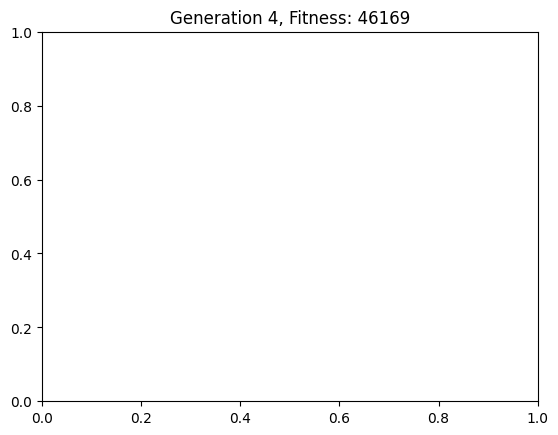

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (163, 100)}, {'name': 'Bedroom1', 'position': (501, 362), 'size': (73, 73)}, {'name': 'Bedroom2', 'position': (444, 232), 'size': (144, 80)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (392, 319), 'size': (45, 72)}], 'fitness': 46169}


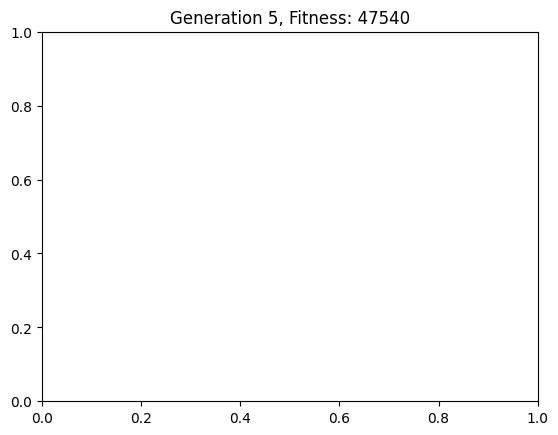

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (166, 103)}, {'name': 'Bedroom1', 'position': (501, 361), 'size': (76, 75)}, {'name': 'Bedroom2', 'position': (444, 230), 'size': (147, 81)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (389, 300), 'size': (48, 82)}], 'fitness': 47540}


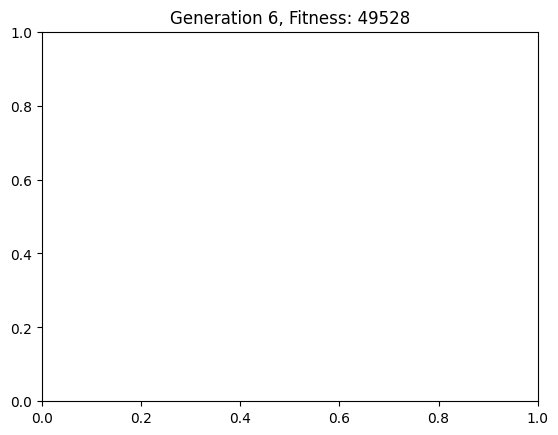

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (170, 107)}, {'name': 'Bedroom1', 'position': (501, 357), 'size': (83, 78)}, {'name': 'Bedroom2', 'position': (444, 227), 'size': (154, 85)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (382, 289), 'size': (55, 102)}], 'fitness': 49528}


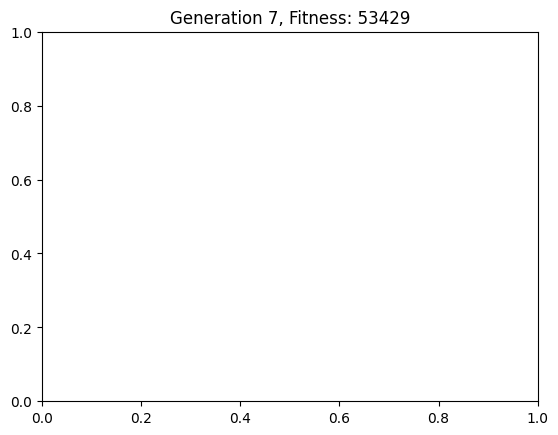

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (167, 104)}, {'name': 'Bedroom1', 'position': (501, 353), 'size': (91, 82)}, {'name': 'Bedroom2', 'position': (444, 223), 'size': (162, 89)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (374, 269), 'size': (63, 122)}], 'fitness': 53429}


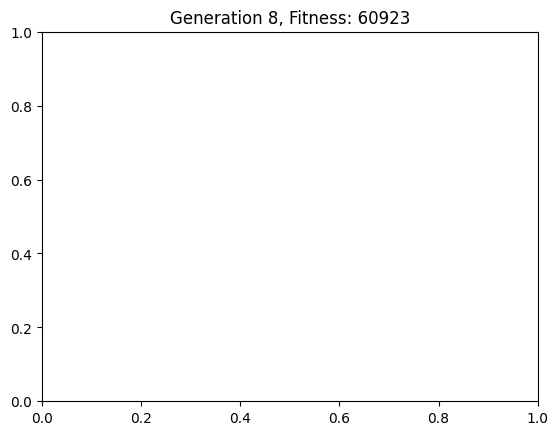

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (186, 123)}, {'name': 'Bedroom1', 'position': (501, 349), 'size': (99, 86)}, {'name': 'Bedroom2', 'position': (444, 219), 'size': (170, 93)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (366, 254), 'size': (71, 136)}], 'fitness': 60923}


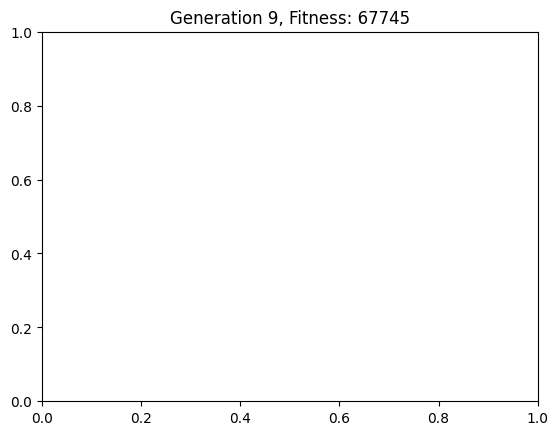

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (194, 131)}, {'name': 'Bedroom1', 'position': (501, 345), 'size': (107, 90)}, {'name': 'Bedroom2', 'position': (444, 215), 'size': (178, 97)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (358, 221), 'size': (79, 157)}], 'fitness': 67745}


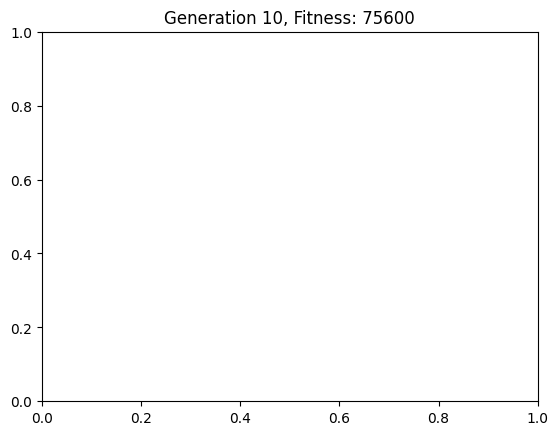

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (202, 139)}, {'name': 'Bedroom1', 'position': (501, 341), 'size': (115, 94)}, {'name': 'Bedroom2', 'position': (441, 211), 'size': (183, 101)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (350, 221), 'size': (87, 154)}], 'fitness': 75600}


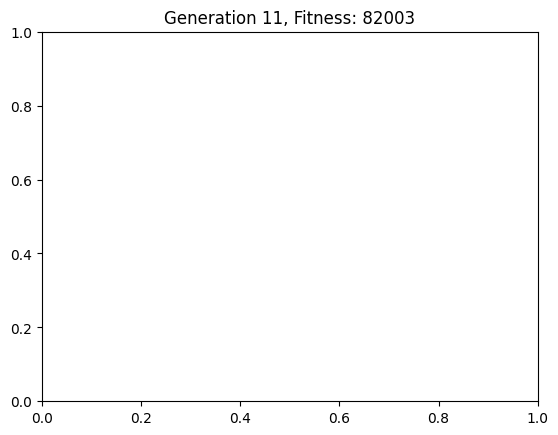

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (210, 147)}, {'name': 'Bedroom1', 'position': (501, 337), 'size': (123, 98)}, {'name': 'Bedroom2', 'position': (437, 207), 'size': (187, 105)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (342, 205), 'size': (95, 174)}], 'fitness': 82003}


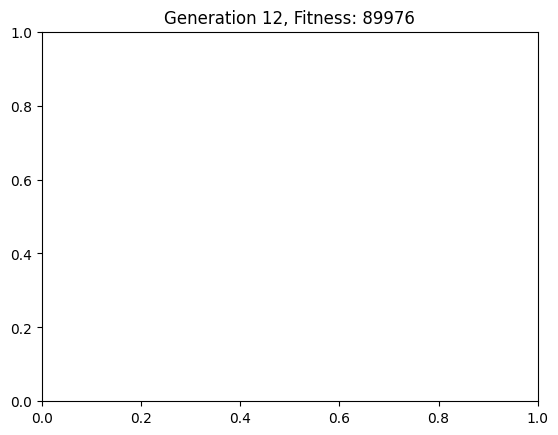

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (218, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (131, 100)}, {'name': 'Bedroom2', 'position': (437, 203), 'size': (188, 109)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 89976}


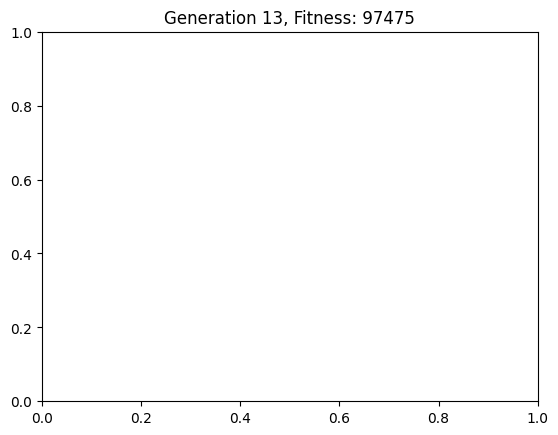

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (226, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (139, 100)}, {'name': 'Bedroom2', 'position': (437, 199), 'size': (188, 113)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 97475}


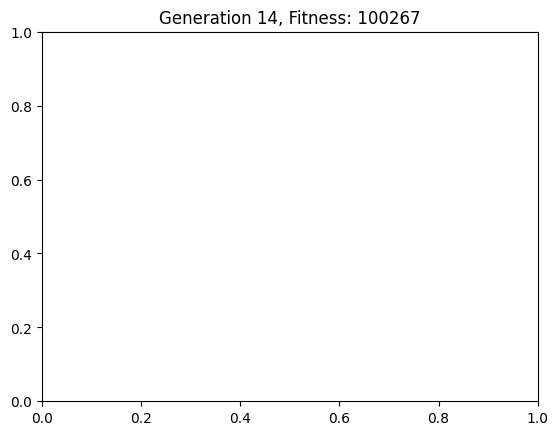

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (234, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (147, 100)}, {'name': 'Bedroom2', 'position': (437, 195), 'size': (188, 117)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 100267}


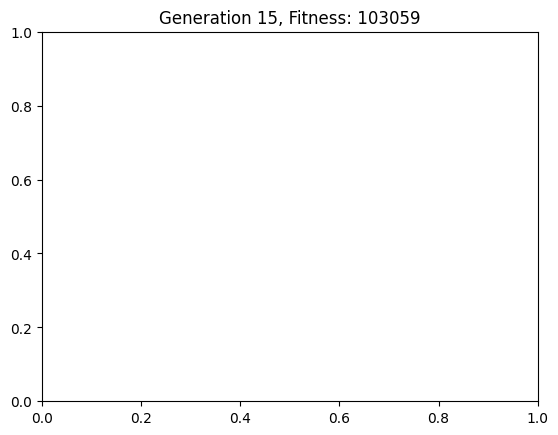

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (242, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (155, 100)}, {'name': 'Bedroom2', 'position': (437, 191), 'size': (188, 121)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 103059}


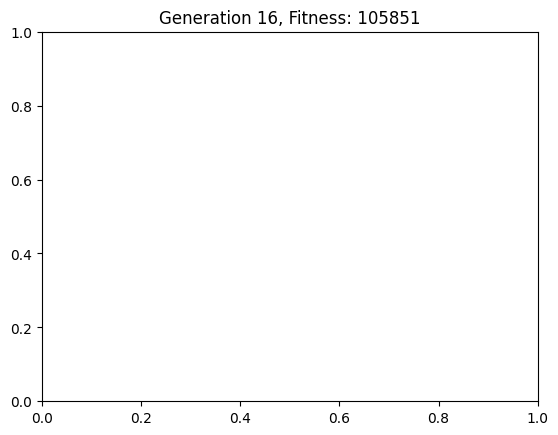

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (250, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (163, 100)}, {'name': 'Bedroom2', 'position': (437, 187), 'size': (188, 125)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 105851}


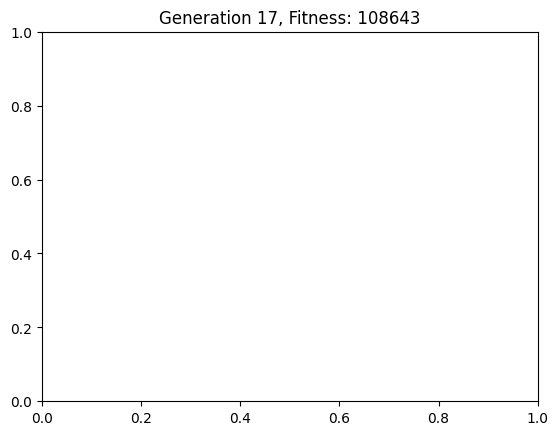

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (258, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (171, 100)}, {'name': 'Bedroom2', 'position': (437, 183), 'size': (188, 129)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 108643}


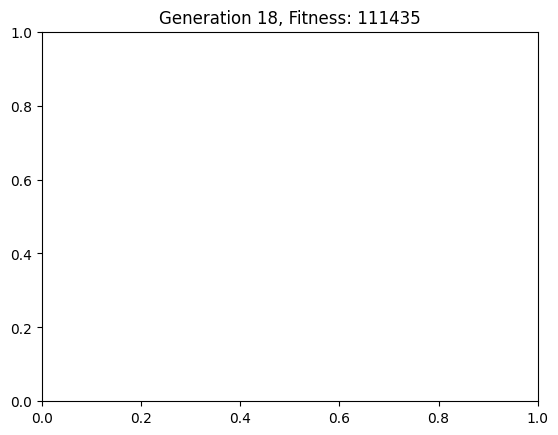

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (266, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (179, 100)}, {'name': 'Bedroom2', 'position': (437, 179), 'size': (188, 133)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 111435}


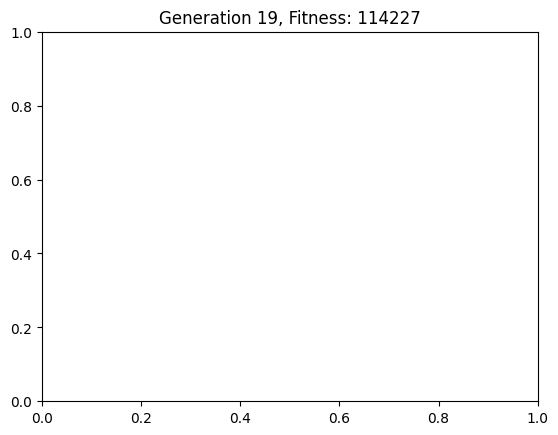

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (274, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (187, 100)}, {'name': 'Bedroom2', 'position': (437, 175), 'size': (188, 137)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 114227}


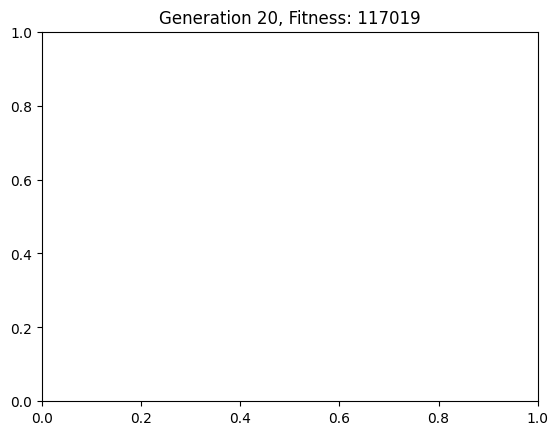

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (282, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (195, 100)}, {'name': 'Bedroom2', 'position': (437, 171), 'size': (188, 141)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 117019}


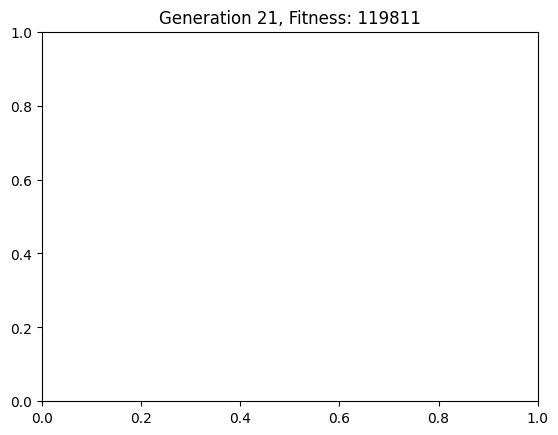

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (290, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (203, 100)}, {'name': 'Bedroom2', 'position': (437, 167), 'size': (188, 145)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 119811}


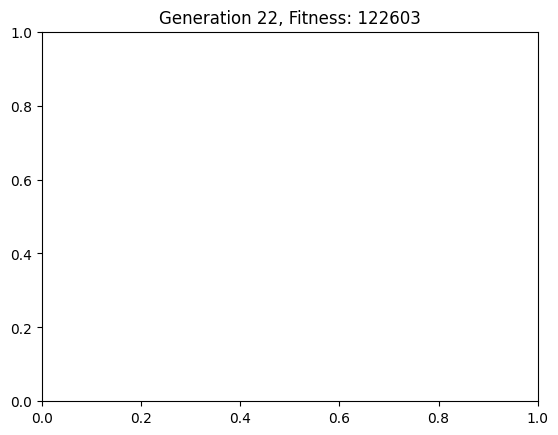

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (298, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (211, 100)}, {'name': 'Bedroom2', 'position': (437, 163), 'size': (188, 149)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 122603}


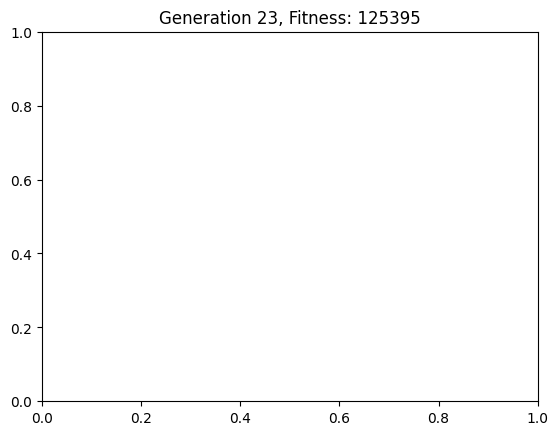

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (306, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (219, 100)}, {'name': 'Bedroom2', 'position': (437, 159), 'size': (188, 153)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 125395}


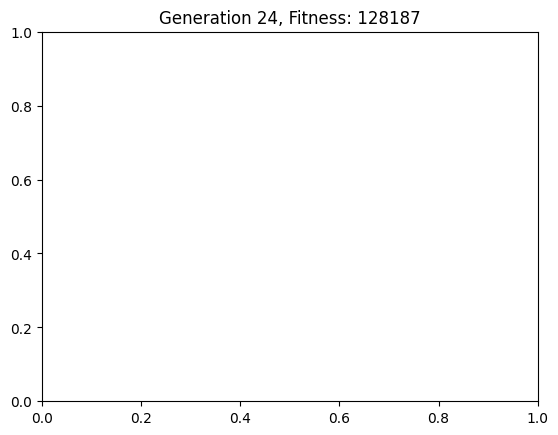

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (314, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (227, 100)}, {'name': 'Bedroom2', 'position': (437, 155), 'size': (188, 157)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 128187}


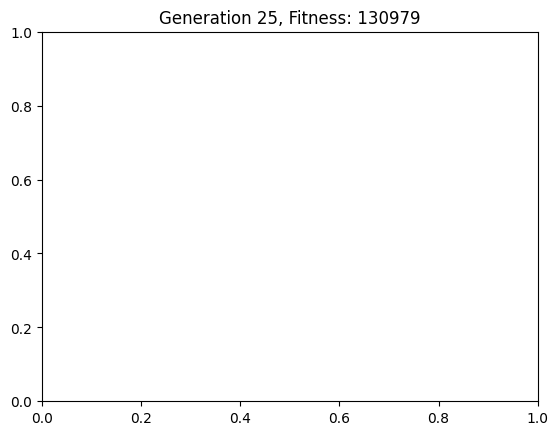

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (322, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (235, 100)}, {'name': 'Bedroom2', 'position': (437, 151), 'size': (188, 161)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 130979}


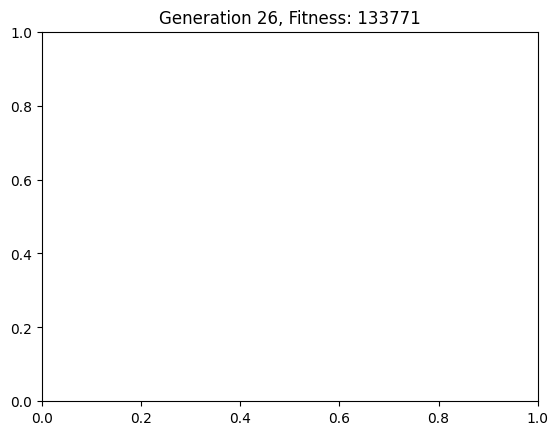

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (330, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (243, 100)}, {'name': 'Bedroom2', 'position': (437, 147), 'size': (188, 165)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 133771}


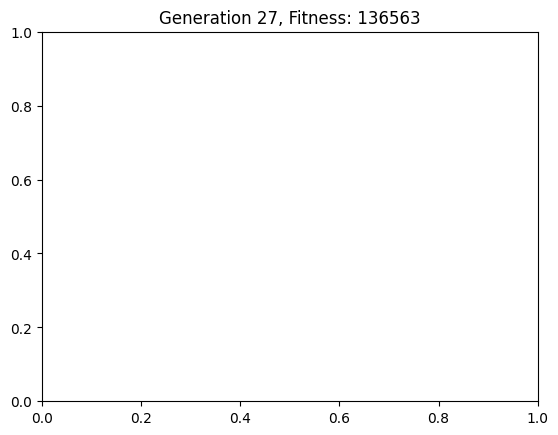

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (338, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (251, 100)}, {'name': 'Bedroom2', 'position': (437, 143), 'size': (188, 169)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 136563}


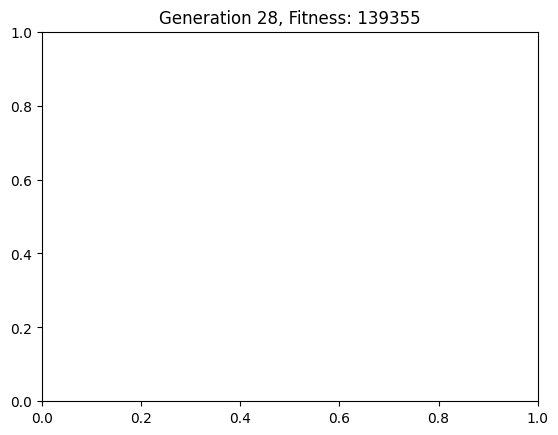

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (346, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (259, 100)}, {'name': 'Bedroom2', 'position': (437, 139), 'size': (188, 173)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 139355}


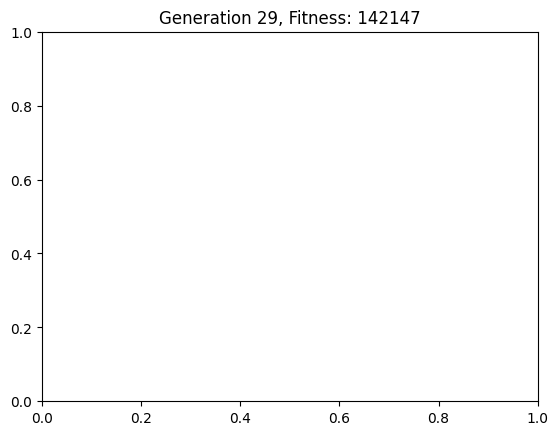

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (354, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (267, 100)}, {'name': 'Bedroom2', 'position': (437, 135), 'size': (188, 177)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 142147}


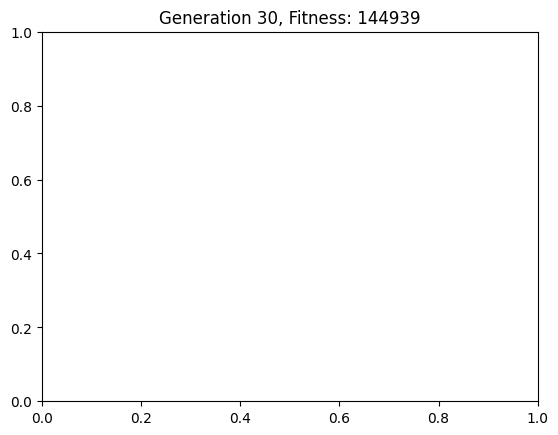

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (362, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (275, 100)}, {'name': 'Bedroom2', 'position': (437, 131), 'size': (188, 181)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 144939}


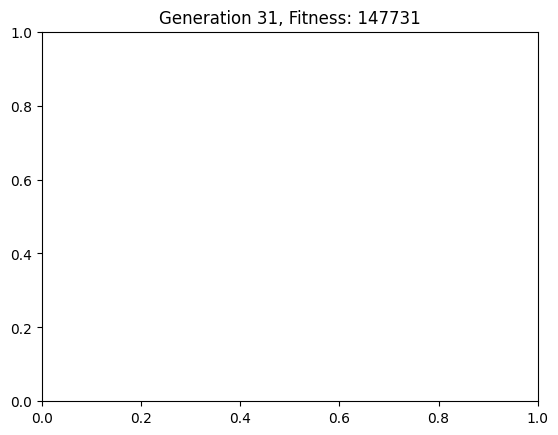

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (370, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (283, 100)}, {'name': 'Bedroom2', 'position': (437, 127), 'size': (188, 185)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 147731}


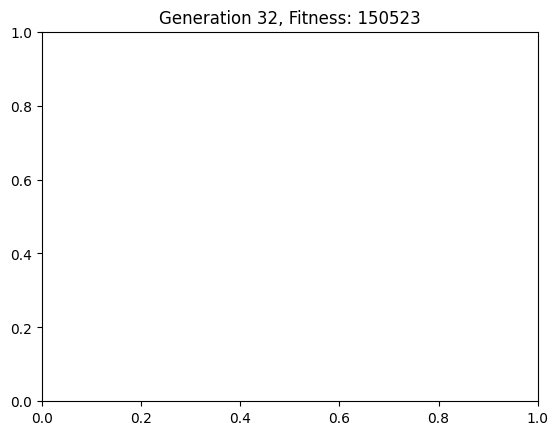

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (378, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (291, 100)}, {'name': 'Bedroom2', 'position': (437, 123), 'size': (188, 189)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 150523}


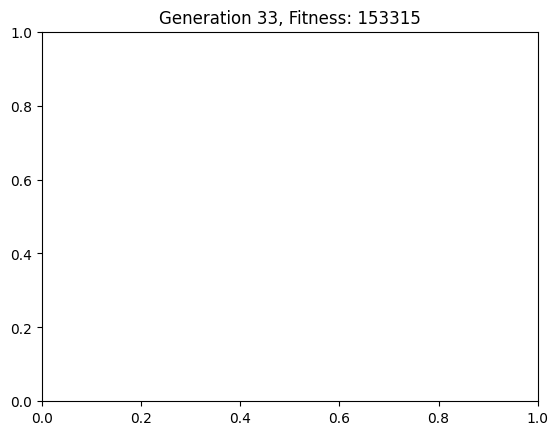

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (386, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (299, 100)}, {'name': 'Bedroom2', 'position': (437, 119), 'size': (188, 193)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 153315}


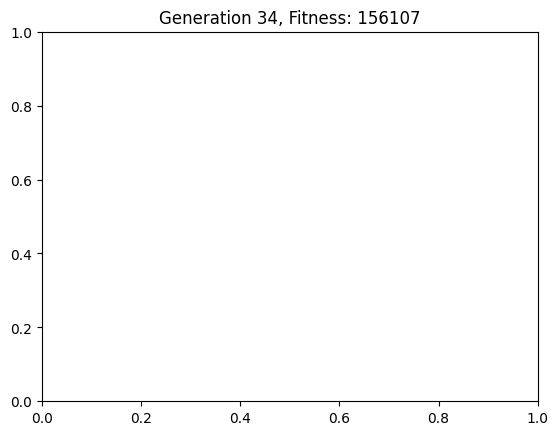

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (394, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (307, 100)}, {'name': 'Bedroom2', 'position': (437, 115), 'size': (188, 197)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 156107}


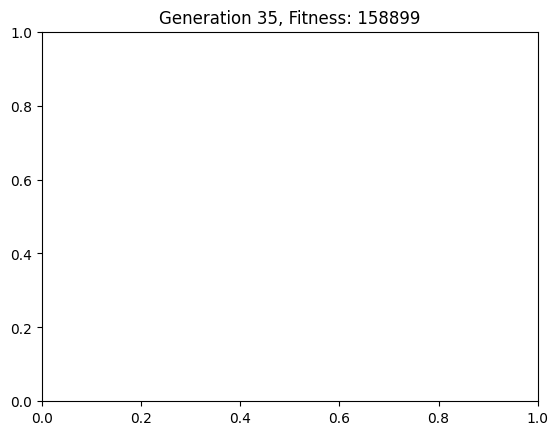

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (402, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (315, 100)}, {'name': 'Bedroom2', 'position': (437, 111), 'size': (188, 201)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 158899}


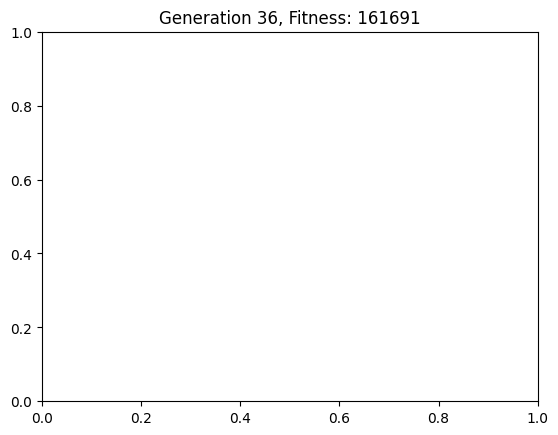

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (410, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (323, 100)}, {'name': 'Bedroom2', 'position': (437, 107), 'size': (188, 205)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 161691}


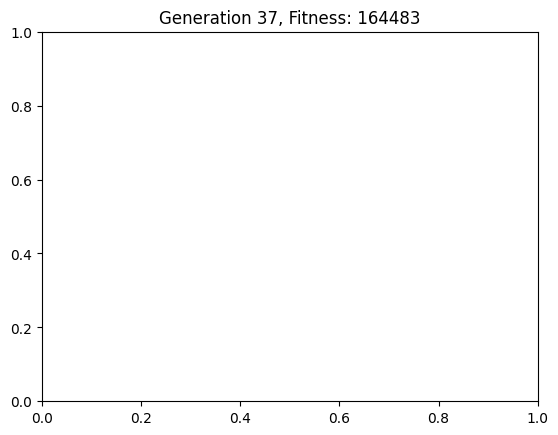

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (418, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (331, 100)}, {'name': 'Bedroom2', 'position': (437, 103), 'size': (188, 209)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 164483}


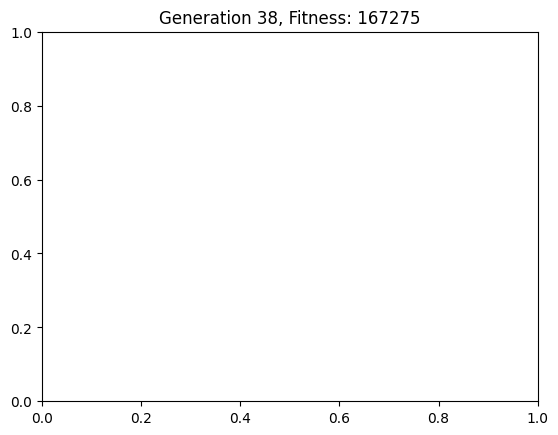

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (426, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (339, 100)}, {'name': 'Bedroom2', 'position': (437, 99), 'size': (188, 213)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 167275}


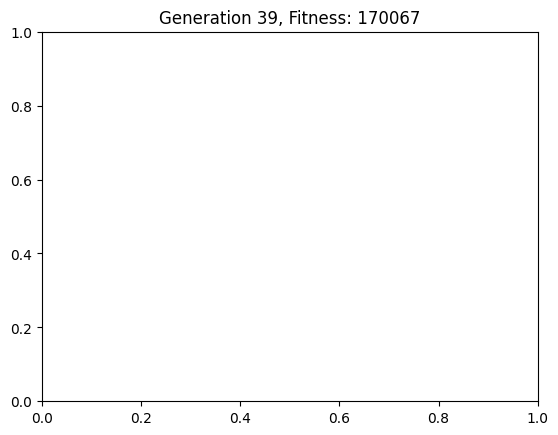

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (434, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (347, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 170067}


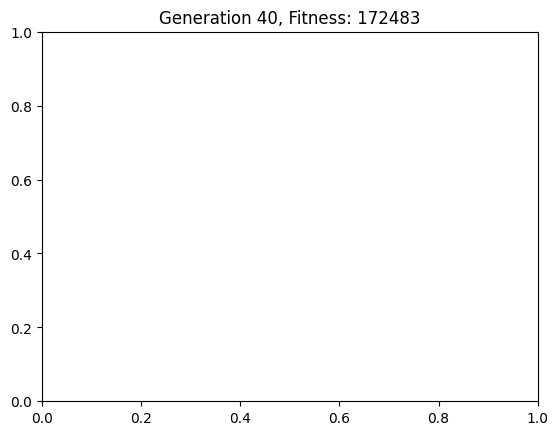

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (442, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (355, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 172483}


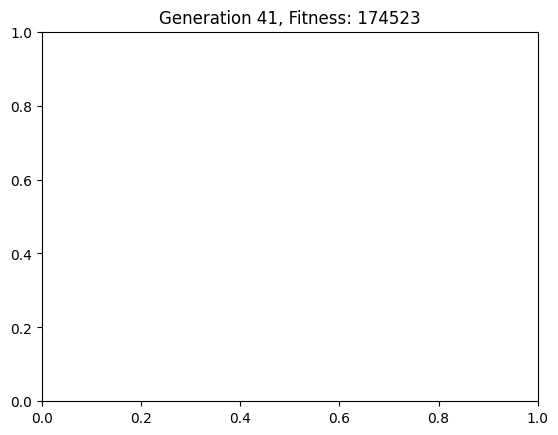

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (450, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (363, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 174523}


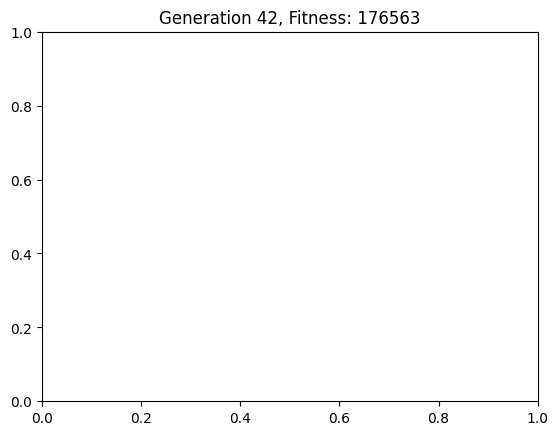

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (458, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (371, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 176563}


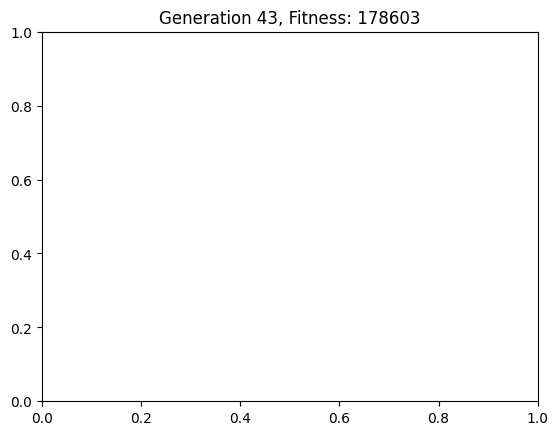

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (466, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (379, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 178603}


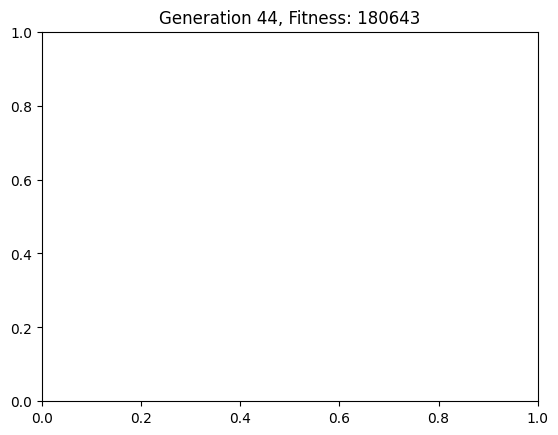

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (474, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (387, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 180643}


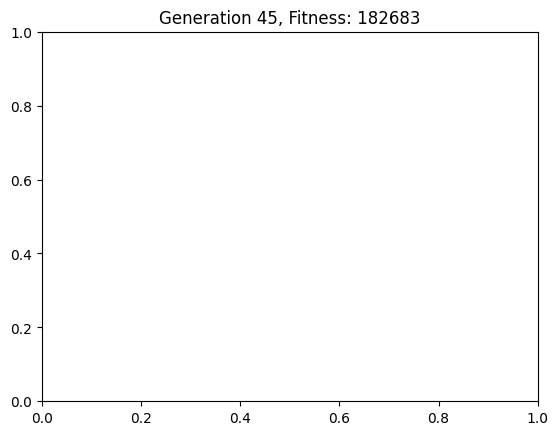

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (482, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (395, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 182683}


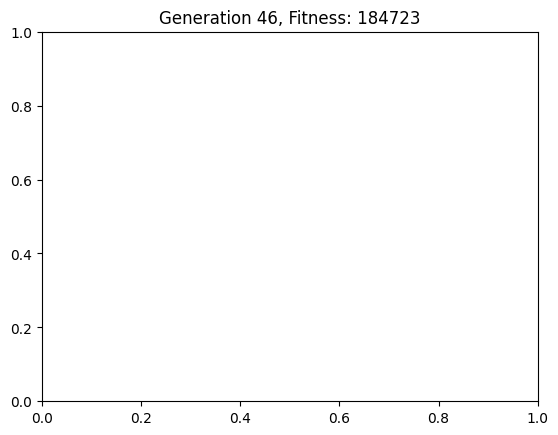

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (490, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (403, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 184723}


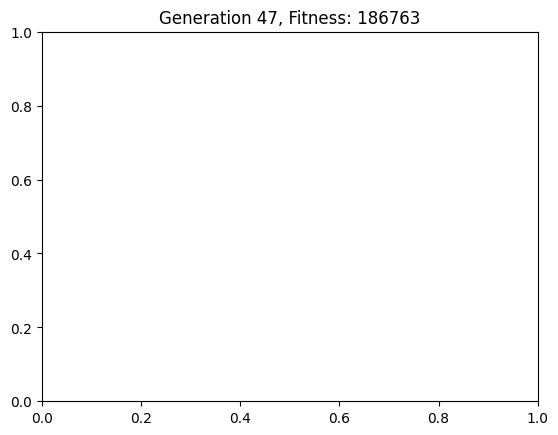

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (498, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (411, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 186763}


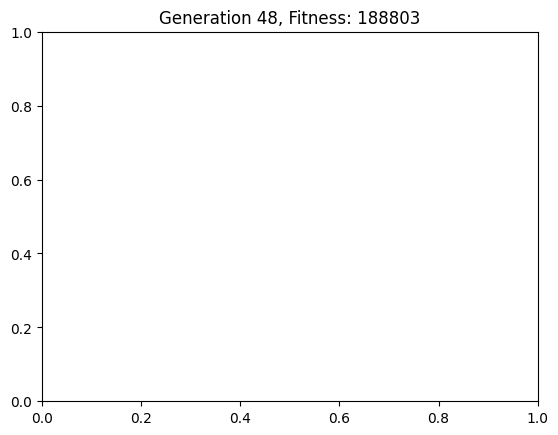

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (506, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (419, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 188803}


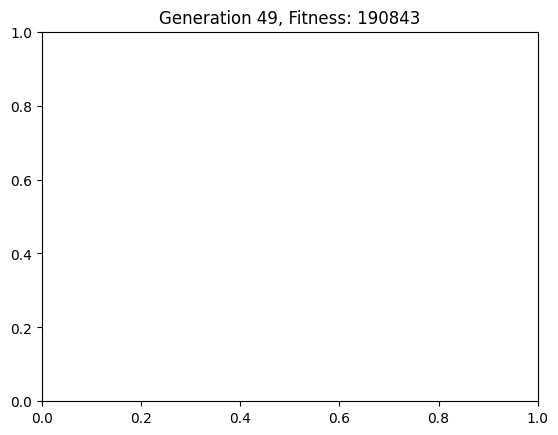

{'rooms': [{'name': 'Living Room', 'position': (411, 436), 'size': (514, 155)}, {'name': 'Bedroom1', 'position': (501, 336), 'size': (427, 100)}, {'name': 'Bedroom2', 'position': (437, 97), 'size': (188, 215)}, {'name': 'Passage', 'position': (437, 312), 'size': (64, 123)}, {'name': 'Kitchen', 'position': (370, 391), 'size': (67, 45)}, {'name': 'Washroom', 'position': (338, 180), 'size': (99, 194)}], 'fitness': 190843}
Elapsed time: 558.08 seconds


<Figure size 640x480 with 0 Axes>

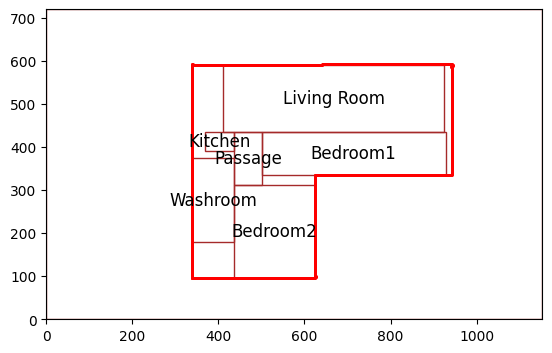

Elapsed time for initial population generation: 28.57 seconds


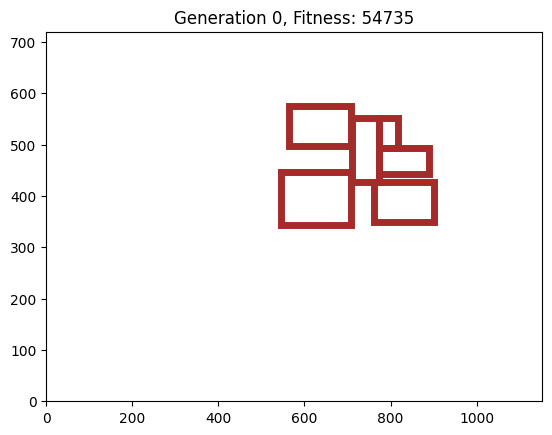

{'rooms': [{'name': 'Living Room', 'position': (546, 344), 'size': (163, 102)}, {'name': 'Passage', 'position': (710, 428), 'size': (63, 123)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (44, 58)}, {'name': 'Bedroom1', 'position': (565, 498), 'size': (144, 77)}, {'name': 'Bedroom2', 'position': (761, 349), 'size': (140, 78)}], 'fitness': 54735}


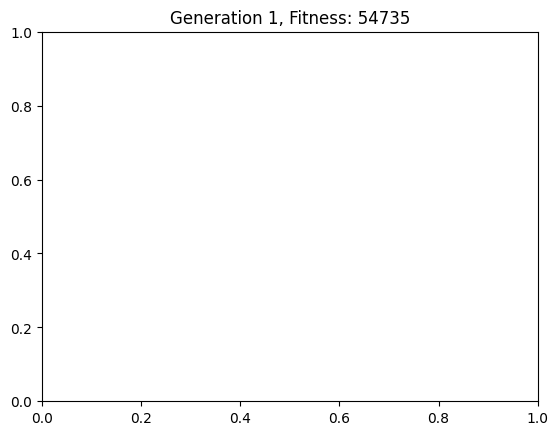

{'rooms': [{'name': 'Living Room', 'position': (546, 344), 'size': (164, 103)}, {'name': 'Passage', 'position': (710, 428), 'size': (64, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (45, 76)}, {'name': 'Bedroom1', 'position': (565, 498), 'size': (145, 78)}, {'name': 'Bedroom2', 'position': (761, 349), 'size': (141, 79)}], 'fitness': 54735}


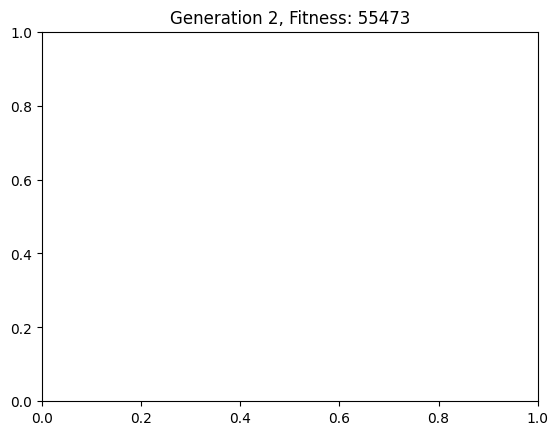

{'rooms': [{'name': 'Living Room', 'position': (544, 343), 'size': (164, 104)}, {'name': 'Bedroom1', 'position': (563, 497), 'size': (145, 79)}, {'name': 'Bedroom2', 'position': (761, 348), 'size': (143, 80)}, {'name': 'Passage', 'position': (708, 428), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (47, 91)}], 'fitness': 55473}


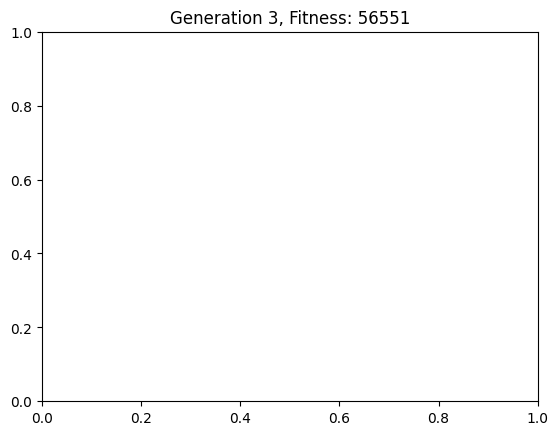

{'rooms': [{'name': 'Living Room', 'position': (541, 343), 'size': (165, 108)}, {'name': 'Bedroom1', 'position': (560, 497), 'size': (146, 83)}, {'name': 'Bedroom2', 'position': (761, 346), 'size': (147, 82)}, {'name': 'Passage', 'position': (707, 428), 'size': (67, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (47, 88)}], 'fitness': 56551}


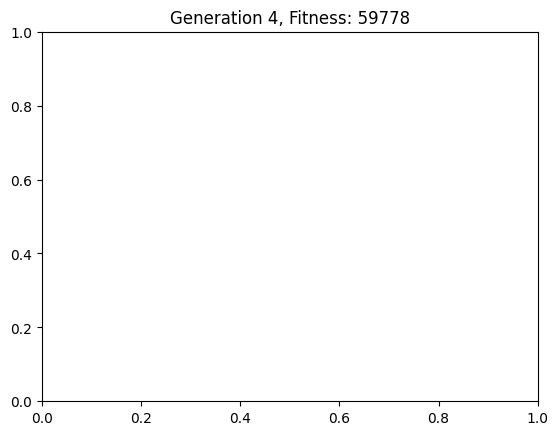

{'rooms': [{'name': 'Living Room', 'position': (536, 343), 'size': (168, 116)}, {'name': 'Bedroom1', 'position': (555, 497), 'size': (149, 91)}, {'name': 'Bedroom2', 'position': (761, 342), 'size': (155, 86)}, {'name': 'Passage', 'position': (704, 428), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (55, 94)}], 'fitness': 59778}


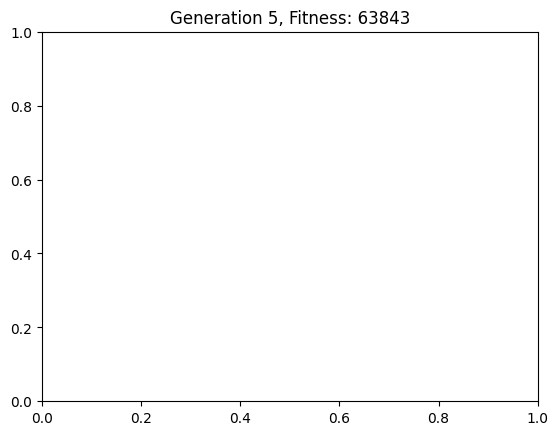

{'rooms': [{'name': 'Living Room', 'position': (531, 343), 'size': (171, 124)}, {'name': 'Bedroom1', 'position': (550, 494), 'size': (152, 96)}, {'name': 'Bedroom2', 'position': (761, 338), 'size': (163, 90)}, {'name': 'Passage', 'position': (702, 428), 'size': (72, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (49, 86)}], 'fitness': 63843}


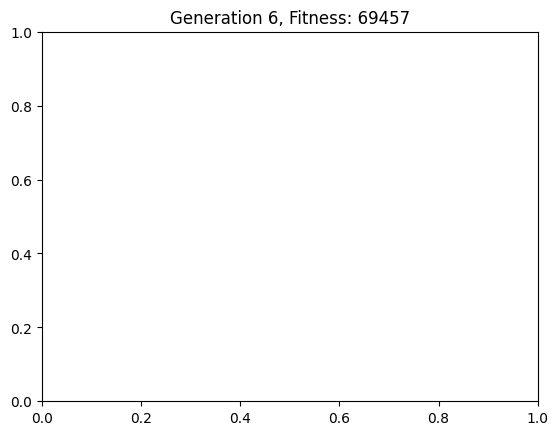

{'rooms': [{'name': 'Living Room', 'position': (525, 343), 'size': (173, 132)}, {'name': 'Bedroom1', 'position': (544, 490), 'size': (154, 100)}, {'name': 'Bedroom2', 'position': (761, 336), 'size': (171, 92)}, {'name': 'Passage', 'position': (699, 428), 'size': (75, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (59, 96)}], 'fitness': 69457}


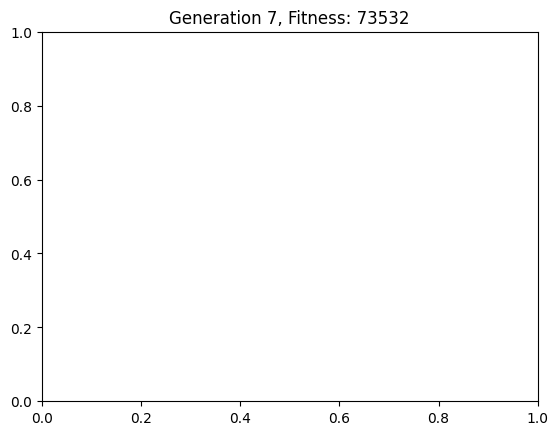

{'rooms': [{'name': 'Living Room', 'position': (520, 343), 'size': (176, 140)}, {'name': 'Bedroom1', 'position': (539, 486), 'size': (157, 104)}, {'name': 'Bedroom2', 'position': (761, 336), 'size': (179, 92)}, {'name': 'Passage', 'position': (696, 428), 'size': (77, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (61, 99)}], 'fitness': 73532}


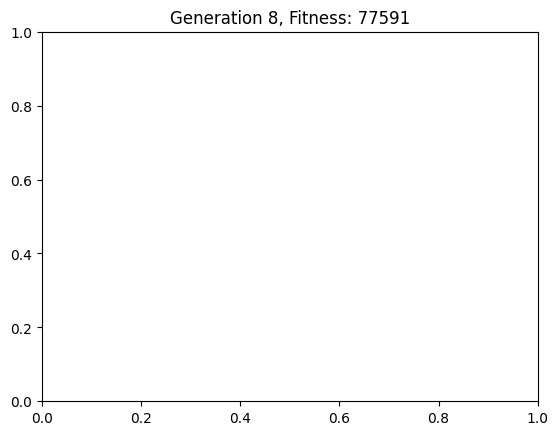

{'rooms': [{'name': 'Living Room', 'position': (515, 339), 'size': (179, 144)}, {'name': 'Bedroom1', 'position': (534, 483), 'size': (160, 107)}, {'name': 'Bedroom2', 'position': (758, 336), 'size': (184, 92)}, {'name': 'Passage', 'position': (694, 428), 'size': (80, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (61, 99)}], 'fitness': 77591}


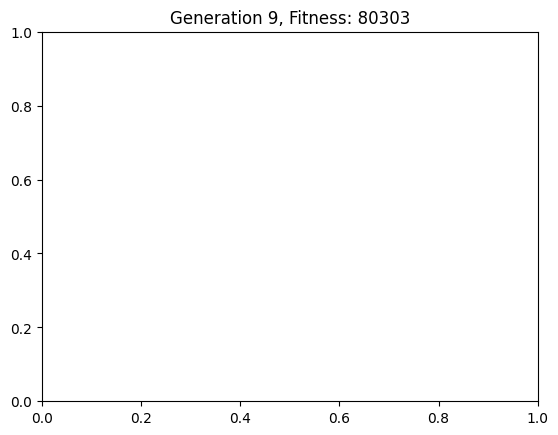

{'rooms': [{'name': 'Living Room', 'position': (509, 336), 'size': (181, 146)}, {'name': 'Bedroom1', 'position': (528, 482), 'size': (162, 109)}, {'name': 'Bedroom2', 'position': (754, 336), 'size': (188, 92)}, {'name': 'Passage', 'position': (691, 428), 'size': (83, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 80303}


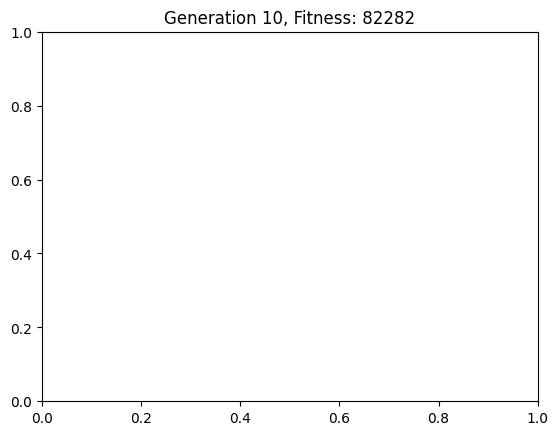

{'rooms': [{'name': 'Living Room', 'position': (504, 336), 'size': (184, 146)}, {'name': 'Bedroom1', 'position': (523, 482), 'size': (165, 109)}, {'name': 'Bedroom2', 'position': (750, 336), 'size': (192, 92)}, {'name': 'Passage', 'position': (688, 428), 'size': (85, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 82282}


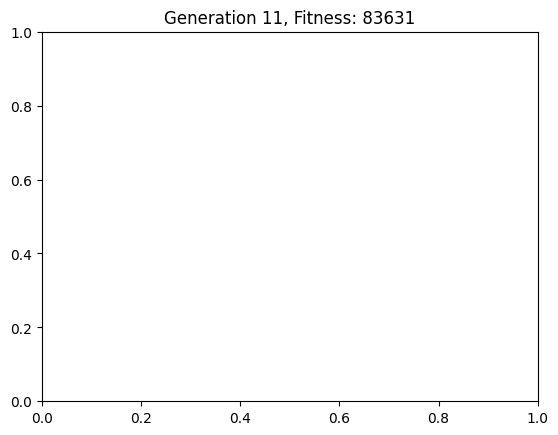

{'rooms': [{'name': 'Living Room', 'position': (499, 336), 'size': (187, 146)}, {'name': 'Bedroom1', 'position': (518, 482), 'size': (168, 109)}, {'name': 'Bedroom2', 'position': (746, 336), 'size': (196, 92)}, {'name': 'Passage', 'position': (686, 428), 'size': (88, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 83631}


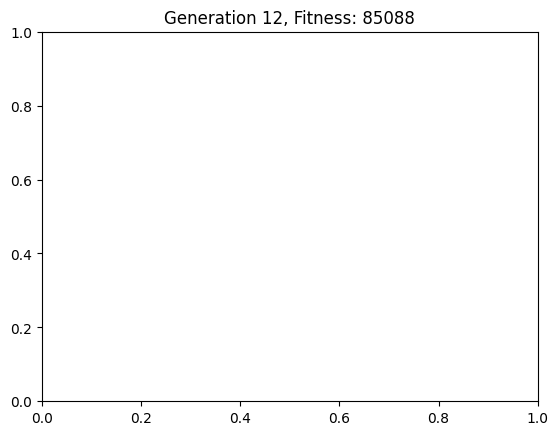

{'rooms': [{'name': 'Living Room', 'position': (493, 336), 'size': (189, 146)}, {'name': 'Bedroom1', 'position': (512, 482), 'size': (170, 109)}, {'name': 'Bedroom2', 'position': (742, 336), 'size': (200, 92)}, {'name': 'Passage', 'position': (683, 428), 'size': (91, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 85088}


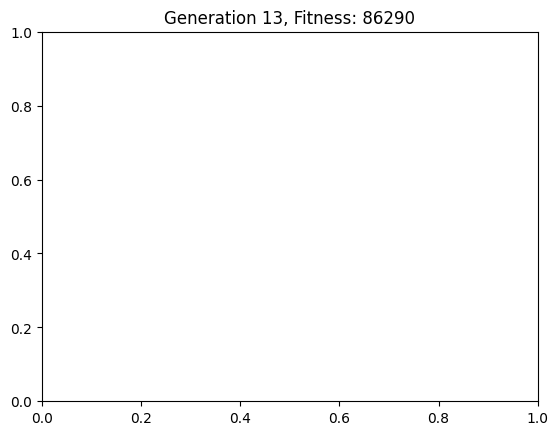

{'rooms': [{'name': 'Living Room', 'position': (488, 336), 'size': (192, 146)}, {'name': 'Bedroom1', 'position': (507, 482), 'size': (173, 109)}, {'name': 'Bedroom2', 'position': (738, 336), 'size': (204, 92)}, {'name': 'Passage', 'position': (680, 428), 'size': (93, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 86290}


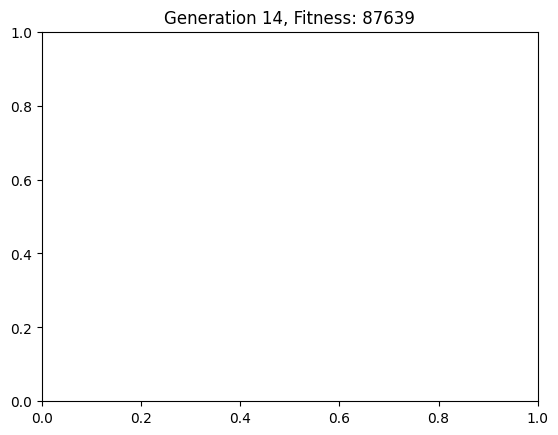

{'rooms': [{'name': 'Living Room', 'position': (483, 336), 'size': (195, 146)}, {'name': 'Bedroom1', 'position': (502, 482), 'size': (176, 109)}, {'name': 'Bedroom2', 'position': (734, 336), 'size': (208, 92)}, {'name': 'Passage', 'position': (678, 428), 'size': (96, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 87639}


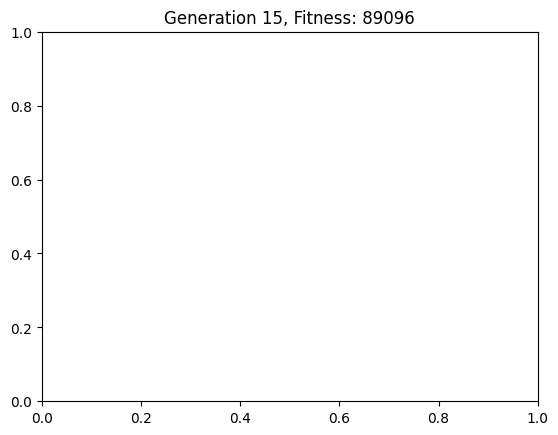

{'rooms': [{'name': 'Living Room', 'position': (477, 336), 'size': (197, 146)}, {'name': 'Bedroom1', 'position': (496, 482), 'size': (178, 109)}, {'name': 'Bedroom2', 'position': (730, 336), 'size': (212, 92)}, {'name': 'Passage', 'position': (675, 428), 'size': (99, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 89096}


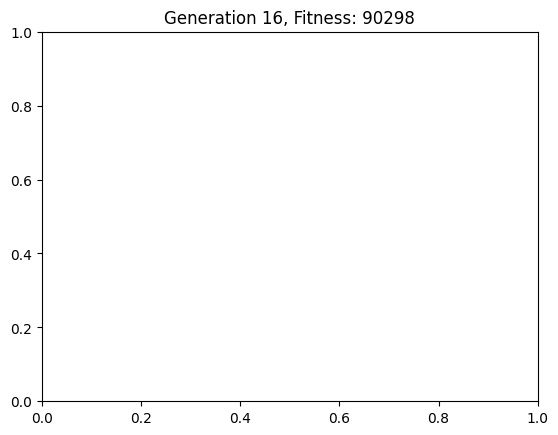

{'rooms': [{'name': 'Living Room', 'position': (472, 336), 'size': (200, 146)}, {'name': 'Bedroom1', 'position': (491, 482), 'size': (181, 109)}, {'name': 'Bedroom2', 'position': (726, 336), 'size': (216, 92)}, {'name': 'Passage', 'position': (672, 428), 'size': (101, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 90298}


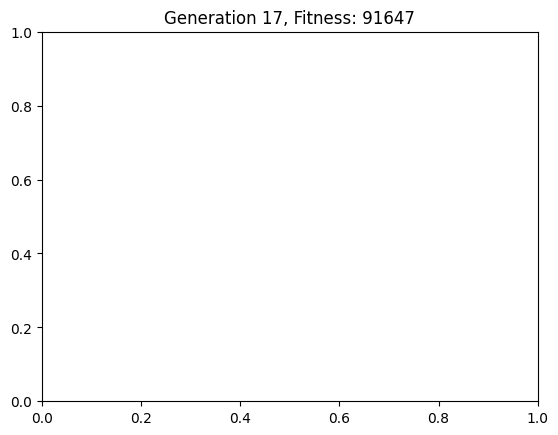

{'rooms': [{'name': 'Living Room', 'position': (467, 336), 'size': (203, 146)}, {'name': 'Bedroom1', 'position': (486, 482), 'size': (184, 109)}, {'name': 'Bedroom2', 'position': (722, 336), 'size': (220, 92)}, {'name': 'Passage', 'position': (670, 428), 'size': (104, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 91647}


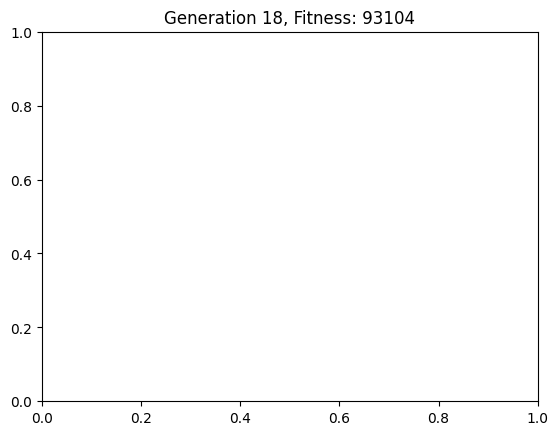

{'rooms': [{'name': 'Living Room', 'position': (461, 336), 'size': (205, 146)}, {'name': 'Bedroom1', 'position': (480, 482), 'size': (186, 109)}, {'name': 'Bedroom2', 'position': (718, 336), 'size': (224, 92)}, {'name': 'Passage', 'position': (667, 428), 'size': (107, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 93104}


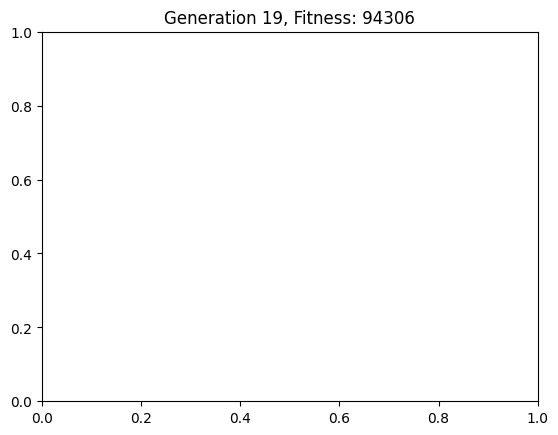

{'rooms': [{'name': 'Living Room', 'position': (456, 336), 'size': (208, 146)}, {'name': 'Bedroom1', 'position': (475, 482), 'size': (189, 109)}, {'name': 'Bedroom2', 'position': (714, 336), 'size': (228, 92)}, {'name': 'Passage', 'position': (664, 428), 'size': (109, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 94306}


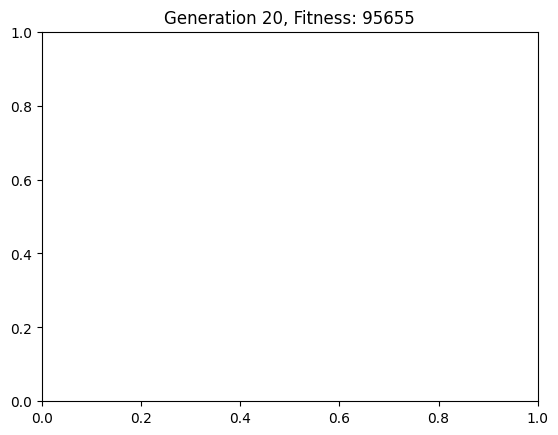

{'rooms': [{'name': 'Living Room', 'position': (451, 336), 'size': (211, 146)}, {'name': 'Bedroom1', 'position': (470, 482), 'size': (192, 109)}, {'name': 'Bedroom2', 'position': (710, 336), 'size': (232, 92)}, {'name': 'Passage', 'position': (662, 428), 'size': (112, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 95655}


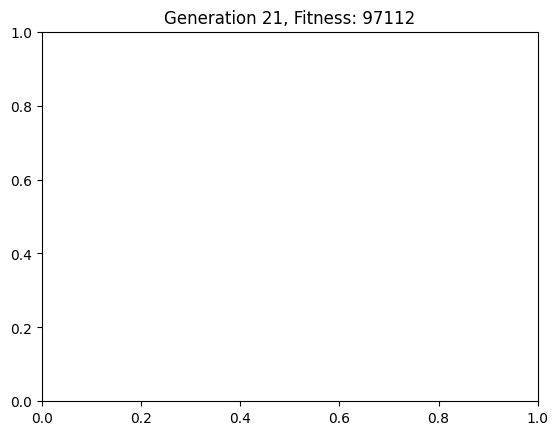

{'rooms': [{'name': 'Living Room', 'position': (445, 336), 'size': (213, 146)}, {'name': 'Bedroom1', 'position': (464, 482), 'size': (194, 109)}, {'name': 'Bedroom2', 'position': (706, 336), 'size': (236, 92)}, {'name': 'Passage', 'position': (659, 428), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 97112}


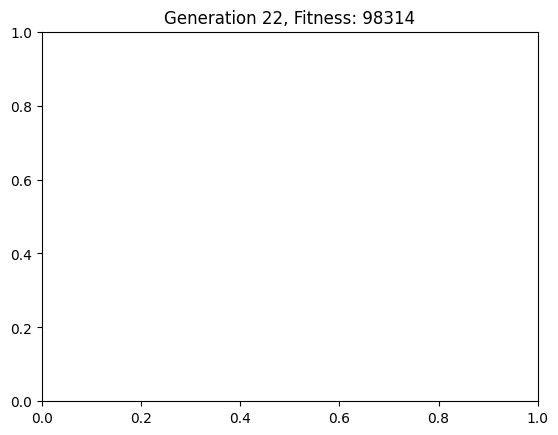

{'rooms': [{'name': 'Living Room', 'position': (440, 336), 'size': (216, 146)}, {'name': 'Bedroom1', 'position': (459, 482), 'size': (197, 109)}, {'name': 'Bedroom2', 'position': (702, 336), 'size': (240, 92)}, {'name': 'Passage', 'position': (656, 428), 'size': (117, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 98314}


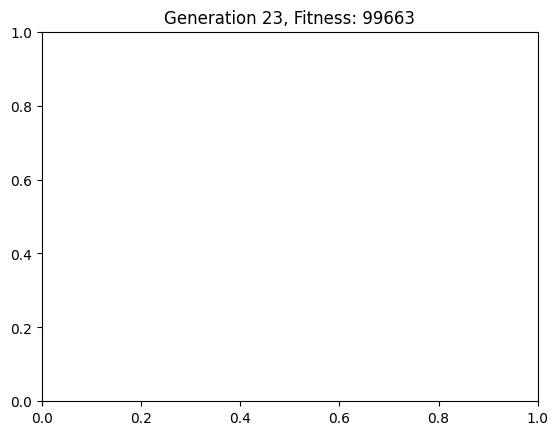

{'rooms': [{'name': 'Living Room', 'position': (435, 336), 'size': (219, 146)}, {'name': 'Bedroom1', 'position': (454, 482), 'size': (200, 109)}, {'name': 'Bedroom2', 'position': (698, 336), 'size': (244, 92)}, {'name': 'Passage', 'position': (654, 428), 'size': (120, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 99663}


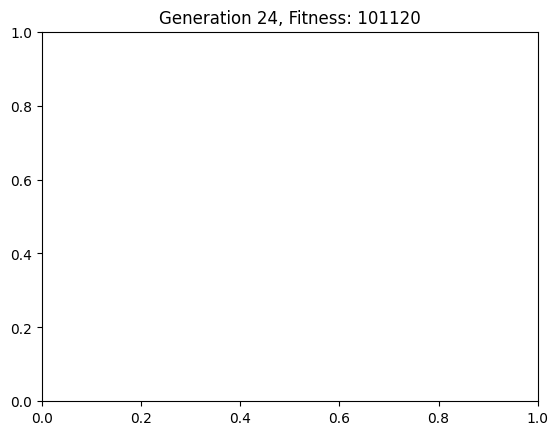

{'rooms': [{'name': 'Living Room', 'position': (429, 336), 'size': (221, 146)}, {'name': 'Bedroom1', 'position': (448, 482), 'size': (202, 109)}, {'name': 'Bedroom2', 'position': (694, 336), 'size': (248, 92)}, {'name': 'Passage', 'position': (651, 428), 'size': (123, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 101120}


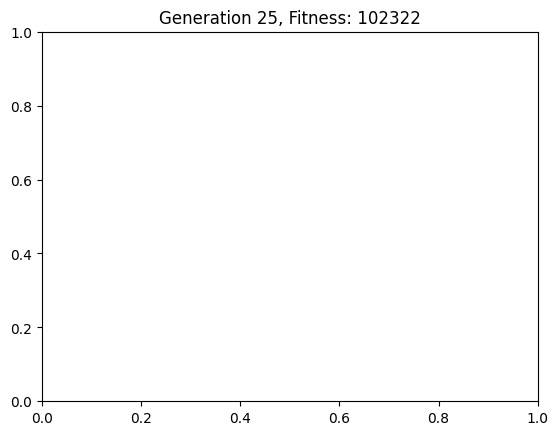

{'rooms': [{'name': 'Living Room', 'position': (424, 336), 'size': (224, 146)}, {'name': 'Bedroom1', 'position': (443, 482), 'size': (205, 109)}, {'name': 'Bedroom2', 'position': (690, 336), 'size': (252, 92)}, {'name': 'Passage', 'position': (648, 428), 'size': (125, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 102322}


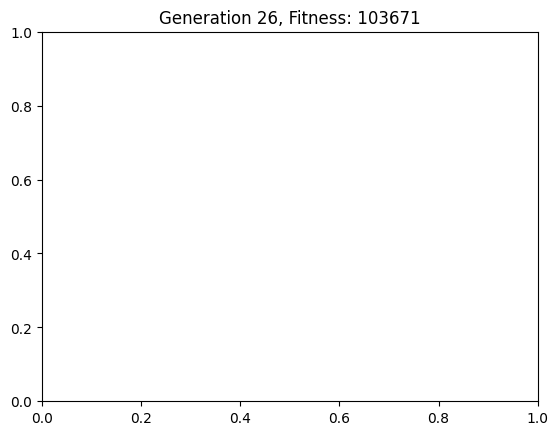

{'rooms': [{'name': 'Living Room', 'position': (419, 336), 'size': (227, 146)}, {'name': 'Bedroom1', 'position': (438, 482), 'size': (208, 109)}, {'name': 'Bedroom2', 'position': (686, 336), 'size': (256, 92)}, {'name': 'Passage', 'position': (646, 428), 'size': (128, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 103671}


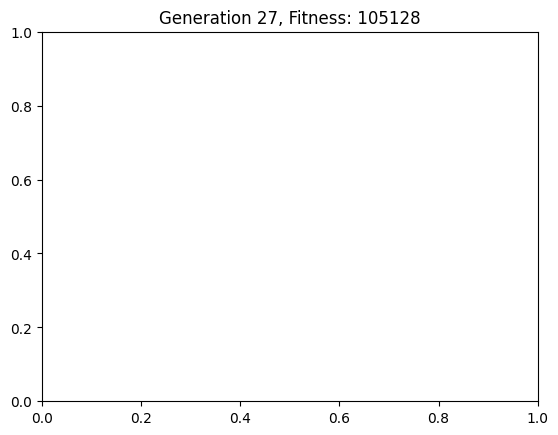

{'rooms': [{'name': 'Living Room', 'position': (413, 336), 'size': (229, 146)}, {'name': 'Bedroom1', 'position': (432, 482), 'size': (210, 109)}, {'name': 'Bedroom2', 'position': (682, 336), 'size': (260, 92)}, {'name': 'Passage', 'position': (643, 428), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 105128}


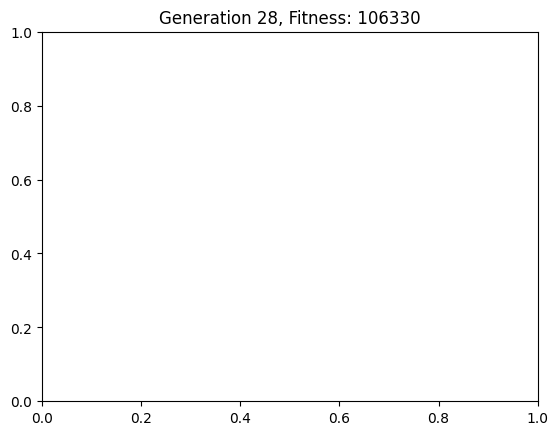

{'rooms': [{'name': 'Living Room', 'position': (408, 336), 'size': (232, 146)}, {'name': 'Bedroom1', 'position': (427, 482), 'size': (213, 109)}, {'name': 'Bedroom2', 'position': (678, 336), 'size': (264, 92)}, {'name': 'Passage', 'position': (640, 428), 'size': (133, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 106330}


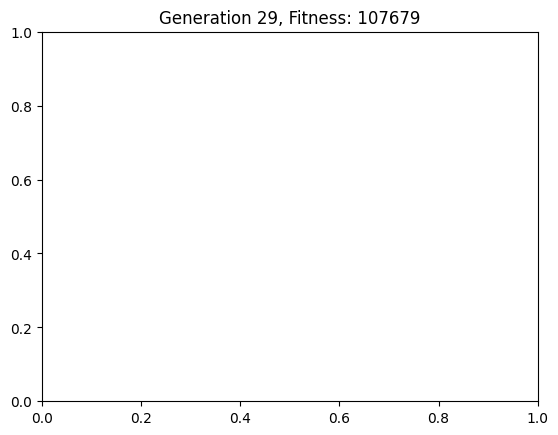

{'rooms': [{'name': 'Living Room', 'position': (403, 336), 'size': (235, 146)}, {'name': 'Bedroom1', 'position': (422, 482), 'size': (216, 109)}, {'name': 'Bedroom2', 'position': (674, 336), 'size': (268, 92)}, {'name': 'Passage', 'position': (638, 428), 'size': (136, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 107679}


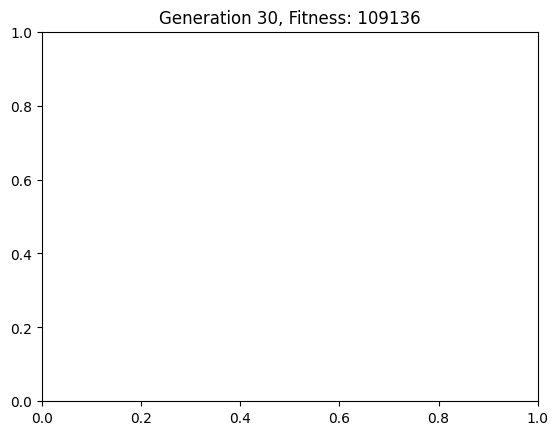

{'rooms': [{'name': 'Living Room', 'position': (397, 336), 'size': (237, 146)}, {'name': 'Bedroom1', 'position': (416, 482), 'size': (218, 109)}, {'name': 'Bedroom2', 'position': (670, 336), 'size': (272, 92)}, {'name': 'Passage', 'position': (635, 428), 'size': (139, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 109136}


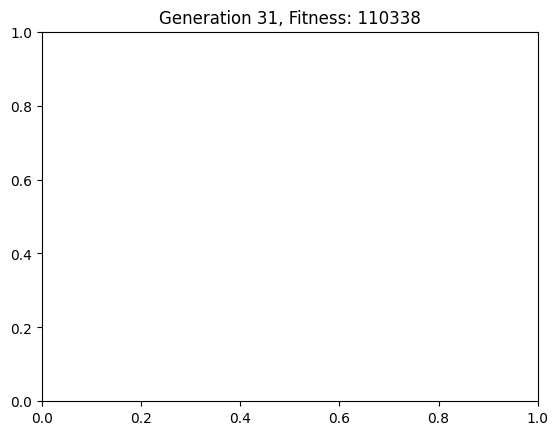

{'rooms': [{'name': 'Living Room', 'position': (392, 336), 'size': (240, 146)}, {'name': 'Bedroom1', 'position': (411, 482), 'size': (221, 109)}, {'name': 'Bedroom2', 'position': (666, 336), 'size': (276, 92)}, {'name': 'Passage', 'position': (632, 428), 'size': (141, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 110338}


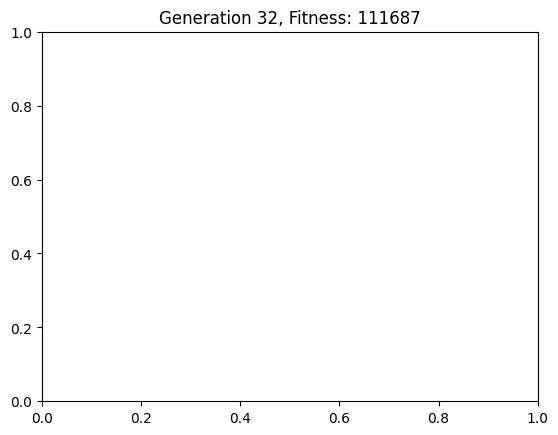

{'rooms': [{'name': 'Living Room', 'position': (387, 336), 'size': (243, 146)}, {'name': 'Bedroom1', 'position': (406, 482), 'size': (224, 109)}, {'name': 'Bedroom2', 'position': (662, 336), 'size': (280, 92)}, {'name': 'Passage', 'position': (630, 428), 'size': (144, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 111687}


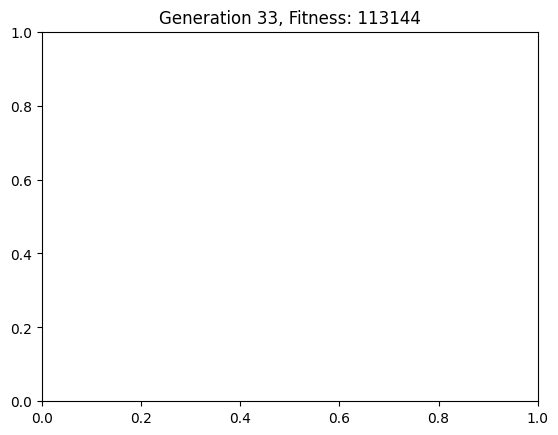

{'rooms': [{'name': 'Living Room', 'position': (381, 336), 'size': (245, 146)}, {'name': 'Bedroom1', 'position': (400, 482), 'size': (226, 109)}, {'name': 'Bedroom2', 'position': (658, 336), 'size': (284, 92)}, {'name': 'Passage', 'position': (627, 428), 'size': (147, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 113144}


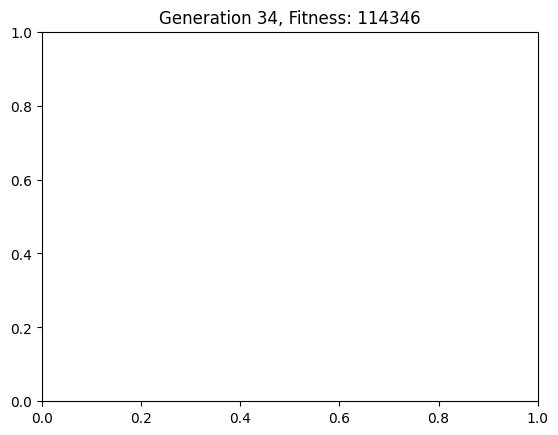

{'rooms': [{'name': 'Living Room', 'position': (377, 332), 'size': (247, 148)}, {'name': 'Bedroom1', 'position': (395, 480), 'size': (229, 111)}, {'name': 'Bedroom2', 'position': (654, 336), 'size': (288, 92)}, {'name': 'Passage', 'position': (624, 428), 'size': (149, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 114346}


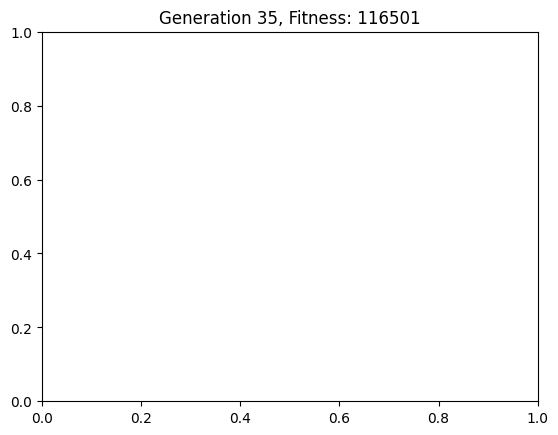

{'rooms': [{'name': 'Living Room', 'position': (372, 326), 'size': (250, 150)}, {'name': 'Bedroom1', 'position': (390, 477), 'size': (232, 114)}, {'name': 'Bedroom2', 'position': (650, 336), 'size': (292, 92)}, {'name': 'Passage', 'position': (622, 428), 'size': (152, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 116501}


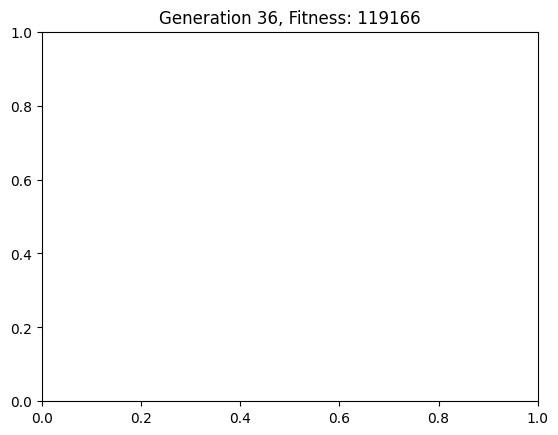

{'rooms': [{'name': 'Living Room', 'position': (366, 321), 'size': (252, 153)}, {'name': 'Bedroom1', 'position': (384, 474), 'size': (234, 116)}, {'name': 'Bedroom2', 'position': (646, 336), 'size': (296, 92)}, {'name': 'Passage', 'position': (619, 428), 'size': (155, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 119166}


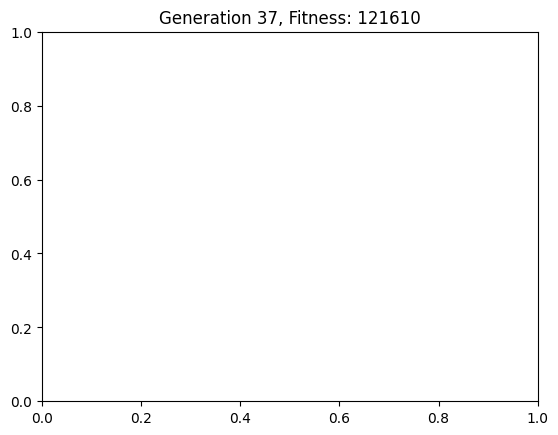

{'rooms': [{'name': 'Living Room', 'position': (361, 316), 'size': (255, 156)}, {'name': 'Bedroom1', 'position': (379, 472), 'size': (237, 119)}, {'name': 'Bedroom2', 'position': (642, 336), 'size': (300, 92)}, {'name': 'Passage', 'position': (616, 428), 'size': (157, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 121610}


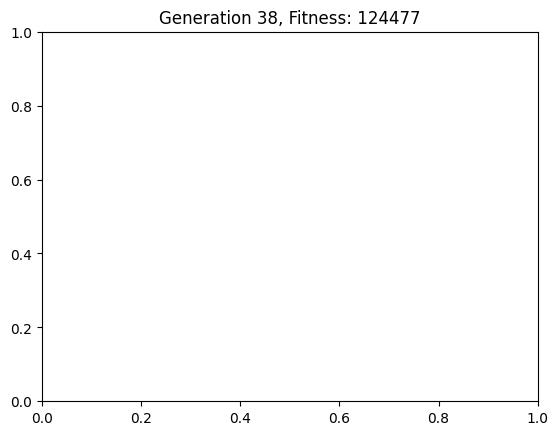

{'rooms': [{'name': 'Living Room', 'position': (356, 310), 'size': (258, 158)}, {'name': 'Bedroom1', 'position': (374, 469), 'size': (240, 122)}, {'name': 'Bedroom2', 'position': (638, 336), 'size': (304, 92)}, {'name': 'Passage', 'position': (614, 428), 'size': (160, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 124477}


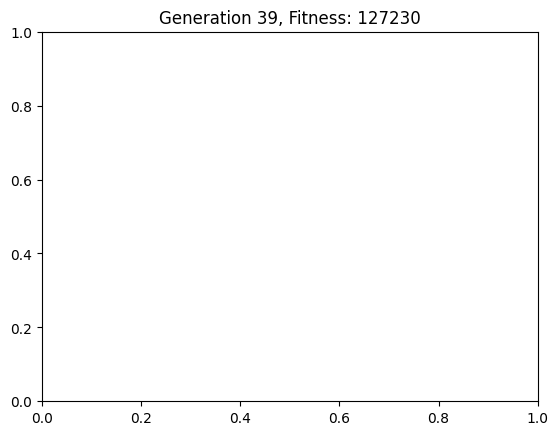

{'rooms': [{'name': 'Living Room', 'position': (350, 305), 'size': (260, 161)}, {'name': 'Bedroom1', 'position': (368, 466), 'size': (242, 124)}, {'name': 'Bedroom2', 'position': (634, 336), 'size': (308, 92)}, {'name': 'Passage', 'position': (611, 428), 'size': (163, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 127230}


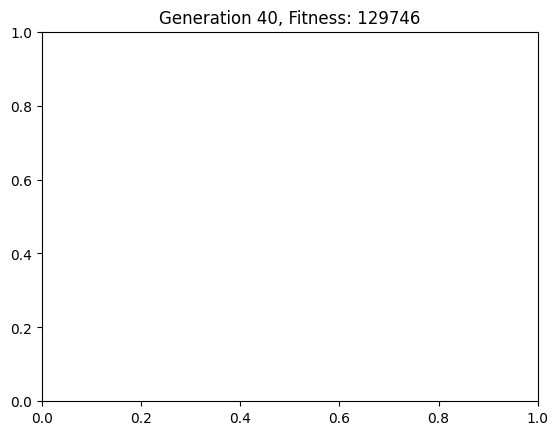

{'rooms': [{'name': 'Living Room', 'position': (345, 300), 'size': (263, 164)}, {'name': 'Bedroom1', 'position': (363, 464), 'size': (245, 127)}, {'name': 'Bedroom2', 'position': (630, 336), 'size': (312, 92)}, {'name': 'Passage', 'position': (608, 428), 'size': (165, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 129746}


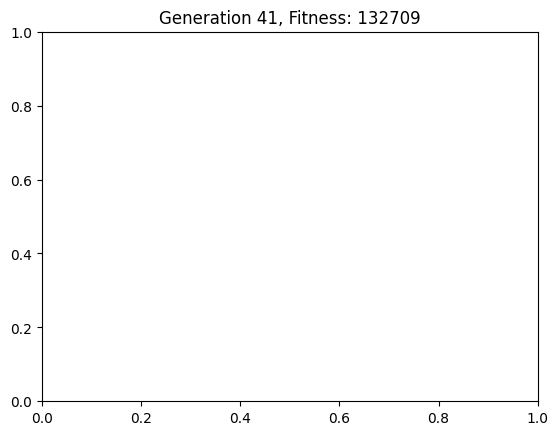

{'rooms': [{'name': 'Living Room', 'position': (340, 294), 'size': (266, 166)}, {'name': 'Bedroom1', 'position': (358, 461), 'size': (248, 130)}, {'name': 'Bedroom2', 'position': (626, 336), 'size': (316, 92)}, {'name': 'Passage', 'position': (606, 428), 'size': (168, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 132709}


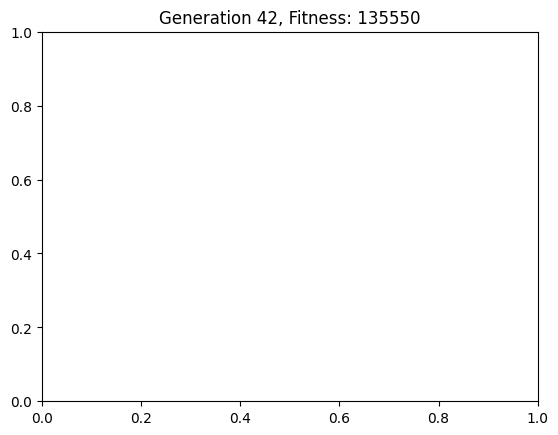

{'rooms': [{'name': 'Living Room', 'position': (338, 289), 'size': (267, 169)}, {'name': 'Bedroom1', 'position': (353, 458), 'size': (251, 132)}, {'name': 'Bedroom2', 'position': (622, 336), 'size': (320, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 135550}


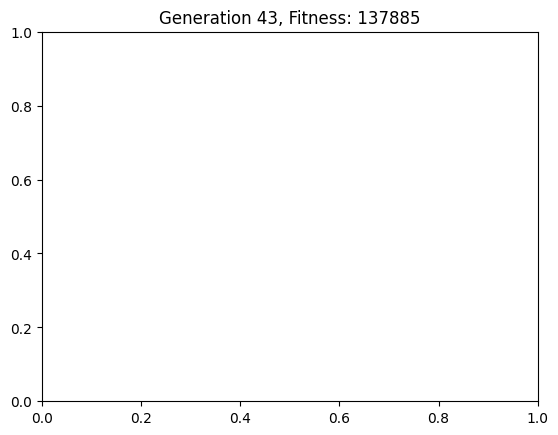

{'rooms': [{'name': 'Living Room', 'position': (338, 284), 'size': (267, 172)}, {'name': 'Bedroom1', 'position': (349, 456), 'size': (255, 135)}, {'name': 'Bedroom2', 'position': (618, 336), 'size': (324, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 137885}


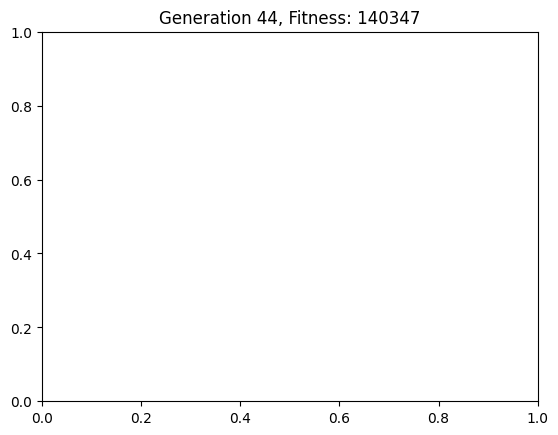

{'rooms': [{'name': 'Living Room', 'position': (338, 278), 'size': (267, 174)}, {'name': 'Bedroom1', 'position': (345, 453), 'size': (259, 138)}, {'name': 'Bedroom2', 'position': (614, 336), 'size': (328, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 140347}


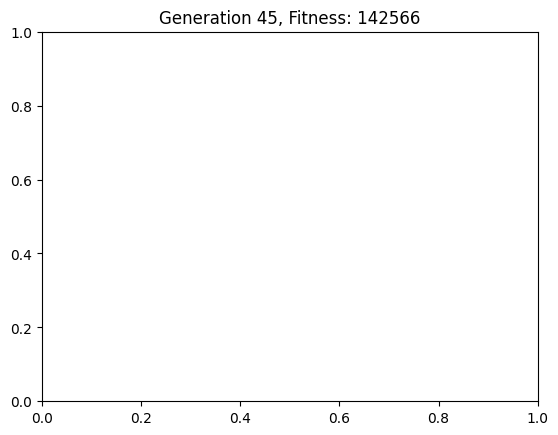

{'rooms': [{'name': 'Living Room', 'position': (338, 273), 'size': (267, 177)}, {'name': 'Bedroom1', 'position': (341, 450), 'size': (263, 140)}, {'name': 'Bedroom2', 'position': (610, 336), 'size': (332, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 142566}


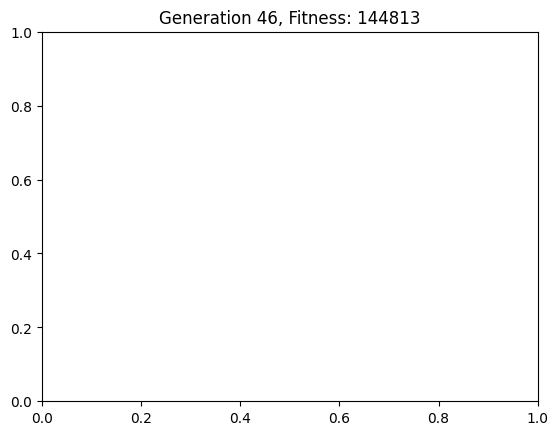

{'rooms': [{'name': 'Living Room', 'position': (338, 268), 'size': (267, 180)}, {'name': 'Bedroom1', 'position': (338, 448), 'size': (267, 143)}, {'name': 'Bedroom2', 'position': (606, 336), 'size': (336, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 144813}


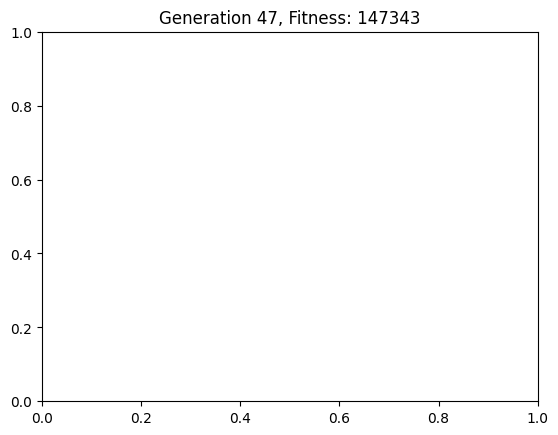

{'rooms': [{'name': 'Living Room', 'position': (338, 262), 'size': (267, 182)}, {'name': 'Bedroom1', 'position': (338, 445), 'size': (267, 146)}, {'name': 'Bedroom2', 'position': (605, 336), 'size': (337, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 147343}


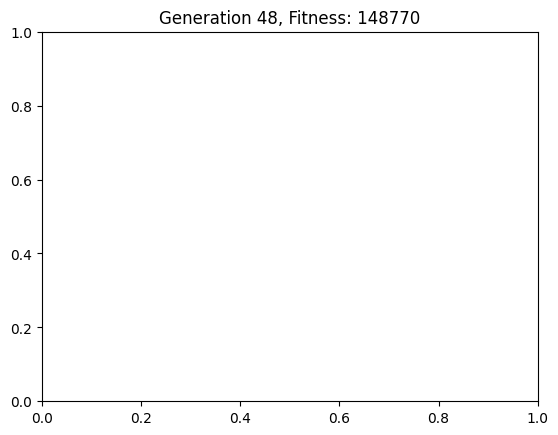

{'rooms': [{'name': 'Living Room', 'position': (338, 257), 'size': (267, 185)}, {'name': 'Bedroom1', 'position': (338, 442), 'size': (267, 148)}, {'name': 'Bedroom2', 'position': (605, 336), 'size': (337, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 148770}


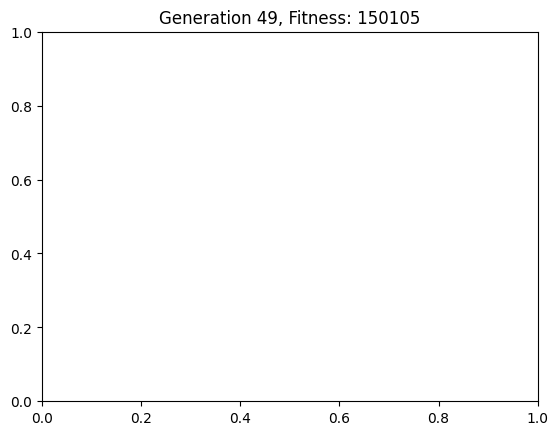

{'rooms': [{'name': 'Living Room', 'position': (338, 252), 'size': (267, 188)}, {'name': 'Bedroom1', 'position': (338, 440), 'size': (267, 151)}, {'name': 'Bedroom2', 'position': (605, 336), 'size': (337, 92)}, {'name': 'Passage', 'position': (605, 428), 'size': (169, 108)}, {'name': 'Kitchen', 'position': (774, 443), 'size': (116, 50)}, {'name': 'Washroom', 'position': (774, 493), 'size': (62, 99)}], 'fitness': 150105}
Elapsed time: 468.10 seconds


<Figure size 640x480 with 0 Axes>

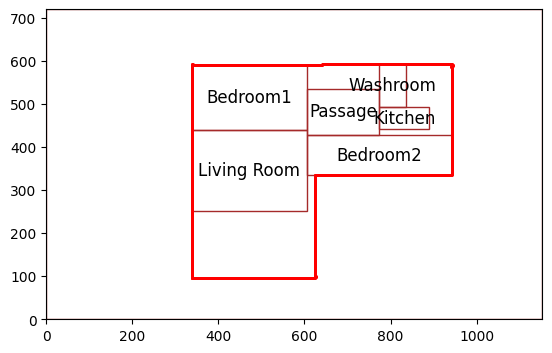

Elapsed time for initial population generation: 29.12 seconds


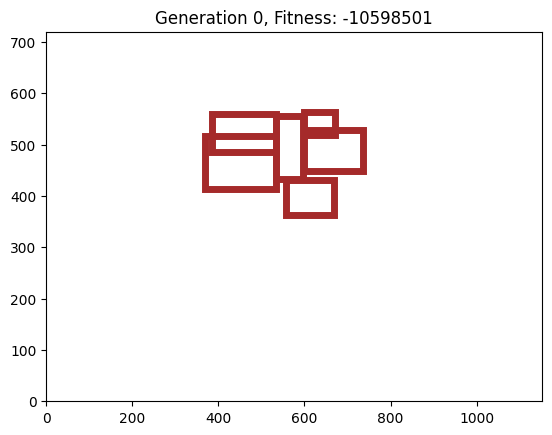

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 102)}, {'name': 'Passage', 'position': (534, 433), 'size': (63, 123)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 75)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (138, 81)}], 'fitness': -10598501}


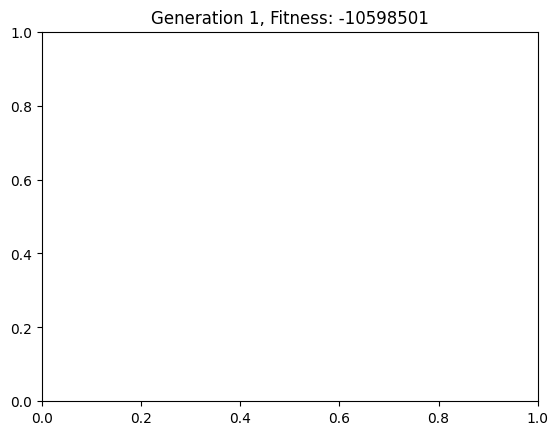

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 102)}, {'name': 'Passage', 'position': (533, 433), 'size': (64, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 75)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (138, 81)}], 'fitness': -10598501}


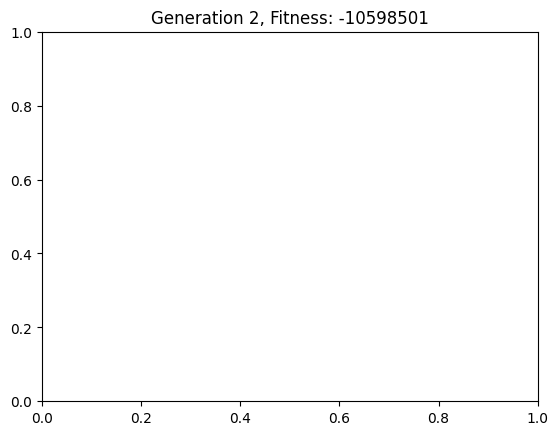

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 102)}, {'name': 'Passage', 'position': (533, 433), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 75)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (138, 81)}], 'fitness': -10599338}


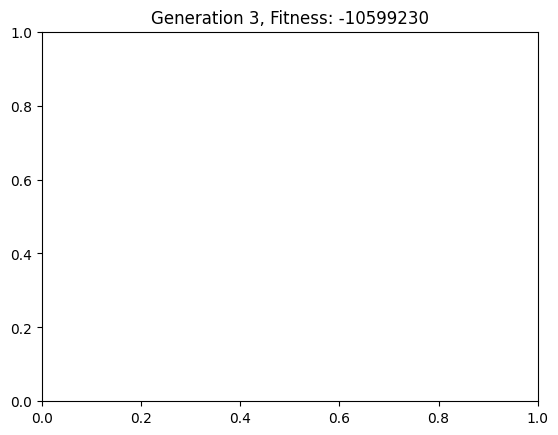

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 102)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 75)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (138, 81)}, {'name': 'Passage', 'position': (533, 433), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (74, 44)}], 'fitness': -10599230}


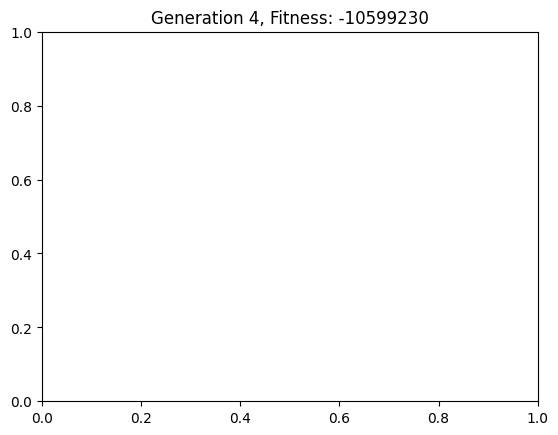

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 102)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 75)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (138, 81)}, {'name': 'Passage', 'position': (533, 433), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (74, 44)}], 'fitness': -10599230}


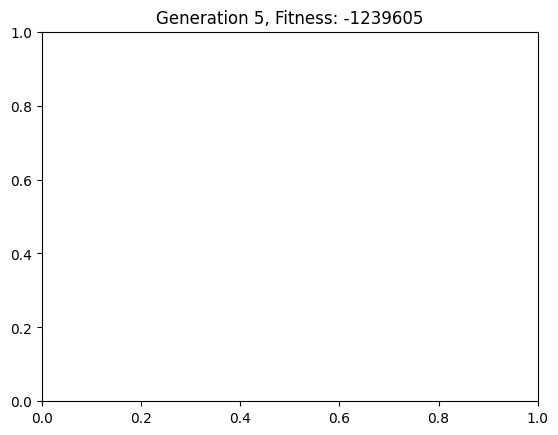

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 71)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 44)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (64, 81)}, {'name': 'Passage', 'position': (533, 433), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (74, 34)}], 'fitness': -1239605}


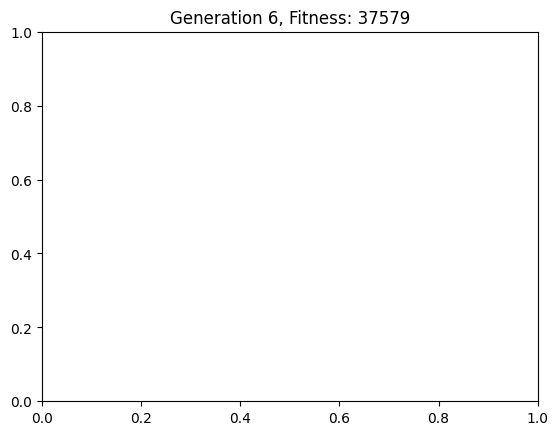

{'rooms': [{'name': 'Living Room', 'position': (370, 414), 'size': (163, 71)}, {'name': 'Bedroom1', 'position': (385, 485), 'size': (148, 44)}, {'name': 'Bedroom2', 'position': (598, 448), 'size': (64, 71)}, {'name': 'Passage', 'position': (533, 433), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (10, 34)}], 'fitness': 37579}


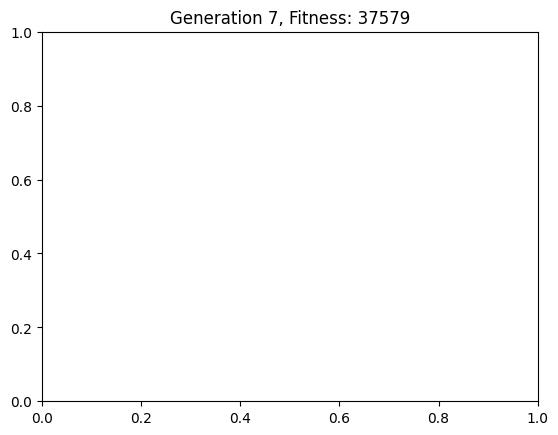

{'rooms': [{'name': 'Living Room', 'position': (369, 413), 'size': (163, 71)}, {'name': 'Bedroom1', 'position': (384, 485), 'size': (148, 45)}, {'name': 'Bedroom2', 'position': (598, 447), 'size': (65, 71)}, {'name': 'Passage', 'position': (533, 433), 'size': (65, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (11, 17)}], 'fitness': 37579}


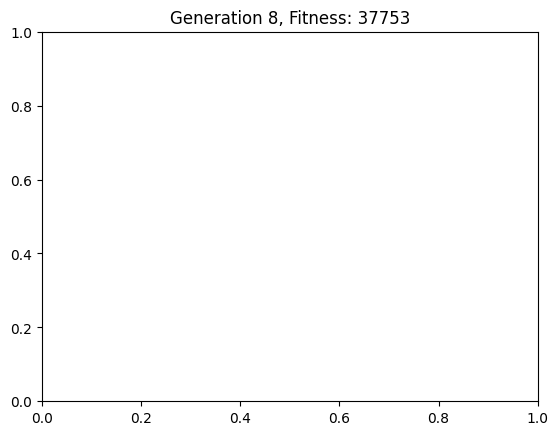

{'rooms': [{'name': 'Living Room', 'position': (369, 413), 'size': (163, 71)}, {'name': 'Bedroom1', 'position': (384, 485), 'size': (148, 45)}, {'name': 'Bedroom2', 'position': (598, 447), 'size': (65, 71)}, {'name': 'Passage', 'position': (532, 433), 'size': (66, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (11, 17)}], 'fitness': 37753}


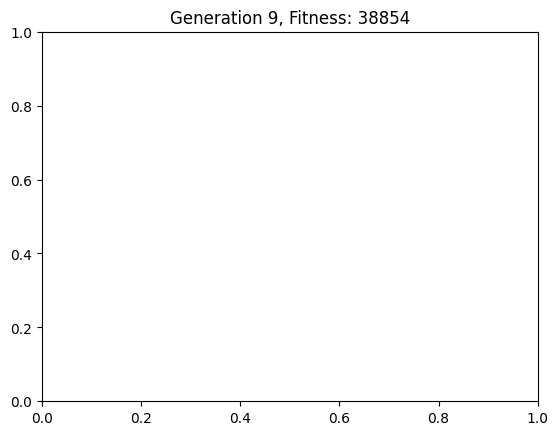

{'rooms': [{'name': 'Living Room', 'position': (364, 408), 'size': (167, 75)}, {'name': 'Bedroom1', 'position': (378, 483), 'size': (151, 52)}, {'name': 'Bedroom2', 'position': (598, 443), 'size': (74, 76)}, {'name': 'Passage', 'position': (531, 433), 'size': (67, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (20, 38)}], 'fitness': 38854}


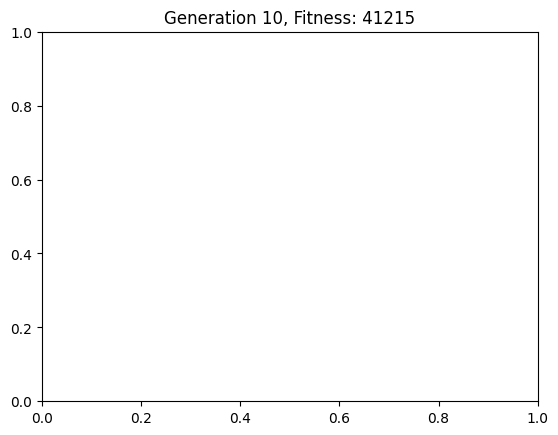

{'rooms': [{'name': 'Living Room', 'position': (364, 409), 'size': (166, 75)}, {'name': 'Bedroom1', 'position': (377, 483), 'size': (152, 54)}, {'name': 'Bedroom2', 'position': (598, 441), 'size': (77, 77)}, {'name': 'Passage', 'position': (529, 433), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (24, 39)}], 'fitness': 41215}


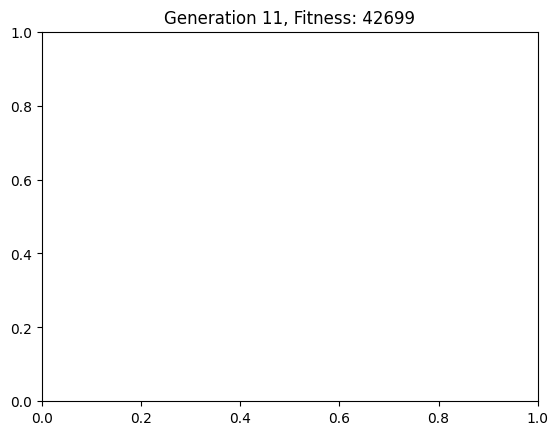

{'rooms': [{'name': 'Living Room', 'position': (362, 406), 'size': (169, 78)}, {'name': 'Bedroom1', 'position': (377, 483), 'size': (152, 54)}, {'name': 'Bedroom2', 'position': (598, 439), 'size': (82, 80)}, {'name': 'Passage', 'position': (529, 433), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (31, 57)}], 'fitness': 42699}


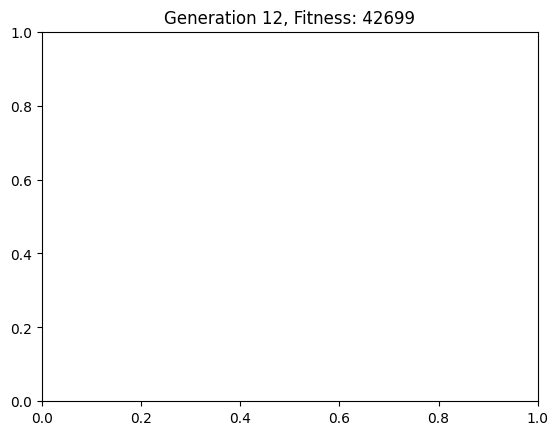

{'rooms': [{'name': 'Living Room', 'position': (359, 403), 'size': (170, 80)}, {'name': 'Bedroom1', 'position': (375, 483), 'size': (153, 57)}, {'name': 'Bedroom2', 'position': (598, 437), 'size': (85, 81)}, {'name': 'Passage', 'position': (529, 433), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (37, 65)}], 'fitness': -463349}


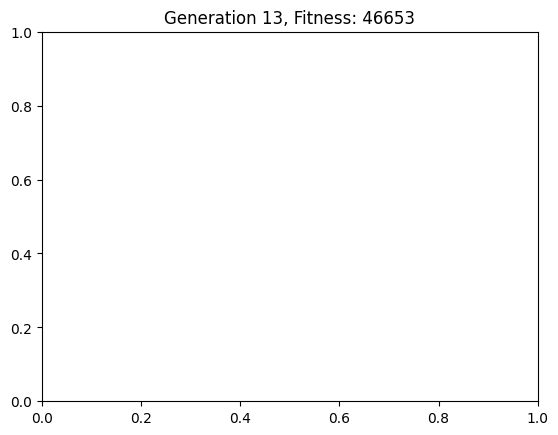

{'rooms': [{'name': 'Living Room', 'position': (355, 398), 'size': (174, 83)}, {'name': 'Bedroom1', 'position': (372, 483), 'size': (157, 64)}, {'name': 'Bedroom2', 'position': (598, 434), 'size': (92, 85)}, {'name': 'Passage', 'position': (529, 433), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (43, 70)}], 'fitness': 46653}


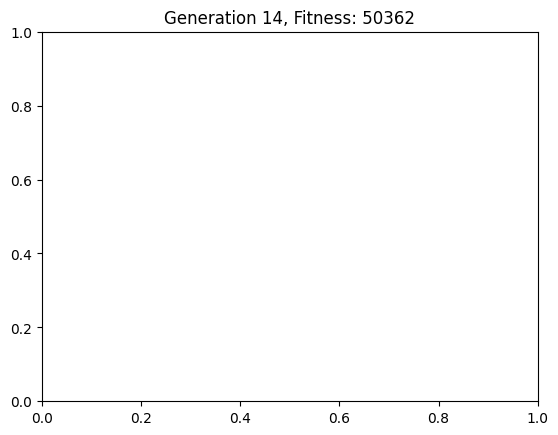

{'rooms': [{'name': 'Living Room', 'position': (349, 395), 'size': (176, 88)}, {'name': 'Bedroom1', 'position': (366, 483), 'size': (159, 72)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (100, 87)}, {'name': 'Passage', 'position': (526, 433), 'size': (72, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (43, 70)}], 'fitness': 50362}


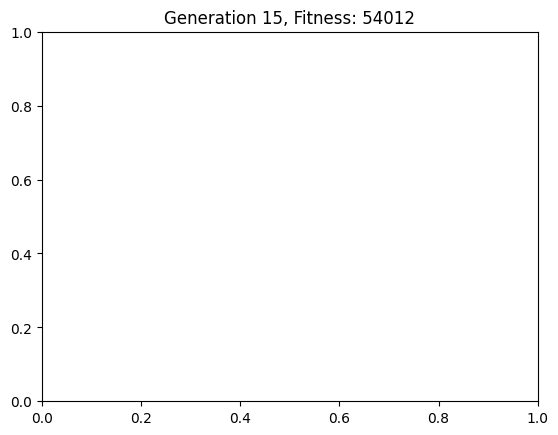

{'rooms': [{'name': 'Living Room', 'position': (344, 391), 'size': (179, 92)}, {'name': 'Bedroom1', 'position': (361, 483), 'size': (162, 80)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (108, 87)}, {'name': 'Passage', 'position': (523, 433), 'size': (74, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (44, 71)}], 'fitness': 54012}


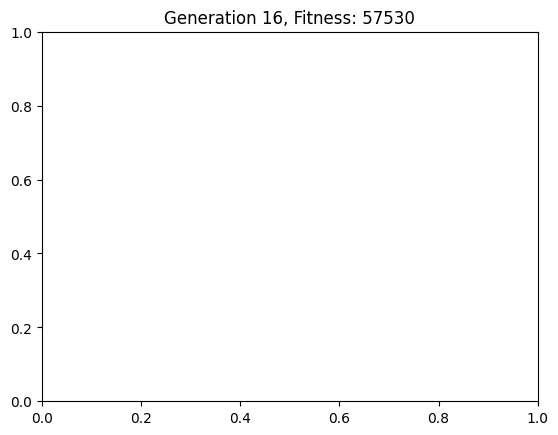

{'rooms': [{'name': 'Living Room', 'position': (339, 387), 'size': (182, 96)}, {'name': 'Bedroom1', 'position': (356, 483), 'size': (165, 88)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (116, 87)}, {'name': 'Passage', 'position': (521, 433), 'size': (77, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 57530}


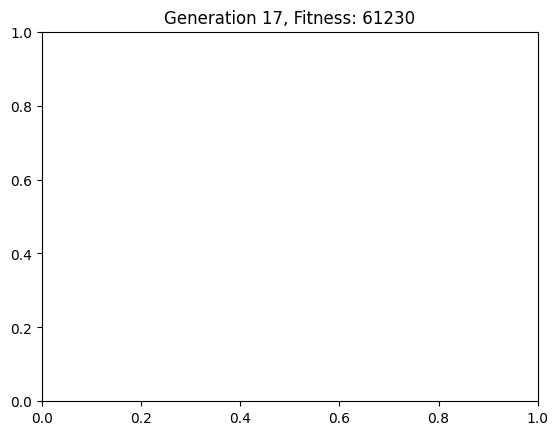

{'rooms': [{'name': 'Living Room', 'position': (338, 383), 'size': (182, 100)}, {'name': 'Bedroom1', 'position': (351, 483), 'size': (168, 96)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (124, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 61230}


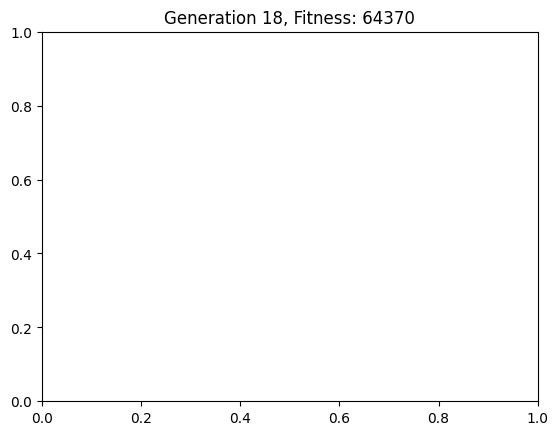

{'rooms': [{'name': 'Living Room', 'position': (338, 379), 'size': (182, 104)}, {'name': 'Bedroom1', 'position': (347, 483), 'size': (172, 104)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (132, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 64370}


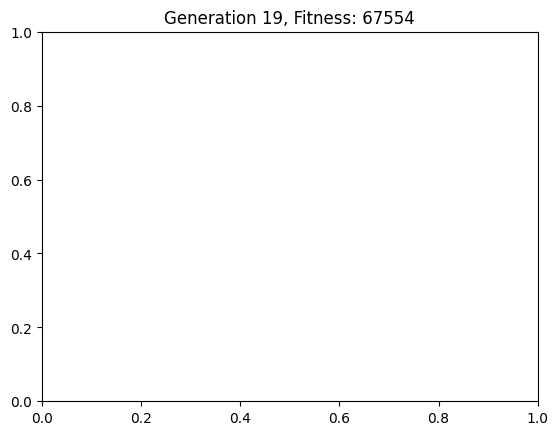

{'rooms': [{'name': 'Living Room', 'position': (338, 374), 'size': (182, 107)}, {'name': 'Bedroom1', 'position': (343, 481), 'size': (176, 109)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (140, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 67554}


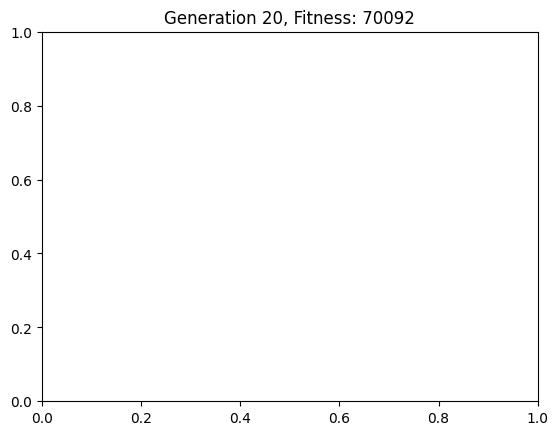

{'rooms': [{'name': 'Living Room', 'position': (338, 369), 'size': (182, 110)}, {'name': 'Bedroom1', 'position': (339, 479), 'size': (180, 112)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (148, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 70092}


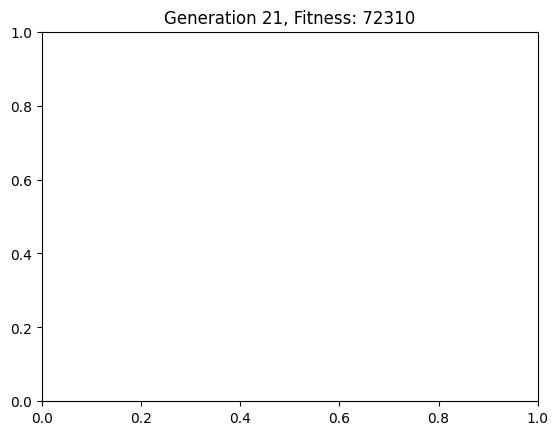

{'rooms': [{'name': 'Living Room', 'position': (338, 363), 'size': (182, 112)}, {'name': 'Bedroom1', 'position': (338, 476), 'size': (182, 115)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (156, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 72310}


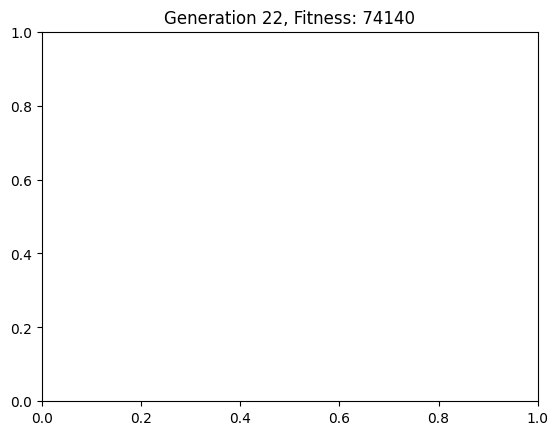

{'rooms': [{'name': 'Living Room', 'position': (338, 358), 'size': (182, 115)}, {'name': 'Bedroom1', 'position': (338, 473), 'size': (182, 117)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (164, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 74140}


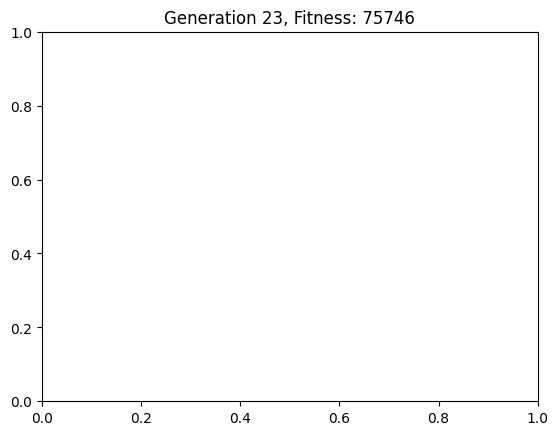

{'rooms': [{'name': 'Living Room', 'position': (338, 353), 'size': (182, 118)}, {'name': 'Bedroom1', 'position': (338, 471), 'size': (182, 120)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (172, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 75746}


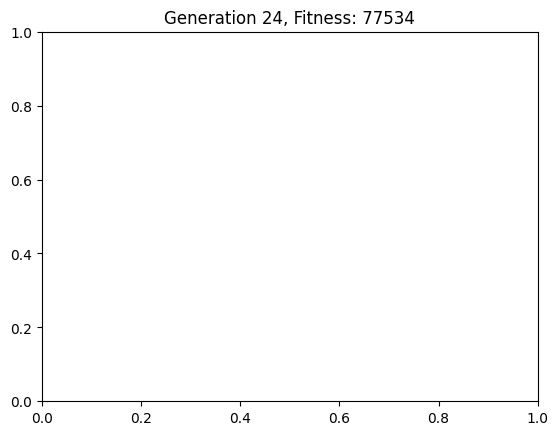

{'rooms': [{'name': 'Living Room', 'position': (338, 347), 'size': (182, 120)}, {'name': 'Bedroom1', 'position': (338, 468), 'size': (182, 123)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (180, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 77534}


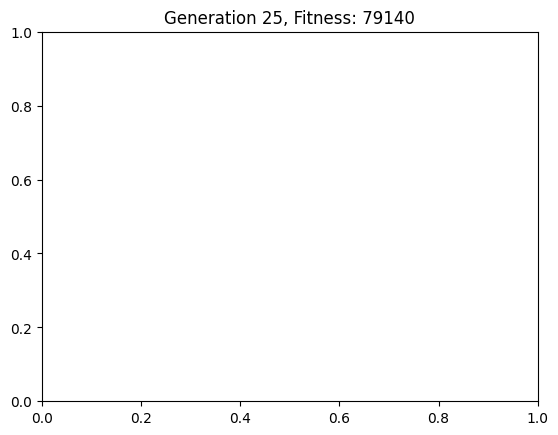

{'rooms': [{'name': 'Living Room', 'position': (338, 342), 'size': (182, 123)}, {'name': 'Bedroom1', 'position': (338, 465), 'size': (182, 125)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (188, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 79140}


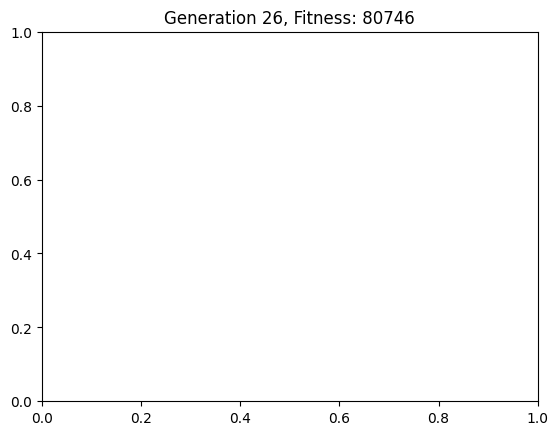

{'rooms': [{'name': 'Living Room', 'position': (338, 337), 'size': (182, 126)}, {'name': 'Bedroom1', 'position': (338, 463), 'size': (182, 128)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (196, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 80746}


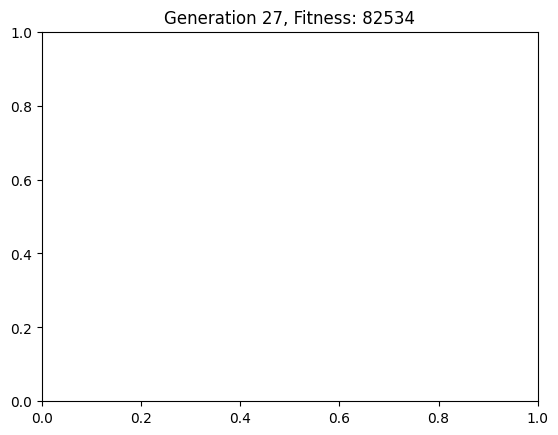

{'rooms': [{'name': 'Living Room', 'position': (338, 331), 'size': (182, 128)}, {'name': 'Bedroom1', 'position': (338, 460), 'size': (182, 131)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (204, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 82534}


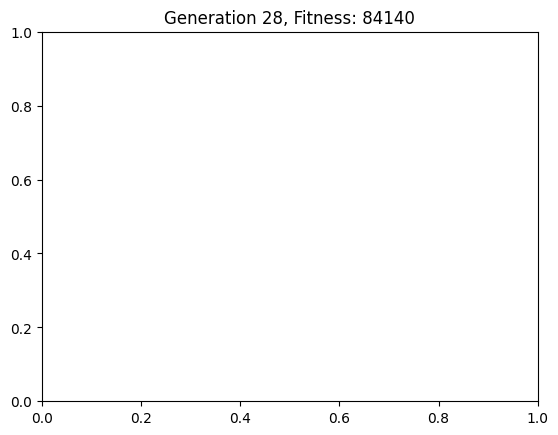

{'rooms': [{'name': 'Living Room', 'position': (338, 326), 'size': (182, 131)}, {'name': 'Bedroom1', 'position': (338, 457), 'size': (182, 133)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (212, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 84140}


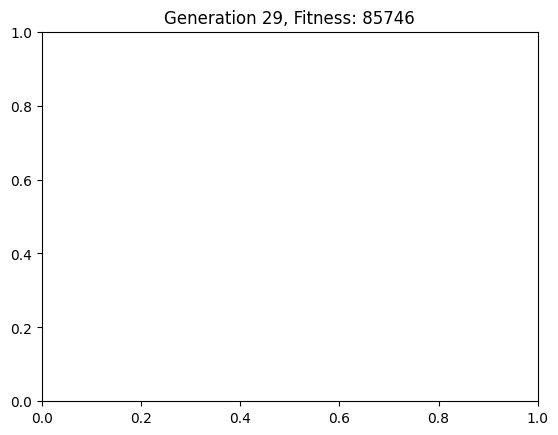

{'rooms': [{'name': 'Living Room', 'position': (338, 321), 'size': (182, 134)}, {'name': 'Bedroom1', 'position': (338, 455), 'size': (182, 136)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (220, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 85746}


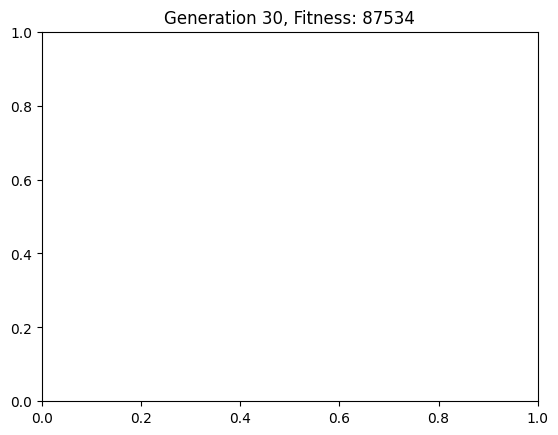

{'rooms': [{'name': 'Living Room', 'position': (338, 315), 'size': (182, 136)}, {'name': 'Bedroom1', 'position': (338, 452), 'size': (182, 139)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (228, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 87534}


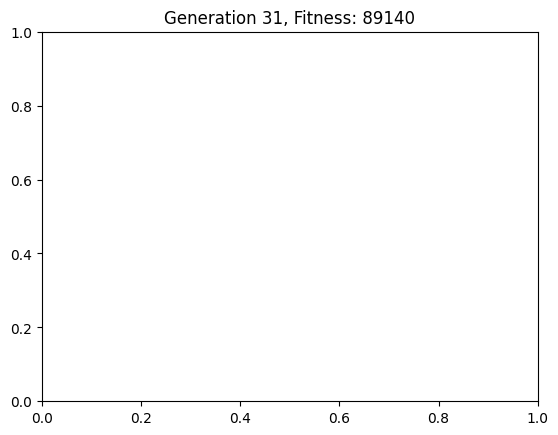

{'rooms': [{'name': 'Living Room', 'position': (338, 310), 'size': (182, 139)}, {'name': 'Bedroom1', 'position': (338, 449), 'size': (182, 141)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (236, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 89140}


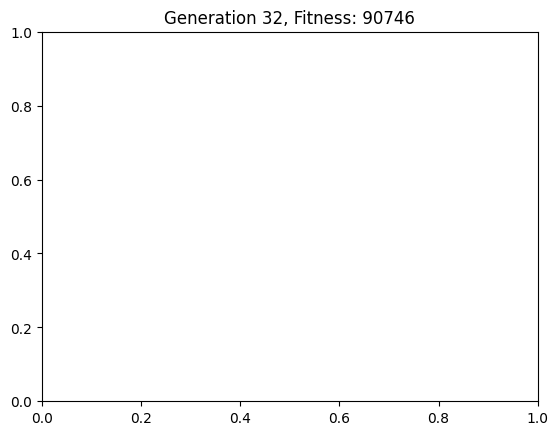

{'rooms': [{'name': 'Living Room', 'position': (338, 305), 'size': (182, 142)}, {'name': 'Bedroom1', 'position': (338, 447), 'size': (182, 144)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (244, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 90746}


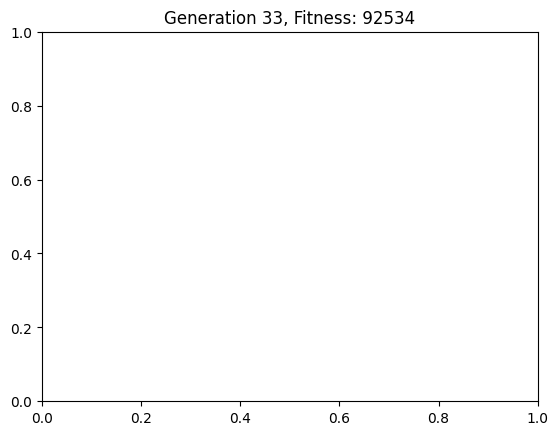

{'rooms': [{'name': 'Living Room', 'position': (338, 299), 'size': (182, 144)}, {'name': 'Bedroom1', 'position': (338, 444), 'size': (182, 147)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (252, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 92534}


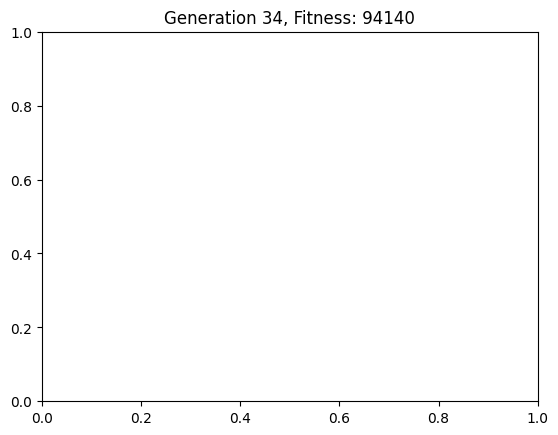

{'rooms': [{'name': 'Living Room', 'position': (338, 294), 'size': (182, 147)}, {'name': 'Bedroom1', 'position': (338, 441), 'size': (182, 149)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (260, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 94140}


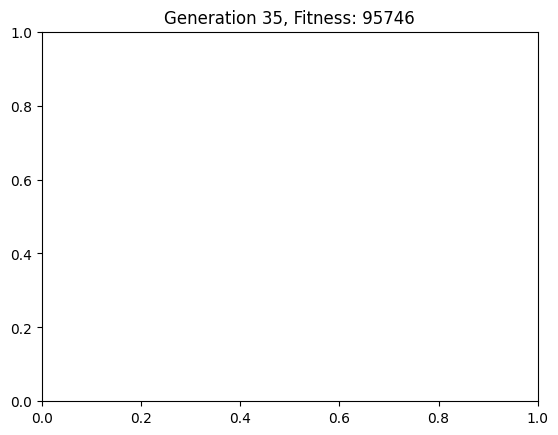

{'rooms': [{'name': 'Living Room', 'position': (338, 289), 'size': (182, 150)}, {'name': 'Bedroom1', 'position': (338, 439), 'size': (182, 152)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (268, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 95746}


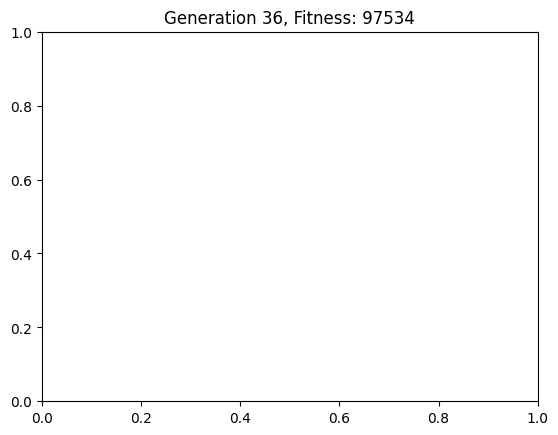

{'rooms': [{'name': 'Living Room', 'position': (338, 283), 'size': (182, 152)}, {'name': 'Bedroom1', 'position': (338, 436), 'size': (182, 155)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (276, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 97534}


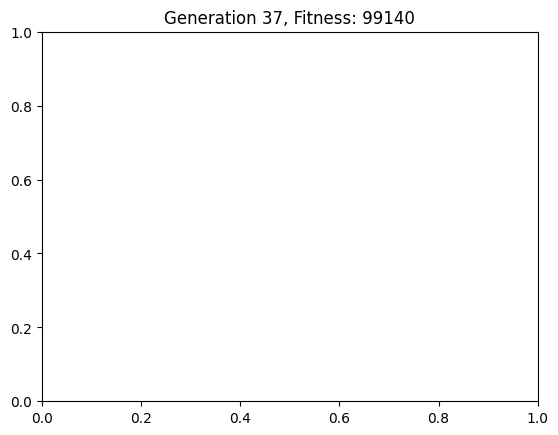

{'rooms': [{'name': 'Living Room', 'position': (338, 278), 'size': (184, 155)}, {'name': 'Bedroom1', 'position': (338, 433), 'size': (182, 158)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (284, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 99140}


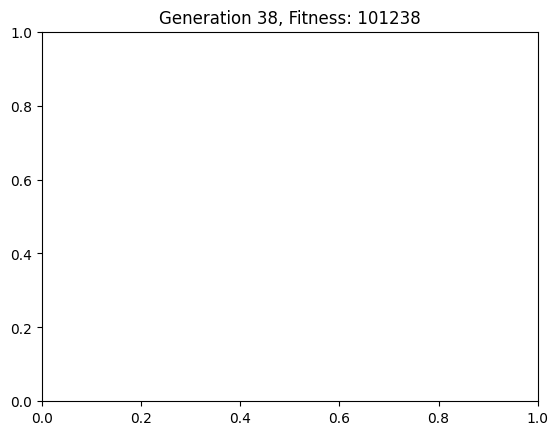

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (192, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (292, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 101238}


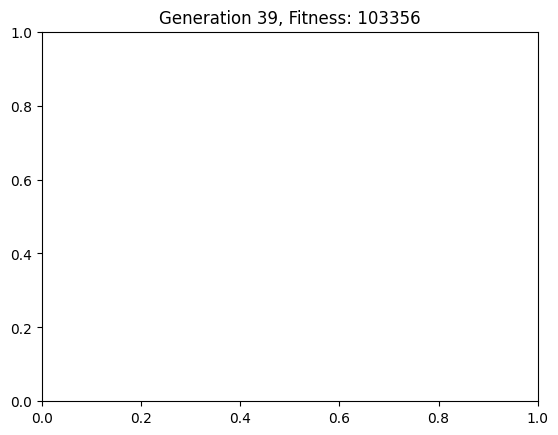

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (200, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (300, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 103356}


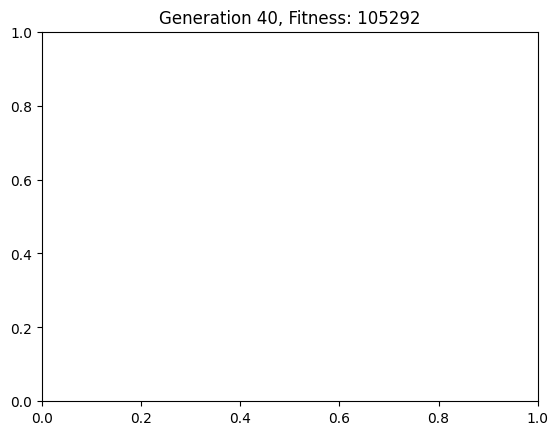

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (208, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (308, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 105292}


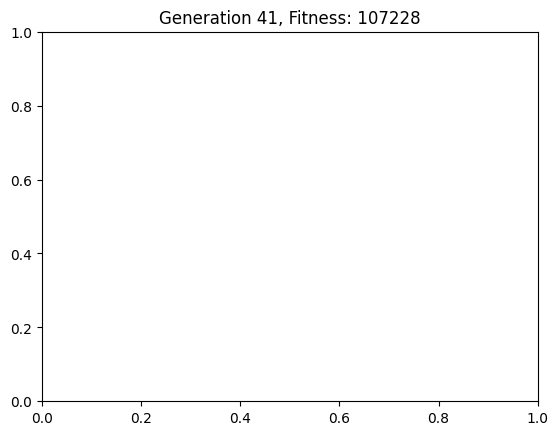

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (216, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (316, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 107228}


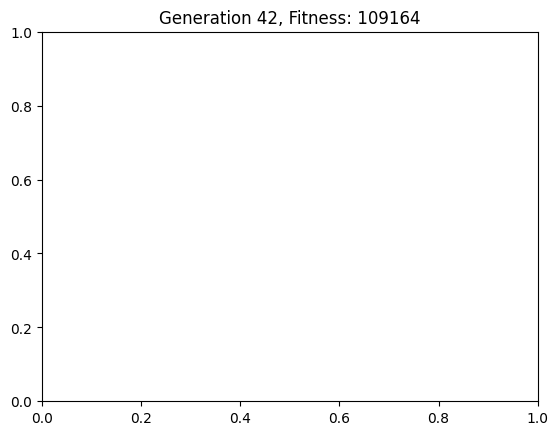

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (324, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 109164}


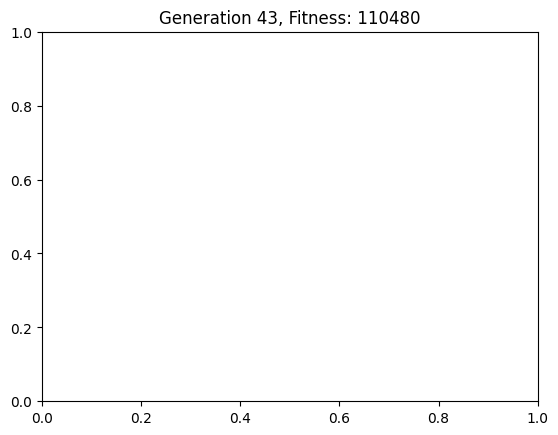

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (332, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 110480}


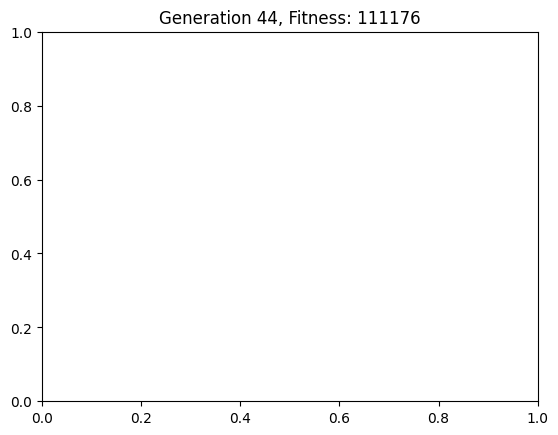

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (340, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 111176}


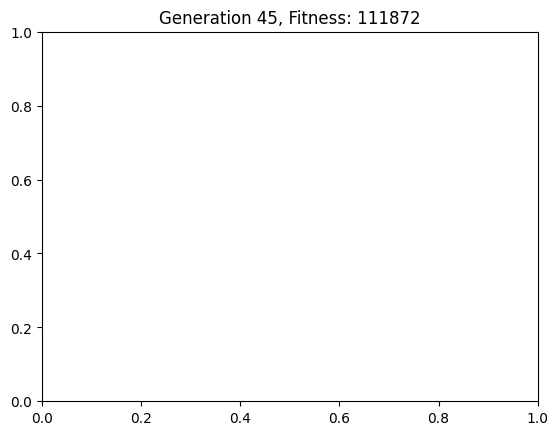

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (344, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 111872}


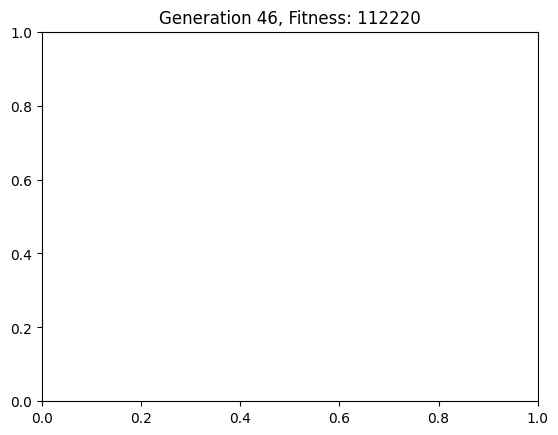

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (344, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 112220}


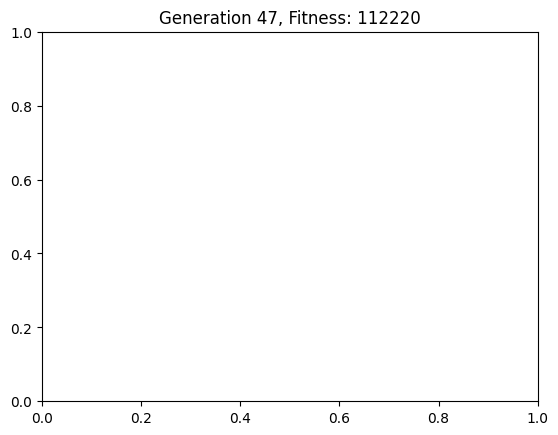

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (344, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 112220}


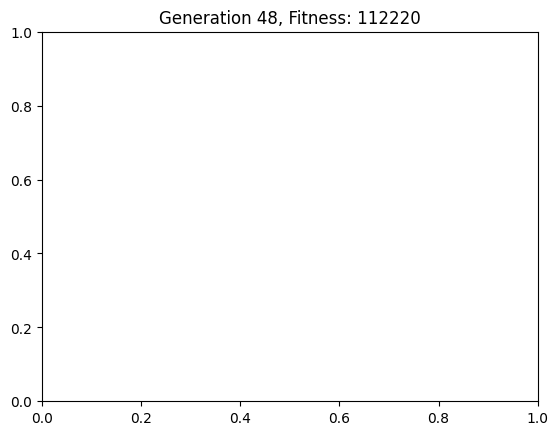

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (344, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 112220}


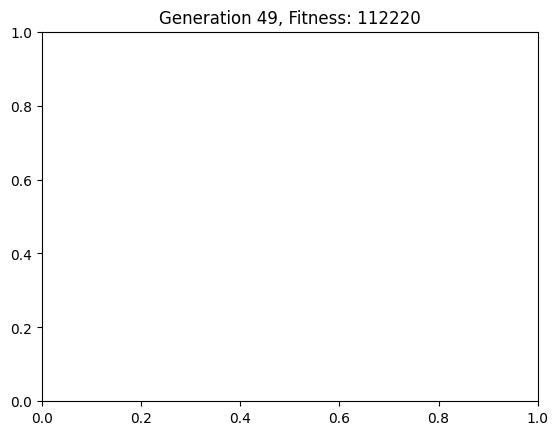

{'rooms': [{'name': 'Living Room', 'position': (338, 277), 'size': (220, 155)}, {'name': 'Bedroom1', 'position': (338, 432), 'size': (182, 159)}, {'name': 'Bedroom2', 'position': (598, 432), 'size': (344, 87)}, {'name': 'Passage', 'position': (520, 433), 'size': (78, 108)}, {'name': 'Kitchen', 'position': (558, 363), 'size': (110, 69)}, {'name': 'Washroom', 'position': (598, 519), 'size': (45, 72)}], 'fitness': 112220}
Elapsed time: 452.08 seconds


<Figure size 640x480 with 0 Axes>

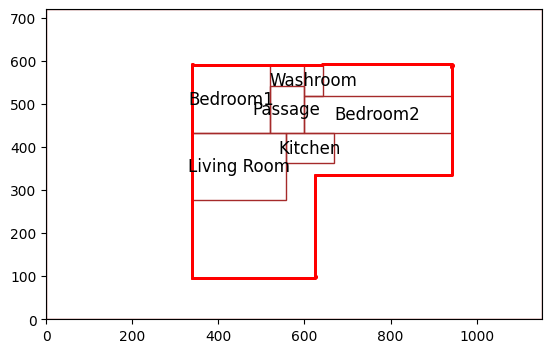

Elapsed time for initial population generation: 34.71 seconds


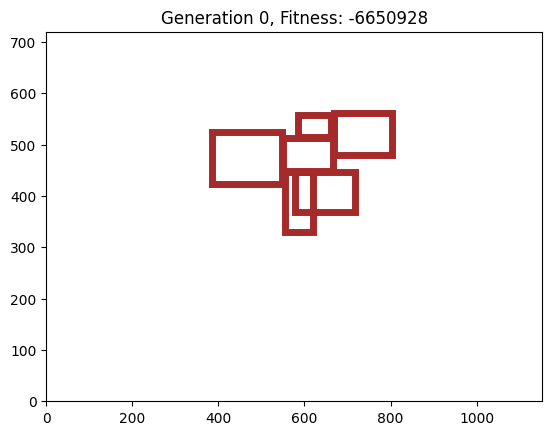

{'rooms': [{'name': 'Living Room', 'position': (386, 423), 'size': (163, 102)}, {'name': 'Passage', 'position': (550, 448), 'size': (117, 65)}, {'name': 'Kitchen', 'position': (556, 330), 'size': (65, 117)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (136, 81)}, {'name': 'Bedroom2', 'position': (578, 369), 'size': (140, 78)}], 'fitness': -6650928}


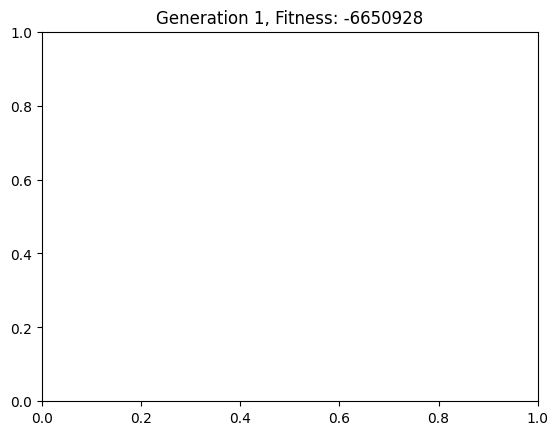

{'rooms': [{'name': 'Living Room', 'position': (385, 423), 'size': (164, 104)}, {'name': 'Passage', 'position': (549, 447), 'size': (118, 66)}, {'name': 'Kitchen', 'position': (556, 330), 'size': (65, 117)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (138, 83)}, {'name': 'Bedroom2', 'position': (578, 369), 'size': (140, 78)}], 'fitness': -6650928}


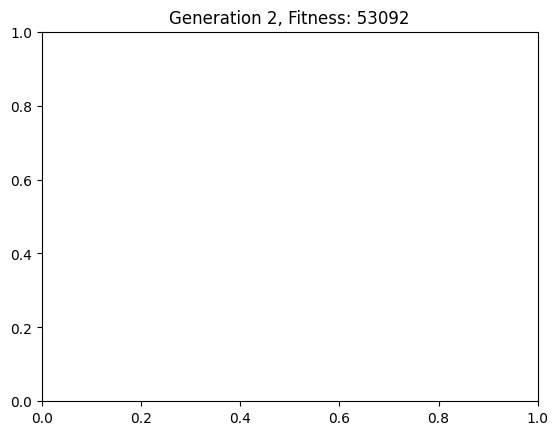

{'rooms': [{'name': 'Living Room', 'position': (385, 423), 'size': (164, 104)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (138, 83)}, {'name': 'Bedroom2', 'position': (578, 369), 'size': (140, 78)}, {'name': 'Passage', 'position': (549, 447), 'size': (118, 66)}, {'name': 'Kitchen', 'position': (556, 330), 'size': (22, 117)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 53092}


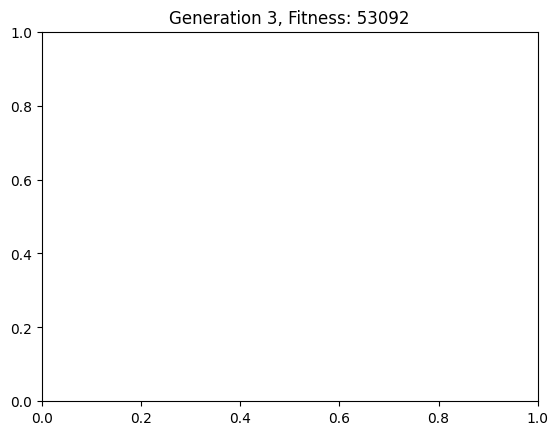

{'rooms': [{'name': 'Living Room', 'position': (384, 422), 'size': (164, 104)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (139, 84)}, {'name': 'Bedroom2', 'position': (578, 368), 'size': (141, 78)}, {'name': 'Passage', 'position': (549, 447), 'size': (119, 67)}, {'name': 'Kitchen', 'position': (555, 402), 'size': (23, 45)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 53092}


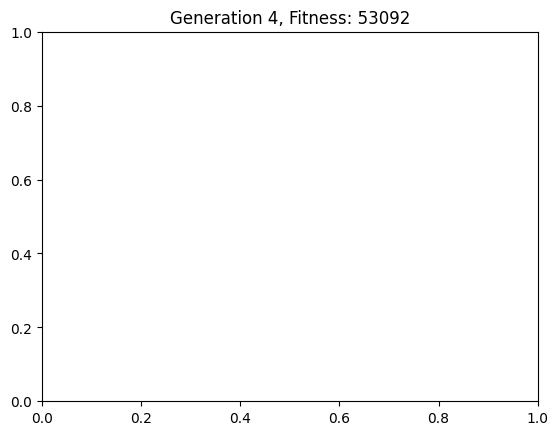

{'rooms': [{'name': 'Living Room', 'position': (383, 422), 'size': (165, 106)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (142, 87)}, {'name': 'Bedroom2', 'position': (578, 367), 'size': (144, 80)}, {'name': 'Passage', 'position': (548, 447), 'size': (119, 67)}, {'name': 'Kitchen', 'position': (552, 397), 'size': (26, 50)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 52038}


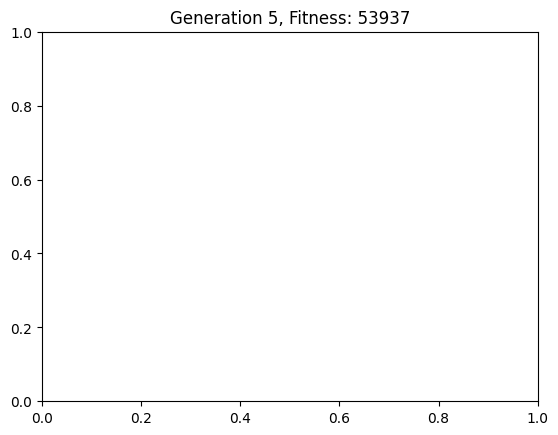

{'rooms': [{'name': 'Living Room', 'position': (383, 422), 'size': (165, 106)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (142, 87)}, {'name': 'Bedroom2', 'position': (578, 367), 'size': (144, 80)}, {'name': 'Passage', 'position': (548, 447), 'size': (119, 67)}, {'name': 'Kitchen', 'position': (552, 397), 'size': (26, 50)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 53937}


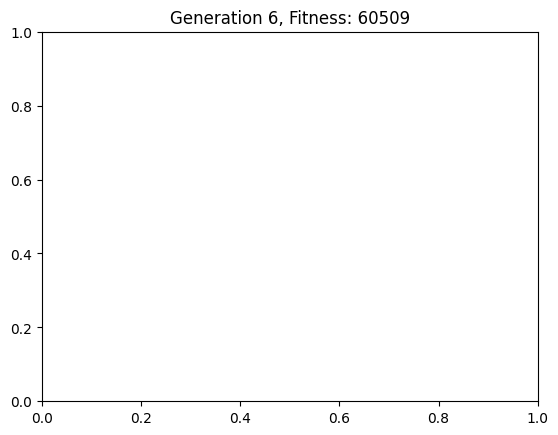

{'rooms': [{'name': 'Living Room', 'position': (374, 423), 'size': (170, 121)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (156, 101)}, {'name': 'Bedroom2', 'position': (578, 360), 'size': (158, 87)}, {'name': 'Passage', 'position': (544, 447), 'size': (124, 67)}, {'name': 'Kitchen', 'position': (543, 387), 'size': (35, 60)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 60509}


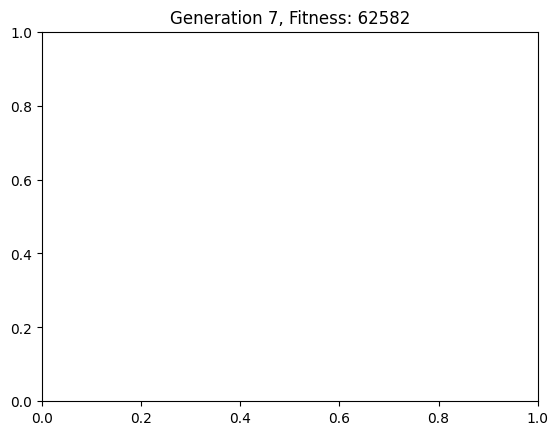

{'rooms': [{'name': 'Living Room', 'position': (372, 421), 'size': (167, 124)}, {'name': 'Bedroom1', 'position': (668, 480), 'size': (164, 109)}, {'name': 'Bedroom2', 'position': (578, 355), 'size': (166, 90)}, {'name': 'Passage', 'position': (540, 446), 'size': (128, 68)}, {'name': 'Kitchen', 'position': (539, 378), 'size': (39, 68)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 62582}


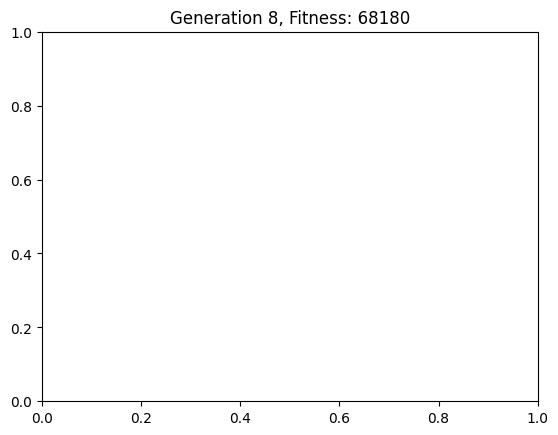

{'rooms': [{'name': 'Living Room', 'position': (368, 421), 'size': (167, 132)}, {'name': 'Bedroom1', 'position': (668, 477), 'size': (172, 114)}, {'name': 'Bedroom2', 'position': (578, 351), 'size': (174, 94)}, {'name': 'Passage', 'position': (536, 446), 'size': (132, 68)}, {'name': 'Kitchen', 'position': (535, 363), 'size': (43, 83)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 68180}


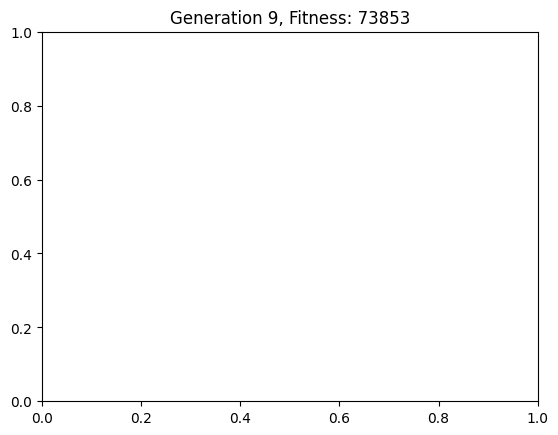

{'rooms': [{'name': 'Living Room', 'position': (364, 421), 'size': (167, 140)}, {'name': 'Bedroom1', 'position': (668, 473), 'size': (180, 118)}, {'name': 'Bedroom2', 'position': (578, 347), 'size': (182, 98)}, {'name': 'Passage', 'position': (532, 446), 'size': (136, 68)}, {'name': 'Kitchen', 'position': (531, 368), 'size': (47, 78)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 73853}


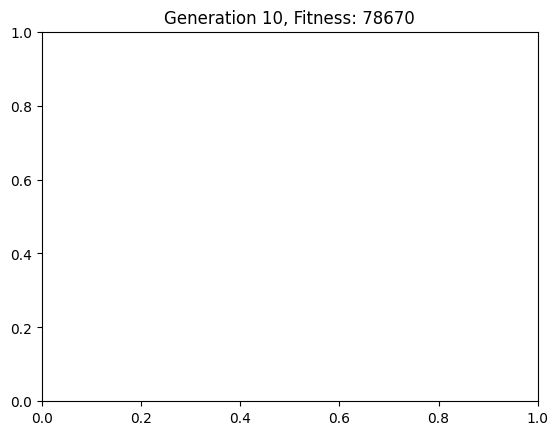

{'rooms': [{'name': 'Living Room', 'position': (360, 421), 'size': (167, 148)}, {'name': 'Bedroom1', 'position': (668, 469), 'size': (188, 122)}, {'name': 'Bedroom2', 'position': (578, 343), 'size': (190, 102)}, {'name': 'Passage', 'position': (528, 446), 'size': (140, 68)}, {'name': 'Kitchen', 'position': (527, 362), 'size': (51, 84)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 78670}


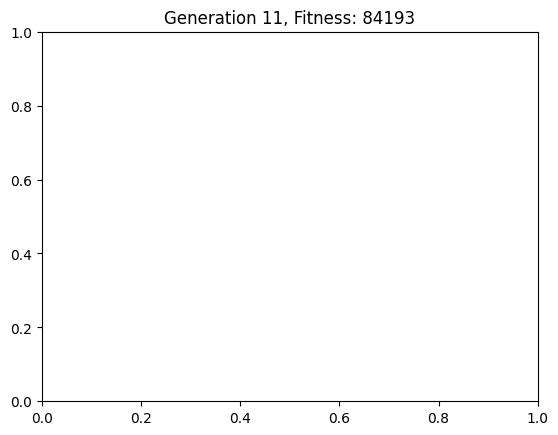

{'rooms': [{'name': 'Living Room', 'position': (356, 421), 'size': (167, 156)}, {'name': 'Bedroom1', 'position': (668, 465), 'size': (196, 126)}, {'name': 'Bedroom2', 'position': (578, 339), 'size': (198, 106)}, {'name': 'Passage', 'position': (524, 446), 'size': (144, 68)}, {'name': 'Kitchen', 'position': (523, 343), 'size': (55, 103)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 84193}


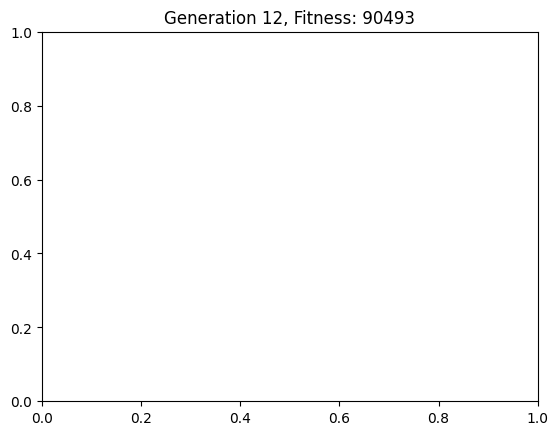

{'rooms': [{'name': 'Living Room', 'position': (352, 421), 'size': (167, 164)}, {'name': 'Bedroom1', 'position': (668, 461), 'size': (204, 130)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (206, 110)}, {'name': 'Passage', 'position': (520, 446), 'size': (148, 68)}, {'name': 'Kitchen', 'position': (519, 330), 'size': (59, 116)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 90493}


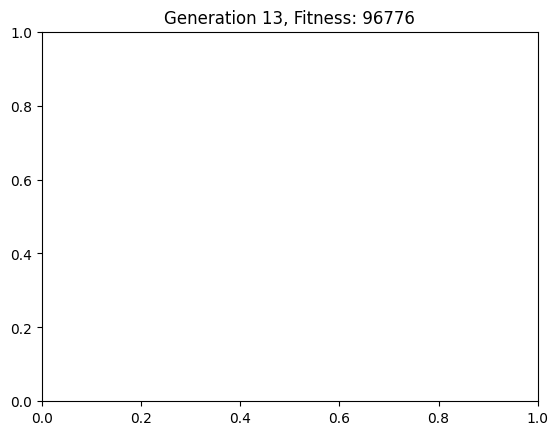

{'rooms': [{'name': 'Living Room', 'position': (348, 420), 'size': (167, 171)}, {'name': 'Bedroom1', 'position': (668, 457), 'size': (212, 134)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (214, 110)}, {'name': 'Passage', 'position': (516, 446), 'size': (152, 68)}, {'name': 'Kitchen', 'position': (515, 337), 'size': (63, 109)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 96776}


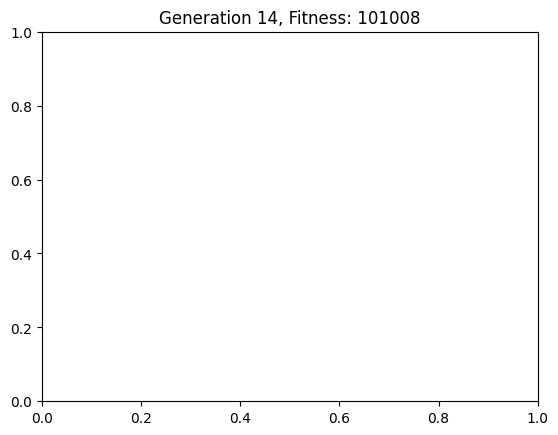

{'rooms': [{'name': 'Living Room', 'position': (344, 416), 'size': (167, 175)}, {'name': 'Bedroom1', 'position': (668, 453), 'size': (220, 138)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (222, 110)}, {'name': 'Passage', 'position': (512, 446), 'size': (156, 68)}, {'name': 'Kitchen', 'position': (511, 317), 'size': (67, 129)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 101008}


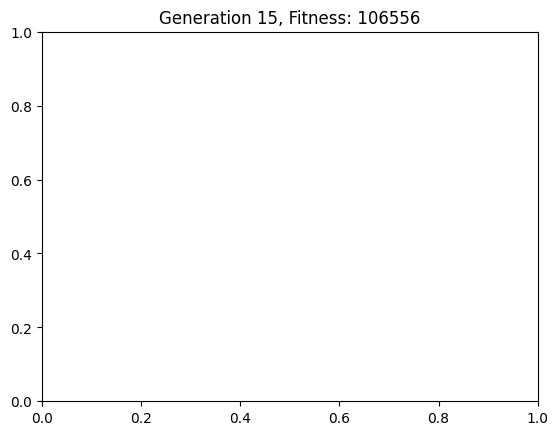

{'rooms': [{'name': 'Living Room', 'position': (340, 412), 'size': (167, 179)}, {'name': 'Bedroom1', 'position': (668, 449), 'size': (228, 142)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (230, 110)}, {'name': 'Passage', 'position': (508, 446), 'size': (160, 68)}, {'name': 'Kitchen', 'position': (507, 309), 'size': (71, 137)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 106556}


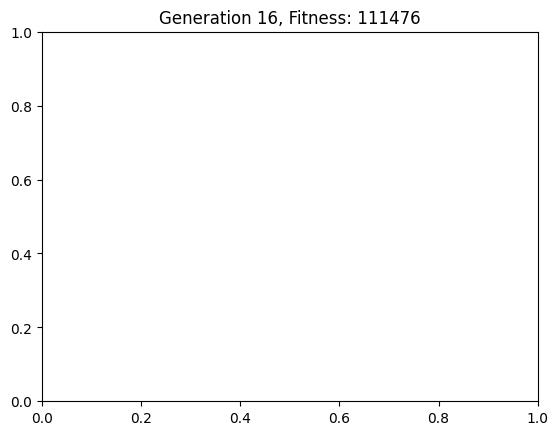

{'rooms': [{'name': 'Living Room', 'position': (338, 408), 'size': (167, 183)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (236, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (238, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 111476}


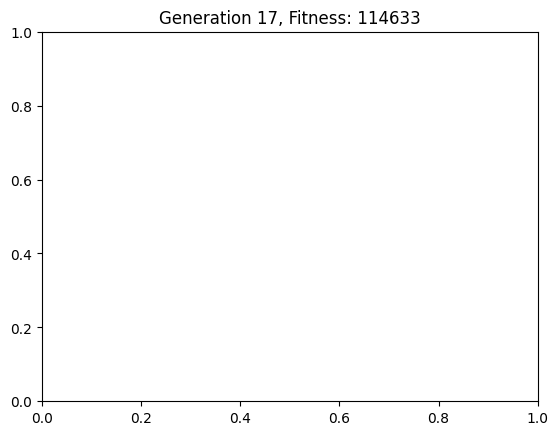

{'rooms': [{'name': 'Living Room', 'position': (338, 404), 'size': (167, 187)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (244, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (246, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 114633}


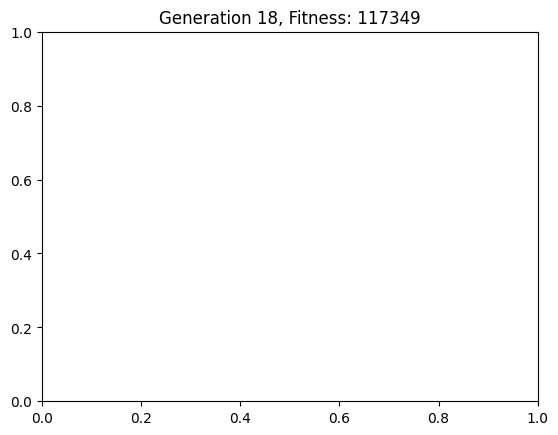

{'rooms': [{'name': 'Living Room', 'position': (338, 400), 'size': (167, 191)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (252, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (254, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 117349}


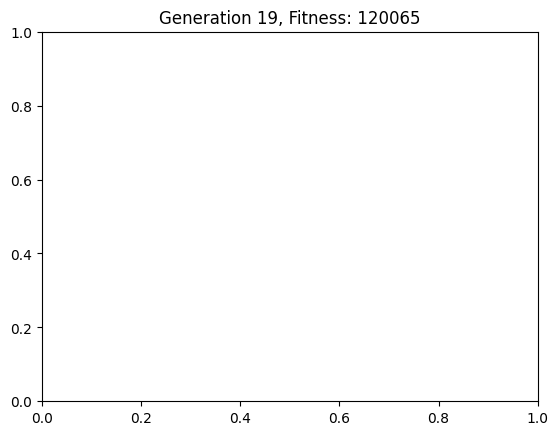

{'rooms': [{'name': 'Living Room', 'position': (338, 396), 'size': (167, 195)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (260, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (262, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 120065}


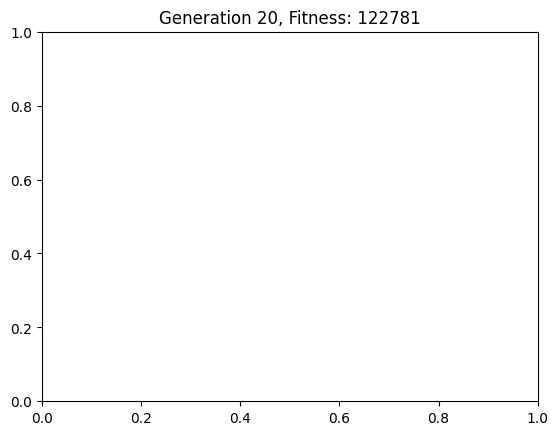

{'rooms': [{'name': 'Living Room', 'position': (338, 392), 'size': (167, 199)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (268, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (270, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 122781}


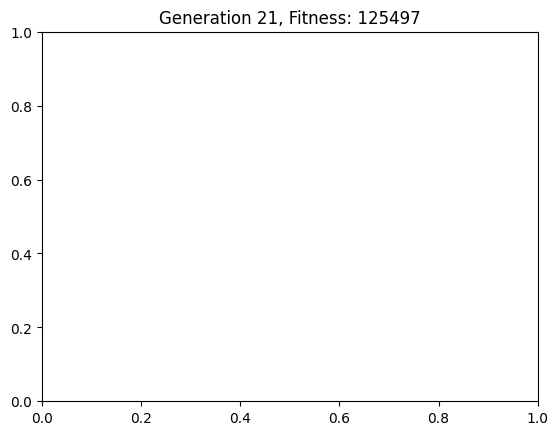

{'rooms': [{'name': 'Living Room', 'position': (338, 388), 'size': (167, 203)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (278, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 125497}


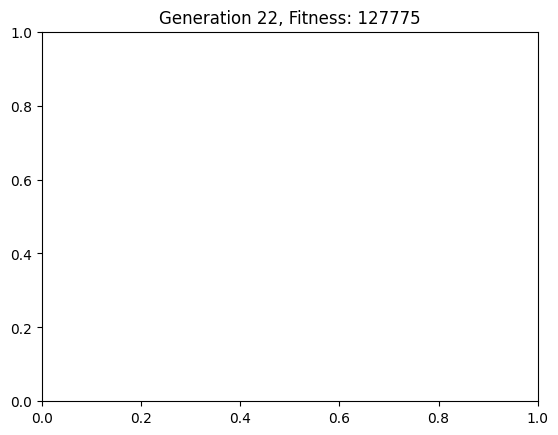

{'rooms': [{'name': 'Living Room', 'position': (338, 384), 'size': (167, 207)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (286, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 127775}


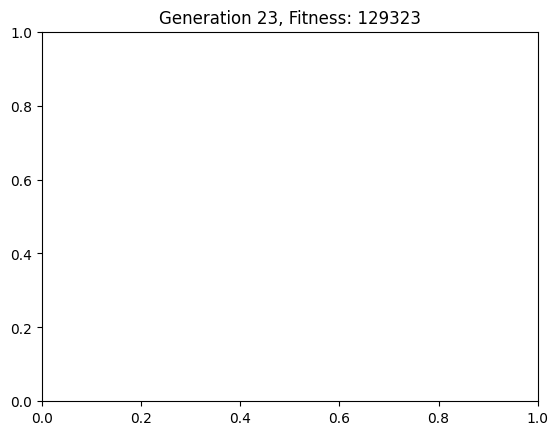

{'rooms': [{'name': 'Living Room', 'position': (338, 380), 'size': (167, 211)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (294, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 129323}


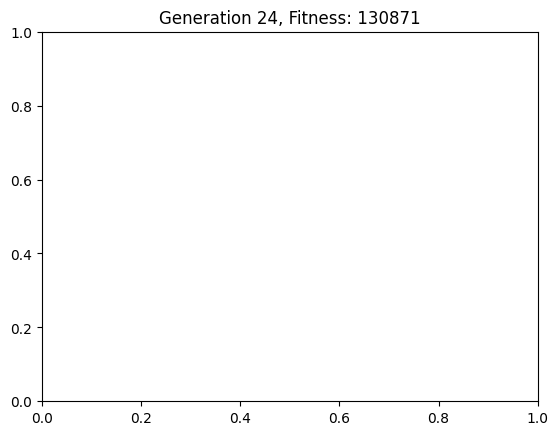

{'rooms': [{'name': 'Living Room', 'position': (338, 376), 'size': (167, 215)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (302, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 130871}


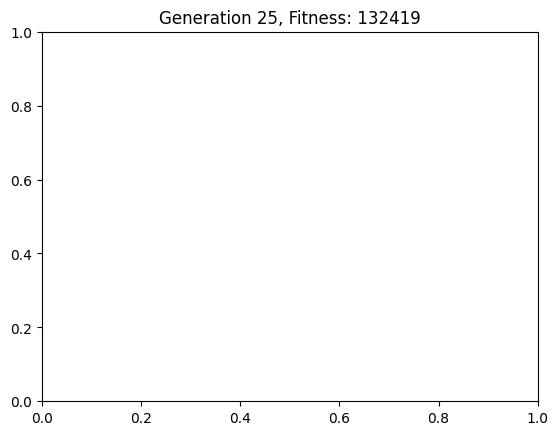

{'rooms': [{'name': 'Living Room', 'position': (338, 372), 'size': (167, 219)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (310, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 132419}


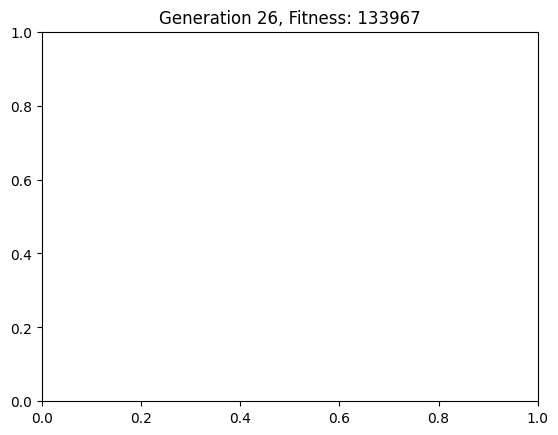

{'rooms': [{'name': 'Living Room', 'position': (338, 368), 'size': (167, 223)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (318, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 133967}


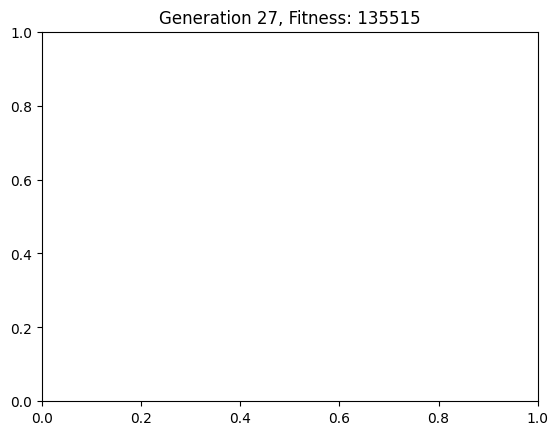

{'rooms': [{'name': 'Living Room', 'position': (338, 364), 'size': (167, 227)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (326, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 135515}


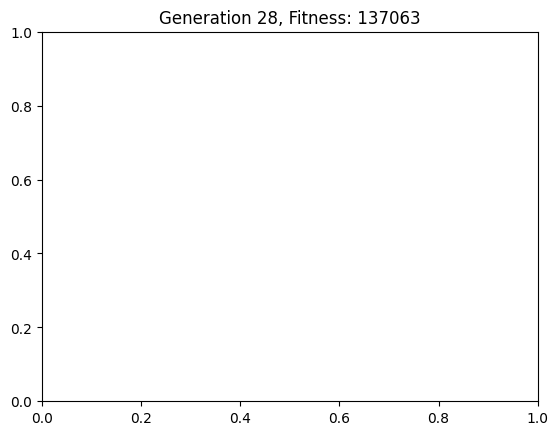

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (167, 231)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (334, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 137063}


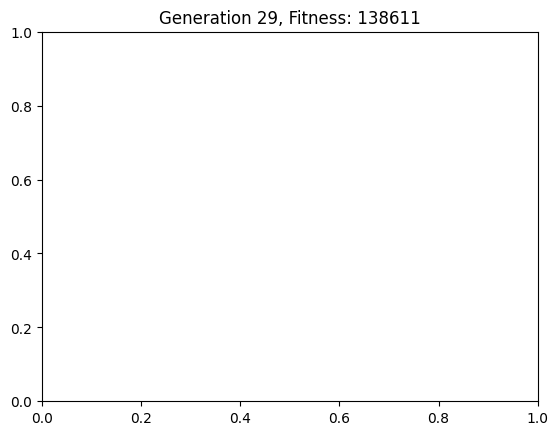

{'rooms': [{'name': 'Living Room', 'position': (338, 356), 'size': (167, 235)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (342, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 138611}


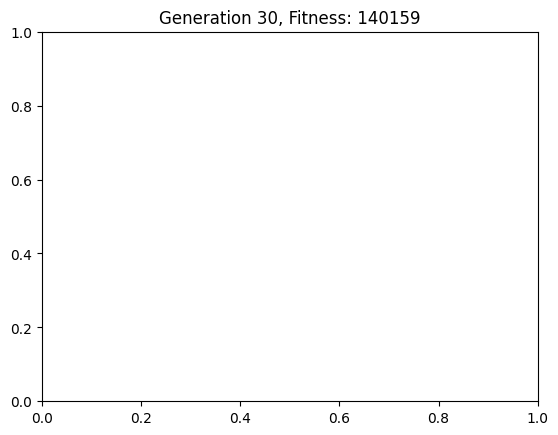

{'rooms': [{'name': 'Living Room', 'position': (338, 352), 'size': (167, 239)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (350, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 140159}


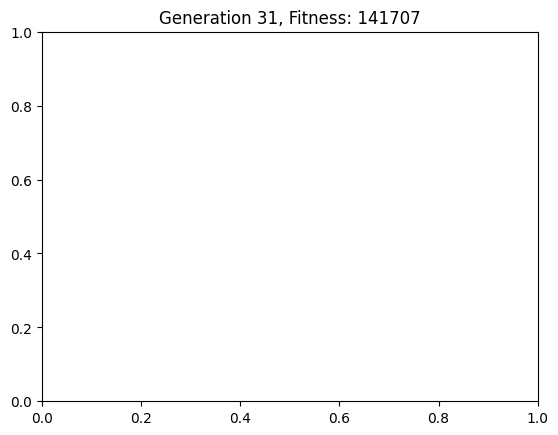

{'rooms': [{'name': 'Living Room', 'position': (338, 348), 'size': (167, 243)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (358, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 141707}


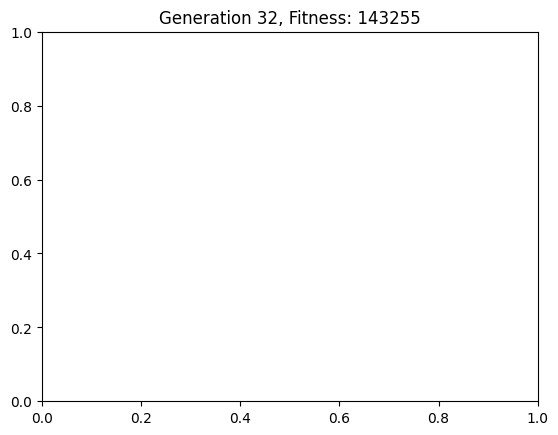

{'rooms': [{'name': 'Living Room', 'position': (338, 344), 'size': (167, 247)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 143255}


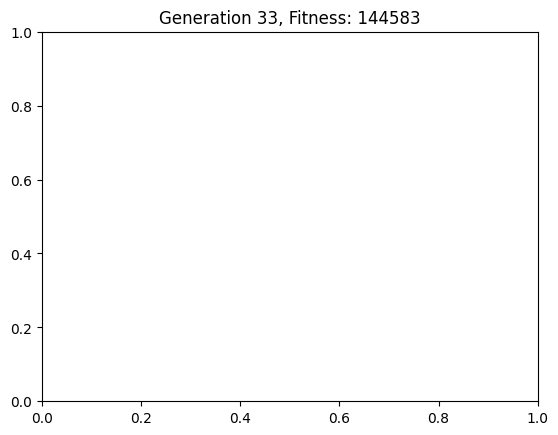

{'rooms': [{'name': 'Living Room', 'position': (338, 340), 'size': (167, 251)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 144583}


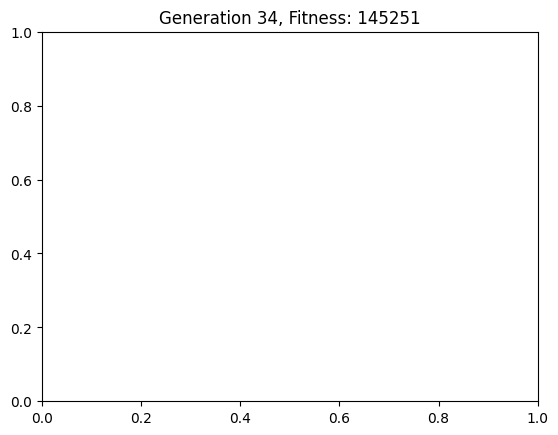

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (167, 255)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 145251}


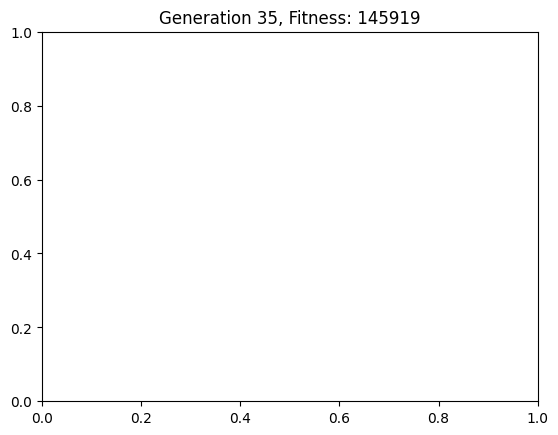

{'rooms': [{'name': 'Living Room', 'position': (338, 332), 'size': (167, 259)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 145919}


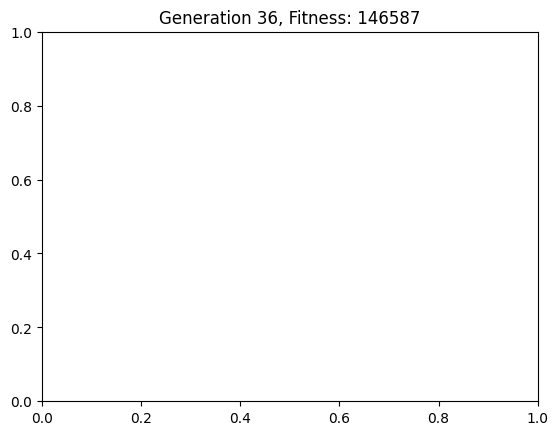

{'rooms': [{'name': 'Living Room', 'position': (338, 328), 'size': (167, 263)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 146587}


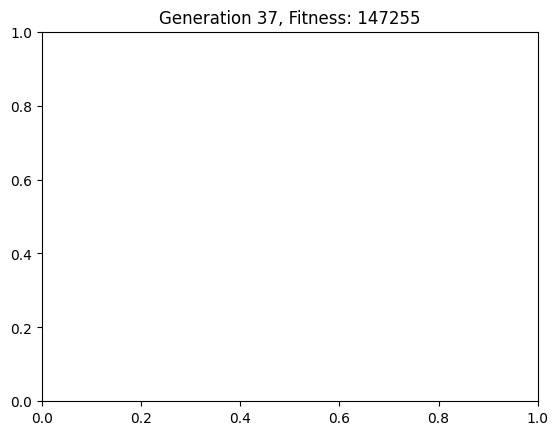

{'rooms': [{'name': 'Living Room', 'position': (338, 324), 'size': (167, 267)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 147255}


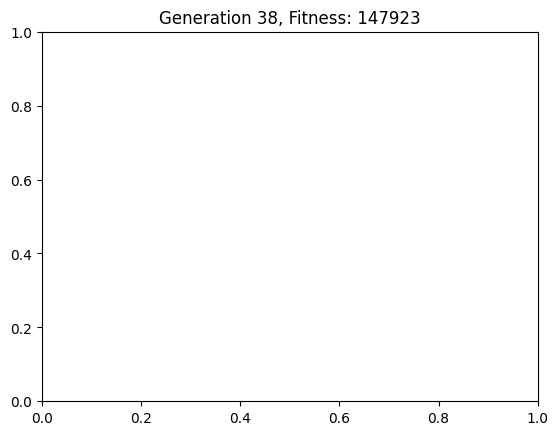

{'rooms': [{'name': 'Living Room', 'position': (338, 320), 'size': (167, 271)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 147923}


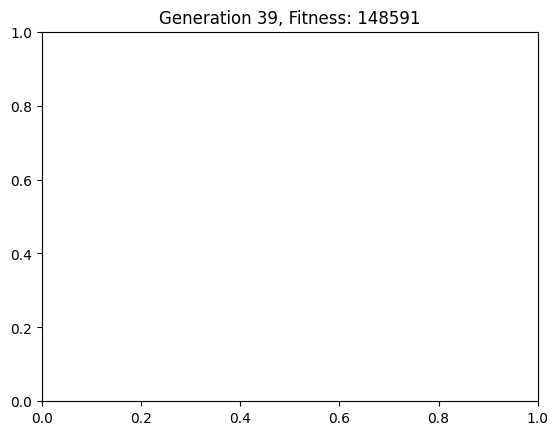

{'rooms': [{'name': 'Living Room', 'position': (338, 316), 'size': (167, 275)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 148591}


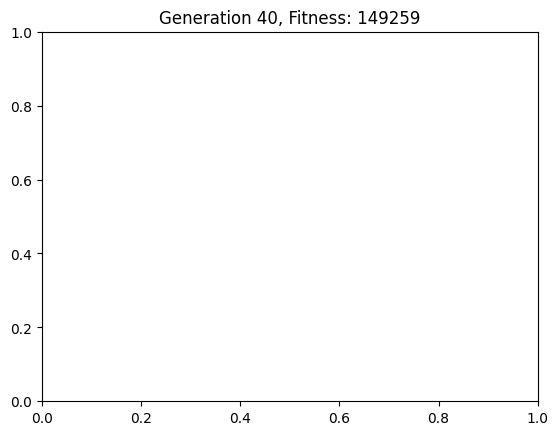

{'rooms': [{'name': 'Living Room', 'position': (338, 312), 'size': (167, 279)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 149259}


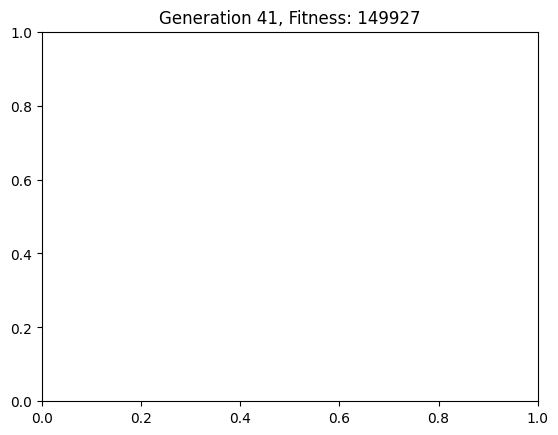

{'rooms': [{'name': 'Living Room', 'position': (338, 308), 'size': (167, 283)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 149927}


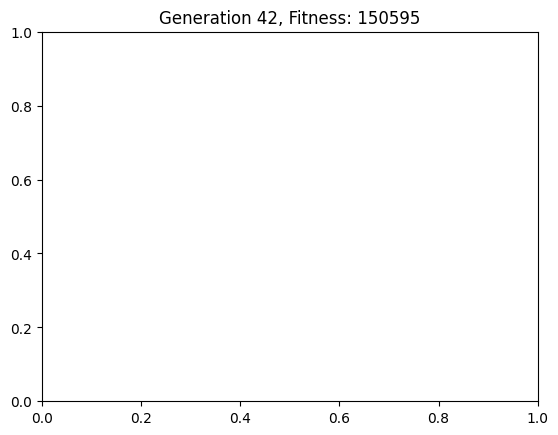

{'rooms': [{'name': 'Living Room', 'position': (338, 304), 'size': (167, 287)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 150595}


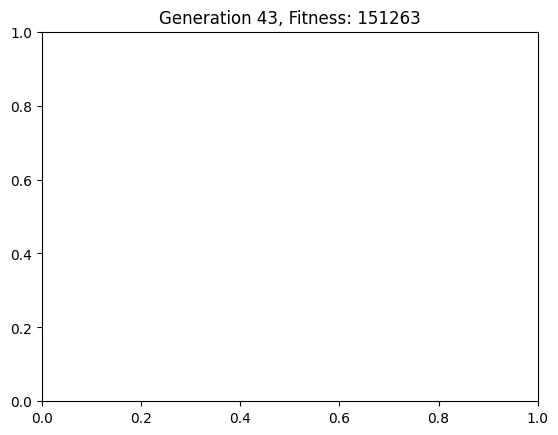

{'rooms': [{'name': 'Living Room', 'position': (338, 300), 'size': (167, 291)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 151263}


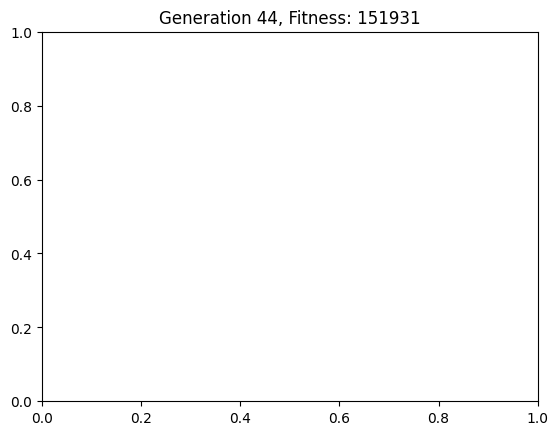

{'rooms': [{'name': 'Living Room', 'position': (338, 296), 'size': (167, 295)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 151931}


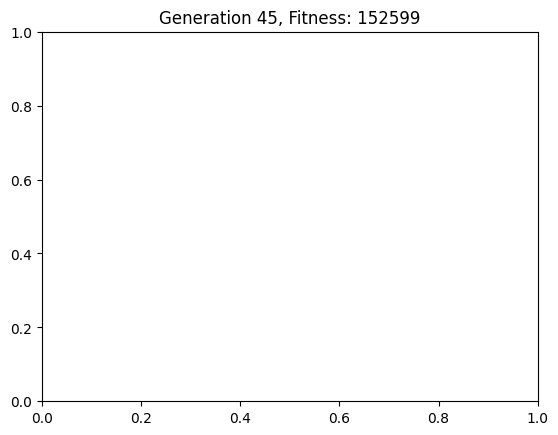

{'rooms': [{'name': 'Living Room', 'position': (338, 292), 'size': (167, 299)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 152599}


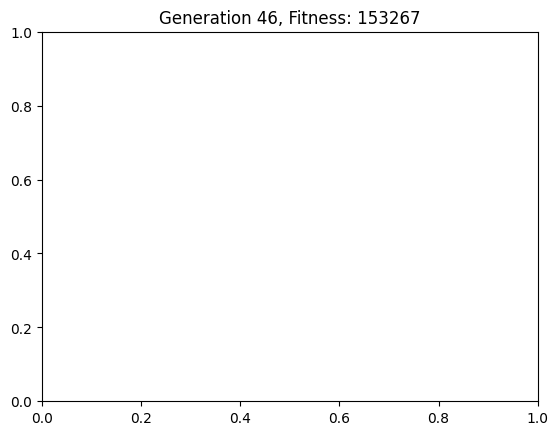

{'rooms': [{'name': 'Living Room', 'position': (338, 288), 'size': (167, 303)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 153267}


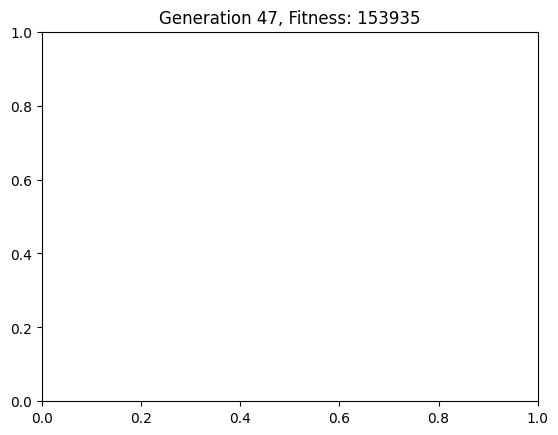

{'rooms': [{'name': 'Living Room', 'position': (338, 284), 'size': (167, 307)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 153935}


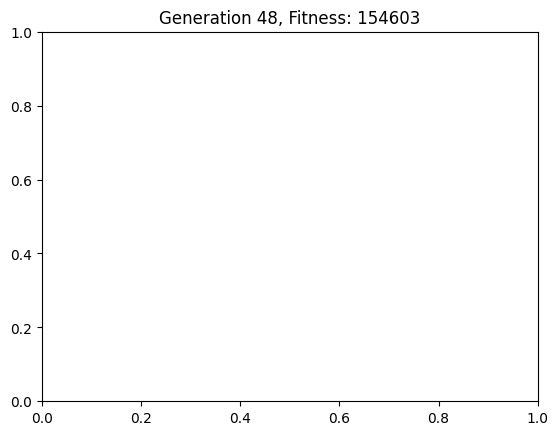

{'rooms': [{'name': 'Living Room', 'position': (338, 280), 'size': (167, 311)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 154603}


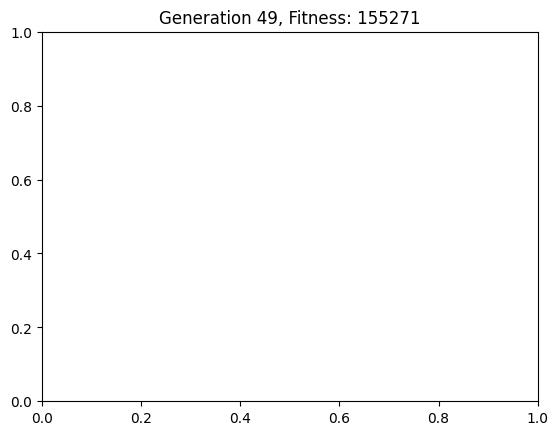

{'rooms': [{'name': 'Living Room', 'position': (338, 276), 'size': (167, 315)}, {'name': 'Bedroom1', 'position': (668, 446), 'size': (273, 146)}, {'name': 'Bedroom2', 'position': (578, 336), 'size': (364, 110)}, {'name': 'Passage', 'position': (505, 446), 'size': (163, 68)}, {'name': 'Kitchen', 'position': (505, 322), 'size': (73, 124)}, {'name': 'Washroom', 'position': (586, 514), 'size': (75, 44)}], 'fitness': 155271}
Elapsed time: 533.06 seconds


<Figure size 640x480 with 0 Axes>

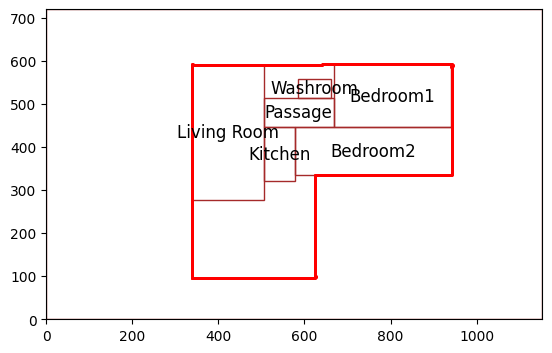

Elapsed time for initial population generation: 29.87 seconds


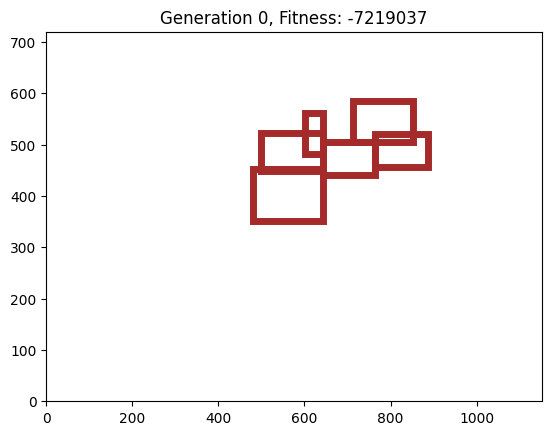

{'rooms': [{'name': 'Living Room', 'position': (480, 351), 'size': (163, 102)}, {'name': 'Passage', 'position': (644, 441), 'size': (120, 64)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 63)}, {'name': 'Washroom', 'position': (602, 482), 'size': (41, 79)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (140, 78)}, {'name': 'Bedroom2', 'position': (498, 448), 'size': (145, 75)}], 'fitness': -7219037}


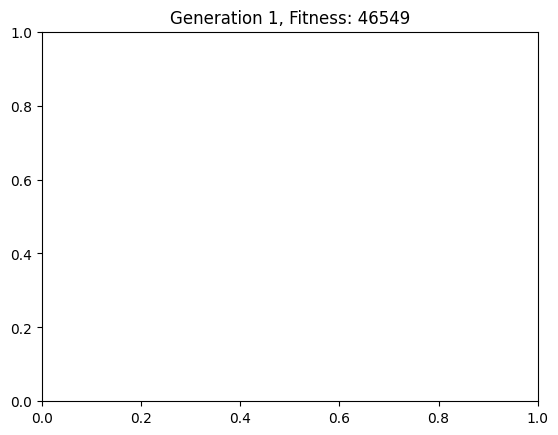

{'rooms': [{'name': 'Living Room', 'position': (480, 351), 'size': (163, 97)}, {'name': 'Passage', 'position': (644, 441), 'size': (120, 64)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (602, 482), 'size': (41, 79)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (140, 64)}, {'name': 'Bedroom2', 'position': (498, 448), 'size': (145, 34)}], 'fitness': 46549}


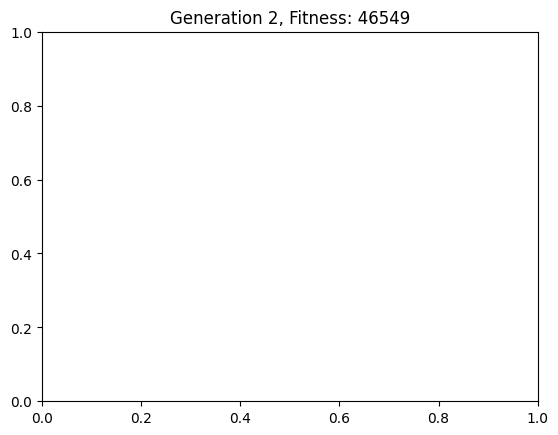

{'rooms': [{'name': 'Living Room', 'position': (480, 350), 'size': (164, 97)}, {'name': 'Passage', 'position': (644, 441), 'size': (120, 64)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (602, 482), 'size': (41, 79)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (141, 65)}, {'name': 'Bedroom2', 'position': (498, 447), 'size': (146, 34)}], 'fitness': 46549}


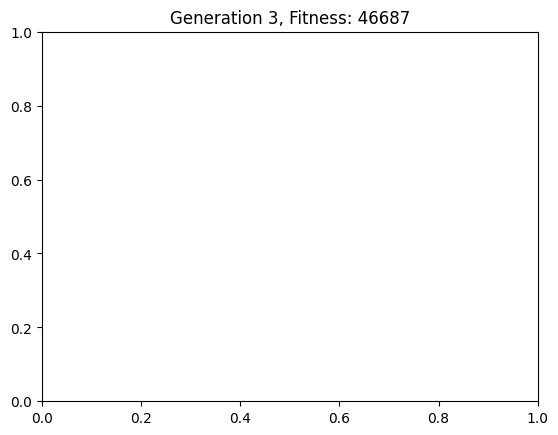

{'rooms': [{'name': 'Living Room', 'position': (478, 348), 'size': (165, 98)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (143, 67)}, {'name': 'Bedroom2', 'position': (496, 446), 'size': (147, 35)}, {'name': 'Passage', 'position': (644, 438), 'size': (121, 67)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (601, 482), 'size': (43, 69)}], 'fitness': 46687}


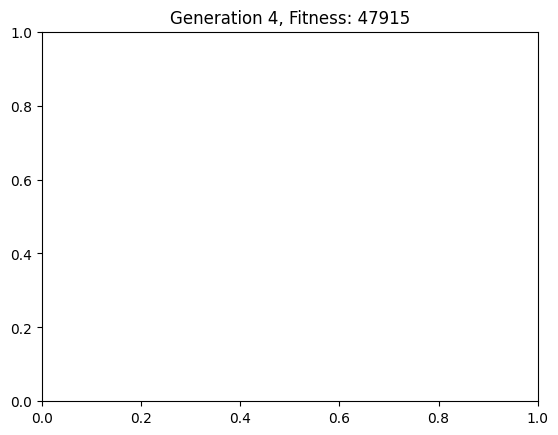

{'rooms': [{'name': 'Living Room', 'position': (475, 344), 'size': (169, 101)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (150, 74)}, {'name': 'Bedroom2', 'position': (493, 444), 'size': (150, 37)}, {'name': 'Passage', 'position': (644, 438), 'size': (121, 67)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (597, 482), 'size': (47, 82)}], 'fitness': 47915}


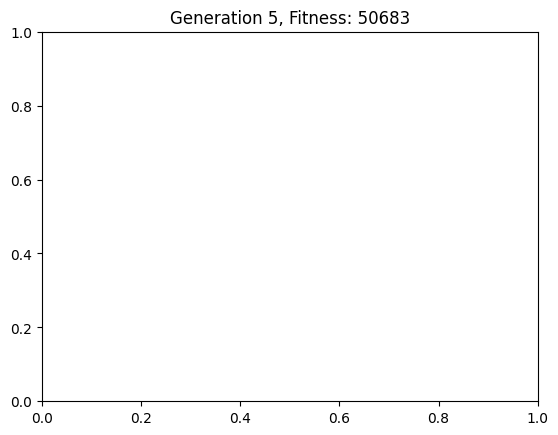

{'rooms': [{'name': 'Living Room', 'position': (471, 338), 'size': (172, 103)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (158, 82)}, {'name': 'Bedroom2', 'position': (489, 441), 'size': (154, 40)}, {'name': 'Passage', 'position': (644, 434), 'size': (121, 71)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (594, 482), 'size': (50, 86)}], 'fitness': 50683}


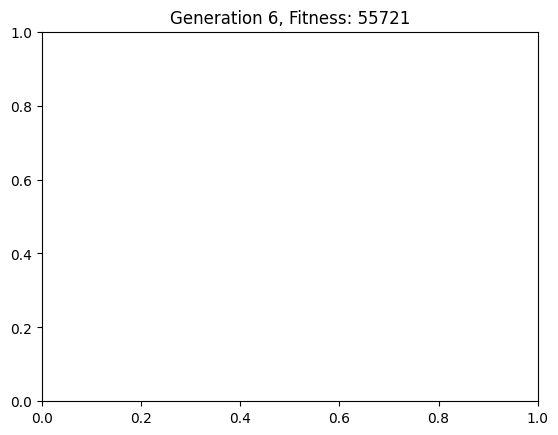

{'rooms': [{'name': 'Living Room', 'position': (467, 336), 'size': (176, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (166, 86)}, {'name': 'Bedroom2', 'position': (485, 440), 'size': (158, 42)}, {'name': 'Passage', 'position': (644, 436), 'size': (121, 69)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (593, 482), 'size': (51, 82)}], 'fitness': 55721}


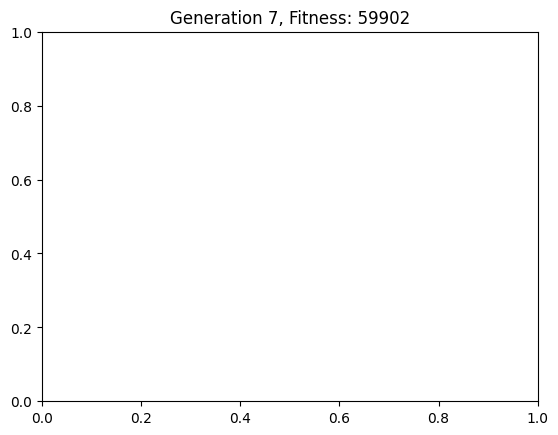

{'rooms': [{'name': 'Living Room', 'position': (463, 336), 'size': (180, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (174, 86)}, {'name': 'Bedroom2', 'position': (481, 440), 'size': (162, 42)}, {'name': 'Passage', 'position': (644, 426), 'size': (121, 79)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (580, 482), 'size': (64, 102)}], 'fitness': 59902}


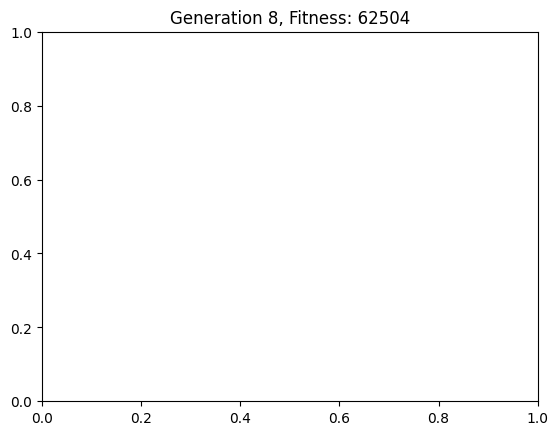

{'rooms': [{'name': 'Living Room', 'position': (459, 336), 'size': (184, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (182, 86)}, {'name': 'Bedroom2', 'position': (477, 440), 'size': (166, 42)}, {'name': 'Passage', 'position': (644, 422), 'size': (121, 83)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (579, 482), 'size': (65, 106)}], 'fitness': 62504}


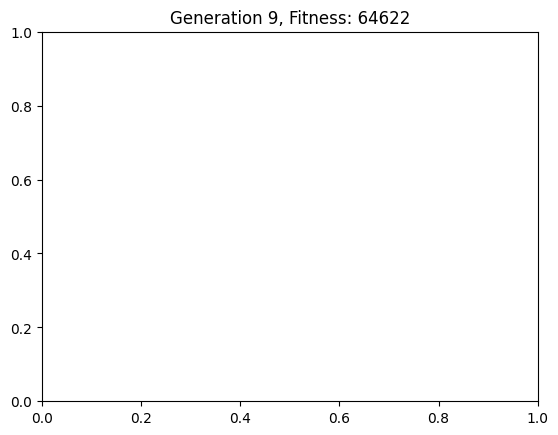

{'rooms': [{'name': 'Living Room', 'position': (455, 336), 'size': (188, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (190, 86)}, {'name': 'Bedroom2', 'position': (473, 440), 'size': (170, 42)}, {'name': 'Passage', 'position': (644, 418), 'size': (121, 87)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (577, 482), 'size': (67, 107)}], 'fitness': 64622}


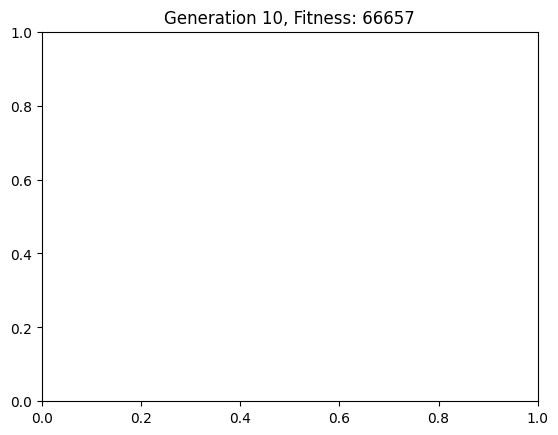

{'rooms': [{'name': 'Living Room', 'position': (451, 336), 'size': (192, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (198, 86)}, {'name': 'Bedroom2', 'position': (469, 440), 'size': (174, 42)}, {'name': 'Passage', 'position': (644, 414), 'size': (121, 91)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 66657}


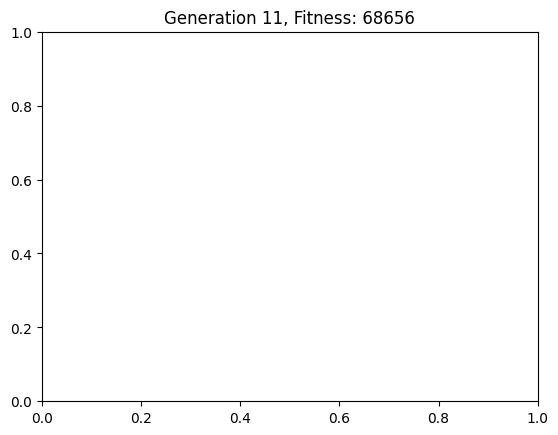

{'rooms': [{'name': 'Living Room', 'position': (447, 336), 'size': (196, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (206, 86)}, {'name': 'Bedroom2', 'position': (465, 440), 'size': (178, 42)}, {'name': 'Passage', 'position': (644, 410), 'size': (121, 95)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 68656}


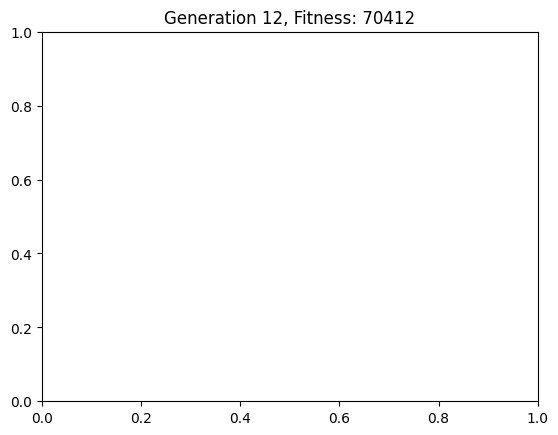

{'rooms': [{'name': 'Living Room', 'position': (443, 336), 'size': (200, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (214, 86)}, {'name': 'Bedroom2', 'position': (461, 440), 'size': (182, 42)}, {'name': 'Passage', 'position': (644, 406), 'size': (121, 99)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 70412}


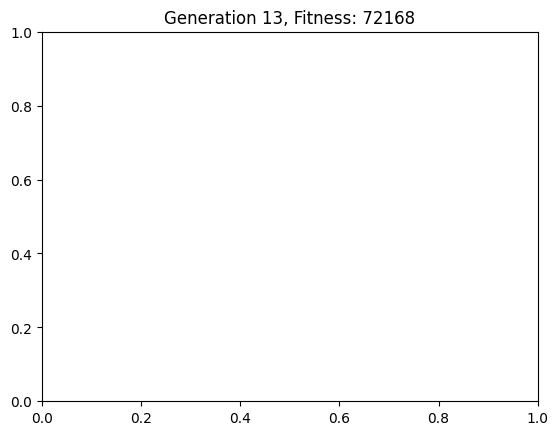

{'rooms': [{'name': 'Living Room', 'position': (439, 336), 'size': (204, 104)}, {'name': 'Bedroom1', 'position': (713, 506), 'size': (222, 86)}, {'name': 'Bedroom2', 'position': (457, 440), 'size': (186, 42)}, {'name': 'Passage', 'position': (644, 402), 'size': (121, 103)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 72168}


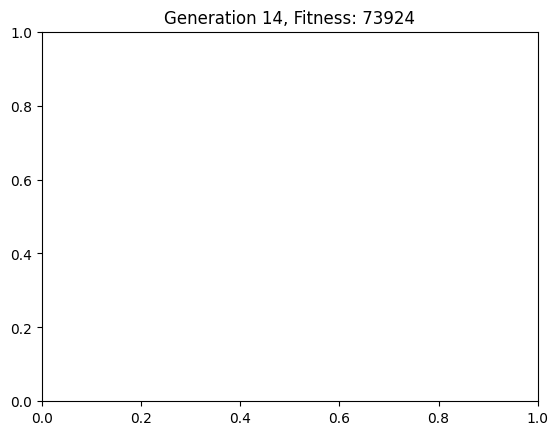

{'rooms': [{'name': 'Living Room', 'position': (435, 336), 'size': (208, 104)}, {'name': 'Bedroom1', 'position': (712, 506), 'size': (229, 86)}, {'name': 'Bedroom2', 'position': (453, 440), 'size': (190, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 107)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 73924}


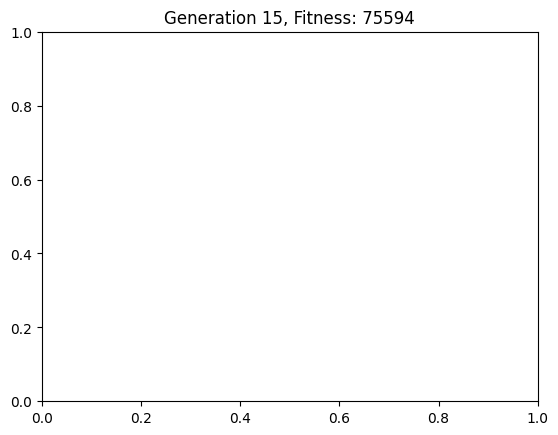

{'rooms': [{'name': 'Living Room', 'position': (431, 336), 'size': (212, 104)}, {'name': 'Bedroom1', 'position': (708, 506), 'size': (233, 86)}, {'name': 'Bedroom2', 'position': (449, 440), 'size': (194, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 75594}


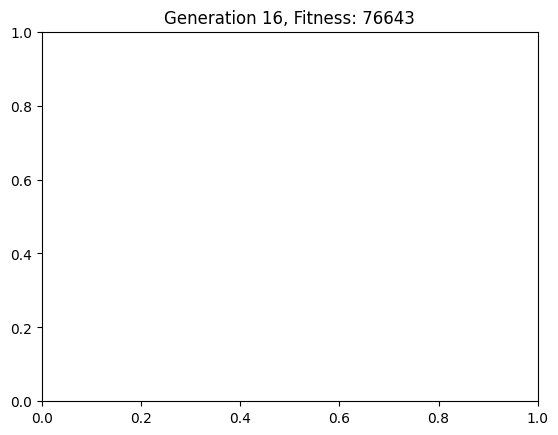

{'rooms': [{'name': 'Living Room', 'position': (427, 336), 'size': (216, 104)}, {'name': 'Bedroom1', 'position': (704, 506), 'size': (237, 86)}, {'name': 'Bedroom2', 'position': (445, 440), 'size': (198, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 76643}


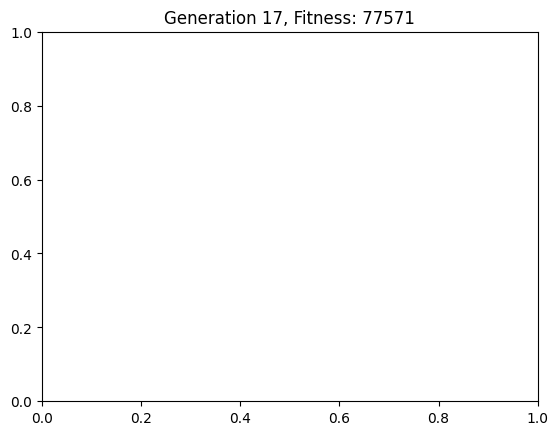

{'rooms': [{'name': 'Living Room', 'position': (423, 336), 'size': (220, 104)}, {'name': 'Bedroom1', 'position': (700, 506), 'size': (241, 86)}, {'name': 'Bedroom2', 'position': (441, 440), 'size': (202, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 77571}


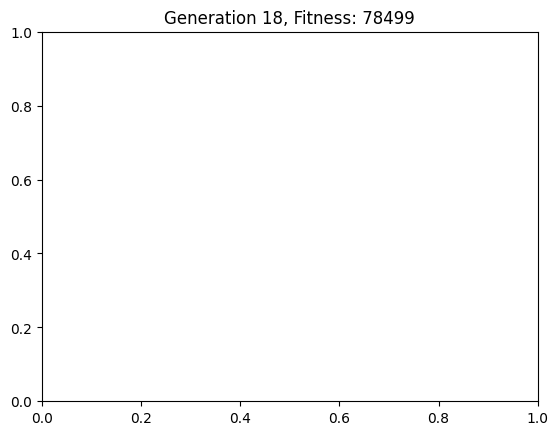

{'rooms': [{'name': 'Living Room', 'position': (419, 336), 'size': (224, 104)}, {'name': 'Bedroom1', 'position': (696, 506), 'size': (245, 86)}, {'name': 'Bedroom2', 'position': (437, 440), 'size': (206, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 78499}


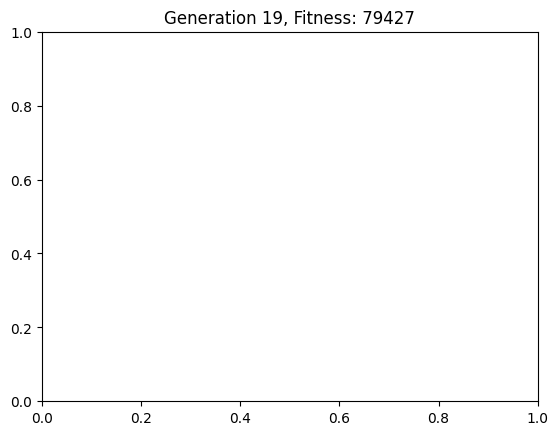

{'rooms': [{'name': 'Living Room', 'position': (415, 336), 'size': (228, 104)}, {'name': 'Bedroom1', 'position': (692, 506), 'size': (249, 86)}, {'name': 'Bedroom2', 'position': (433, 440), 'size': (210, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 79427}


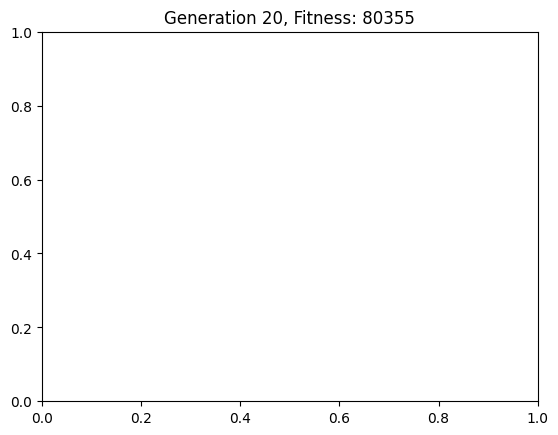

{'rooms': [{'name': 'Living Room', 'position': (411, 336), 'size': (232, 104)}, {'name': 'Bedroom1', 'position': (688, 506), 'size': (253, 86)}, {'name': 'Bedroom2', 'position': (429, 440), 'size': (214, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 80355}


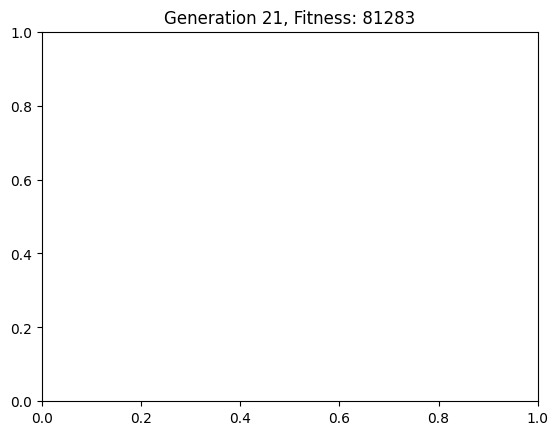

{'rooms': [{'name': 'Living Room', 'position': (407, 336), 'size': (236, 104)}, {'name': 'Bedroom1', 'position': (684, 506), 'size': (257, 86)}, {'name': 'Bedroom2', 'position': (425, 440), 'size': (218, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 81283}


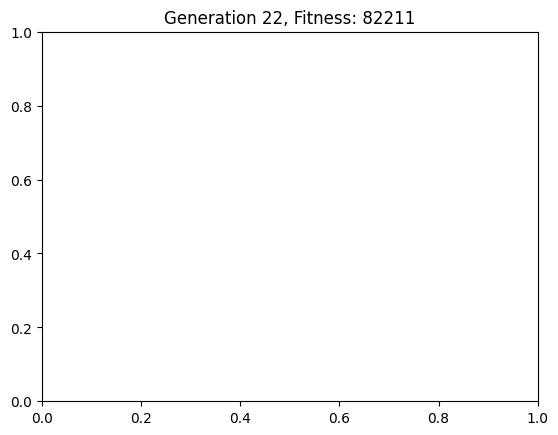

{'rooms': [{'name': 'Living Room', 'position': (403, 336), 'size': (240, 104)}, {'name': 'Bedroom1', 'position': (680, 506), 'size': (261, 86)}, {'name': 'Bedroom2', 'position': (421, 440), 'size': (222, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 82211}


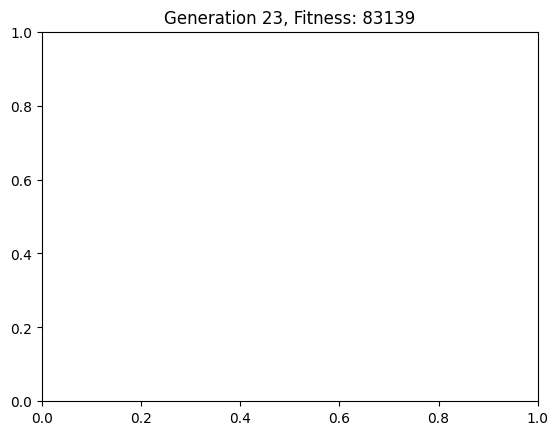

{'rooms': [{'name': 'Living Room', 'position': (399, 336), 'size': (244, 104)}, {'name': 'Bedroom1', 'position': (676, 506), 'size': (265, 86)}, {'name': 'Bedroom2', 'position': (417, 440), 'size': (226, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 83139}


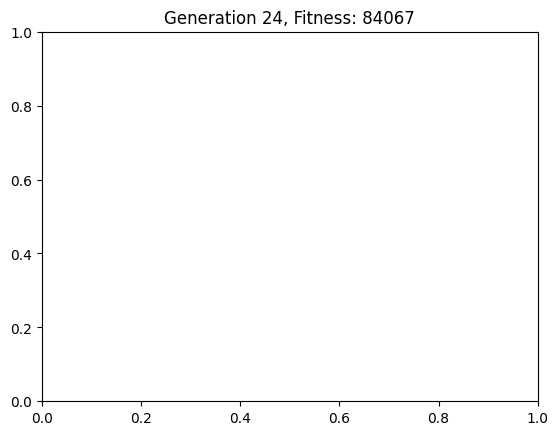

{'rooms': [{'name': 'Living Room', 'position': (395, 336), 'size': (248, 104)}, {'name': 'Bedroom1', 'position': (672, 506), 'size': (269, 86)}, {'name': 'Bedroom2', 'position': (413, 440), 'size': (230, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 84067}


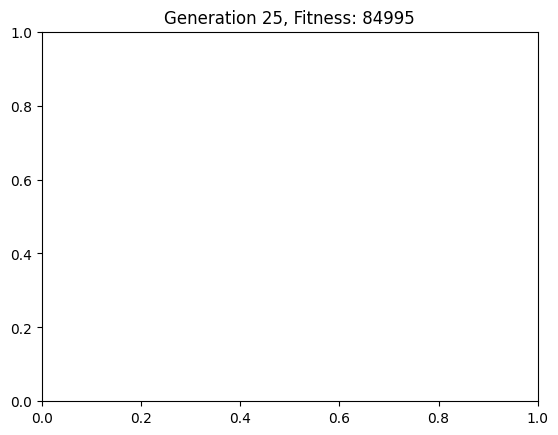

{'rooms': [{'name': 'Living Room', 'position': (391, 336), 'size': (252, 104)}, {'name': 'Bedroom1', 'position': (668, 506), 'size': (273, 86)}, {'name': 'Bedroom2', 'position': (409, 440), 'size': (234, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 84995}


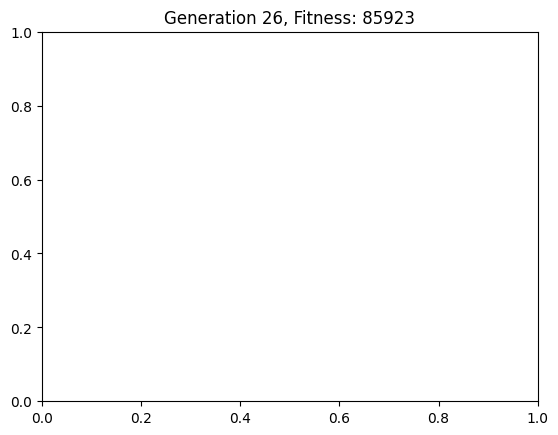

{'rooms': [{'name': 'Living Room', 'position': (387, 336), 'size': (256, 104)}, {'name': 'Bedroom1', 'position': (664, 506), 'size': (277, 86)}, {'name': 'Bedroom2', 'position': (405, 440), 'size': (238, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 85923}


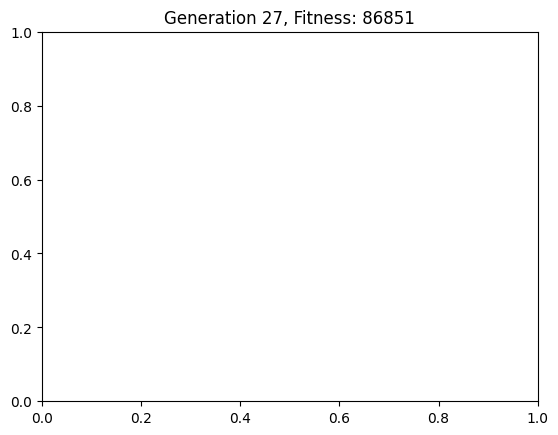

{'rooms': [{'name': 'Living Room', 'position': (383, 336), 'size': (260, 104)}, {'name': 'Bedroom1', 'position': (660, 506), 'size': (281, 86)}, {'name': 'Bedroom2', 'position': (401, 440), 'size': (242, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 86851}


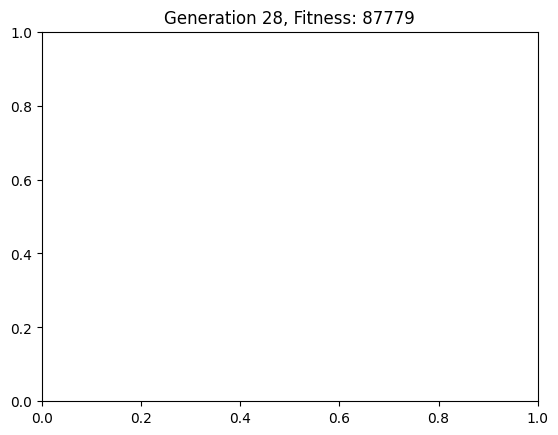

{'rooms': [{'name': 'Living Room', 'position': (379, 336), 'size': (264, 104)}, {'name': 'Bedroom1', 'position': (656, 506), 'size': (285, 86)}, {'name': 'Bedroom2', 'position': (397, 440), 'size': (246, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 87779}


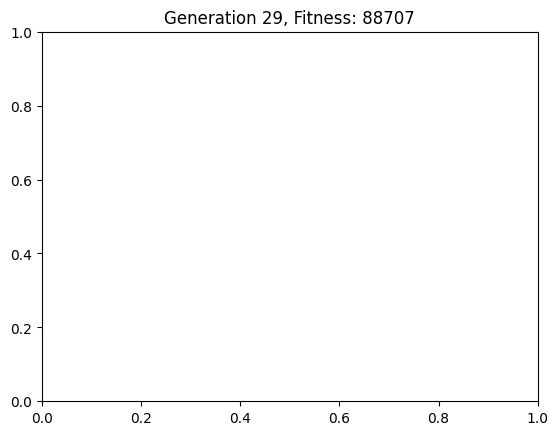

{'rooms': [{'name': 'Living Room', 'position': (375, 336), 'size': (268, 104)}, {'name': 'Bedroom1', 'position': (652, 506), 'size': (289, 86)}, {'name': 'Bedroom2', 'position': (393, 440), 'size': (250, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 88707}


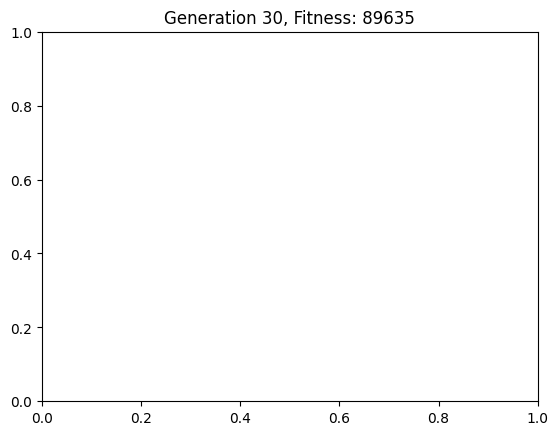

{'rooms': [{'name': 'Living Room', 'position': (371, 336), 'size': (272, 104)}, {'name': 'Bedroom1', 'position': (648, 506), 'size': (293, 86)}, {'name': 'Bedroom2', 'position': (389, 440), 'size': (254, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 89635}


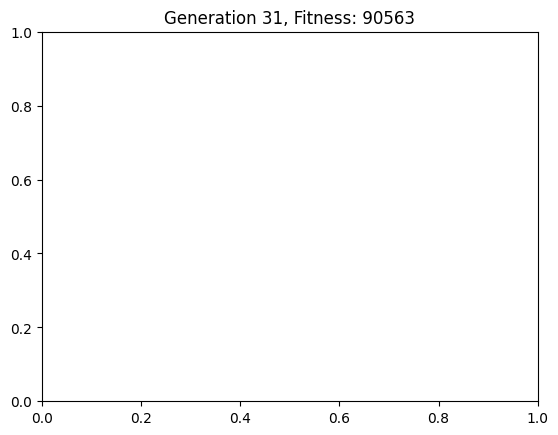

{'rooms': [{'name': 'Living Room', 'position': (367, 336), 'size': (276, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (385, 440), 'size': (258, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 90563}


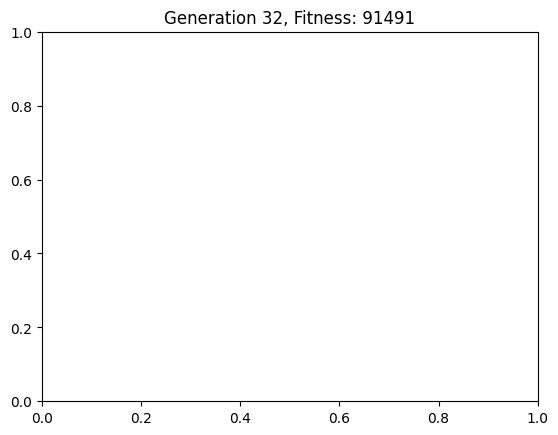

{'rooms': [{'name': 'Living Room', 'position': (363, 336), 'size': (280, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (381, 440), 'size': (262, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 91491}


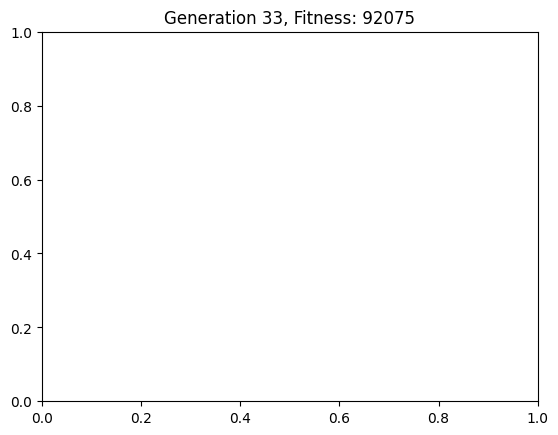

{'rooms': [{'name': 'Living Room', 'position': (359, 336), 'size': (284, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (377, 440), 'size': (266, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 92075}


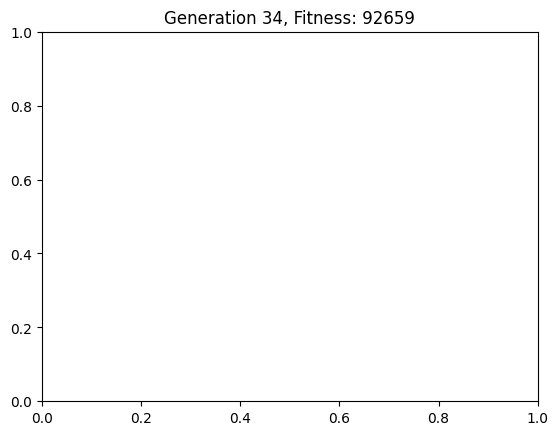

{'rooms': [{'name': 'Living Room', 'position': (355, 336), 'size': (288, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (373, 440), 'size': (270, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 92659}


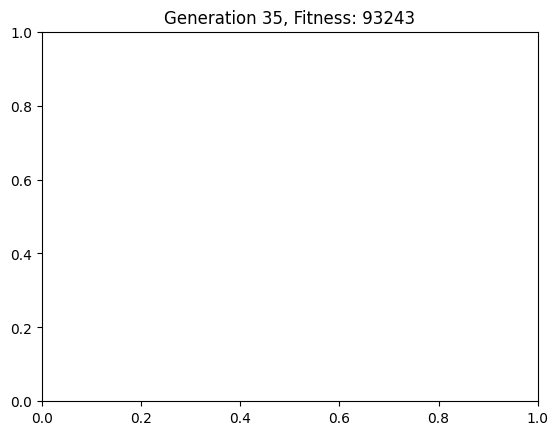

{'rooms': [{'name': 'Living Room', 'position': (351, 336), 'size': (292, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (369, 440), 'size': (274, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 93243}


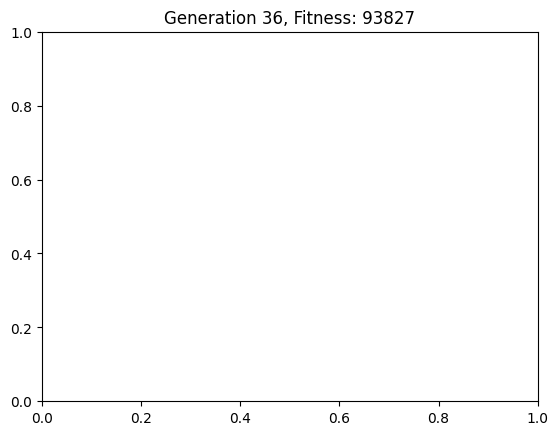

{'rooms': [{'name': 'Living Room', 'position': (347, 336), 'size': (296, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (365, 440), 'size': (278, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 93827}


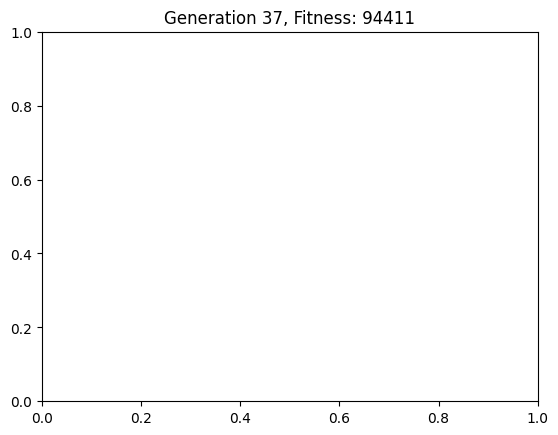

{'rooms': [{'name': 'Living Room', 'position': (343, 336), 'size': (300, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (361, 440), 'size': (282, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 94411}


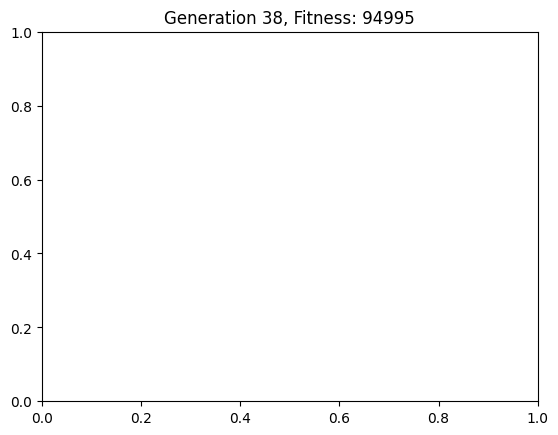

{'rooms': [{'name': 'Living Room', 'position': (339, 336), 'size': (304, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (357, 440), 'size': (286, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 94995}


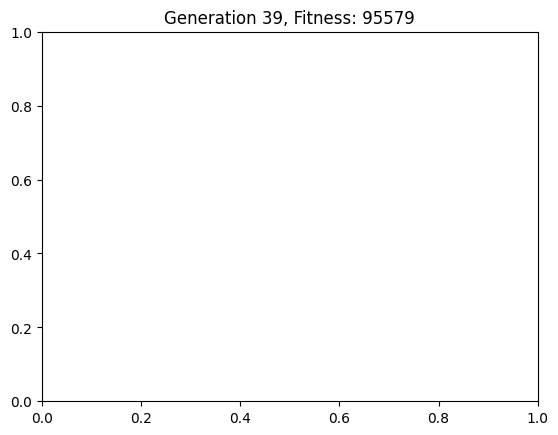

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (353, 440), 'size': (290, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 95579}


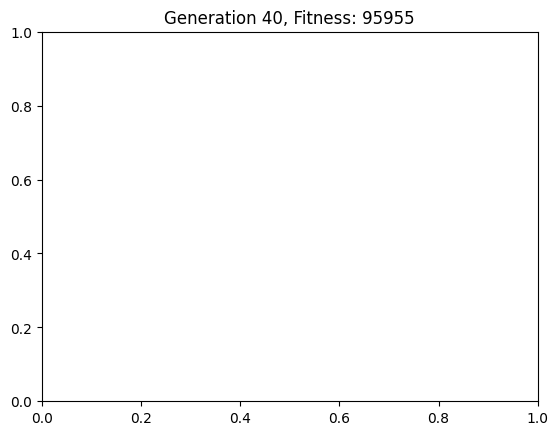

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (349, 440), 'size': (294, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 95955}


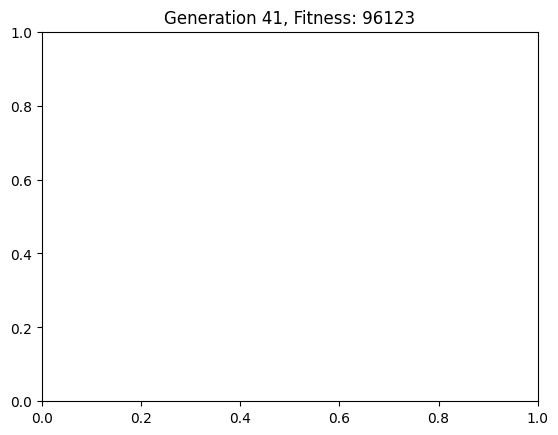

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (345, 440), 'size': (298, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96123}


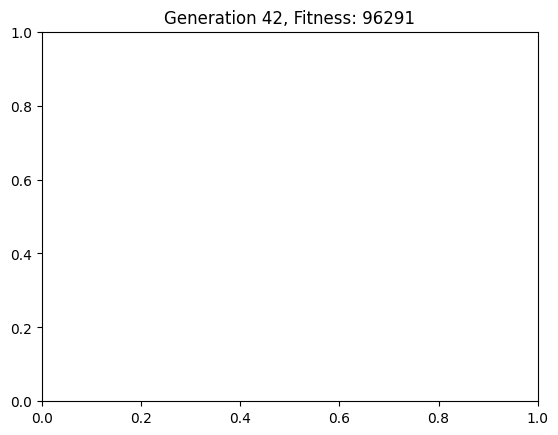

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (341, 440), 'size': (302, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96291}


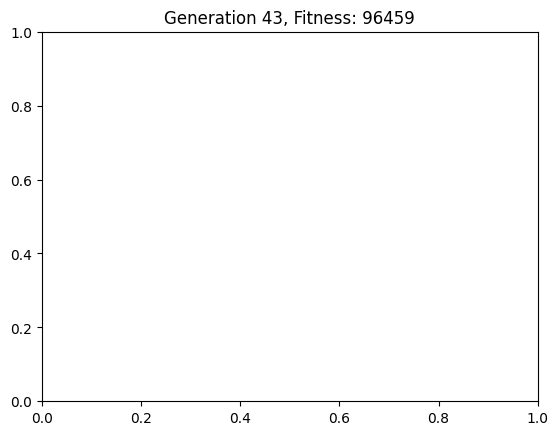

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96459}


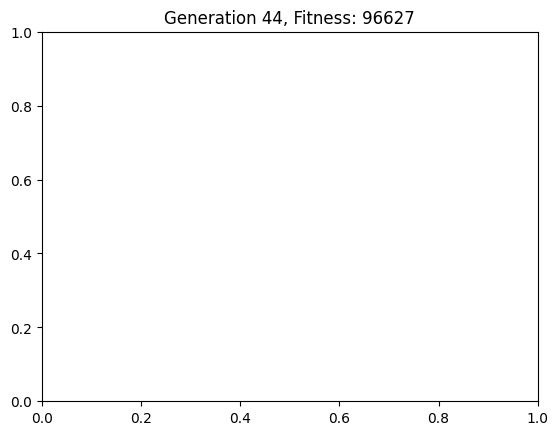

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96627}


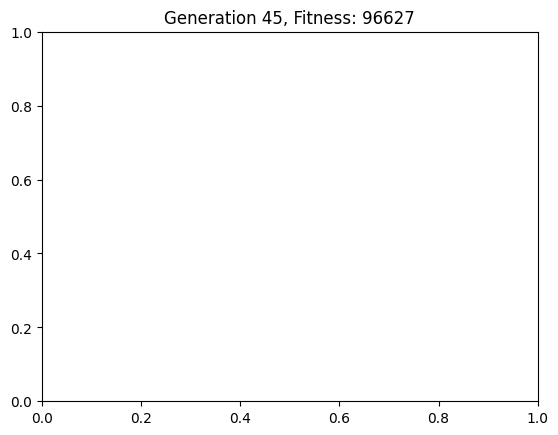

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96627}


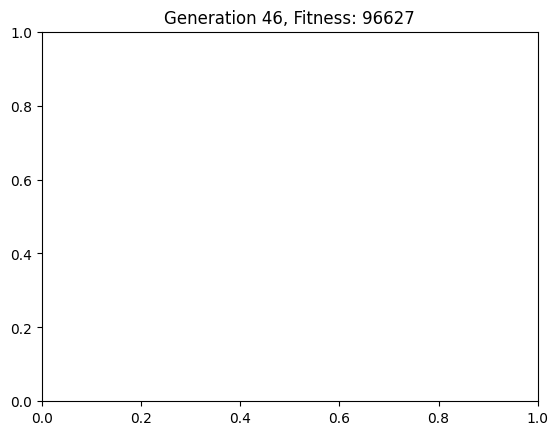

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96627}


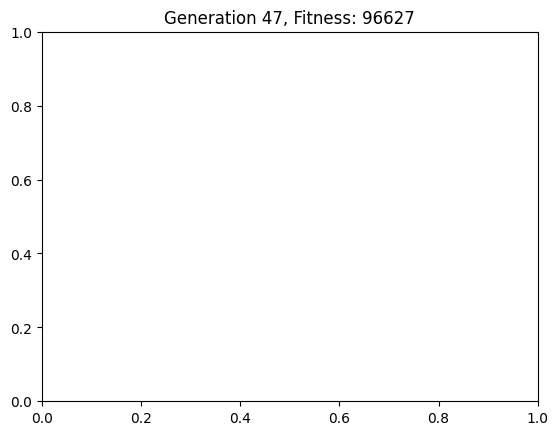

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96627}


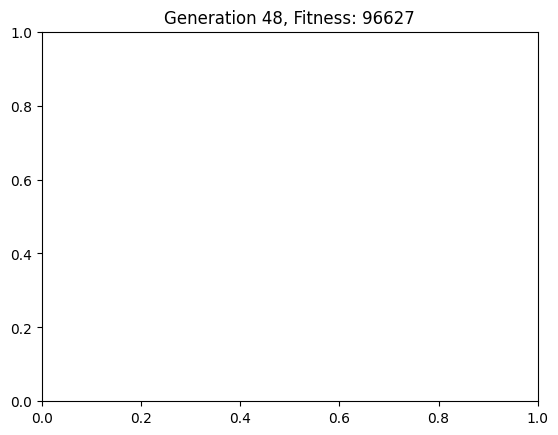

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96627}


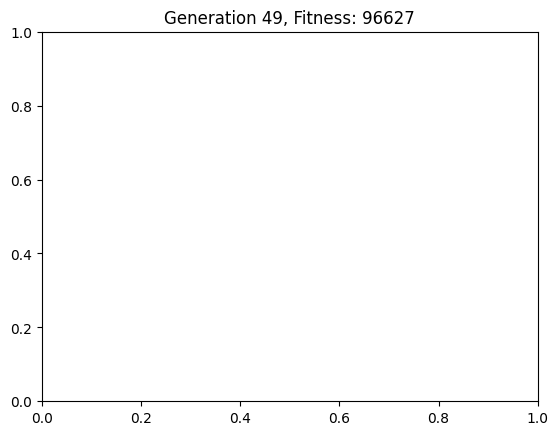

{'rooms': [{'name': 'Living Room', 'position': (338, 336), 'size': (306, 104)}, {'name': 'Bedroom1', 'position': (644, 506), 'size': (297, 86)}, {'name': 'Bedroom2', 'position': (338, 440), 'size': (306, 42)}, {'name': 'Passage', 'position': (644, 398), 'size': (121, 108)}, {'name': 'Kitchen', 'position': (765, 457), 'size': (121, 49)}, {'name': 'Washroom', 'position': (576, 482), 'size': (68, 109)}], 'fitness': 96627}
Elapsed time: 407.98 seconds


<Figure size 640x480 with 0 Axes>

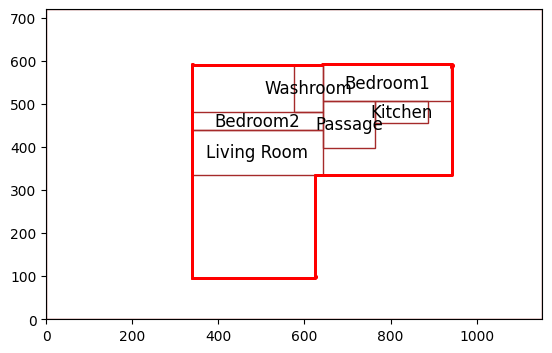

Elapsed time for initial population generation: 29.82 seconds


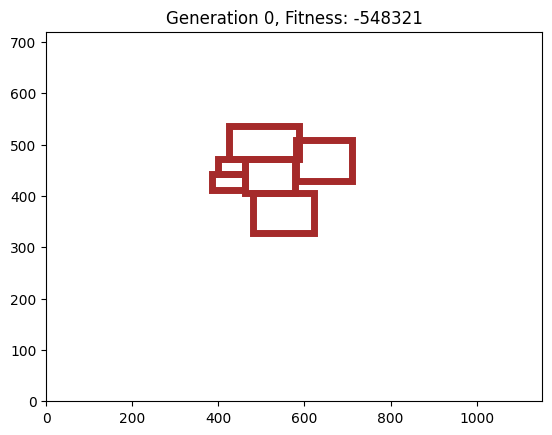

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (163, 65)}, {'name': 'Passage', 'position': (462, 406), 'size': (117, 65)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (386, 411), 'size': (75, 32)}, {'name': 'Bedroom1', 'position': (580, 430), 'size': (130, 79)}, {'name': 'Bedroom2', 'position': (480, 328), 'size': (143, 77)}], 'fitness': -548321}


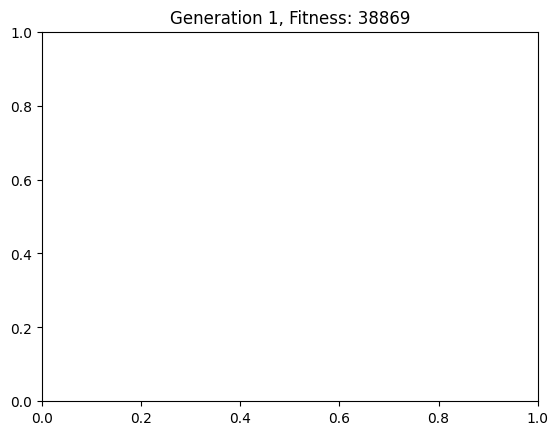

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (163, 65)}, {'name': 'Passage', 'position': (462, 406), 'size': (117, 65)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (386, 411), 'size': (75, 32)}, {'name': 'Bedroom1', 'position': (580, 430), 'size': (130, 42)}, {'name': 'Bedroom2', 'position': (480, 328), 'size': (143, 77)}], 'fitness': 38869}


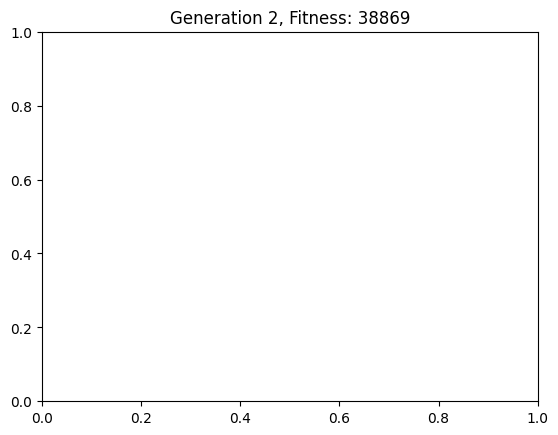

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (163, 65)}, {'name': 'Passage', 'position': (462, 406), 'size': (118, 66)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (385, 307), 'size': (76, 136)}, {'name': 'Bedroom1', 'position': (580, 429), 'size': (131, 42)}, {'name': 'Bedroom2', 'position': (480, 328), 'size': (144, 78)}], 'fitness': 38869}


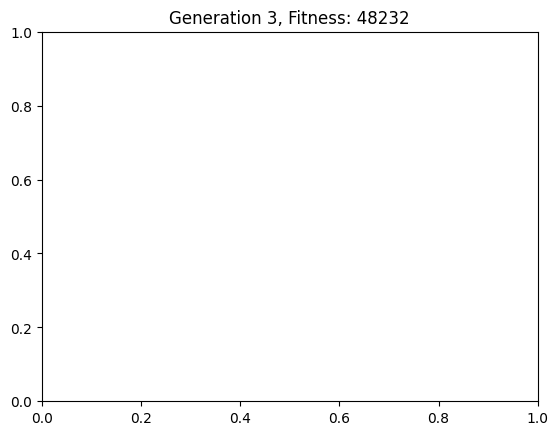

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (165, 67)}, {'name': 'Bedroom1', 'position': (580, 428), 'size': (134, 44)}, {'name': 'Bedroom2', 'position': (479, 326), 'size': (146, 79)}, {'name': 'Passage', 'position': (461, 405), 'size': (119, 67)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (385, 299), 'size': (77, 144)}], 'fitness': 48232}


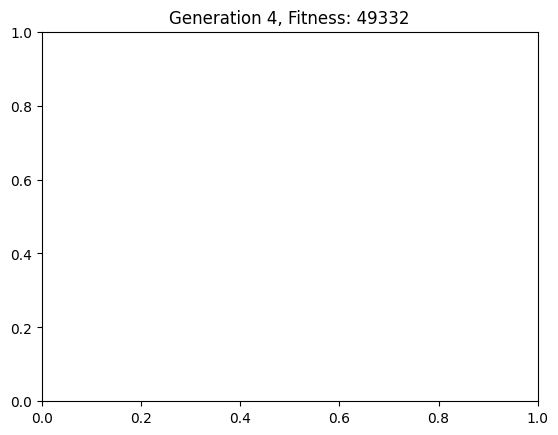

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (170, 72)}, {'name': 'Bedroom1', 'position': (580, 424), 'size': (141, 47)}, {'name': 'Bedroom2', 'position': (475, 321), 'size': (149, 81)}, {'name': 'Passage', 'position': (461, 404), 'size': (119, 68)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (377, 271), 'size': (84, 156)}], 'fitness': 49332}


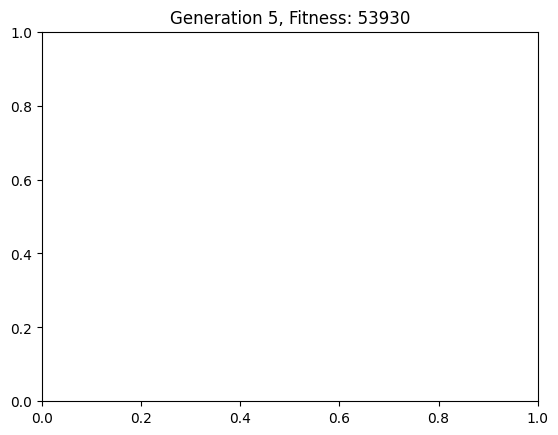

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (170, 72)}, {'name': 'Bedroom1', 'position': (580, 424), 'size': (141, 47)}, {'name': 'Bedroom2', 'position': (475, 321), 'size': (149, 81)}, {'name': 'Passage', 'position': (461, 403), 'size': (119, 68)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (377, 271), 'size': (84, 156)}], 'fitness': 53930}


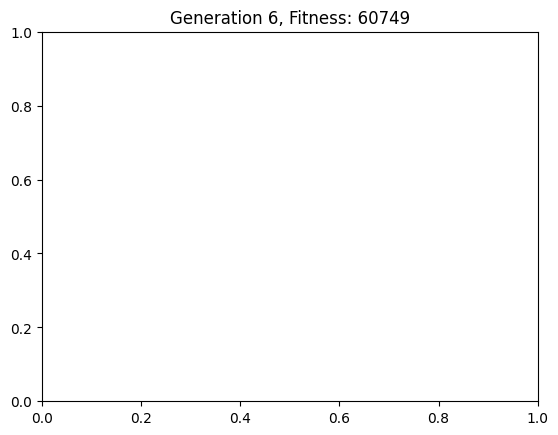

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (185, 87)}, {'name': 'Bedroom1', 'position': (580, 416), 'size': (157, 55)}, {'name': 'Bedroom2', 'position': (468, 311), 'size': (156, 87)}, {'name': 'Passage', 'position': (461, 403), 'size': (119, 69)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (361, 252), 'size': (100, 185)}], 'fitness': 60749}


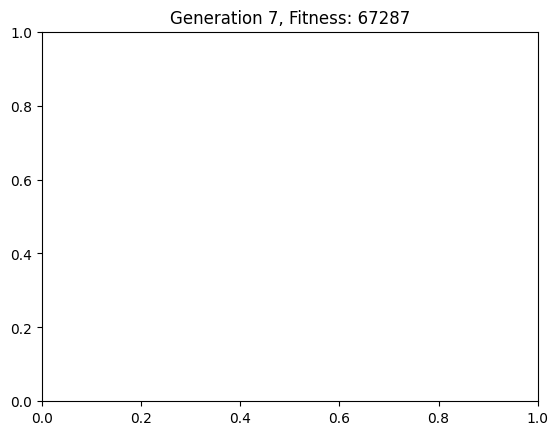

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (193, 95)}, {'name': 'Bedroom1', 'position': (580, 412), 'size': (165, 59)}, {'name': 'Bedroom2', 'position': (464, 306), 'size': (160, 90)}, {'name': 'Passage', 'position': (461, 396), 'size': (119, 75)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (353, 245), 'size': (108, 191)}], 'fitness': 67287}


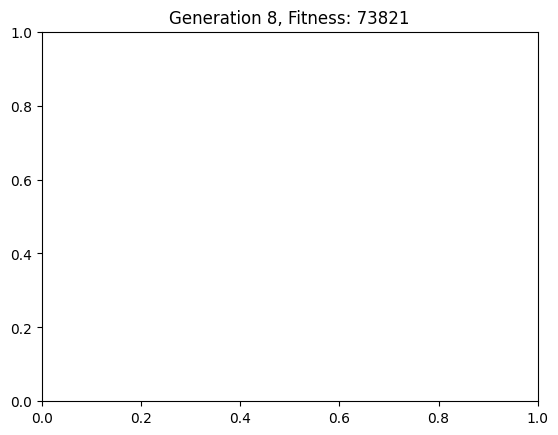

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (201, 103)}, {'name': 'Bedroom1', 'position': (580, 408), 'size': (173, 63)}, {'name': 'Bedroom2', 'position': (461, 301), 'size': (164, 93)}, {'name': 'Passage', 'position': (461, 394), 'size': (119, 78)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 228), 'size': (115, 191)}], 'fitness': 73821}


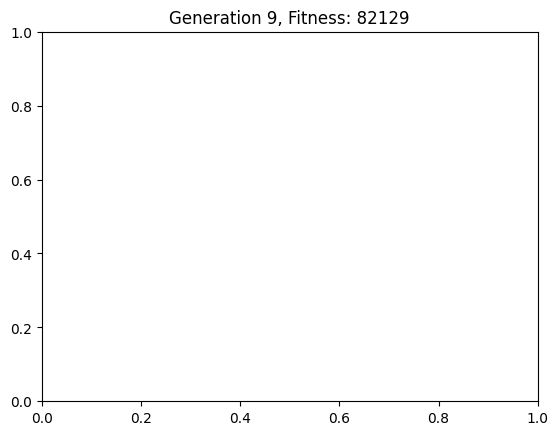

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (209, 111)}, {'name': 'Bedroom1', 'position': (580, 404), 'size': (181, 67)}, {'name': 'Bedroom2', 'position': (461, 295), 'size': (164, 95)}, {'name': 'Passage', 'position': (461, 391), 'size': (119, 81)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 216), 'size': (115, 185)}], 'fitness': 82129}


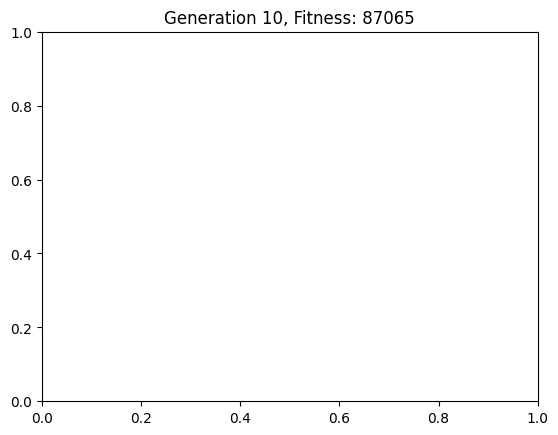

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (217, 119)}, {'name': 'Bedroom1', 'position': (580, 400), 'size': (189, 71)}, {'name': 'Bedroom2', 'position': (461, 290), 'size': (164, 98)}, {'name': 'Passage', 'position': (461, 388), 'size': (119, 83)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 216), 'size': (115, 191)}], 'fitness': 87065}


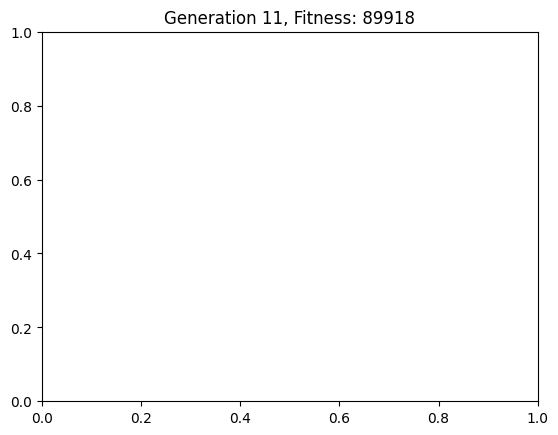

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (225, 119)}, {'name': 'Bedroom1', 'position': (580, 396), 'size': (197, 75)}, {'name': 'Bedroom2', 'position': (461, 285), 'size': (164, 101)}, {'name': 'Passage', 'position': (461, 386), 'size': (119, 86)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 216), 'size': (115, 218)}], 'fitness': 89918}


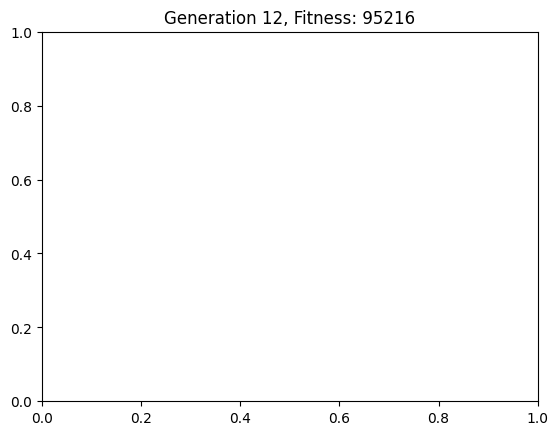

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (233, 119)}, {'name': 'Bedroom1', 'position': (580, 392), 'size': (205, 79)}, {'name': 'Bedroom2', 'position': (461, 279), 'size': (164, 103)}, {'name': 'Passage', 'position': (461, 383), 'size': (119, 89)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 216), 'size': (115, 225)}], 'fitness': 95216}


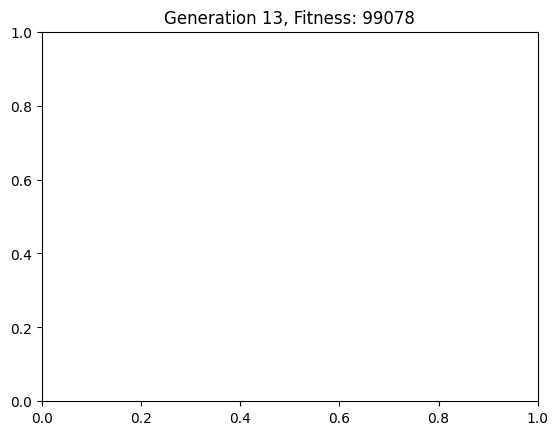

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (241, 119)}, {'name': 'Bedroom1', 'position': (580, 388), 'size': (213, 83)}, {'name': 'Bedroom2', 'position': (461, 274), 'size': (164, 106)}, {'name': 'Passage', 'position': (461, 380), 'size': (119, 91)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 216), 'size': (115, 225)}], 'fitness': 99078}


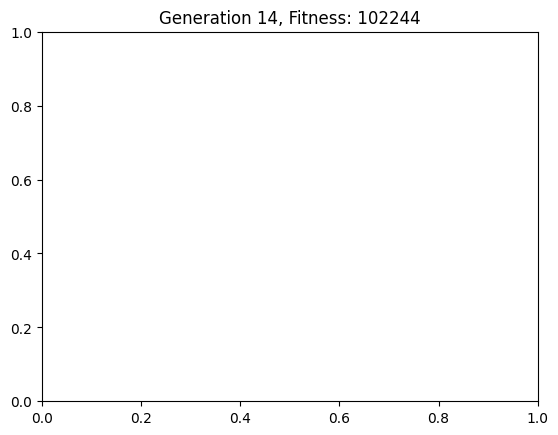

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (249, 119)}, {'name': 'Bedroom1', 'position': (580, 384), 'size': (221, 87)}, {'name': 'Bedroom2', 'position': (461, 269), 'size': (164, 109)}, {'name': 'Passage', 'position': (461, 378), 'size': (119, 94)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 205)}], 'fitness': 102244}


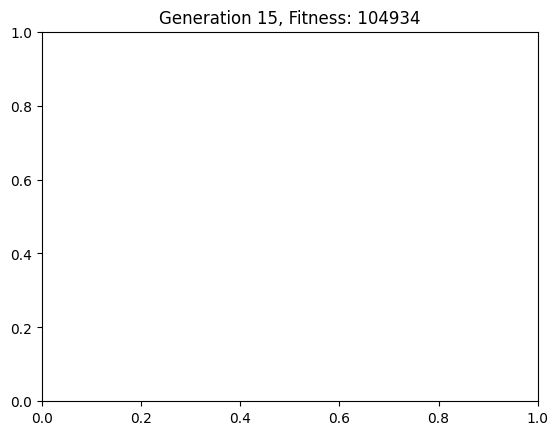

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (257, 119)}, {'name': 'Bedroom1', 'position': (580, 380), 'size': (229, 91)}, {'name': 'Bedroom2', 'position': (461, 263), 'size': (164, 111)}, {'name': 'Passage', 'position': (461, 375), 'size': (119, 97)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 207)}], 'fitness': 104934}


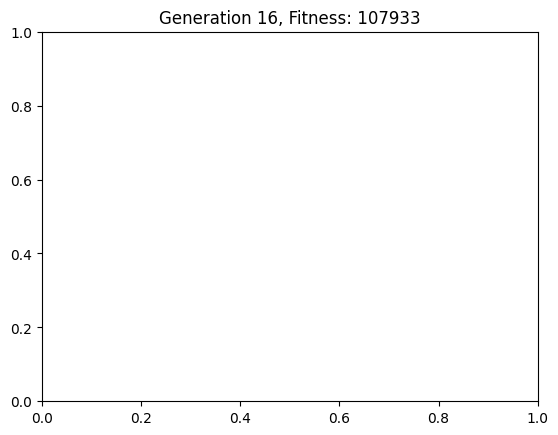

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (265, 119)}, {'name': 'Bedroom1', 'position': (580, 376), 'size': (237, 95)}, {'name': 'Bedroom2', 'position': (461, 258), 'size': (164, 114)}, {'name': 'Passage', 'position': (461, 372), 'size': (119, 99)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 207)}], 'fitness': 107933}


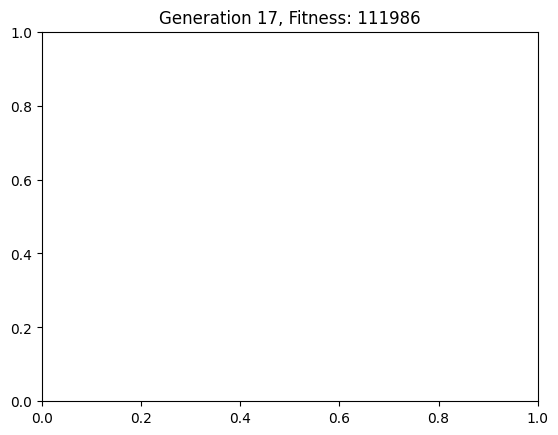

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (273, 119)}, {'name': 'Bedroom1', 'position': (580, 372), 'size': (245, 99)}, {'name': 'Bedroom2', 'position': (461, 253), 'size': (164, 117)}, {'name': 'Passage', 'position': (461, 370), 'size': (119, 102)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 207)}], 'fitness': 111986}


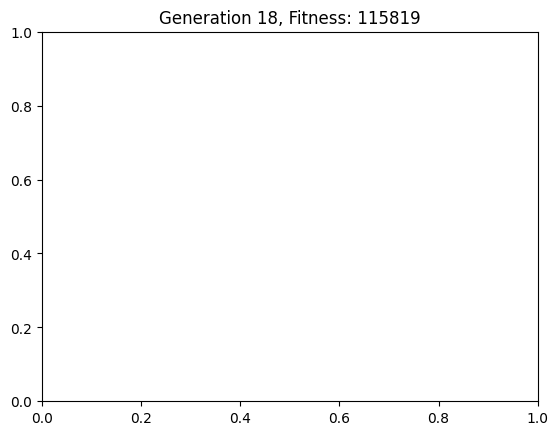

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (281, 119)}, {'name': 'Bedroom1', 'position': (580, 368), 'size': (253, 103)}, {'name': 'Bedroom2', 'position': (461, 247), 'size': (164, 119)}, {'name': 'Passage', 'position': (461, 367), 'size': (119, 105)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 212)}], 'fitness': 115819}


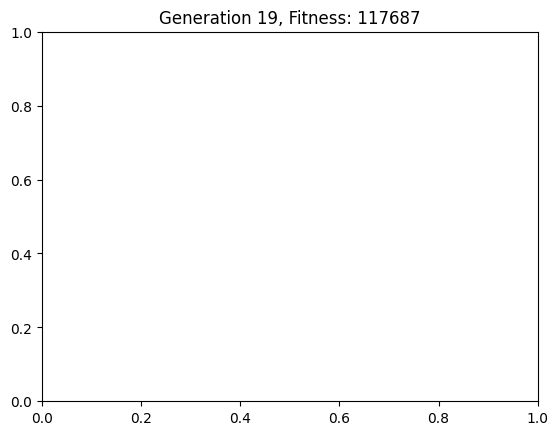

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (289, 119)}, {'name': 'Bedroom1', 'position': (580, 365), 'size': (261, 107)}, {'name': 'Bedroom2', 'position': (461, 242), 'size': (164, 122)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 107)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 211)}], 'fitness': 117687}


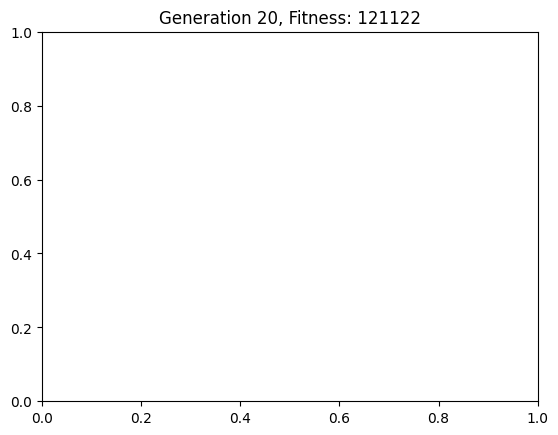

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (297, 119)}, {'name': 'Bedroom1', 'position': (580, 362), 'size': (269, 110)}, {'name': 'Bedroom2', 'position': (461, 237), 'size': (164, 125)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 190)}], 'fitness': 121122}


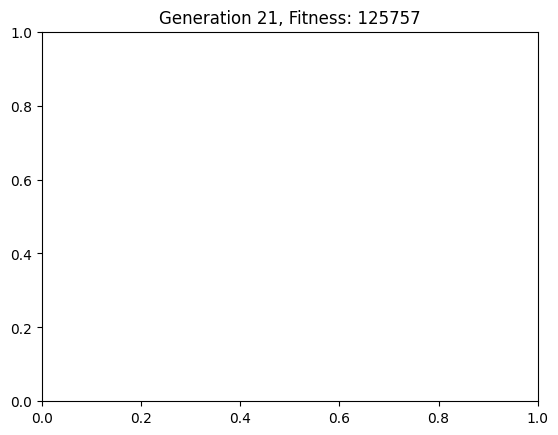

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (305, 119)}, {'name': 'Bedroom1', 'position': (580, 359), 'size': (277, 112)}, {'name': 'Bedroom2', 'position': (461, 231), 'size': (164, 127)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 190)}], 'fitness': 125757}


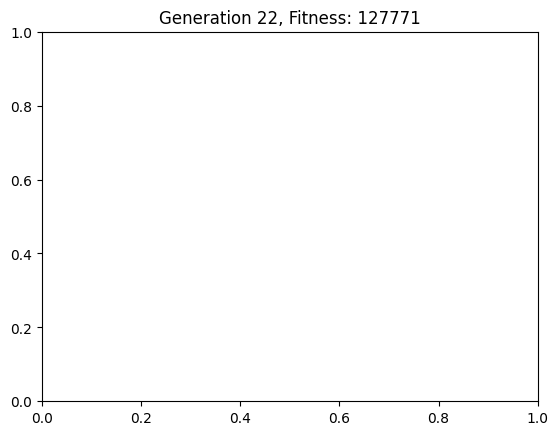

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (313, 119)}, {'name': 'Bedroom1', 'position': (580, 357), 'size': (285, 115)}, {'name': 'Bedroom2', 'position': (461, 226), 'size': (164, 130)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 204)}], 'fitness': 127771}


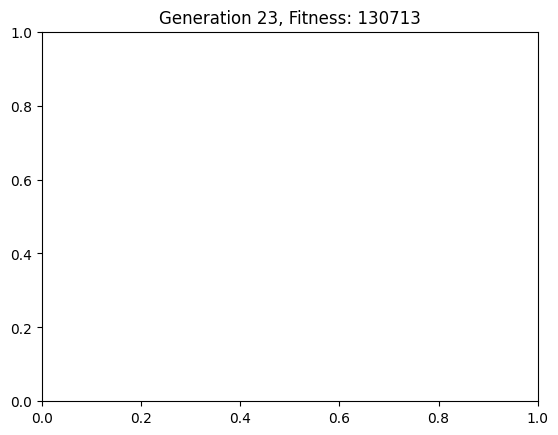

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (321, 119)}, {'name': 'Bedroom1', 'position': (580, 354), 'size': (293, 118)}, {'name': 'Bedroom2', 'position': (461, 221), 'size': (164, 133)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 208)}], 'fitness': 130713}


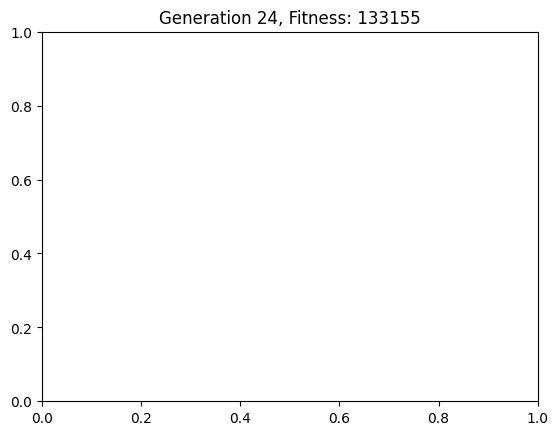

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (329, 119)}, {'name': 'Bedroom1', 'position': (580, 351), 'size': (301, 120)}, {'name': 'Bedroom2', 'position': (461, 215), 'size': (164, 135)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 218)}], 'fitness': 133155}


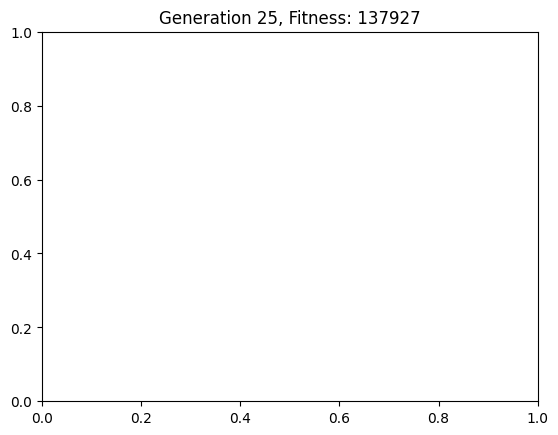

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (337, 119)}, {'name': 'Bedroom1', 'position': (580, 349), 'size': (309, 123)}, {'name': 'Bedroom2', 'position': (461, 210), 'size': (164, 138)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 207)}], 'fitness': 137927}


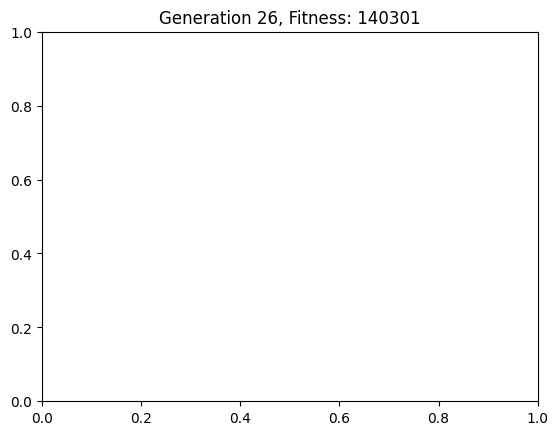

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (345, 119)}, {'name': 'Bedroom1', 'position': (580, 346), 'size': (317, 126)}, {'name': 'Bedroom2', 'position': (461, 205), 'size': (164, 141)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 227)}], 'fitness': 140301}


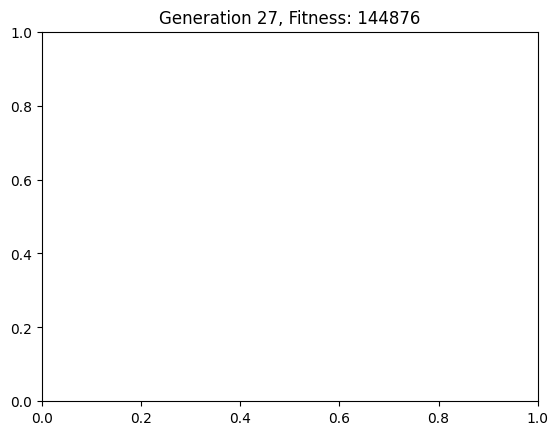

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (353, 119)}, {'name': 'Bedroom1', 'position': (580, 343), 'size': (325, 128)}, {'name': 'Bedroom2', 'position': (461, 199), 'size': (164, 143)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 196)}], 'fitness': 144876}


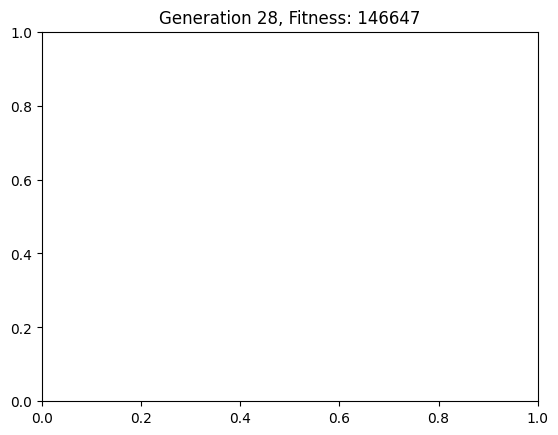

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (361, 119)}, {'name': 'Bedroom1', 'position': (580, 341), 'size': (333, 131)}, {'name': 'Bedroom2', 'position': (461, 194), 'size': (164, 146)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 209)}], 'fitness': 146647}


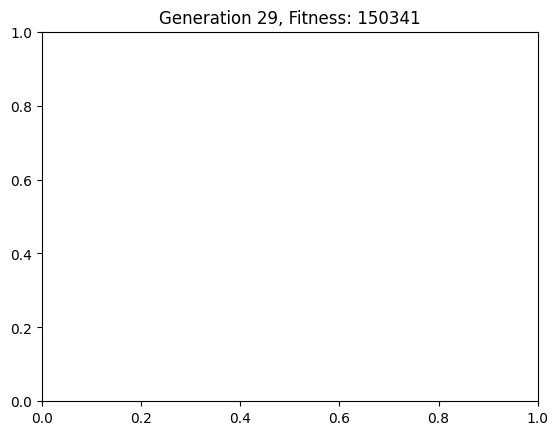

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (369, 119)}, {'name': 'Bedroom1', 'position': (580, 338), 'size': (341, 134)}, {'name': 'Bedroom2', 'position': (461, 189), 'size': (164, 149)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 225)}], 'fitness': 150341}


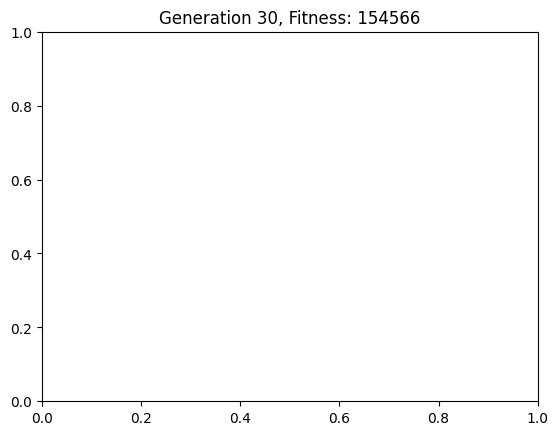

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (377, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (349, 136)}, {'name': 'Bedroom2', 'position': (461, 184), 'size': (164, 152)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 200)}], 'fitness': 154566}


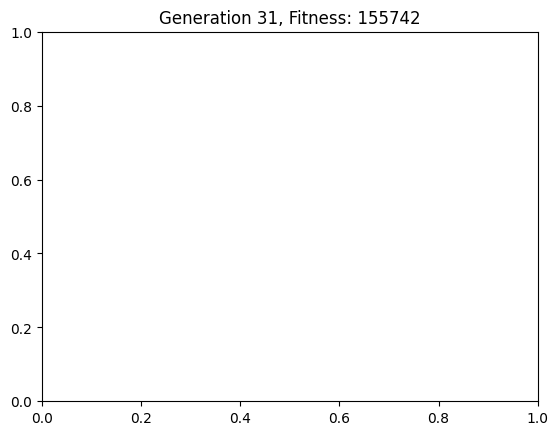

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (385, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (357, 136)}, {'name': 'Bedroom2', 'position': (461, 180), 'size': (164, 156)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 229)}], 'fitness': 155742}


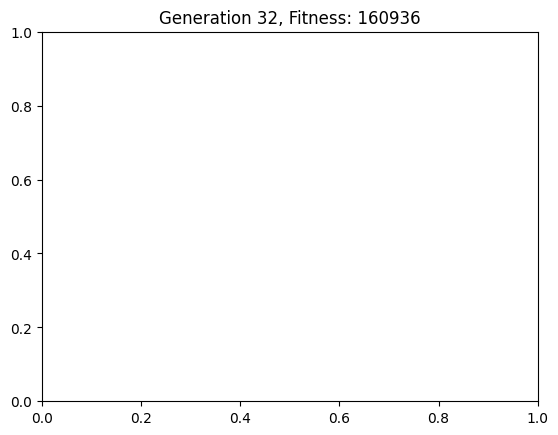

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (393, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 176), 'size': (164, 160)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 219)}], 'fitness': 160936}


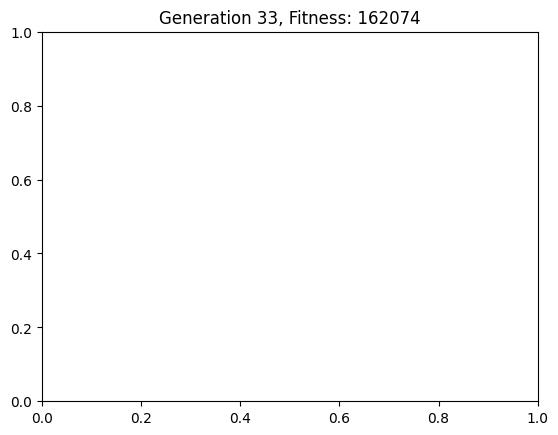

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (401, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 172), 'size': (164, 164)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 201)}], 'fitness': 162074}


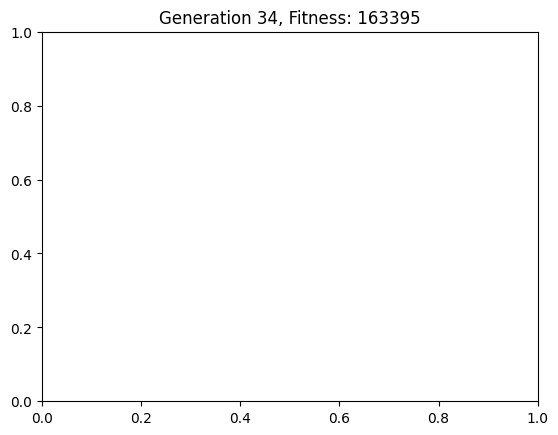

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (409, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 168), 'size': (164, 168)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 223)}], 'fitness': 163395}


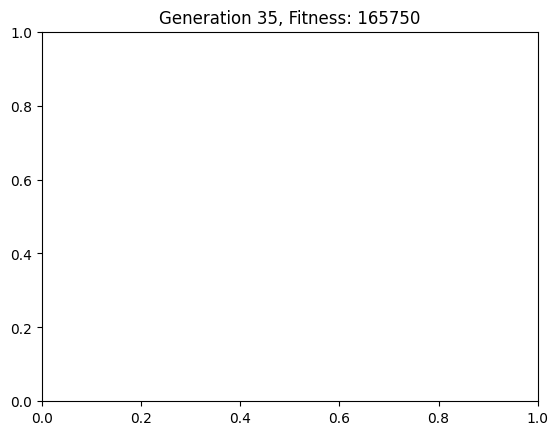

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (417, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 164), 'size': (164, 172)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 186)}], 'fitness': 165750}


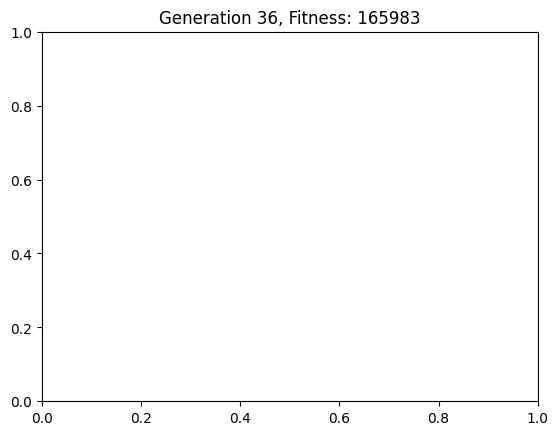

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (425, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 160), 'size': (164, 176)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 215)}], 'fitness': 165983}


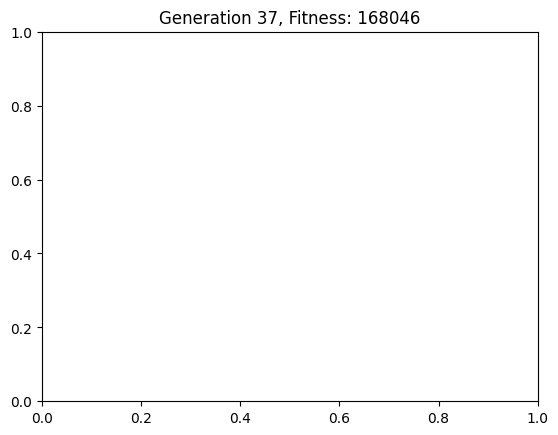

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (433, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 156), 'size': (164, 180)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 191)}], 'fitness': 168046}


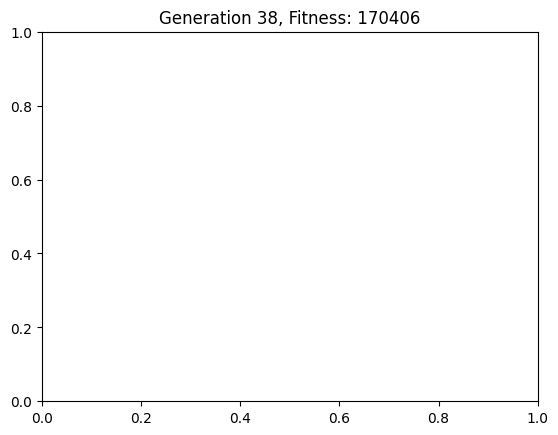

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (441, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 152), 'size': (164, 184)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 189)}], 'fitness': 170406}


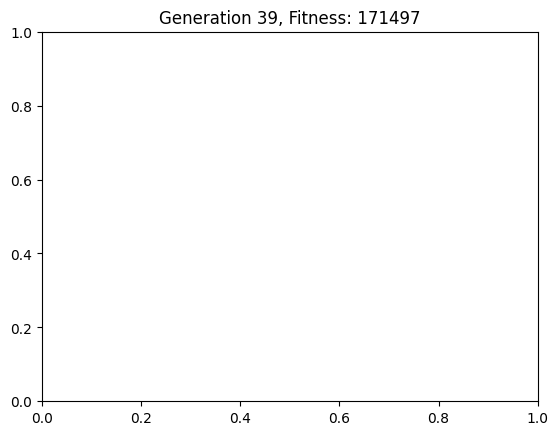

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (449, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 148), 'size': (164, 188)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 207)}], 'fitness': 171497}


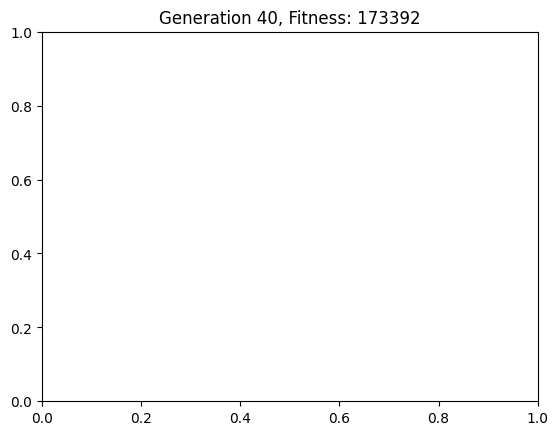

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (457, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 144), 'size': (164, 192)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 201)}], 'fitness': 173392}


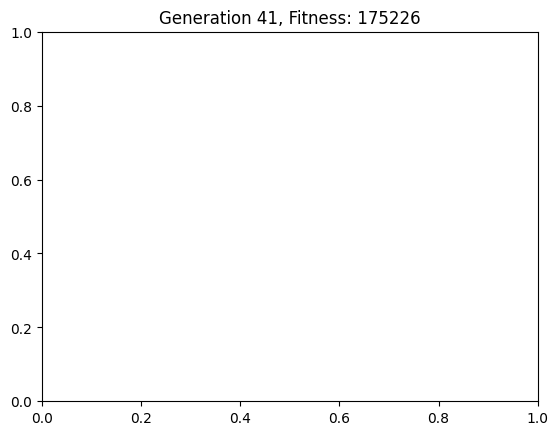

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (465, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 140), 'size': (164, 196)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 210)}], 'fitness': 175226}


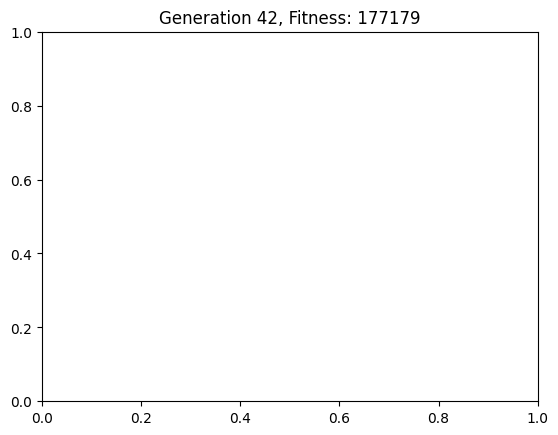

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (473, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 136), 'size': (164, 200)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 188)}], 'fitness': 177179}


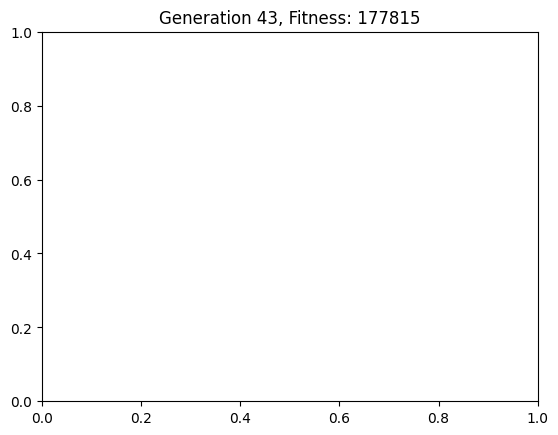

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (481, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 132), 'size': (164, 204)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 221)}], 'fitness': 177815}


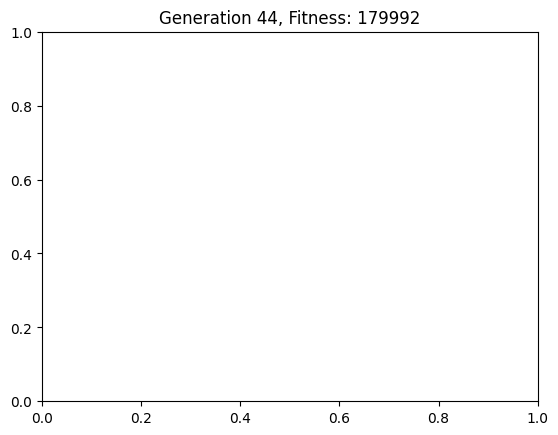

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (489, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 128), 'size': (164, 208)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 215)}], 'fitness': 179992}


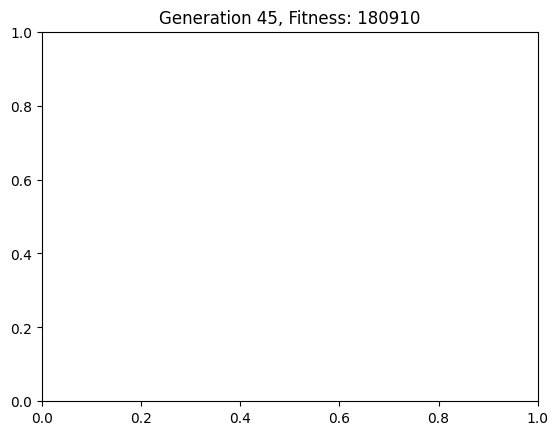

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (497, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 124), 'size': (164, 212)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 201)}], 'fitness': 180910}


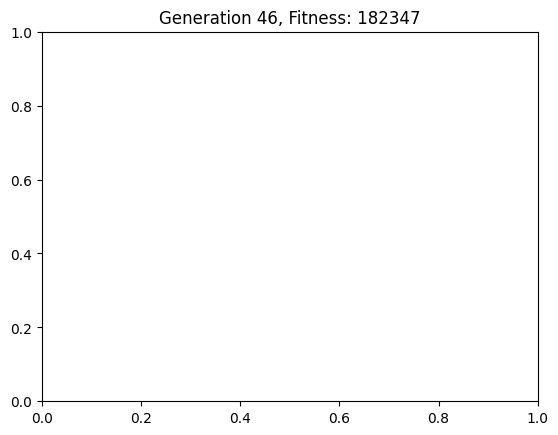

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (505, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 120), 'size': (164, 216)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 220)}], 'fitness': 182347}


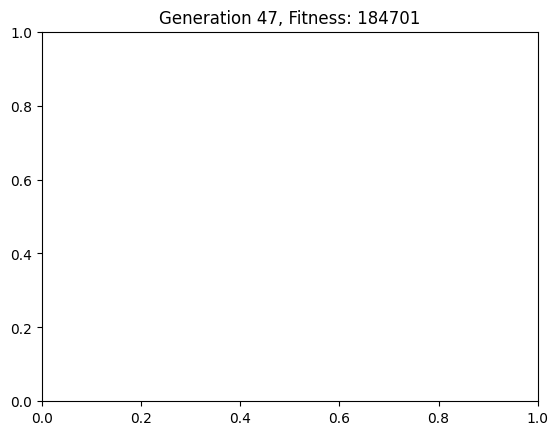

{'rooms': [{'name': 'Living Room', 'position': (425, 472), 'size': (513, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 116), 'size': (164, 220)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 198)}], 'fitness': 184701}


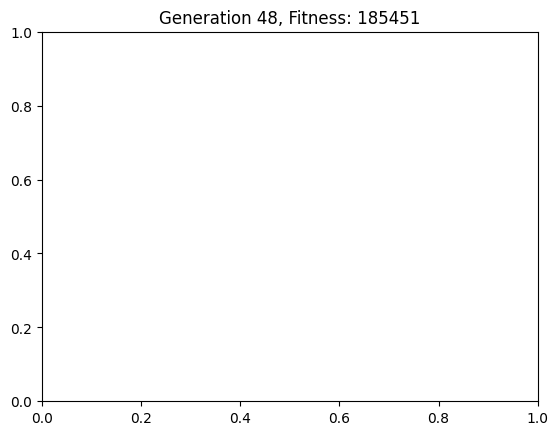

{'rooms': [{'name': 'Living Room', 'position': (422, 472), 'size': (518, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 112), 'size': (164, 224)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 200)}], 'fitness': 185451}


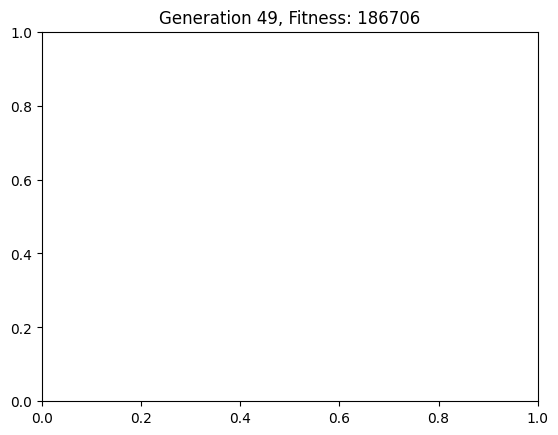

{'rooms': [{'name': 'Living Room', 'position': (418, 472), 'size': (522, 119)}, {'name': 'Bedroom1', 'position': (580, 336), 'size': (362, 136)}, {'name': 'Bedroom2', 'position': (461, 108), 'size': (164, 228)}, {'name': 'Passage', 'position': (461, 364), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (399, 443), 'size': (62, 29)}, {'name': 'Washroom', 'position': (346, 204), 'size': (115, 197)}], 'fitness': 186706}
Elapsed time: 614.64 seconds


<Figure size 640x480 with 0 Axes>

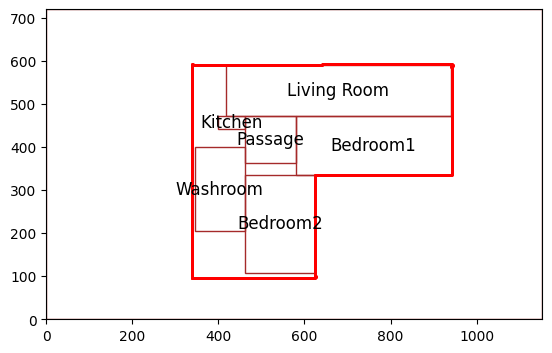

Elapsed time for initial population generation: 28.55 seconds


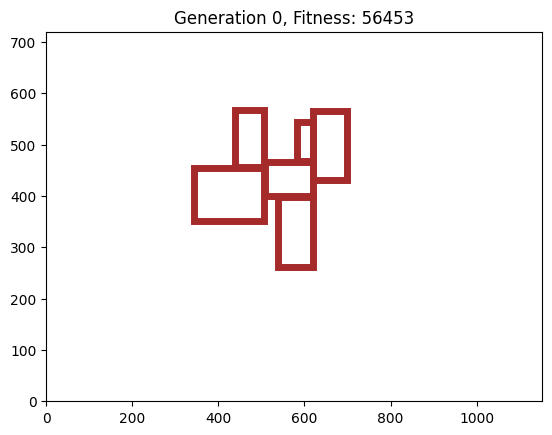

{'rooms': [{'name': 'Living Room', 'position': (344, 352), 'size': (163, 102)}, {'name': 'Passage', 'position': (508, 399), 'size': (112, 68)}, {'name': 'Kitchen', 'position': (438, 457), 'size': (69, 111)}, {'name': 'Washroom', 'position': (582, 468), 'size': (39, 77)}, {'name': 'Bedroom1', 'position': (621, 432), 'size': (78, 134)}, {'name': 'Bedroom2', 'position': (538, 261), 'size': (81, 137)}], 'fitness': 56453}


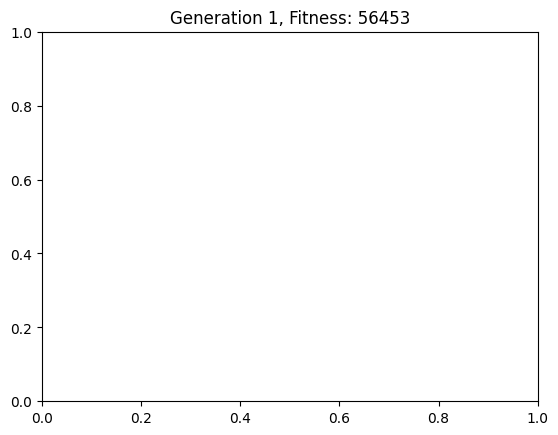

{'rooms': [{'name': 'Living Room', 'position': (344, 352), 'size': (164, 103)}, {'name': 'Passage', 'position': (508, 399), 'size': (113, 69)}, {'name': 'Kitchen', 'position': (438, 457), 'size': (70, 121)}, {'name': 'Washroom', 'position': (581, 468), 'size': (40, 73)}, {'name': 'Bedroom1', 'position': (621, 432), 'size': (79, 135)}, {'name': 'Bedroom2', 'position': (538, 261), 'size': (82, 138)}], 'fitness': 56453}


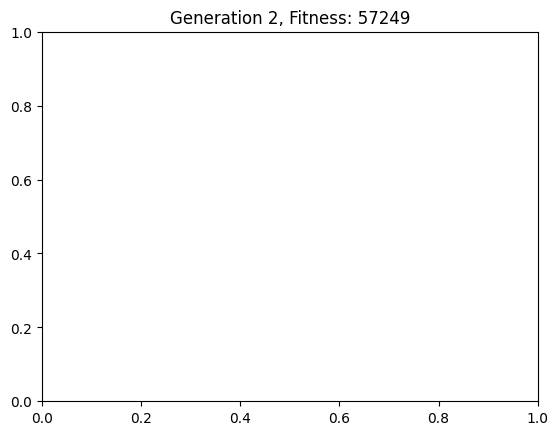

{'rooms': [{'name': 'Living Room', 'position': (342, 352), 'size': (164, 105)}, {'name': 'Bedroom1', 'position': (621, 432), 'size': (82, 138)}, {'name': 'Bedroom2', 'position': (538, 259), 'size': (85, 139)}, {'name': 'Passage', 'position': (507, 398), 'size': (113, 69)}, {'name': 'Kitchen', 'position': (437, 457), 'size': (70, 118)}, {'name': 'Washroom', 'position': (578, 468), 'size': (43, 69)}], 'fitness': 57249}


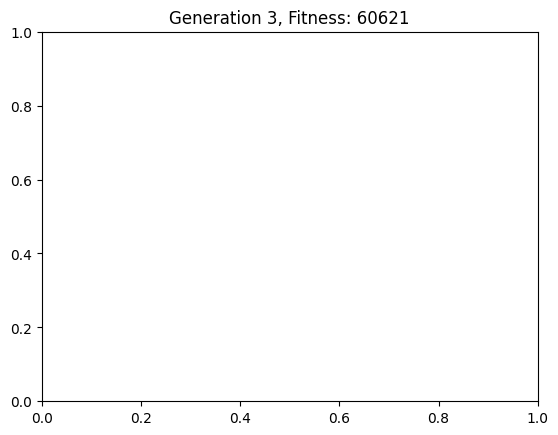

{'rooms': [{'name': 'Living Room', 'position': (342, 351), 'size': (165, 105)}, {'name': 'Bedroom1', 'position': (621, 432), 'size': (82, 138)}, {'name': 'Bedroom2', 'position': (538, 259), 'size': (85, 139)}, {'name': 'Passage', 'position': (508, 398), 'size': (113, 70)}, {'name': 'Kitchen', 'position': (436, 457), 'size': (72, 129)}, {'name': 'Washroom', 'position': (578, 468), 'size': (43, 69)}], 'fitness': 60621}


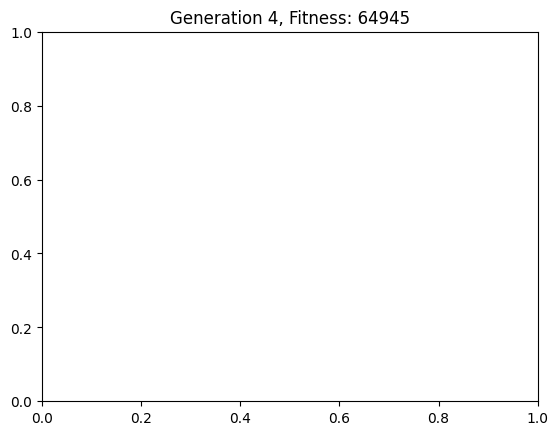

{'rooms': [{'name': 'Living Room', 'position': (339, 349), 'size': (167, 108)}, {'name': 'Bedroom1', 'position': (621, 432), 'size': (96, 152)}, {'name': 'Bedroom2', 'position': (532, 251), 'size': (93, 145)}, {'name': 'Passage', 'position': (507, 395), 'size': (114, 72)}, {'name': 'Kitchen', 'position': (431, 457), 'size': (76, 130)}, {'name': 'Washroom', 'position': (564, 468), 'size': (57, 95)}], 'fitness': 64945}


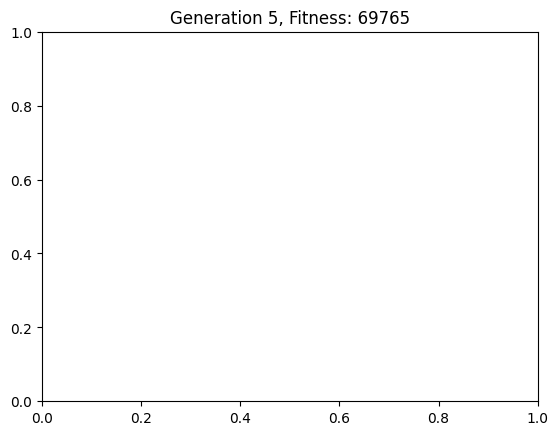

{'rooms': [{'name': 'Living Room', 'position': (338, 346), 'size': (169, 110)}, {'name': 'Bedroom1', 'position': (621, 432), 'size': (103, 159)}, {'name': 'Bedroom2', 'position': (529, 246), 'size': (96, 147)}, {'name': 'Passage', 'position': (507, 394), 'size': (114, 74)}, {'name': 'Kitchen', 'position': (430, 457), 'size': (77, 127)}, {'name': 'Washroom', 'position': (558, 468), 'size': (63, 108)}], 'fitness': 69765}


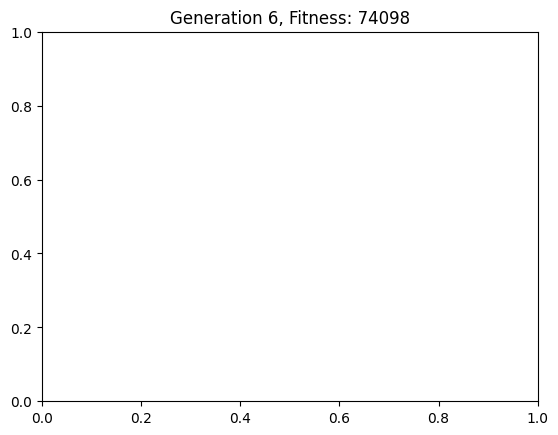

{'rooms': [{'name': 'Living Room', 'position': (338, 342), 'size': (169, 114)}, {'name': 'Bedroom1', 'position': (621, 428), 'size': (111, 163)}, {'name': 'Bedroom2', 'position': (525, 241), 'size': (100, 150)}, {'name': 'Passage', 'position': (507, 391), 'size': (114, 76)}, {'name': 'Kitchen', 'position': (428, 457), 'size': (79, 133)}, {'name': 'Washroom', 'position': (553, 468), 'size': (68, 117)}], 'fitness': 74098}


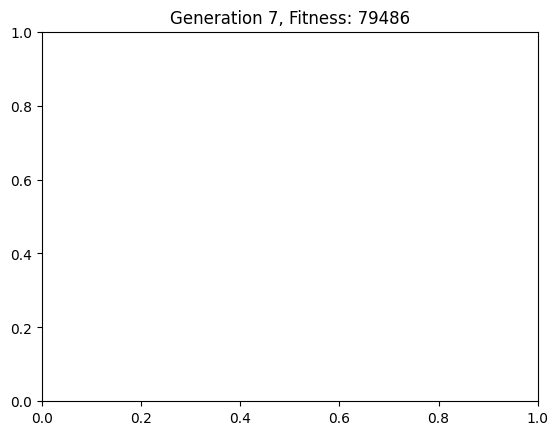

{'rooms': [{'name': 'Living Room', 'position': (338, 338), 'size': (169, 118)}, {'name': 'Bedroom1', 'position': (621, 424), 'size': (119, 167)}, {'name': 'Bedroom2', 'position': (521, 236), 'size': (104, 153)}, {'name': 'Passage', 'position': (507, 389), 'size': (114, 79)}, {'name': 'Kitchen', 'position': (428, 457), 'size': (79, 133)}, {'name': 'Washroom', 'position': (550, 468), 'size': (71, 120)}], 'fitness': 79486}


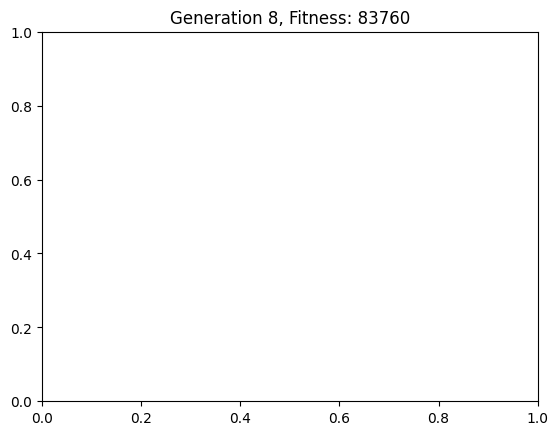

{'rooms': [{'name': 'Living Room', 'position': (338, 334), 'size': (169, 122)}, {'name': 'Bedroom1', 'position': (621, 420), 'size': (127, 171)}, {'name': 'Bedroom2', 'position': (517, 230), 'size': (108, 155)}, {'name': 'Passage', 'position': (507, 386), 'size': (114, 82)}, {'name': 'Kitchen', 'position': (426, 457), 'size': (81, 134)}, {'name': 'Washroom', 'position': (547, 468), 'size': (74, 119)}], 'fitness': 83760}


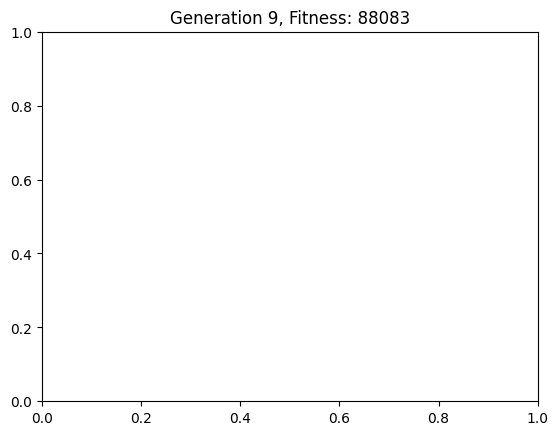

{'rooms': [{'name': 'Living Room', 'position': (338, 330), 'size': (169, 126)}, {'name': 'Bedroom1', 'position': (621, 416), 'size': (135, 175)}, {'name': 'Bedroom2', 'position': (513, 225), 'size': (112, 158)}, {'name': 'Passage', 'position': (507, 383), 'size': (114, 84)}, {'name': 'Kitchen', 'position': (424, 457), 'size': (83, 134)}, {'name': 'Washroom', 'position': (546, 468), 'size': (75, 121)}], 'fitness': 88083}


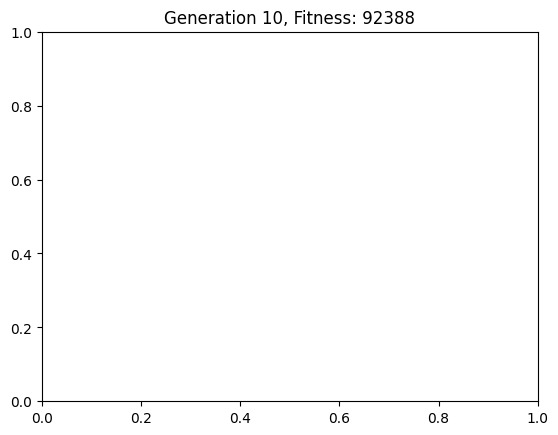

{'rooms': [{'name': 'Living Room', 'position': (338, 326), 'size': (169, 130)}, {'name': 'Bedroom1', 'position': (621, 412), 'size': (143, 179)}, {'name': 'Bedroom2', 'position': (509, 220), 'size': (116, 161)}, {'name': 'Passage', 'position': (507, 381), 'size': (114, 87)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (546, 468), 'size': (75, 121)}], 'fitness': 92388}


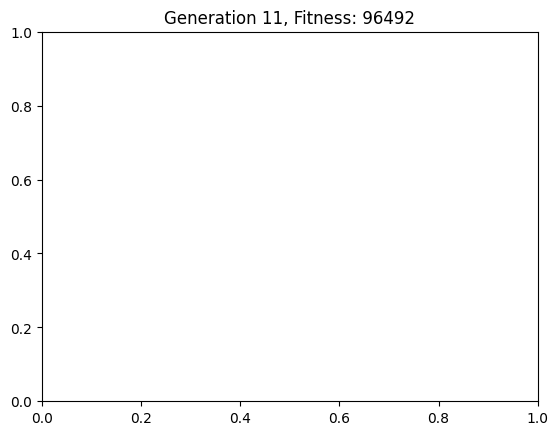

{'rooms': [{'name': 'Living Room', 'position': (338, 322), 'size': (169, 134)}, {'name': 'Bedroom1', 'position': (621, 408), 'size': (151, 183)}, {'name': 'Bedroom2', 'position': (507, 214), 'size': (118, 163)}, {'name': 'Passage', 'position': (507, 378), 'size': (114, 90)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (546, 468), 'size': (75, 121)}], 'fitness': 96492}


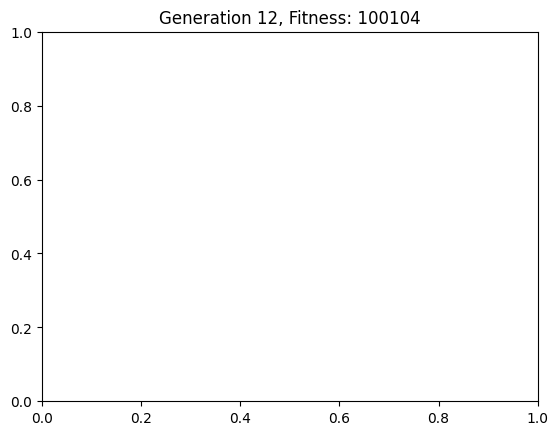

{'rooms': [{'name': 'Living Room', 'position': (338, 318), 'size': (169, 138)}, {'name': 'Bedroom1', 'position': (621, 404), 'size': (159, 187)}, {'name': 'Bedroom2', 'position': (507, 209), 'size': (118, 166)}, {'name': 'Passage', 'position': (507, 375), 'size': (114, 92)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (546, 468), 'size': (75, 121)}], 'fitness': 100104}


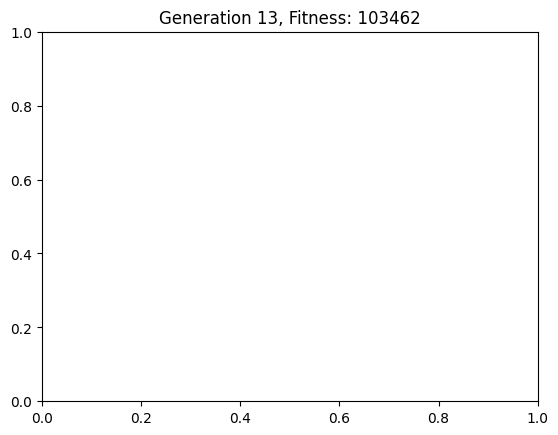

{'rooms': [{'name': 'Living Room', 'position': (338, 314), 'size': (169, 142)}, {'name': 'Bedroom1', 'position': (621, 400), 'size': (167, 191)}, {'name': 'Bedroom2', 'position': (507, 204), 'size': (118, 169)}, {'name': 'Passage', 'position': (507, 373), 'size': (114, 95)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 103462}


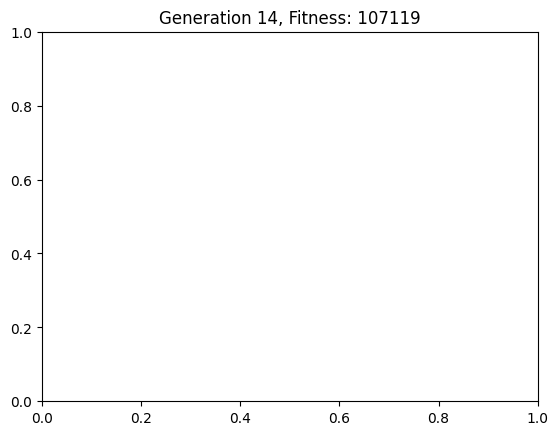

{'rooms': [{'name': 'Living Room', 'position': (338, 310), 'size': (169, 146)}, {'name': 'Bedroom1', 'position': (621, 396), 'size': (175, 195)}, {'name': 'Bedroom2', 'position': (507, 198), 'size': (118, 171)}, {'name': 'Passage', 'position': (507, 370), 'size': (114, 98)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 107119}


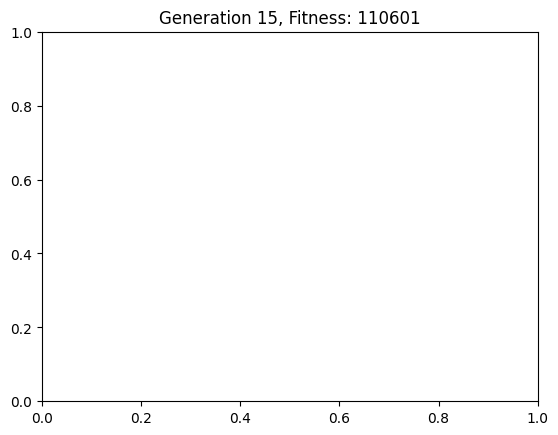

{'rooms': [{'name': 'Living Room', 'position': (338, 306), 'size': (169, 150)}, {'name': 'Bedroom1', 'position': (621, 392), 'size': (183, 199)}, {'name': 'Bedroom2', 'position': (507, 193), 'size': (118, 174)}, {'name': 'Passage', 'position': (507, 367), 'size': (114, 100)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 110601}


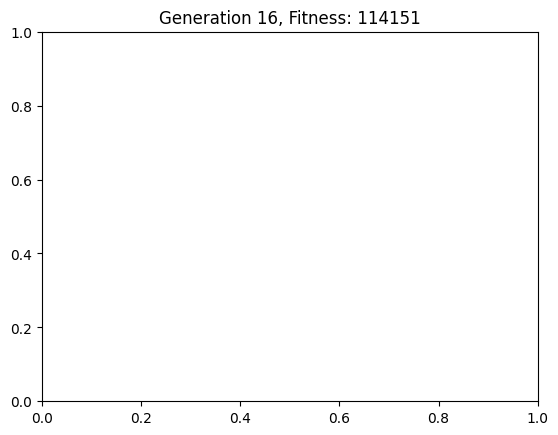

{'rooms': [{'name': 'Living Room', 'position': (338, 302), 'size': (169, 154)}, {'name': 'Bedroom1', 'position': (621, 388), 'size': (191, 203)}, {'name': 'Bedroom2', 'position': (507, 188), 'size': (118, 177)}, {'name': 'Passage', 'position': (507, 365), 'size': (114, 103)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 114151}


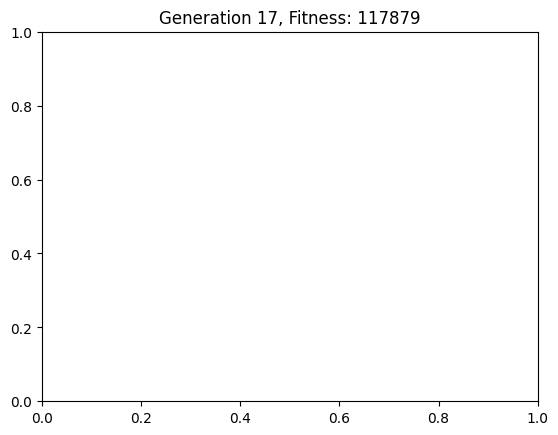

{'rooms': [{'name': 'Living Room', 'position': (338, 298), 'size': (169, 158)}, {'name': 'Bedroom1', 'position': (621, 384), 'size': (199, 207)}, {'name': 'Bedroom2', 'position': (507, 182), 'size': (118, 179)}, {'name': 'Passage', 'position': (507, 362), 'size': (114, 106)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 117879}


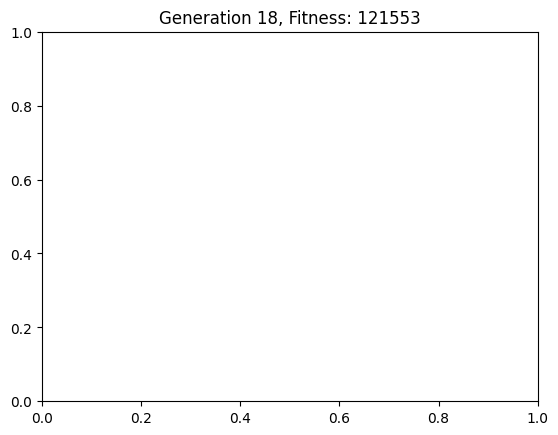

{'rooms': [{'name': 'Living Room', 'position': (338, 294), 'size': (169, 162)}, {'name': 'Bedroom1', 'position': (621, 380), 'size': (207, 211)}, {'name': 'Bedroom2', 'position': (507, 177), 'size': (118, 182)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 121553}


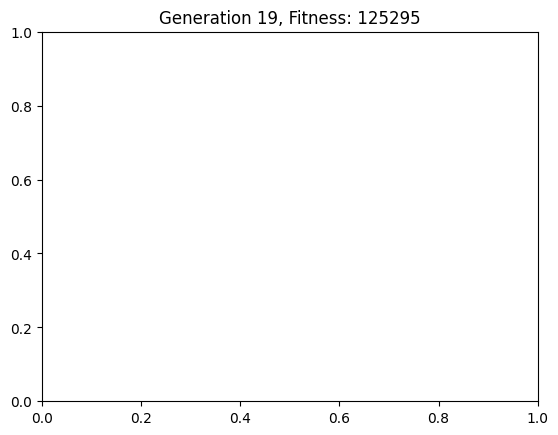

{'rooms': [{'name': 'Living Room', 'position': (338, 290), 'size': (169, 166)}, {'name': 'Bedroom1', 'position': (621, 376), 'size': (215, 215)}, {'name': 'Bedroom2', 'position': (507, 173), 'size': (118, 186)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 125295}


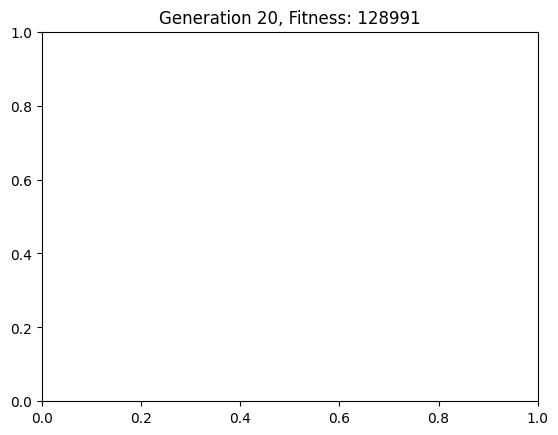

{'rooms': [{'name': 'Living Room', 'position': (338, 286), 'size': (169, 170)}, {'name': 'Bedroom1', 'position': (621, 372), 'size': (223, 219)}, {'name': 'Bedroom2', 'position': (507, 169), 'size': (118, 190)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 128991}


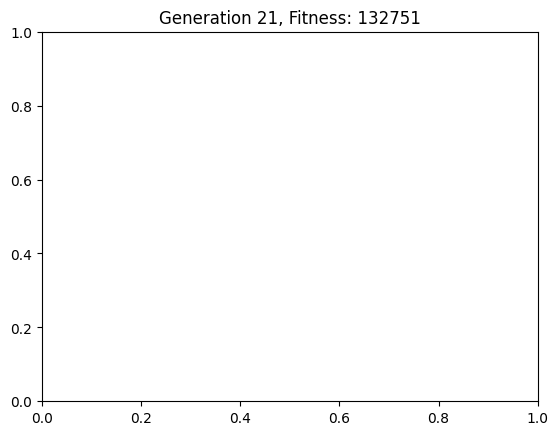

{'rooms': [{'name': 'Living Room', 'position': (338, 282), 'size': (169, 174)}, {'name': 'Bedroom1', 'position': (621, 368), 'size': (231, 223)}, {'name': 'Bedroom2', 'position': (507, 165), 'size': (118, 194)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 132751}


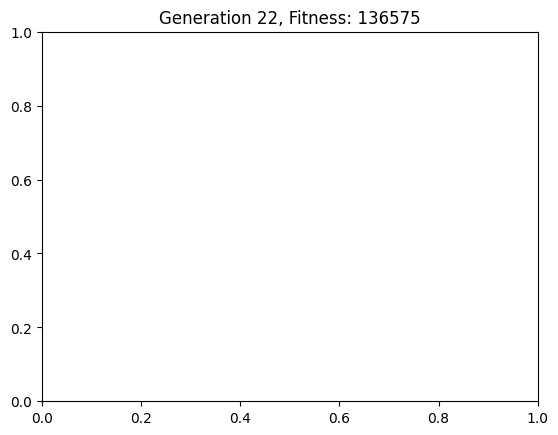

{'rooms': [{'name': 'Living Room', 'position': (338, 278), 'size': (169, 178)}, {'name': 'Bedroom1', 'position': (621, 364), 'size': (239, 227)}, {'name': 'Bedroom2', 'position': (507, 161), 'size': (118, 198)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 136575}


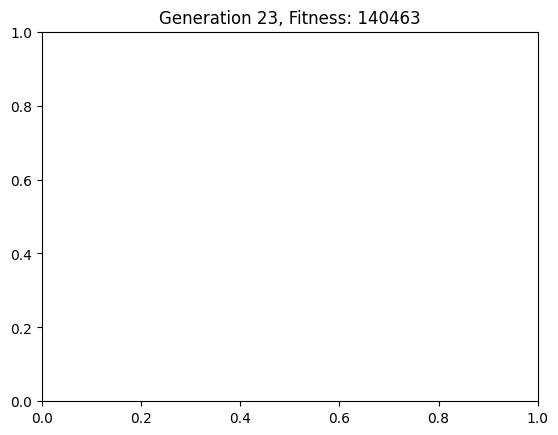

{'rooms': [{'name': 'Living Room', 'position': (338, 274), 'size': (169, 182)}, {'name': 'Bedroom1', 'position': (621, 360), 'size': (247, 231)}, {'name': 'Bedroom2', 'position': (507, 157), 'size': (118, 202)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 140463}


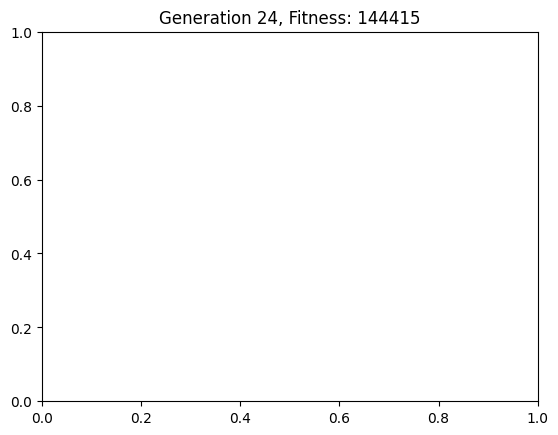

{'rooms': [{'name': 'Living Room', 'position': (338, 270), 'size': (169, 186)}, {'name': 'Bedroom1', 'position': (621, 357), 'size': (255, 234)}, {'name': 'Bedroom2', 'position': (507, 152), 'size': (118, 205)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 144415}


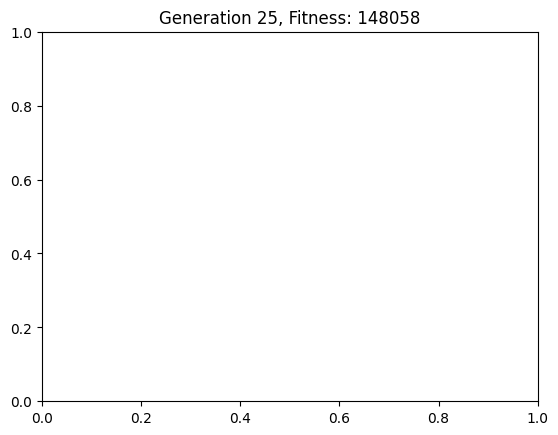

{'rooms': [{'name': 'Living Room', 'position': (338, 266), 'size': (169, 190)}, {'name': 'Bedroom1', 'position': (621, 354), 'size': (263, 236)}, {'name': 'Bedroom2', 'position': (507, 146), 'size': (118, 207)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 148058}


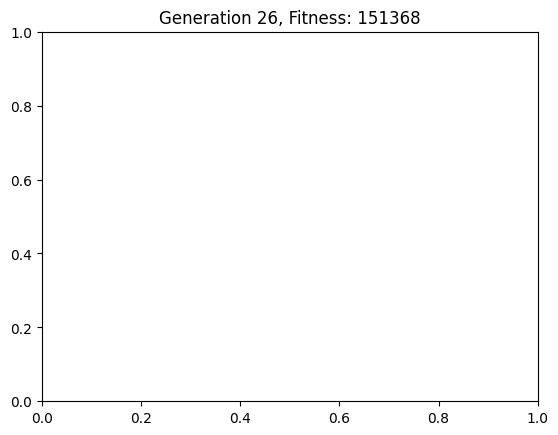

{'rooms': [{'name': 'Living Room', 'position': (338, 262), 'size': (169, 194)}, {'name': 'Bedroom1', 'position': (621, 352), 'size': (271, 239)}, {'name': 'Bedroom2', 'position': (507, 141), 'size': (118, 210)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 151368}


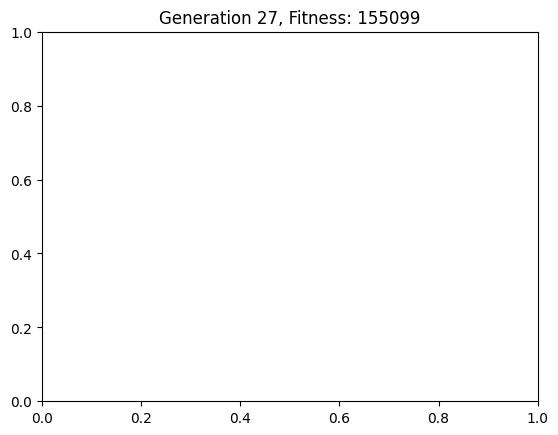

{'rooms': [{'name': 'Living Room', 'position': (338, 258), 'size': (169, 198)}, {'name': 'Bedroom1', 'position': (621, 349), 'size': (279, 242)}, {'name': 'Bedroom2', 'position': (507, 136), 'size': (118, 213)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (545, 468), 'size': (76, 121)}], 'fitness': 155099}


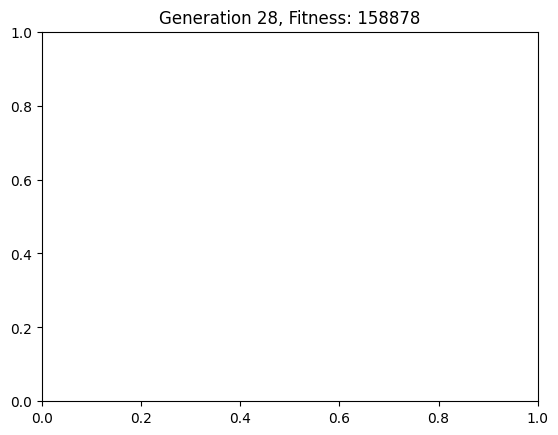

{'rooms': [{'name': 'Living Room', 'position': (338, 254), 'size': (169, 202)}, {'name': 'Bedroom1', 'position': (621, 346), 'size': (287, 244)}, {'name': 'Bedroom2', 'position': (507, 130), 'size': (118, 215)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 158878}


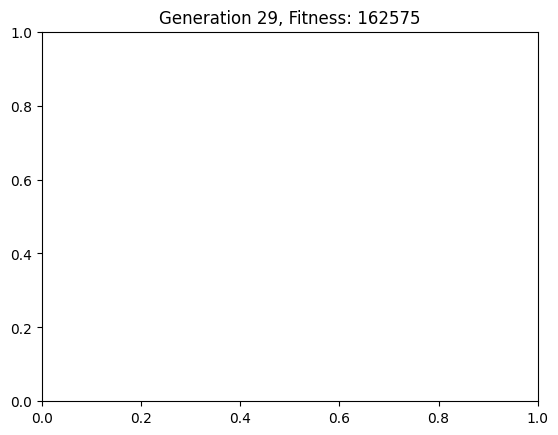

{'rooms': [{'name': 'Living Room', 'position': (338, 250), 'size': (169, 206)}, {'name': 'Bedroom1', 'position': (621, 344), 'size': (295, 247)}, {'name': 'Bedroom2', 'position': (507, 125), 'size': (118, 218)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 162575}


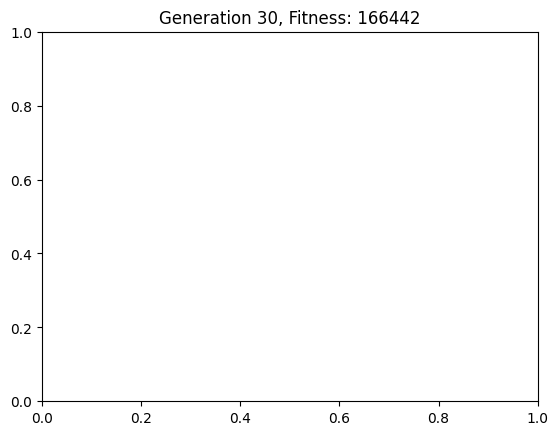

{'rooms': [{'name': 'Living Room', 'position': (338, 246), 'size': (169, 210)}, {'name': 'Bedroom1', 'position': (621, 341), 'size': (303, 250)}, {'name': 'Bedroom2', 'position': (507, 120), 'size': (118, 221)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 166442}


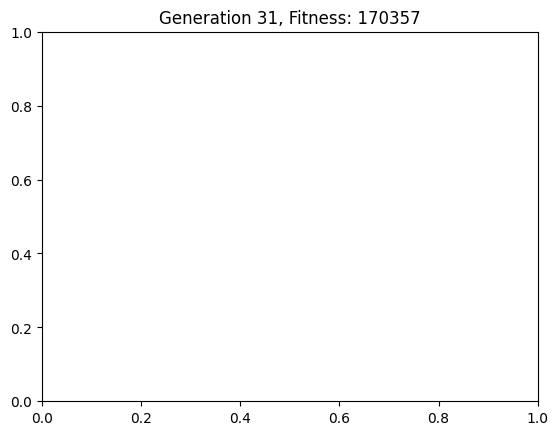

{'rooms': [{'name': 'Living Room', 'position': (338, 242), 'size': (169, 214)}, {'name': 'Bedroom1', 'position': (621, 338), 'size': (311, 252)}, {'name': 'Bedroom2', 'position': (507, 114), 'size': (118, 223)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 170357}


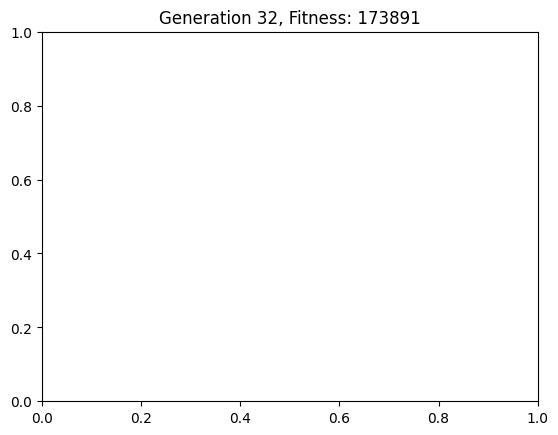

{'rooms': [{'name': 'Living Room', 'position': (338, 238), 'size': (169, 218)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (319, 255)}, {'name': 'Bedroom2', 'position': (507, 109), 'size': (118, 226)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 173891}


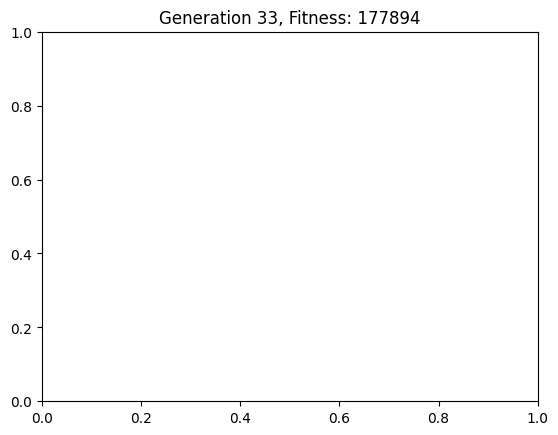

{'rooms': [{'name': 'Living Room', 'position': (338, 234), 'size': (169, 222)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 105), 'size': (118, 230)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 177894}


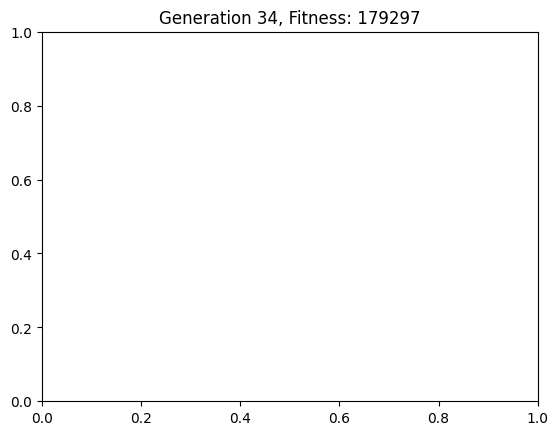

{'rooms': [{'name': 'Living Room', 'position': (338, 230), 'size': (169, 226)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 101), 'size': (118, 234)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 179297}


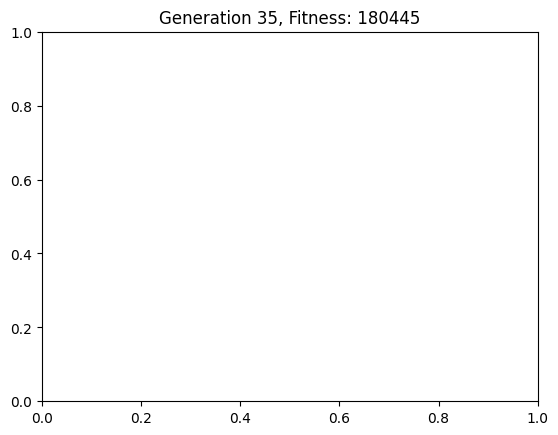

{'rooms': [{'name': 'Living Room', 'position': (338, 226), 'size': (169, 230)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 238)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 180445}


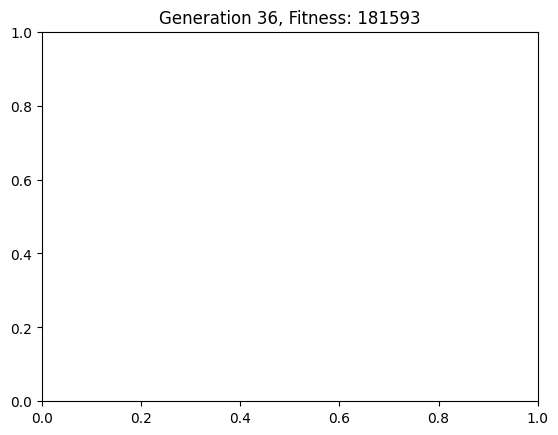

{'rooms': [{'name': 'Living Room', 'position': (338, 222), 'size': (169, 234)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 181593}


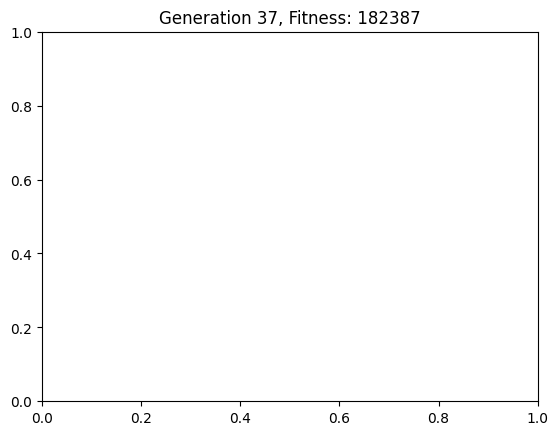

{'rooms': [{'name': 'Living Room', 'position': (338, 218), 'size': (169, 238)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 182387}


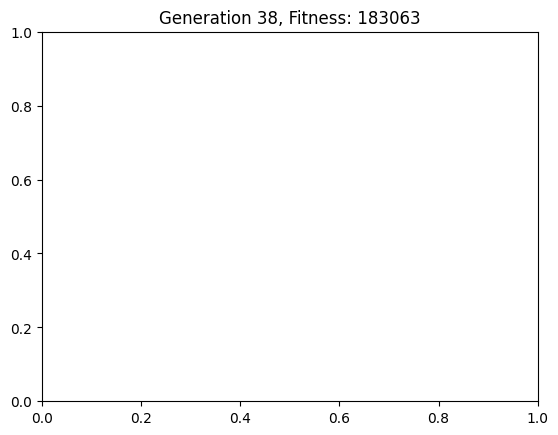

{'rooms': [{'name': 'Living Room', 'position': (338, 214), 'size': (169, 242)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 183063}


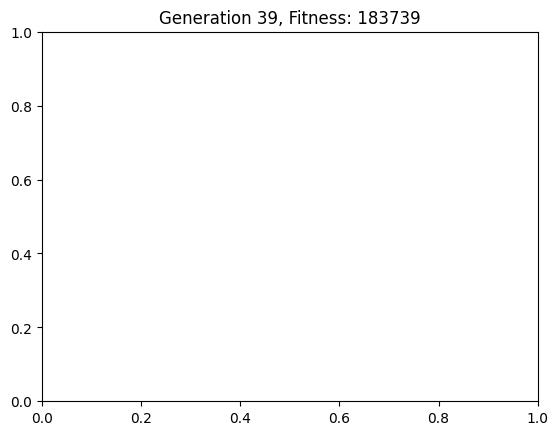

{'rooms': [{'name': 'Living Room', 'position': (338, 210), 'size': (169, 246)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 183739}


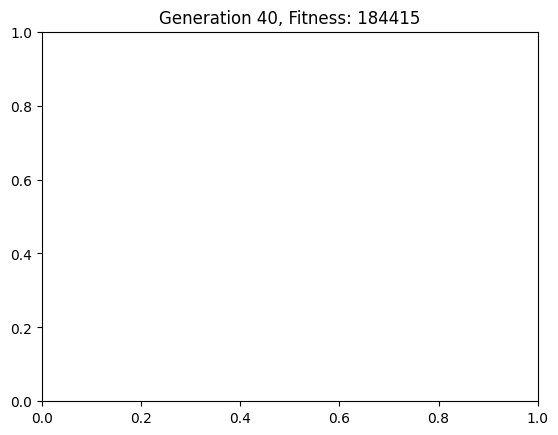

{'rooms': [{'name': 'Living Room', 'position': (338, 206), 'size': (169, 250)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 184415}


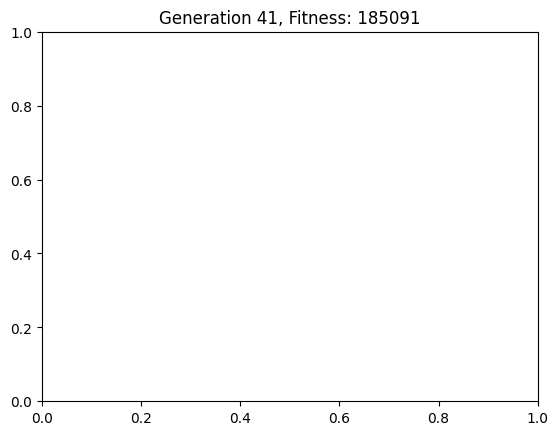

{'rooms': [{'name': 'Living Room', 'position': (338, 202), 'size': (169, 254)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 185091}


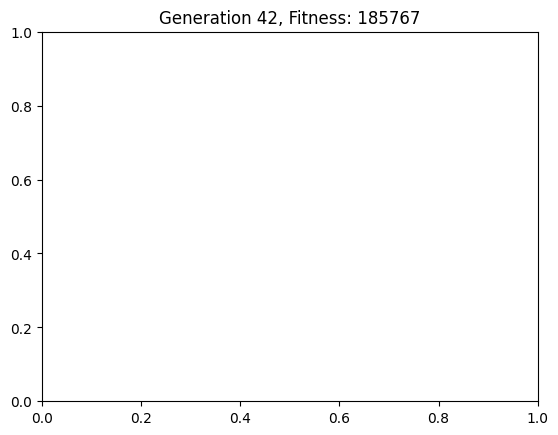

{'rooms': [{'name': 'Living Room', 'position': (338, 198), 'size': (169, 258)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 185767}


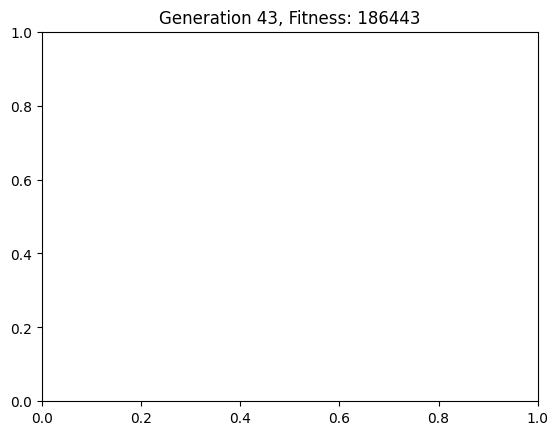

{'rooms': [{'name': 'Living Room', 'position': (338, 194), 'size': (169, 262)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 186443}


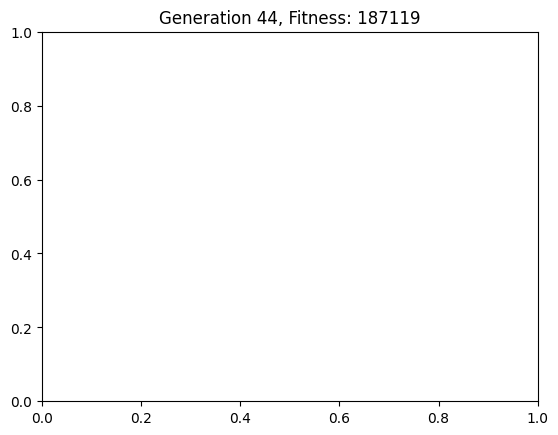

{'rooms': [{'name': 'Living Room', 'position': (338, 190), 'size': (169, 266)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 187119}


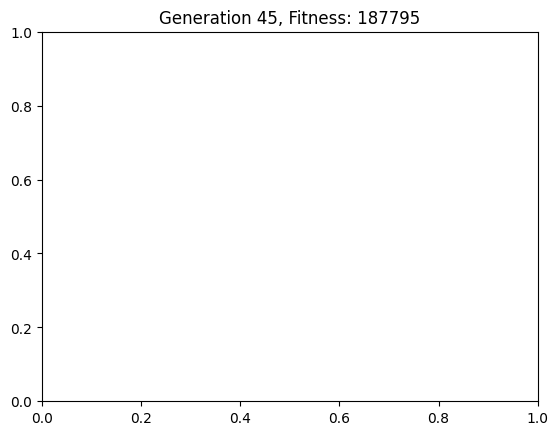

{'rooms': [{'name': 'Living Room', 'position': (338, 186), 'size': (169, 270)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 187795}


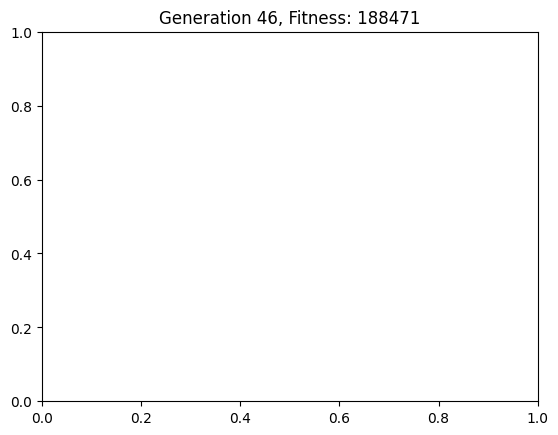

{'rooms': [{'name': 'Living Room', 'position': (338, 182), 'size': (169, 274)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 188471}


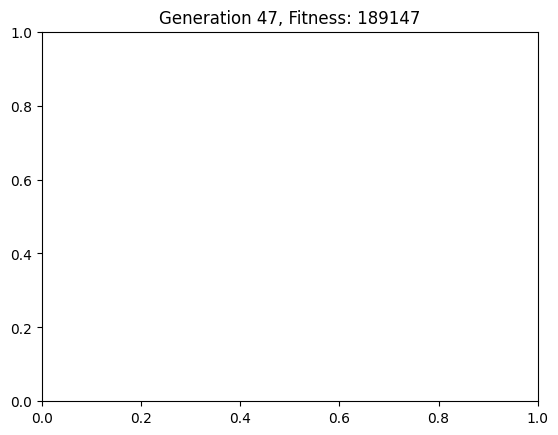

{'rooms': [{'name': 'Living Room', 'position': (338, 178), 'size': (169, 278)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 189147}


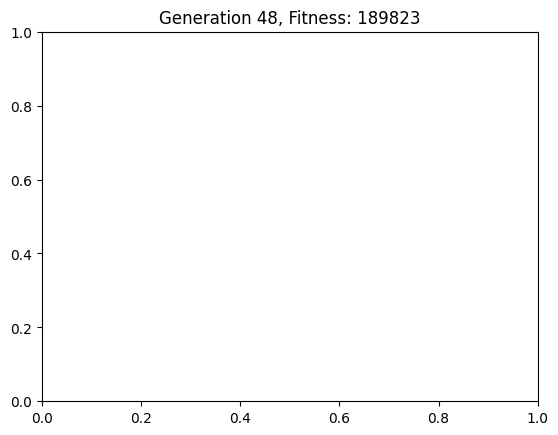

{'rooms': [{'name': 'Living Room', 'position': (338, 174), 'size': (169, 282)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 189823}


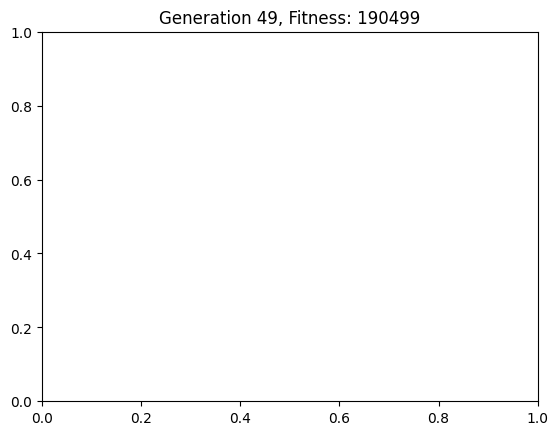

{'rooms': [{'name': 'Living Room', 'position': (338, 170), 'size': (169, 286)}, {'name': 'Bedroom1', 'position': (621, 336), 'size': (320, 255)}, {'name': 'Bedroom2', 'position': (507, 97), 'size': (118, 239)}, {'name': 'Passage', 'position': (507, 360), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (423, 457), 'size': (84, 134)}, {'name': 'Washroom', 'position': (544, 468), 'size': (77, 123)}], 'fitness': 190499}
Elapsed time: 560.46 seconds


<Figure size 640x480 with 0 Axes>

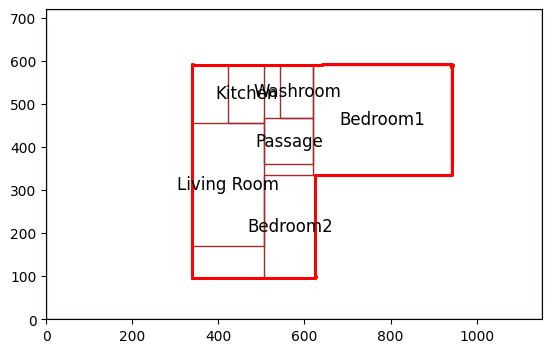

Elapsed time for initial population generation: 28.18 seconds


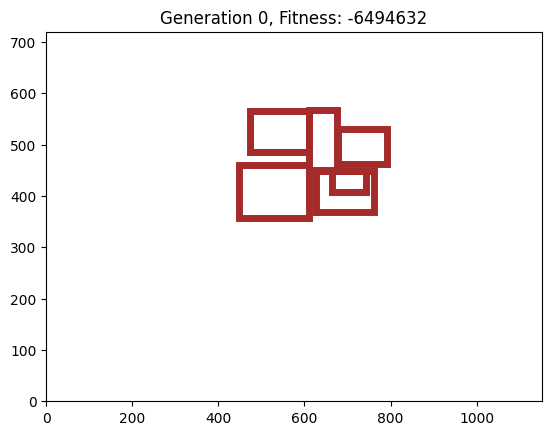

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (78, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (136, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -6494632}


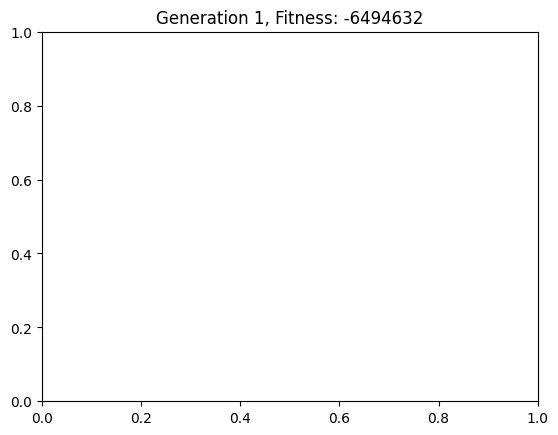

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (78, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (136, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -6494632}


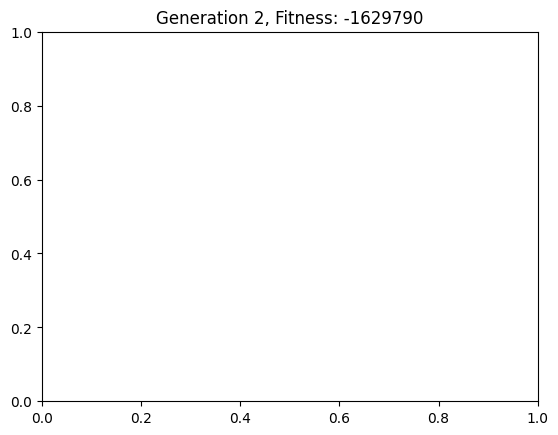

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


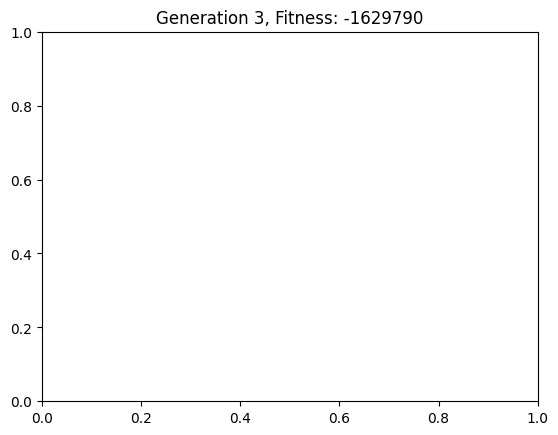

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


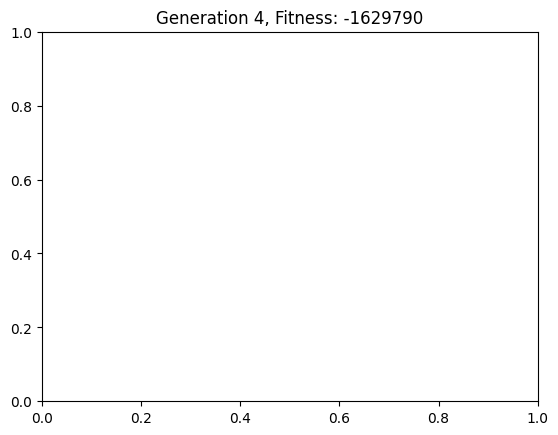

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


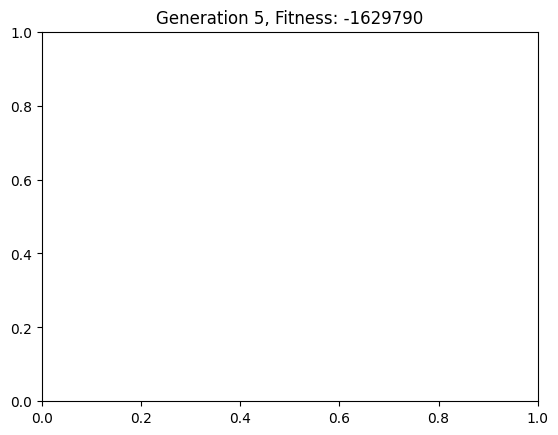

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


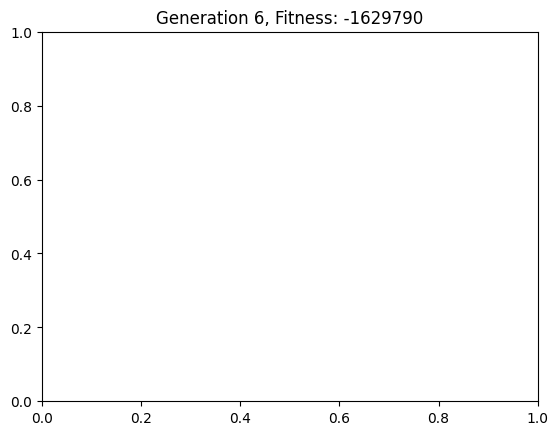

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


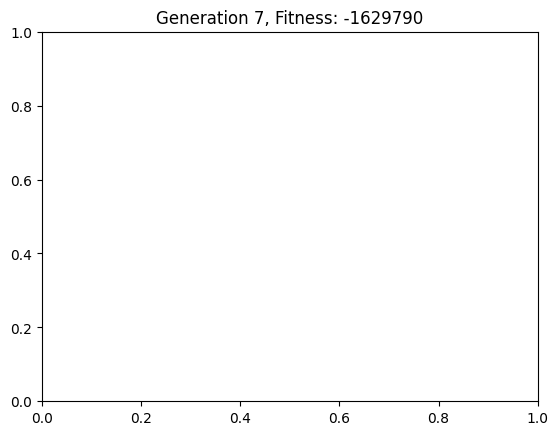

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


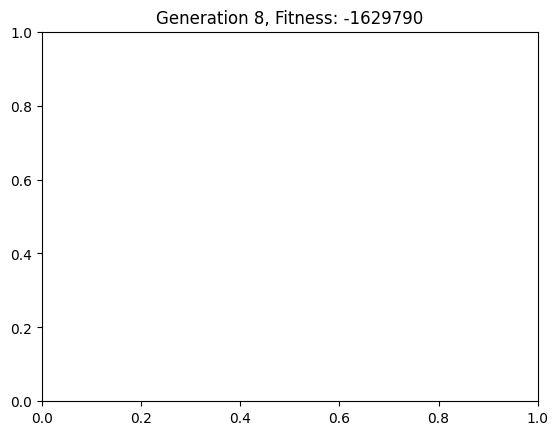

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


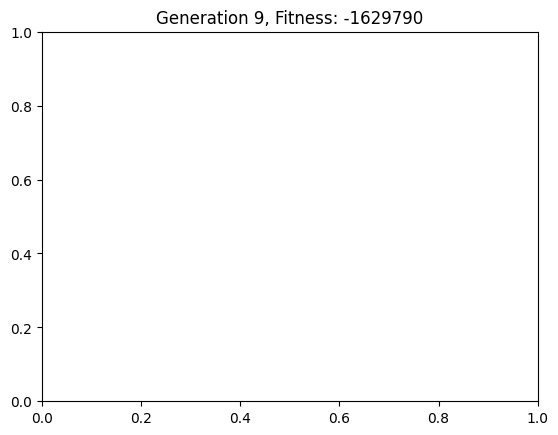

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


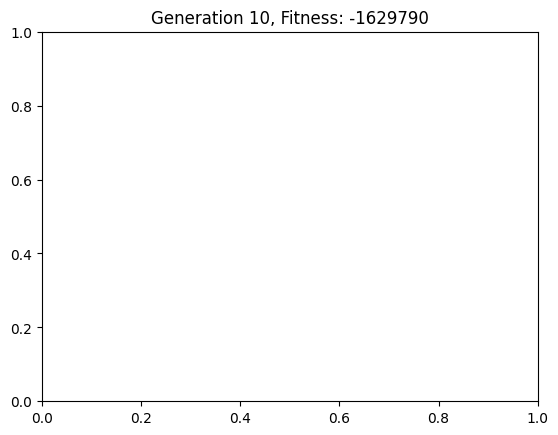

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


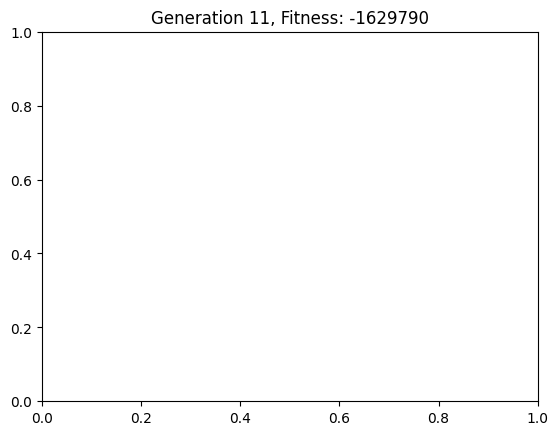

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (58, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': -1629790}


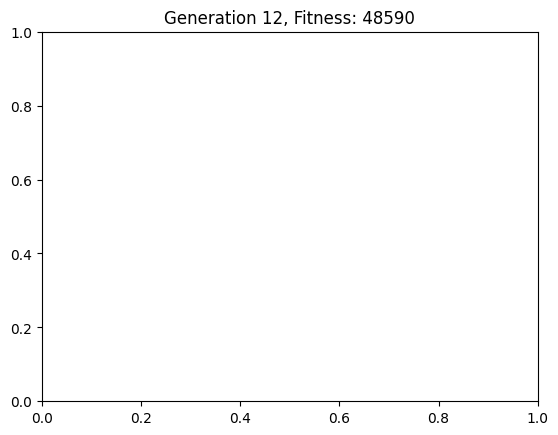

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (163, 102)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 407), 'size': (58, 42)}, {'name': 'Bedroom1', 'position': (626, 368), 'size': (38, 81)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (137, 80)}], 'fitness': 48590}


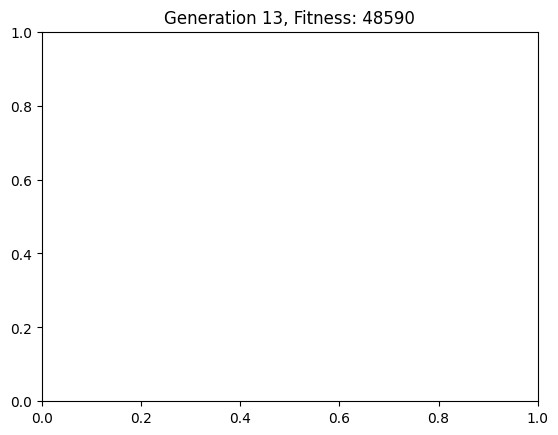

{'rooms': [{'name': 'Living Room', 'position': (447, 358), 'size': (164, 103)}, {'name': 'Passage', 'position': (611, 450), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 346), 'size': (59, 103)}, {'name': 'Bedroom1', 'position': (625, 368), 'size': (38, 82)}, {'name': 'Bedroom2', 'position': (473, 485), 'size': (138, 81)}], 'fitness': 48590}


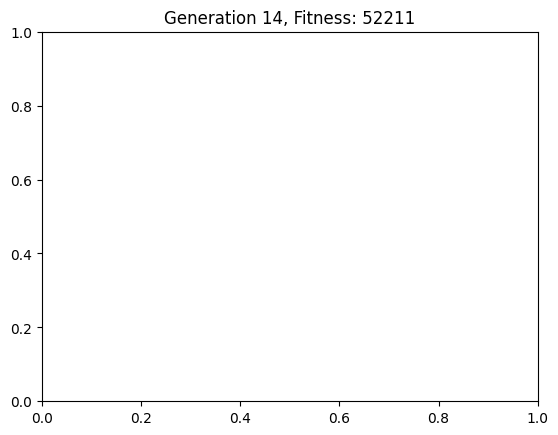

{'rooms': [{'name': 'Living Room', 'position': (446, 358), 'size': (165, 105)}, {'name': 'Bedroom1', 'position': (624, 366), 'size': (40, 83)}, {'name': 'Bedroom2', 'position': (471, 485), 'size': (139, 84)}, {'name': 'Passage', 'position': (611, 450), 'size': (66, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (60, 113)}], 'fitness': 52211}


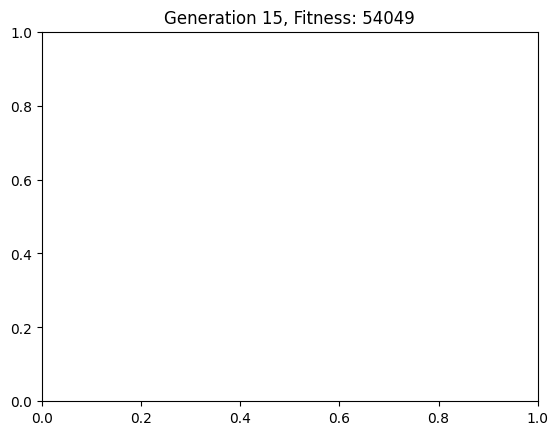

{'rooms': [{'name': 'Living Room', 'position': (446, 358), 'size': (165, 105)}, {'name': 'Bedroom1', 'position': (624, 366), 'size': (40, 83)}, {'name': 'Bedroom2', 'position': (471, 485), 'size': (139, 84)}, {'name': 'Passage', 'position': (611, 450), 'size': (66, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (60, 113)}], 'fitness': 54049}


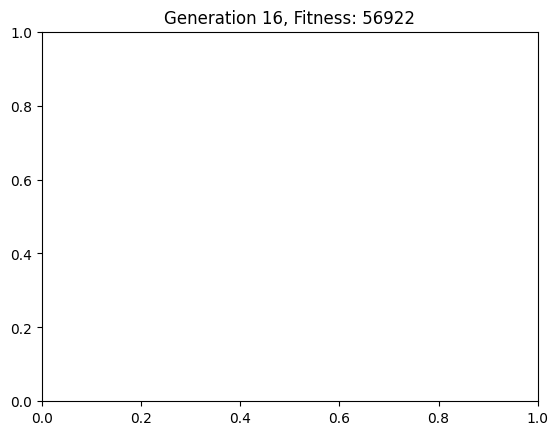

{'rooms': [{'name': 'Living Room', 'position': (443, 358), 'size': (168, 111)}, {'name': 'Bedroom1', 'position': (620, 363), 'size': (43, 87)}, {'name': 'Bedroom2', 'position': (468, 485), 'size': (143, 91)}, {'name': 'Passage', 'position': (611, 450), 'size': (66, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 343), 'size': (62, 106)}], 'fitness': 56922}


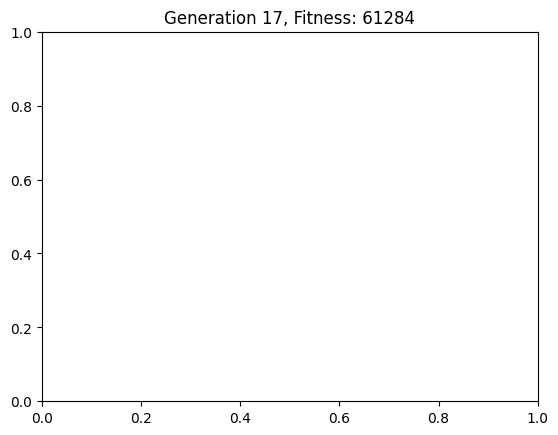

{'rooms': [{'name': 'Living Room', 'position': (432, 358), 'size': (173, 127)}, {'name': 'Bedroom1', 'position': (612, 355), 'size': (51, 95)}, {'name': 'Bedroom2', 'position': (457, 485), 'size': (148, 106)}, {'name': 'Passage', 'position': (605, 450), 'size': (71, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (66, 113)}], 'fitness': 61284}


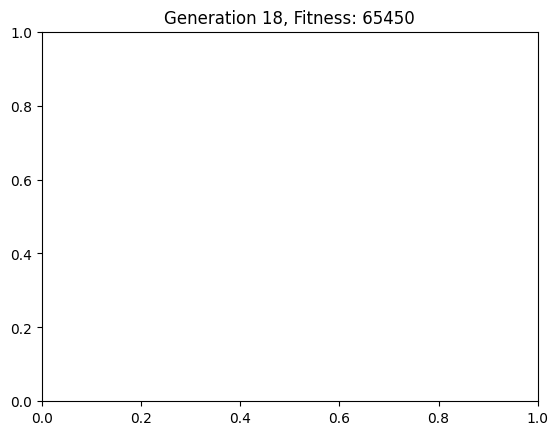

{'rooms': [{'name': 'Living Room', 'position': (427, 352), 'size': (176, 129)}, {'name': 'Bedroom1', 'position': (608, 351), 'size': (55, 99)}, {'name': 'Bedroom2', 'position': (452, 482), 'size': (151, 109)}, {'name': 'Passage', 'position': (603, 450), 'size': (74, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (67, 114)}], 'fitness': 65450}


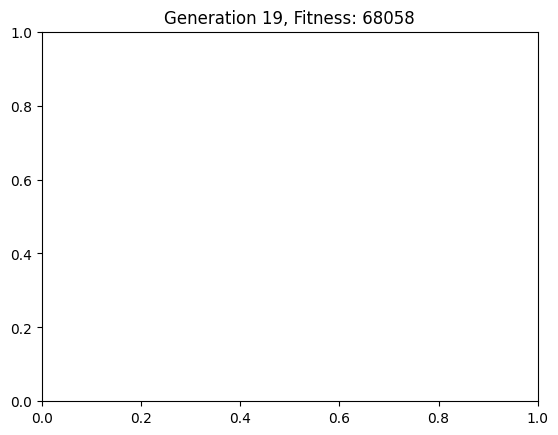

{'rooms': [{'name': 'Living Room', 'position': (421, 347), 'size': (178, 132)}, {'name': 'Bedroom1', 'position': (604, 347), 'size': (59, 103)}, {'name': 'Bedroom2', 'position': (446, 479), 'size': (153, 111)}, {'name': 'Passage', 'position': (600, 450), 'size': (77, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 339), 'size': (69, 111)}], 'fitness': 68058}


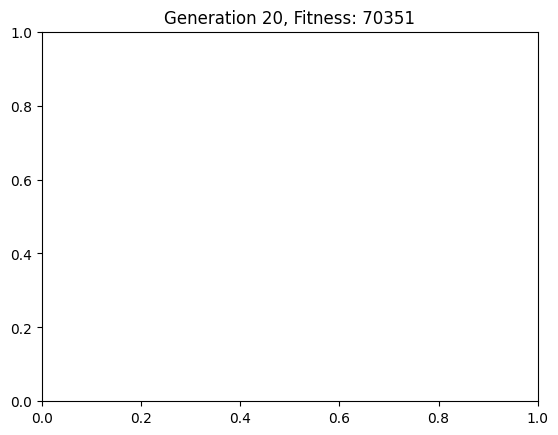

{'rooms': [{'name': 'Living Room', 'position': (416, 342), 'size': (181, 135)}, {'name': 'Bedroom1', 'position': (600, 343), 'size': (63, 107)}, {'name': 'Bedroom2', 'position': (441, 477), 'size': (156, 114)}, {'name': 'Passage', 'position': (597, 450), 'size': (79, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 339), 'size': (69, 111)}], 'fitness': 70351}


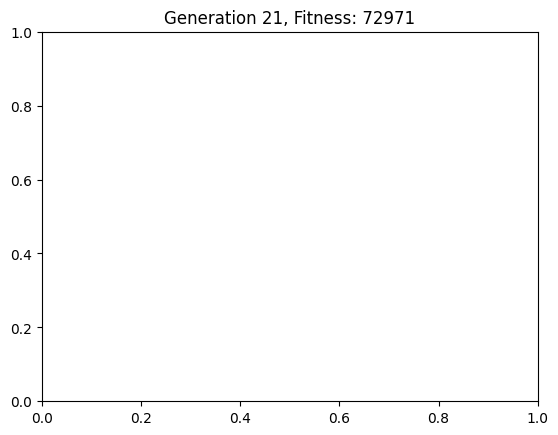

{'rooms': [{'name': 'Living Room', 'position': (411, 336), 'size': (184, 137)}, {'name': 'Bedroom1', 'position': (596, 339), 'size': (67, 111)}, {'name': 'Bedroom2', 'position': (436, 474), 'size': (159, 117)}, {'name': 'Passage', 'position': (595, 450), 'size': (82, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (70, 114)}], 'fitness': 72971}


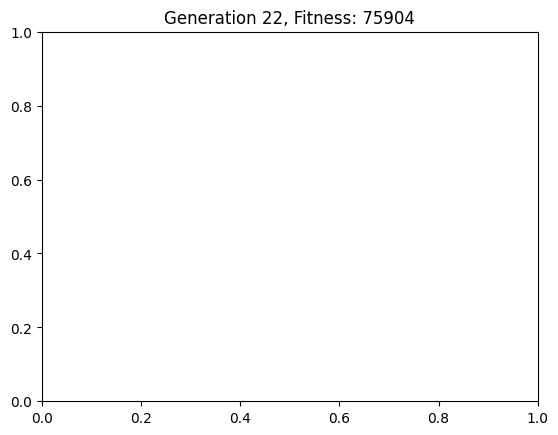

{'rooms': [{'name': 'Living Room', 'position': (405, 331), 'size': (186, 140)}, {'name': 'Bedroom1', 'position': (592, 336), 'size': (71, 114)}, {'name': 'Bedroom2', 'position': (430, 471), 'size': (161, 119)}, {'name': 'Passage', 'position': (592, 450), 'size': (85, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 75904}


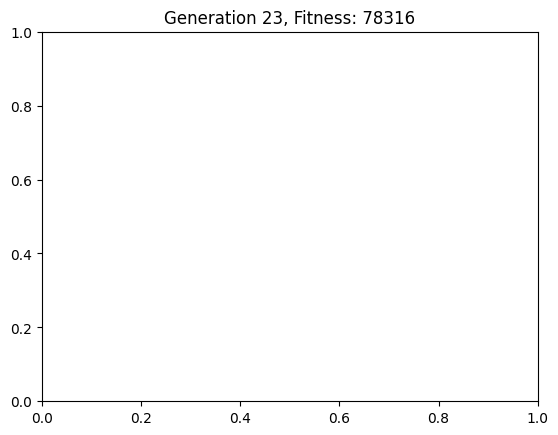

{'rooms': [{'name': 'Living Room', 'position': (400, 326), 'size': (189, 143)}, {'name': 'Bedroom1', 'position': (589, 336), 'size': (74, 114)}, {'name': 'Bedroom2', 'position': (425, 469), 'size': (164, 122)}, {'name': 'Passage', 'position': (589, 450), 'size': (87, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 78316}


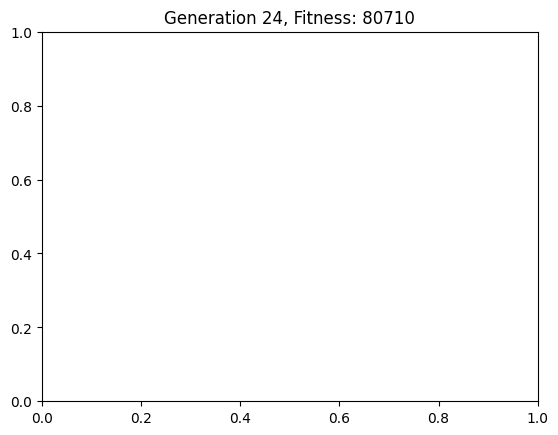

{'rooms': [{'name': 'Living Room', 'position': (395, 320), 'size': (192, 145)}, {'name': 'Bedroom1', 'position': (587, 336), 'size': (77, 114)}, {'name': 'Bedroom2', 'position': (420, 466), 'size': (167, 125)}, {'name': 'Passage', 'position': (587, 450), 'size': (90, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 80710}


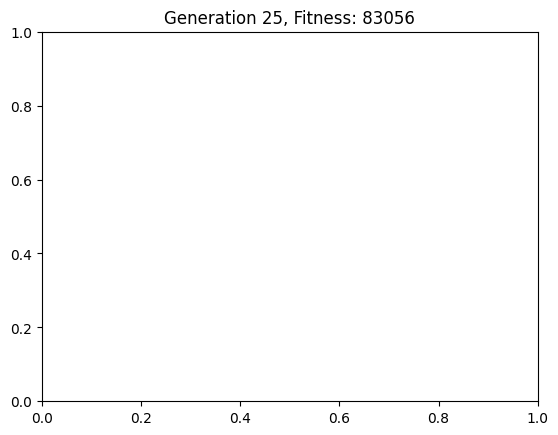

{'rooms': [{'name': 'Living Room', 'position': (389, 315), 'size': (194, 148)}, {'name': 'Bedroom1', 'position': (584, 336), 'size': (80, 114)}, {'name': 'Bedroom2', 'position': (414, 463), 'size': (169, 127)}, {'name': 'Passage', 'position': (584, 450), 'size': (93, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 83056}


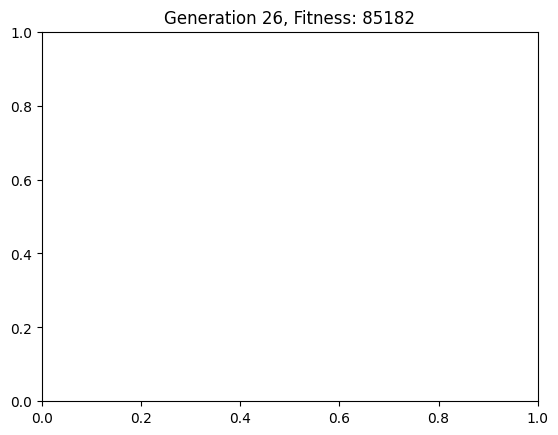

{'rooms': [{'name': 'Living Room', 'position': (384, 310), 'size': (197, 151)}, {'name': 'Bedroom1', 'position': (581, 336), 'size': (82, 114)}, {'name': 'Bedroom2', 'position': (409, 461), 'size': (172, 130)}, {'name': 'Passage', 'position': (581, 450), 'size': (95, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 85182}


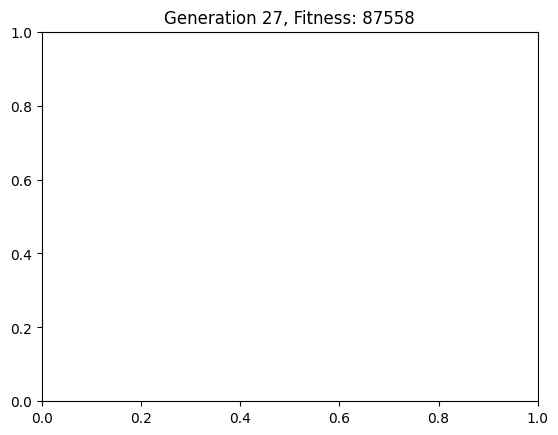

{'rooms': [{'name': 'Living Room', 'position': (379, 304), 'size': (200, 153)}, {'name': 'Bedroom1', 'position': (579, 336), 'size': (85, 114)}, {'name': 'Bedroom2', 'position': (404, 458), 'size': (175, 133)}, {'name': 'Passage', 'position': (579, 450), 'size': (98, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 87558}


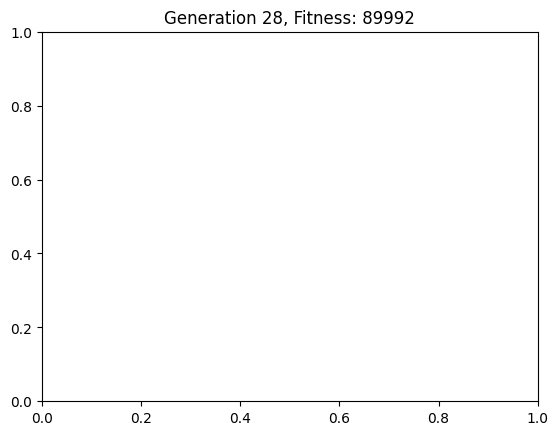

{'rooms': [{'name': 'Living Room', 'position': (373, 299), 'size': (202, 156)}, {'name': 'Bedroom1', 'position': (576, 336), 'size': (88, 114)}, {'name': 'Bedroom2', 'position': (398, 455), 'size': (177, 135)}, {'name': 'Passage', 'position': (576, 450), 'size': (101, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 89992}


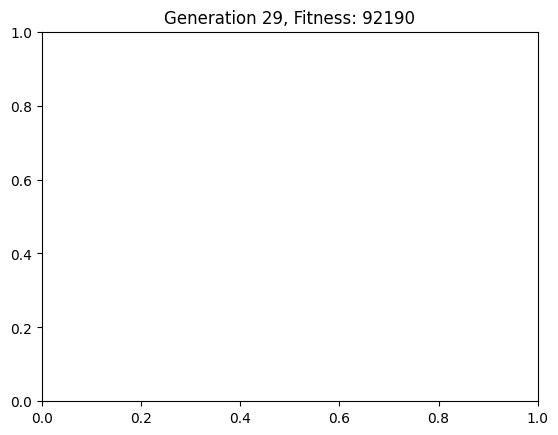

{'rooms': [{'name': 'Living Room', 'position': (368, 294), 'size': (205, 159)}, {'name': 'Bedroom1', 'position': (573, 336), 'size': (90, 114)}, {'name': 'Bedroom2', 'position': (393, 453), 'size': (180, 138)}, {'name': 'Passage', 'position': (573, 450), 'size': (103, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 92190}


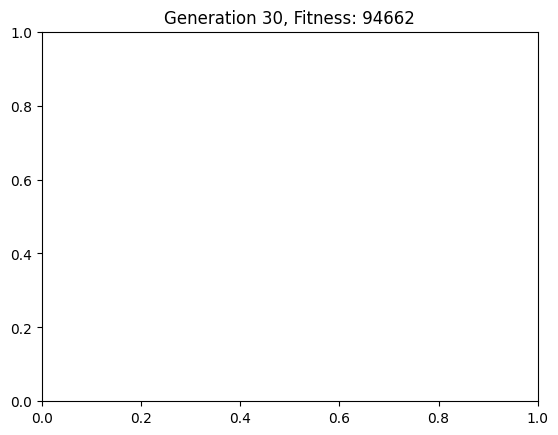

{'rooms': [{'name': 'Living Room', 'position': (363, 288), 'size': (208, 161)}, {'name': 'Bedroom1', 'position': (571, 336), 'size': (93, 114)}, {'name': 'Bedroom2', 'position': (388, 450), 'size': (183, 141)}, {'name': 'Passage', 'position': (571, 450), 'size': (106, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 94662}


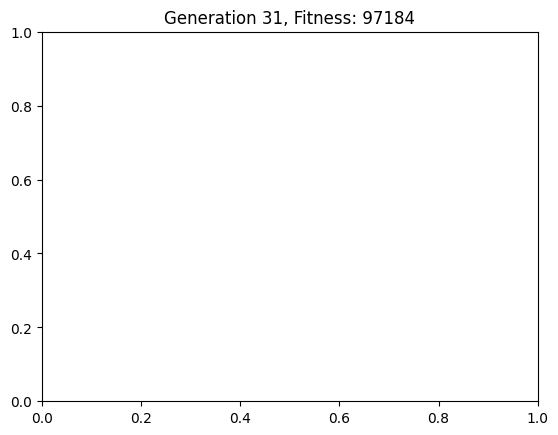

{'rooms': [{'name': 'Living Room', 'position': (359, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (568, 336), 'size': (95, 114)}, {'name': 'Bedroom2', 'position': (382, 449), 'size': (185, 142)}, {'name': 'Passage', 'position': (568, 450), 'size': (109, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 97184}


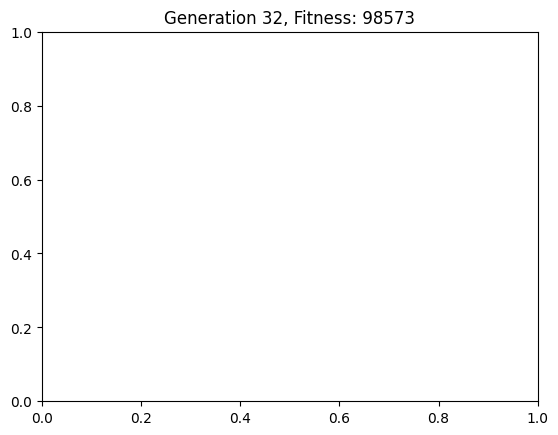

{'rooms': [{'name': 'Living Room', 'position': (357, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (566, 336), 'size': (98, 114)}, {'name': 'Bedroom2', 'position': (377, 449), 'size': (188, 142)}, {'name': 'Passage', 'position': (565, 450), 'size': (111, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 98573}


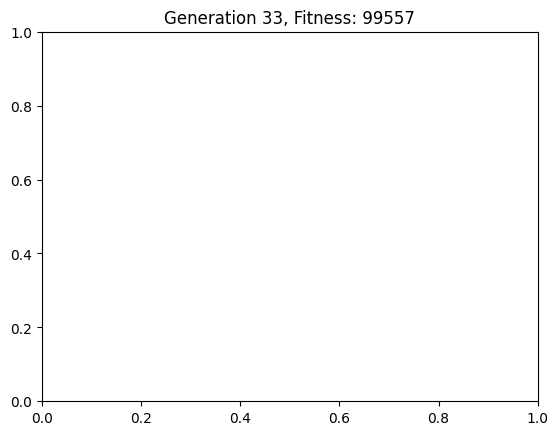

{'rooms': [{'name': 'Living Room', 'position': (354, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (563, 336), 'size': (101, 114)}, {'name': 'Bedroom2', 'position': (372, 449), 'size': (191, 142)}, {'name': 'Passage', 'position': (563, 450), 'size': (114, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 99557}


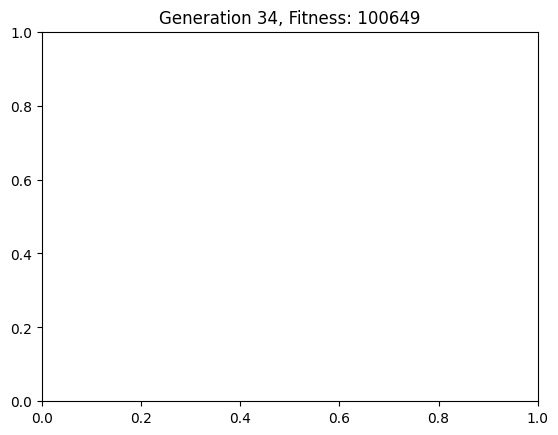

{'rooms': [{'name': 'Living Room', 'position': (351, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (560, 336), 'size': (103, 114)}, {'name': 'Bedroom2', 'position': (366, 449), 'size': (193, 142)}, {'name': 'Passage', 'position': (560, 450), 'size': (117, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 100649}


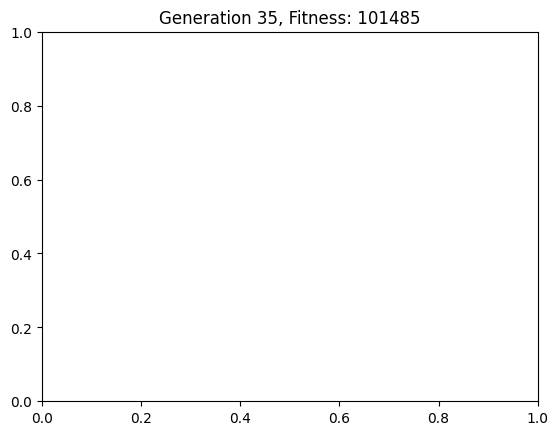

{'rooms': [{'name': 'Living Room', 'position': (349, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (558, 336), 'size': (106, 114)}, {'name': 'Bedroom2', 'position': (361, 449), 'size': (196, 142)}, {'name': 'Passage', 'position': (557, 450), 'size': (119, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 101485}


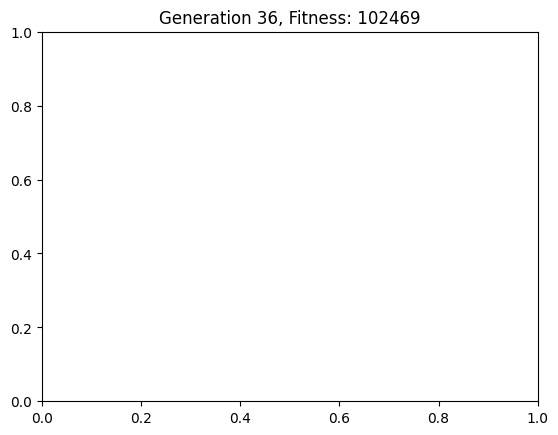

{'rooms': [{'name': 'Living Room', 'position': (346, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (555, 336), 'size': (109, 114)}, {'name': 'Bedroom2', 'position': (356, 449), 'size': (199, 142)}, {'name': 'Passage', 'position': (555, 450), 'size': (122, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 102469}


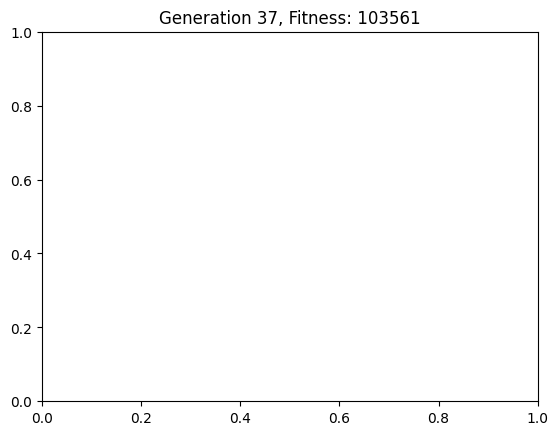

{'rooms': [{'name': 'Living Room', 'position': (343, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (552, 336), 'size': (111, 114)}, {'name': 'Bedroom2', 'position': (350, 449), 'size': (201, 142)}, {'name': 'Passage', 'position': (552, 450), 'size': (125, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 103561}


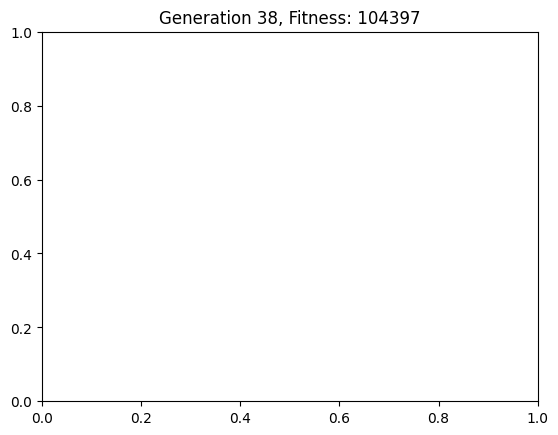

{'rooms': [{'name': 'Living Room', 'position': (341, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (550, 336), 'size': (114, 114)}, {'name': 'Bedroom2', 'position': (345, 449), 'size': (204, 142)}, {'name': 'Passage', 'position': (549, 450), 'size': (127, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 104397}


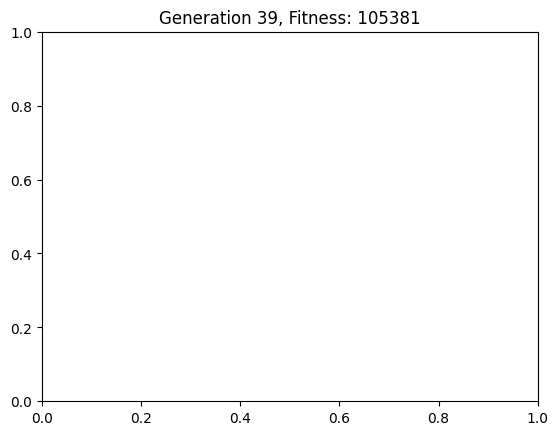

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (340, 449), 'size': (207, 142)}, {'name': 'Passage', 'position': (547, 450), 'size': (130, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 105381}


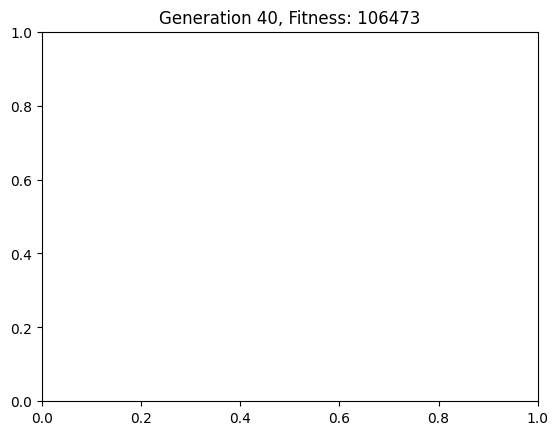

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106473}


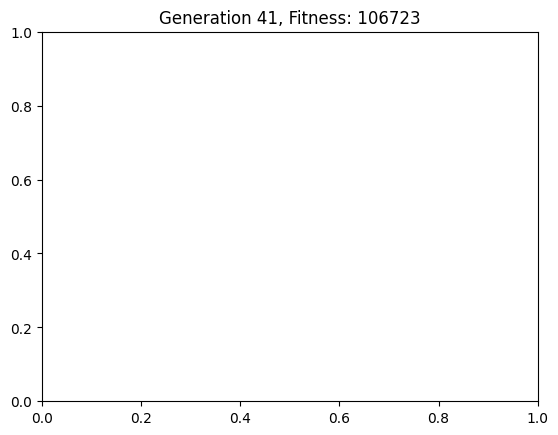

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


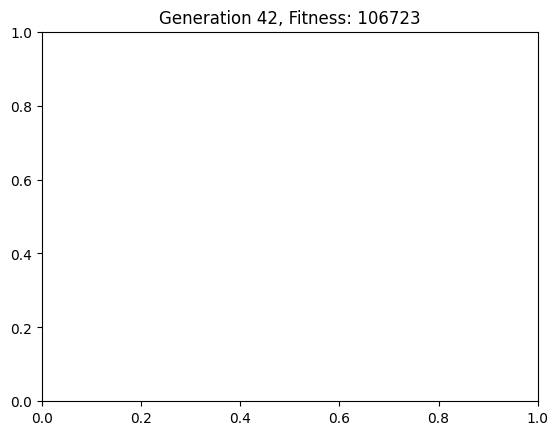

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


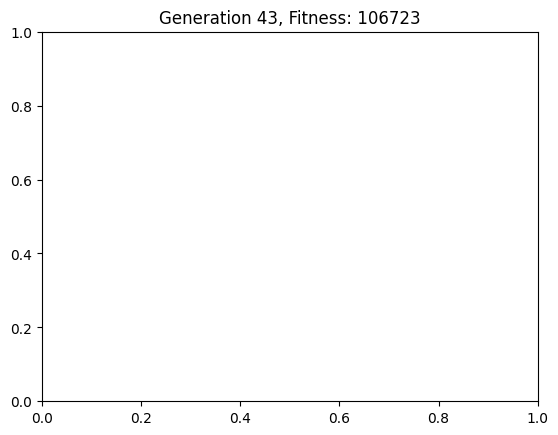

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


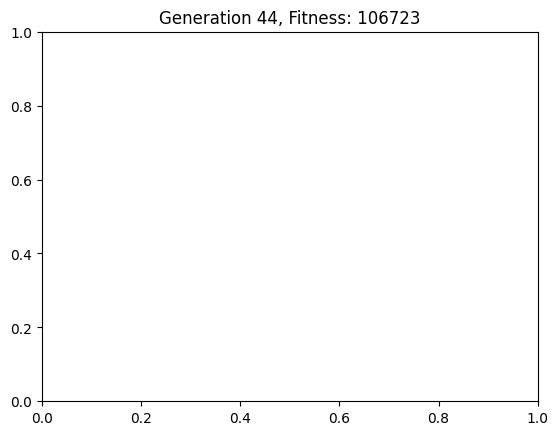

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


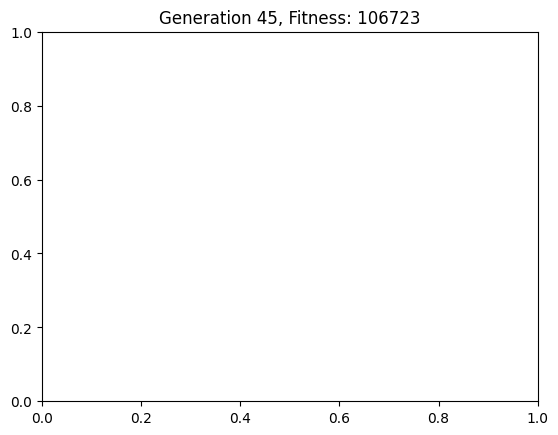

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


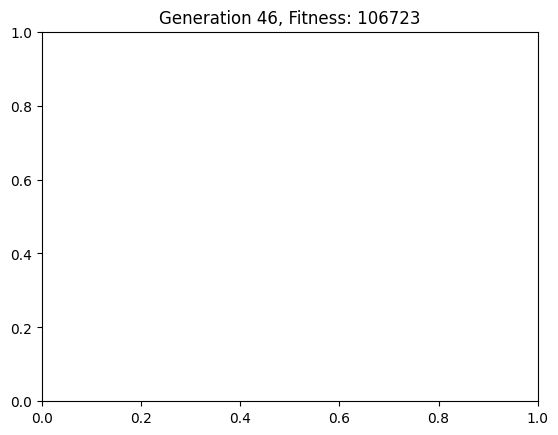

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


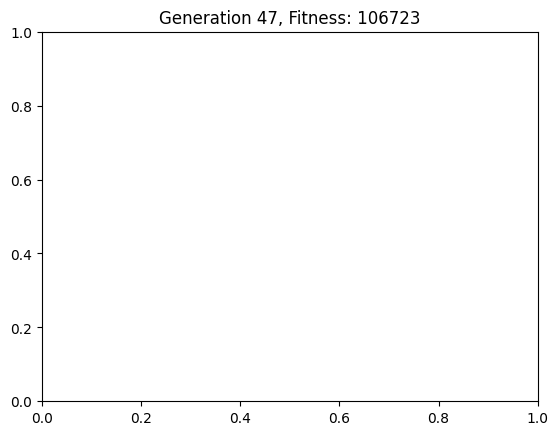

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


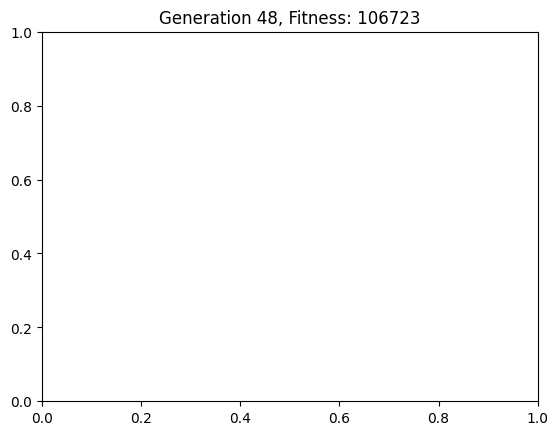

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}


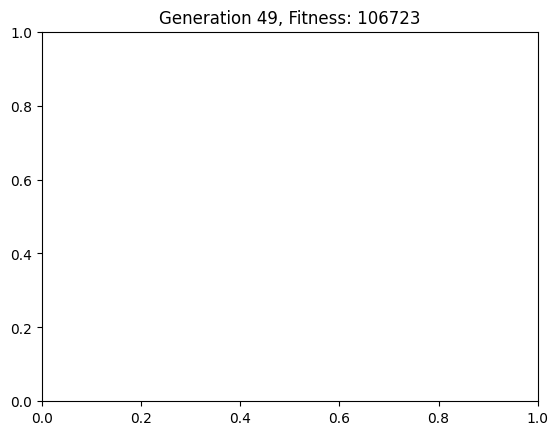

{'rooms': [{'name': 'Living Room', 'position': (338, 287), 'size': (209, 162)}, {'name': 'Bedroom1', 'position': (547, 336), 'size': (117, 114)}, {'name': 'Bedroom2', 'position': (338, 449), 'size': (208, 142)}, {'name': 'Passage', 'position': (546, 450), 'size': (131, 108)}, {'name': 'Kitchen', 'position': (677, 463), 'size': (115, 68)}, {'name': 'Washroom', 'position': (664, 336), 'size': (71, 113)}], 'fitness': 106723}
Elapsed time: 387.81 seconds


<Figure size 640x480 with 0 Axes>

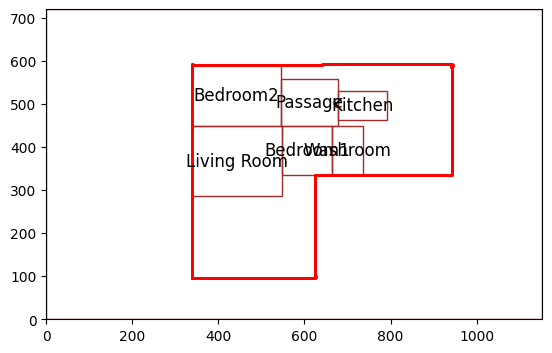

Elapsed time for initial population generation: 28.29 seconds


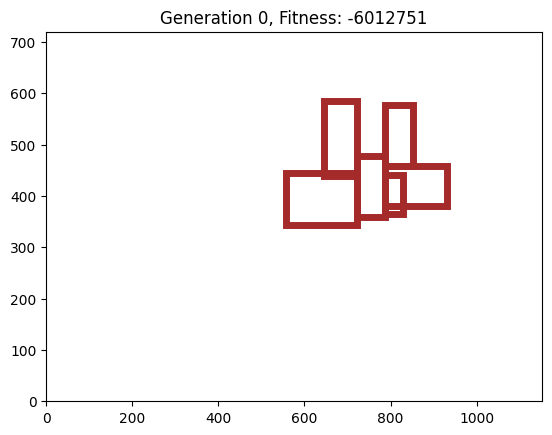

{'rooms': [{'name': 'Living Room', 'position': (558, 343), 'size': (163, 102)}, {'name': 'Passage', 'position': (722, 359), 'size': (65, 118)}, {'name': 'Kitchen', 'position': (788, 458), 'size': (65, 119)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (142, 78)}, {'name': 'Bedroom2', 'position': (646, 439), 'size': (75, 146)}], 'fitness': -6012751}


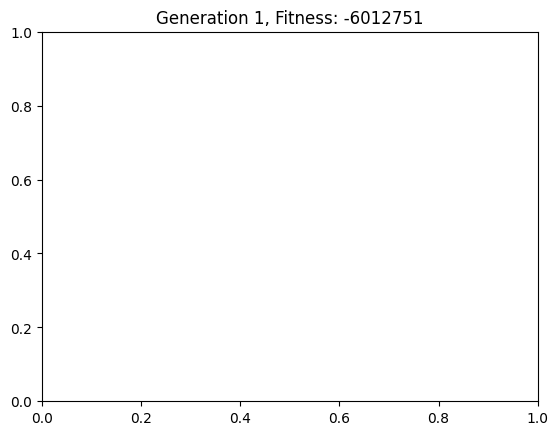

{'rooms': [{'name': 'Living Room', 'position': (558, 343), 'size': (163, 102)}, {'name': 'Passage', 'position': (721, 359), 'size': (66, 108)}, {'name': 'Kitchen', 'position': (788, 467), 'size': (67, 110)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (142, 78)}, {'name': 'Bedroom2', 'position': (646, 439), 'size': (75, 146)}], 'fitness': -6012751}


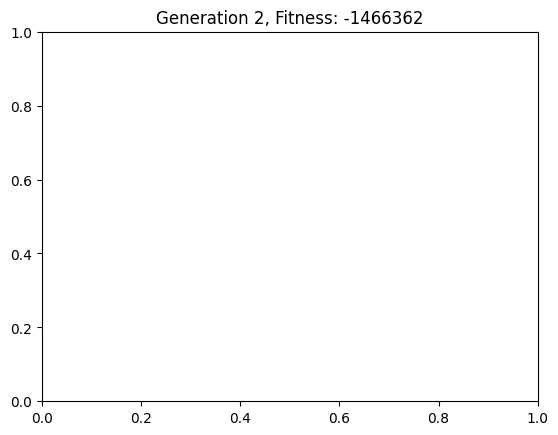

{'rooms': [{'name': 'Living Room', 'position': (558, 343), 'size': (163, 96)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (646, 439), 'size': (75, 140)}, {'name': 'Passage', 'position': (721, 359), 'size': (66, 108)}, {'name': 'Kitchen', 'position': (788, 467), 'size': (67, 110)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -1466362}


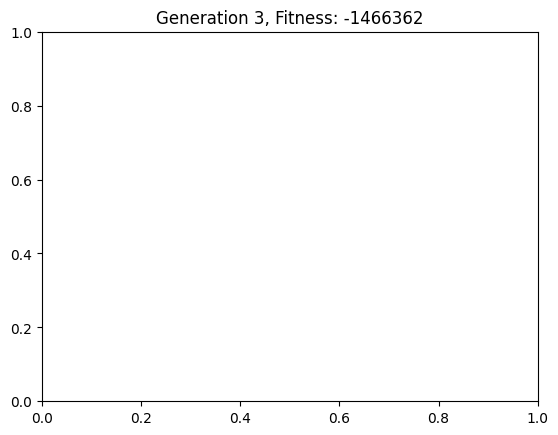

{'rooms': [{'name': 'Living Room', 'position': (557, 342), 'size': (163, 96)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (646, 439), 'size': (75, 140)}, {'name': 'Passage', 'position': (721, 359), 'size': (67, 108)}, {'name': 'Kitchen', 'position': (788, 444), 'size': (68, 133)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -1466362}


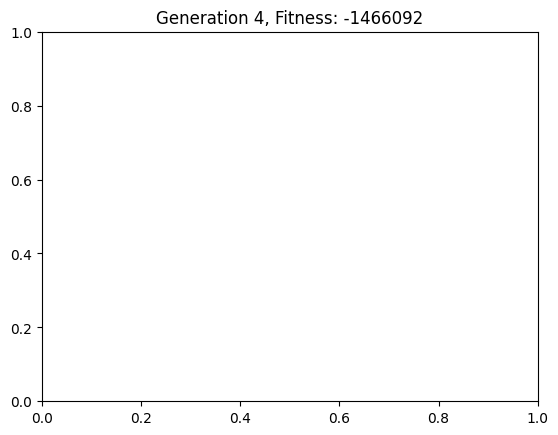

{'rooms': [{'name': 'Living Room', 'position': (557, 342), 'size': (163, 96)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (646, 439), 'size': (75, 140)}, {'name': 'Passage', 'position': (721, 359), 'size': (67, 108)}, {'name': 'Kitchen', 'position': (788, 444), 'size': (68, 133)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 40)}], 'fitness': -1466092}


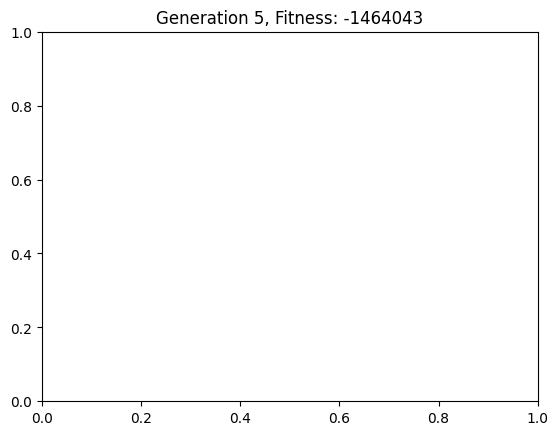

{'rooms': [{'name': 'Living Room', 'position': (552, 338), 'size': (166, 100)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (642, 439), 'size': (78, 147)}, {'name': 'Passage', 'position': (719, 359), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (788, 463), 'size': (77, 125)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -1464043}


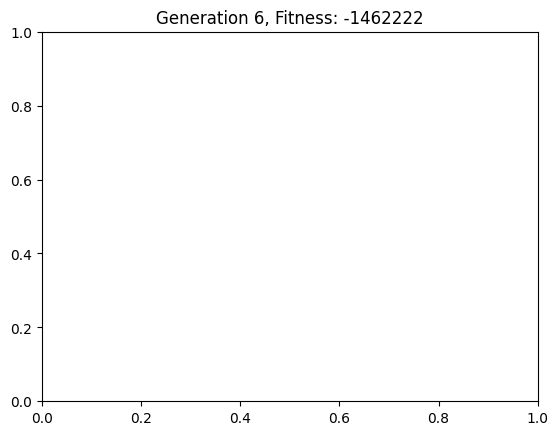

{'rooms': [{'name': 'Living Room', 'position': (549, 336), 'size': (169, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (642, 439), 'size': (79, 148)}, {'name': 'Passage', 'position': (719, 359), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (80, 129)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -1462222}


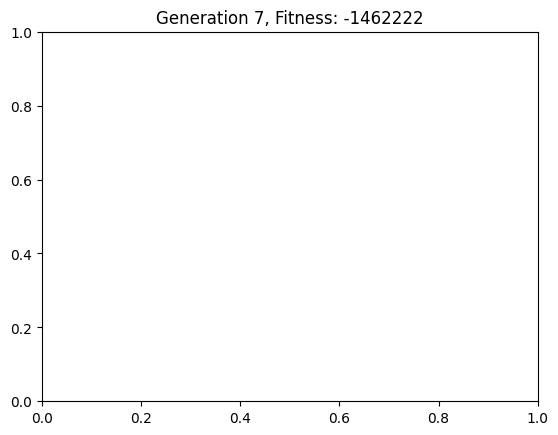

{'rooms': [{'name': 'Living Room', 'position': (547, 336), 'size': (171, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (638, 439), 'size': (81, 152)}, {'name': 'Passage', 'position': (719, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (84, 149)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -1572245}


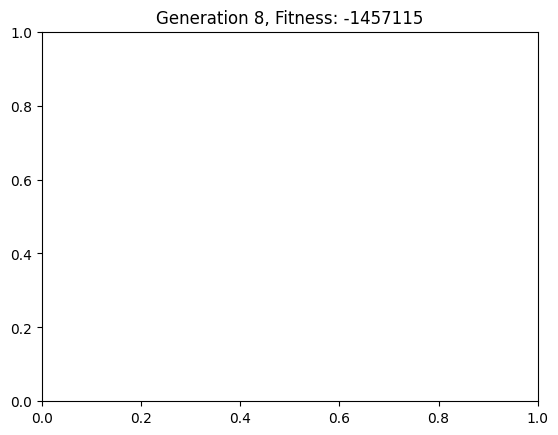

{'rooms': [{'name': 'Living Room', 'position': (543, 336), 'size': (175, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (100, 18)}, {'name': 'Bedroom2', 'position': (634, 439), 'size': (85, 152)}, {'name': 'Passage', 'position': (719, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (87, 143)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -1457115}


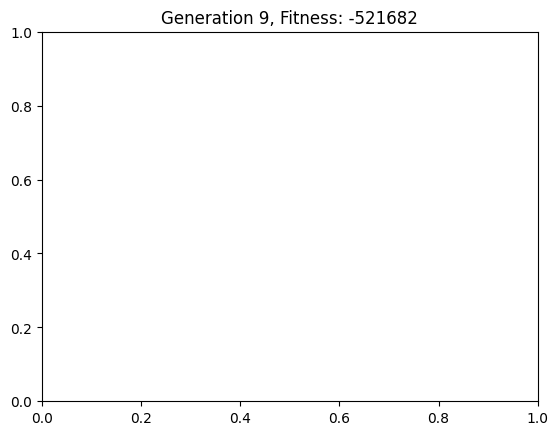

{'rooms': [{'name': 'Living Room', 'position': (543, 336), 'size': (175, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (634, 439), 'size': (85, 152)}, {'name': 'Passage', 'position': (719, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (87, 143)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -521682}


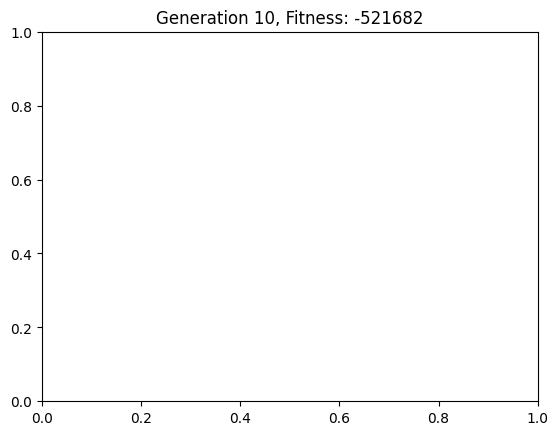

{'rooms': [{'name': 'Living Room', 'position': (543, 336), 'size': (176, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (633, 439), 'size': (85, 152)}, {'name': 'Passage', 'position': (719, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (87, 143)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -521682}


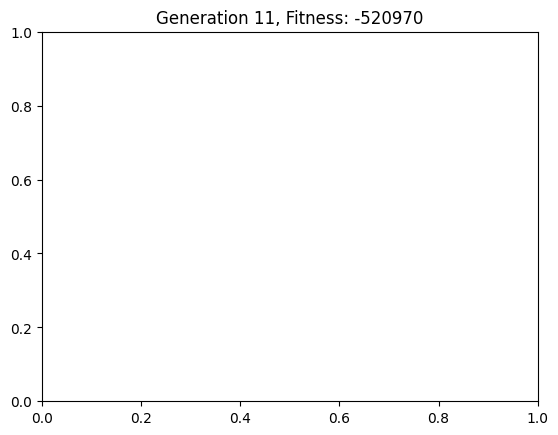

{'rooms': [{'name': 'Living Room', 'position': (541, 336), 'size': (177, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (632, 439), 'size': (87, 152)}, {'name': 'Passage', 'position': (719, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (92, 148)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -520970}


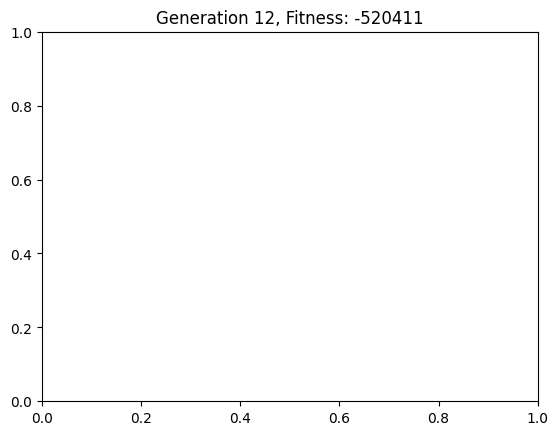

{'rooms': [{'name': 'Living Room', 'position': (532, 336), 'size': (186, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (628, 439), 'size': (90, 152)}, {'name': 'Passage', 'position': (718, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (89, 148)}, {'name': 'Washroom', 'position': (788, 365), 'size': (42, 76)}], 'fitness': -520411}


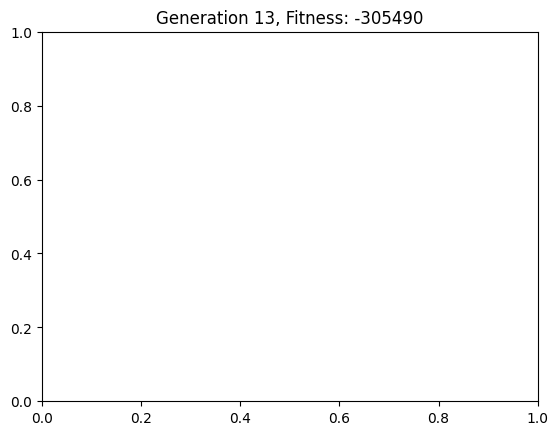

{'rooms': [{'name': 'Living Room', 'position': (532, 336), 'size': (186, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (628, 439), 'size': (90, 152)}, {'name': 'Passage', 'position': (718, 359), 'size': (69, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (89, 148)}, {'name': 'Washroom', 'position': (788, 365), 'size': (10, 76)}], 'fitness': -305490}


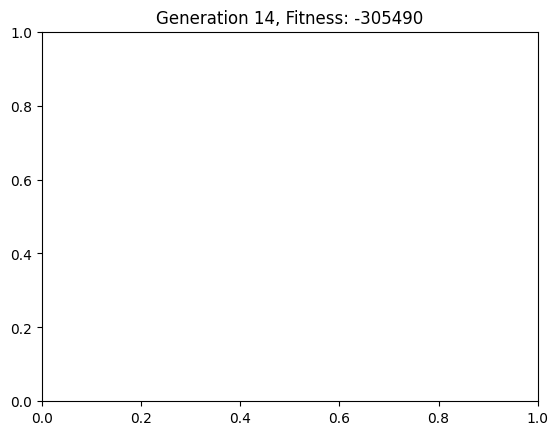

{'rooms': [{'name': 'Living Room', 'position': (532, 336), 'size': (186, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (628, 439), 'size': (90, 152)}, {'name': 'Passage', 'position': (718, 359), 'size': (70, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (89, 148)}, {'name': 'Washroom', 'position': (788, 422), 'size': (11, 19)}], 'fitness': -305490}


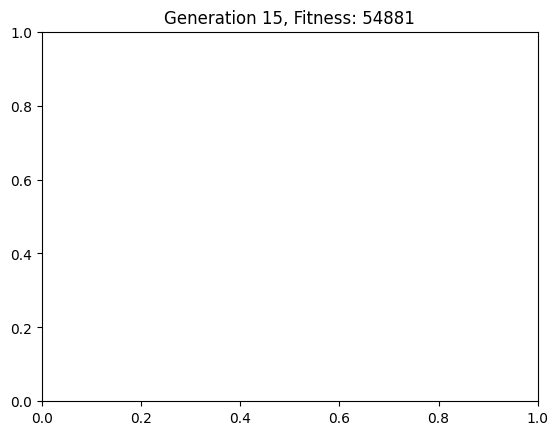

{'rooms': [{'name': 'Living Room', 'position': (520, 336), 'size': (191, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (614, 439), 'size': (97, 152)}, {'name': 'Passage', 'position': (717, 359), 'size': (71, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (89, 148)}, {'name': 'Washroom', 'position': (788, 418), 'size': (13, 23)}], 'fitness': 54881}


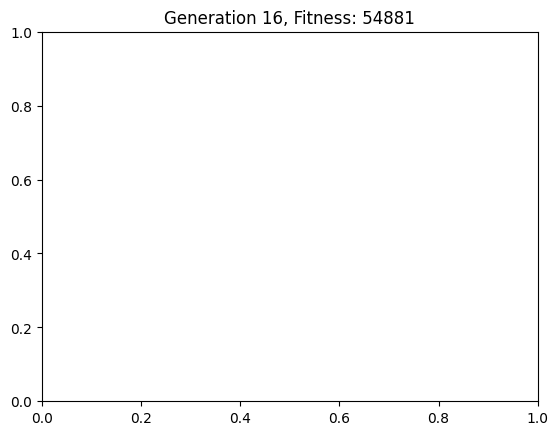

{'rooms': [{'name': 'Living Room', 'position': (518, 336), 'size': (193, 103)}, {'name': 'Bedroom1', 'position': (788, 381), 'size': (16, 18)}, {'name': 'Bedroom2', 'position': (612, 439), 'size': (99, 152)}, {'name': 'Passage', 'position': (716, 359), 'size': (72, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (89, 148)}, {'name': 'Washroom', 'position': (788, 412), 'size': (17, 30)}], 'fitness': -196674156}


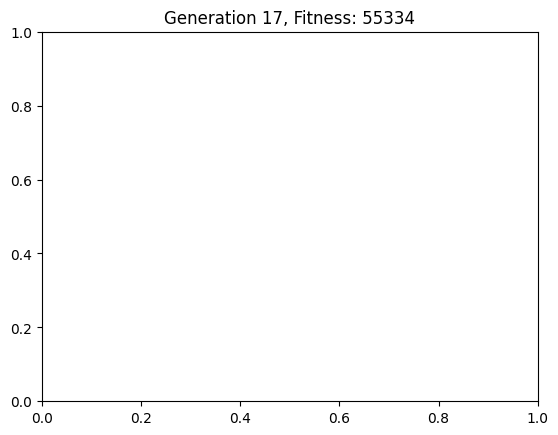

{'rooms': [{'name': 'Living Room', 'position': (522, 336), 'size': (190, 103)}, {'name': 'Bedroom1', 'position': (788, 378), 'size': (30, 29)}, {'name': 'Bedroom2', 'position': (618, 439), 'size': (94, 152)}, {'name': 'Passage', 'position': (713, 359), 'size': (75, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (89, 148)}, {'name': 'Washroom', 'position': (788, 408), 'size': (20, 32)}], 'fitness': 55334}


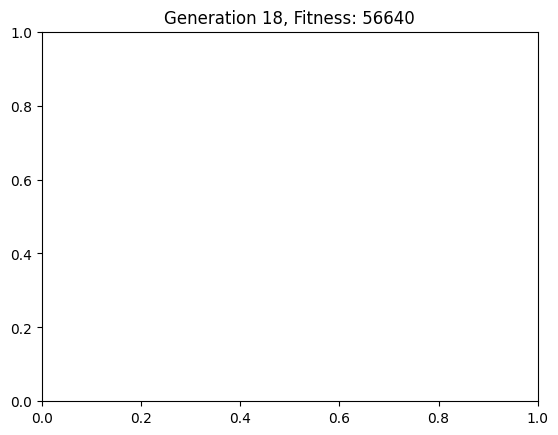

{'rooms': [{'name': 'Living Room', 'position': (517, 336), 'size': (193, 103)}, {'name': 'Bedroom1', 'position': (788, 374), 'size': (38, 33)}, {'name': 'Bedroom2', 'position': (613, 439), 'size': (97, 152)}, {'name': 'Passage', 'position': (710, 359), 'size': (77, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (90, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 56640}


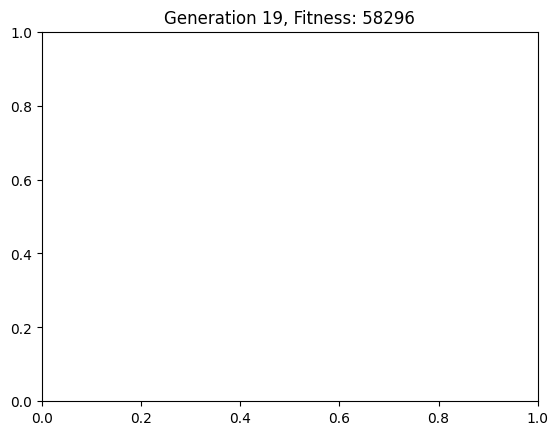

{'rooms': [{'name': 'Living Room', 'position': (512, 336), 'size': (196, 103)}, {'name': 'Bedroom1', 'position': (788, 370), 'size': (46, 37)}, {'name': 'Bedroom2', 'position': (608, 439), 'size': (100, 152)}, {'name': 'Passage', 'position': (708, 359), 'size': (80, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (92, 147)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 58296}


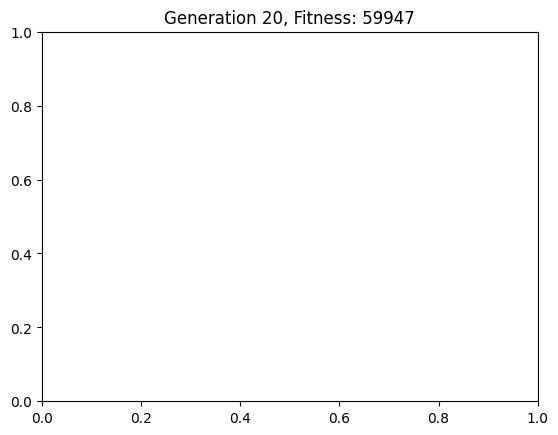

{'rooms': [{'name': 'Living Room', 'position': (506, 336), 'size': (198, 103)}, {'name': 'Bedroom1', 'position': (788, 366), 'size': (54, 41)}, {'name': 'Bedroom2', 'position': (602, 439), 'size': (102, 152)}, {'name': 'Passage', 'position': (705, 359), 'size': (83, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 59947}


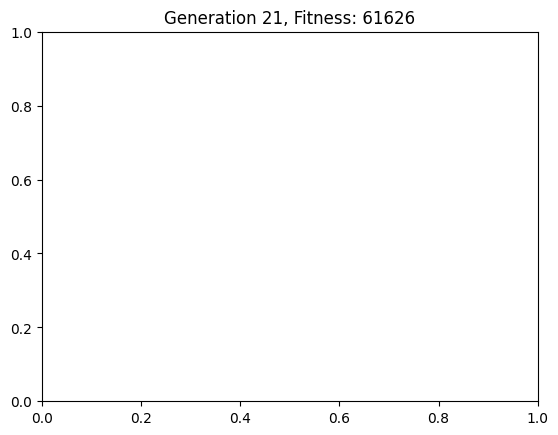

{'rooms': [{'name': 'Living Room', 'position': (501, 336), 'size': (201, 103)}, {'name': 'Bedroom1', 'position': (788, 362), 'size': (62, 45)}, {'name': 'Bedroom2', 'position': (597, 439), 'size': (105, 152)}, {'name': 'Passage', 'position': (702, 359), 'size': (85, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 61626}


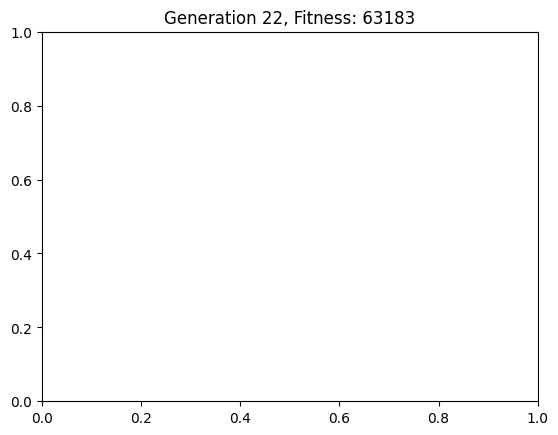

{'rooms': [{'name': 'Living Room', 'position': (496, 336), 'size': (204, 103)}, {'name': 'Bedroom1', 'position': (788, 358), 'size': (70, 49)}, {'name': 'Bedroom2', 'position': (592, 439), 'size': (108, 152)}, {'name': 'Passage', 'position': (700, 359), 'size': (88, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 63183}


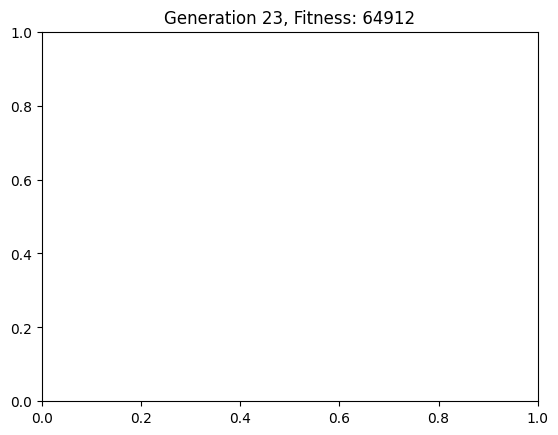

{'rooms': [{'name': 'Living Room', 'position': (490, 336), 'size': (206, 103)}, {'name': 'Bedroom1', 'position': (788, 354), 'size': (78, 53)}, {'name': 'Bedroom2', 'position': (586, 439), 'size': (110, 152)}, {'name': 'Passage', 'position': (697, 359), 'size': (91, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 64912}


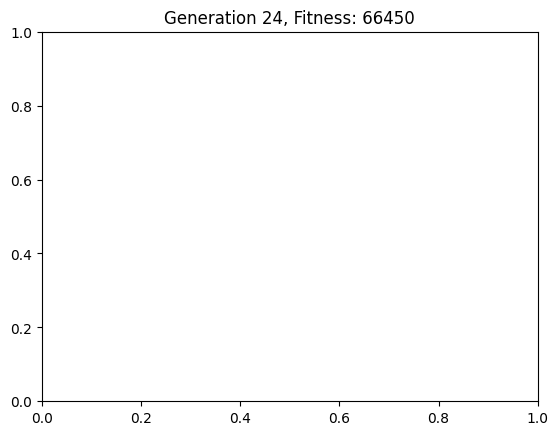

{'rooms': [{'name': 'Living Room', 'position': (485, 336), 'size': (209, 103)}, {'name': 'Bedroom1', 'position': (788, 350), 'size': (86, 57)}, {'name': 'Bedroom2', 'position': (581, 439), 'size': (113, 152)}, {'name': 'Passage', 'position': (694, 359), 'size': (93, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 66450}


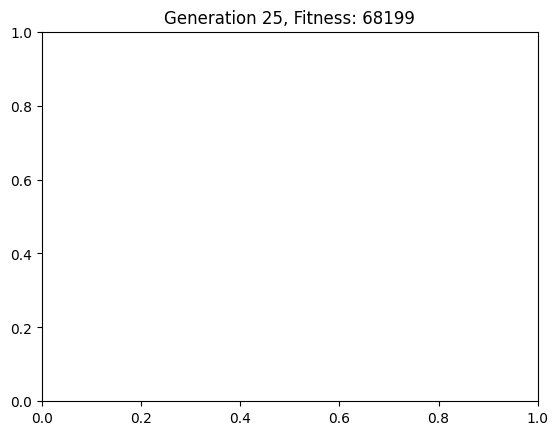

{'rooms': [{'name': 'Living Room', 'position': (480, 336), 'size': (212, 103)}, {'name': 'Bedroom1', 'position': (788, 346), 'size': (94, 61)}, {'name': 'Bedroom2', 'position': (576, 439), 'size': (116, 152)}, {'name': 'Passage', 'position': (692, 359), 'size': (96, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 68199}


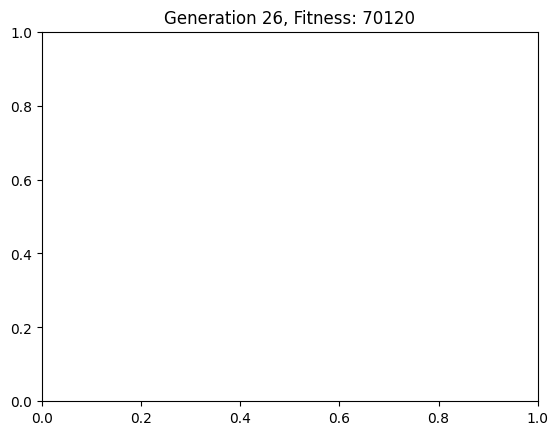

{'rooms': [{'name': 'Living Room', 'position': (474, 336), 'size': (214, 103)}, {'name': 'Bedroom1', 'position': (788, 342), 'size': (102, 65)}, {'name': 'Bedroom2', 'position': (570, 439), 'size': (118, 152)}, {'name': 'Passage', 'position': (689, 359), 'size': (99, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 70120}


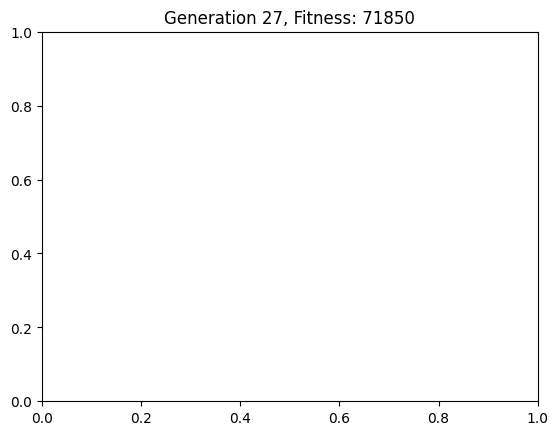

{'rooms': [{'name': 'Living Room', 'position': (469, 336), 'size': (217, 103)}, {'name': 'Bedroom1', 'position': (788, 338), 'size': (110, 69)}, {'name': 'Bedroom2', 'position': (565, 439), 'size': (121, 152)}, {'name': 'Passage', 'position': (686, 359), 'size': (101, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 71850}


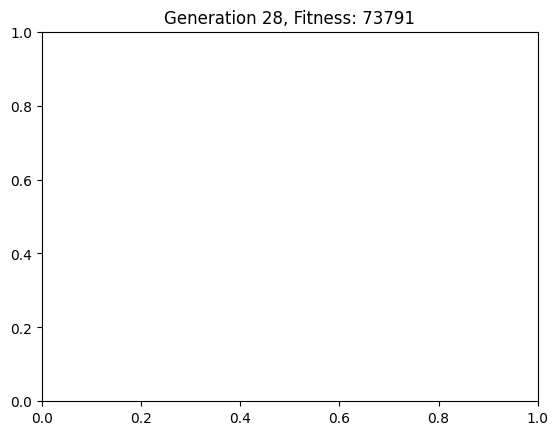

{'rooms': [{'name': 'Living Room', 'position': (464, 336), 'size': (220, 103)}, {'name': 'Bedroom1', 'position': (788, 336), 'size': (118, 72)}, {'name': 'Bedroom2', 'position': (560, 439), 'size': (124, 152)}, {'name': 'Passage', 'position': (684, 359), 'size': (104, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (93, 149)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 73791}


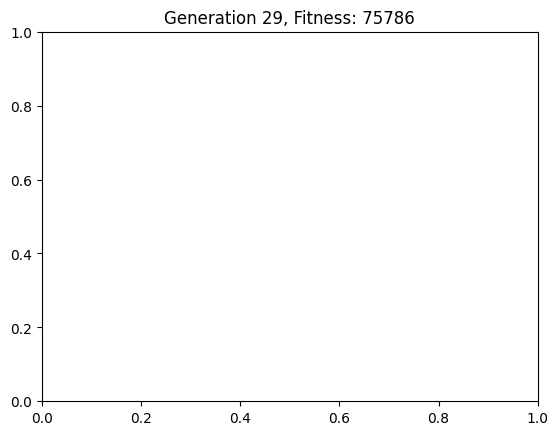

{'rooms': [{'name': 'Living Room', 'position': (458, 336), 'size': (222, 103)}, {'name': 'Bedroom1', 'position': (788, 336), 'size': (126, 72)}, {'name': 'Bedroom2', 'position': (554, 439), 'size': (126, 152)}, {'name': 'Passage', 'position': (681, 359), 'size': (107, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 75786}


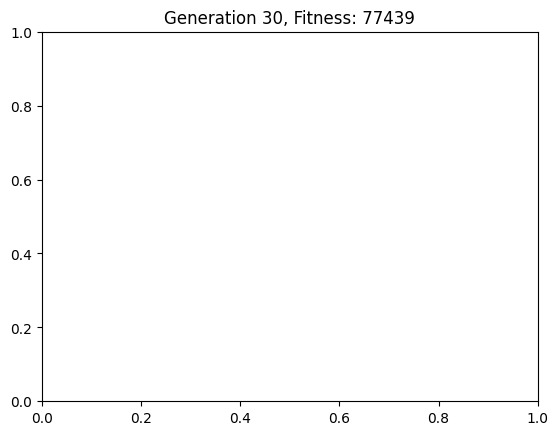

{'rooms': [{'name': 'Living Room', 'position': (453, 336), 'size': (225, 103)}, {'name': 'Bedroom1', 'position': (788, 336), 'size': (134, 72)}, {'name': 'Bedroom2', 'position': (549, 439), 'size': (129, 152)}, {'name': 'Passage', 'position': (678, 359), 'size': (109, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 77439}


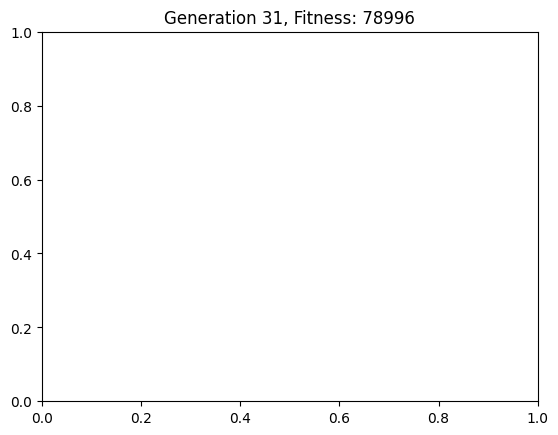

{'rooms': [{'name': 'Living Room', 'position': (448, 336), 'size': (228, 103)}, {'name': 'Bedroom1', 'position': (788, 336), 'size': (142, 72)}, {'name': 'Bedroom2', 'position': (544, 439), 'size': (132, 152)}, {'name': 'Passage', 'position': (676, 359), 'size': (112, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 78996}


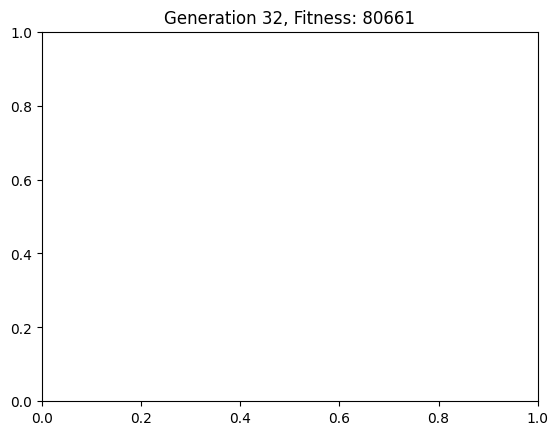

{'rooms': [{'name': 'Living Room', 'position': (442, 336), 'size': (230, 103)}, {'name': 'Bedroom1', 'position': (788, 336), 'size': (150, 72)}, {'name': 'Bedroom2', 'position': (538, 439), 'size': (134, 152)}, {'name': 'Passage', 'position': (673, 359), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 80661}


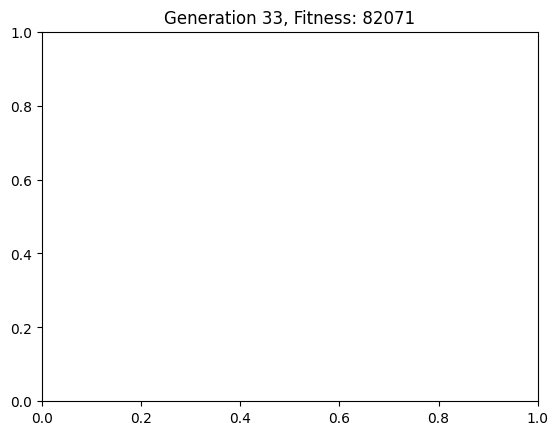

{'rooms': [{'name': 'Living Room', 'position': (437, 336), 'size': (233, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (533, 439), 'size': (137, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 82071}


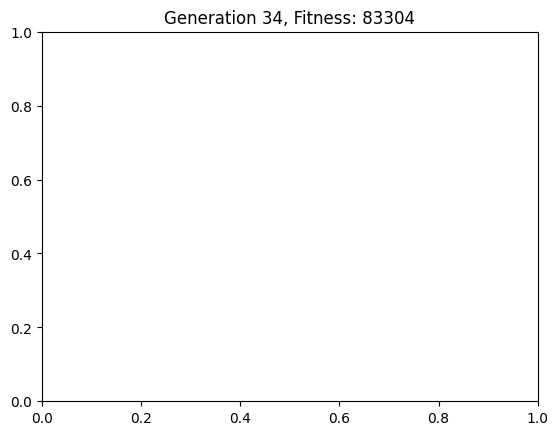

{'rooms': [{'name': 'Living Room', 'position': (433, 336), 'size': (237, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (529, 439), 'size': (141, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 83304}


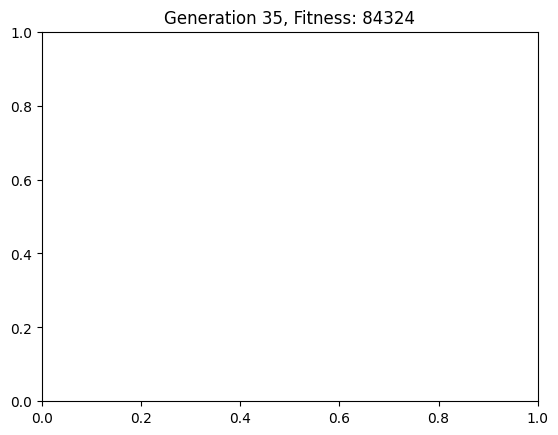

{'rooms': [{'name': 'Living Room', 'position': (429, 336), 'size': (241, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (525, 439), 'size': (145, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 84324}


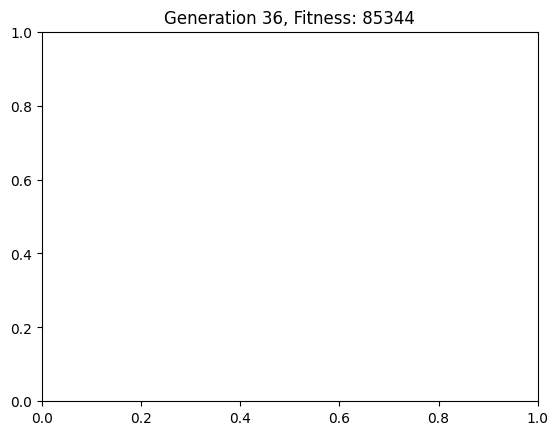

{'rooms': [{'name': 'Living Room', 'position': (425, 336), 'size': (245, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (521, 439), 'size': (149, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 85344}


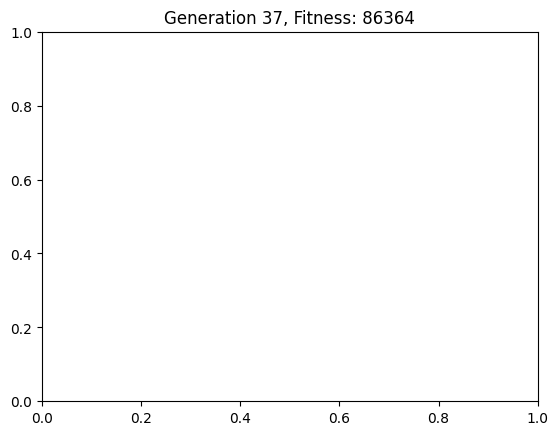

{'rooms': [{'name': 'Living Room', 'position': (421, 336), 'size': (249, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (517, 439), 'size': (153, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 86364}


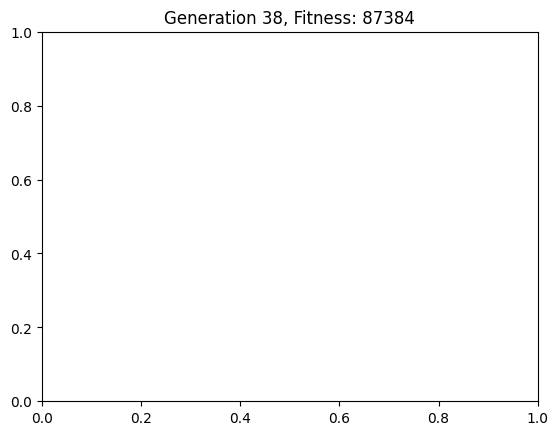

{'rooms': [{'name': 'Living Room', 'position': (417, 336), 'size': (253, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (513, 439), 'size': (157, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 87384}


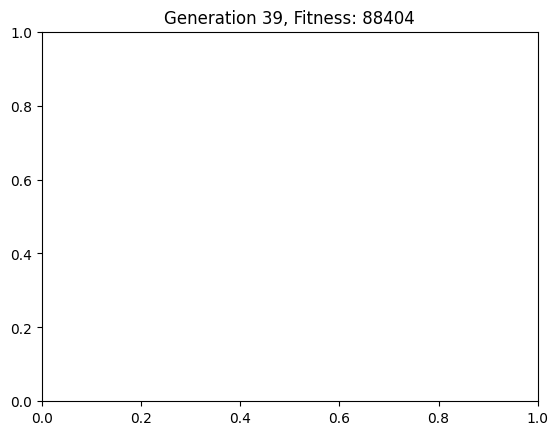

{'rooms': [{'name': 'Living Room', 'position': (413, 336), 'size': (257, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (509, 439), 'size': (161, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 88404}


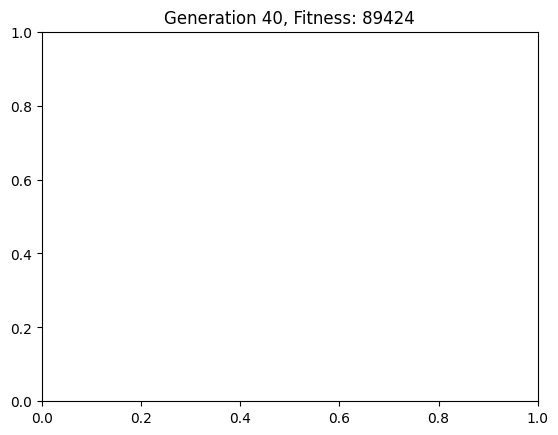

{'rooms': [{'name': 'Living Room', 'position': (409, 336), 'size': (261, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (505, 439), 'size': (165, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 89424}


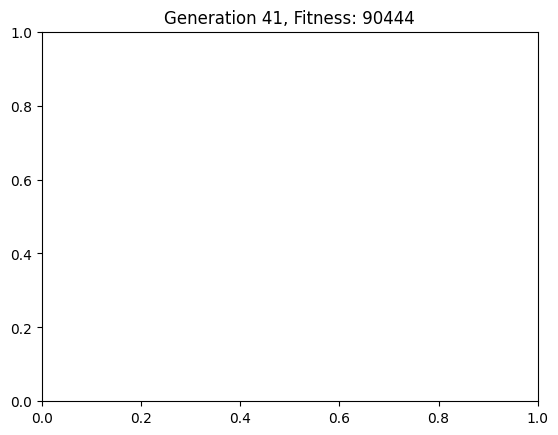

{'rooms': [{'name': 'Living Room', 'position': (405, 336), 'size': (265, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (501, 439), 'size': (169, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 90444}


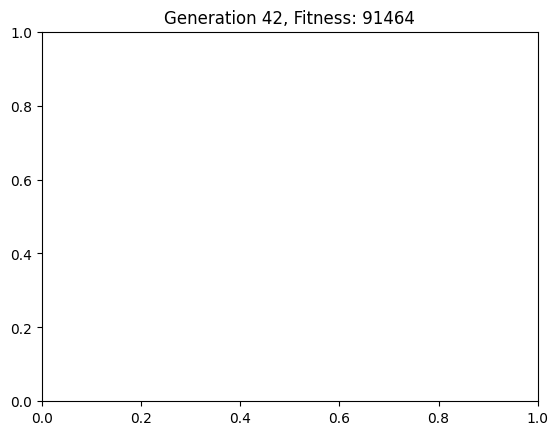

{'rooms': [{'name': 'Living Room', 'position': (401, 336), 'size': (269, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (497, 439), 'size': (173, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 91464}


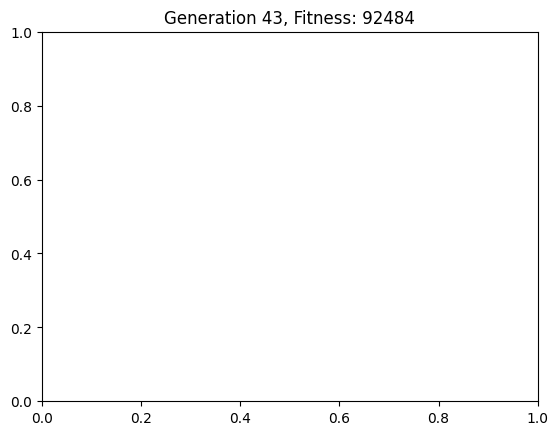

{'rooms': [{'name': 'Living Room', 'position': (397, 336), 'size': (273, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (493, 439), 'size': (177, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 92484}


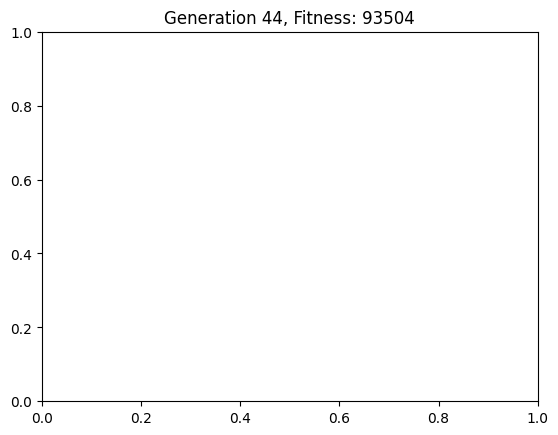

{'rooms': [{'name': 'Living Room', 'position': (393, 336), 'size': (277, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (489, 439), 'size': (181, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 93504}


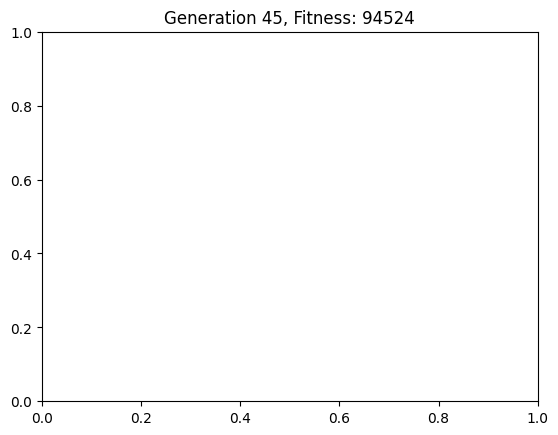

{'rooms': [{'name': 'Living Room', 'position': (389, 336), 'size': (281, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (485, 439), 'size': (185, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 94524}


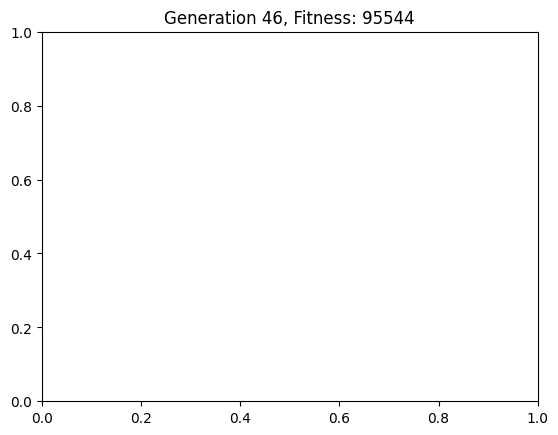

{'rooms': [{'name': 'Living Room', 'position': (385, 336), 'size': (285, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (481, 439), 'size': (189, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 95544}


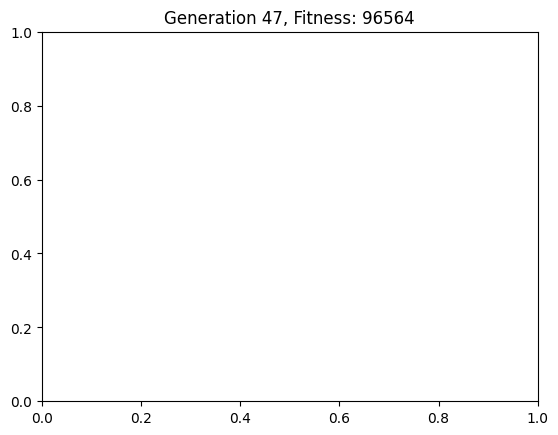

{'rooms': [{'name': 'Living Room', 'position': (381, 336), 'size': (289, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (477, 439), 'size': (193, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 96564}


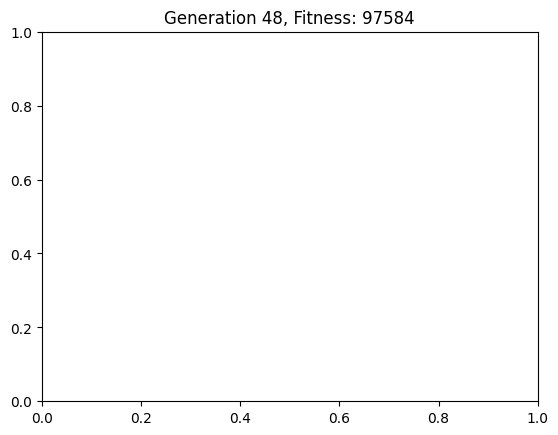

{'rooms': [{'name': 'Living Room', 'position': (377, 336), 'size': (293, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (473, 439), 'size': (197, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 97584}


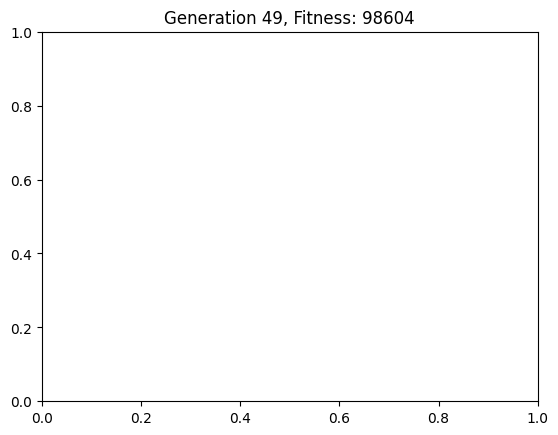

{'rooms': [{'name': 'Living Room', 'position': (373, 336), 'size': (297, 103)}, {'name': 'Bedroom1', 'position': (787, 336), 'size': (155, 72)}, {'name': 'Bedroom2', 'position': (469, 439), 'size': (201, 152)}, {'name': 'Passage', 'position': (671, 359), 'size': (116, 108)}, {'name': 'Kitchen', 'position': (788, 442), 'size': (94, 150)}, {'name': 'Washroom', 'position': (788, 408), 'size': (21, 33)}], 'fitness': 98604}
Elapsed time: 360.47 seconds


<Figure size 640x480 with 0 Axes>

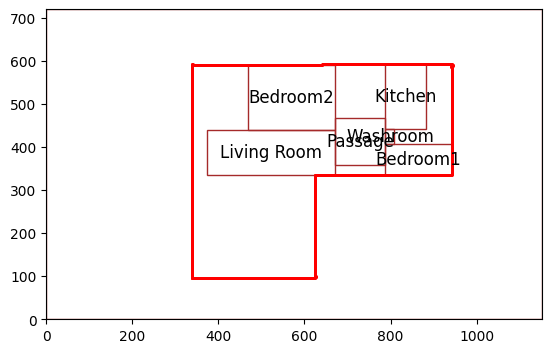

Elapsed time for initial population generation: 30.16 seconds


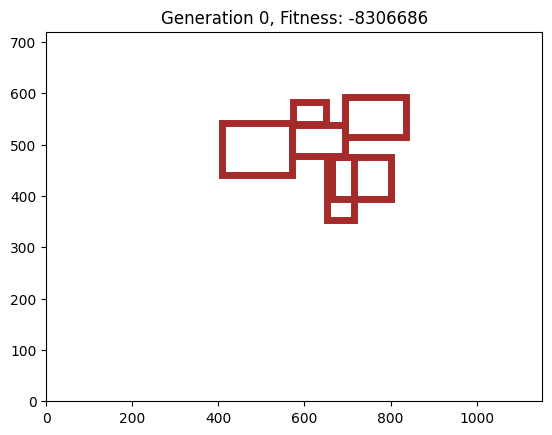

{'rooms': [{'name': 'Living Room', 'position': (408, 440), 'size': (163, 102)}, {'name': 'Passage', 'position': (572, 477), 'size': (122, 62)}, {'name': 'Kitchen', 'position': (653, 353), 'size': (63, 123)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}, {'name': 'Bedroom1', 'position': (695, 514), 'size': (141, 78)}, {'name': 'Bedroom2', 'position': (665, 394), 'size': (136, 82)}], 'fitness': -8306686}


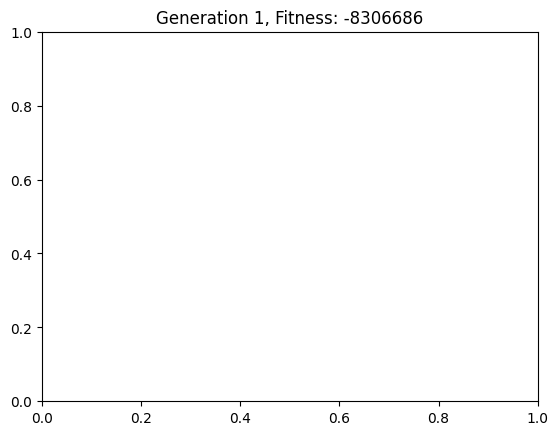

{'rooms': [{'name': 'Living Room', 'position': (407, 440), 'size': (164, 104)}, {'name': 'Passage', 'position': (571, 476), 'size': (123, 63)}, {'name': 'Kitchen', 'position': (653, 353), 'size': (63, 123)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}, {'name': 'Bedroom1', 'position': (695, 513), 'size': (143, 79)}, {'name': 'Bedroom2', 'position': (665, 394), 'size': (136, 82)}], 'fitness': -8306686}


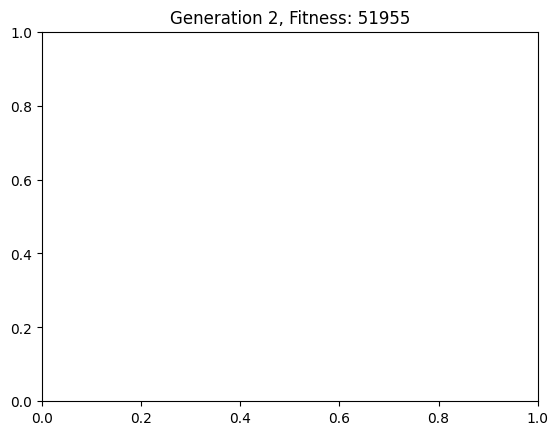

{'rooms': [{'name': 'Living Room', 'position': (407, 440), 'size': (164, 104)}, {'name': 'Bedroom1', 'position': (695, 513), 'size': (143, 79)}, {'name': 'Bedroom2', 'position': (665, 394), 'size': (136, 82)}, {'name': 'Passage', 'position': (571, 476), 'size': (123, 63)}, {'name': 'Kitchen', 'position': (653, 353), 'size': (12, 123)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 51955}


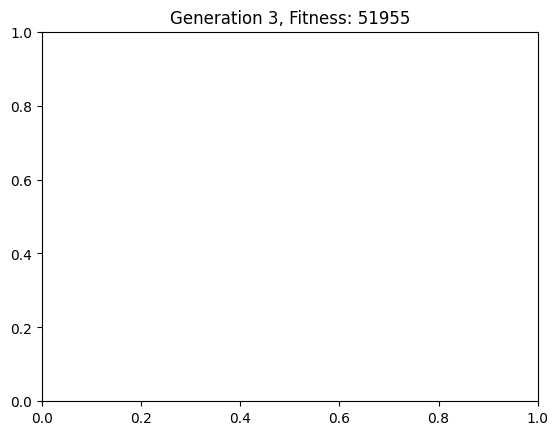

{'rooms': [{'name': 'Living Room', 'position': (406, 439), 'size': (164, 104)}, {'name': 'Bedroom1', 'position': (695, 512), 'size': (144, 79)}, {'name': 'Bedroom2', 'position': (665, 393), 'size': (137, 82)}, {'name': 'Passage', 'position': (571, 476), 'size': (124, 64)}, {'name': 'Kitchen', 'position': (652, 453), 'size': (13, 23)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 51955}


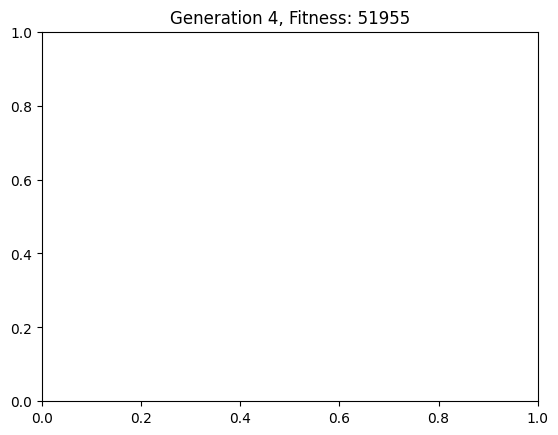

{'rooms': [{'name': 'Living Room', 'position': (405, 439), 'size': (165, 106)}, {'name': 'Bedroom1', 'position': (695, 511), 'size': (147, 81)}, {'name': 'Bedroom2', 'position': (665, 392), 'size': (139, 83)}, {'name': 'Passage', 'position': (570, 476), 'size': (124, 64)}, {'name': 'Kitchen', 'position': (649, 447), 'size': (16, 28)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 51126}


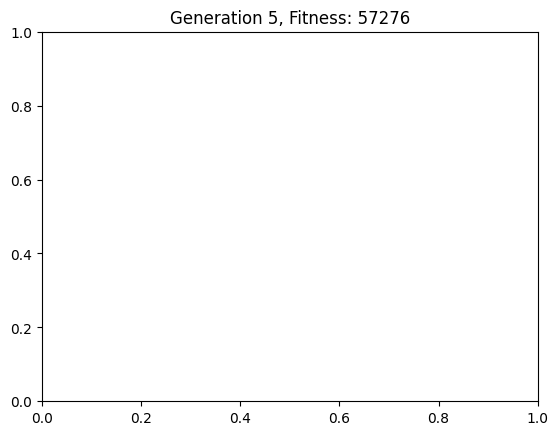

{'rooms': [{'name': 'Living Room', 'position': (396, 440), 'size': (169, 120)}, {'name': 'Bedroom1', 'position': (695, 505), 'size': (159, 87)}, {'name': 'Bedroom2', 'position': (665, 393), 'size': (137, 82)}, {'name': 'Passage', 'position': (566, 476), 'size': (129, 64)}, {'name': 'Kitchen', 'position': (649, 447), 'size': (16, 28)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 57276}


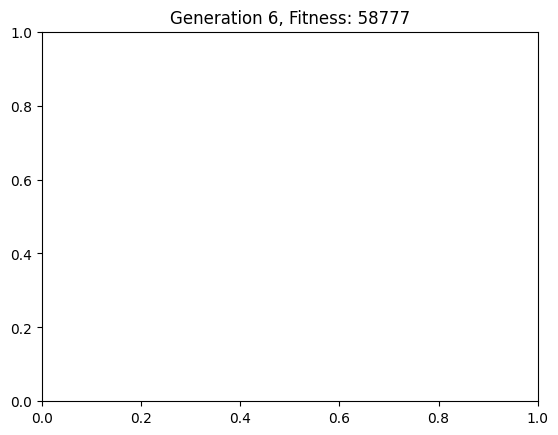

{'rooms': [{'name': 'Living Room', 'position': (393, 440), 'size': (171, 125)}, {'name': 'Bedroom1', 'position': (695, 502), 'size': (164, 89)}, {'name': 'Bedroom2', 'position': (665, 390), 'size': (142, 84)}, {'name': 'Passage', 'position': (564, 475), 'size': (130, 65)}, {'name': 'Kitchen', 'position': (635, 422), 'size': (30, 52)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 58777}


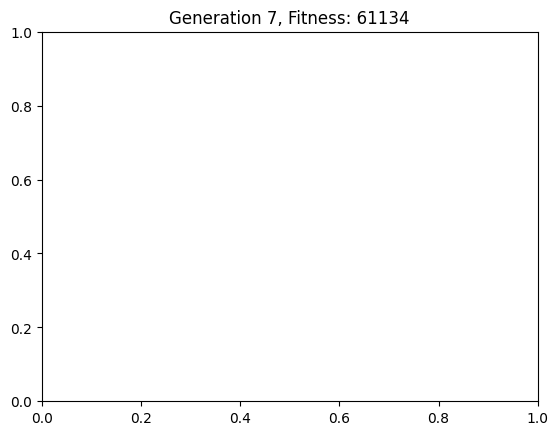

{'rooms': [{'name': 'Living Room', 'position': (393, 440), 'size': (171, 125)}, {'name': 'Bedroom1', 'position': (695, 502), 'size': (164, 89)}, {'name': 'Bedroom2', 'position': (665, 390), 'size': (142, 84)}, {'name': 'Passage', 'position': (564, 475), 'size': (130, 65)}, {'name': 'Kitchen', 'position': (635, 422), 'size': (30, 52)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 61134}


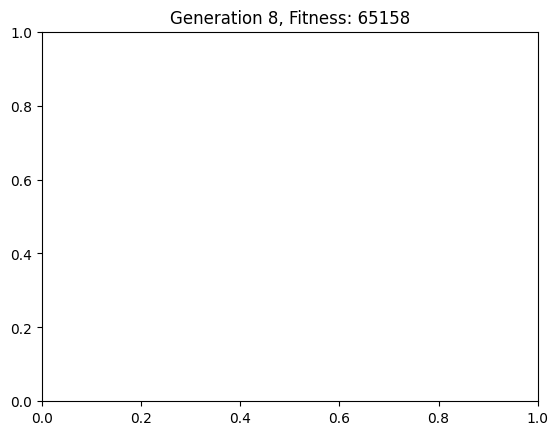

{'rooms': [{'name': 'Living Room', 'position': (389, 440), 'size': (173, 131)}, {'name': 'Bedroom1', 'position': (695, 500), 'size': (169, 92)}, {'name': 'Bedroom2', 'position': (665, 387), 'size': (147, 86)}, {'name': 'Passage', 'position': (562, 474), 'size': (132, 66)}, {'name': 'Kitchen', 'position': (628, 410), 'size': (37, 64)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 65158}


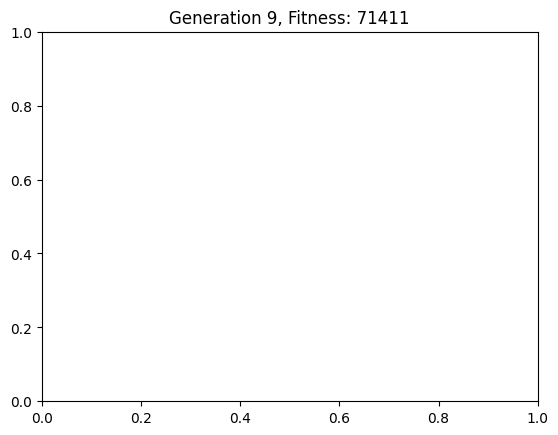

{'rooms': [{'name': 'Living Room', 'position': (378, 440), 'size': (178, 147)}, {'name': 'Bedroom1', 'position': (695, 492), 'size': (185, 100)}, {'name': 'Bedroom2', 'position': (665, 379), 'size': (163, 94)}, {'name': 'Passage', 'position': (557, 474), 'size': (138, 66)}, {'name': 'Kitchen', 'position': (612, 377), 'size': (53, 97)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 71411}


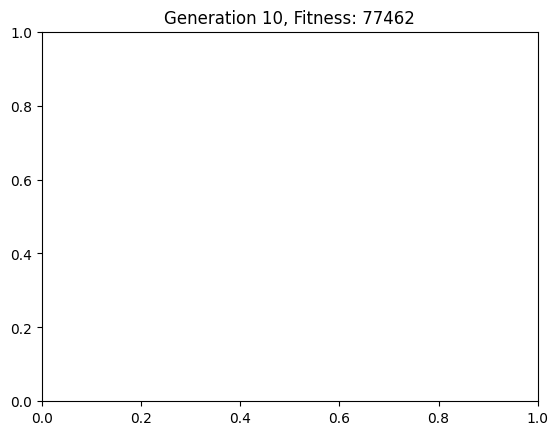

{'rooms': [{'name': 'Living Room', 'position': (373, 438), 'size': (181, 153)}, {'name': 'Bedroom1', 'position': (695, 488), 'size': (193, 104)}, {'name': 'Bedroom2', 'position': (665, 375), 'size': (171, 98)}, {'name': 'Passage', 'position': (554, 473), 'size': (140, 67)}, {'name': 'Kitchen', 'position': (604, 358), 'size': (61, 115)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 77462}


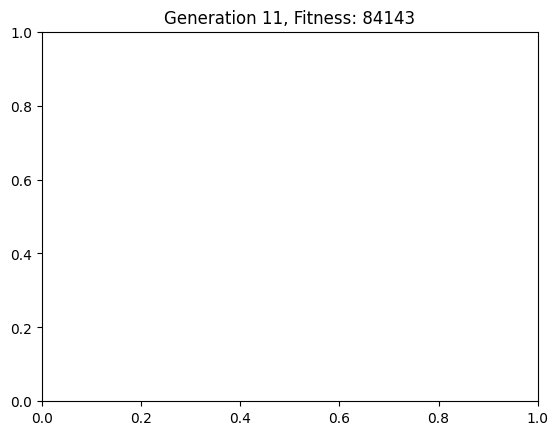

{'rooms': [{'name': 'Living Room', 'position': (368, 434), 'size': (184, 157)}, {'name': 'Bedroom1', 'position': (695, 484), 'size': (201, 108)}, {'name': 'Bedroom2', 'position': (665, 371), 'size': (179, 102)}, {'name': 'Passage', 'position': (552, 473), 'size': (143, 67)}, {'name': 'Kitchen', 'position': (596, 352), 'size': (69, 121)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 84143}


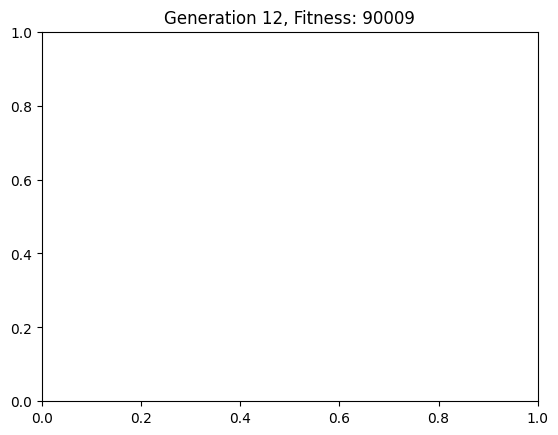

{'rooms': [{'name': 'Living Room', 'position': (362, 430), 'size': (186, 161)}, {'name': 'Bedroom1', 'position': (695, 480), 'size': (209, 112)}, {'name': 'Bedroom2', 'position': (665, 367), 'size': (187, 106)}, {'name': 'Passage', 'position': (549, 473), 'size': (146, 67)}, {'name': 'Kitchen', 'position': (590, 344), 'size': (75, 129)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 90009}


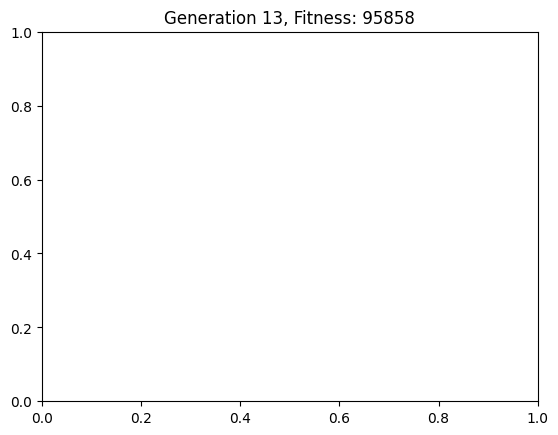

{'rooms': [{'name': 'Living Room', 'position': (357, 426), 'size': (189, 165)}, {'name': 'Bedroom1', 'position': (695, 476), 'size': (217, 116)}, {'name': 'Bedroom2', 'position': (665, 362), 'size': (195, 109)}, {'name': 'Passage', 'position': (546, 472), 'size': (148, 68)}, {'name': 'Kitchen', 'position': (587, 341), 'size': (78, 131)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 95858}


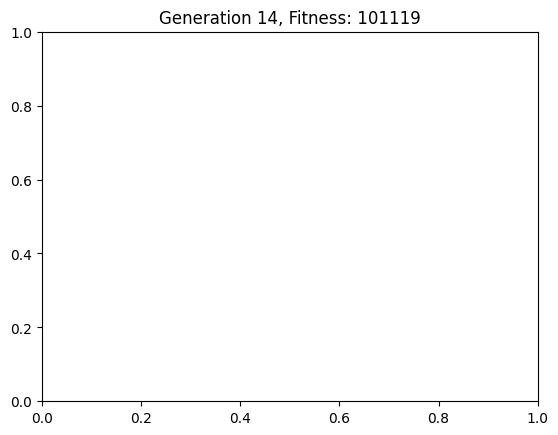

{'rooms': [{'name': 'Living Room', 'position': (352, 422), 'size': (192, 169)}, {'name': 'Bedroom1', 'position': (695, 472), 'size': (225, 120)}, {'name': 'Bedroom2', 'position': (665, 358), 'size': (203, 113)}, {'name': 'Passage', 'position': (544, 472), 'size': (151, 68)}, {'name': 'Kitchen', 'position': (582, 337), 'size': (83, 135)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 101119}


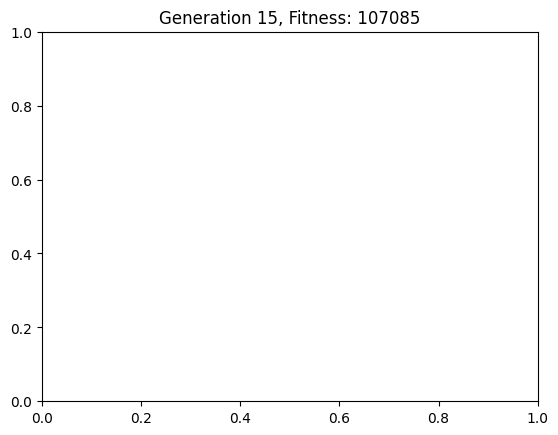

{'rooms': [{'name': 'Living Room', 'position': (346, 418), 'size': (194, 173)}, {'name': 'Bedroom1', 'position': (695, 469), 'size': (233, 123)}, {'name': 'Bedroom2', 'position': (665, 353), 'size': (211, 116)}, {'name': 'Passage', 'position': (541, 472), 'size': (154, 68)}, {'name': 'Kitchen', 'position': (581, 336), 'size': (84, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 107085}


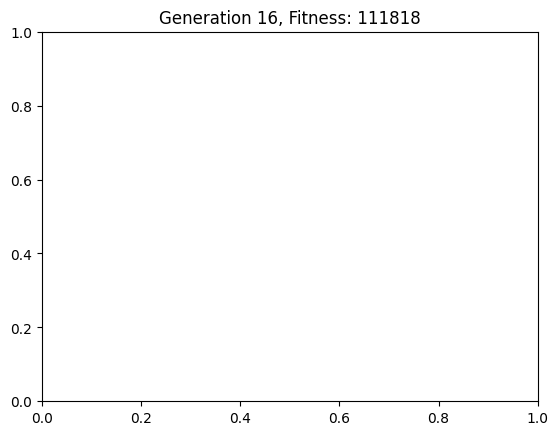

{'rooms': [{'name': 'Living Room', 'position': (341, 414), 'size': (197, 177)}, {'name': 'Bedroom1', 'position': (695, 466), 'size': (241, 125)}, {'name': 'Bedroom2', 'position': (665, 347), 'size': (219, 118)}, {'name': 'Passage', 'position': (538, 472), 'size': (156, 68)}, {'name': 'Kitchen', 'position': (581, 336), 'size': (84, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 111818}


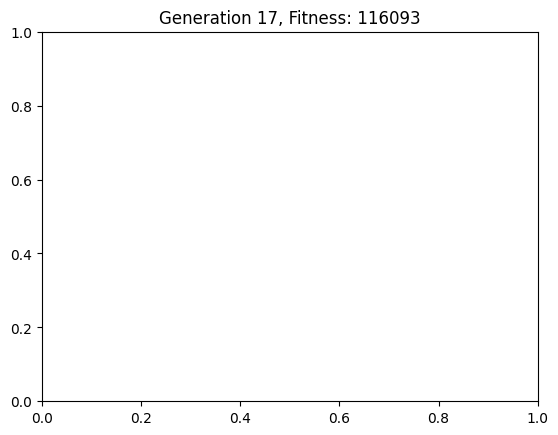

{'rooms': [{'name': 'Living Room', 'position': (338, 410), 'size': (199, 181)}, {'name': 'Bedroom1', 'position': (695, 464), 'size': (246, 128)}, {'name': 'Bedroom2', 'position': (665, 342), 'size': (227, 121)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 116093}


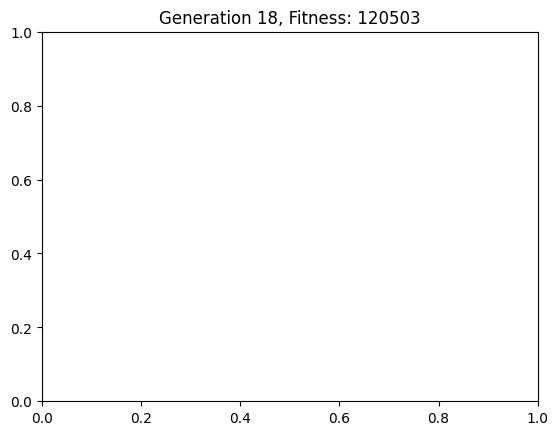

{'rooms': [{'name': 'Living Room', 'position': (338, 406), 'size': (199, 185)}, {'name': 'Bedroom1', 'position': (695, 461), 'size': (246, 131)}, {'name': 'Bedroom2', 'position': (665, 337), 'size': (235, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 120503}


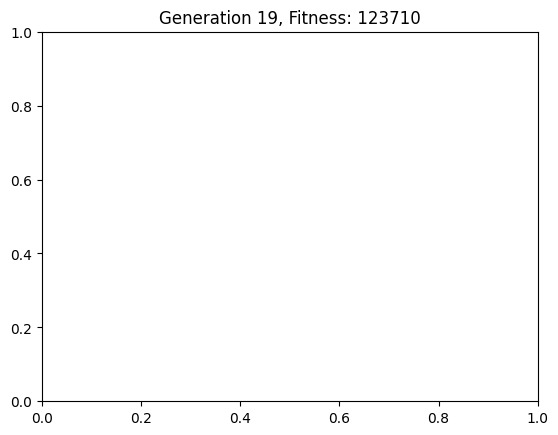

{'rooms': [{'name': 'Living Room', 'position': (338, 402), 'size': (199, 189)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (243, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 123710}


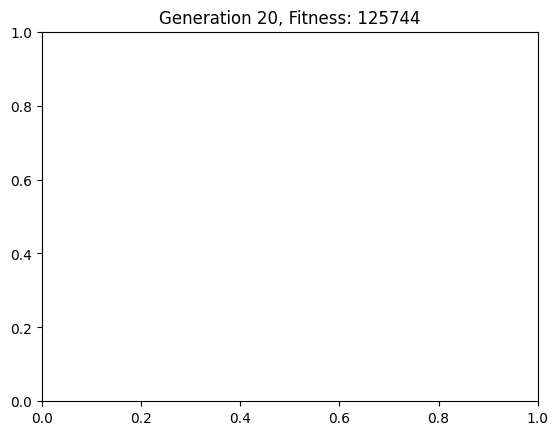

{'rooms': [{'name': 'Living Room', 'position': (338, 398), 'size': (199, 193)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (251, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 125744}


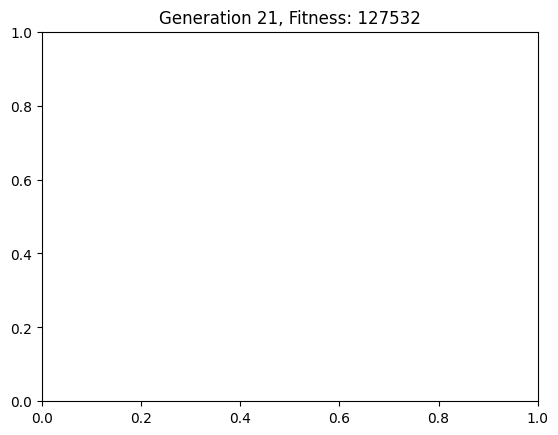

{'rooms': [{'name': 'Living Room', 'position': (338, 394), 'size': (199, 197)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (259, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 127532}


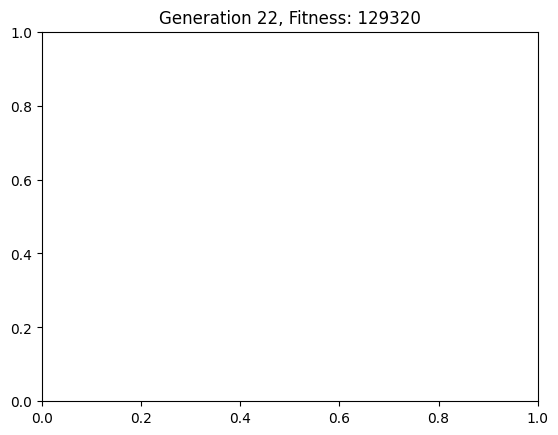

{'rooms': [{'name': 'Living Room', 'position': (338, 390), 'size': (199, 201)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (267, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 129320}


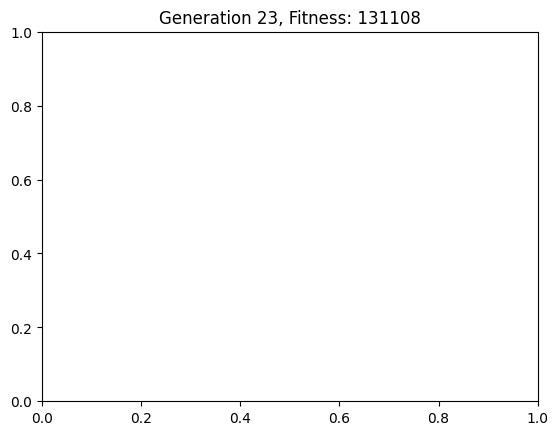

{'rooms': [{'name': 'Living Room', 'position': (338, 386), 'size': (199, 205)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (275, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 131108}


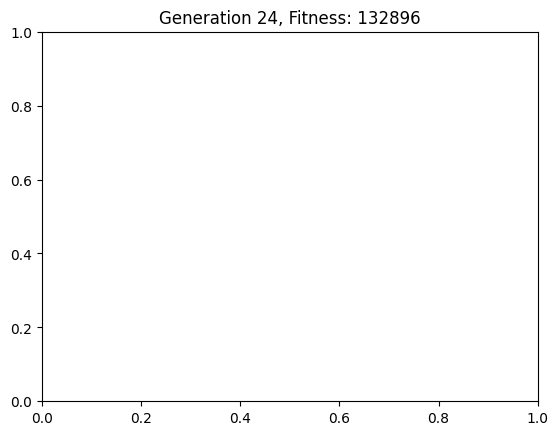

{'rooms': [{'name': 'Living Room', 'position': (338, 382), 'size': (199, 209)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 132896}


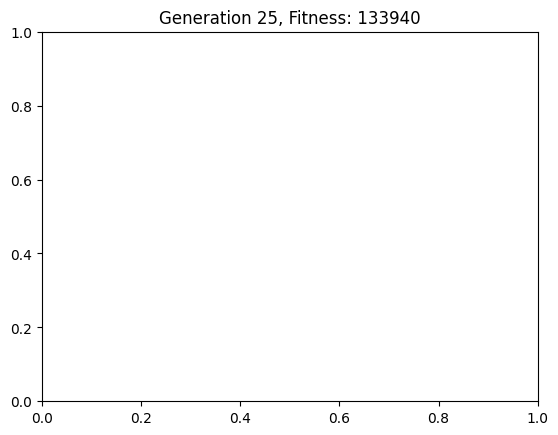

{'rooms': [{'name': 'Living Room', 'position': (338, 378), 'size': (199, 213)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 133940}


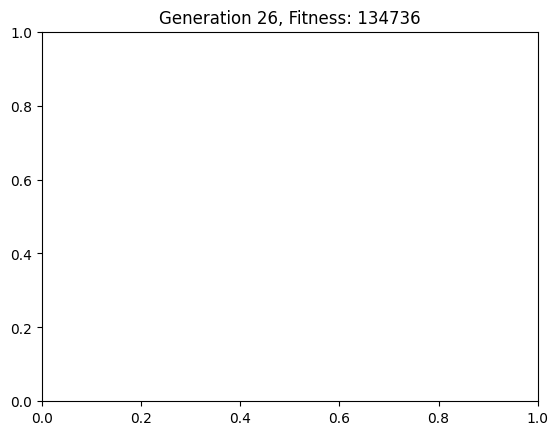

{'rooms': [{'name': 'Living Room', 'position': (338, 374), 'size': (199, 217)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 134736}


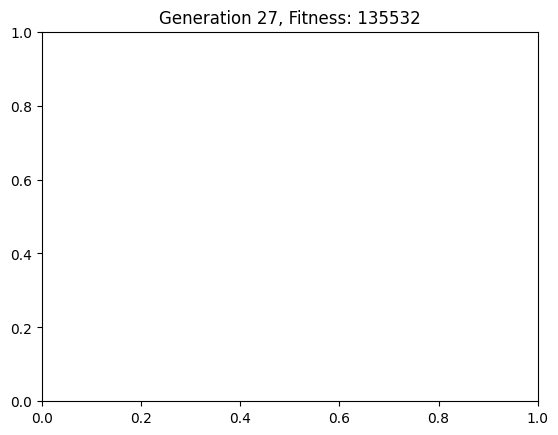

{'rooms': [{'name': 'Living Room', 'position': (338, 370), 'size': (199, 221)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 135532}


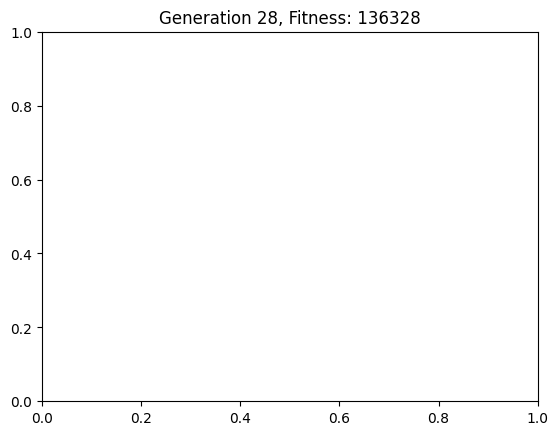

{'rooms': [{'name': 'Living Room', 'position': (338, 366), 'size': (199, 225)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 136328}


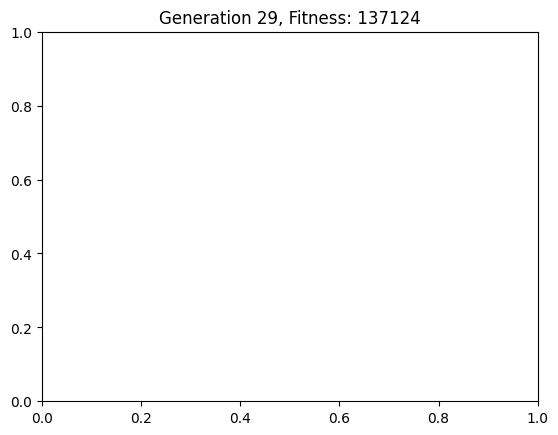

{'rooms': [{'name': 'Living Room', 'position': (338, 362), 'size': (199, 229)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 137124}


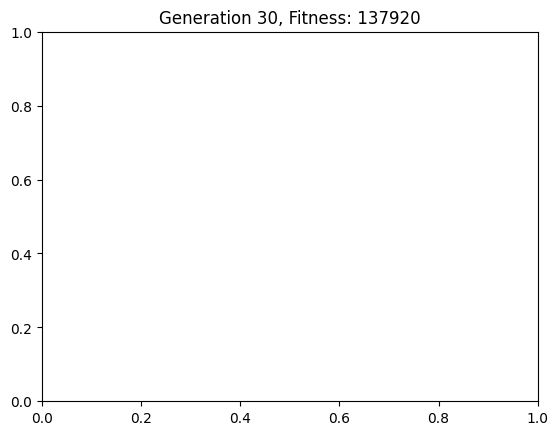

{'rooms': [{'name': 'Living Room', 'position': (338, 358), 'size': (199, 233)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 137920}


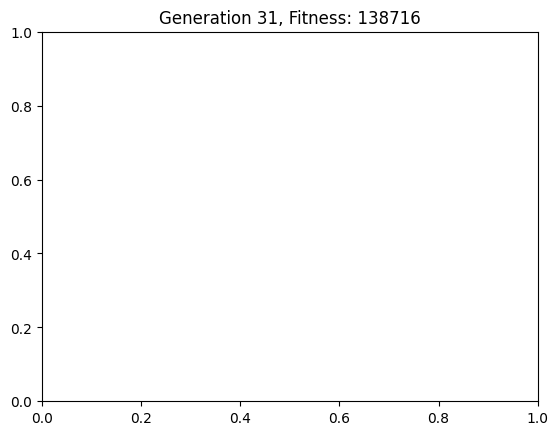

{'rooms': [{'name': 'Living Room', 'position': (338, 354), 'size': (199, 237)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 138716}


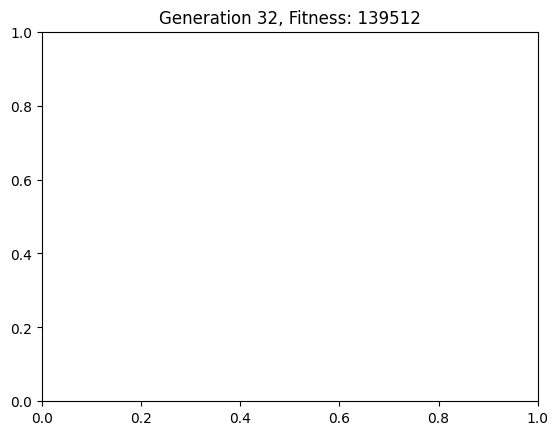

{'rooms': [{'name': 'Living Room', 'position': (338, 350), 'size': (199, 241)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 139512}


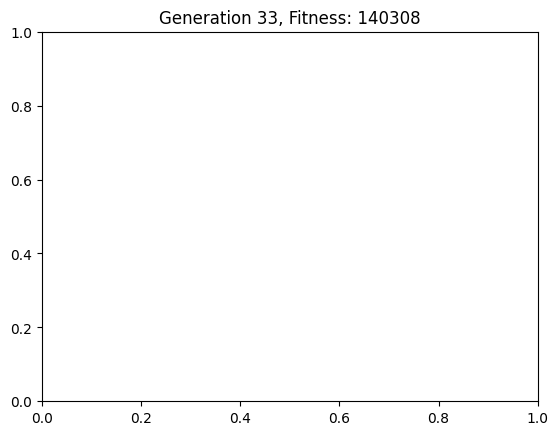

{'rooms': [{'name': 'Living Room', 'position': (338, 346), 'size': (199, 245)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 140308}


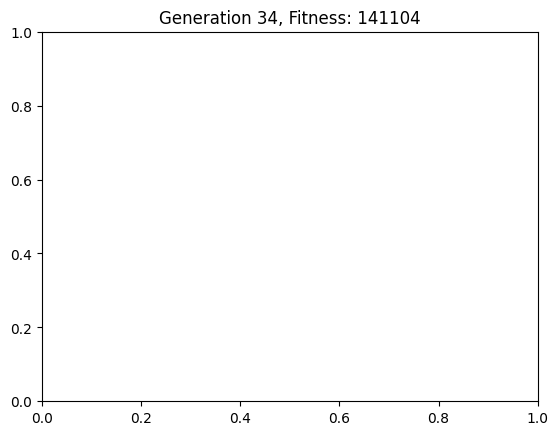

{'rooms': [{'name': 'Living Room', 'position': (338, 342), 'size': (199, 249)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 141104}


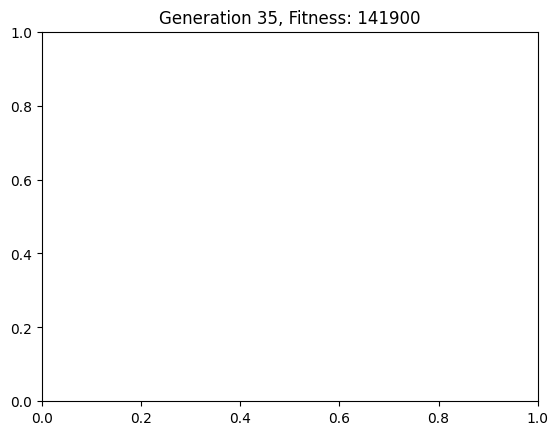

{'rooms': [{'name': 'Living Room', 'position': (338, 338), 'size': (199, 253)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 141900}


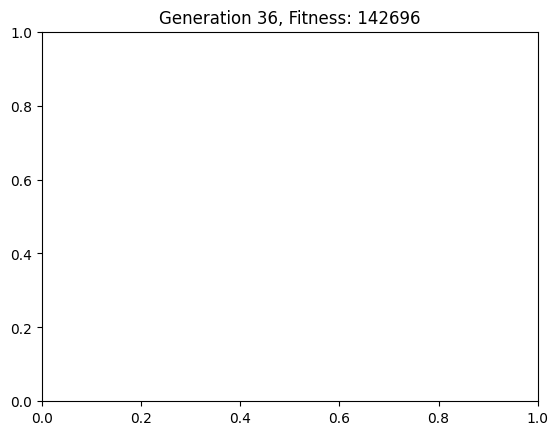

{'rooms': [{'name': 'Living Room', 'position': (338, 334), 'size': (199, 257)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 142696}


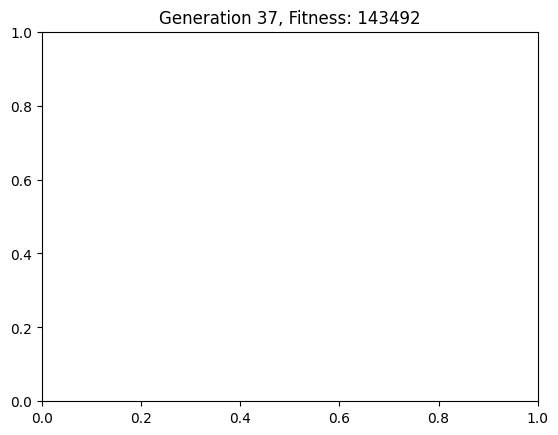

{'rooms': [{'name': 'Living Room', 'position': (338, 330), 'size': (199, 261)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 143492}


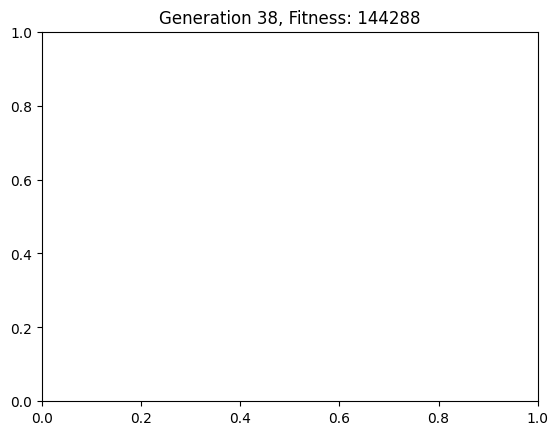

{'rooms': [{'name': 'Living Room', 'position': (338, 326), 'size': (199, 265)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 144288}


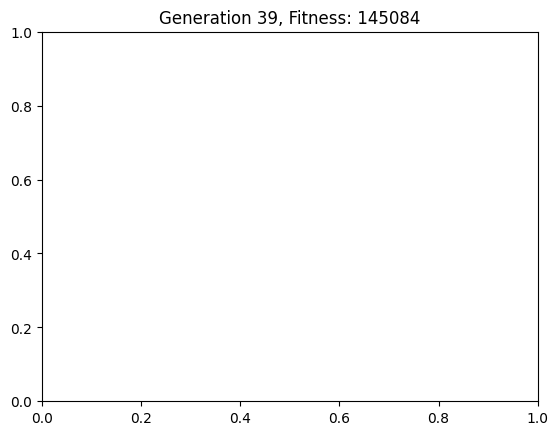

{'rooms': [{'name': 'Living Room', 'position': (338, 322), 'size': (199, 269)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 145084}


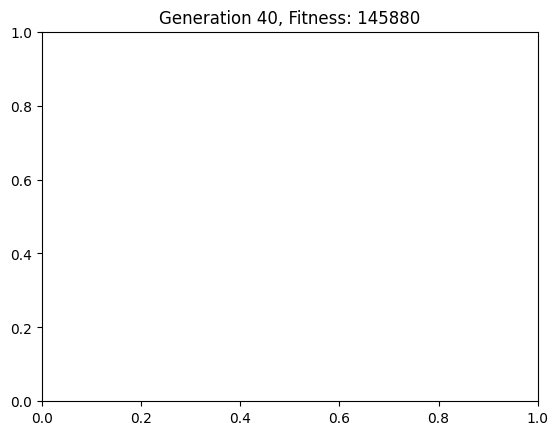

{'rooms': [{'name': 'Living Room', 'position': (338, 318), 'size': (199, 273)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 145880}


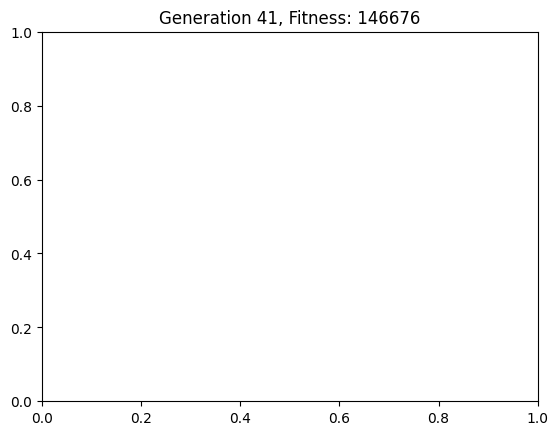

{'rooms': [{'name': 'Living Room', 'position': (338, 314), 'size': (199, 277)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 146676}


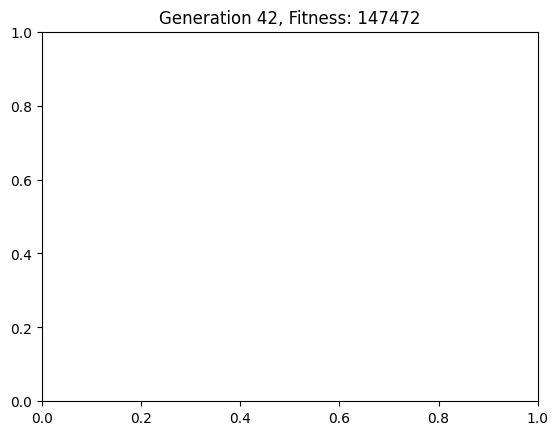

{'rooms': [{'name': 'Living Room', 'position': (338, 310), 'size': (199, 281)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 147472}


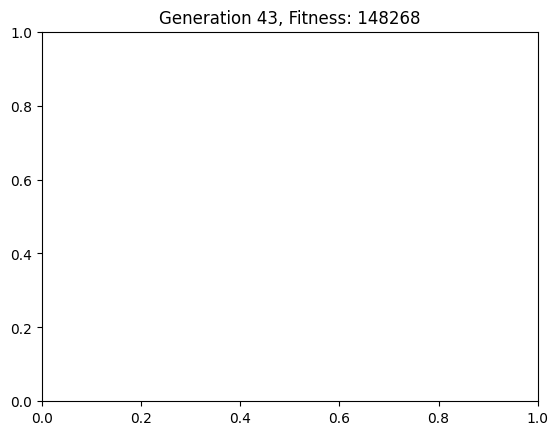

{'rooms': [{'name': 'Living Room', 'position': (338, 306), 'size': (199, 285)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 148268}


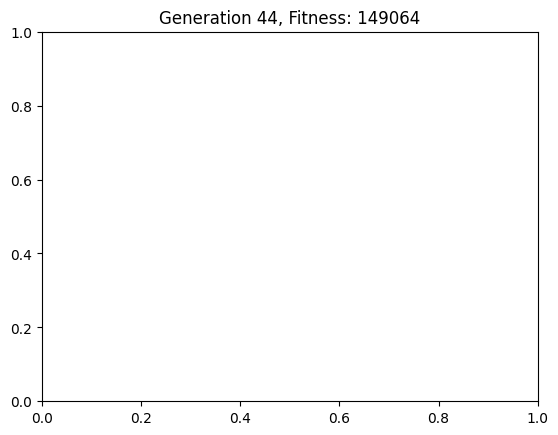

{'rooms': [{'name': 'Living Room', 'position': (338, 302), 'size': (199, 289)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 149064}


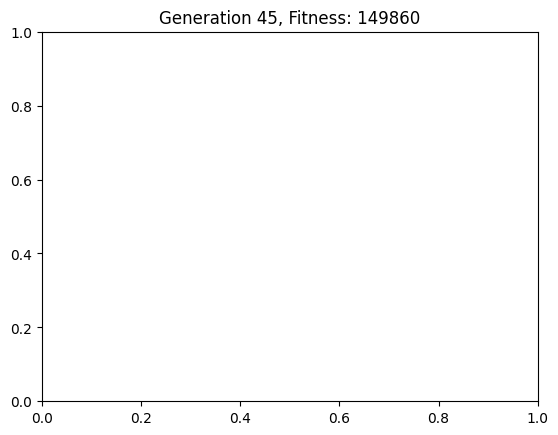

{'rooms': [{'name': 'Living Room', 'position': (338, 298), 'size': (199, 293)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 149860}


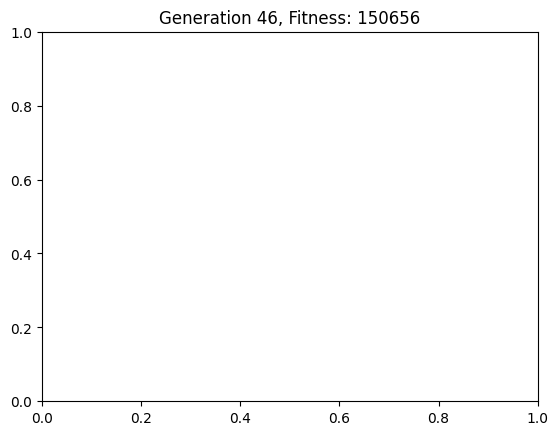

{'rooms': [{'name': 'Living Room', 'position': (338, 294), 'size': (199, 297)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 150656}


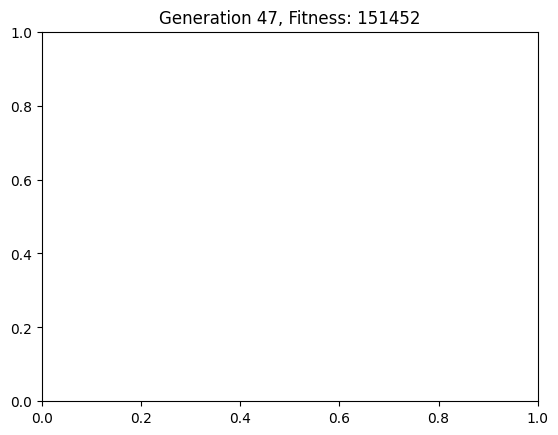

{'rooms': [{'name': 'Living Room', 'position': (338, 290), 'size': (199, 301)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 151452}


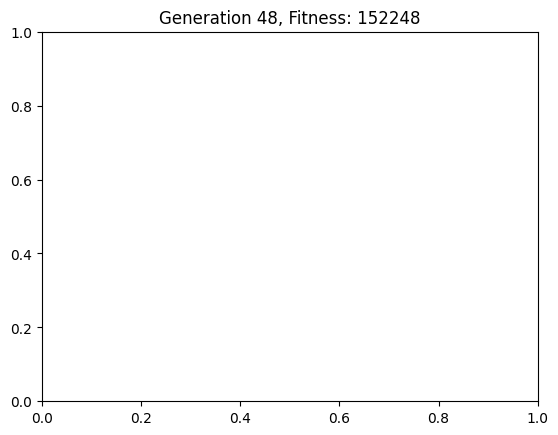

{'rooms': [{'name': 'Living Room', 'position': (338, 286), 'size': (199, 305)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 152248}


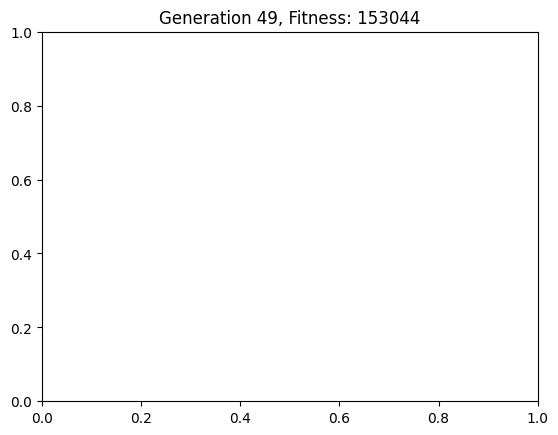

{'rooms': [{'name': 'Living Room', 'position': (338, 282), 'size': (199, 309)}, {'name': 'Bedroom1', 'position': (695, 460), 'size': (246, 132)}, {'name': 'Bedroom2', 'position': (665, 336), 'size': (277, 124)}, {'name': 'Passage', 'position': (537, 472), 'size': (158, 68)}, {'name': 'Kitchen', 'position': (580, 336), 'size': (85, 136)}, {'name': 'Washroom', 'position': (574, 540), 'size': (75, 43)}], 'fitness': 153044}
Elapsed time: 499.91 seconds


<Figure size 640x480 with 0 Axes>

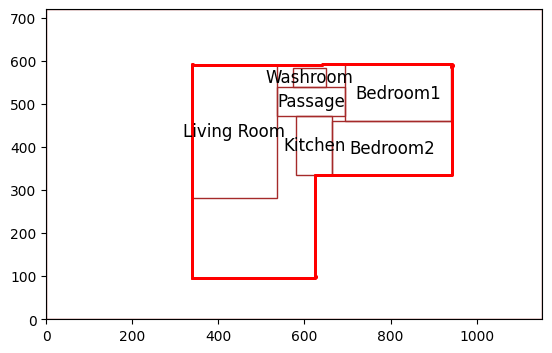

Elapsed time for initial population generation: 28.58 seconds


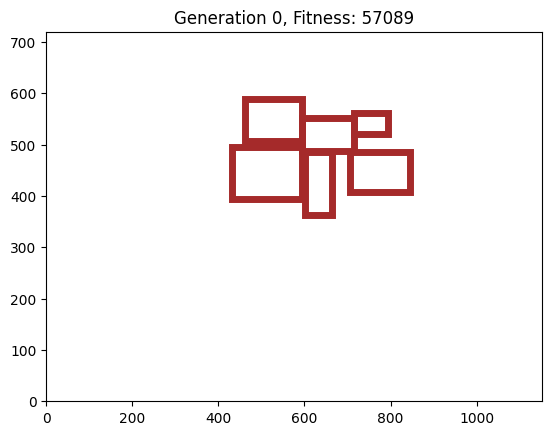

{'rooms': [{'name': 'Living Room', 'position': (431, 394), 'size': (163, 102)}, {'name': 'Passage', 'position': (595, 487), 'size': (119, 65)}, {'name': 'Kitchen', 'position': (601, 363), 'size': (62, 123)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}, {'name': 'Bedroom1', 'position': (461, 507), 'size': (133, 82)}, {'name': 'Bedroom2', 'position': (705, 408), 'size': (141, 78)}], 'fitness': 57089}


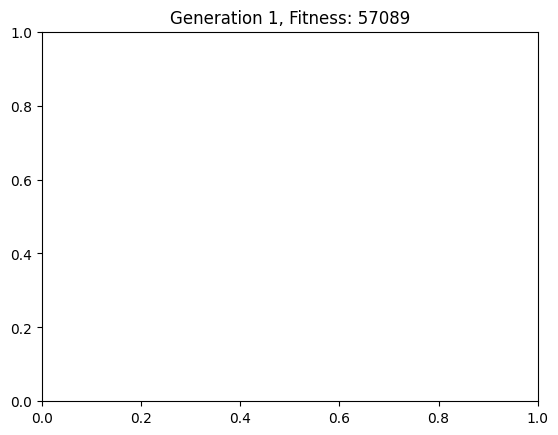

{'rooms': [{'name': 'Living Room', 'position': (430, 394), 'size': (164, 104)}, {'name': 'Passage', 'position': (594, 487), 'size': (120, 67)}, {'name': 'Kitchen', 'position': (601, 384), 'size': (64, 102)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}, {'name': 'Bedroom1', 'position': (460, 507), 'size': (134, 84)}, {'name': 'Bedroom2', 'position': (705, 407), 'size': (143, 79)}], 'fitness': 57089}


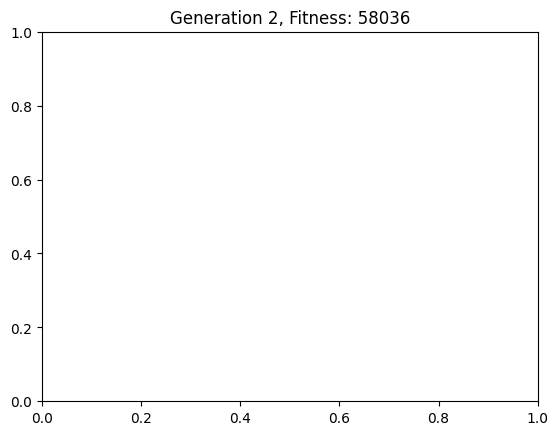

{'rooms': [{'name': 'Living Room', 'position': (427, 394), 'size': (165, 108)}, {'name': 'Bedroom1', 'position': (457, 505), 'size': (135, 86)}, {'name': 'Bedroom2', 'position': (705, 405), 'size': (147, 81)}, {'name': 'Passage', 'position': (593, 487), 'size': (122, 71)}, {'name': 'Kitchen', 'position': (601, 374), 'size': (68, 112)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 58036}


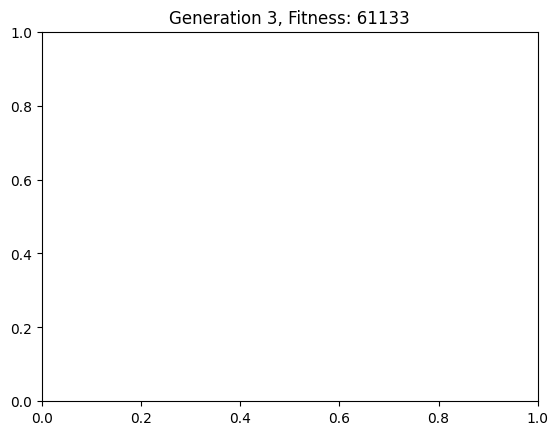

{'rooms': [{'name': 'Living Room', 'position': (422, 390), 'size': (168, 112)}, {'name': 'Bedroom1', 'position': (452, 502), 'size': (138, 89)}, {'name': 'Bedroom2', 'position': (705, 401), 'size': (155, 85)}, {'name': 'Passage', 'position': (590, 487), 'size': (124, 79)}, {'name': 'Kitchen', 'position': (601, 364), 'size': (76, 122)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 61133}


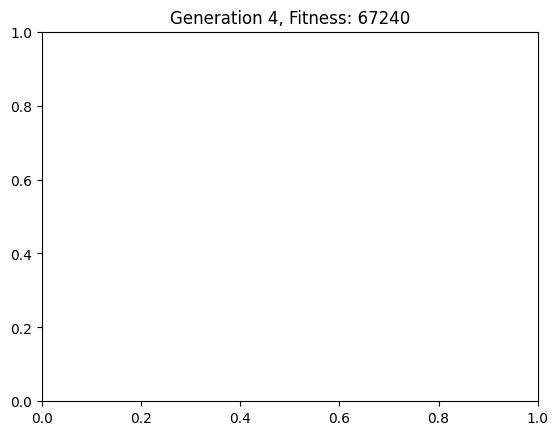

{'rooms': [{'name': 'Living Room', 'position': (417, 384), 'size': (171, 114)}, {'name': 'Bedroom1', 'position': (447, 499), 'size': (141, 92)}, {'name': 'Bedroom2', 'position': (705, 397), 'size': (163, 89)}, {'name': 'Passage', 'position': (588, 487), 'size': (127, 87)}, {'name': 'Kitchen', 'position': (601, 343), 'size': (82, 143)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 67240}


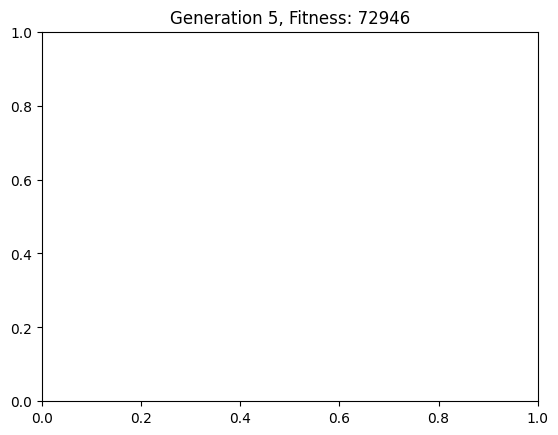

{'rooms': [{'name': 'Living Room', 'position': (411, 379), 'size': (173, 117)}, {'name': 'Bedroom1', 'position': (441, 496), 'size': (143, 94)}, {'name': 'Bedroom2', 'position': (705, 393), 'size': (171, 93)}, {'name': 'Passage', 'position': (585, 487), 'size': (130, 95)}, {'name': 'Kitchen', 'position': (601, 345), 'size': (88, 142)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 72946}


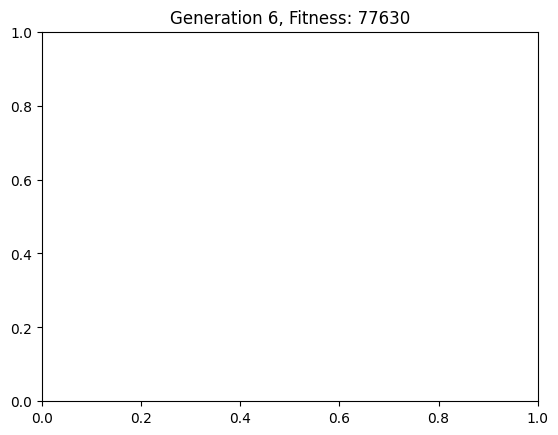

{'rooms': [{'name': 'Living Room', 'position': (406, 374), 'size': (176, 120)}, {'name': 'Bedroom1', 'position': (436, 494), 'size': (146, 97)}, {'name': 'Bedroom2', 'position': (705, 389), 'size': (179, 97)}, {'name': 'Passage', 'position': (582, 487), 'size': (132, 103)}, {'name': 'Kitchen', 'position': (601, 340), 'size': (91, 147)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 77630}


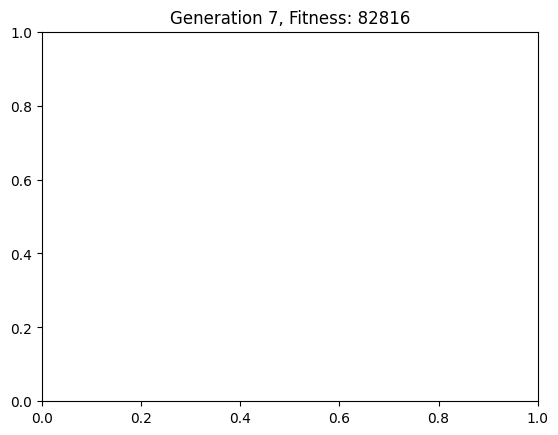

{'rooms': [{'name': 'Living Room', 'position': (401, 368), 'size': (179, 122)}, {'name': 'Bedroom1', 'position': (431, 491), 'size': (149, 100)}, {'name': 'Bedroom2', 'position': (705, 385), 'size': (187, 101)}, {'name': 'Passage', 'position': (580, 487), 'size': (135, 104)}, {'name': 'Kitchen', 'position': (601, 340), 'size': (91, 147)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 82816}


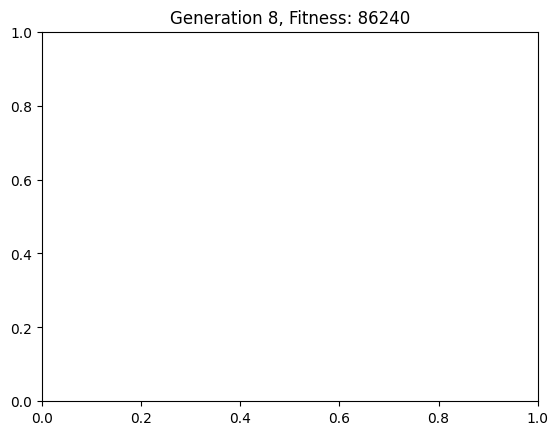

{'rooms': [{'name': 'Living Room', 'position': (395, 363), 'size': (181, 125)}, {'name': 'Bedroom1', 'position': (425, 488), 'size': (151, 102)}, {'name': 'Bedroom2', 'position': (705, 381), 'size': (195, 105)}, {'name': 'Passage', 'position': (577, 487), 'size': (138, 104)}, {'name': 'Kitchen', 'position': (601, 339), 'size': (92, 148)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 86240}


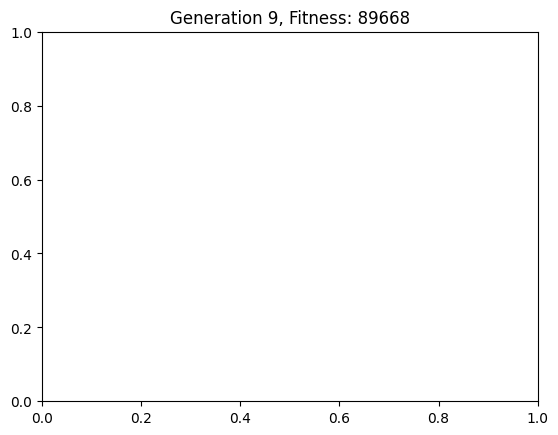

{'rooms': [{'name': 'Living Room', 'position': (395, 360), 'size': (189, 126)}, {'name': 'Bedroom1', 'position': (420, 486), 'size': (154, 105)}, {'name': 'Bedroom2', 'position': (705, 377), 'size': (203, 109)}, {'name': 'Passage', 'position': (574, 487), 'size': (140, 104)}, {'name': 'Kitchen', 'position': (601, 339), 'size': (92, 148)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 89668}


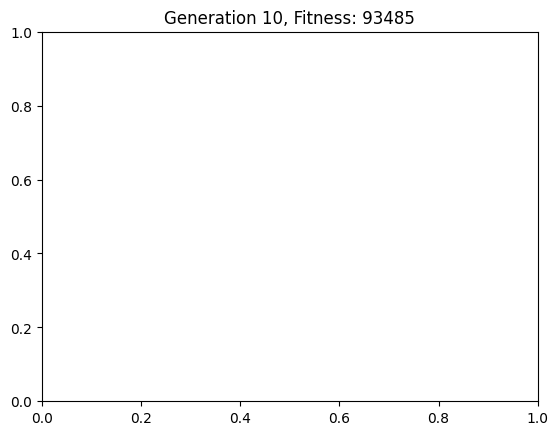

{'rooms': [{'name': 'Living Room', 'position': (395, 360), 'size': (197, 126)}, {'name': 'Bedroom1', 'position': (415, 486), 'size': (157, 105)}, {'name': 'Bedroom2', 'position': (705, 373), 'size': (211, 113)}, {'name': 'Passage', 'position': (572, 487), 'size': (143, 104)}, {'name': 'Kitchen', 'position': (601, 339), 'size': (92, 148)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 93485}


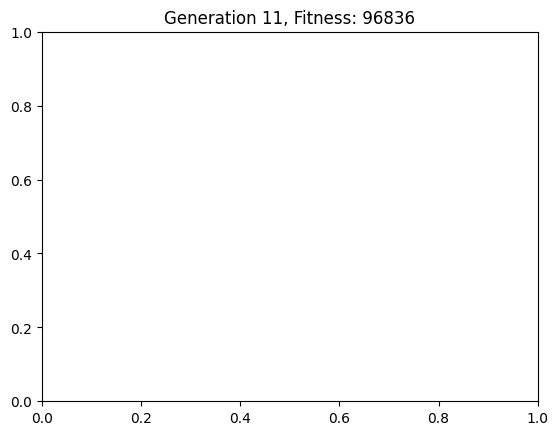

{'rooms': [{'name': 'Living Room', 'position': (395, 360), 'size': (205, 126)}, {'name': 'Bedroom1', 'position': (409, 486), 'size': (159, 105)}, {'name': 'Bedroom2', 'position': (705, 369), 'size': (219, 117)}, {'name': 'Passage', 'position': (569, 487), 'size': (146, 104)}, {'name': 'Kitchen', 'position': (601, 338), 'size': (93, 149)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 96836}


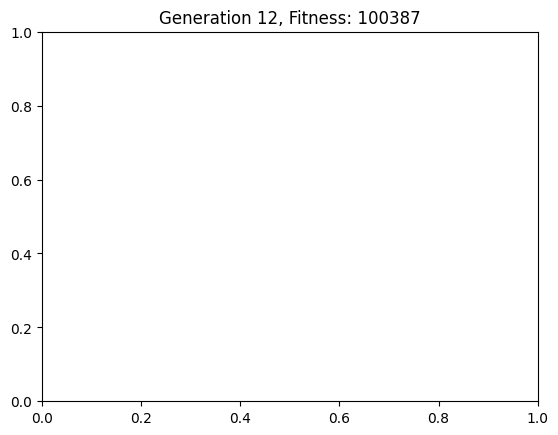

{'rooms': [{'name': 'Living Room', 'position': (391, 360), 'size': (209, 126)}, {'name': 'Bedroom1', 'position': (404, 486), 'size': (162, 105)}, {'name': 'Bedroom2', 'position': (705, 365), 'size': (227, 121)}, {'name': 'Passage', 'position': (566, 487), 'size': (148, 104)}, {'name': 'Kitchen', 'position': (601, 338), 'size': (93, 149)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 100387}


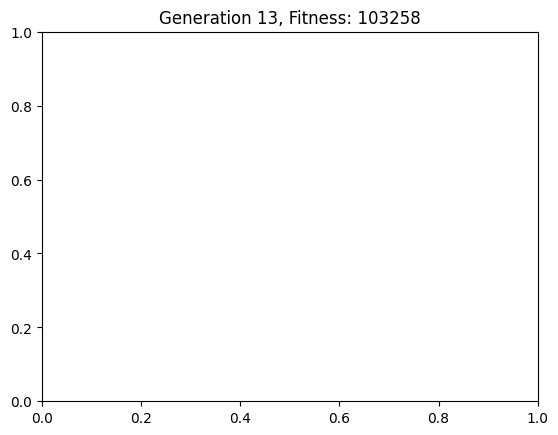

{'rooms': [{'name': 'Living Room', 'position': (387, 360), 'size': (213, 126)}, {'name': 'Bedroom1', 'position': (399, 486), 'size': (165, 105)}, {'name': 'Bedroom2', 'position': (705, 361), 'size': (235, 125)}, {'name': 'Passage', 'position': (564, 487), 'size': (151, 104)}, {'name': 'Kitchen', 'position': (601, 338), 'size': (93, 149)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 103258}


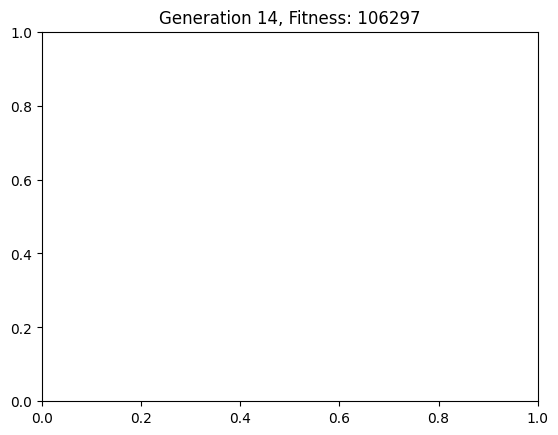

{'rooms': [{'name': 'Living Room', 'position': (383, 360), 'size': (217, 126)}, {'name': 'Bedroom1', 'position': (393, 486), 'size': (167, 105)}, {'name': 'Bedroom2', 'position': (702, 357), 'size': (240, 129)}, {'name': 'Passage', 'position': (561, 487), 'size': (154, 104)}, {'name': 'Kitchen', 'position': (601, 338), 'size': (93, 149)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 106297}


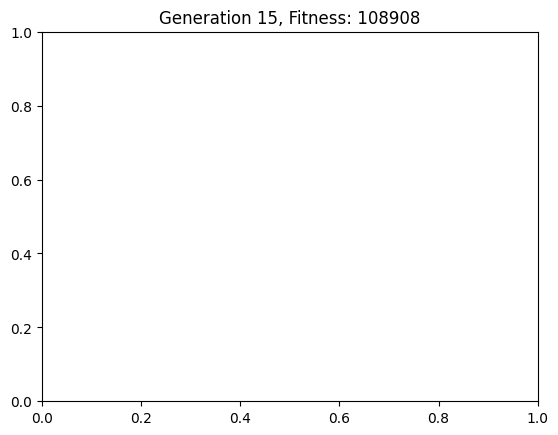

{'rooms': [{'name': 'Living Room', 'position': (379, 360), 'size': (221, 126)}, {'name': 'Bedroom1', 'position': (388, 486), 'size': (170, 105)}, {'name': 'Bedroom2', 'position': (698, 353), 'size': (244, 133)}, {'name': 'Passage', 'position': (558, 487), 'size': (156, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 108908}


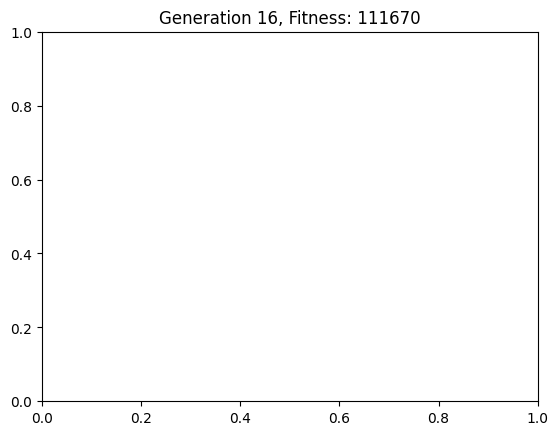

{'rooms': [{'name': 'Living Room', 'position': (375, 360), 'size': (225, 126)}, {'name': 'Bedroom1', 'position': (383, 486), 'size': (173, 105)}, {'name': 'Bedroom2', 'position': (695, 349), 'size': (247, 137)}, {'name': 'Passage', 'position': (556, 487), 'size': (159, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 111670}


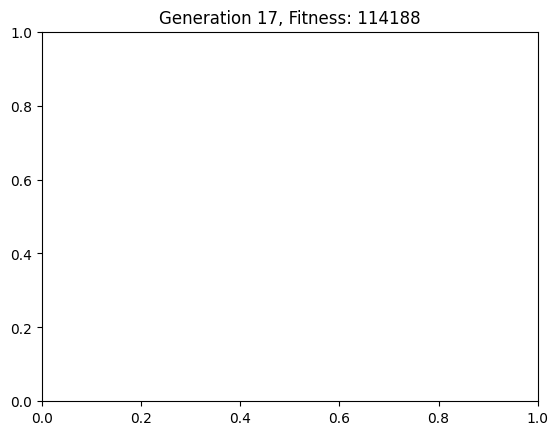

{'rooms': [{'name': 'Living Room', 'position': (371, 360), 'size': (229, 126)}, {'name': 'Bedroom1', 'position': (377, 486), 'size': (175, 105)}, {'name': 'Bedroom2', 'position': (695, 345), 'size': (247, 141)}, {'name': 'Passage', 'position': (553, 487), 'size': (162, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 114188}


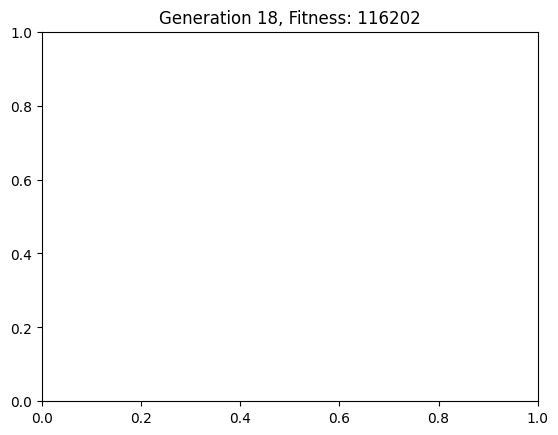

{'rooms': [{'name': 'Living Room', 'position': (367, 360), 'size': (233, 126)}, {'name': 'Bedroom1', 'position': (372, 486), 'size': (178, 105)}, {'name': 'Bedroom2', 'position': (695, 341), 'size': (247, 145)}, {'name': 'Passage', 'position': (550, 487), 'size': (164, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 116202}


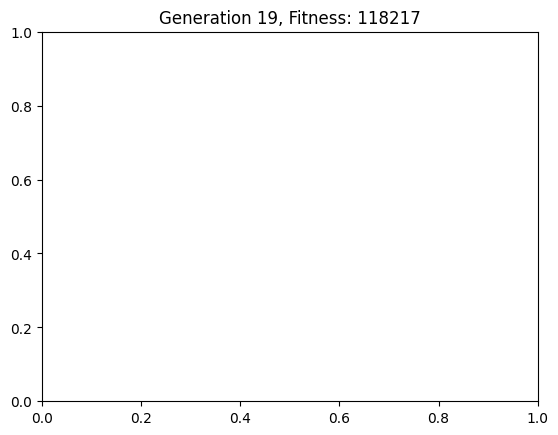

{'rooms': [{'name': 'Living Room', 'position': (363, 360), 'size': (237, 126)}, {'name': 'Bedroom1', 'position': (367, 486), 'size': (181, 105)}, {'name': 'Bedroom2', 'position': (695, 337), 'size': (247, 149)}, {'name': 'Passage', 'position': (548, 487), 'size': (167, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 118217}


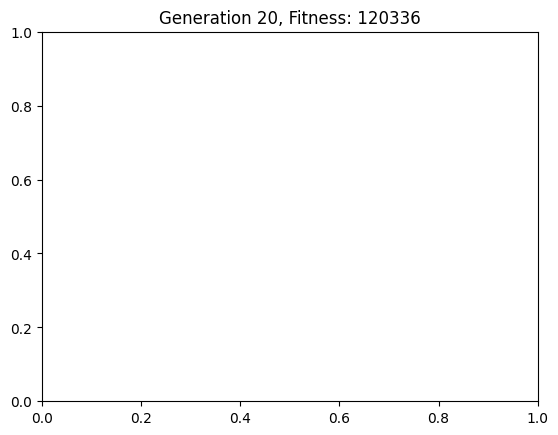

{'rooms': [{'name': 'Living Room', 'position': (359, 360), 'size': (241, 126)}, {'name': 'Bedroom1', 'position': (361, 486), 'size': (183, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (545, 487), 'size': (170, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 120336}


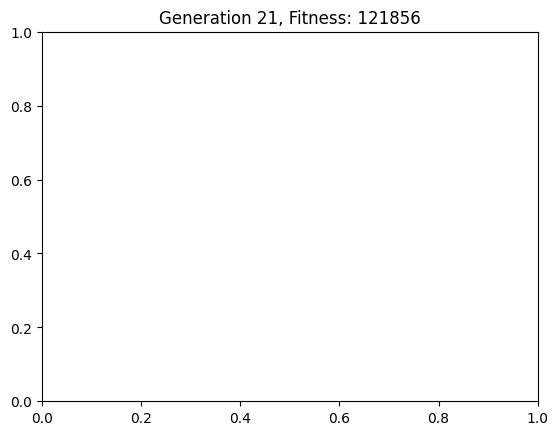

{'rooms': [{'name': 'Living Room', 'position': (355, 360), 'size': (245, 126)}, {'name': 'Bedroom1', 'position': (356, 486), 'size': (186, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 121856}


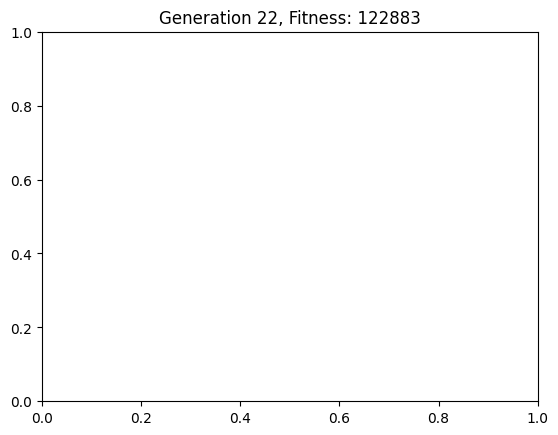

{'rooms': [{'name': 'Living Room', 'position': (351, 360), 'size': (249, 126)}, {'name': 'Bedroom1', 'position': (352, 486), 'size': (190, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 122883}


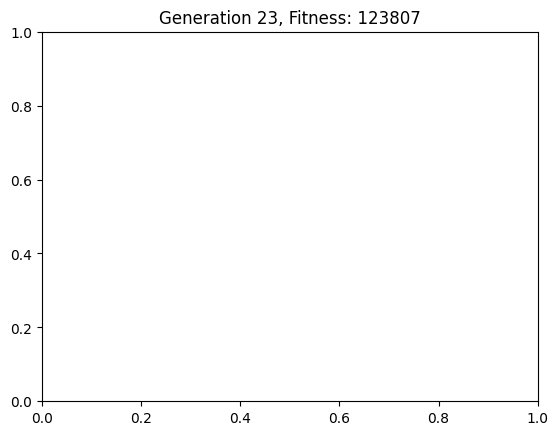

{'rooms': [{'name': 'Living Room', 'position': (347, 360), 'size': (253, 126)}, {'name': 'Bedroom1', 'position': (348, 486), 'size': (194, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 123807}


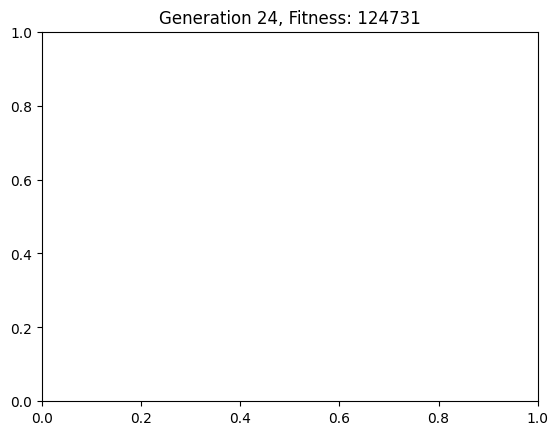

{'rooms': [{'name': 'Living Room', 'position': (343, 360), 'size': (257, 126)}, {'name': 'Bedroom1', 'position': (344, 486), 'size': (198, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 124731}


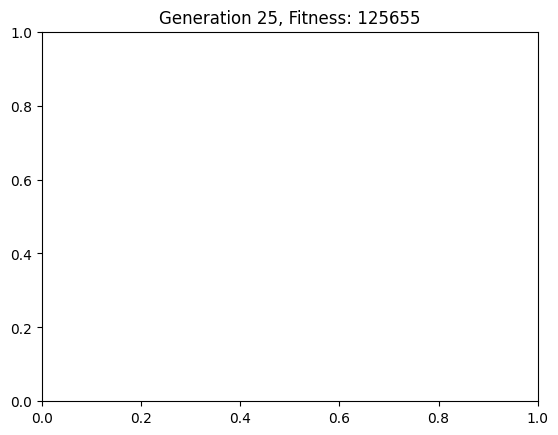

{'rooms': [{'name': 'Living Room', 'position': (339, 360), 'size': (261, 126)}, {'name': 'Bedroom1', 'position': (340, 486), 'size': (202, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 125655}


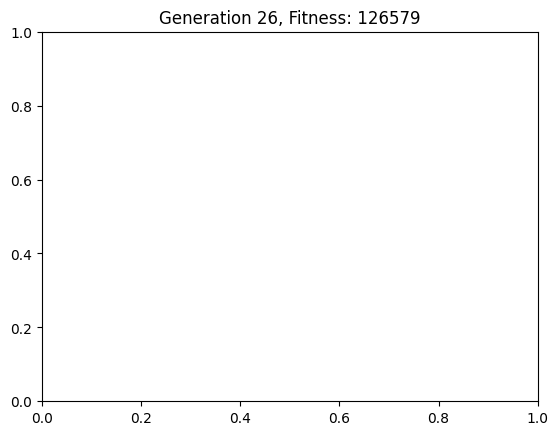

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 126579}


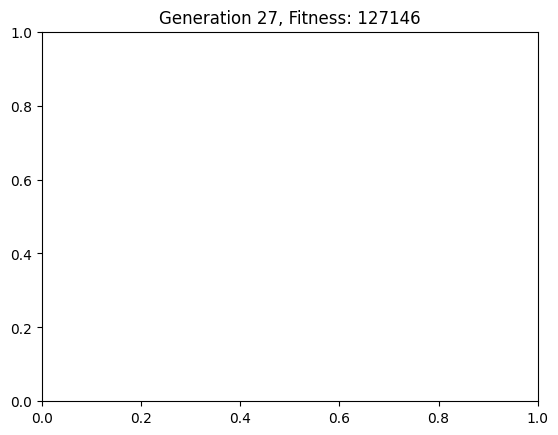

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


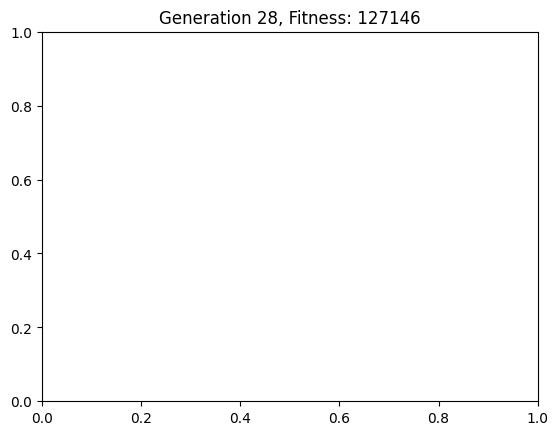

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


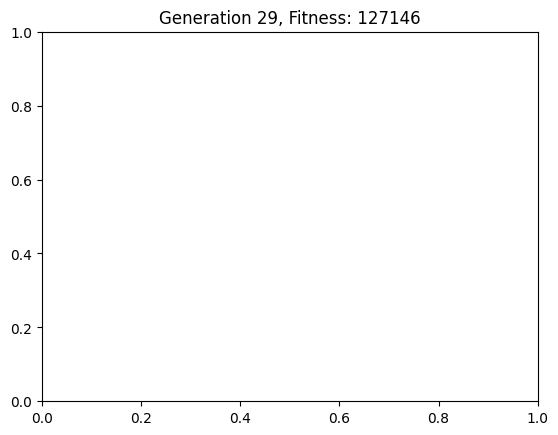

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


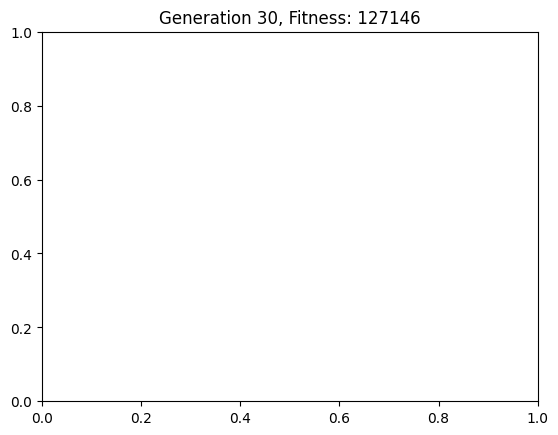

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


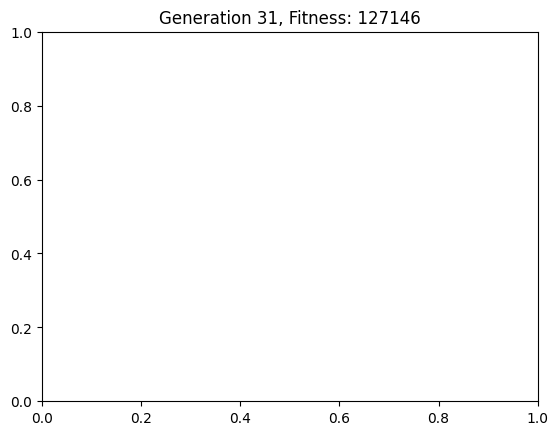

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


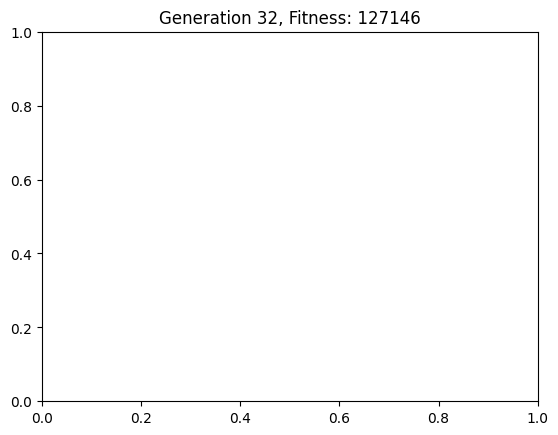

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


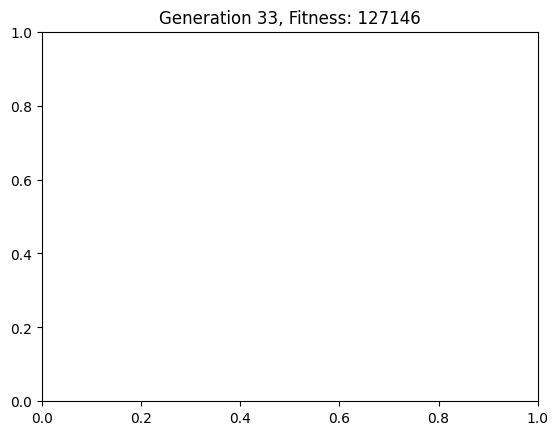

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


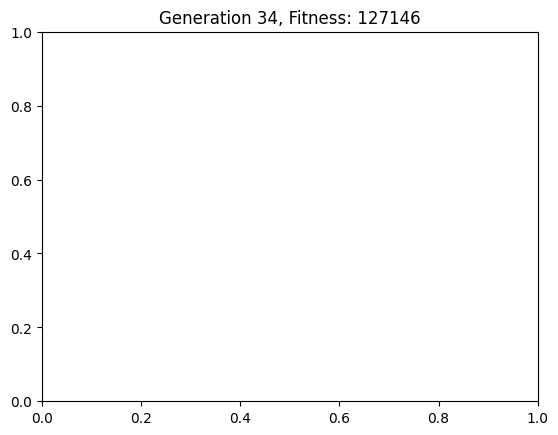

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


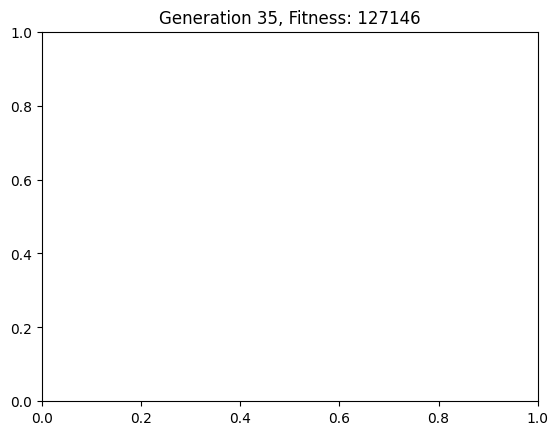

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


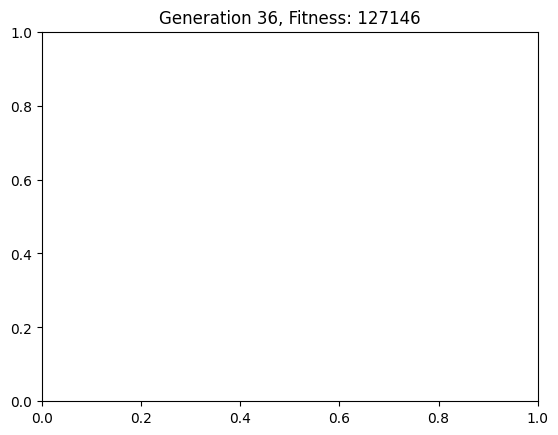

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


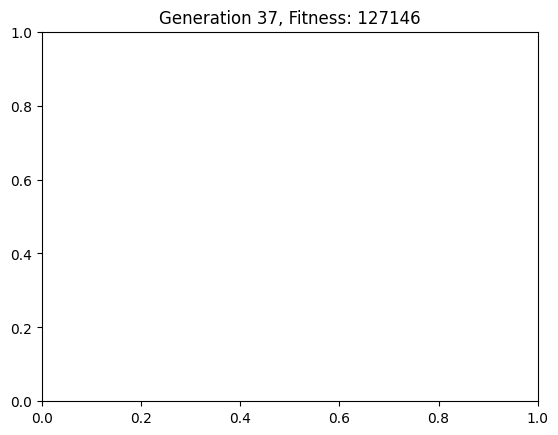

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


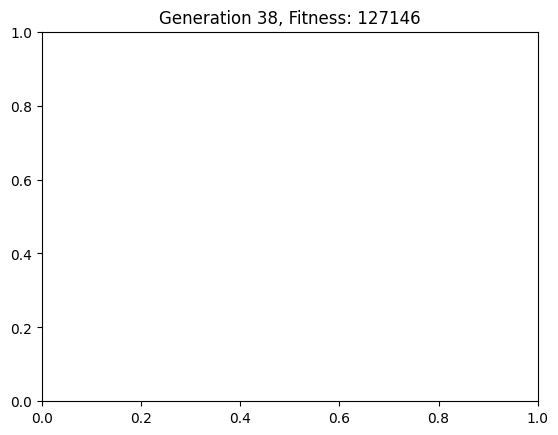

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


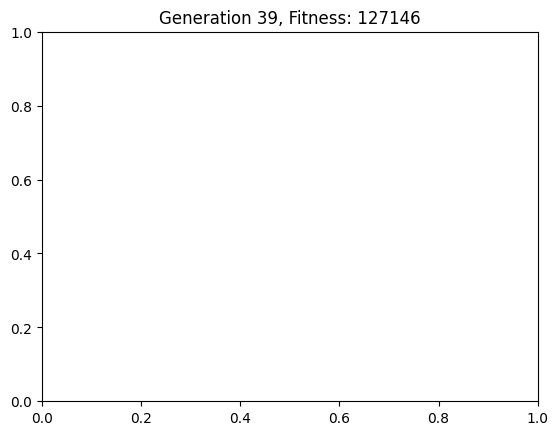

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


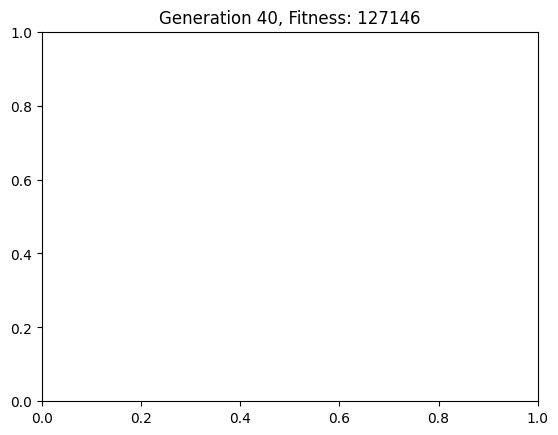

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


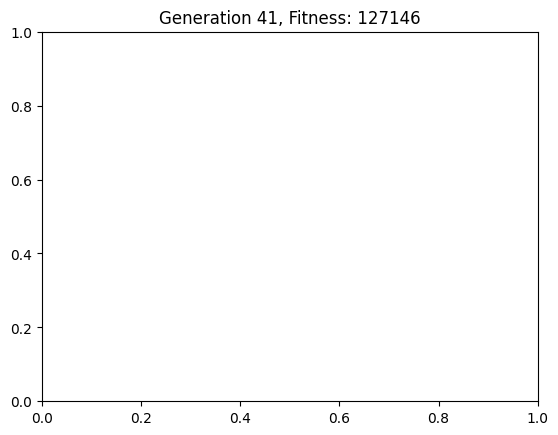

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


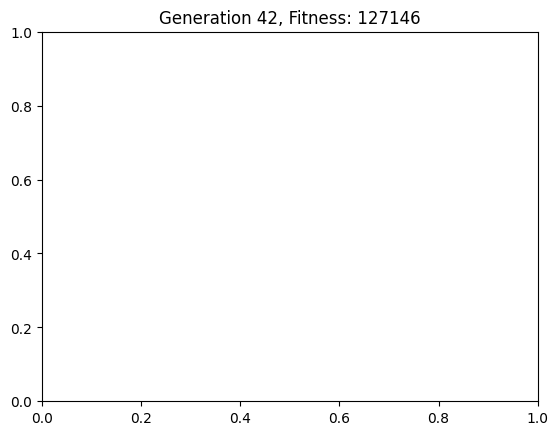

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


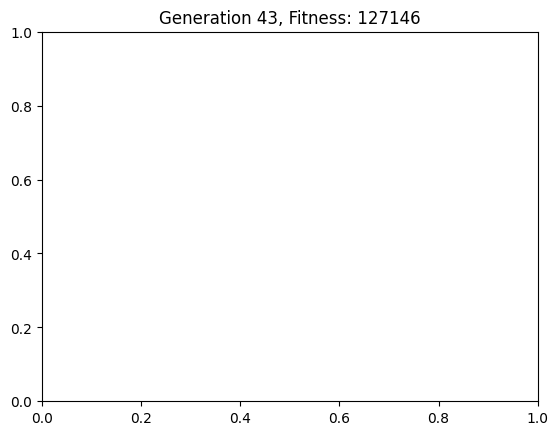

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


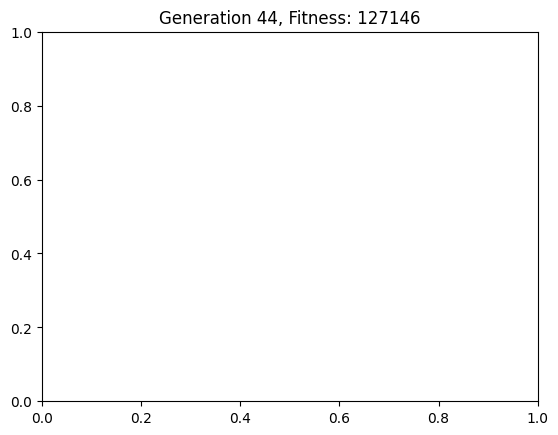

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


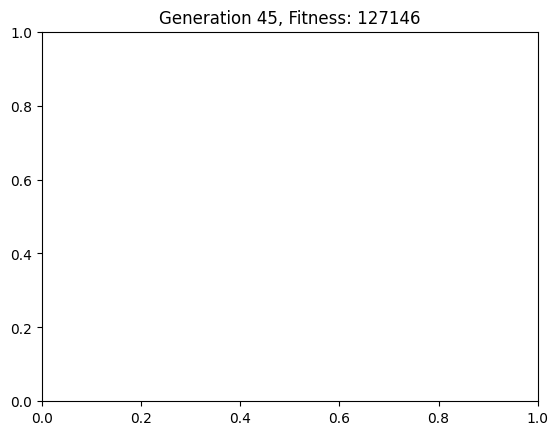

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


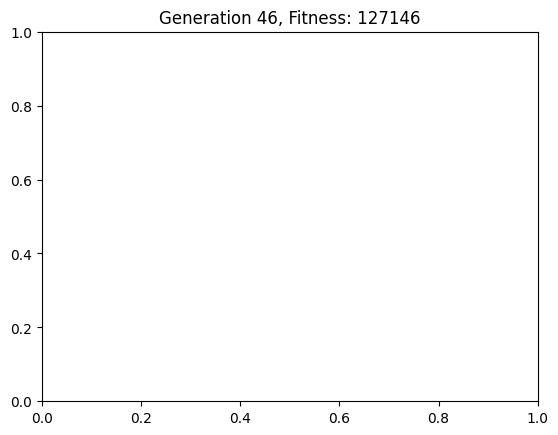

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


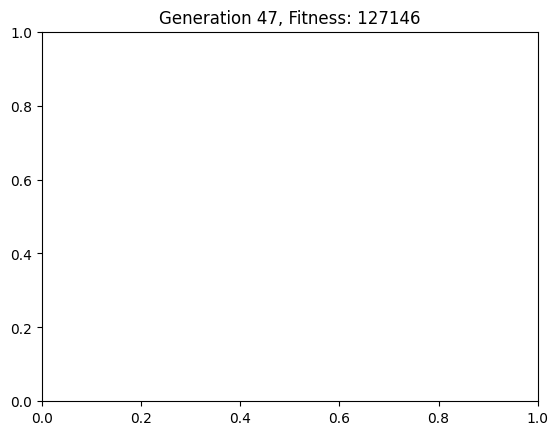

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


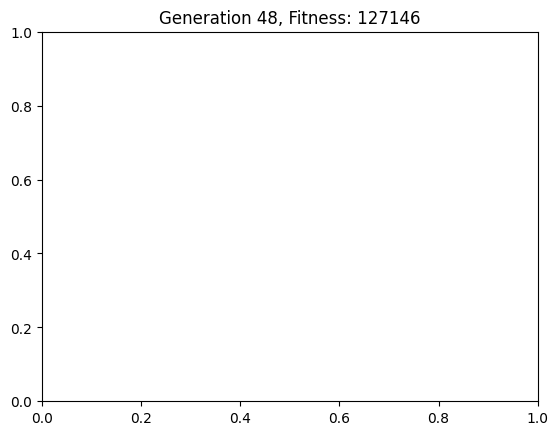

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}


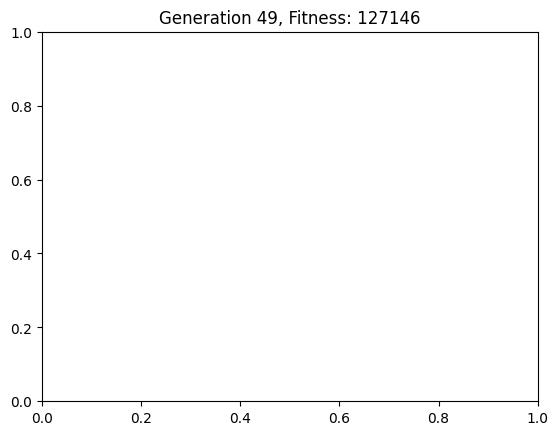

{'rooms': [{'name': 'Living Room', 'position': (338, 360), 'size': (263, 126)}, {'name': 'Bedroom1', 'position': (338, 486), 'size': (205, 105)}, {'name': 'Bedroom2', 'position': (695, 336), 'size': (247, 151)}, {'name': 'Passage', 'position': (543, 487), 'size': (172, 104)}, {'name': 'Kitchen', 'position': (601, 337), 'size': (94, 150)}, {'name': 'Washroom', 'position': (715, 520), 'size': (78, 41)}], 'fitness': 127146}
Elapsed time: 497.87 seconds


<Figure size 640x480 with 0 Axes>

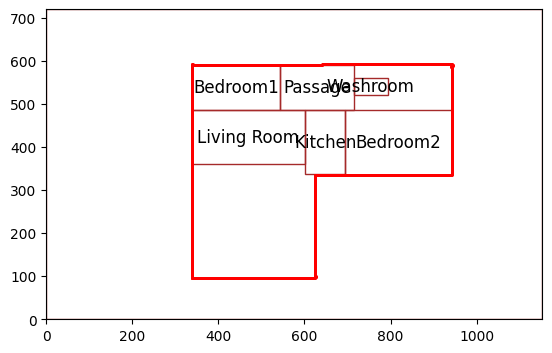

Elapsed time for initial population generation: 28.24 seconds


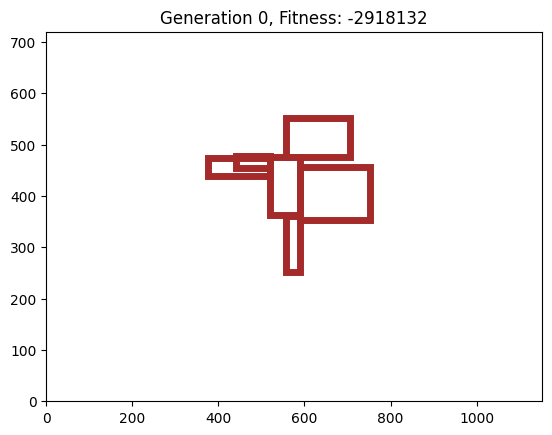

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (163, 102)}, {'name': 'Passage', 'position': (521, 362), 'size': (68, 113)}, {'name': 'Kitchen', 'position': (557, 251), 'size': (33, 110)}, {'name': 'Washroom', 'position': (442, 455), 'size': (78, 22)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (147, 76)}, {'name': 'Bedroom2', 'position': (376, 439), 'size': (144, 35)}], 'fitness': -2918132}


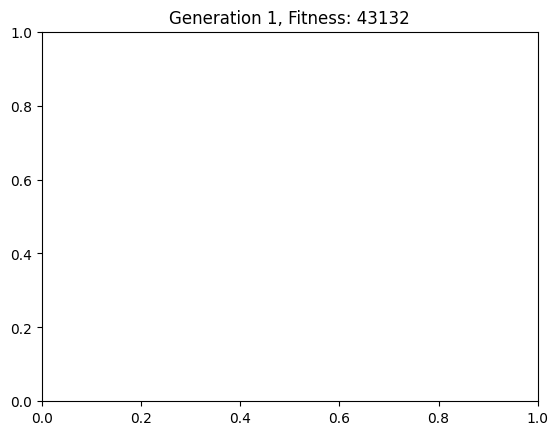

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (163, 102)}, {'name': 'Passage', 'position': (521, 362), 'size': (68, 113)}, {'name': 'Kitchen', 'position': (557, 251), 'size': (33, 110)}, {'name': 'Washroom', 'position': (442, 455), 'size': (78, 22)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (147, 76)}, {'name': 'Bedroom2', 'position': (376, 439), 'size': (144, 16)}], 'fitness': 43132}


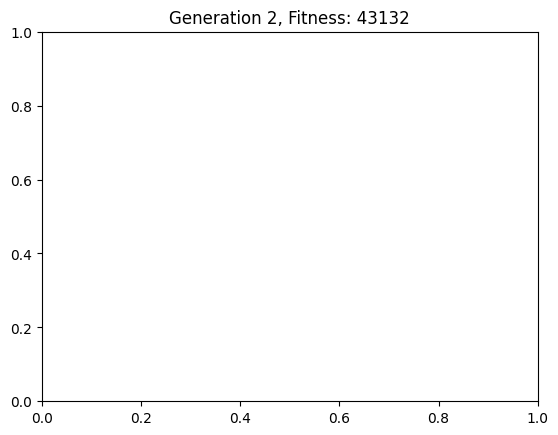

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (164, 103)}, {'name': 'Passage', 'position': (521, 362), 'size': (69, 113)}, {'name': 'Kitchen', 'position': (556, 295), 'size': (34, 66)}, {'name': 'Washroom', 'position': (442, 455), 'size': (78, 22)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (148, 77)}, {'name': 'Bedroom2', 'position': (376, 438), 'size': (145, 16)}], 'fitness': 43132}


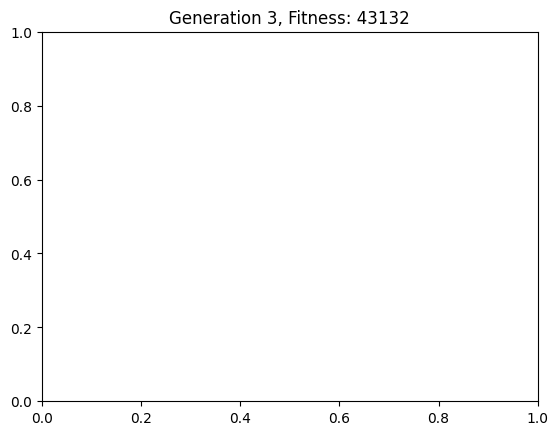

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (166, 105)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (553, 299), 'size': (37, 62)}, {'name': 'Washroom', 'position': (440, 455), 'size': (80, 135)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (151, 80)}, {'name': 'Bedroom2', 'position': (374, 437), 'size': (146, 18)}], 'fitness': 42365}


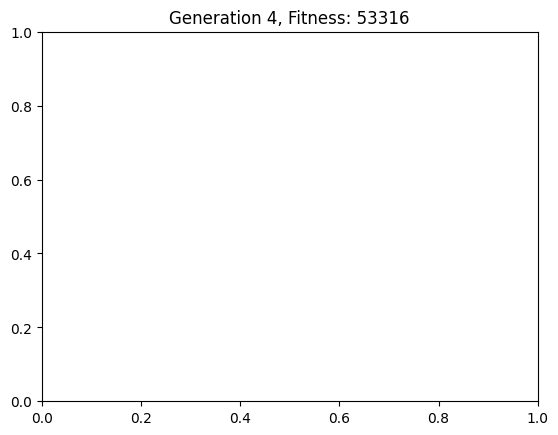

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (167, 106)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (151, 80)}, {'name': 'Bedroom2', 'position': (374, 437), 'size': (146, 18)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (554, 300), 'size': (36, 61)}, {'name': 'Washroom', 'position': (440, 455), 'size': (80, 135)}], 'fitness': 53316}


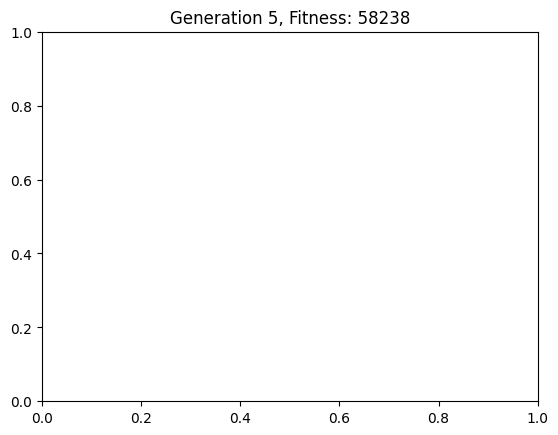

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (176, 115)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (166, 95)}, {'name': 'Bedroom2', 'position': (366, 429), 'size': (153, 25)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (539, 267), 'size': (51, 95)}, {'name': 'Washroom', 'position': (437, 455), 'size': (83, 134)}], 'fitness': 58238}


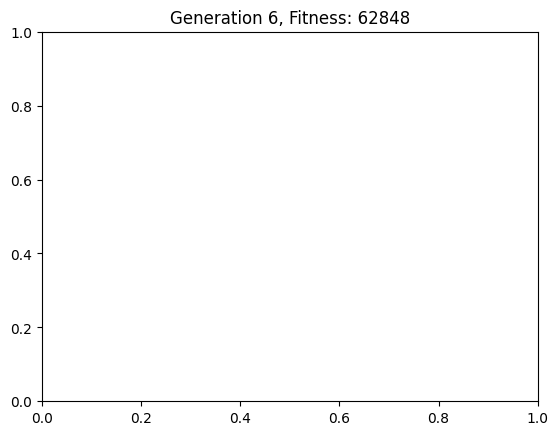

{'rooms': [{'name': 'Living Room', 'position': (590, 354), 'size': (173, 112)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (174, 103)}, {'name': 'Bedroom2', 'position': (362, 425), 'size': (157, 29)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (531, 265), 'size': (59, 96)}, {'name': 'Washroom', 'position': (436, 455), 'size': (84, 136)}], 'fitness': 62848}


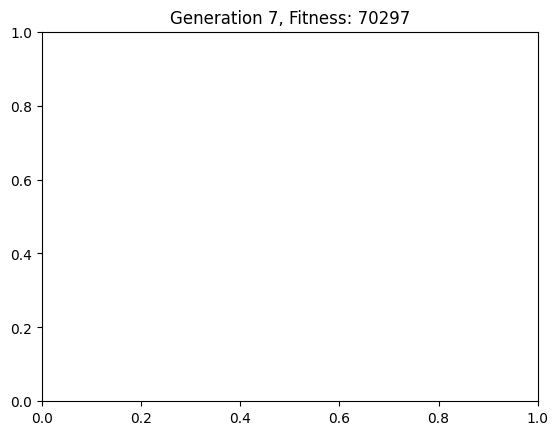

{'rooms': [{'name': 'Living Room', 'position': (590, 349), 'size': (192, 126)}, {'name': 'Bedroom1', 'position': (558, 476), 'size': (182, 111)}, {'name': 'Bedroom2', 'position': (358, 421), 'size': (161, 33)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (523, 236), 'size': (67, 125)}, {'name': 'Washroom', 'position': (436, 455), 'size': (84, 136)}], 'fitness': 70297}


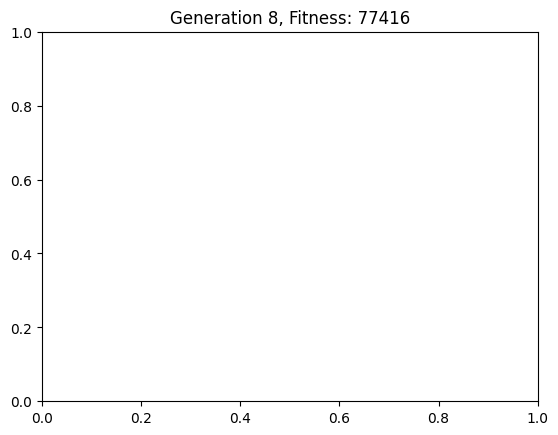

{'rooms': [{'name': 'Living Room', 'position': (590, 345), 'size': (200, 130)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (190, 116)}, {'name': 'Bedroom2', 'position': (354, 417), 'size': (165, 37)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (515, 222), 'size': (75, 139)}, {'name': 'Washroom', 'position': (436, 455), 'size': (84, 136)}], 'fitness': 77416}


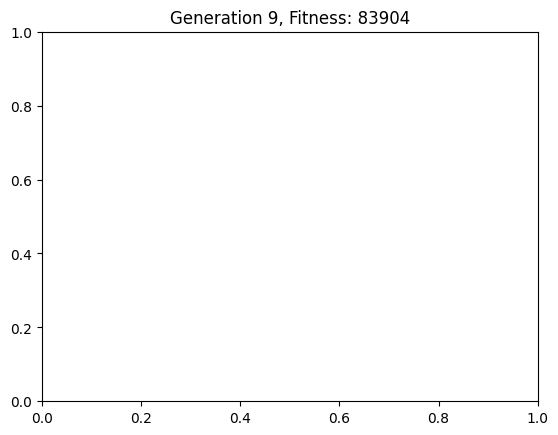

{'rooms': [{'name': 'Living Room', 'position': (590, 341), 'size': (208, 134)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (198, 116)}, {'name': 'Bedroom2', 'position': (350, 413), 'size': (169, 41)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (507, 206), 'size': (83, 155)}, {'name': 'Washroom', 'position': (435, 454), 'size': (85, 137)}], 'fitness': 83904}


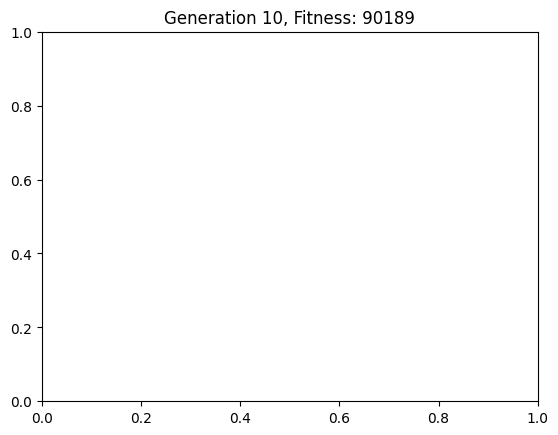

{'rooms': [{'name': 'Living Room', 'position': (590, 337), 'size': (216, 138)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (206, 116)}, {'name': 'Bedroom2', 'position': (346, 409), 'size': (173, 45)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (499, 196), 'size': (91, 165)}, {'name': 'Washroom', 'position': (435, 454), 'size': (85, 137)}], 'fitness': 90189}


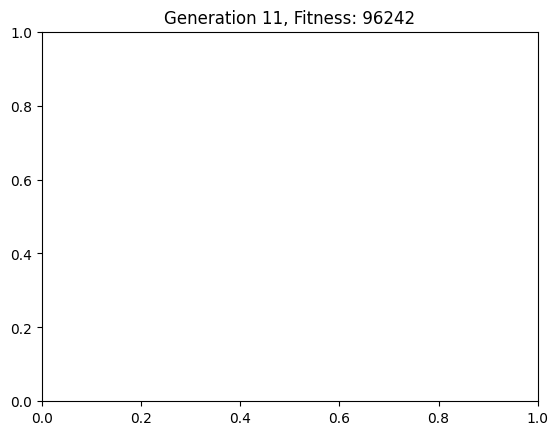

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (224, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (214, 116)}, {'name': 'Bedroom2', 'position': (342, 405), 'size': (177, 49)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (491, 201), 'size': (99, 160)}, {'name': 'Washroom', 'position': (435, 454), 'size': (85, 137)}], 'fitness': 96242}


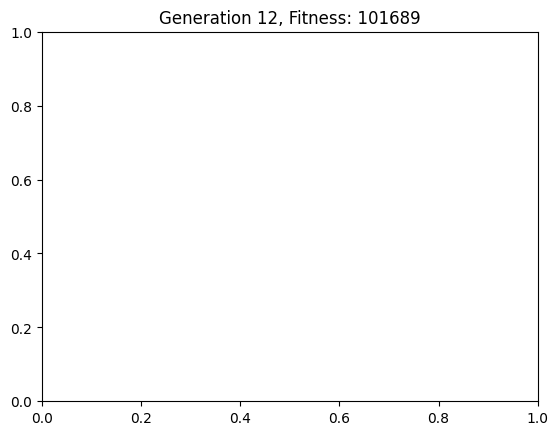

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (232, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (222, 116)}, {'name': 'Bedroom2', 'position': (338, 401), 'size': (181, 53)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (483, 172), 'size': (107, 190)}, {'name': 'Washroom', 'position': (435, 454), 'size': (85, 137)}], 'fitness': 101689}


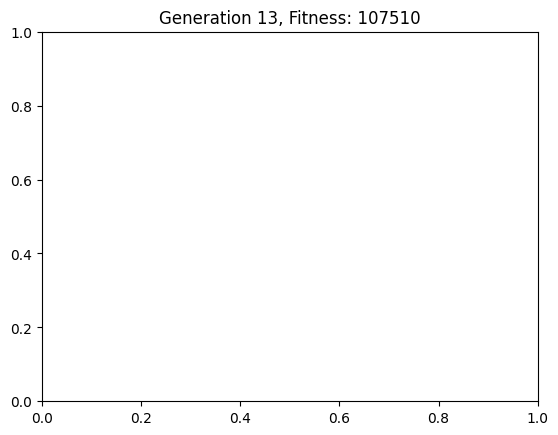

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (240, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (230, 116)}, {'name': 'Bedroom2', 'position': (338, 397), 'size': (182, 57)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (475, 165), 'size': (115, 197)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 107510}


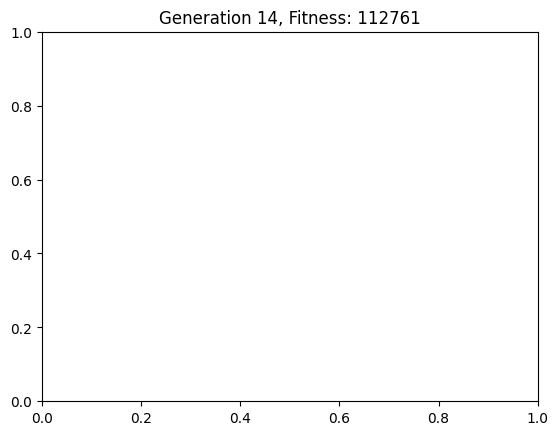

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (248, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (238, 116)}, {'name': 'Bedroom2', 'position': (338, 393), 'size': (182, 61)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (467, 151), 'size': (123, 211)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 112761}


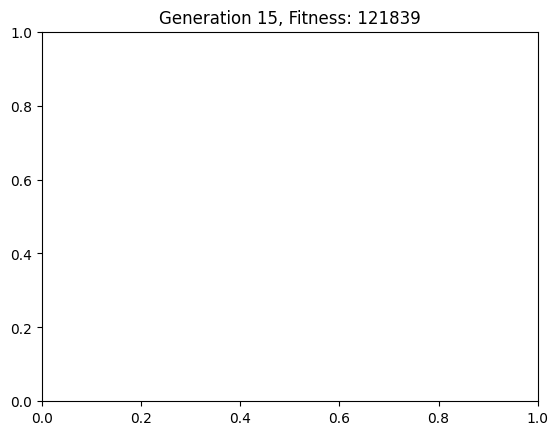

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (256, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (246, 116)}, {'name': 'Bedroom2', 'position': (338, 389), 'size': (182, 65)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (459, 138), 'size': (131, 224)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 121839}


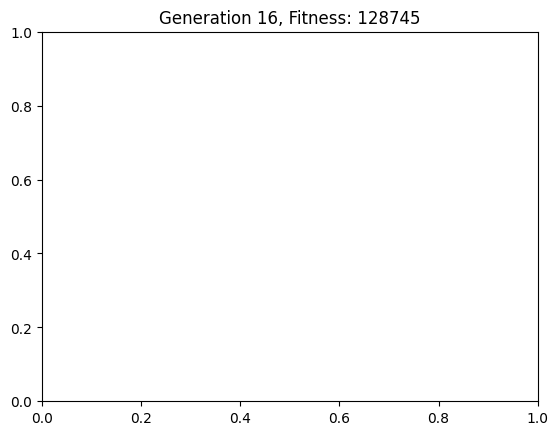

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (264, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (254, 116)}, {'name': 'Bedroom2', 'position': (338, 385), 'size': (182, 69)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (452, 139), 'size': (138, 223)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 128745}


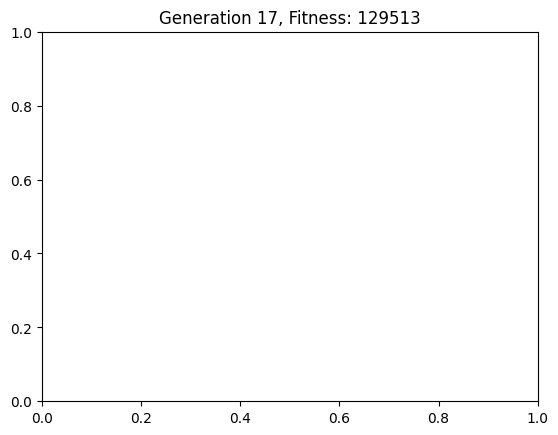

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (272, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (262, 116)}, {'name': 'Bedroom2', 'position': (338, 381), 'size': (182, 73)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (447, 113), 'size': (143, 249)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 129513}


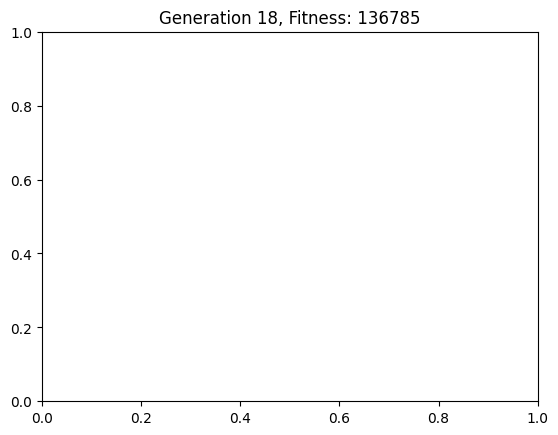

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (280, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (270, 116)}, {'name': 'Bedroom2', 'position': (338, 377), 'size': (182, 77)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (442, 124), 'size': (148, 238)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 136785}


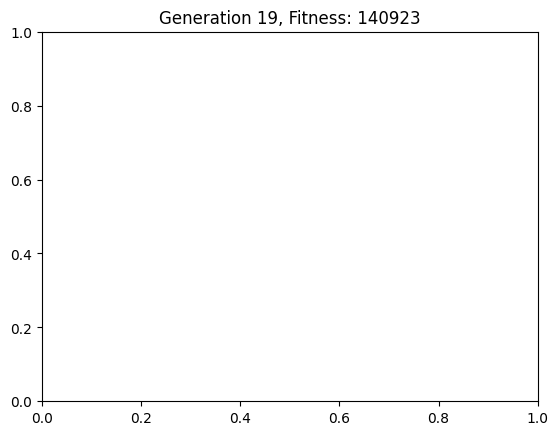

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (288, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (278, 116)}, {'name': 'Bedroom2', 'position': (338, 373), 'size': (182, 81)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (438, 119), 'size': (152, 243)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 140923}


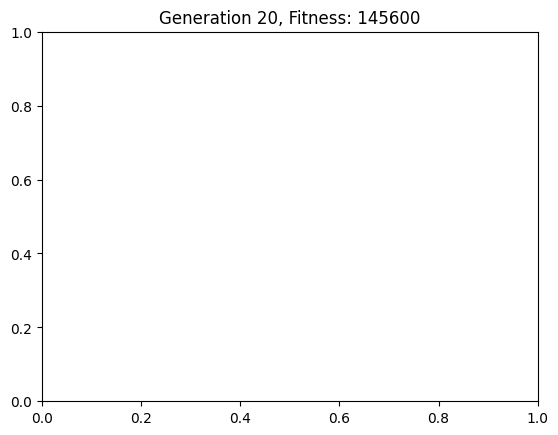

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (296, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (286, 116)}, {'name': 'Bedroom2', 'position': (338, 369), 'size': (182, 85)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (433, 111), 'size': (157, 251)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 145600}


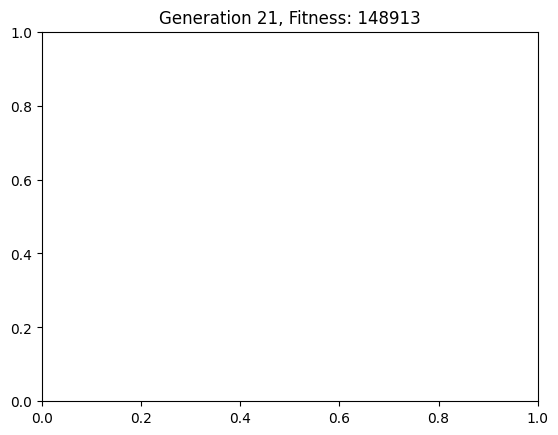

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (304, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (294, 116)}, {'name': 'Bedroom2', 'position': (338, 365), 'size': (182, 89)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (430, 100), 'size': (160, 262)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 148913}


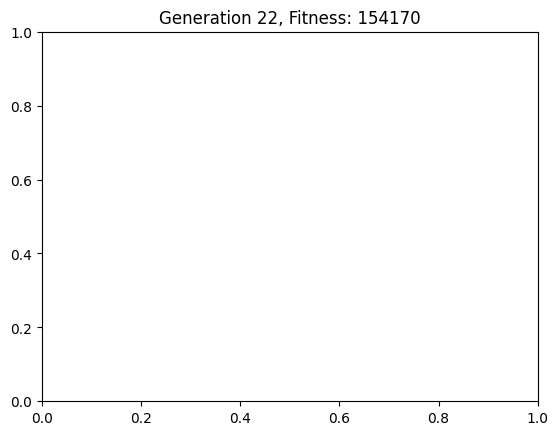

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (312, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (302, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (429, 104), 'size': (161, 258)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 154170}


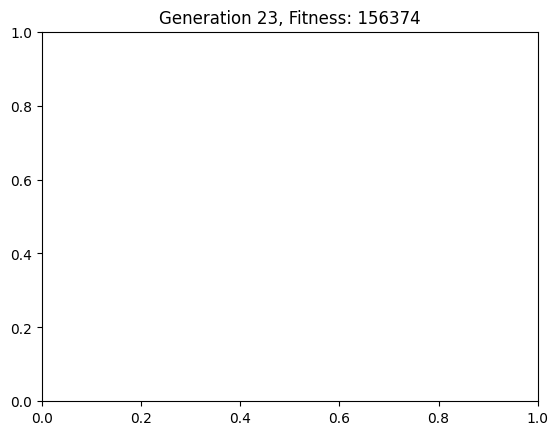

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (320, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (310, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (428, 98), 'size': (162, 264)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 156374}


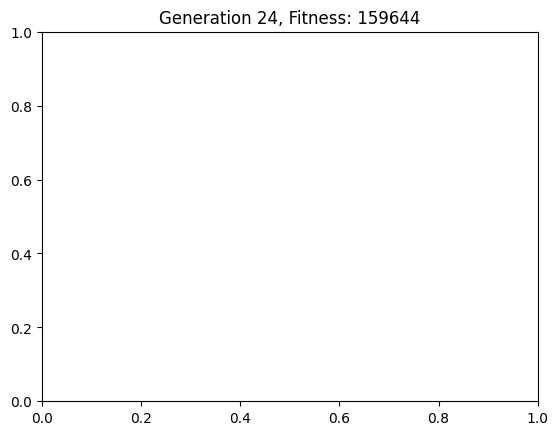

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (328, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (318, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (427, 101), 'size': (163, 261)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 159644}


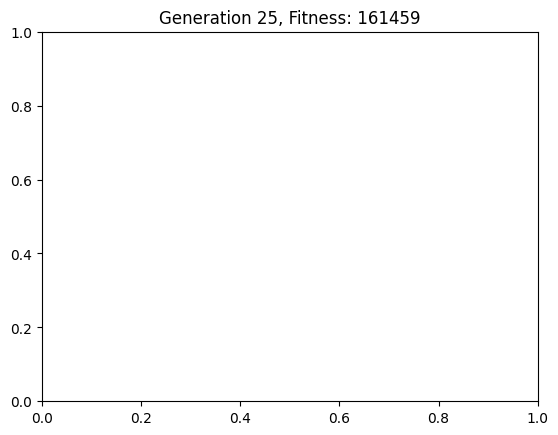

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (336, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (326, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (426, 97), 'size': (164, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 161459}


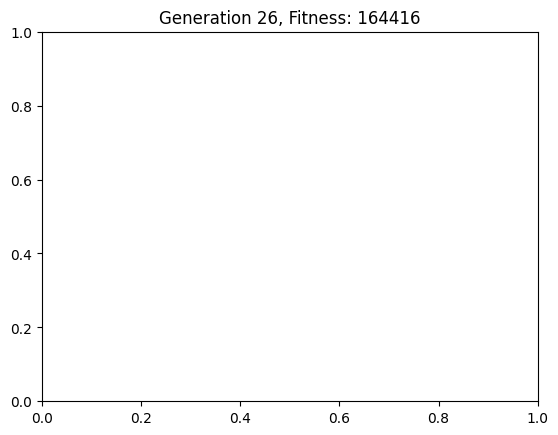

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (344, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (334, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 164416}


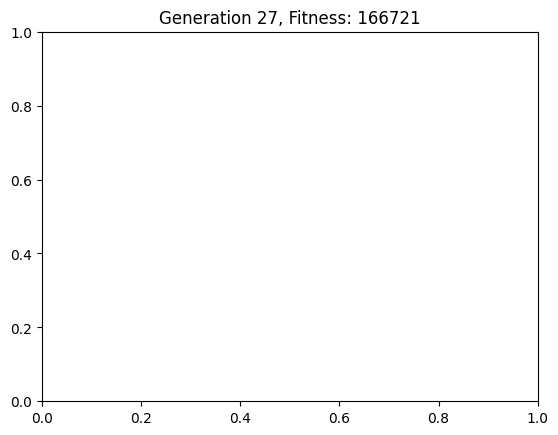

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (342, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 166721}


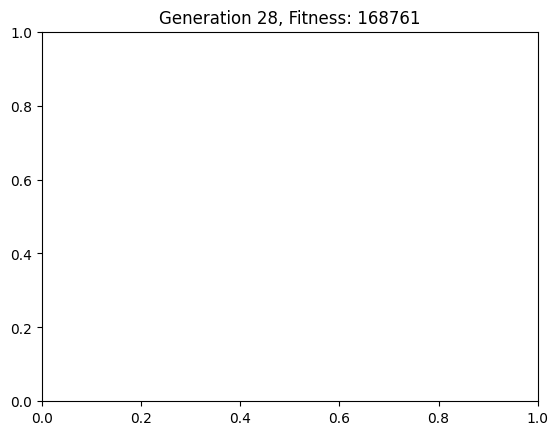

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (350, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 168761}


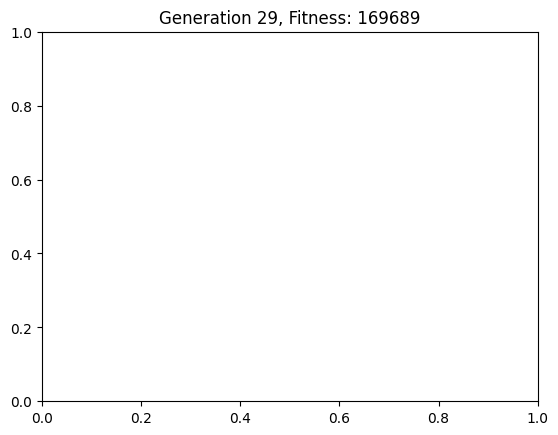

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (358, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 169689}


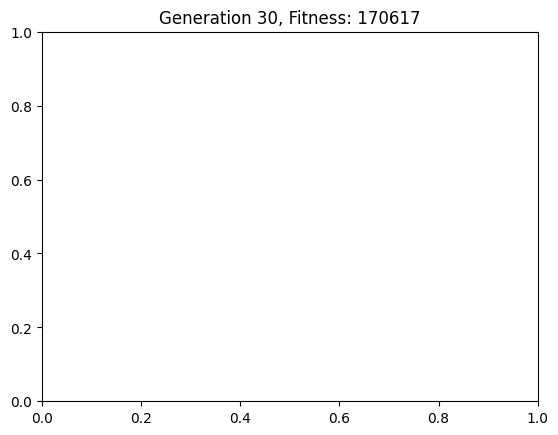

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (366, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 170617}


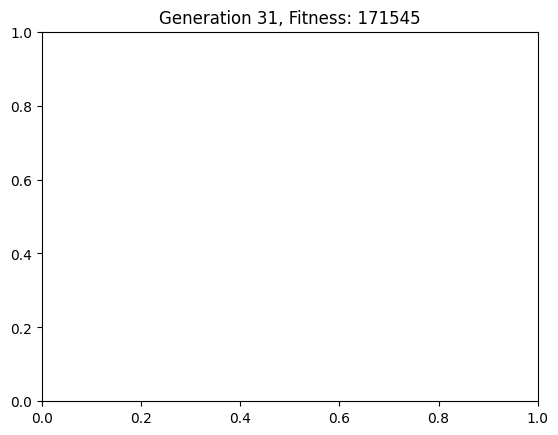

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (374, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 171545}


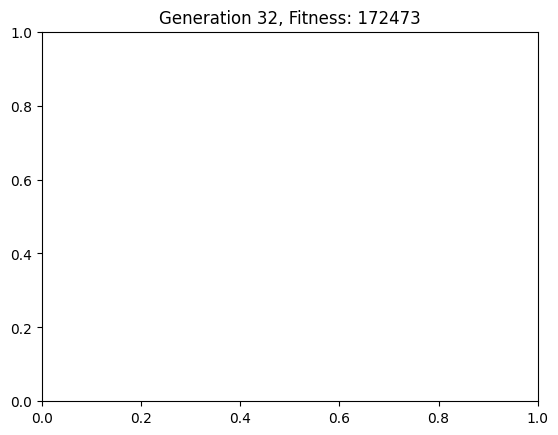

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (558, 475), 'size': (382, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 172473}


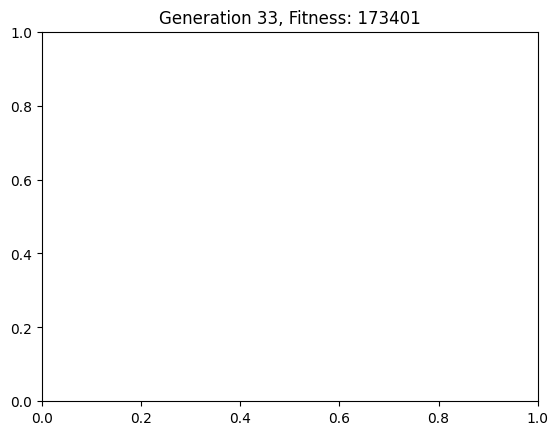

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (554, 475), 'size': (386, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 173401}


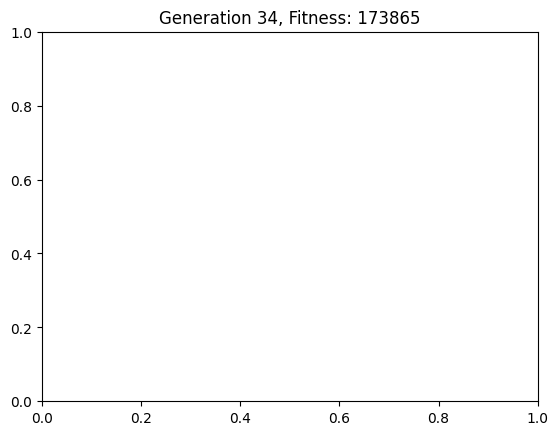

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (550, 475), 'size': (390, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 173865}


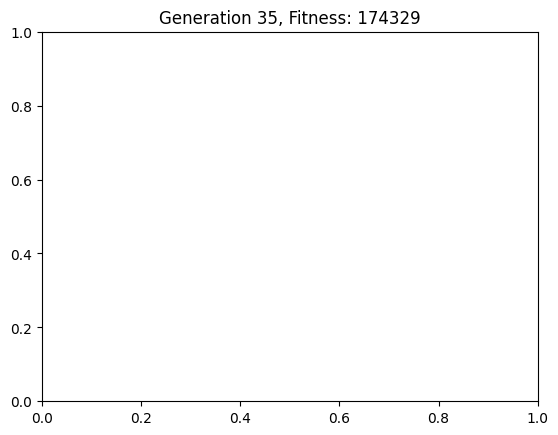

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (546, 475), 'size': (394, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 174329}


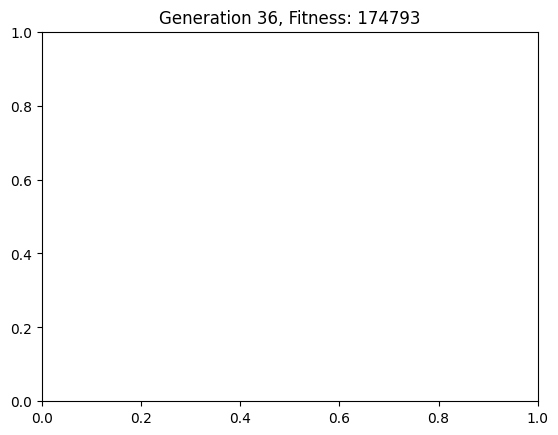

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (542, 475), 'size': (398, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 174793}


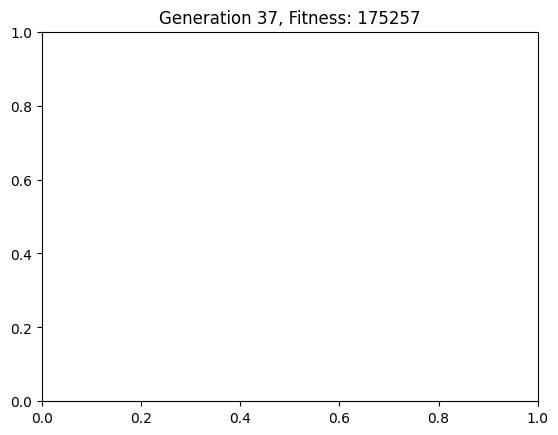

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (538, 475), 'size': (402, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (425, 97), 'size': (165, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 175257}


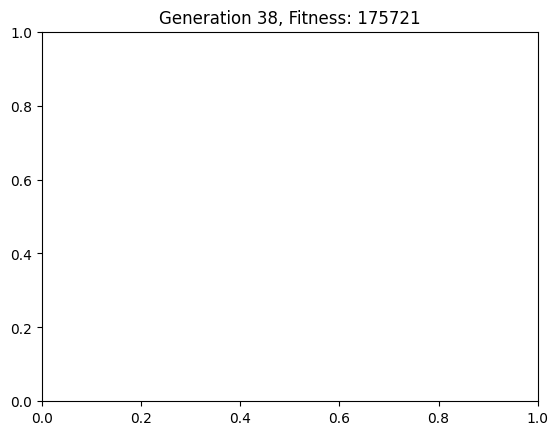

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (534, 475), 'size': (406, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 175721}


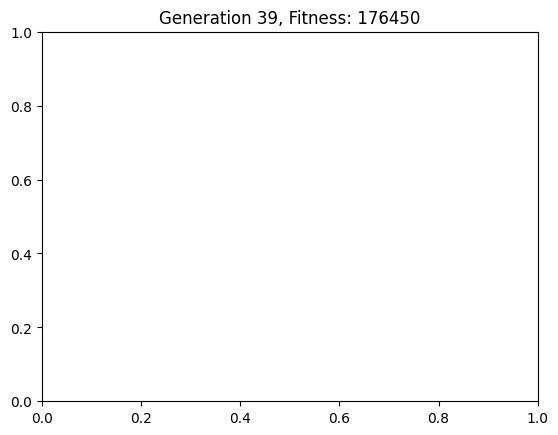

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (530, 475), 'size': (410, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 176450}


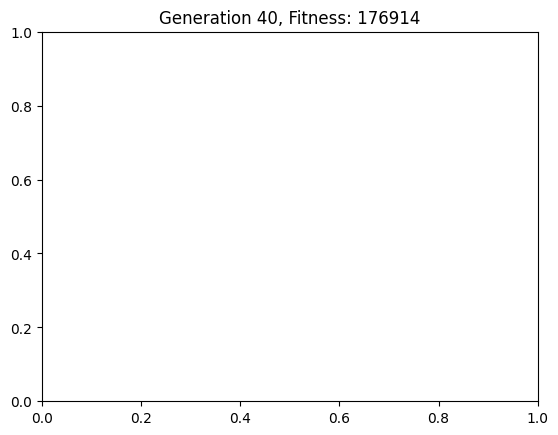

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (526, 475), 'size': (414, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 176914}


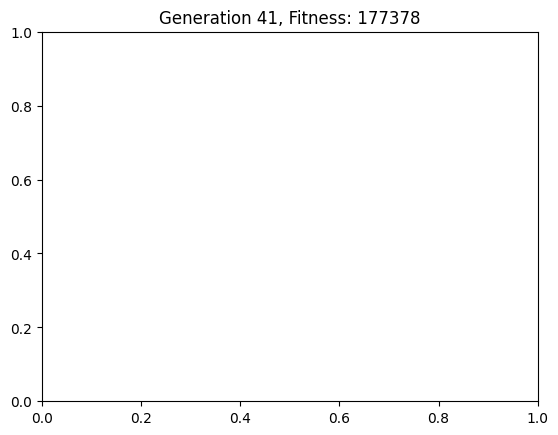

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (522, 475), 'size': (418, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 177378}


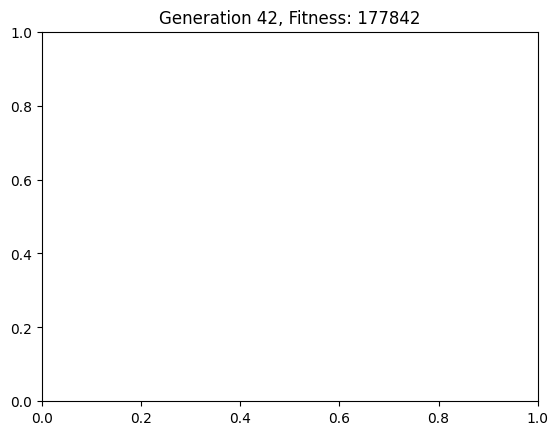

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 177842}


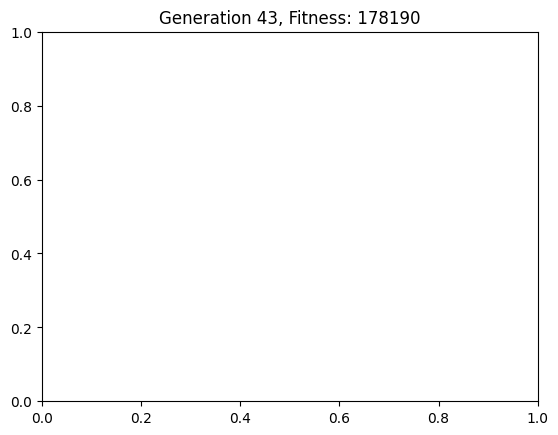

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}


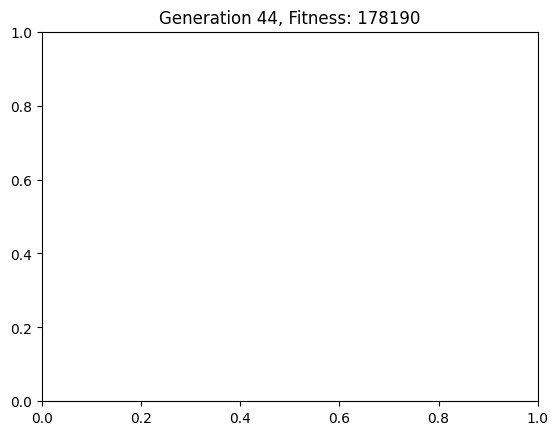

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}


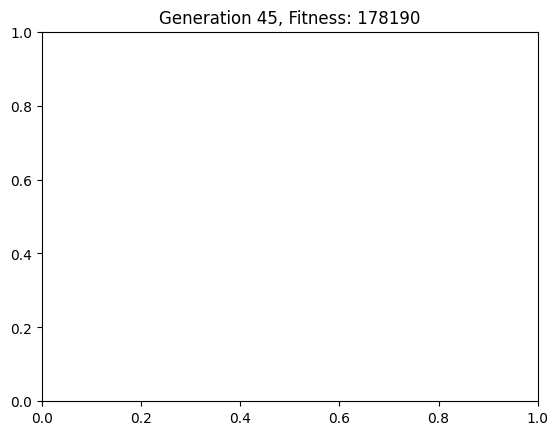

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}


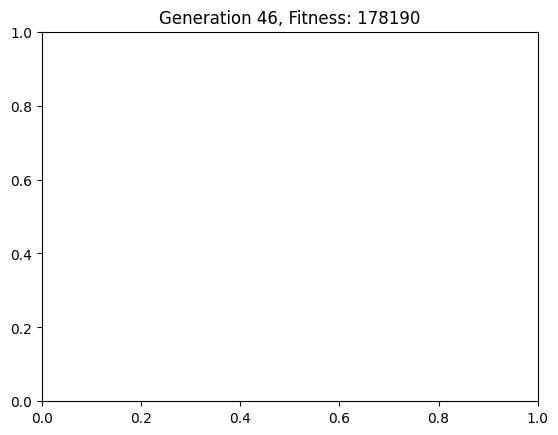

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}


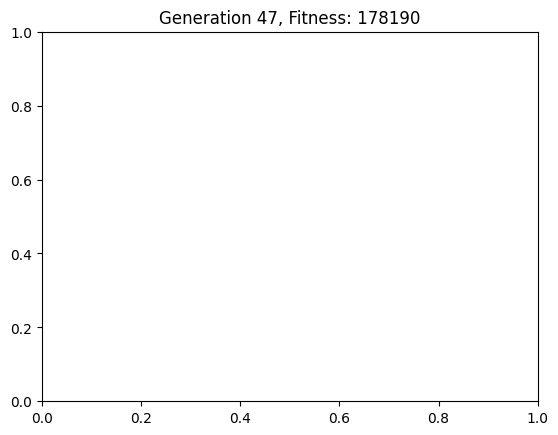

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}


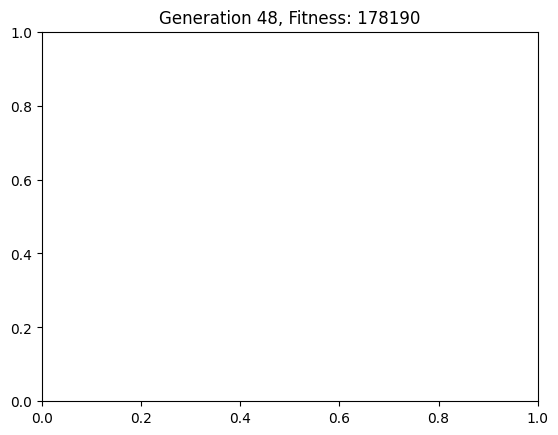

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}


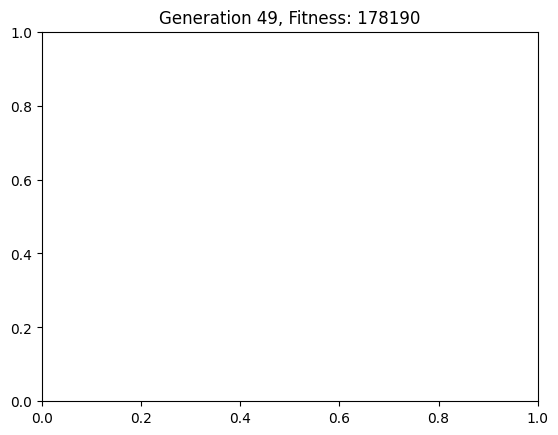

{'rooms': [{'name': 'Living Room', 'position': (590, 336), 'size': (352, 139)}, {'name': 'Bedroom1', 'position': (520, 475), 'size': (421, 116)}, {'name': 'Bedroom2', 'position': (338, 362), 'size': (182, 92)}, {'name': 'Passage', 'position': (520, 362), 'size': (70, 113)}, {'name': 'Kitchen', 'position': (424, 97), 'size': (166, 265)}, {'name': 'Washroom', 'position': (434, 454), 'size': (86, 137)}], 'fitness': 178190}
Elapsed time: 564.40 seconds


<Figure size 640x480 with 0 Axes>

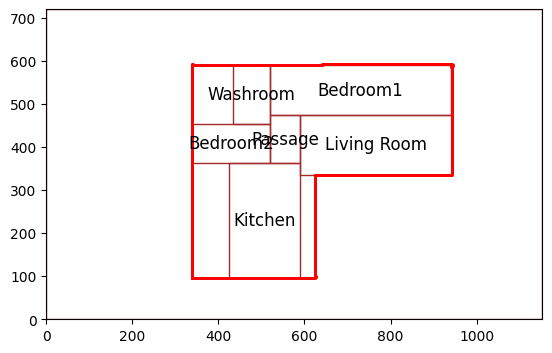

Elapsed time for initial population generation: 28.78 seconds


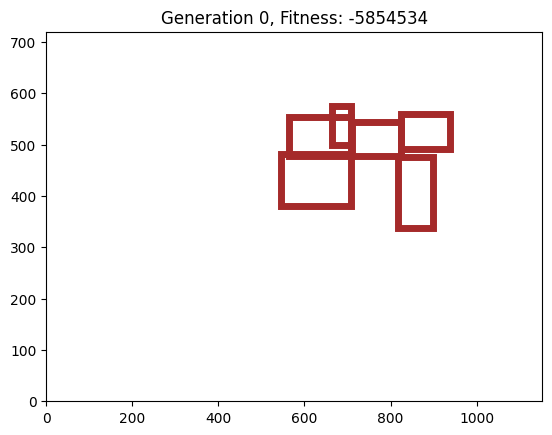

{'rooms': [{'name': 'Living Room', 'position': (546, 380), 'size': (163, 102)}, {'name': 'Passage', 'position': (710, 477), 'size': (114, 68)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (665, 500), 'size': (44, 75)}, {'name': 'Bedroom1', 'position': (564, 478), 'size': (145, 76)}, {'name': 'Bedroom2', 'position': (818, 338), 'size': (80, 138)}], 'fitness': -5854534}


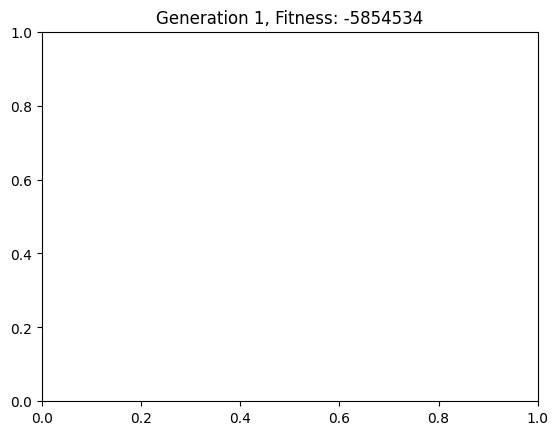

{'rooms': [{'name': 'Living Room', 'position': (546, 380), 'size': (163, 102)}, {'name': 'Passage', 'position': (710, 477), 'size': (114, 68)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (665, 500), 'size': (44, 75)}, {'name': 'Bedroom1', 'position': (564, 478), 'size': (145, 76)}, {'name': 'Bedroom2', 'position': (818, 338), 'size': (80, 138)}], 'fitness': -5854534}


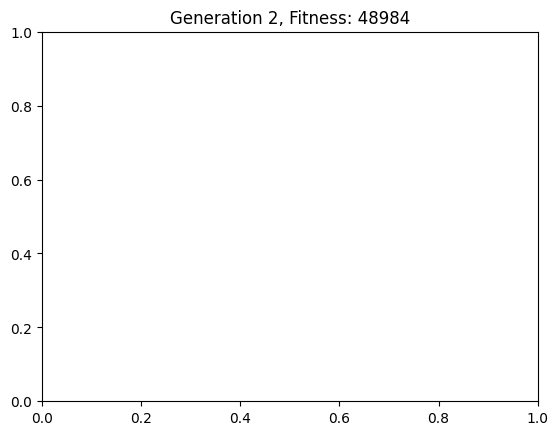

{'rooms': [{'name': 'Living Room', 'position': (546, 380), 'size': (163, 98)}, {'name': 'Passage', 'position': (710, 477), 'size': (114, 68)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (665, 500), 'size': (44, 75)}, {'name': 'Bedroom1', 'position': (564, 478), 'size': (145, 22)}, {'name': 'Bedroom2', 'position': (818, 338), 'size': (80, 138)}], 'fitness': 48984}


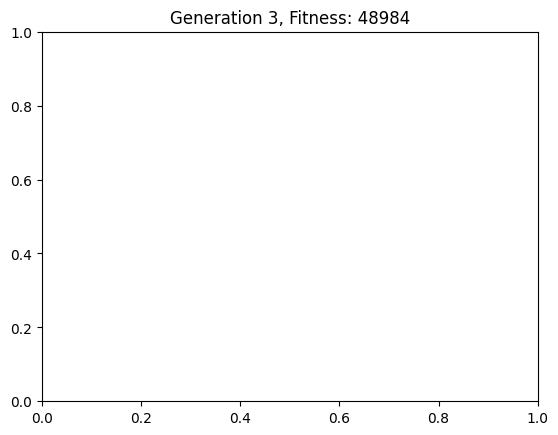

{'rooms': [{'name': 'Living Room', 'position': (546, 379), 'size': (164, 98)}, {'name': 'Passage', 'position': (710, 477), 'size': (114, 68)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (665, 500), 'size': (45, 75)}, {'name': 'Bedroom1', 'position': (564, 477), 'size': (146, 22)}, {'name': 'Bedroom2', 'position': (818, 338), 'size': (81, 139)}], 'fitness': 48984}


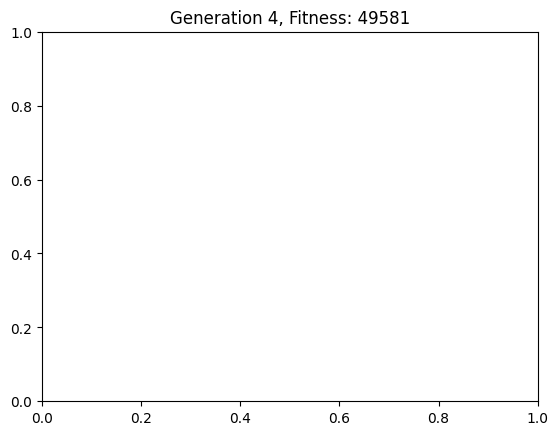

{'rooms': [{'name': 'Living Room', 'position': (546, 378), 'size': (166, 99)}, {'name': 'Bedroom1', 'position': (563, 477), 'size': (147, 23)}, {'name': 'Bedroom2', 'position': (818, 336), 'size': (84, 140)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 70)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (662, 500), 'size': (48, 80)}], 'fitness': 49581}


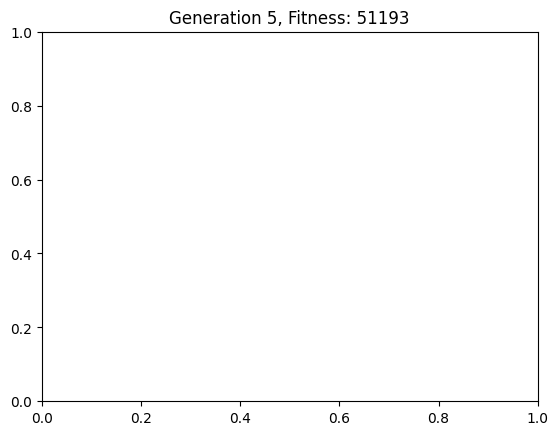

{'rooms': [{'name': 'Living Room', 'position': (546, 378), 'size': (166, 99)}, {'name': 'Bedroom1', 'position': (563, 477), 'size': (147, 23)}, {'name': 'Bedroom2', 'position': (818, 336), 'size': (84, 140)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 70)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (662, 500), 'size': (48, 80)}], 'fitness': 51193}


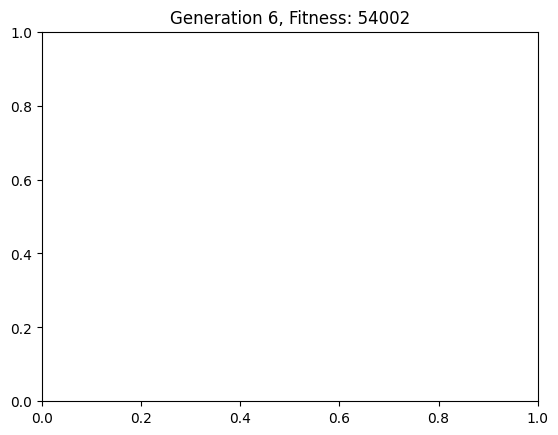

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (172, 99)}, {'name': 'Bedroom1', 'position': (560, 476), 'size': (150, 24)}, {'name': 'Bedroom2', 'position': (818, 336), 'size': (91, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 73)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (658, 500), 'size': (52, 85)}], 'fitness': 54002}


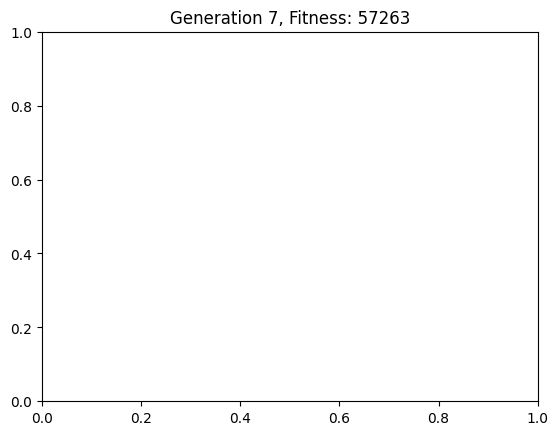

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (180, 99)}, {'name': 'Bedroom1', 'position': (556, 476), 'size': (154, 24)}, {'name': 'Bedroom2', 'position': (818, 336), 'size': (99, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 80)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (656, 500), 'size': (54, 90)}], 'fitness': 57263}


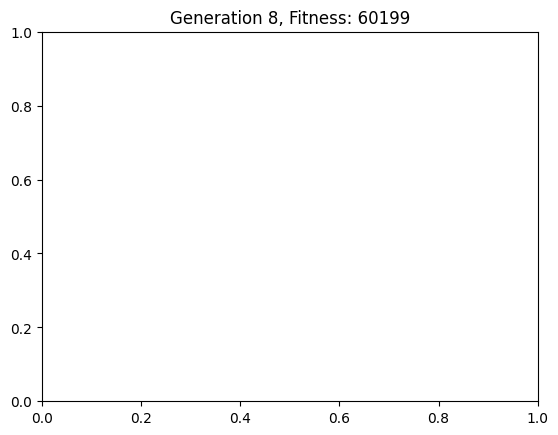

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (196, 99)}, {'name': 'Bedroom1', 'position': (548, 476), 'size': (162, 24)}, {'name': 'Bedroom2', 'position': (818, 336), 'size': (115, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 96)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (654, 500), 'size': (56, 90)}], 'fitness': 60199}


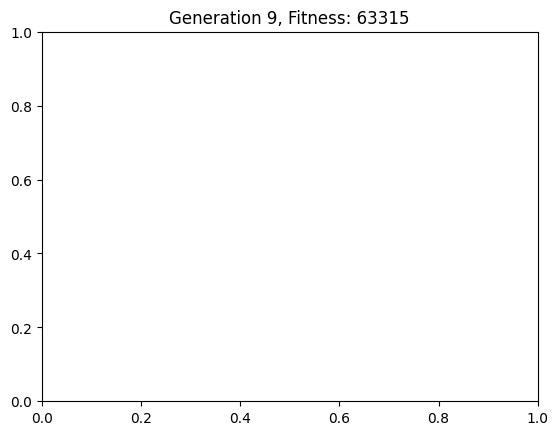

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (204, 99)}, {'name': 'Bedroom1', 'position': (544, 476), 'size': (166, 24)}, {'name': 'Bedroom2', 'position': (818, 336), 'size': (123, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 104)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 63315}


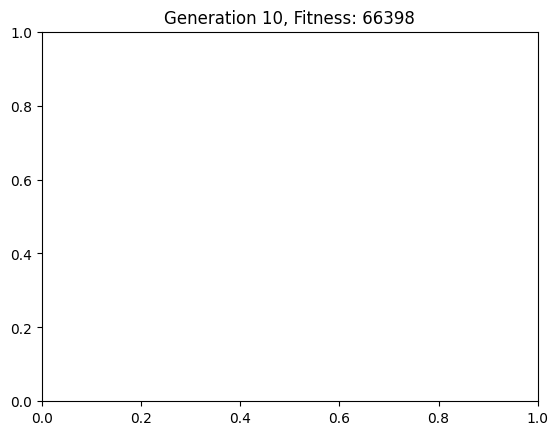

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (212, 99)}, {'name': 'Bedroom1', 'position': (540, 476), 'size': (170, 24)}, {'name': 'Bedroom2', 'position': (814, 336), 'size': (127, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 66398}


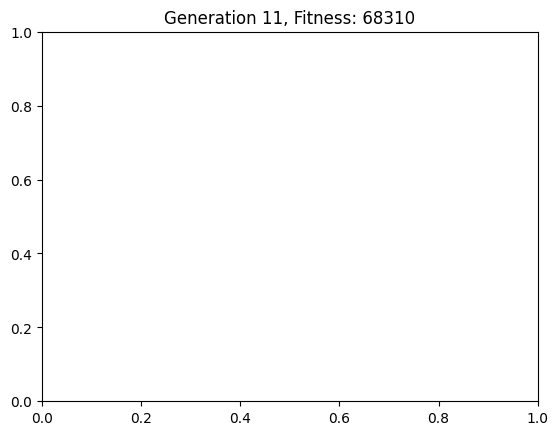

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (220, 99)}, {'name': 'Bedroom1', 'position': (536, 476), 'size': (174, 24)}, {'name': 'Bedroom2', 'position': (810, 336), 'size': (131, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 68310}


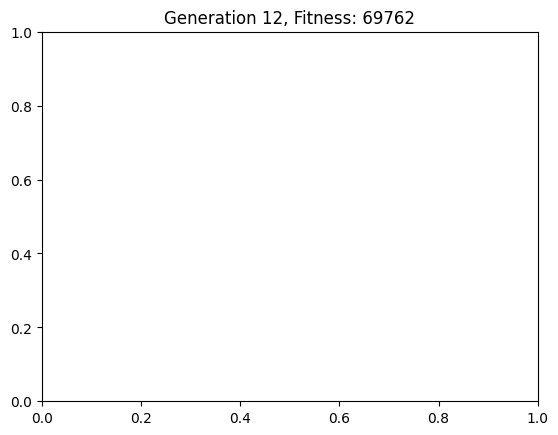

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (228, 99)}, {'name': 'Bedroom1', 'position': (532, 476), 'size': (178, 24)}, {'name': 'Bedroom2', 'position': (806, 336), 'size': (135, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 69762}


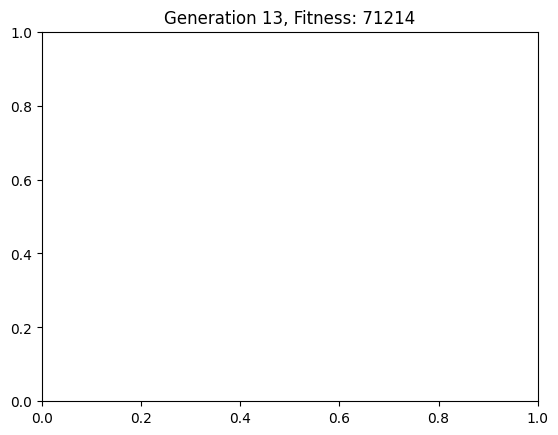

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (236, 99)}, {'name': 'Bedroom1', 'position': (528, 476), 'size': (182, 24)}, {'name': 'Bedroom2', 'position': (802, 336), 'size': (139, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 71214}


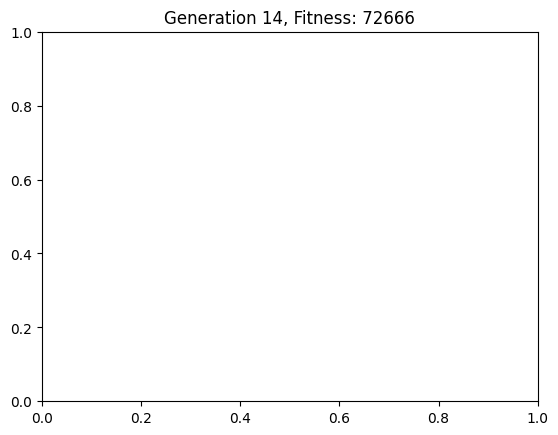

{'rooms': [{'name': 'Living Room', 'position': (546, 377), 'size': (244, 99)}, {'name': 'Bedroom1', 'position': (524, 476), 'size': (186, 24)}, {'name': 'Bedroom2', 'position': (798, 336), 'size': (143, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 72666}


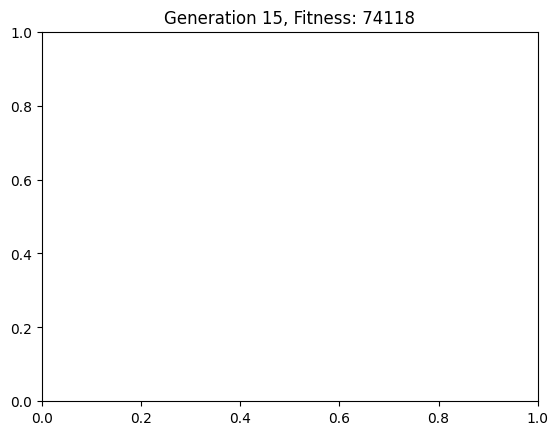

{'rooms': [{'name': 'Living Room', 'position': (544, 377), 'size': (250, 99)}, {'name': 'Bedroom1', 'position': (520, 476), 'size': (190, 24)}, {'name': 'Bedroom2', 'position': (795, 336), 'size': (147, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 74118}


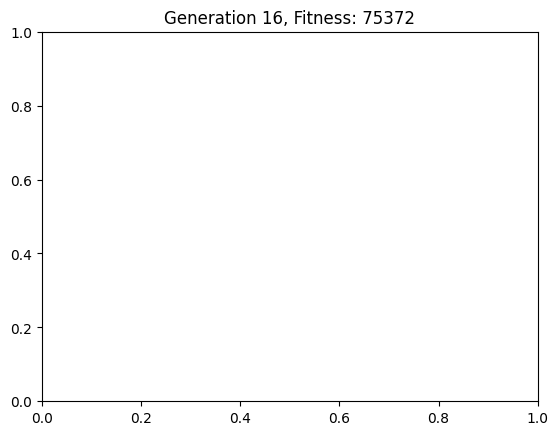

{'rooms': [{'name': 'Living Room', 'position': (539, 377), 'size': (253, 99)}, {'name': 'Bedroom1', 'position': (516, 476), 'size': (194, 24)}, {'name': 'Bedroom2', 'position': (792, 336), 'size': (149, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (653, 500), 'size': (57, 91)}], 'fitness': 75372}


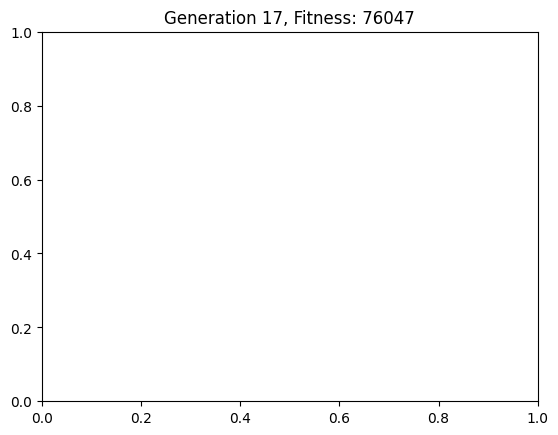

{'rooms': [{'name': 'Living Room', 'position': (534, 377), 'size': (256, 99)}, {'name': 'Bedroom1', 'position': (512, 476), 'size': (198, 24)}, {'name': 'Bedroom2', 'position': (790, 336), 'size': (152, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 76047}


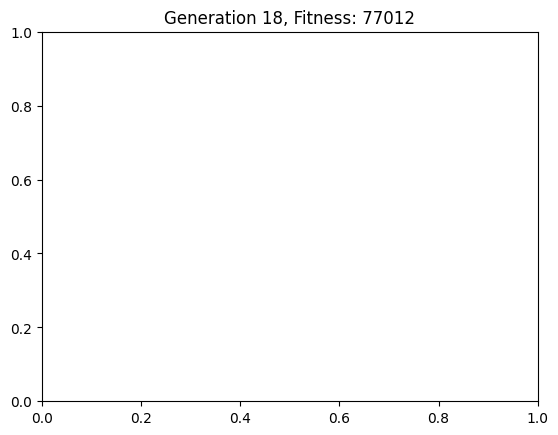

{'rooms': [{'name': 'Living Room', 'position': (528, 377), 'size': (258, 99)}, {'name': 'Bedroom1', 'position': (508, 476), 'size': (202, 24)}, {'name': 'Bedroom2', 'position': (787, 336), 'size': (155, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 77012}


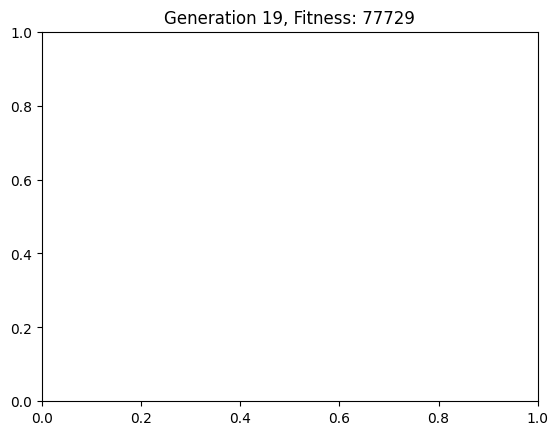

{'rooms': [{'name': 'Living Room', 'position': (523, 377), 'size': (261, 99)}, {'name': 'Bedroom1', 'position': (504, 476), 'size': (206, 24)}, {'name': 'Bedroom2', 'position': (784, 336), 'size': (157, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 77729}


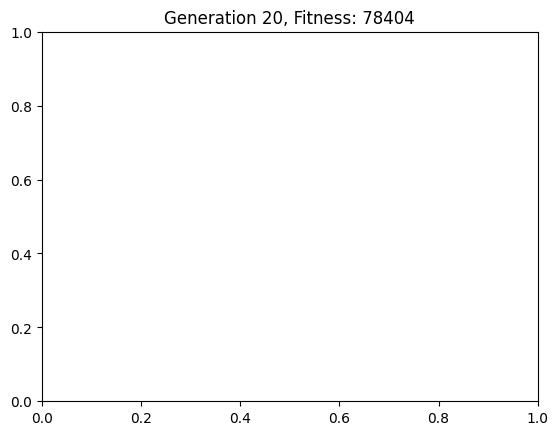

{'rooms': [{'name': 'Living Room', 'position': (518, 377), 'size': (264, 99)}, {'name': 'Bedroom1', 'position': (500, 476), 'size': (210, 24)}, {'name': 'Bedroom2', 'position': (782, 336), 'size': (160, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 78404}


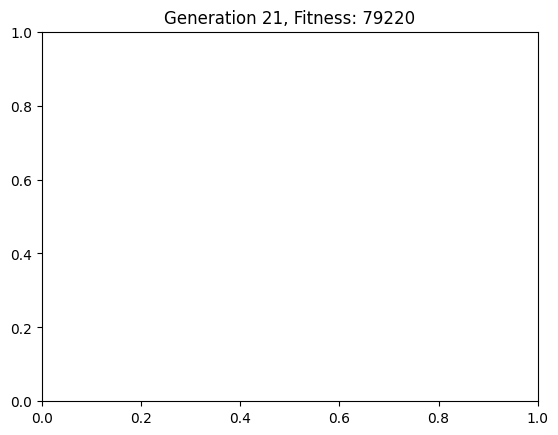

{'rooms': [{'name': 'Living Room', 'position': (512, 377), 'size': (266, 99)}, {'name': 'Bedroom1', 'position': (496, 476), 'size': (214, 24)}, {'name': 'Bedroom2', 'position': (779, 336), 'size': (163, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 79220}


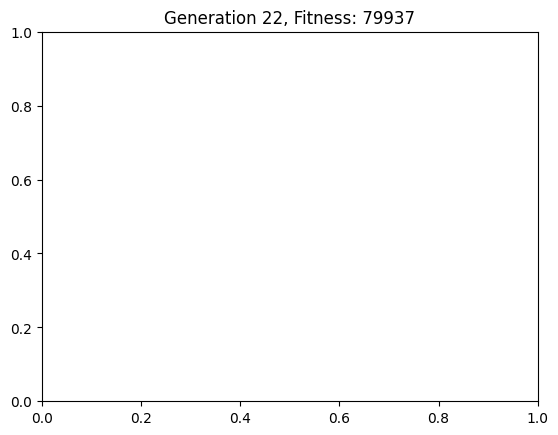

{'rooms': [{'name': 'Living Room', 'position': (507, 377), 'size': (269, 99)}, {'name': 'Bedroom1', 'position': (492, 476), 'size': (218, 24)}, {'name': 'Bedroom2', 'position': (776, 336), 'size': (165, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 79937}


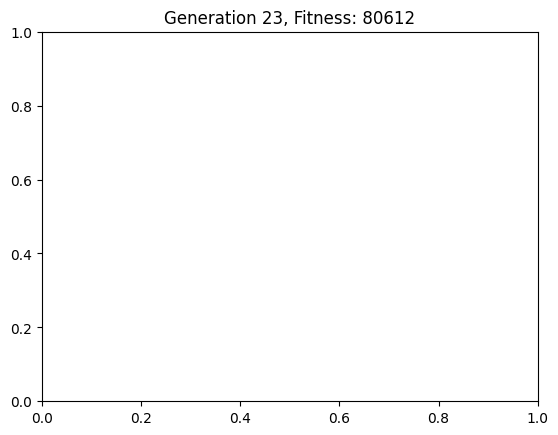

{'rooms': [{'name': 'Living Room', 'position': (502, 377), 'size': (272, 99)}, {'name': 'Bedroom1', 'position': (488, 476), 'size': (222, 24)}, {'name': 'Bedroom2', 'position': (774, 336), 'size': (168, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 80612}


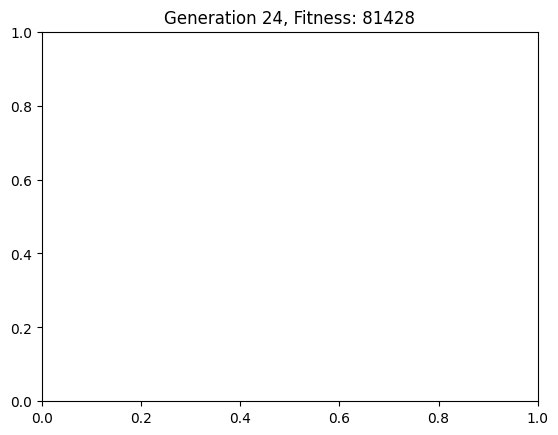

{'rooms': [{'name': 'Living Room', 'position': (496, 377), 'size': (274, 99)}, {'name': 'Bedroom1', 'position': (484, 476), 'size': (226, 24)}, {'name': 'Bedroom2', 'position': (771, 336), 'size': (171, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 81428}


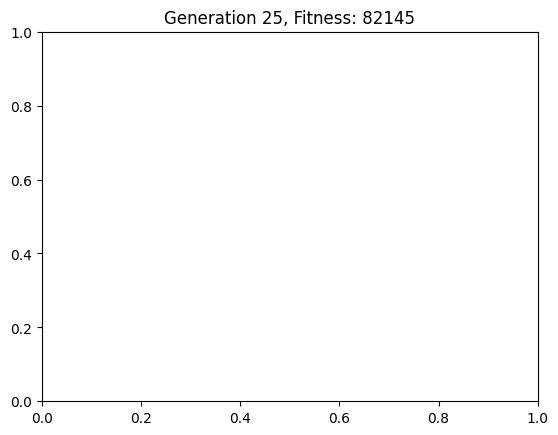

{'rooms': [{'name': 'Living Room', 'position': (491, 377), 'size': (277, 99)}, {'name': 'Bedroom1', 'position': (480, 476), 'size': (230, 24)}, {'name': 'Bedroom2', 'position': (768, 336), 'size': (173, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 82145}


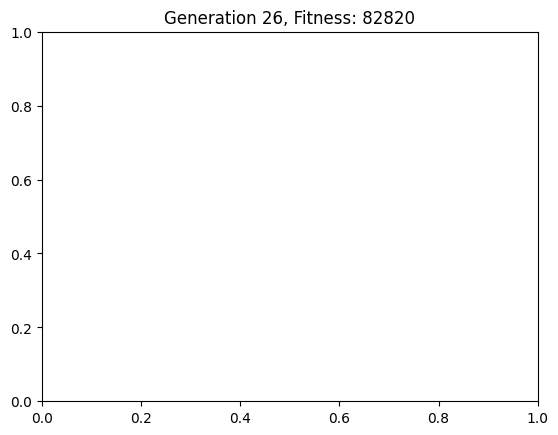

{'rooms': [{'name': 'Living Room', 'position': (486, 377), 'size': (280, 99)}, {'name': 'Bedroom1', 'position': (476, 476), 'size': (234, 24)}, {'name': 'Bedroom2', 'position': (766, 336), 'size': (176, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 82820}


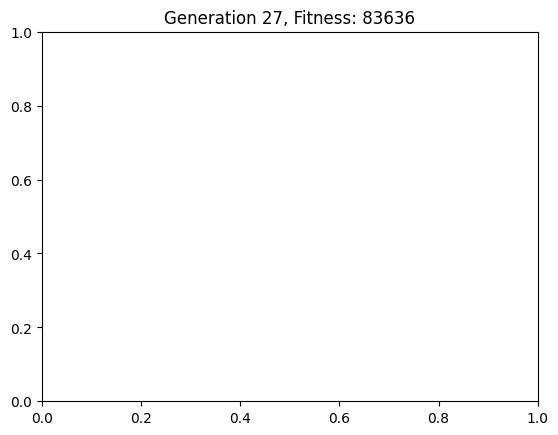

{'rooms': [{'name': 'Living Room', 'position': (480, 377), 'size': (282, 99)}, {'name': 'Bedroom1', 'position': (472, 476), 'size': (238, 24)}, {'name': 'Bedroom2', 'position': (763, 336), 'size': (179, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 83636}


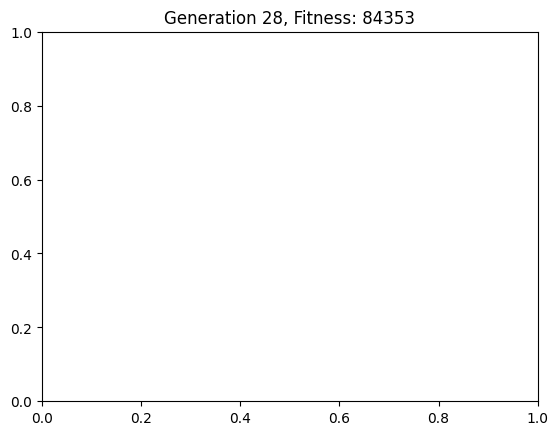

{'rooms': [{'name': 'Living Room', 'position': (475, 377), 'size': (285, 99)}, {'name': 'Bedroom1', 'position': (468, 476), 'size': (242, 24)}, {'name': 'Bedroom2', 'position': (760, 336), 'size': (181, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 84353}


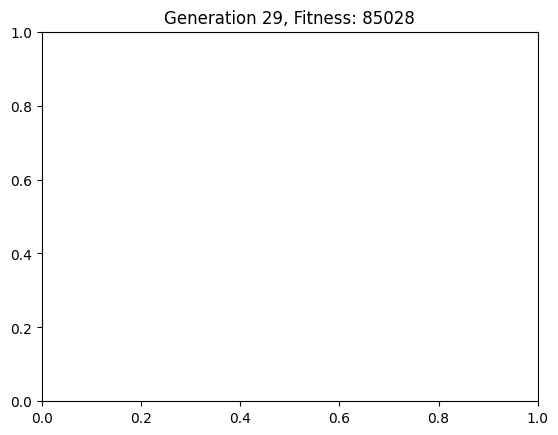

{'rooms': [{'name': 'Living Room', 'position': (470, 377), 'size': (288, 99)}, {'name': 'Bedroom1', 'position': (464, 476), 'size': (246, 24)}, {'name': 'Bedroom2', 'position': (758, 336), 'size': (184, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 85028}


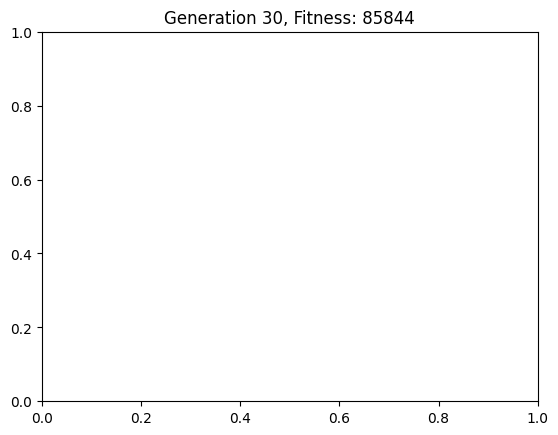

{'rooms': [{'name': 'Living Room', 'position': (464, 377), 'size': (290, 99)}, {'name': 'Bedroom1', 'position': (460, 476), 'size': (250, 24)}, {'name': 'Bedroom2', 'position': (755, 336), 'size': (187, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 85844}


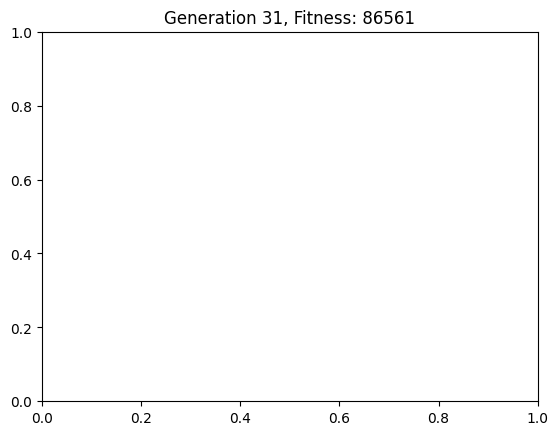

{'rooms': [{'name': 'Living Room', 'position': (459, 377), 'size': (293, 99)}, {'name': 'Bedroom1', 'position': (456, 476), 'size': (254, 24)}, {'name': 'Bedroom2', 'position': (752, 336), 'size': (189, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 86561}


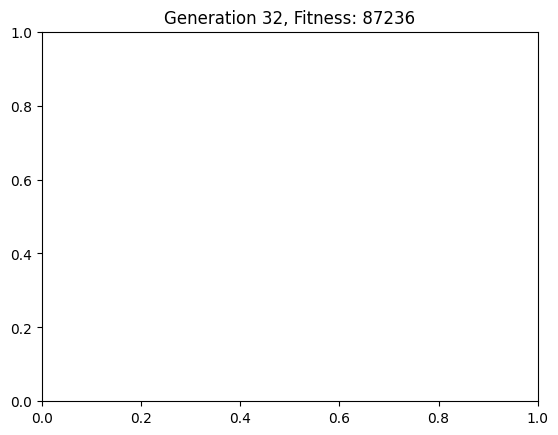

{'rooms': [{'name': 'Living Room', 'position': (454, 377), 'size': (296, 99)}, {'name': 'Bedroom1', 'position': (452, 476), 'size': (258, 24)}, {'name': 'Bedroom2', 'position': (750, 336), 'size': (192, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 87236}


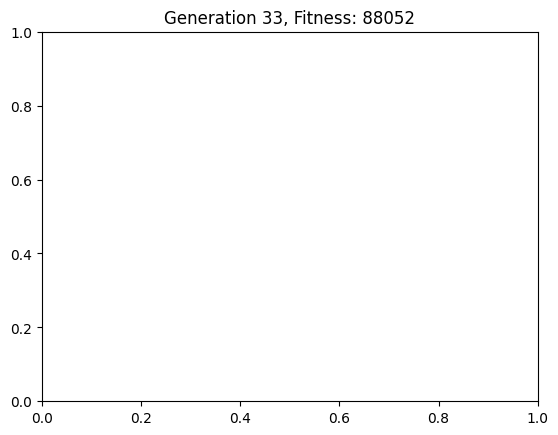

{'rooms': [{'name': 'Living Room', 'position': (448, 377), 'size': (298, 99)}, {'name': 'Bedroom1', 'position': (448, 476), 'size': (262, 24)}, {'name': 'Bedroom2', 'position': (747, 336), 'size': (195, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 88052}


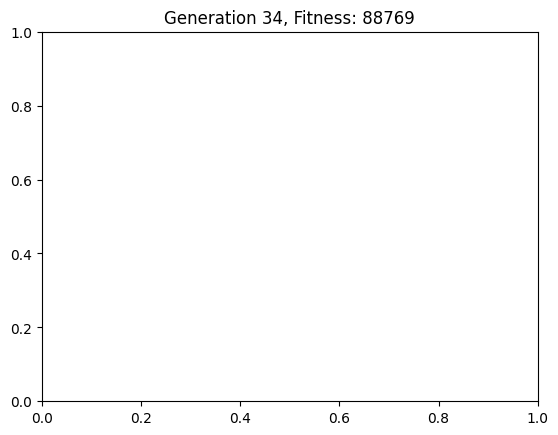

{'rooms': [{'name': 'Living Room', 'position': (443, 377), 'size': (301, 99)}, {'name': 'Bedroom1', 'position': (444, 476), 'size': (266, 24)}, {'name': 'Bedroom2', 'position': (744, 336), 'size': (197, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 88769}


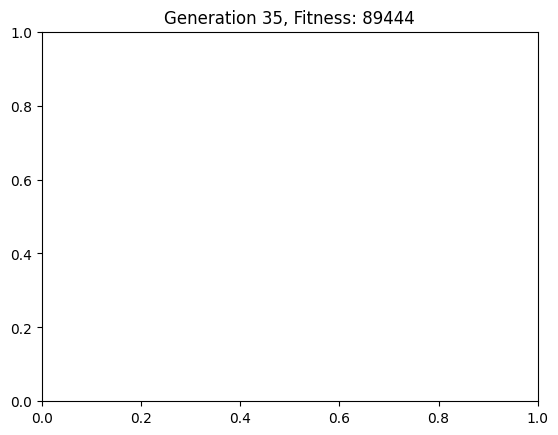

{'rooms': [{'name': 'Living Room', 'position': (438, 377), 'size': (304, 99)}, {'name': 'Bedroom1', 'position': (440, 476), 'size': (270, 24)}, {'name': 'Bedroom2', 'position': (742, 336), 'size': (200, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 89444}


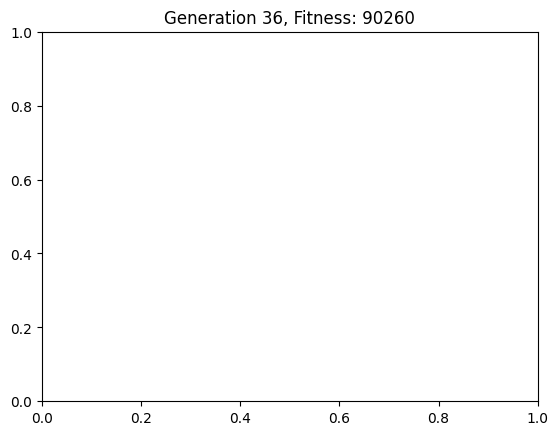

{'rooms': [{'name': 'Living Room', 'position': (432, 377), 'size': (306, 99)}, {'name': 'Bedroom1', 'position': (436, 476), 'size': (274, 24)}, {'name': 'Bedroom2', 'position': (739, 336), 'size': (203, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 90260}


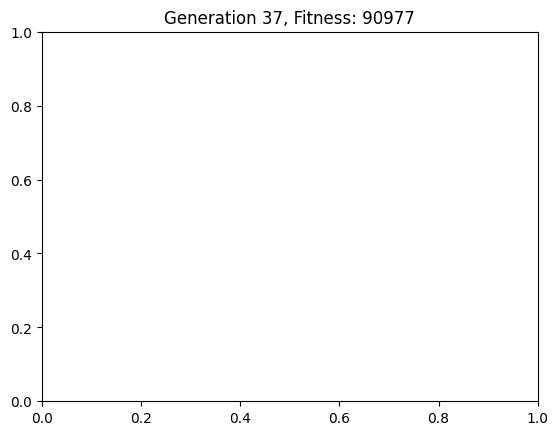

{'rooms': [{'name': 'Living Room', 'position': (427, 377), 'size': (309, 99)}, {'name': 'Bedroom1', 'position': (432, 476), 'size': (278, 24)}, {'name': 'Bedroom2', 'position': (736, 336), 'size': (205, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 90977}


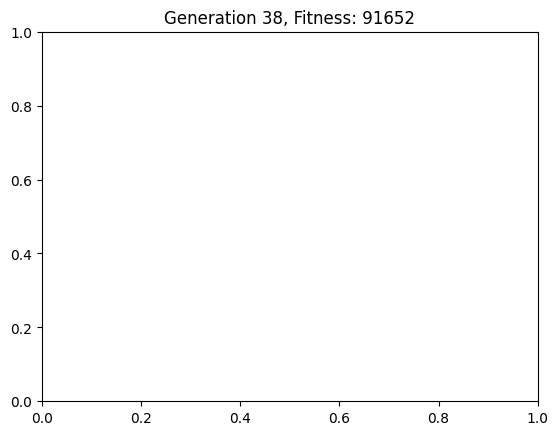

{'rooms': [{'name': 'Living Room', 'position': (422, 377), 'size': (312, 99)}, {'name': 'Bedroom1', 'position': (428, 476), 'size': (282, 24)}, {'name': 'Bedroom2', 'position': (734, 336), 'size': (208, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 91652}


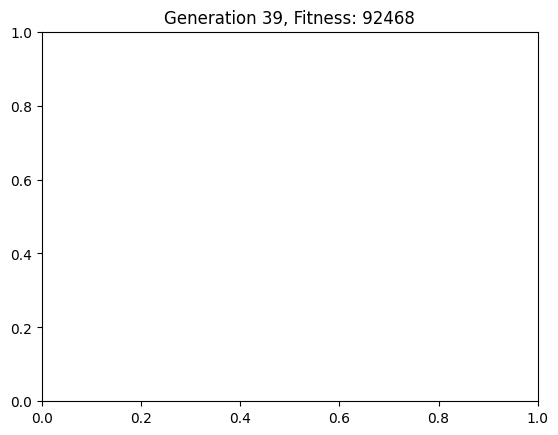

{'rooms': [{'name': 'Living Room', 'position': (416, 377), 'size': (314, 99)}, {'name': 'Bedroom1', 'position': (424, 476), 'size': (286, 24)}, {'name': 'Bedroom2', 'position': (731, 336), 'size': (211, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 92468}


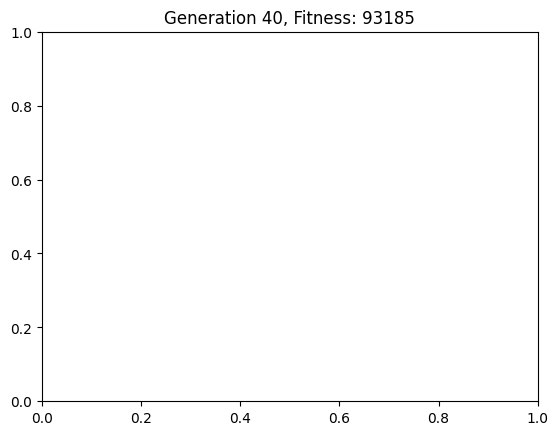

{'rooms': [{'name': 'Living Room', 'position': (411, 377), 'size': (317, 99)}, {'name': 'Bedroom1', 'position': (420, 476), 'size': (290, 24)}, {'name': 'Bedroom2', 'position': (728, 336), 'size': (213, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 93185}


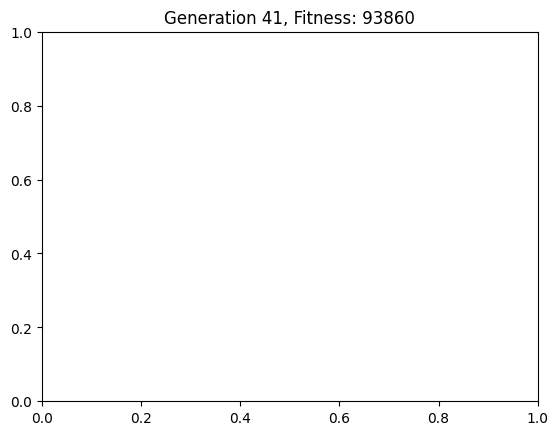

{'rooms': [{'name': 'Living Room', 'position': (406, 377), 'size': (320, 99)}, {'name': 'Bedroom1', 'position': (416, 476), 'size': (294, 24)}, {'name': 'Bedroom2', 'position': (726, 336), 'size': (216, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 93860}


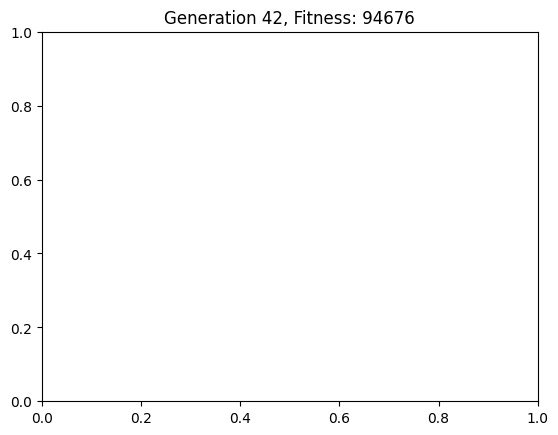

{'rooms': [{'name': 'Living Room', 'position': (400, 377), 'size': (322, 99)}, {'name': 'Bedroom1', 'position': (412, 476), 'size': (298, 24)}, {'name': 'Bedroom2', 'position': (723, 336), 'size': (219, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 94676}


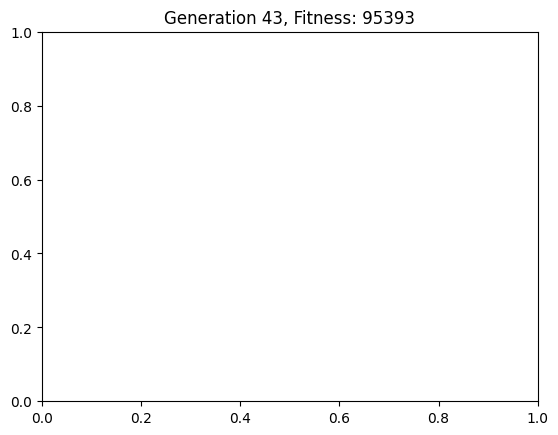

{'rooms': [{'name': 'Living Room', 'position': (395, 377), 'size': (325, 99)}, {'name': 'Bedroom1', 'position': (408, 476), 'size': (302, 24)}, {'name': 'Bedroom2', 'position': (720, 336), 'size': (221, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 95393}


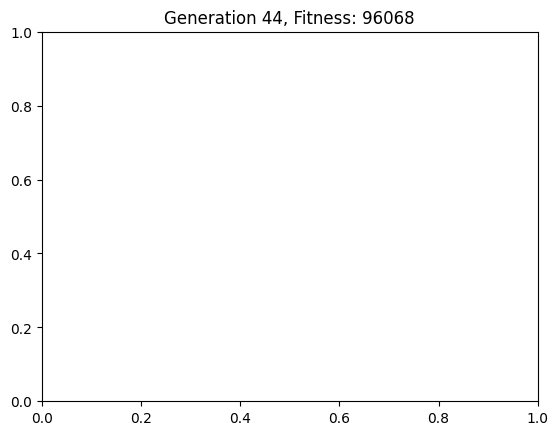

{'rooms': [{'name': 'Living Room', 'position': (390, 377), 'size': (328, 99)}, {'name': 'Bedroom1', 'position': (404, 476), 'size': (306, 24)}, {'name': 'Bedroom2', 'position': (718, 336), 'size': (224, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 96068}


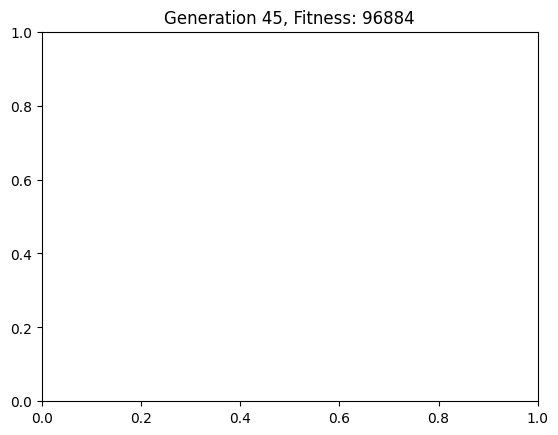

{'rooms': [{'name': 'Living Room', 'position': (384, 377), 'size': (330, 99)}, {'name': 'Bedroom1', 'position': (400, 476), 'size': (310, 24)}, {'name': 'Bedroom2', 'position': (715, 336), 'size': (227, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 96884}


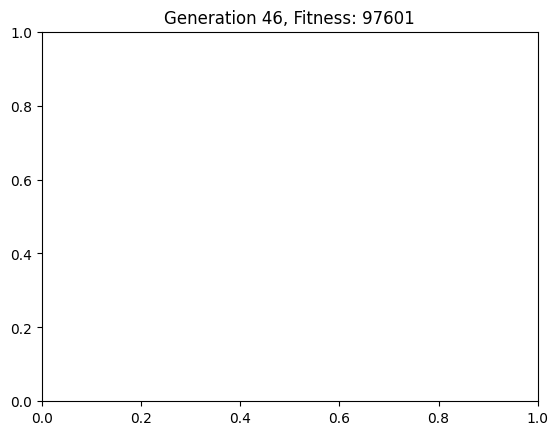

{'rooms': [{'name': 'Living Room', 'position': (379, 377), 'size': (333, 99)}, {'name': 'Bedroom1', 'position': (396, 476), 'size': (314, 24)}, {'name': 'Bedroom2', 'position': (712, 336), 'size': (229, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 97601}


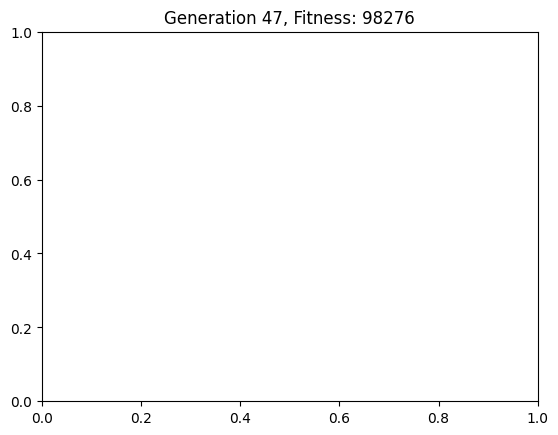

{'rooms': [{'name': 'Living Room', 'position': (375, 377), 'size': (335, 99)}, {'name': 'Bedroom1', 'position': (392, 476), 'size': (318, 24)}, {'name': 'Bedroom2', 'position': (710, 336), 'size': (232, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 98276}


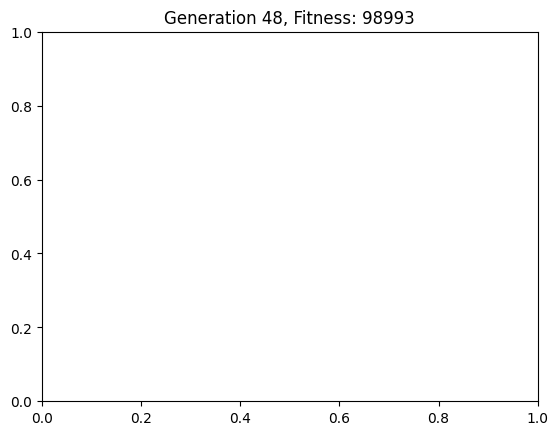

{'rooms': [{'name': 'Living Room', 'position': (375, 377), 'size': (335, 99)}, {'name': 'Bedroom1', 'position': (388, 476), 'size': (322, 24)}, {'name': 'Bedroom2', 'position': (710, 336), 'size': (232, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 98993}


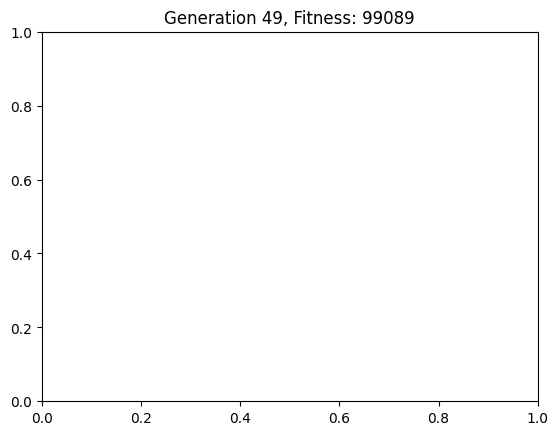

{'rooms': [{'name': 'Living Room', 'position': (375, 377), 'size': (335, 99)}, {'name': 'Bedroom1', 'position': (384, 476), 'size': (326, 24)}, {'name': 'Bedroom2', 'position': (710, 336), 'size': (232, 141)}, {'name': 'Passage', 'position': (710, 477), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (825, 491), 'size': (112, 69)}, {'name': 'Washroom', 'position': (652, 500), 'size': (58, 92)}], 'fitness': 99089}
Elapsed time: 435.97 seconds


<Figure size 640x480 with 0 Axes>

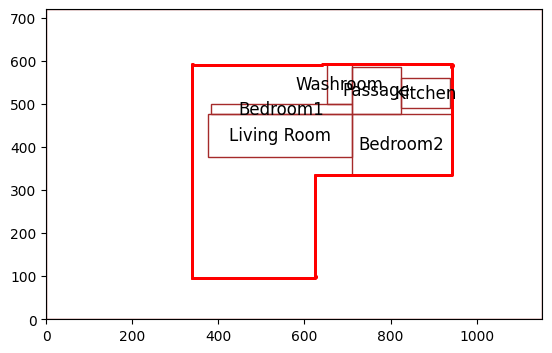

Elapsed time for initial population generation: 29.22 seconds


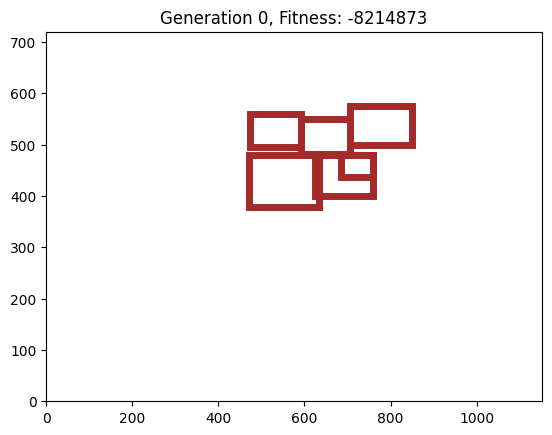

{'rooms': [{'name': 'Living Room', 'position': (472, 378), 'size': (163, 102)}, {'name': 'Passage', 'position': (592, 481), 'size': (113, 68)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 436), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (624, 400), 'size': (136, 80)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (143, 77)}], 'fitness': -8214873}


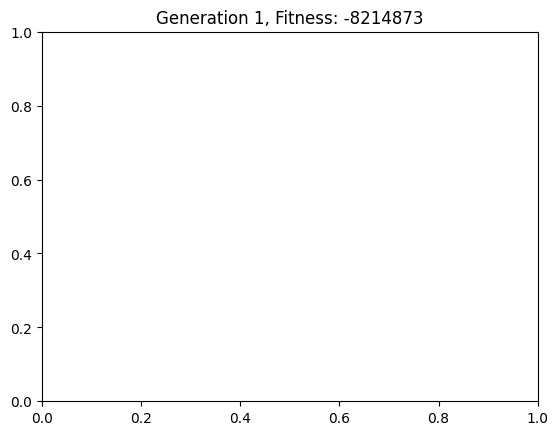

{'rooms': [{'name': 'Living Room', 'position': (472, 378), 'size': (163, 102)}, {'name': 'Passage', 'position': (592, 481), 'size': (113, 68)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 436), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (624, 400), 'size': (136, 80)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (143, 77)}], 'fitness': -8214873}


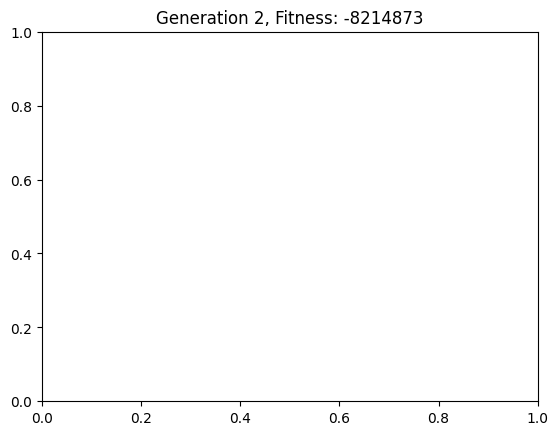

{'rooms': [{'name': 'Living Room', 'position': (472, 378), 'size': (163, 102)}, {'name': 'Passage', 'position': (592, 481), 'size': (113, 68)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 436), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (624, 400), 'size': (136, 80)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (143, 77)}], 'fitness': -8214873}


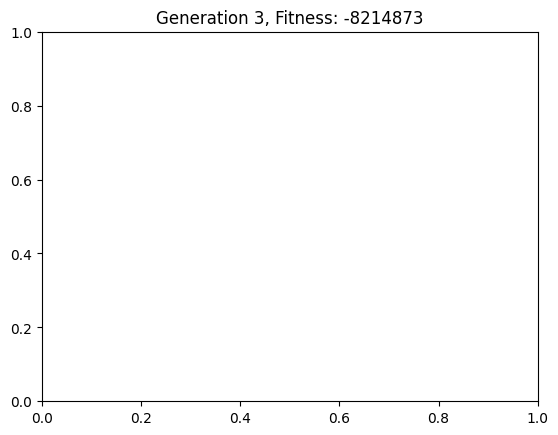

{'rooms': [{'name': 'Living Room', 'position': (472, 378), 'size': (163, 102)}, {'name': 'Passage', 'position': (592, 481), 'size': (113, 68)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 436), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (624, 400), 'size': (136, 80)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (143, 77)}], 'fitness': -8214873}


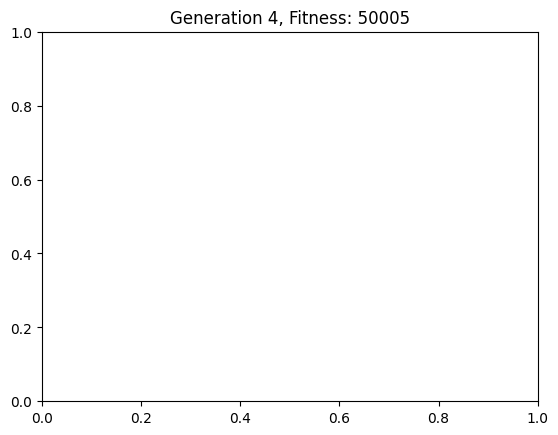

{'rooms': [{'name': 'Living Room', 'position': (472, 378), 'size': (152, 102)}, {'name': 'Passage', 'position': (592, 481), 'size': (113, 68)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 436), 'size': (74, 44)}, {'name': 'Bedroom1', 'position': (624, 400), 'size': (61, 80)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (143, 77)}], 'fitness': 50005}


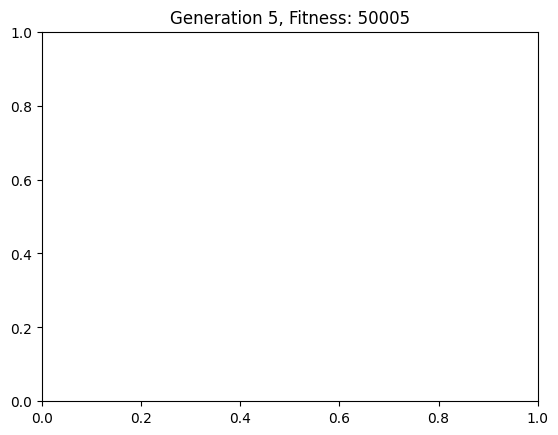

{'rooms': [{'name': 'Living Room', 'position': (471, 378), 'size': (152, 103)}, {'name': 'Passage', 'position': (592, 481), 'size': (113, 68)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 347), 'size': (75, 133)}, {'name': 'Bedroom1', 'position': (623, 400), 'size': (61, 81)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (144, 78)}], 'fitness': 50005}


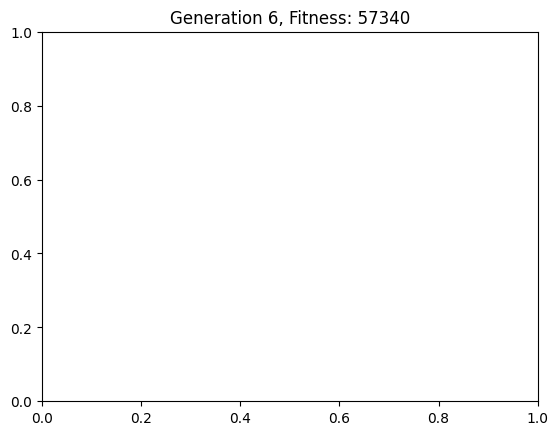

{'rooms': [{'name': 'Living Room', 'position': (470, 377), 'size': (153, 104)}, {'name': 'Bedroom1', 'position': (623, 399), 'size': (62, 82)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (147, 81)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 71)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 355), 'size': (76, 125)}], 'fitness': 57340}


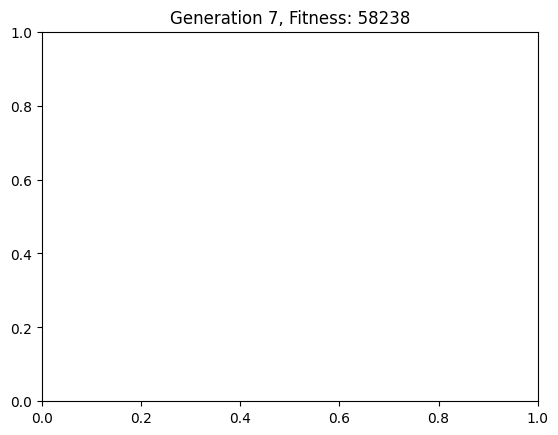

{'rooms': [{'name': 'Living Room', 'position': (470, 377), 'size': (153, 104)}, {'name': 'Bedroom1', 'position': (623, 399), 'size': (62, 82)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (147, 81)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 71)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 355), 'size': (76, 125)}], 'fitness': 58238}


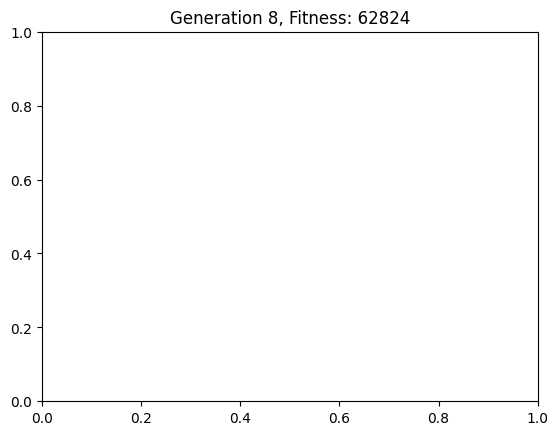

{'rooms': [{'name': 'Living Room', 'position': (466, 374), 'size': (155, 107)}, {'name': 'Bedroom1', 'position': (621, 396), 'size': (64, 85)}, {'name': 'Bedroom2', 'position': (706, 499), 'size': (154, 88)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 72)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 337), 'size': (79, 143)}], 'fitness': 62824}


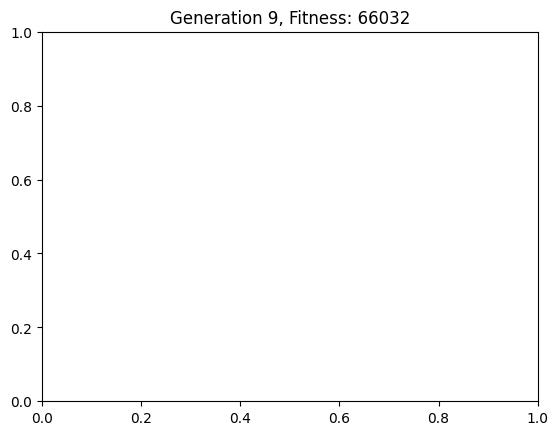

{'rooms': [{'name': 'Living Room', 'position': (455, 366), 'size': (160, 115)}, {'name': 'Bedroom1', 'position': (615, 388), 'size': (69, 93)}, {'name': 'Bedroom2', 'position': (706, 493), 'size': (170, 98)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 74)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 346), 'size': (83, 134)}], 'fitness': 66032}


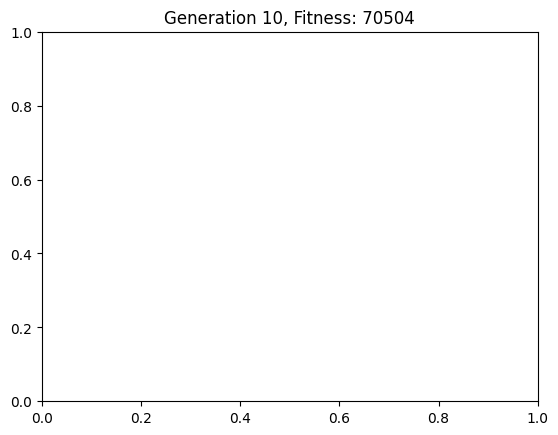

{'rooms': [{'name': 'Living Room', 'position': (450, 362), 'size': (163, 119)}, {'name': 'Bedroom1', 'position': (613, 384), 'size': (72, 97)}, {'name': 'Bedroom2', 'position': (706, 489), 'size': (178, 102)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 97)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 342), 'size': (85, 138)}], 'fitness': 70504}


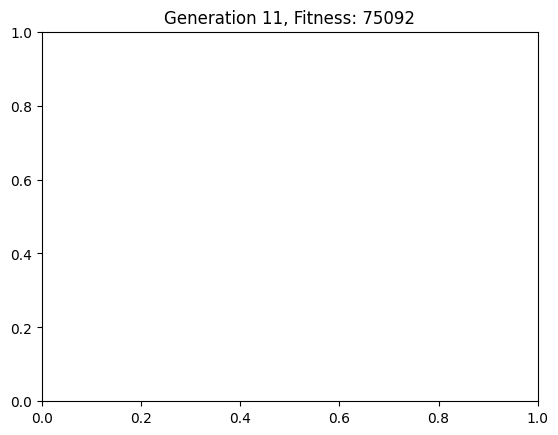

{'rooms': [{'name': 'Living Room', 'position': (444, 358), 'size': (165, 123)}, {'name': 'Bedroom1', 'position': (610, 380), 'size': (75, 101)}, {'name': 'Bedroom2', 'position': (706, 485), 'size': (186, 106)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 105)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (87, 144)}], 'fitness': 75092}


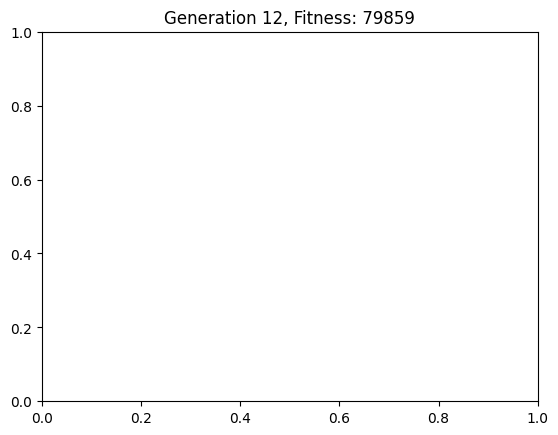

{'rooms': [{'name': 'Living Room', 'position': (439, 354), 'size': (168, 127)}, {'name': 'Bedroom1', 'position': (607, 376), 'size': (77, 105)}, {'name': 'Bedroom2', 'position': (706, 481), 'size': (194, 110)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 338), 'size': (88, 142)}], 'fitness': 79859}


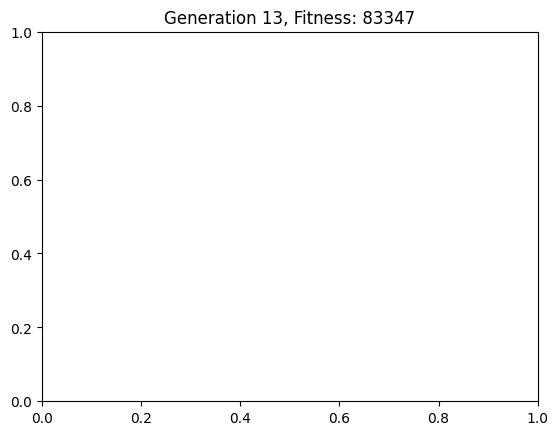

{'rooms': [{'name': 'Living Room', 'position': (434, 350), 'size': (171, 131)}, {'name': 'Bedroom1', 'position': (605, 372), 'size': (80, 109)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (202, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 337), 'size': (89, 143)}], 'fitness': 83347}


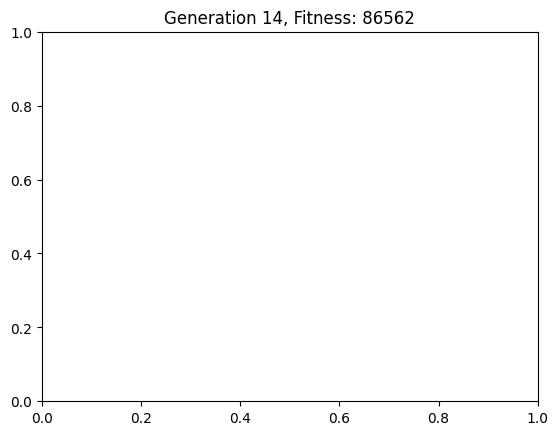

{'rooms': [{'name': 'Living Room', 'position': (428, 346), 'size': (173, 135)}, {'name': 'Bedroom1', 'position': (602, 368), 'size': (83, 113)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (210, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 337), 'size': (89, 143)}], 'fitness': 86562}


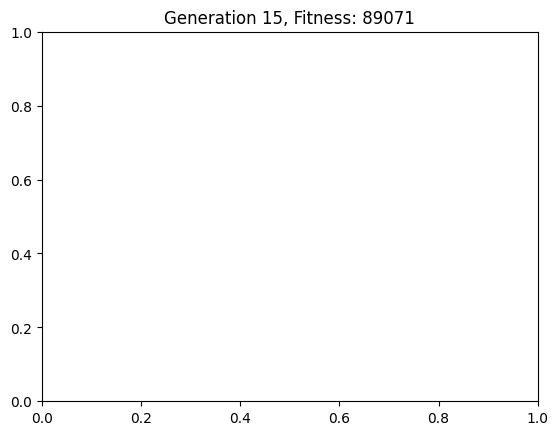

{'rooms': [{'name': 'Living Room', 'position': (423, 342), 'size': (176, 139)}, {'name': 'Bedroom1', 'position': (599, 364), 'size': (85, 117)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (218, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 89071}


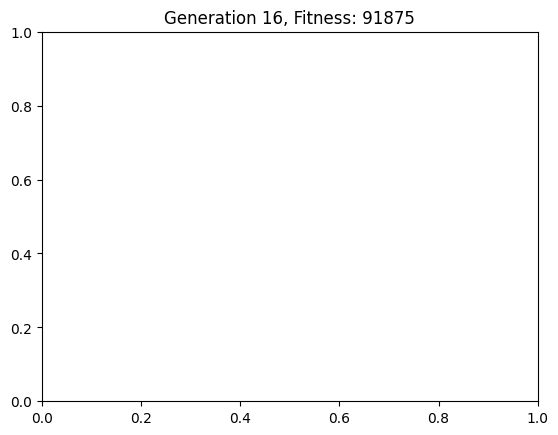

{'rooms': [{'name': 'Living Room', 'position': (418, 338), 'size': (179, 143)}, {'name': 'Bedroom1', 'position': (597, 360), 'size': (88, 121)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (226, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 91875}


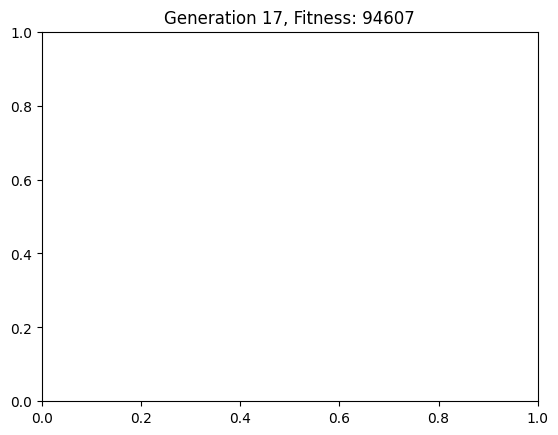

{'rooms': [{'name': 'Living Room', 'position': (412, 334), 'size': (181, 147)}, {'name': 'Bedroom1', 'position': (594, 356), 'size': (91, 125)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (234, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 94607}


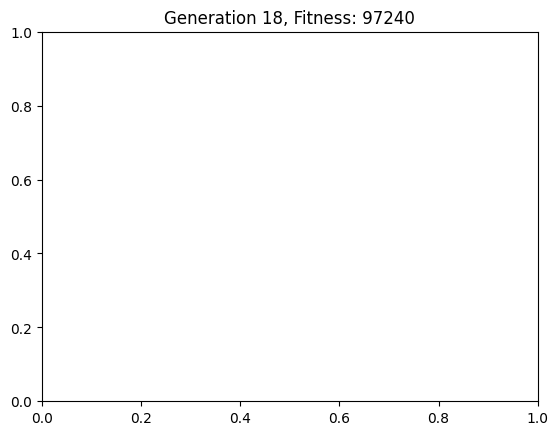

{'rooms': [{'name': 'Living Room', 'position': (407, 330), 'size': (184, 151)}, {'name': 'Bedroom1', 'position': (591, 352), 'size': (93, 129)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 97240}


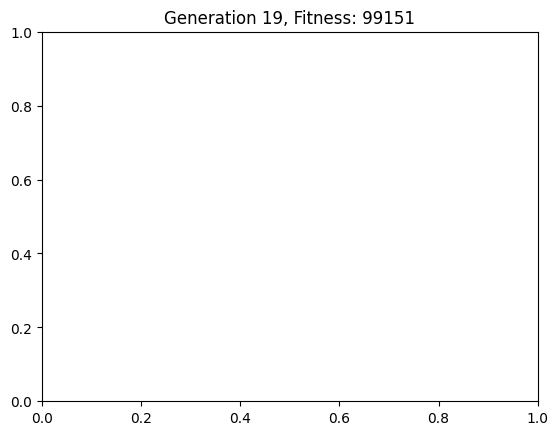

{'rooms': [{'name': 'Living Room', 'position': (405, 330), 'size': (185, 159)}, {'name': 'Bedroom1', 'position': (590, 348), 'size': (95, 133)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 99151}


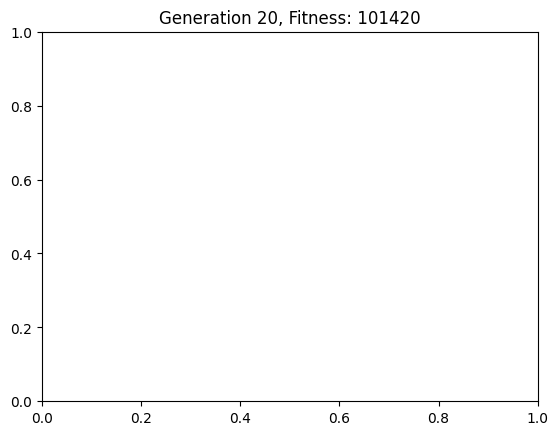

{'rooms': [{'name': 'Living Room', 'position': (405, 329), 'size': (185, 166)}, {'name': 'Bedroom1', 'position': (590, 344), 'size': (95, 137)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 101420}


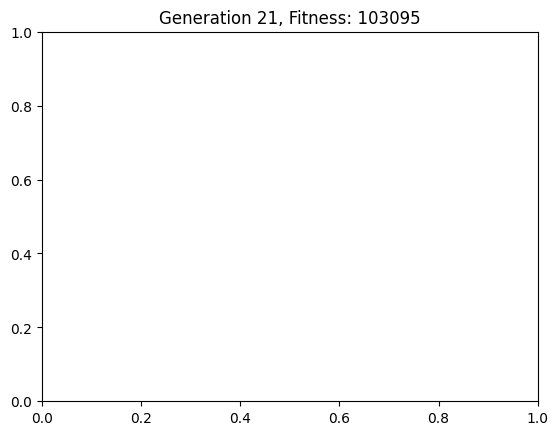

{'rooms': [{'name': 'Living Room', 'position': (405, 325), 'size': (185, 170)}, {'name': 'Bedroom1', 'position': (590, 340), 'size': (95, 141)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 103095}


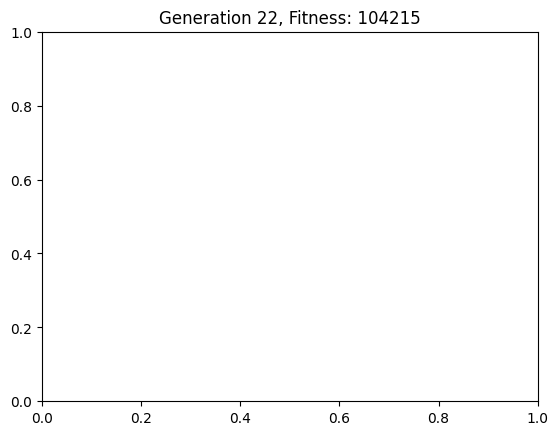

{'rooms': [{'name': 'Living Room', 'position': (405, 321), 'size': (185, 174)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 104215}


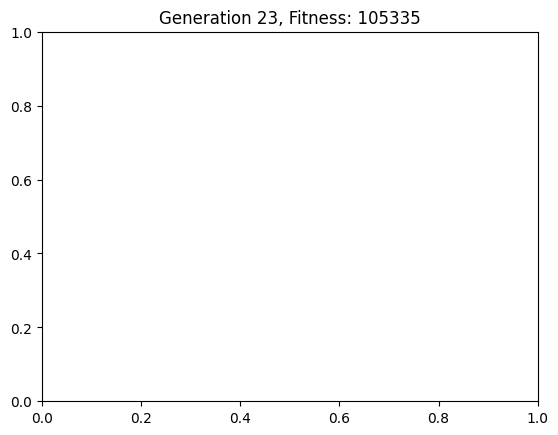

{'rooms': [{'name': 'Living Room', 'position': (405, 317), 'size': (185, 178)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 105335}


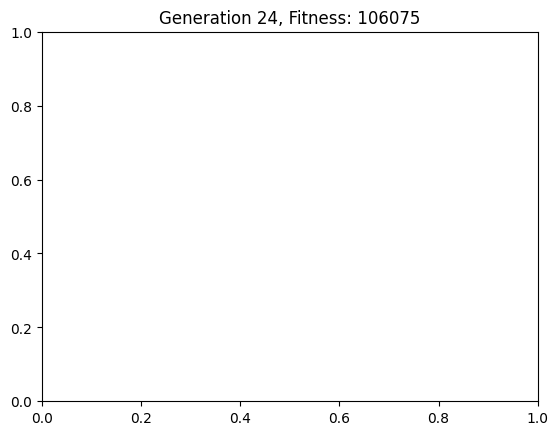

{'rooms': [{'name': 'Living Room', 'position': (405, 313), 'size': (185, 182)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 106075}


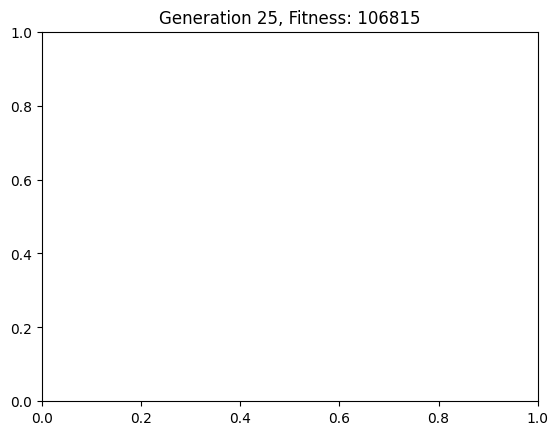

{'rooms': [{'name': 'Living Room', 'position': (405, 309), 'size': (185, 186)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 106815}


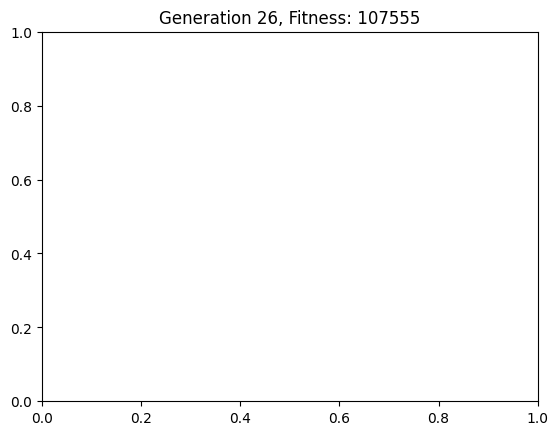

{'rooms': [{'name': 'Living Room', 'position': (405, 305), 'size': (185, 190)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 107555}


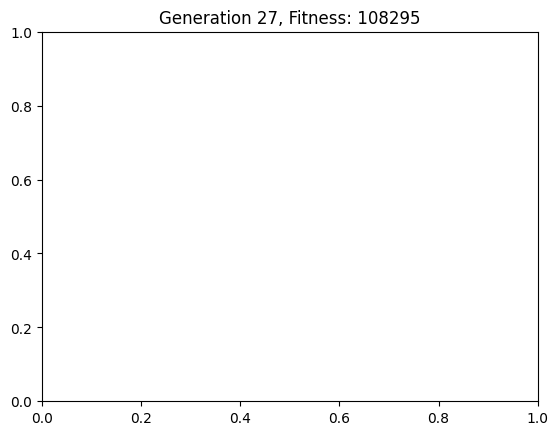

{'rooms': [{'name': 'Living Room', 'position': (405, 301), 'size': (185, 194)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 108295}


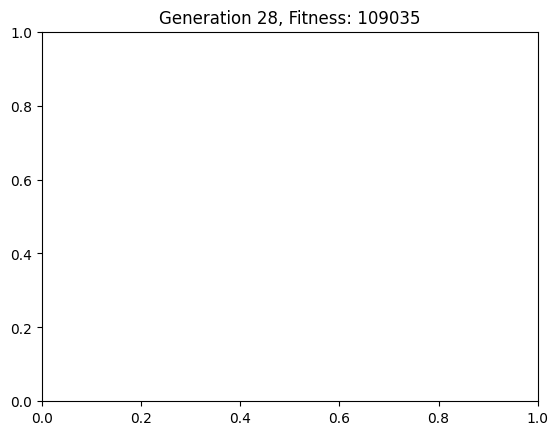

{'rooms': [{'name': 'Living Room', 'position': (405, 297), 'size': (185, 198)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 109035}


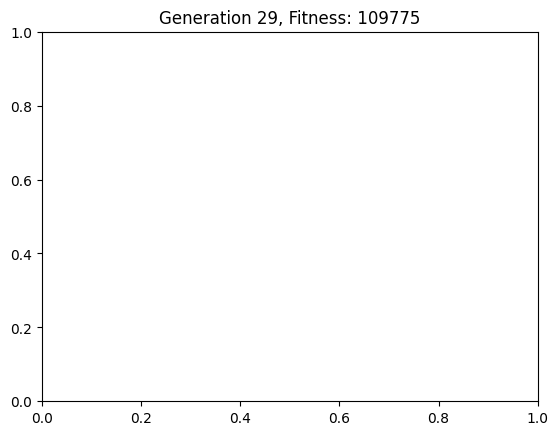

{'rooms': [{'name': 'Living Room', 'position': (405, 293), 'size': (185, 202)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 109775}


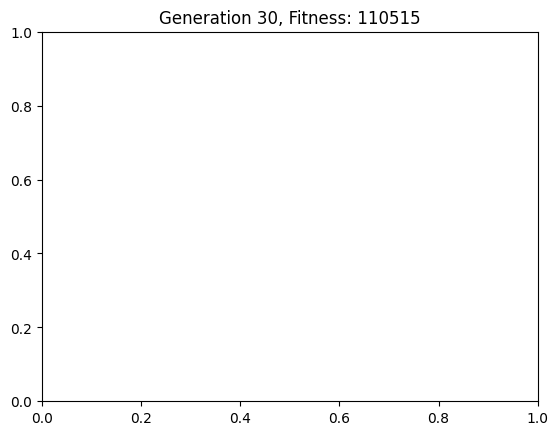

{'rooms': [{'name': 'Living Room', 'position': (405, 289), 'size': (185, 206)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 110515}


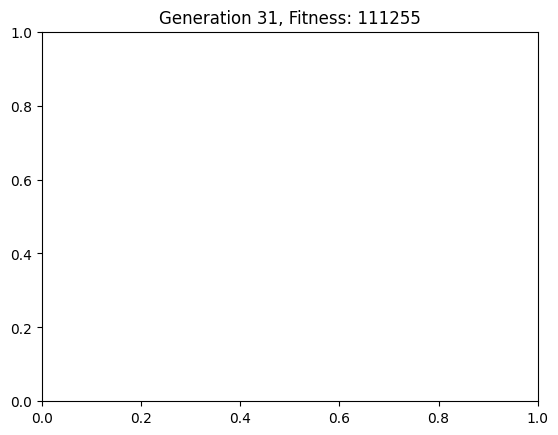

{'rooms': [{'name': 'Living Room', 'position': (405, 285), 'size': (185, 210)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 111255}


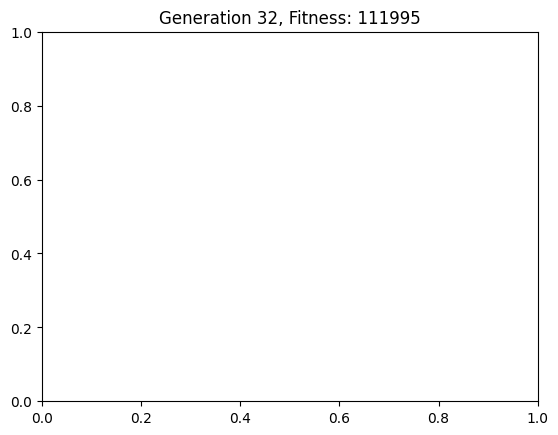

{'rooms': [{'name': 'Living Room', 'position': (405, 281), 'size': (185, 214)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 111995}


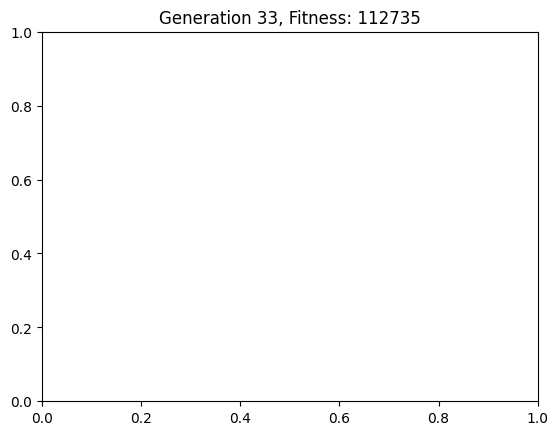

{'rooms': [{'name': 'Living Room', 'position': (405, 277), 'size': (185, 218)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 112735}


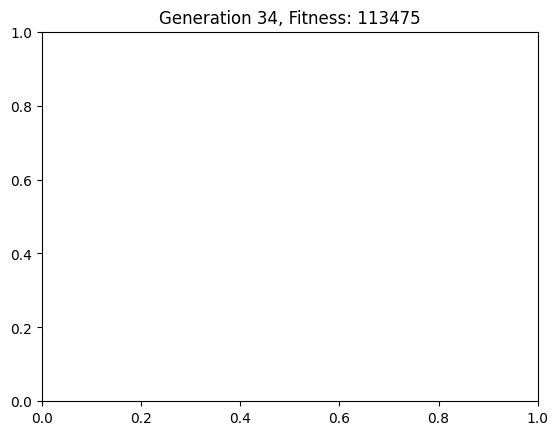

{'rooms': [{'name': 'Living Room', 'position': (405, 273), 'size': (185, 222)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 113475}


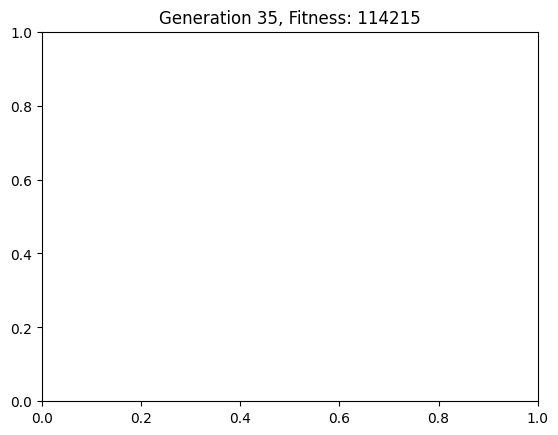

{'rooms': [{'name': 'Living Room', 'position': (405, 269), 'size': (185, 226)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 114215}


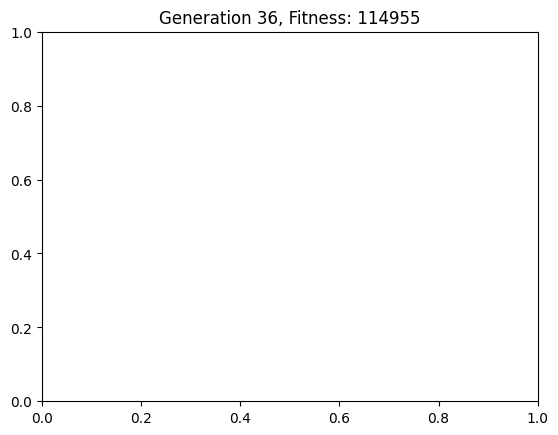

{'rooms': [{'name': 'Living Room', 'position': (405, 265), 'size': (185, 230)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 114955}


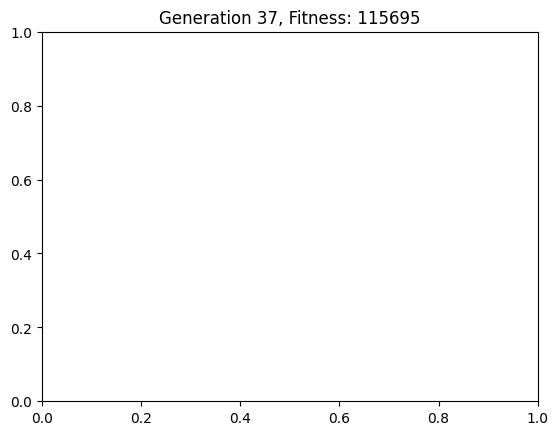

{'rooms': [{'name': 'Living Room', 'position': (405, 261), 'size': (185, 234)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 115695}


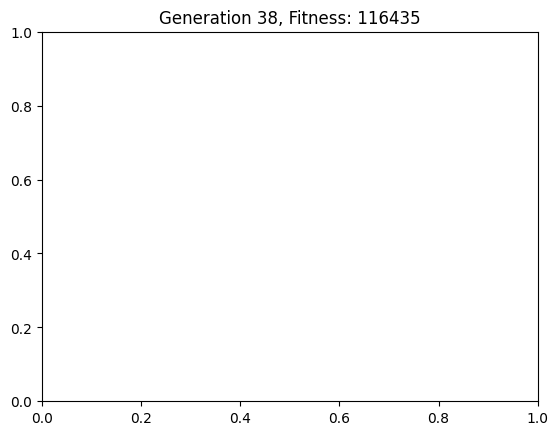

{'rooms': [{'name': 'Living Room', 'position': (405, 257), 'size': (185, 238)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 116435}


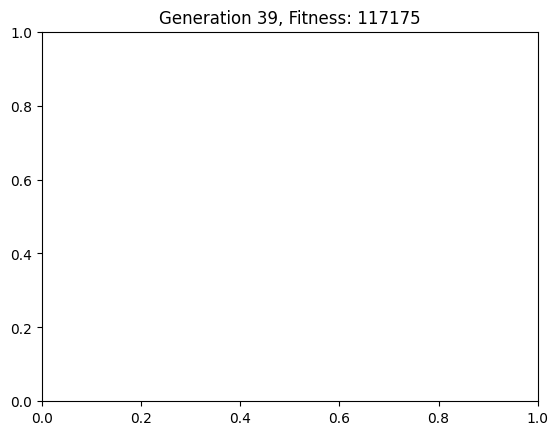

{'rooms': [{'name': 'Living Room', 'position': (405, 253), 'size': (185, 242)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 117175}


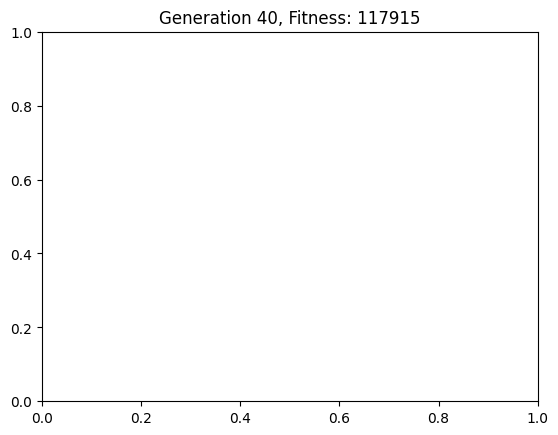

{'rooms': [{'name': 'Living Room', 'position': (405, 249), 'size': (185, 246)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 117915}


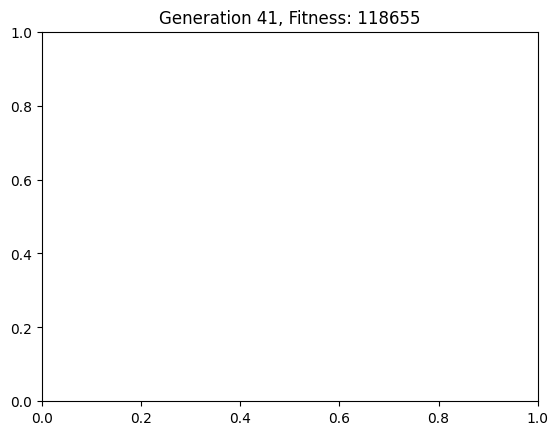

{'rooms': [{'name': 'Living Room', 'position': (405, 245), 'size': (185, 250)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 118655}


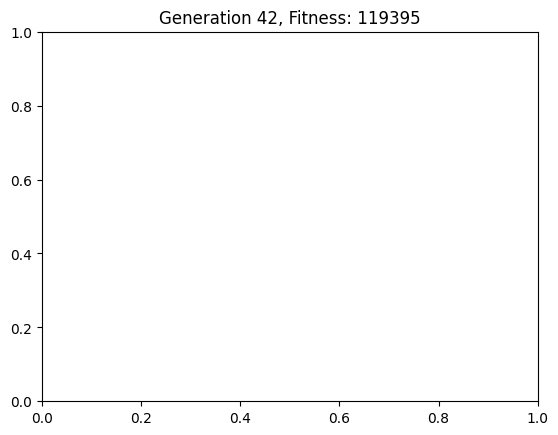

{'rooms': [{'name': 'Living Room', 'position': (405, 241), 'size': (185, 254)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 119395}


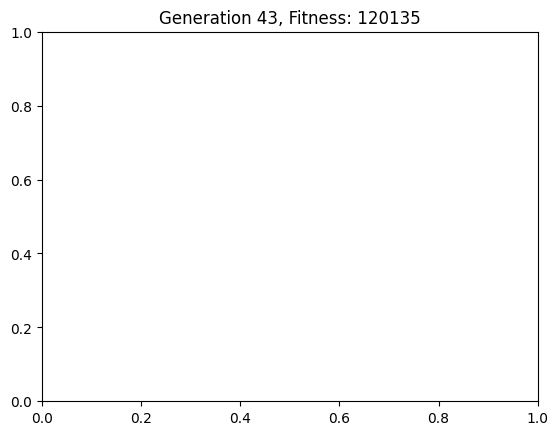

{'rooms': [{'name': 'Living Room', 'position': (405, 237), 'size': (185, 258)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 120135}


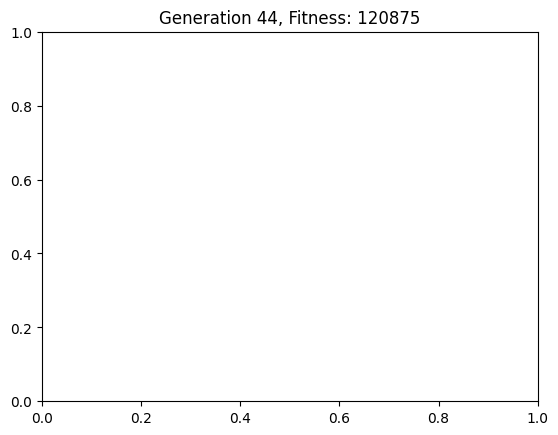

{'rooms': [{'name': 'Living Room', 'position': (405, 233), 'size': (185, 262)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 120875}


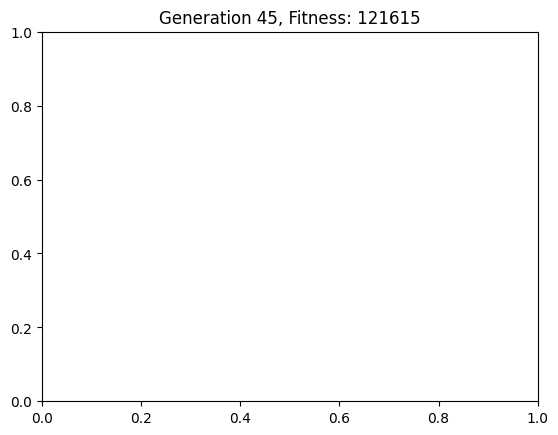

{'rooms': [{'name': 'Living Room', 'position': (405, 229), 'size': (185, 266)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 121615}


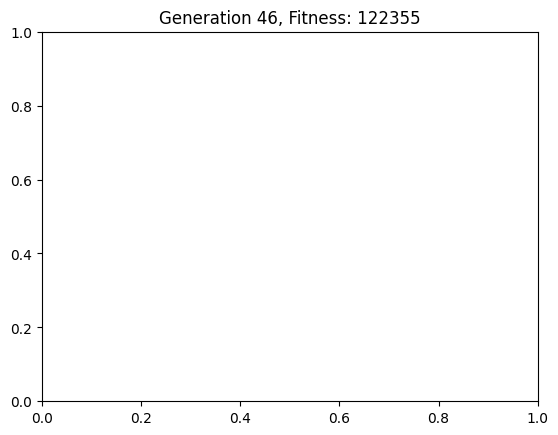

{'rooms': [{'name': 'Living Room', 'position': (405, 225), 'size': (185, 270)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 122355}


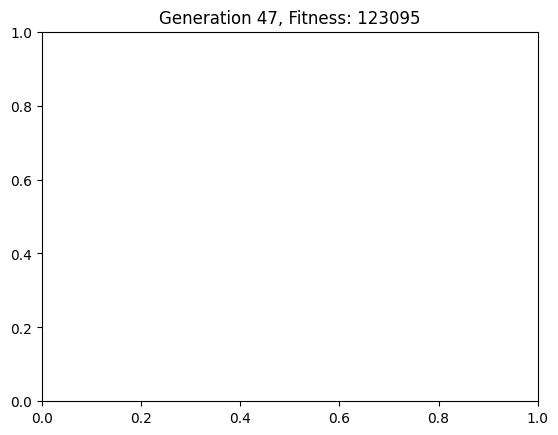

{'rooms': [{'name': 'Living Room', 'position': (405, 221), 'size': (185, 274)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 123095}


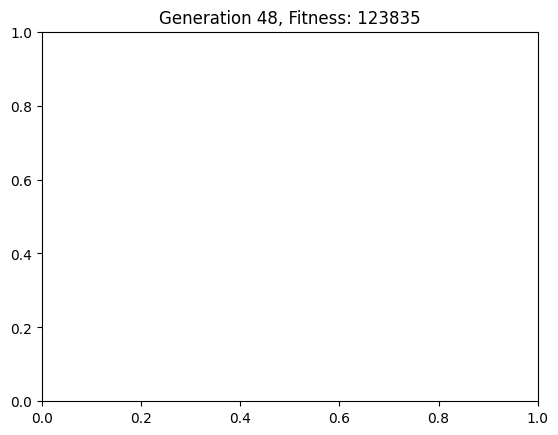

{'rooms': [{'name': 'Living Room', 'position': (405, 217), 'size': (185, 278)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 123835}


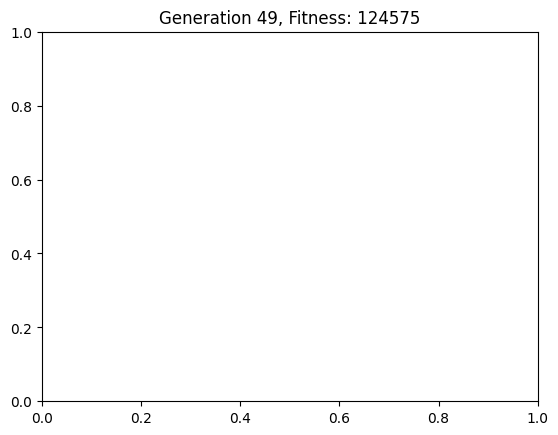

{'rooms': [{'name': 'Living Room', 'position': (405, 213), 'size': (185, 282)}, {'name': 'Bedroom1', 'position': (590, 336), 'size': (95, 145)}, {'name': 'Bedroom2', 'position': (706, 480), 'size': (235, 112)}, {'name': 'Passage', 'position': (591, 481), 'size': (115, 108)}, {'name': 'Kitchen', 'position': (473, 495), 'size': (118, 65)}, {'name': 'Washroom', 'position': (685, 336), 'size': (90, 144)}], 'fitness': 124575}
Elapsed time: 494.66 seconds


<Figure size 640x480 with 0 Axes>

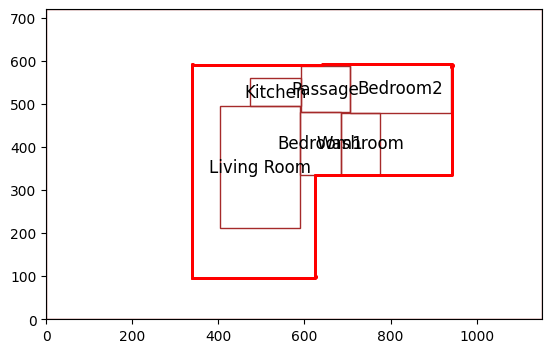

Elapsed time for initial population generation: 27.75 seconds


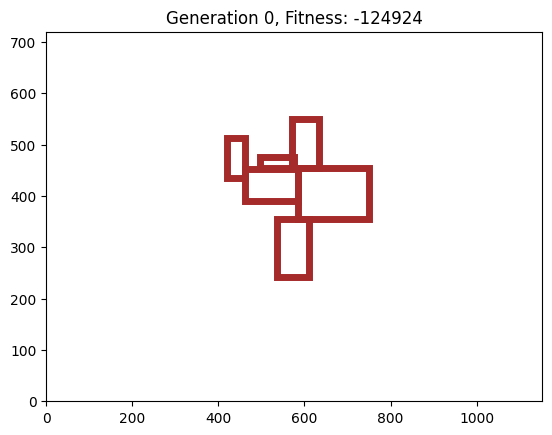

{'rooms': [{'name': 'Living Room', 'position': (586, 356), 'size': (163, 98)}, {'name': 'Passage', 'position': (462, 391), 'size': (123, 62)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 96)}, {'name': 'Washroom', 'position': (420, 434), 'size': (41, 78)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (536, 242), 'size': (75, 114)}], 'fitness': -124924}


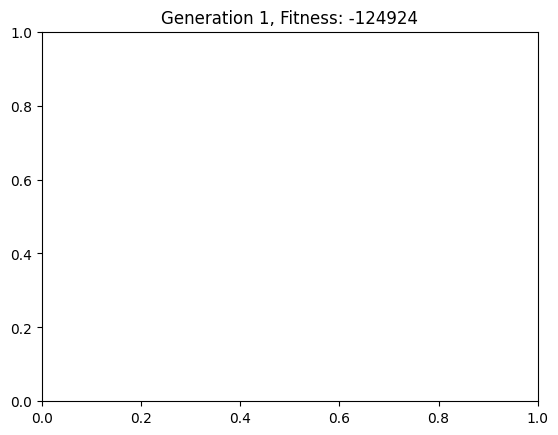

{'rooms': [{'name': 'Living Room', 'position': (586, 356), 'size': (164, 98)}, {'name': 'Passage', 'position': (462, 391), 'size': (124, 63)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 96)}, {'name': 'Washroom', 'position': (420, 434), 'size': (42, 77)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (536, 241), 'size': (76, 114)}], 'fitness': -124924}


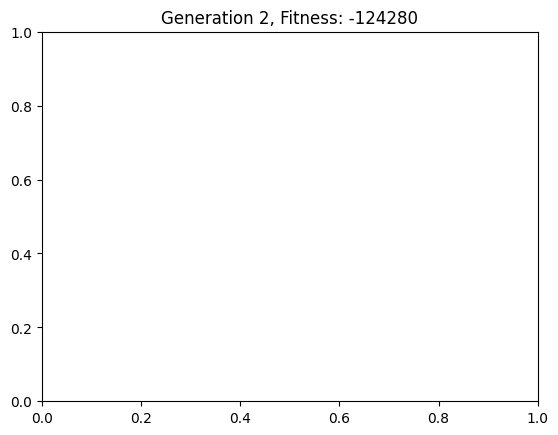

{'rooms': [{'name': 'Living Room', 'position': (586, 355), 'size': (167, 99)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (536, 239), 'size': (79, 115)}, {'name': 'Passage', 'position': (462, 389), 'size': (124, 64)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 96)}, {'name': 'Washroom', 'position': (418, 434), 'size': (44, 84)}], 'fitness': -124280}


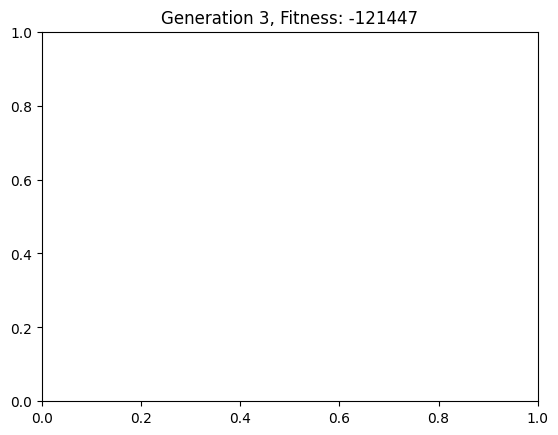

{'rooms': [{'name': 'Living Room', 'position': (586, 353), 'size': (173, 101)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (536, 235), 'size': (86, 118)}, {'name': 'Passage', 'position': (462, 386), 'size': (124, 68)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 121)}, {'name': 'Washroom', 'position': (414, 434), 'size': (48, 95)}], 'fitness': -121447}


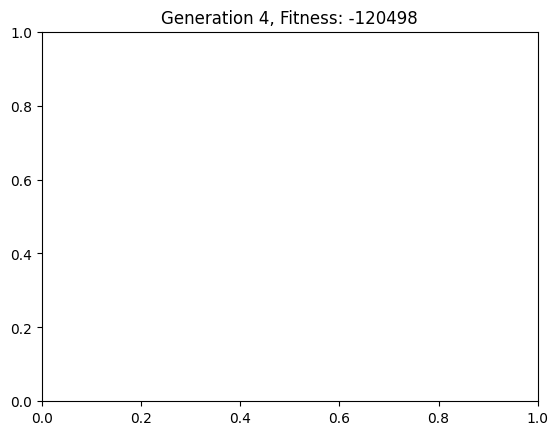

{'rooms': [{'name': 'Living Room', 'position': (586, 350), 'size': (181, 103)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (533, 229), 'size': (91, 120)}, {'name': 'Passage', 'position': (462, 382), 'size': (124, 72)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 96)}, {'name': 'Washroom', 'position': (414, 434), 'size': (48, 88)}], 'fitness': -120498}


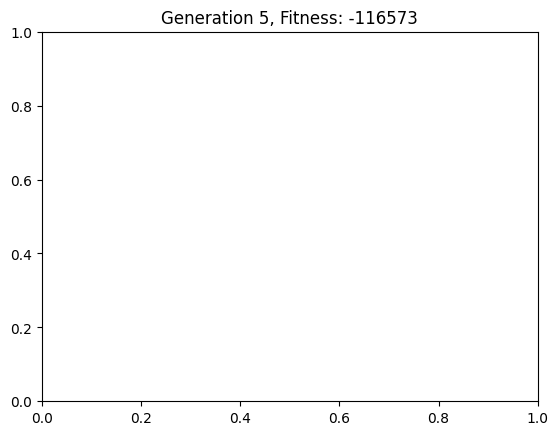

{'rooms': [{'name': 'Living Room', 'position': (586, 348), 'size': (189, 106)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (529, 224), 'size': (95, 123)}, {'name': 'Passage', 'position': (462, 378), 'size': (124, 76)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 96)}, {'name': 'Washroom', 'position': (398, 434), 'size': (64, 110)}], 'fitness': -116573}


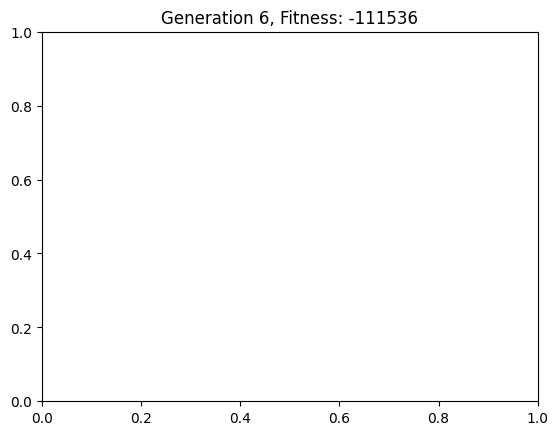

{'rooms': [{'name': 'Living Room', 'position': (586, 345), 'size': (197, 109)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (525, 219), 'size': (99, 126)}, {'name': 'Passage', 'position': (462, 374), 'size': (124, 80)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 121)}, {'name': 'Washroom', 'position': (390, 434), 'size': (72, 132)}], 'fitness': -111536}


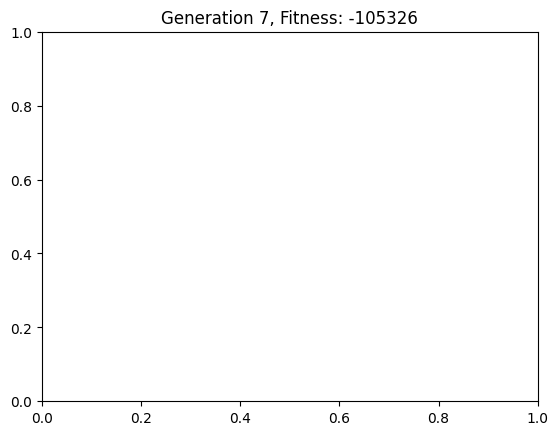

{'rooms': [{'name': 'Living Room', 'position': (586, 342), 'size': (205, 111)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (80, 21)}, {'name': 'Bedroom2', 'position': (521, 213), 'size': (103, 128)}, {'name': 'Passage', 'position': (462, 370), 'size': (124, 84)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 121)}, {'name': 'Washroom', 'position': (382, 423), 'size': (80, 158)}], 'fitness': -105326}


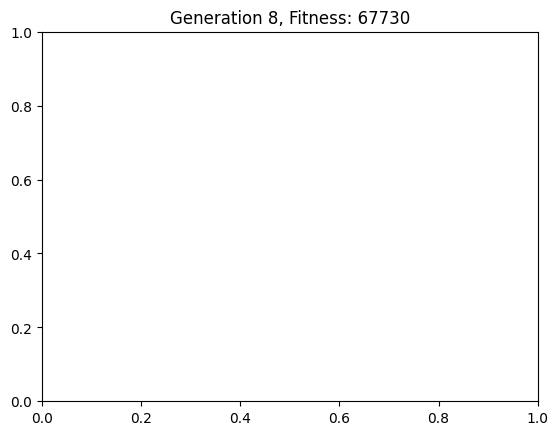

{'rooms': [{'name': 'Living Room', 'position': (586, 342), 'size': (205, 111)}, {'name': 'Bedroom1', 'position': (496, 454), 'size': (76, 21)}, {'name': 'Bedroom2', 'position': (521, 213), 'size': (103, 128)}, {'name': 'Passage', 'position': (462, 370), 'size': (124, 84)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (59, 121)}, {'name': 'Washroom', 'position': (382, 423), 'size': (80, 158)}], 'fitness': 67730}


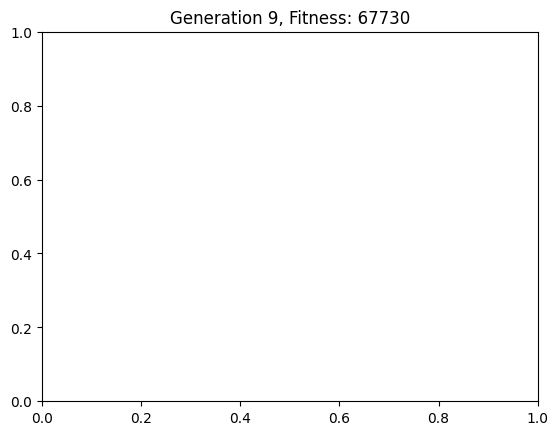

{'rooms': [{'name': 'Living Room', 'position': (586, 342), 'size': (206, 112)}, {'name': 'Bedroom1', 'position': (495, 454), 'size': (76, 22)}, {'name': 'Bedroom2', 'position': (521, 213), 'size': (104, 129)}, {'name': 'Passage', 'position': (462, 369), 'size': (124, 84)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (60, 115)}, {'name': 'Washroom', 'position': (381, 423), 'size': (81, 141)}], 'fitness': 67730}


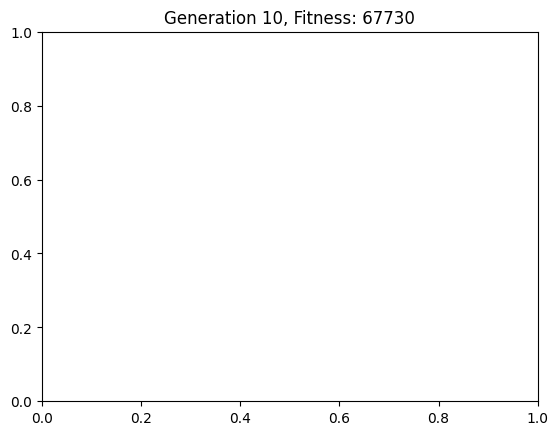

{'rooms': [{'name': 'Living Room', 'position': (586, 341), 'size': (209, 113)}, {'name': 'Bedroom1', 'position': (494, 454), 'size': (78, 25)}, {'name': 'Bedroom2', 'position': (520, 211), 'size': (105, 129)}, {'name': 'Passage', 'position': (462, 368), 'size': (124, 86)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 114)}, {'name': 'Washroom', 'position': (378, 423), 'size': (84, 145)}], 'fitness': 66897}


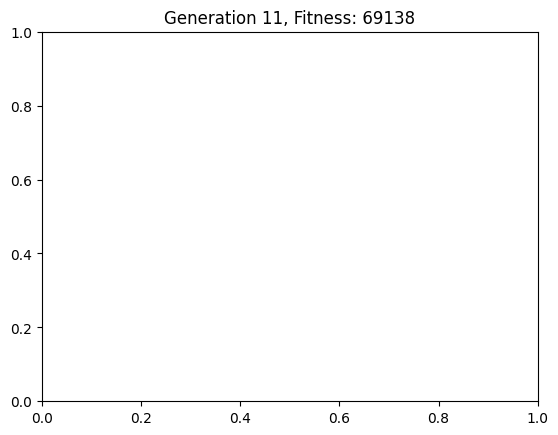

{'rooms': [{'name': 'Living Room', 'position': (586, 341), 'size': (209, 113)}, {'name': 'Bedroom1', 'position': (494, 454), 'size': (78, 25)}, {'name': 'Bedroom2', 'position': (520, 211), 'size': (105, 129)}, {'name': 'Passage', 'position': (462, 368), 'size': (124, 86)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (63, 114)}, {'name': 'Washroom', 'position': (378, 423), 'size': (84, 145)}], 'fitness': 69138}


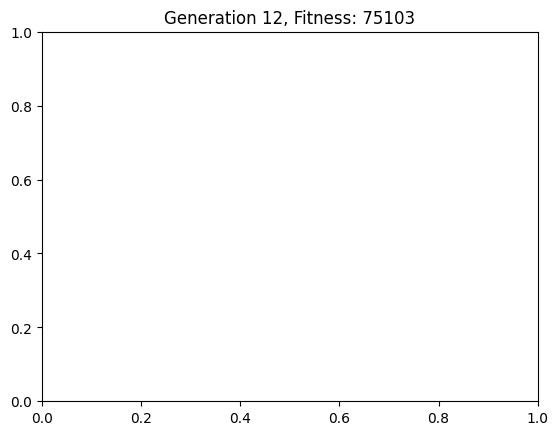

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (223, 118)}, {'name': 'Bedroom1', 'position': (487, 454), 'size': (85, 39)}, {'name': 'Bedroom2', 'position': (513, 202), 'size': (112, 134)}, {'name': 'Passage', 'position': (462, 361), 'size': (124, 93)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (74, 134)}, {'name': 'Washroom', 'position': (364, 390), 'size': (98, 188)}], 'fitness': 75103}


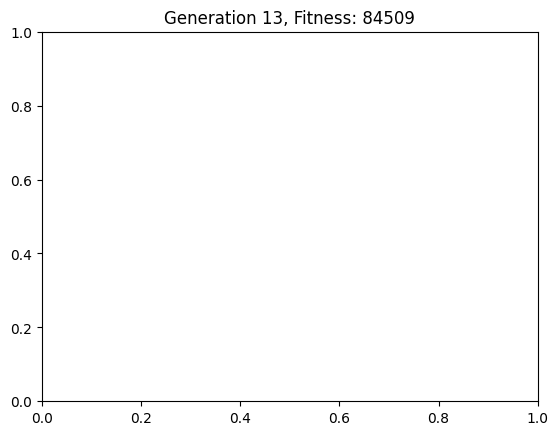

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (231, 118)}, {'name': 'Bedroom1', 'position': (483, 454), 'size': (89, 47)}, {'name': 'Bedroom2', 'position': (509, 198), 'size': (116, 138)}, {'name': 'Passage', 'position': (462, 357), 'size': (124, 97)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (78, 137)}, {'name': 'Washroom', 'position': (356, 362), 'size': (106, 188)}], 'fitness': 84509}


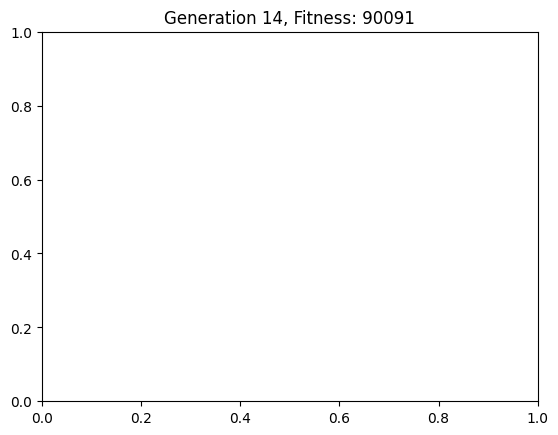

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (239, 118)}, {'name': 'Bedroom1', 'position': (479, 454), 'size': (93, 55)}, {'name': 'Bedroom2', 'position': (505, 194), 'size': (120, 142)}, {'name': 'Passage', 'position': (462, 353), 'size': (124, 101)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (79, 127)}, {'name': 'Washroom', 'position': (348, 362), 'size': (114, 213)}], 'fitness': 90091}


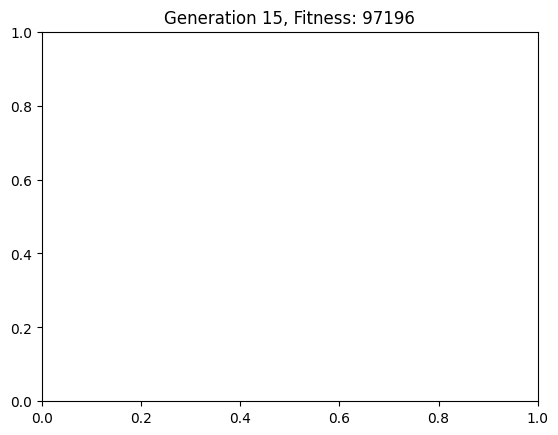

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (247, 118)}, {'name': 'Bedroom1', 'position': (475, 454), 'size': (97, 63)}, {'name': 'Bedroom2', 'position': (501, 190), 'size': (124, 146)}, {'name': 'Passage', 'position': (462, 349), 'size': (124, 105)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (80, 132)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 201)}], 'fitness': 97196}


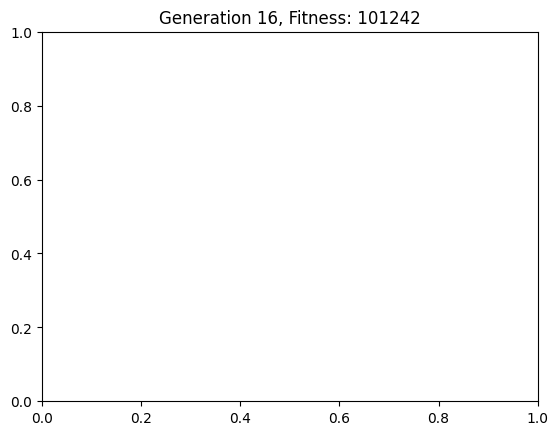

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (255, 118)}, {'name': 'Bedroom1', 'position': (471, 454), 'size': (101, 71)}, {'name': 'Bedroom2', 'position': (497, 186), 'size': (128, 150)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (81, 133)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 211)}], 'fitness': 101242}


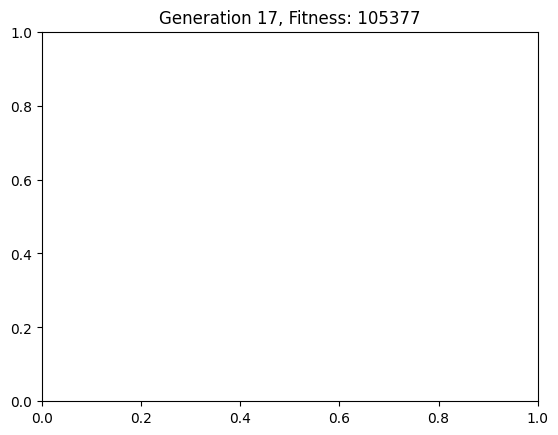

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (263, 118)}, {'name': 'Bedroom1', 'position': (467, 454), 'size': (105, 79)}, {'name': 'Bedroom2', 'position': (493, 182), 'size': (132, 154)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (84, 134)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 184)}], 'fitness': 105377}


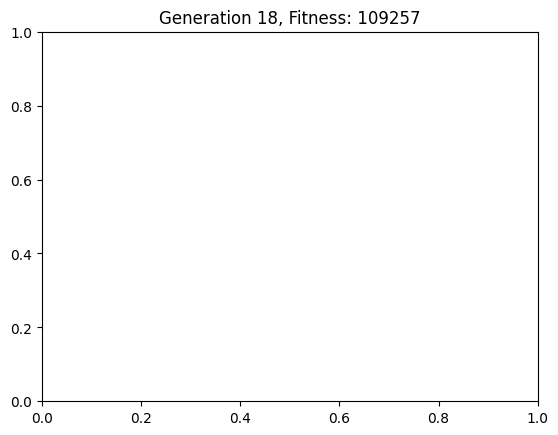

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (271, 118)}, {'name': 'Bedroom1', 'position': (463, 454), 'size': (109, 87)}, {'name': 'Bedroom2', 'position': (489, 178), 'size': (136, 158)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (84, 134)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 197)}], 'fitness': 109257}


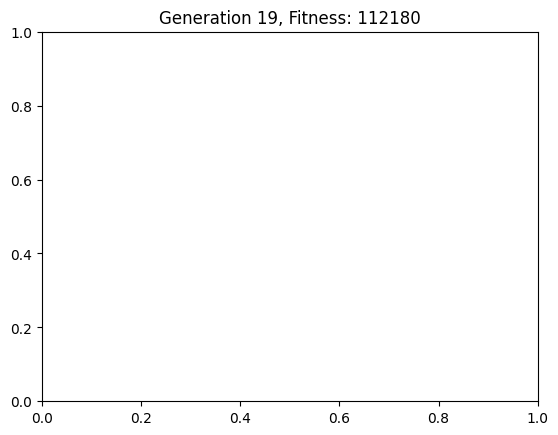

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (279, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 95)}, {'name': 'Bedroom2', 'position': (485, 174), 'size': (140, 162)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (84, 134)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 202)}], 'fitness': 112180}


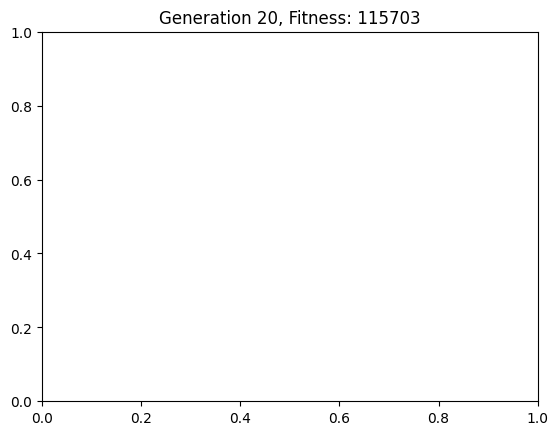

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (287, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 103)}, {'name': 'Bedroom2', 'position': (481, 170), 'size': (144, 166)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (85, 136)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 219)}], 'fitness': 115703}


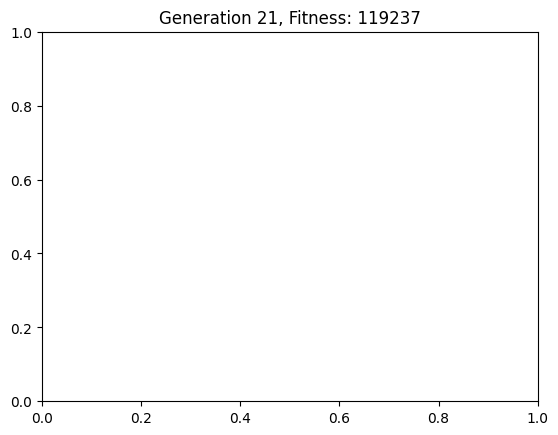

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (295, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 111)}, {'name': 'Bedroom2', 'position': (477, 166), 'size': (148, 170)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 223)}], 'fitness': 119237}


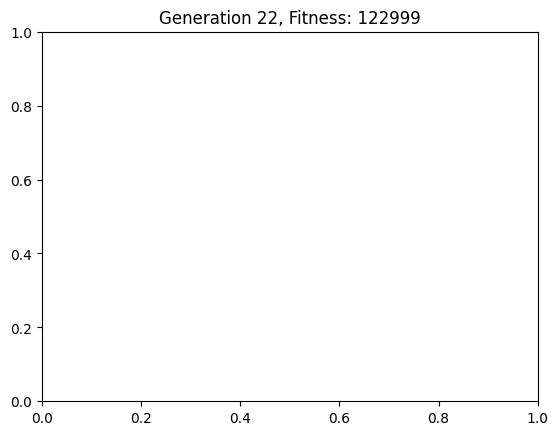

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (303, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 119)}, {'name': 'Bedroom2', 'position': (473, 162), 'size': (152, 174)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 190)}], 'fitness': 122999}


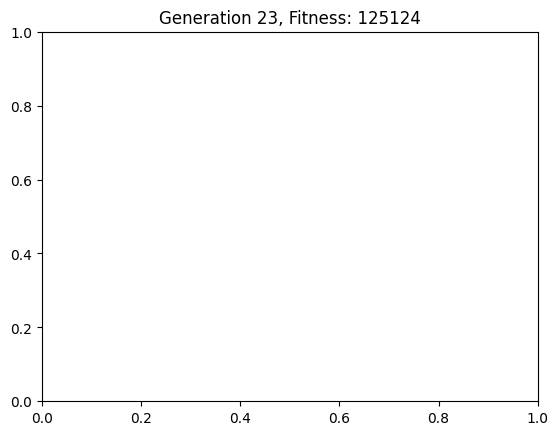

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (311, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 127)}, {'name': 'Bedroom2', 'position': (469, 158), 'size': (156, 178)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 200)}], 'fitness': 125124}


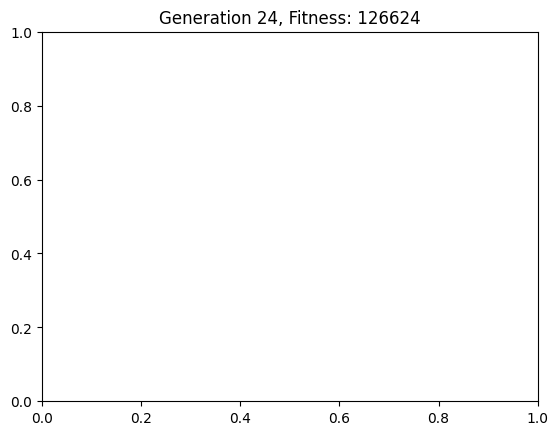

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (319, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 135)}, {'name': 'Bedroom2', 'position': (465, 154), 'size': (160, 182)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 223)}], 'fitness': 126624}


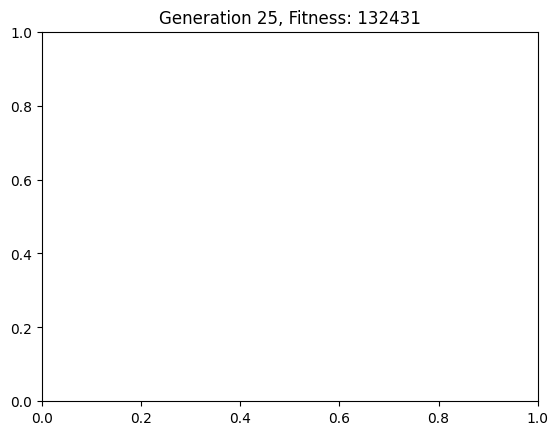

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (327, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (461, 150), 'size': (164, 186)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 223)}], 'fitness': 132431}


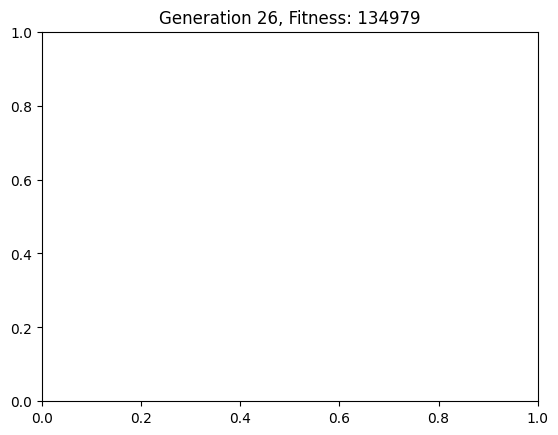

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (335, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (457, 146), 'size': (168, 190)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 211)}], 'fitness': 134979}


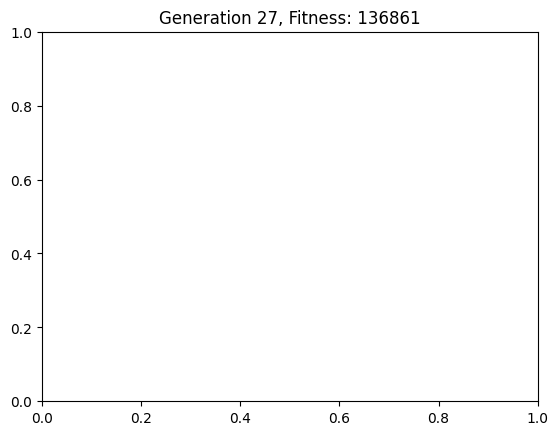

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (343, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (453, 142), 'size': (172, 194)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 188)}], 'fitness': 136861}


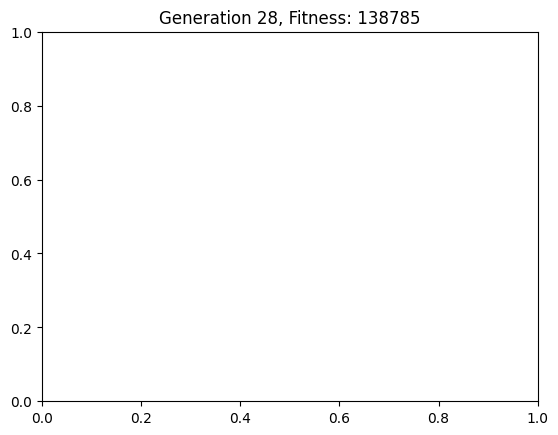

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (351, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (449, 138), 'size': (176, 198)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 210)}], 'fitness': 138785}


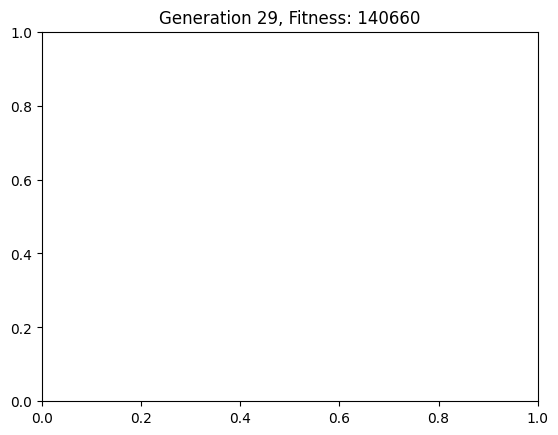

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (445, 134), 'size': (180, 202)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 218)}], 'fitness': 140660}


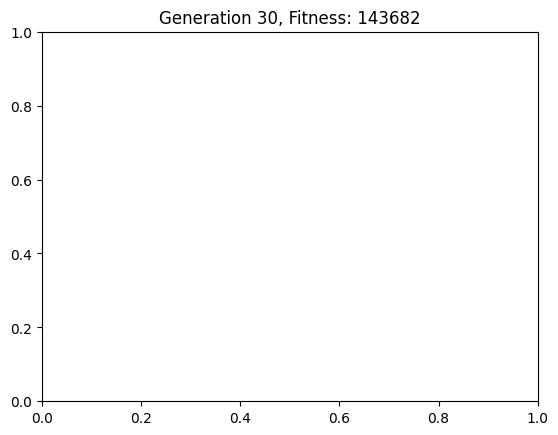

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (441, 130), 'size': (184, 206)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 227)}], 'fitness': 143682}


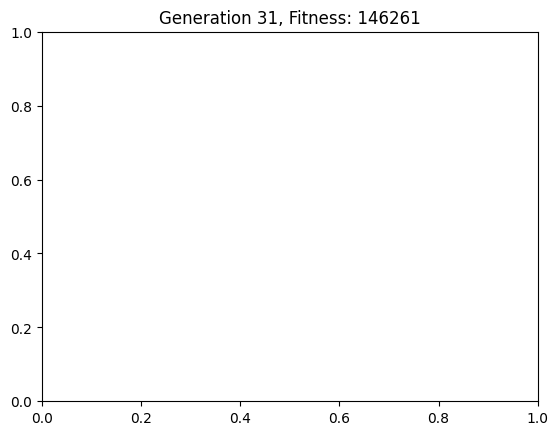

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (437, 126), 'size': (188, 210)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 221)}], 'fitness': 146261}


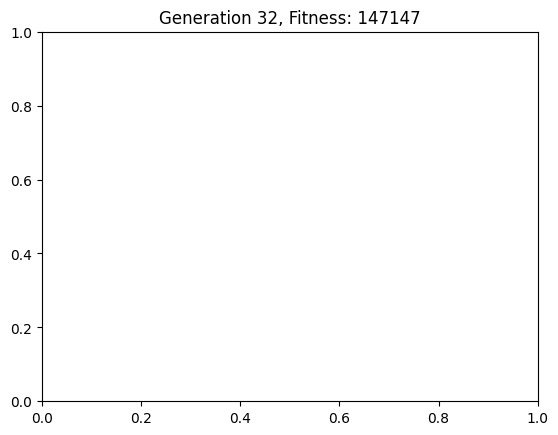

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (433, 122), 'size': (192, 214)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 200)}], 'fitness': 147147}


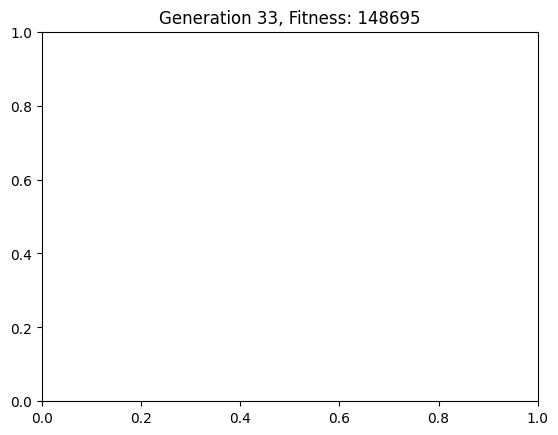

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (429, 118), 'size': (196, 218)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 227)}], 'fitness': 148695}


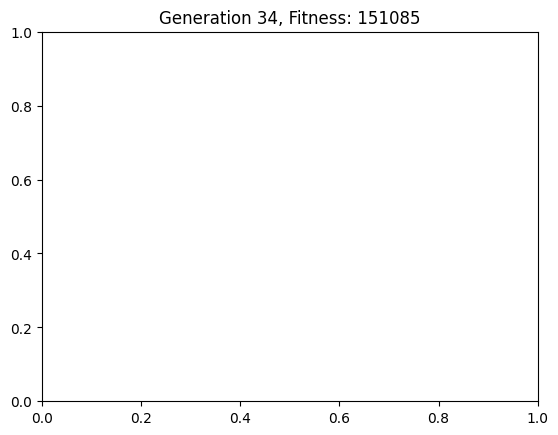

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (425, 114), 'size': (200, 222)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 218)}], 'fitness': 151085}


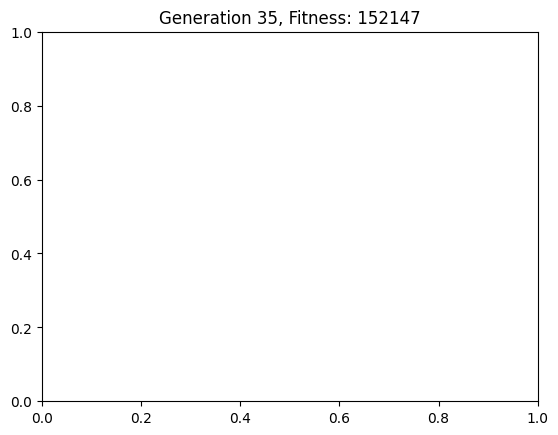

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (421, 110), 'size': (204, 226)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 204)}], 'fitness': 152147}


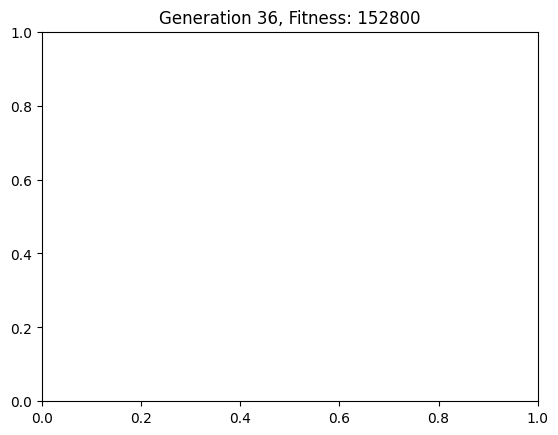

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (417, 106), 'size': (208, 230)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 209)}], 'fitness': 152800}


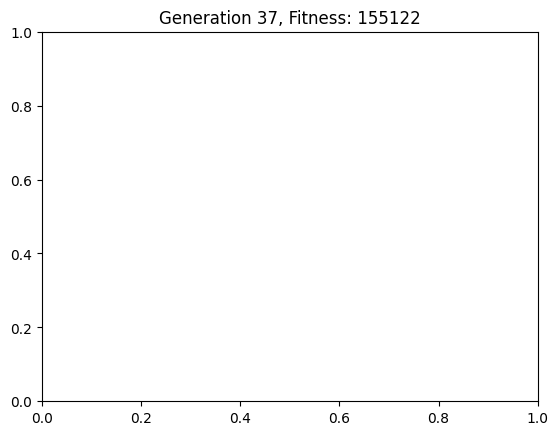

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (413, 102), 'size': (212, 234)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 186)}], 'fitness': 155122}


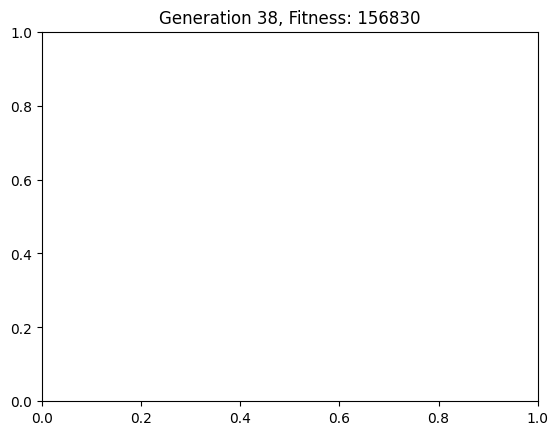

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (409, 98), 'size': (216, 238)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 188)}], 'fitness': 156830}


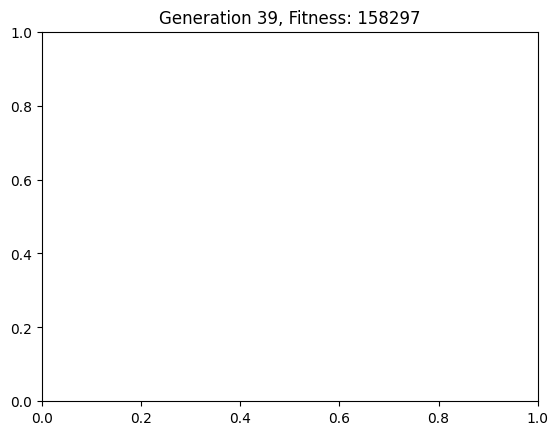

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (405, 97), 'size': (220, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 208)}], 'fitness': 158297}


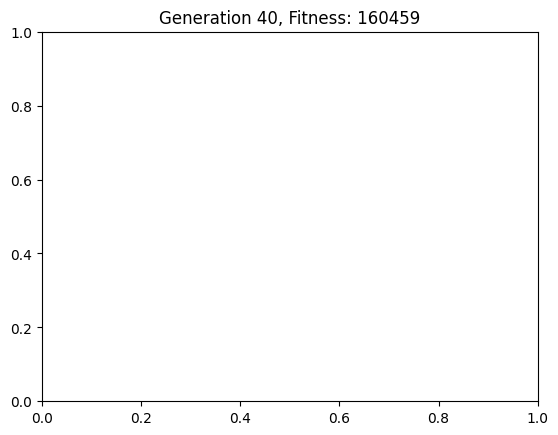

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (401, 97), 'size': (224, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 208)}], 'fitness': 160459}


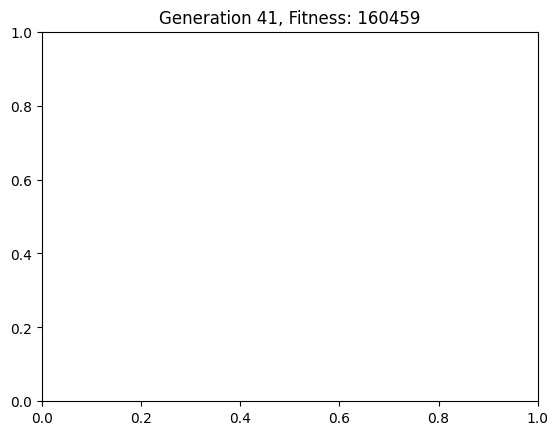

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (397, 97), 'size': (228, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 207)}], 'fitness': 159708}


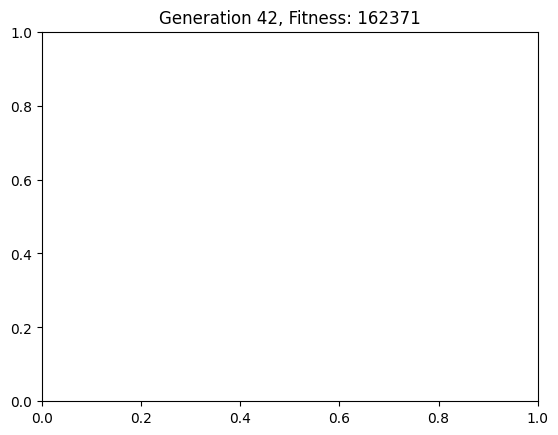

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (393, 97), 'size': (232, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 205)}], 'fitness': 162371}


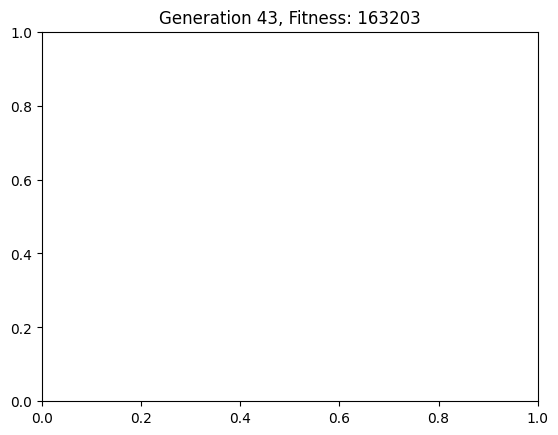

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (389, 97), 'size': (236, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 194)}], 'fitness': 163203}


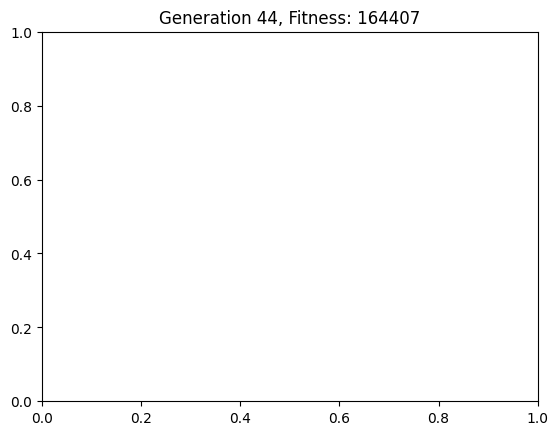

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (385, 97), 'size': (240, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 229)}], 'fitness': 164407}


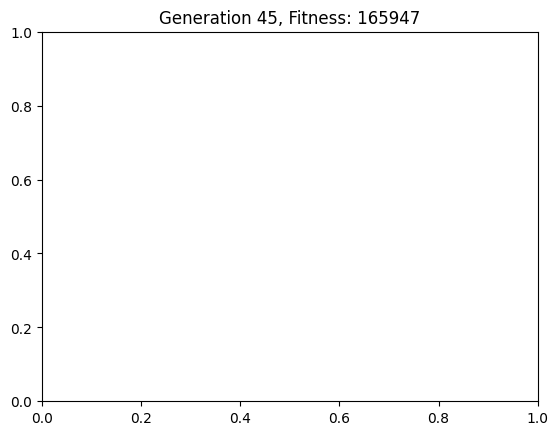

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (381, 97), 'size': (244, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 227)}], 'fitness': 165947}


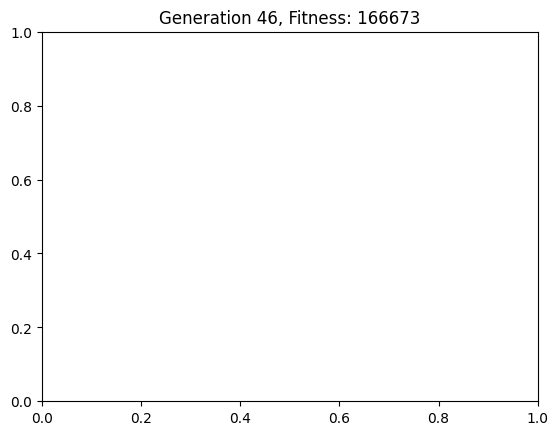

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (377, 97), 'size': (248, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 186)}], 'fitness': 166673}


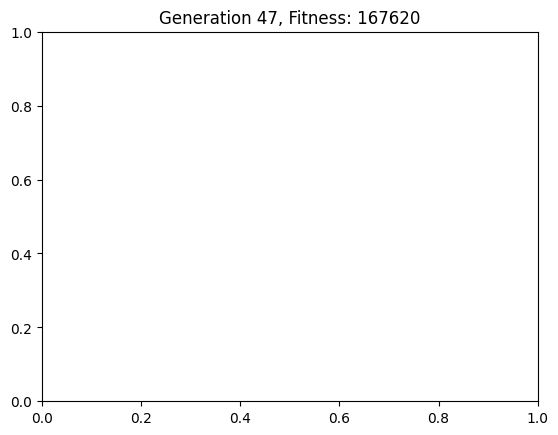

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (373, 97), 'size': (252, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 198)}], 'fitness': 167620}


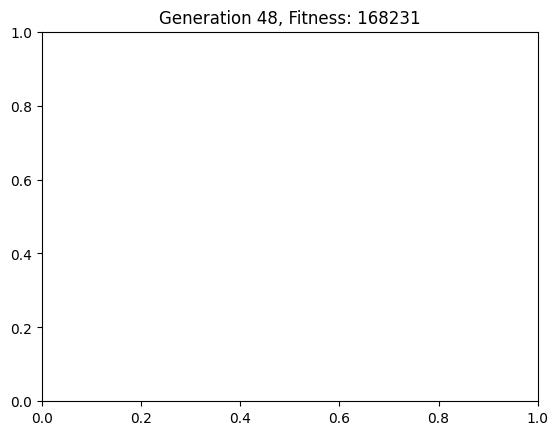

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (369, 97), 'size': (256, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 209)}], 'fitness': 168231}


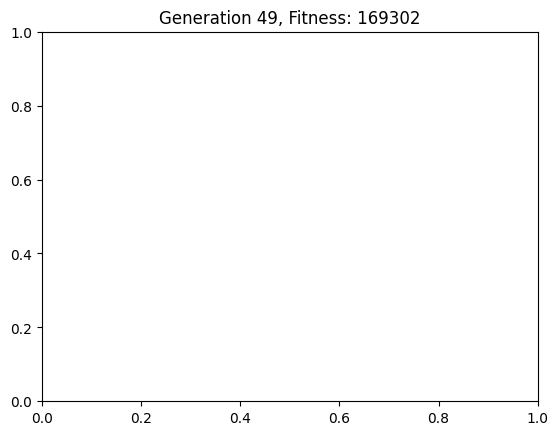

{'rooms': [{'name': 'Living Room', 'position': (586, 336), 'size': (356, 118)}, {'name': 'Bedroom1', 'position': (462, 454), 'size': (110, 137)}, {'name': 'Bedroom2', 'position': (365, 97), 'size': (260, 239)}, {'name': 'Passage', 'position': (462, 346), 'size': (124, 108)}, {'name': 'Kitchen', 'position': (572, 454), 'size': (86, 137)}, {'name': 'Washroom', 'position': (347, 362), 'size': (115, 195)}], 'fitness': 169302}
Elapsed time: 545.70 seconds


<Figure size 640x480 with 0 Axes>

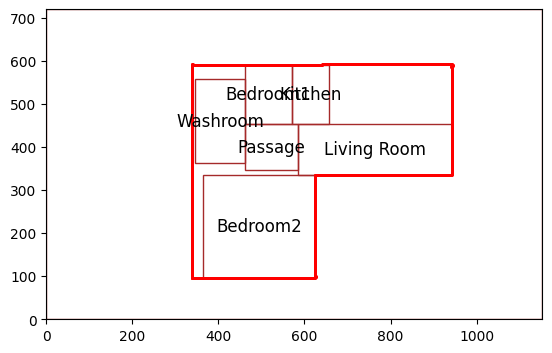

Elapsed time for initial population generation: 28.13 seconds


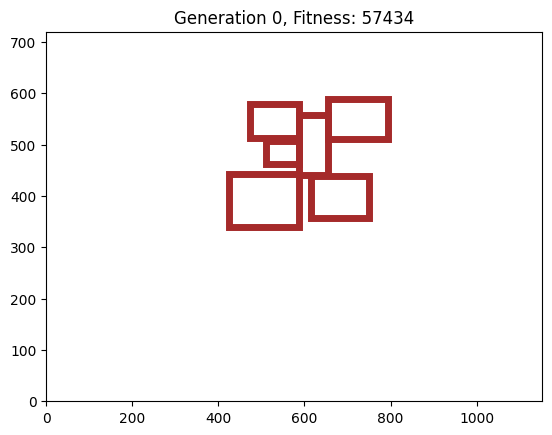

{'rooms': [{'name': 'Living Room', 'position': (424, 340), 'size': (164, 103)}, {'name': 'Passage', 'position': (588, 440), 'size': (66, 117)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}, {'name': 'Bedroom1', 'position': (616, 357), 'size': (135, 82)}, {'name': 'Bedroom2', 'position': (655, 510), 'size': (140, 78)}], 'fitness': 57434}


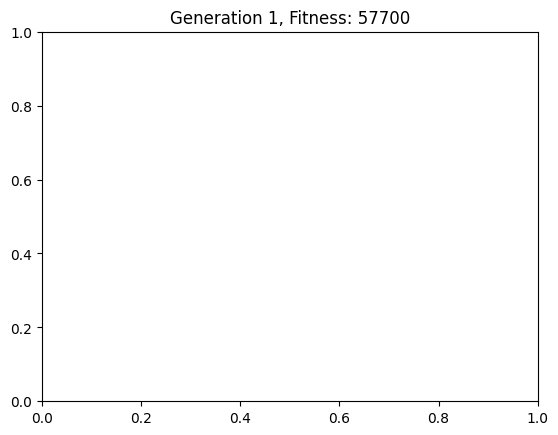

{'rooms': [{'name': 'Living Room', 'position': (424, 340), 'size': (164, 103)}, {'name': 'Passage', 'position': (588, 440), 'size': (66, 117)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}, {'name': 'Bedroom1', 'position': (616, 357), 'size': (135, 82)}, {'name': 'Bedroom2', 'position': (655, 510), 'size': (140, 78)}], 'fitness': 57700}


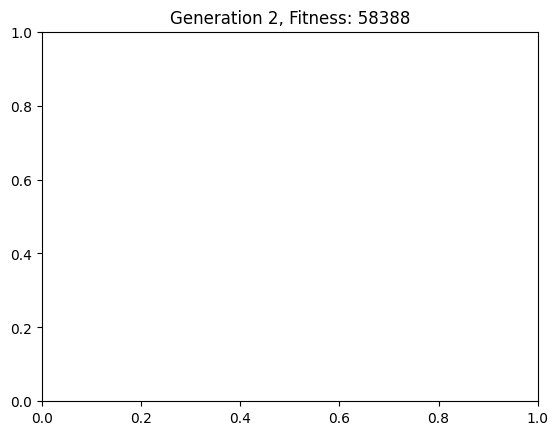

{'rooms': [{'name': 'Living Room', 'position': (420, 340), 'size': (166, 109)}, {'name': 'Bedroom1', 'position': (616, 354), 'size': (141, 85)}, {'name': 'Bedroom2', 'position': (655, 509), 'size': (146, 83)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 58388}


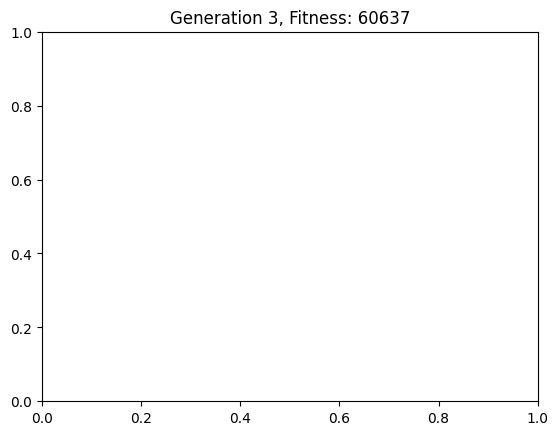

{'rooms': [{'name': 'Living Room', 'position': (416, 340), 'size': (170, 117)}, {'name': 'Bedroom1', 'position': (616, 350), 'size': (149, 89)}, {'name': 'Bedroom2', 'position': (655, 505), 'size': (154, 87)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 60637}


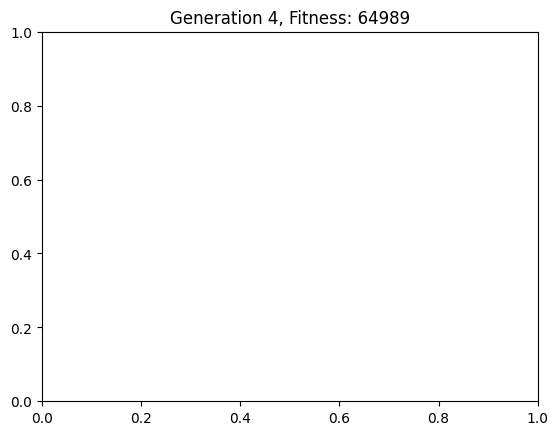

{'rooms': [{'name': 'Living Room', 'position': (412, 339), 'size': (174, 124)}, {'name': 'Bedroom1', 'position': (616, 346), 'size': (157, 93)}, {'name': 'Bedroom2', 'position': (655, 501), 'size': (162, 91)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 64989}


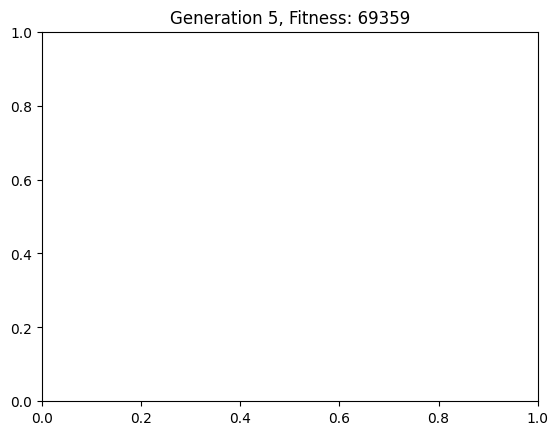

{'rooms': [{'name': 'Living Room', 'position': (408, 335), 'size': (178, 128)}, {'name': 'Bedroom1', 'position': (616, 342), 'size': (165, 97)}, {'name': 'Bedroom2', 'position': (655, 497), 'size': (170, 95)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 69359}


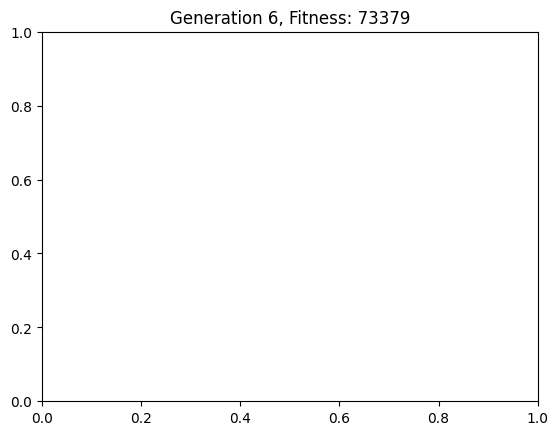

{'rooms': [{'name': 'Living Room', 'position': (404, 331), 'size': (182, 132)}, {'name': 'Bedroom1', 'position': (616, 338), 'size': (173, 101)}, {'name': 'Bedroom2', 'position': (655, 493), 'size': (178, 99)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 73379}


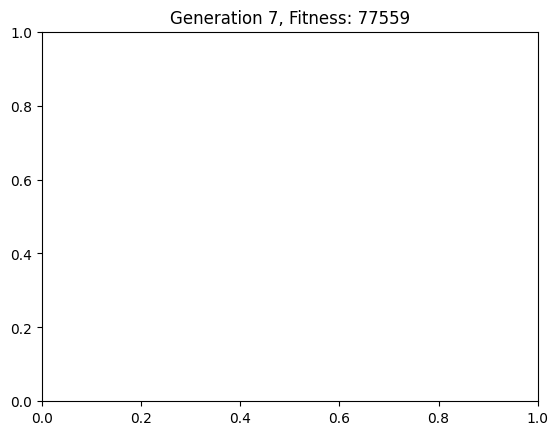

{'rooms': [{'name': 'Living Room', 'position': (400, 327), 'size': (186, 136)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (181, 104)}, {'name': 'Bedroom2', 'position': (655, 489), 'size': (186, 103)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 77559}


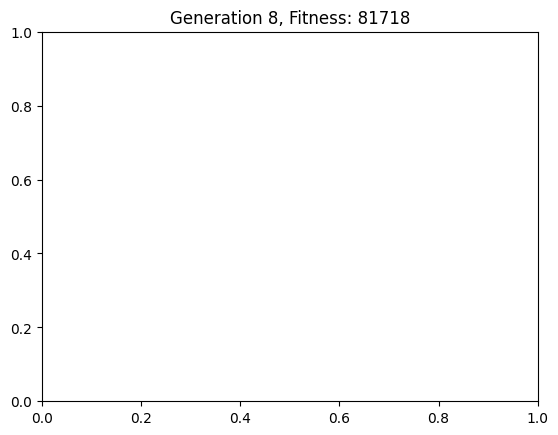

{'rooms': [{'name': 'Living Room', 'position': (396, 323), 'size': (190, 140)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (189, 104)}, {'name': 'Bedroom2', 'position': (655, 485), 'size': (194, 107)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 81718}


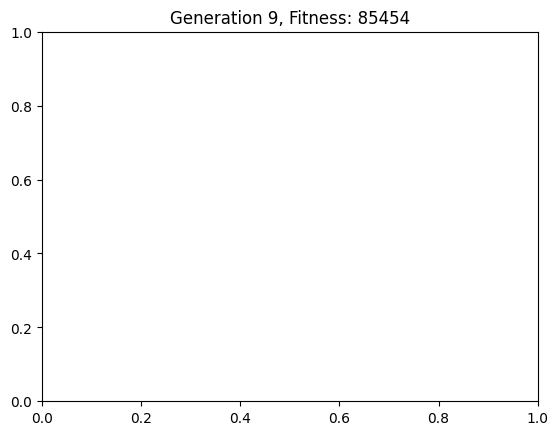

{'rooms': [{'name': 'Living Room', 'position': (392, 319), 'size': (194, 144)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (197, 104)}, {'name': 'Bedroom2', 'position': (655, 481), 'size': (202, 111)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 85454}


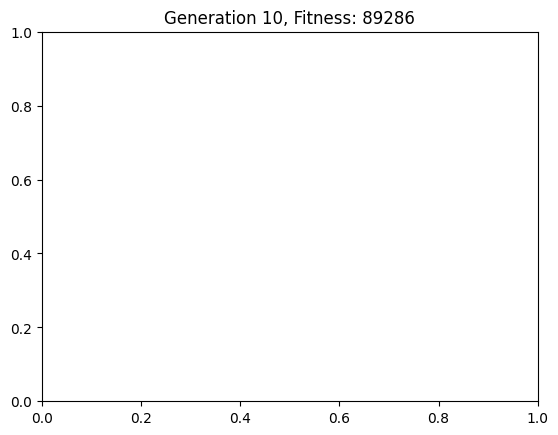

{'rooms': [{'name': 'Living Room', 'position': (388, 315), 'size': (198, 148)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (205, 104)}, {'name': 'Bedroom2', 'position': (655, 477), 'size': (210, 115)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 89286}


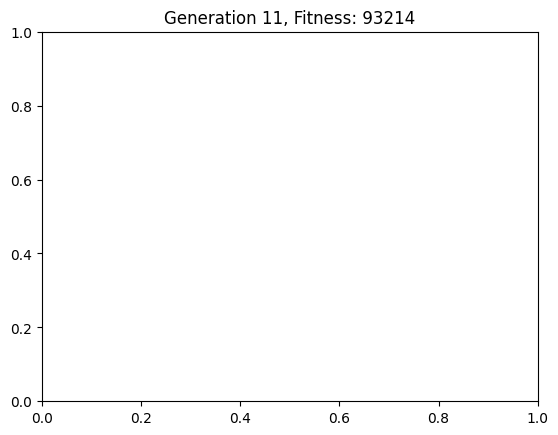

{'rooms': [{'name': 'Living Room', 'position': (384, 311), 'size': (202, 152)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (213, 104)}, {'name': 'Bedroom2', 'position': (655, 473), 'size': (218, 119)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 93214}


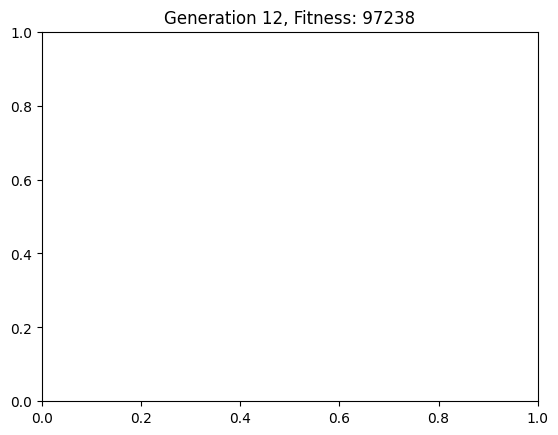

{'rooms': [{'name': 'Living Room', 'position': (380, 307), 'size': (206, 156)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (221, 104)}, {'name': 'Bedroom2', 'position': (655, 469), 'size': (226, 123)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 97238}


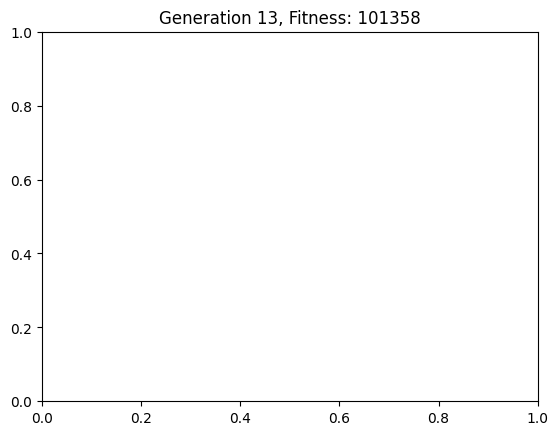

{'rooms': [{'name': 'Living Room', 'position': (376, 303), 'size': (210, 160)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (229, 104)}, {'name': 'Bedroom2', 'position': (655, 465), 'size': (234, 127)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 101358}


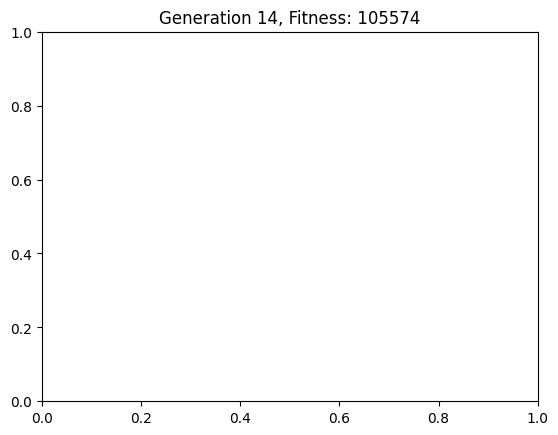

{'rooms': [{'name': 'Living Room', 'position': (372, 299), 'size': (214, 164)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (237, 104)}, {'name': 'Bedroom2', 'position': (655, 461), 'size': (242, 131)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 105574}


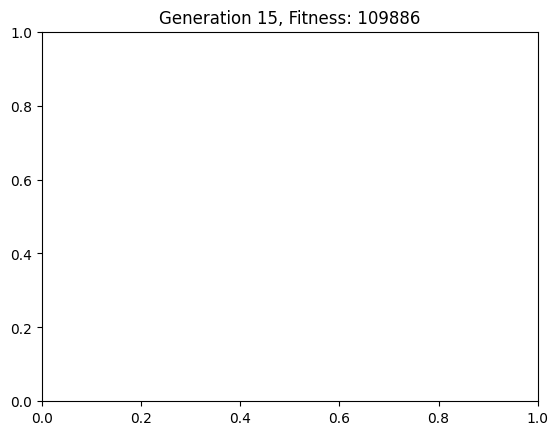

{'rooms': [{'name': 'Living Room', 'position': (368, 295), 'size': (218, 168)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (245, 104)}, {'name': 'Bedroom2', 'position': (655, 457), 'size': (250, 135)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 109886}


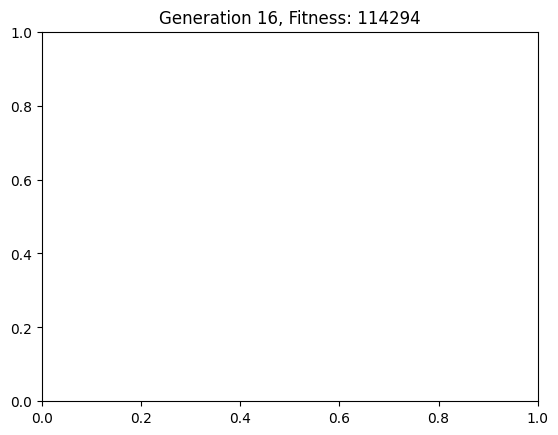

{'rooms': [{'name': 'Living Room', 'position': (364, 291), 'size': (222, 172)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (253, 104)}, {'name': 'Bedroom2', 'position': (655, 453), 'size': (258, 139)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 114294}


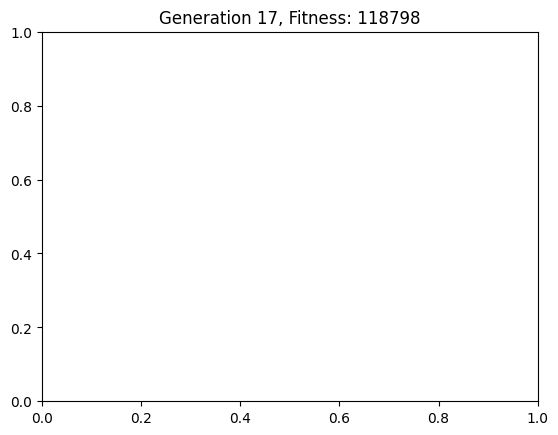

{'rooms': [{'name': 'Living Room', 'position': (360, 287), 'size': (226, 176)}, {'name': 'Bedroom1', 'position': (616, 336), 'size': (261, 104)}, {'name': 'Bedroom2', 'position': (655, 449), 'size': (266, 143)}, {'name': 'Passage', 'position': (587, 440), 'size': (68, 108)}, {'name': 'Kitchen', 'position': (473, 512), 'size': (114, 68)}, {'name': 'Washroom', 'position': (511, 463), 'size': (76, 44)}], 'fitness': 118798}


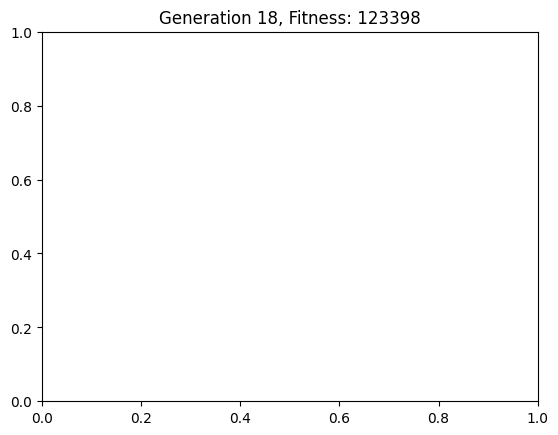

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from shapely.geometry import Polygon
# from test import population as population_final
from input_converter import *
import random
from skimage import measure
global i1
i1 = 0
from pix_array import floorArray
import time
import sys
from numba import jit
import copy


def find_closest_point_brute_force(void_x, void_y,floor_plan,target_rooms=["Kitchen", "Washroom", "Bedroom1"]):
  """
  This function finds the closest point to a given point using a brute force approach.

  Args:
      point: A tuple representing the reference point (x1, y1).
      points: A list of tuples representing points (x2, y2).

  Returns:
      A tuple representing the closest point (x2, y2) and its distance to the reference point.
  """
  closest_point = None
  min_distance = float('inf')  # Initialize with positive infinity
  rooms= floor_plan["rooms"]
  for room in rooms:
    if room["name"] in target_rooms:
    # Calculate distance using distance formula

        distance = ((room['position'][0] - void_x)**2 + (room['position'][1] - void_y)**2)**0.5
        if distance < min_distance:
            min_distance = distance
            closest_point = room["position"]
            room_name = room["name"]

  return closest_point, room_name


class RoomPlanner(object):
    def __init__(self, PLOT_SIZE=(80, 120), MIN_ROOM_SIZE=(10, 10), NUM_BEDROOMS=3,
                 POPULATION_SIZE=80, NUM_GENERATIONS=50, MUTATION_RATE=2,
                 MAX_MUTATION_PERCENTAGE=0.1, SIZE_INCREASE_FACTOR=1,
                 COLLISION_RESOLUTION_STEPS=10, MIN_NUM_ROOMS=2,
                 GRID_SIZE=(10, 10), MIN_AREA=10, path=r"/content/test_plot.png"):
        self.PLOT_SIZE = PLOT_SIZE
        self.MIN_ROOM_SIZE = MIN_ROOM_SIZE
        self.NUM_BEDROOMS = NUM_BEDROOMS
        self.POPULATION_SIZE = POPULATION_SIZE
        self.NUM_GENERATIONS = NUM_GENERATIONS
        self.MUTATION_RATE = MUTATION_RATE
        self.MAX_MUTATION_PERCENTAGE = MAX_MUTATION_PERCENTAGE
        self.SIZE_INCREASE_FACTOR = SIZE_INCREASE_FACTOR
        self.COLLISION_RESOLUTION_STEPS = COLLISION_RESOLUTION_STEPS
        self.MIN_NUM_ROOMS = MIN_NUM_ROOMS
        self.GRID_SIZE = GRID_SIZE
        self.MIN_AREA = MIN_AREA
        self.BEDROOM_SIZE = (10, 10)
        self.MIN_KITCHEN_SIZE = (15,15*1.5)
        self.APPROXIMATION_FACTOR = 0.5
        self.MAX_XY_RATIO = 1.8
        self.MIN_XY_RATIO = 1.5
        self.MIN_LIVING_ROOM_SIZE = (20, 20)
        self.BEDROOM_FACTOR = 0.35
        self.KITCHEN_FACTOR = 0.10
        self.LIVING_ROOM_FACTOR = 0.4
        self.MIN_LIVING_ROOM_SIZE = (45,45)
        # pri_useless_t("gen change")
        # path= "test_plot.png"
        self.floor_plan_array = floorArray(path)
        self.floor_plan_set = set()
        self.PLOT_SIZE = (self.floor_plan_array.shape[1], self.floor_plan_array.shape[0])
        self.path = path
        self.self_neighbours = [[], [], []] # [lr_neig, passage_neig, kitchen_neig, br1_neig, ... , bri_neig]


    def check_overlap(self, position1, size1, position2, size2):
        return (position1[0] < position2[0] + size2[0] and position1[0] + size1[0] > position2[0] and position1[1] < position2[1] + size2[1] and position1[1] + size1[1] > position2[1])

    def generate_initial_population(self, ax, generation, stime):
        population = [] # 1st to last
        array_population = []
        # fit_score = -sys.maxsize - 1
        for _ in range(self.POPULATION_SIZE):
            fp, array_fp = self.generate_random_rooms(ax, generation)
            population.append(fp)
            array_population.append(array_fp)
            # if(fp['fitness']>fit_score):
        mtime = time.time()

        elapsed_time = mtime - stime
        print(f"Elapsed time for initial population generation: {elapsed_time:.2f} seconds")
        return population, array_population





    def generate_random_rooms(self, ax, generation):
        rooms = {'rooms': [], 'fitness': 0}
        room_positions, array_fp = initial_population(self.path)
        try:
            living_room = {'name': 'Living Room', 'position': room_positions['living room']['vertex'], 'size': (room_positions['living room']['length'], room_positions['living room']['breadth'])}
            rooms['rooms'].append(living_room)
        except:
           print("No Living room")
        try:
            passage = {'name': 'Passage', 'position': room_positions['passage']['vertex'], 'size': (room_positions['passage']['length'], room_positions['passage']['breadth'])}
            rooms['rooms'].append(passage)
        except:
           print("No passage")
        try:
            kitchen = {'name': 'Kitchen', 'position': room_positions['kitchen']['vertex'], 'size': (room_positions['kitchen']['length'], room_positions['kitchen']['breadth'])}
            rooms['rooms'].append(kitchen)
        except:
           print("No Kitchen")
        try:
            wc = {'name': 'Washroom', 'position': room_positions['bathroom']['vertex'], 'size': (room_positions['bathroom']['length'], room_positions['bathroom']['breadth'])}
            rooms['rooms'].append(wc)
        except:
           print("No Washroom")
        try:
            bedroom = {'name': 'Bedroom' + str(1), 'position': room_positions['bedroom']['vertex'], 'size': (room_positions['bedroom']['length'], room_positions['bedroom']['breadth'])}
            rooms['rooms'].append(bedroom)
            bedroom = {'name': 'Bedroom' + str(2), 'position': room_positions['bedroom2']['vertex'], 'size': (room_positions['bedroom2']['length'], room_positions['bedroom2']['breadth'])}
            rooms['rooms'].append(bedroom)
        except:
           print("No Bedroom")

        rooms['fitness'] = self.calculate_fitness(rooms['rooms'],ax)
        return rooms, array_fp

    #************************************************************************************************************************************************************************************

    import numpy as np
    from shapely.geometry import Polygon
    import random

    # TODO: VERIFIED
    def get_centroid(self,room):
        x1 = room['position'][0]
        y1 = room['position'][1]
        x2 = room['position'][0] + room['size'][0]
        y2 = room['position'][1]
        x3 = room['position'][0] + room['size'][0]
        y3 = room['position'][1] + room['size'][1]
        x4 = room['position'][0]
        y4 = room['position'][1] + room['size'][1]
        vertices = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
        n = len(vertices)
        A = 0
        Cx = 0
        Cy = 0

        for i in range(n):
            x_i, y_i = vertices[i]
            x_ip1, y_ip1 = vertices[(i + 1) % n]
            cross_product = (x_i * y_ip1) - (x_ip1 * y_i)
            A += cross_product
            Cx += (x_i + x_ip1) * cross_product
            Cy += (y_i + y_ip1) * cross_product

        A *= 0.5
        Cx /= (6 * A)
        Cy /= (6 * A)

        return (Cx, Cy)

#************************************************************************************************************************************************************************************

    # TODO: VERIFIED
    def get_total_plot_area(self):
        plot = self.load_plot(r"/content/final_plot.txt")
        plot_vertices = self.find_plot_vertices(plot)
        plot_polygon = Polygon(plot_vertices)
        return plot_polygon.area

    def get_area_fitness(self, room_list):
        """
        # input like [{'name': 'By_laws', 'position": (60.8,
            # 108.8), 'size': (19.2, 11.2)), {'name': 'Living Room', 'position': (12,
            # 71), 'size': (68, 49)}, {'name': 'Passage', 'position': (0, 25), 'size': (12, 81)}, (name: Kitchen, position: (0, 51), size: (12, 25)), {'name': 'Bedroom1', 'position': (12, 12), 'size': (30, 30)}, ('name':
            # 'Washroom', 'position': (32, 32), 'size': (7.5, 7)}]
        """
        area = 0
        for room in room_list:
            # input : {'name': 'Living Room', 'position': (12, 71), 'size': (68, 49)}
            x1 = room['position'][0]
            y1 = room['position'][1]
            x2 = room['position'][0] + room['size'][0]
            y2 = room['position'][1] + room['size'][1]
            coordinates = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]
            polygon = Polygon(coordinates)
            area = area + polygon.area
        return area / self.get_total_plot_area()

    #************************************************************************************************************************************************************************************

    def get_vertices(self,room):
        x1 = room['position'][0]
        y1 = room['position'][1]
        x2 = room['position'][0] + room['size'][0]
        y2 = room['position'][1]
        x3 = room['position'][0] + room['size'][0]
        y3 = room['position'][1] + room['size'][1]
        x4 = room['position'][0]
        y4 = room['position'][1] + room['size'][1]
        vertices = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
        return vertices

    #************************************************************************************************************************************************************************************

    def get_irregularity_for_each_room(self,room_list):

        '''
        input:
        room_list: list of dictionaries containing details of all rooms
        plot_vertices: list of vertices of the plot

        output:
        irregularity: float value representing the irregularity of the room
        '''

        irregularity = 0
        for room in room_list:
            room_centroid = self.get_centroid(room)
            room_vertices = self.get_vertices(room)
            irregularity += self.get_irregularity(room_centroid, room_vertices)
            # bound between 0 and 1
            bounded_irregularity = irregularity / len(room_list)
        return bounded_irregularity


    def get_irregularity(self,room_centroid, room_vertices):

        '''
        input:
        room_centroid: tuple of centroid of the room
        plot_vertices: list of vertices of the plot

        output:
        irregularity: float value representing the irregularity of the room
        '''

        absolute_distances = []
        for vertex in room_vertices:
            distance = np.sqrt((room_centroid[0] - vertex[0])**2 + (room_centroid[1] - vertex[1])**2)
            absolute_distances.append(distance)

        mean_distance = np.mean(absolute_distances)

        irregularity = 0
        for distance in absolute_distances:
            irregularity += np.abs(distance - mean_distance)
        return irregularity

    #************************************************************************************************************************************************************************************

    # TODO : Choose the best way to calculate distance
    def calculate_distance_fitness(self,plot_centroid, figure_centroid):

        distance = np.sqrt((plot_centroid[0] - figure_centroid[0])**2 + (plot_centroid[1] - figure_centroid[1])**2)


        plot_x, plot_y = plot_centroid
        figure_x, figure_y = figure_centroid


        # higher the distance, higher the fitness

        plot_vertices = self.find_plot_vertices(self.load_plot(r"/content/final_plot.txt"))

        max_distance_vertex_from_centroid = 0

        for vertex in plot_vertices:
            distance = np.sqrt((plot_centroid[0] - vertex[0])**2 + (plot_centroid[1] - vertex[1])**2)
            if distance > max_distance_vertex_from_centroid:
                max_distance_vertex_from_centroid = distance

        distance_bonus = distance / max_distance_vertex_from_centroid


        # distance_fitness = distance / (plot_x + plot_y)

        # plot_width = self.PLOT_SIZE[0]
        # plot_height = self.PLOT_SIZE[1]
        # corner_preference = 1.0


        # min_x_distance_to_corner = min(figure_x, plot_width - figure_x)
        # min_y_distance_to_corner = min(figure_y, plot_height - figure_y)

        # corner_penalty = 1.0 - (min_x_distance_to_corner + min_y_distance_to_corner) / (plot_width + plot_height)


        # fitness = (1 - corner_preference) * (1 - distance_penalty) + corner_preference * (1 - corner_penalty)

        return distance_bonus



    def calculate_fitness_gradient(distance):
        '''
        Simple linear gradient function to calculate fitness based on distance

        Higher the distance, higher the fitness
        '''
        max_distance = 20


        if distance <= max_distance:
            fitness = distance / max_distance
        else:
            fitness = 0

        return fitness

     #************************************************************************************************************************************************************************************

    def calculate_area(vertices):
        # Calculate area of polygon using shoelace formula
        n = len(vertices)
        area = 0.0
        for i in range(n):
            x1, y1 = vertices[i]
            x2, y2 = vertices[(i + 1) % n]
            area += x1 * y2 - y1 * x2
        return abs(area) / 2.0




    def load_plot(file_path):
        return np.loadtxt(file_path, dtype=int)


    # TODO : VERIFIED
    def find_plot_vertices(self,plot):
        contours = measure.find_contours(plot, level=0.5)
        vertices = []

        # Ensure that the contours are sorted by size in descending order and select the largest contour
        contours = sorted(contours, key=lambda x: len(x), reverse=True)
        largest_contour = contours[0]

        # Convert the contour coordinates to integer and remove duplicates
        for coord in largest_contour:
            x, y = int(coord[1]), int(coord[0])
            if (x, y) not in vertices:
                vertices.append((x, y))

        return vertices

    def get_all_boundary_overlap_penalty(self,room_list, plot_vertices):
        penalty = 0
        for room in room_list:

            room_vertices = self.get_vertices(room)
            penalty += self.get_boundary_overlap_penalty(room_vertices, plot_vertices)
        normalized_penalty = penalty / len(room_list)
        # subtract from 1 to get the fitness
        return 1 - normalized_penalty



    def get_boundary_overlap_penalty(self,room_vertices, plot_vertices):

        '''
        input:
        room_vertices: list of vertices of the room
        plot_vertices: list of vertices of the plot

        output:
        boundary_overlap_penalty: float value representing the boundary overlap penalty
        '''
        # transfrom room vertices to polygon

        boundary_overlap_penalty = 0

        room_polygon = Polygon(room_vertices)
        plot_polygon = Polygon(plot_vertices)

        room_area = room_polygon.area
        plot_area = plot_polygon.area


        intersection_area = room_polygon.intersection(plot_polygon).area


        if room_area == intersection_area:
            boundary_overlap_penalty = 0.0
        else:

            area_outside_plot = room_area - intersection_area


            boundary_overlap_penalty = area_outside_plot / room_area

        return boundary_overlap_penalty

    #************************************************************************************************************************************************************************************

    def check_every_connection(self,room_list,reference_connection_matrix):

            '''
            input:
            room_list: list of dictionaries containing details of all rooms

            output:
            connection: boolean value representing whether all rooms are connected
            '''

            fitness = 100

            for i in range(len(room_list)):
                for j in range(i + 1, len(room_list)):
                    if not self.check_connection(room_list[i], room_list[j], reference_connection_matrix):
                        fitness -= 1

            return fitness / 100

    def check_connection(self, room1, room2, reference_connection_matrix):
        '''
        input:
        room1: dictionary containing details of room1
        room2: dictionary containing details of room2
        reference_connection_matrix: the connection matrix indicating connections between rooms
        rooms: list of room names

        output:
        connection: boolean value representing whether room1 and room2 are connected
        '''

        room1_name = room1["name"]
        room2_name = room2["name"]

        if room1_name == room2_name:
            return True

        try:
            room1_index = rooms.index(room1_name)
            room2_index = rooms.index(room2_name)
        except:
            return False

        # Check connection in both ways: room1 to room2 and room2 to room1
        if reference_connection_matrix[room1_index][room2_index] == 1 or reference_connection_matrix[room2_index][room1_index] == 1:
            return True

        return False

    #************************************************************************************************************************************************************************************

        # Perfect aspect ratios for each room type
    perfect_aspect_ratios = {
        "living room": random.uniform(1.4,1.8),
        "passage": random.uniform(1.6,2),
        "kitchen": random.uniform(1.6,2),
        "bathroom":random.uniform(1.6,2),
        "bedroom1": random.uniform(1.6,2)
    }

    def calculate_aspect_ratio(self,length, breadth):
        if length == 0 or breadth == 0:
            return 0
        return max(length / breadth, breadth / length)


    def get_skewness(self,room_list):
        fitness = 0
        for room in room_list:
            room_name = room["name"].lower()
            length, breadth = room["size"]
            aspect_ratio = self.calculate_aspect_ratio(length, breadth)

            if room_name in self.perfect_aspect_ratios:
                perfect_ratio = self.perfect_aspect_ratios[room_name]
                deviation = abs(aspect_ratio - perfect_ratio)
                fitness += 1 / (1 + deviation)

        return fitness / len(room_list)

    #************************************************************************************************************************************************************************************

    def calculate_room_center(self,position, size):
        x, y = position
        length, breadth = size
        center_x = x + length / 2
        center_y = y + breadth / 2
        return center_x, center_y

    # @jit(nopython=True)
    def calculate_distance(self,point1, point2):
        return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

    def fitness_function_distribution(self,room_list, plot_centroid):
        distances = []
        for room in room_list:
            room_center = self.calculate_room_center(room["position"], room["size"])
            distance = self.calculate_distance(room_center, plot_centroid)
            distances.append(distance)

        # Calculate the standard deviation of distances
        std_distance = np.std(distances)

        # more distributed the rooms, higher the fitness
        # more dispersed the rooms, higher the fitness
        fitness = 1 / (1 + std_distance)



    #************************************************************************************************************************************************************************************

    def get_slopes(self,room1,room2,room_list):
        # room = {"name": "Living Room", "position": (0, 0), "size": (0, 1)}
        # room_list = [{"name": "Living Room", "position": (0, 0), "size": (0, 1)}, {"name": "Bedroom1", "position": (0, 0), "size": (0, 1)}]
        room1_x = room1['position'][0]
        room1_y = room1['position'][1]
        room1_width = room1['size'][0]
        room1_height = room1['size'][1]

        coords1 = [(room1_x, room1_y), (room1_x + room1_width, room1_y), (room1_x + room1_width, room1_y + room1_height), (room1_x, room1_y + room1_height)]

        if room2 == room1:
            return [0, 0, 0, 0]




        room_slopes1 = [(coords1[1][1] - coords1[0][1]) / (coords1[1][0] - coords1[0][0]), (coords1[2][1] - coords1[1][1]) / (coords1[2][0] - coords1[1][0]), (coords1[3][1] - coords1[2][1]) / (coords1[3][0] - coords1[2][0]), (coords1[0][1] - coords1[3][1]) / (coords1[0][0] - coords1[3][0])]

        return room_slopes1


    def slant_fitness(self,room_list):
        irregularity = 0
        for room in room_list:
            room_slopes = self.get_slopes(room,room,room_list)
            for i in range(4):
                if room_slopes[i] != 1 or room_slopes[i] != -1 or room_slopes[i] != 0:
                    irregularity += 1
        return 4*len(room_list) - irregularity

    #************************************************************************************************************************************************************************************'

    def load_plot(self,file_path):
        return np.loadtxt(file_path)

    def find_plot_centroid(self,plot):
        non_zero_coords = np.argwhere(plot > 0)
        centroid = np.mean(non_zero_coords, axis=0)
        return centroid

    #************************************************************************************************************************************************************************************

    def calculate_room_area(self,size):
        """Calculate the area of a room given its size (width, height)."""
        return size[0] * size[1]

    def fitness_function_size_comparison(self,room_list):
        """
        Calculate a fitness score based on the sizes of rooms.

        Args:
            room_list (list of dicts): Each dict contains 'name', 'position', and 'size' of a room.

        Returns:
            float: Fitness score.
        """
        # Initialize room areas
        room_areas = {}
        for room in room_list:
            room_name = room["name"]
            room_area = self.calculate_room_area(room["size"])
            room_areas[room_name] = room_area

        # Assign weights to size relationships
        living_room_weight = 1.5
        bedroom_weight = 1.4
        kitchen_weight = 1.0
        passage_weight = 1.0
        wc_weight = 0.3

        # Calculate size relationships
        fitness = 0.0
        if room_areas["Living Room"] > room_areas["Passage"]:
            fitness += living_room_weight
        if room_areas["Living Room"] > room_areas["Washroom"]:
            fitness += living_room_weight
        if room_areas["Bedroom1"] > room_areas["Passage"]:
            fitness += bedroom_weight
        if room_areas["Bedroom1"] > room_areas["Washroom"]:
            fitness += bedroom_weight
        if room_areas["Kitchen"] > room_areas["Passage"] and room_areas["Kitchen"] < room_areas["Living Room"]:
            fitness += kitchen_weight
        if room_areas["Kitchen"] > room_areas["Washroom"] and room_areas["Kitchen"] < room_areas["Bedroom1"]:
            fitness += kitchen_weight

        # Normalize fitness score (optional)
        max_fitness = 2 * (living_room_weight + bedroom_weight + kitchen_weight)
        fitness_normalized = fitness / max_fitness

        return fitness_normalized

    #************************************************************************************************************************************************************************************

    def calculate_fitness(self, room_list,ax=0):


        plot_path = r"/content/final_plot.txt"


        plot = self.load_plot(plot_path)

        plot_centroid = self.find_plot_centroid(plot)

        # # Calculate the fitness of the room distribution
        # distribution_fitness = self.fitness_function_distribution(room_list, plot_centroid)

        # Calculate the fitness of the room aspect ratios
        skewness_fitness = self.get_skewness(room_list)

        # Calculate the fitness of the room irregularity
        # slant_fitness = self.slant_fitness(room_list)

        # plot_vertices = self.find_plot_vertices(plot)

        # Calculate the fitness of the room boundary overlap
        # boundary_overlap_penalty = self.get_all_boundary_overlap_penalty(room_list, plot_vertices)

        size_comparison_fitness = self.fitness_function_size_comparison(room_list)

        # Calculate the fitness of the room connection

#         reference_connection_matrix = np.array([[0, 1, 1, 1, 1],
# [1, 0, 0, 0, 0],
# [1, 0, 0, 0, 0],
# [1, 0, 0, 0, 0],
# [1, 0, 0, 0, 0]]
# )
        # connection_fitness = self.check_every_connection(room_list,reference_connection_matrix)

        # Calculate the fitness of the room area

        area_fitness = self.calculate_area_fitness(room_list,ax,0)

        # Calculate the fitness of the room irregularity
        # irregularity_fitness = self.get_irregularity_for_each_room(room_list)

        # Calculate the fitness of the room distance from the plot centroid
        distance_fitness = self.calculate_distance_fitness(plot_centroid, self.get_centroid(room_list[0]))




        master_fitness = 1*skewness_fitness + 150*area_fitness + 4*distance_fitness + 4*size_comparison_fitness

        return master_fitness

    #************************************************************************************************************************************************************************************
    # @jit(nopython=True)
    def room_array_label(self, name):
        # pri_useless_t(name)
        if(name[0:7]=="Living "):
            return 2
        elif(name[0:7]=="Bedroom"):
            return 6
        elif(name[0:7]=="Kitchen"):
            return 4
        elif name[0:7]=="Passage":
            return 3
        elif(name[0:7]=="Washroo"):
            return 5

    # @jit(nopython=True)
    def mark_in_room(self, population):
        for room in population['rooms']:
            pos = room['position']
            end_pos = (pos[0]+room['size'][0], pos[1]+room['size'][1])
            label = self.room_array_label(room['name'])
            self.mark_occupy(pos, end_pos, label)

    #@jit(nopython=True)
    def mark_occupy(self, position, end, label):
        for i in range(int(position[0]), int(end[0]+1)):
            for j in range(int(position[1]), int(end[1]+1)):
                self.floor_plan_array[i][j] = label
                if (i, j) in self.floor_plan_set:
                    self.floor_plan_set.remove((i, j))

    def get_index_for_neighbours(self, name):
        if name=="living_room":
            return 0
        if name=="passage":
            return 1
        if name=="kitchen":
            return 2
        # for i in range(1, NUM_BEDROOMS+1):
        if name[0:7]=="bedroom":
            return 2+int(name[7])
        else:
           #print_proxy("Room impossible")
            assert 0

    def check_side(self, side, neighbor_position, neighbor_size, kitchen_size):
        if side == 'left'  :
            return neighbor_position[0] - kitchen_size[0] >= 0
        elif side == 'right':
            return neighbor_position[0] + neighbor_size[0] + kitchen_size[0] <= self.PLOT_SIZE[0]
        elif side == 'top':
            return neighbor_position[1] + neighbor_size[1] + kitchen_size[1] <= self.PLOT_SIZE[1]
        elif side == 'bottom':
            return neighbor_position[1] - kitchen_size[1] >= 0
        return False

    def get_indexing(self, floor_plan):
        # pri_useless_t(floor_plan)
        if floor_plan['name']=='Living Room':
            return 1
        elif floor_plan['name']=='Bedroom1':
            return 3
        # elif floor_plan['name']=='Bedroom2':
        #     return 4
        elif floor_plan['name']=='Passage':
            return 0
        elif floor_plan['name']=='Kitchen':
            return 2
        elif floor_plan['name']=='Washroom':
            return 4
        # elif floor_plan['name']=='Washroom2':
        #     return 6
        else:
            # pri_useless_t(floor_plan['name'])
            return 7

    def position_to_index(self, floor_plan, i, j):
        for room in floor_plan:
            if room:
                x, y= room['position']
                w, h = room['size']
                if x<=i<=x+w and y<=j<=y+h:
                    return self.get_indexing(room)
        return 7
        # pri_useless_t(i)
        # pri_useless_t(j)
    #@jit(nopython=True)
    def convert_to_grid(self, floor_plan):
        grid = [[8] * (self.PLOT_SIZE[0]+1) for _ in range(self.PLOT_SIZE[1]+1)]
        # pri_useless_t()
        # pri_useless_t(len(grid))
        # pri_useless_t()
        for room in floor_plan:
            if room:
                x, y= room['position']
                x=int(x)
                y=int(y)
                w, h = room['size']
                w=int(w)
                h=int(h)
                # pri_useless_t(room["name"])
                # pri_useless_t(x)
                # pri_useless_t(x+w)
                for i in range(x, x+w):
                    # pri_useless_t(room['name'])
                    # pri_useless_t(y)
                    # pri_useless_t(y+h)
                    for j in range(y, y+h):
                        # pri_useless_t(i)
                        # pri_useless_t(j)
                        if j<=self.PLOT_SIZE[1] and i<=self.PLOT_SIZE[0]:
                            grid[j][i]=self.get_indexing(room)
        # pri_useless_t(grid)
        return grid

    # @jit(nopython=True)
    def grid_to_graph(self, floor_plan):
        map = [[0] * 5 for _ in range(5)]
        for room in floor_plan:
            if room:
                x, y= room['position']
                w, h = room['size']
                x=x-1
                if x>=0:
                    for j in range(int(y), int(y+h+1)):
                        if j<=y+h and self.get_indexing(room)<5 and j<=self.PLOT_SIZE[1] and x<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, x, j)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, x, j)]=1
                x, y= room['position']
                y=y-1
                if y>=0:
                    for i in range(int(x), int(x+w+1)):
                        if i<=x+w and self.get_indexing(room)<5 and y<=self.PLOT_SIZE[1] and i<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, i, y)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, i, y)]=1
                w=w+1
                h=h
                x=room['position'][0]
                y=room['position'][1]
                if x+w<=self.PLOT_SIZE[0]:
                    for j in range(int(y),int(y+h+1)):
                        # pri_useless_t(j)
                        # pri_useless_t(self.get_indexing(room))
                        # pri_useless_t(grid[j][x])
                        # pri_useless_t("aaaaaaaaaa")
                        if j<=y+h and self.get_indexing(room)<5 and j<=self.PLOT_SIZE[1] and x+w<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, x+w, j)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, x+w, j)]=1
                w, h = room['size']
                h=h+1
                x=room['position'][0]
                y=room['position'][1]
                if y+h<=self.PLOT_SIZE[1]:
                    for i in range(int(x),int(x+w+1)):
                        # pri_useless_t(i)
                        # pri_useless_t("aaaaaaabbb")
                        if i<=x+w and self.get_indexing(room)<5 and y+h<=self.PLOT_SIZE[1] and i<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, i, y+h)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, i, y+h)]=1
        return map

    #@jit(nopython=True)
    def check_within_shape(self, start_x, start_y, end_x, end_y):
        for x in range(int(start_x), int(end_x+1)):
            for y in range(int(start_y), int(end_y+1)):
                if self.floor_plan_array[y][x]==0:
                    return False
        return True


    #@jit(nopython=True)
    def calculate_area_fitness(self, floor_plan, ax, generation):
        # total_fitness = 0
        # pri_useless_t("a")
        # pri_useless_t(floor_plan)
        if type(floor_plan)==dict:
            i=floor_plan['fitness']
            floor_plan=floor_plan['rooms']
        # # Check if all rectangles fit within the plot

        # Check for overlapping rectangles
        overlap_area=0
        for i, rect1 in enumerate(floor_plan):
            for j, rect2 in enumerate(floor_plan):
                if i != j and rect1 and rect2:
                    # x1, y1, w1, h1 = rect1
                    # pri_useless_t("aaa")
                    x1, y1= rect1['position']
                    w1, h1 = rect1['size']
                    # x2, y2, w2, h2 = rect2
                   #print_proxy(floor_plan)
                    x2, y2= rect2['position']
                    w2, h2 = rect2['size']
                    # if not (x1 + w1 <= x2 or x2 + w2 <= x1 or y1 + h1 <= y2 or y2 + h2 <= y1):
                    #     # Penalize if rectangles overlap
                    #     return -1e6  # Return a very low fitness value
                    x_dist = (min(x1+w1, x2+w2) -max(x1,x2))
                    y_dist = (min(y1+h1, y2+h2) -max(y1, y2))
                    if x_dist<=0 or y_dist<=0:
                        continue
                    ar=x_dist*y_dist
                    # if ar==w1*h1:
                    #     return -100
                    # if ar==w2*h2:
                    #     return -100
                    overlap_area+=ar
        # if overlap_area>0:
        #     return -overlap_area


        # Calculate total area covered by rectangles
        total_area_covered=0
        # pri_useless_t("kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk")
        # pri_useless_t(overlap_area)
        # pri_useless_t()
        for rect in floor_plan:
            if rect:
                x, y= rect['position']
                w, h = rect['size']
                total_area_covered += w * h
        # Calculate total area of the plot
        plot_area = self.PLOT_SIZE[0] * self.PLOT_SIZE[1]

        # Reward solutions that cover the entire plot without overlap
        total_area = 1*total_area_covered - 1000*overlap_area

        for rect in floor_plan:
            if rect:
                x, y= rect['position']
                width, height = rect['size']
                if x < 0 or y < 0 or x + width > self.PLOT_SIZE[0] or y + height > self.PLOT_SIZE[1]:
                    # Penalize if any rectangle is outside the plot
                    total_area -=10000  # Return a very low fitness value

        # return total_fitness

        # grid = [[0] * (self.PLOT_SIZE[0]+1) for _ in range(self.PLOT_SIZE[1]+1)]

        # # Iterate through each rectangle and mark the grid cells covered by it
        # # pri_useless_t(type(floor_plan))
        # if type(floor_plan)==dict:
        #     floor_plan=floor_plan['rooms']
        # for rect in floor_plan:
        #     # x, y, width, height = rect
        #     # pri_useless_t(rect)
        #     x, y= rect['position']
        #     width, height = rect['size']
        #     for i in range(x, x + width):
        #         for j in range(y, y + height):
        #             # Check if the grid cell is within the plot boundaries
        #             if 0 <= i <= self.PLOT_SIZE[0] and 0 <= j <= self.PLOT_SIZE[1]:
        #                 grid[j][i] += 1  # Increment the count of rectangles covering this grid cell

        # # Calculate the total area occupied by rectangles, considering intersections
        # total_area = 0
        # for row in grid:
        #     for cell in row:
        #         # If a grid cell is covered by more than one rectangle, count it only once
        #         if cell > 0:
        #             total_area += 1
        #         if cell >1:
        #             # pri_useless_t("aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaallllllllllllllllllllllllllllll")
        #             total_area-=1000
        # pri_useless_t()
        # pri_useless_t(grid)
        # pri_useless_t()

        # grid=self.convert_to_grid(floor_plan)
        map = self.grid_to_graph(floor_plan)
        # pri_useless_t(map)
        # pri_useless_t(matrix1)
        # assert 0

        for i in range(0, len(matrix1[0])):
            if matrix1[0][i]==1:
                if map[0][i]==1:
                    # return 0
                    are=self.get_room_area(i, floor_plan)
                    # if are==self.PLOT_SIZE[0]*self.PLOT_SIZE[1]:
                    #    total_area-=10000*self.get_room_area(i, floor_plan)
                    # else:
                    #     total_area+=1*are
            # if matrix[0][i]==1:
                else:
                    # return 0
                    # pri_useless_t(i)
                    are=self.get_room_area(i, floor_plan)
                    total_area-=10000*are
        # if map[3][4]!=1:
        #     total_area-=10000*self.get_room_area(5, floor_plan)
            # else:
            #     if map[0][i]==0:
            #         # return 0
            #         total_area+=1*self.get_room_area(i, floor_plan)
            # # if matrix[0][i]==1:
            #     else:
            #         # return 0
            #        #print_proxy(i)
            #         total_area-=1000*self.get_room_area(i, floor_plan)
        # for room in floor_plan:
        #     if room['name']=='Kitchen':
        #         if room['size'][1]/room['size'][0]!=1.5:
        #             total_area-=10000

        # pri_useless_t("llllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllll")
        # pri_useless_t()
        # pri_useless_t(total_area)
        # pri_useless_t()
        # try:
        #     self.update_plot1(floor_plan, total_area, ax, 69999999999)
        #     plt.pause(0.1)
        #     plt.draw()
        # except:
        #     self.update_plot1(floor_plan, total_area, ax, generation)
        #     plt.pause(0.1)
        #     plt.draw()
        # for room in floor_plan:
        #     if not self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
        #         are=room['size'][0]*room['size'][1]
        #         total_area-=1000*are

        return total_area

    #@jit(nopython=True)
    def get_room_area(self, i, floor_plan):
        if i==0:
            name='Passage'
        elif i==1:
            name='Living Room'
        elif i==2:
            name='Kitchen'
        elif i==3:
            name='Bedroom1'
        elif i==4:
            name='Bedroom2'
        elif i==5:
            name='Washroom'
        elif i==6:
            name='Washroom2'
        else:
            name='door'
        # pri_useless_t(name)
        # pri_useless_t(floor_plan)
        for room in floor_plan:
            if room and room['name']==name:
                return room['size'][0]*room['size'][1]
        return self.PLOT_SIZE[0]*self.PLOT_SIZE[1]

    def overlap_area(self, room1, room2):
        x_overlap = max(0, min(room1['position'][0] + room1['size'][0], room2['position'][0] + room2['size'][0]) - max(room1['position'][0], room2['position'][0]))
        y_overlap = max(0, min(room1['position'][1] + room1['size'][1], room2['position'][1] + room2['size'][1]) - max(room1['position'][1], room2['position'][1]))
        return x_overlap * y_overlap

    #@jit(nopython=True)
    def calculate_area_fitness_for_crossover(self, floor_plan):
        total_area = 0
        # floor_plan  = {'rooms': [{'name': 'Living Room', 'position': (5, 61), 'size': (45, 39)}, {'name': 'Passage', 'position': (0, 61), 'size': (5, 33)}, {'name': 'door', 'position': (50, 100), 'size': (-5, -5)}], 'fitness': 1945}
        # pri_useless_t("This FP" + str(floor_plan))
        # pri_useless_t("This FP" + str(floor_plan['rooms']))

        for room in floor_plan['rooms']:
            # pri_useless_t("This room" + str(room))
            if room:
                total_area += room['size'][0] * room['size'][1]

        # pri_useless_t("This total area" + str(total_area))
        return total_area


    #@jit(nopython=True)
    def crossover(self, parenti, parentj, ax, generation):
        # # change the logic
        # parent1 = []
        # parent1.append(paren1)
        # parent2 = []
        # parent2.append(paren2)
        # pri_useless_t("This parent1" + str(parent1))
        parent1=parenti.copy()
        parent2=parentj.copy()
        offspring1 = {'rooms': [], 'fitness': self.calculate_fitness(parent1['rooms'],ax)}
        offspring2 = {'rooms': [], 'fitness': self.calculate_fitness(parent2['rooms'],ax)}
        # for room in parent1['rooms']:
        #     if np.random.rand() < 0.5:
        #         offspring1['rooms'].append(room)
        #         offspring1['fitness'] = self.calculate_area_fitness(offspring1['rooms'])
        #     else:
        #         offspring2['rooms'].append(room)
        #         offspring2['fitness'] = self.calculate_area_fitness(offspring2['rooms'])
        # for room in parent2['rooms']:
        #     if np.random.rand() > 0.5:
        #         offspring1['rooms'].append(room)
        #         offspring1['fitness'] = self.calculate_area_fitness(offspring1['rooms'])
        #     else:
        #         offspring2['rooms'].append(room)
        #         offspring2['fitness'] = self.calculate_area_fitness(offspring2['rooms'])
        all_rooms=['Living room', 'Bedroom', 'Passage', 'Kitchen', 'Washroom', 'door']
        # for room in parent1['rooms']:
        #     if np.random.rand() < 0.5:
        #         block=0
        #         for room_child in offspring1['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring1['rooms'].append(room)
        #     else:
        #         block=0
        #         for room_child in offspring2['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring2['rooms'].append(room)
        # for room in parent2['rooms']:
        #     if np.random.rand() > 0.5:
        #         block=0
        #         for room_child in offspring1['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring1['rooms'].append(room)
        #     else:
        #         block=0
        #         for room_child in offspring2['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring2['rooms'].append(room)
        for room_name in all_rooms:
            # if np.random.rand() < 0.5:
            if np.random.uniform(0, 5)>=2.5:
                for room in parent1['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):
                        offspring1['rooms'].append(room)
                for room in parent2['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):
                        offspring2['rooms'].append(room)
            else:
                for room in parent2['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):
                        offspring1['rooms'].append(room)
                for room in parent1['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):

                        offspring2['rooms'].append(room)
        # for room_name in all_rooms:
        #     if np.random.rand() < 0.5:
        #         for room in parent1['rooms']:
        #             if room is None:
        #                 continue
        #             if(room['name'][0:7]==room_name[0:7]):

        #                 offspring2['rooms'].append(room)
        #     else:
        #         for room in parent2['rooms']:
        #             if room is None:
        #                 continue
        #             if(room['name'][0:7]==room_name[0:7]):
        #                 offspring2['rooms'].append(room)
        # if len(offspring1['rooms']) != len(parent1['rooms']) or len(offspring2['rooms']) != len(parent2['rooms']):
        #     self.crossover(parent1, parent2, ax)
        offspring1['fitness']=self.calculate_fitness(offspring1['rooms'])
        offspring2['fitness']=self.calculate_fitness(offspring2['rooms'])

        # self.update_plot(offspring2, ax, 699999999)
        # plt.pause(0.1)
        # plt.draw()


        return offspring1, offspring2

    #@jit(nopython=True)
    def get_factor(self, name):
        if(name[0:7]=="Living "):
            return 1
        elif(name[0:7]=="Bedroom"):
            return 0.5
        elif(name[0:7]=="Kitchen"):
            return 0.4
        elif name[0:7]=="Passage":
            return 0.15
        elif(name[0:7]=="Washroo"):
            return 0.1

    def resolv(self, room1, room2):
        x_diff = min(room1['position'][0]+room1['size'][0], room2['position'][0]+room2['size'][0])-max(room1['position'][0], room2['position'][0])
        y_diff = min(room1['position'][1]+room1['size'][1], room2['position'][1]+room2['size'][1])-max(room1['position'][1], room2['position'][1])
        if room2['position'][0]<room1['position'][0]:
            room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        elif room2['position'][0]>room1['position'][0]:
            room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        if room2['position'][1]<room1['position'][1]:
            room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        elif room2['position'][1]>room1['position'][1]:
            room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        return room1, room2

    def resolving(self, roomi, roomj):
        room1=roomi.copy()
        room2=roomj.copy()
        if room1['name']=='door' or room2['name']=='door':
            return room1, room2
        x_diff = min(room1['position'][0]+room1['size'][0], room2['position'][0]+room2['size'][0])-max(room1['position'][0], room2['position'][0])
        y_diff = min(room1['position'][1]+room1['size'][1], room2['position'][1]+room2['size'][1])-max(room1['position'][1], room2['position'][1])
       #print_proxy(room1)
       #print_proxy(x_diff)
       #print_proxy(y_diff)
       #print_proxy(room2)

        # if x_diff==room1['size'][0]:
        #     room1['position']= (np.random.randint(0, self.PLOT_SIZE[0]-room1['size'][0]), room1['position'][1])
        #     return room1, room2
        # elif x_diff==room2['size'][0]:
        #     room2['position'] = (np.random.randint(0, self.PLOT_SIZE[0]-room2['size'][0]), room2['position'][1])
        #     return room1, room2
        # if y_diff==room1['size'][1]:
        #     room1['position']= (room1['position'][0], np.random.randint(0, self.PLOT_SIZE[0]-room1['size'][1]))
        #     return room1, room2
        # elif x_diff==room2['size'][1]:
        #     room2['position'] = (room2['position'][0],np.random.randint(0, self.PLOT_SIZE[0]-room2['size'][1]))
        #     return room1, room2

        # if room2['position'][0]<room1['position'][0]:
        #     room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        # elif room2['position'][0]>room1['position'][0]:
        #     room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        # elif room2['position'][1]<room1['position'][1]:
        #     room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        # elif room2['position'][1]>room1['position'][1]:
        #     room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        if np.random.randint(0, 3)>1:
            if room2['size'][0]-x_diff>=self.MIN_ROOM_SIZE[0]:
                room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
            elif room1['size'][0]-x_diff>=self.MIN_ROOM_SIZE[0]:
                room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        else:
            if room2['size'][1]-y_diff>=self.MIN_ROOM_SIZE[1]:
                room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
            elif room1['size'][1]-y_diff>=self.MIN_ROOM_SIZE[1]:
                room1['size']=(room1['size'][0], room1['size'][1]-y_diff)

        # if np.random.randint(0, 3)<2:
        #     while x_diff>0:
        #         # pri_useless_t("a")
        #         # pri_useless_t(room1)
        #         # pri_useless_t(room2)
        #         if room2['position'][0]<room1['position'][0] and room2['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #             room2['size']=(room2['size'][0]-1, room2['size'][1])
        #             x_diff=x_diff-1
        #             if x_diff and room1['position'][0]+1<self.PLOT_SIZE[0] and room1['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #                 room1['position']=(room1['position'][0]+1, room1['position'][1])
        #                 room1['size'] = (room1['size'][0]-1, room1['size'][1])
        #                 x_diff=x_diff-1
        #         elif room2['position'][0]>=room1['position'][0] and room1['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #             room1['size']=(room1['size'][0]-1, room1['size'][1])
        #             x_diff=x_diff-1
        #             if x_diff and room2['position'][0]+1<self.PLOT_SIZE[0] and room2['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #                 room2['position']=(room2['position'][0]+1, room2['position'][1])
        #                 room2['size'] = (room2['size'][0]-1, room2['size'][1])
        #                 x_diff=x_diff-1
        # else:
        #     while y_diff>0:
        #         # pri_useless_t("b")
        #         # pri_useless_t(room1)
        #         # pri_useless_t(room2)
        #         if room2['position'][1]<room1['position'][1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #             room2['size']=(room2['size'][0], room2['size'][1]-1)
        #             y_diff=y_diff-1
        #             if y_diff and room1['position'][1]+1<self.PLOT_SIZE[1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #                 room1['position']=(room1['position'][1],room1['position'][1]+1)
        #                 room1['size'] = (room1['size'][0], room1['size'][1]-1)
        #                 y_diff=y_diff-1
        #         elif room2['position'][1]>=room1['position'][1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #             room1['size']=( room1['size'][0], room1['size'][1]-1)
        #             y_diff=y_diff-1
        #             if y_diff and room2['position'][1]+1<self.PLOT_SIZE[1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #                 room2['position']=(room2['position'][1], room2['position'][1]+1)
        #                 room2['size'] = (room2['size'][0], room2['size'][1]-1)
        #                 y_diff=y_diff-1
        #     # else:
        #     # y_diff=y_diff-1

        # first_room_x_overlap = x_diff/room1['size'][0]
        # second_room_x_overlap = x_diff/room2['size'][0]
        # first_room_y_overlap = y_diff/room1['size'][1]
        # second_room_y_overlap = y_diff/room2['size'][1]
        # if second_room_x_overlap<first_room_x_overlap:
        #     room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        # elif second_room_x_overlap>=first_room_x_overlap:
        #     room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        # if second_room_y_overlap<first_room_y_overlap:
        #     room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        # elif second_room_y_overlap>=first_room_y_overlap:
        #     room1['size']=(room1['size'][0], room1['size'][1]-y_diff)

        # if room2['position'][0]<room1['position'][0]:
        #     if (room2['size'][0]-x_diff)/room2['size'][1]<=1.5 and room2['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        #     elif room1['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        # elif room2['position'][0]>room1['position'][0]:
        #     if (room1['size'][0]-x_diff)/room1['size'][1]<=1.5 and room1['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        #     elif room2['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        # if room2['position'][1]<room1['position'][1]:
        #     if room2['size'][0]/(room2['size'][1]-y_diff)<=1.5 and room2['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        #     elif room1['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        # elif room2['position'][1]>room1['position'][1]:
        #     if room1['size'][0]/(room1['size'][1]-y_diff)<=1.5 and room1['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        #     elif room2['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room2['size']=(room2['size'][0], room2['size'][1]-y_diff)

        # if room2['position'][0]<room1['position'][0]:
        #     room2['size']=(room2['size'][0]-(x_diff/2), room2['size'][1])
        #     room1['position']=(room1['position'][0]+(x_diff/2), room1['position'][1])
        #     room1['size']=(room1['size'][0]-(x_diff/2), room1['size'][1])
        # elif room2['position'][0]>room1['position'][0]:
        #     room1['size']=(room1['size'][0]-(x_diff/2), room1['size'][1])
        #     room2['position']=(room2['position'][0]+(x_diff/2), room2['position'][1])
        #     room2['size']=(room2['size'][0]-(x_diff/2), room2['size'][1])
        # if room2['position'][1]<room1['position'][1]:
        #     room2['size']=(room2['size'][0], room2['size'][1]-(y_diff/2))
        #     room1['position']=(room1['position'][0], room1['position'][1]+(y_diff/2))
        #     room1['size']=(room1['size'][0], room1['position'][1]-(y_diff/2))
        # elif room2['position'][1]>room1['position'][1]:
        #     room1['size']=(room1['size'][0], room1['size'][1]-(y_diff/2))
        #     room2['position']=(room2['position'][0], room2['position'][1]+(y_diff/2))
        #     room2['size']=(room2['size'][0], room2['position'][1]-(y_diff/2))

        return room1, room2

    # def mutate(self, floor_plan):
    #     mutated_plan = floor_plan.copy()
    #     # for room in mutated_plan['rooms']:

    #     #     # control if room has to be mutated
    #     #     if np.random.rand() < self.MUTATION_RATE:

    #     #         # if yes,
    #     #         # then by how much it has to be mutated
    #     #         # room cannot be mutated to a size less than the minimum room size and more than the plot size
    #     #         room['size'] = (min(room['size'][0] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[0]),
    #     #                         min(room['size'][1] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[1]))

    #     for room in mutated_plan['rooms']:
    #         if room and room['name'] != 'door':
    #             # control if room has to be mutated
    #             if np.random.rand() < self.MUTATION_RATE:
    #                 # pri_useless_t("a")
    #                 # pri_useless_t(room)
    #                 f = self.get_factor(room['name'])
    #                 # pri_useless_t(f)
    #                 x_factor = min(room['size'][0] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[0])
    #                 y_factor = min(room['size'][1] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[1])
    #                 store_size=room['size']
    #                 store_fit=mutated_plan['fitness']
    #                 # mutated_plan_store = mutated_plan.copy()
    #                 if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1]:
    #                     room['size'] = (x_factor,room['size'][1])

    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2

    #                 # fit1=self.calculate_area_fitness(mutated_plan['rooms'])
    #                 # if fit1<store_fit:
    #                 #     mutated_plan=mutated_plan_store

    #                 # first_mutation = mutated_plan.copy()
    #                 if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1]:
    #                     room['size'] = (room['size'][0], y_factor)
    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     # self.update_plot(mutated_plan, 699999999, ax)
    #                     # plt.pause(0.1)
    #                     # plt.draw()
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2

    #                     # self.update_plot(mutated_plan, 70000000, ax)
    #                     # plt.pause(0.1)
    #                     # plt.draw()
    #                 # fit2=self.calculate_area_fitness(mutated_plan['rooms'])
    #                 # if fit2<fit1:
    #                 #     mutated_plan=first_mutation

    #                 # second_mutation = mutated_plan.copy()
    #                 if room['position'][0]+room['size'][0]-x_factor>=0:
    #                     room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2
    #                 # fit3=self.calculate_area_fitness(mutated_plan['rooms'])
    #                 # if fit3<fit2:
    #                 #     mutated_plan=second_mutation

    #                 # third_mutation = mutated_plan.copy()
    #                 if room['position'][1]+room['size'][1]-y_factor>=0:
    #                     room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2


    #     mutated_plan['fitness']=self.calculate_area_fitness(mutated_plan['rooms'])
    #     return mutated_plan

    def get_ratio_factor(self, room_name):
        # if (room_name=='Kitchen'):
        #     return np.random.uniform(1.3, 1.6)
        # if (room_name[0:7]=='Bedroom'):
        #     return np.random.uniform(1, 1.3)
        # if (room_name[0:7]=='Washroo'):
        #     return np.random.uniform(1.3, 1.7)
        if (room_name=='Kitchen'):
            return np.random.uniform(1.6, 2.0)
        # if (room_name[0:7]=='Bedroom'):
        #     return np.random.uniform(1.6, 2.0)
        if (room_name[0:7]=='Washroo'):
            return np.random.uniform(1.6, 2.0)

    #@jit(nopython=True)
    def mutate(self, floor_plan, ax, generation):
        # import copy
        # mutated_plan = copy.deepcopy(floor_plan)
        mutated_plan = floor_plan.copy()

        # pri_useless_t(mutated_plan)
        # pri_useless_t():
        # mutated_plan['fitness']=self.calculate_area_fitness(mutated_plan['rooms'], ax, generation)
        # mutated_plan['fitness']=-69999999999999999999
        # for room in mutated_plan['rooms']:

        #     # control if room has to be mutated
        #     if np.random.rand() < self.MUTATION_RATE:

        #         # if yes,
        #         # then by how much it has to be mutated
        #         # room cannot be mutated to a size less than the minimum room size and more than the plot size
        #         room['size'] = (min(room['size'][0] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[0]),
        #                         min(room['size'][1] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[1]))

        for room in mutated_plan['rooms']:
            # if room and room['name'] != 'door' and room['name'] != 'Passage':
            if room and room['name'] != 'door' and room['name'] != 'By_laws':
                # control if room has to be mutated
                # # if np.random.rand() < self.MUTATION_RATE:
                #     # pri_useless_t("a")
                #     # pri_useless_t(room)
                f = self.get_factor(room['name'])
                if room['name']!="Kitchen" and room['name'][0:7]!="Washroo":
                # if room['name']!="Kitchen" and room['name'][0:7]!="Washroo":
                    x_factor = min(int(room['size'][0] + self.SIZE_INCREASE_FACTOR), int(f*self.PLOT_SIZE[0]))
                    y_factor = min(int(room['size'][1] + self.SIZE_INCREASE_FACTOR), int(f*self.PLOT_SIZE[1]))
                    store_room = room.copy()
                    store_size=()
                    # pri_useless_t(room['size'])
                    store_size=room['size']
                    # store_fit=mutated_plan['fitness'].copy()

                    if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+x_factor, room['position'][1]+room['size'][1]):
                    # if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1]:
                        room['size'] = (x_factor,room['size'][1])

                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    store_size=room['size']
                    if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+y_factor):
                    # if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1]:
                        room['size'] = (room['size'][0], y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    store_position=room['position']
                    if room['position'][0]+room['size'][0]-x_factor>=0 and self.check_within_shape(room['position'][0]+room['size'][0]-x_factor, room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
                    # if room['position'][0]+room['size'][0]-x_factor>=0:
                        room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['position'] = store_position
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['position'] = store_position
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    store_position=room['position']
                    if room['position'][1]+room['size'][1]-y_factor>=0 and self.check_within_shape(room['position'][0], room['position'][1]+room['size'][1]-y_factor, room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
                    # if room['position'][1]+room['size'][1]-y_factor>=0:
                        room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['position'] = store_position
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['position'] = store_position
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    # mutated_plan['rooms'][mutated_plan['rooms'].index(store_room)] = room
                    mutated_plan['fitness']=self.calculate_fitness(mutated_plan['rooms'], ax)
                else:
                    x_factor = min(int(room['size'][0] + self.SIZE_INCREASE_FACTOR), int(f*self.PLOT_SIZE[0]))
                    rate = self.get_ratio_factor(room['name'])
                    y_factor = int(rate*x_factor)
                    # y_factor = 1.5*x_factor
                    store_room = room.copy()
                    store_size=()
                    # pri_useless_t(room['size'])
                    store_size=room['size']+()
                    # store_fit=mutated_plan['fitness'].copy()
                    work=0
                    if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+x_factor, room['position'][1]+y_factor):
                        room['size'] = (x_factor,y_factor)
                        work=1

                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        work=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                work=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    # if work==1:
                    store_size=room['size']+()
                    store_position=room['position']+()
                    if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and 0<=room['position'][1]+room['size'][1]-y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1]+room['size'][1]-y_factor, room['position'][0]+x_factor, room['position'][1]+room['size'][1]):
                        room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
                        room['size'] = (x_factor,y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        room['position'] = store_position
                        work=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                room['position'] = store_position
                                work=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size
                    #     room['position'] = store_position

                    work1=0
                    store_position=room['position']+()
                    store_size=room['size']+()
                    if room['position'][0]+room['size'][0]-x_factor>=0 and room['position'][1]+y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0]+room['size'][0]-x_factor, room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+y_factor):
                        room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
                        room['size']=(x_factor, y_factor)
                        work1=1
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['position'] = store_position
                        room['size']=store_size
                        work1=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['position'] = store_position
                                room['size'] = store_size
                                work1=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size
                    #     room['position'] = store_position

                    # if work1==1:
                    store_size=room['size']+()
                    store_position=room['position']+()
                    if room['position'][0]+room['size'][0]-x_factor>=0 and 0<=room['position'][1]+room['size'][1]-y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0]+room['size'][0]-x_factor, room['position'][1]+room['size'][1]-y_factor, room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
                        room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1]+room['size'][1]-y_factor)
                        room['size'] = (x_factor, y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        room['position'] = store_position
                        work=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                room['position'] = store_position
                                work=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size
                    #     room['position'] = store_position

                    mutated_plan['fitness']=self.calculate_fitness(mutated_plan['rooms'],ax)

                # x_factor = min(room['size'][0] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[0])
                # y_factor = min(room['size'][1] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[1])
                # store_room = room.copy()
                # store_size=()
                # # pri_useless_t(room['size'])
                # store_size=room['size']
                # # store_fit=mutated_plan['fitness'].copy()

                # if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1]:
                #     room['size'] = (x_factor,room['size'][1])

                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['size'] = store_size
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['size'] = store_size
                #             break

                # store_size=room['size']
                # if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1]:
                #     room['size'] = (room['size'][0], y_factor)
                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['size'] = store_size
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['size'] = store_size
                #             break

                # store_position=room['position']
                # if room['position'][0]+room['size'][0]-x_factor>=0:
                #     room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['position'] = store_position
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['position'] = store_position
                #             break

                # store_position=room['position']
                # if room['position'][1]+room['size'][1]-y_factor>=0:
                #     room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['position'] = store_position
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['position'] = store_position
                #             break

                # # mutated_plan['rooms'][mutated_plan['rooms'].index(store_room)] = room
                # mutated_plan['fitness']=self.calculate_area_fitness(mutated_plan['rooms'], ax, generation)

       #print_proxy(mutated_plan)
       #print_proxy("xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx")

        # if mutated_plan['fitness']<floor_plan['fitness']:
        #     return floor_plan
        return mutated_plan

    #@jit(nopython=True)
    def check_collision(self,position, size,room_cords):
        # use room_cords to check collision
       #print_proxy("This room cords" + str(position))
        x, y = position
        width, height = size
        for room in room_cords:
            if room:
               #print_proxy(room)
                room_x = room_cords[room][0]
                room_y = room_cords[room][1]
                room_width = room_cords[room][0]
                room_height = room_cords[room][1]
                if (x < room_x + room_width and x + width > room_x and
                    y < room_y + room_height and y + height > room_y):
                    return True
        return False

    #@jit(nopython=True)
    def resolve_collisions(self, floor_plan, position, size,room_cords):
        x, y = position
        width, height = size
        # Reduce the size of the structure until collision is resolved
        while self.check_collision((x, y), (width, height),room_cords):
            if width > height:
                width -= 1
            else:
                height -= 1
            # If width or height becomes zero, break the loop to prevent infinite loop
            if width == 0 or height == 0:
                break
        return (x, y), (width, height)

    def plot_rooms(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        for room in rooms:
           #print_proxy(room)
            # if(room['name'] == 'Door'):
            #     # plot circles for doors
            #    #print_proxy("done")
            #     position = room['position']
            #     size = room['size']
            #     ax.add_patch(plt.Circle((position[0], position[1]), 5, color='blue'))
            #     continue
            if(room==None):
                continue
            position = room['position']
            size = room['size']
            color = 'black' if room.get('external', False) else 'brown'
            if room['name'] == 'Door':
                rect = plt.Circle((position[0], position[1]), 5, color='blue', fill=True)
            else:
                rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=5, edgecolor=color, facecolor='none')
            ax.add_patch(rect)

            room_name = room['name']
            room_center = (position[0] + size[0] / 2, position[1] + size[1] / 2)
            ax.text(room_center[0], room_center[1], room_name, fontsize=12, ha='center', va='center')

        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        ax.set_aspect('equal', adjustable='box')
        plt.show()
        # plt.pause(0.5)
        # plt.close(fig)



    def plot_room_boundaries(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        for room in rooms:
            position = room['position']
            size = room['size']
            ax.add_patch(Rectangle(position, size[0], size[1], fill=False, color='brown'))
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1]+11.2)
        plt.show()

    #@jit(nopython=True)
    def genetic_plot_rooms(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        # rooms = [{'rooms':[{'name':'Living Room','position':(0,0),'size':(40,40)},{'name':'door','position':(0,0),'size':(5,5)}],'fitness':1600}]
        rooms1 = rooms['rooms']
        # rect = Rectangle((0,0), 80,11.2, linewidth=5, edgecolor='brown', facecolor='none')
        # ax.text(40, 5.6, 'By_laws', fontsize=12, ha='center', va='center')
        for room in rooms1:
                if(room==None):
                    continue
               #print_proxy(room)
                position = room['position']
                size = room['size']
                color = 'black' if room.get('external', False) else 'brown'
                if room['name'] == 'Door':
                    rect = plt.Circle((position[0], position[1]), 2, color='blue', fill=True)
                else:
                    # rect = Rectangle((position[0], position[1]+11.2), size[0], size[1], linewidth=2, edgecolor=color, facecolor='none')
                    rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=1, edgecolor=color, facecolor='none')
                    # rect = Rectangle((position[1], position[0]), size[1], size[0], linewidth=2, edgecolor=color, facecolor='none')
                ax.add_patch(rect)

                room_name = room['name']
                # room_center = (position[0] + size[0] / 2, position[1] + (size[1] / 2)+5.6)
                room_center = (position[0] + size[0] / 2, position[1] + (size[1] / 2))
                # room_center = (position[1] + (size[1] / 2), position[0] + size[0] / 2)
                ax.text(room_center[0], room_center[1], room_name, fontsize=12, ha='center', va='center')
        # for tup in self.self_neighbours[0]:
        #     ax.scatter(tup[0], tup[1], color='yellow', s=2, zorder=5)
        vertices = np.array([])

        boundary_points=[]
        bound = np.array([0,2,3,4,5,6])
        for i in range(0, self.PLOT_SIZE[1]):
            for j in range(0, self.PLOT_SIZE[0]):
                if self.floor_plan_array[i][j] == 1:
                    if (self.floor_plan_array[i-1, j] ==0 or self.floor_plan_array[i+1, j] ==0 or
                        self.floor_plan_array[i, j-1] ==0 or self.floor_plan_array[i, j+1] ==0 or
                        self.floor_plan_array[i-1, j-1] ==0 or self.floor_plan_array[i-1, j+1] ==0 or
                        self.floor_plan_array[i+1, j-1] ==0 or self.floor_plan_array[i+1, j+1] ==0):
                        # if (j, i) not in boundary_points:
                        boundary_points.append((j, i))

        boundary_points = np.array(boundary_points)
        # plt.scatter(self.PLOT_SIZE[0], self.PLOT_SIZE[1], color='red', s=20)
        # plt.scatter(self.floor_plan_array.shape[0], self.floor_plan_array.shape[1], color='blue', s=10)
        for tup in boundary_points:
            plt.scatter(tup[0], tup[1], color='red', s=1)


        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        ax.set_aspect('equal', adjustable='box')
        plt.show()


    #@jit(nopython=True)
    def plot_room_boundaries(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        for room in rooms:
            position = room['position']
            size = room['size']
            ax.add_patch(Rectangle(position, size[0], size[1], fill=False, color='brown'))
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        plt.show()


    # def find_colliding_rooms(self, room, floor_plan):
    #     colliding_rooms = []
    #     for other_room in floor_plan:
    #         if other_room is None:
    #             continue
    #         if  room != other_room and other_room['name']!='door':
    #             if ((room['position'][0] < other_room['position'][0] + other_room['size'][0] and
    #                 room['position'][0] + room['size'][0] > other_room['position'][0]) and
    #                 (room['position'][1] < other_room['position'][1] + other_room['size'][1] and
    #                 room['position'][1] + room['size'][1] > other_room['position'][1])):
    #                 # or ((room['position'][0] <= other_room['position'][0]+other_room['size'][0]) and (other_room['position'][0] <= room['position'][0]+room['size'][0]) and (room['position'][1] <= other_room['position'][1]+other_room['size'][1]) and (other_room['position'][1] <= room['position'][1]+room['size'][1]))
    #                 colliding_rooms.append(other_room)
    #     return colliding_rooms
    #@jit(nopython=True)
    def find_colliding_rooms(self, room1, floor_plan):
        colliding_rooms = []
        passage_col=False
        for room2 in floor_plan:
            if  room1 != room2 and room2['name']!='door':
                x_diff = min(room1['position'][0]+room1['size'][0], room2['position'][0]+room2['size'][0])-max(room1['position'][0], room2['position'][0])
                y_diff = min(room1['position'][1]+room1['size'][1], room2['position'][1]+room2['size'][1])-max(room1['position'][1], room2['position'][1])
                if x_diff<=0 or y_diff<=0:
                    continue
                if room2['name']=='Passage':
                    passage_col=True
                colliding_rooms.append(room2)

        return colliding_rooms, passage_col

    def resolve_collision(self, room1, room2, expand_walls=True):
        x1, y1, w1, h1 = room1['position'][0], room1['position'][1], room1['size'][0], room1['size'][1]
        x2, y2, w2, h2 = room2['position'][0], room2['position'][1], room2['size'][0], room2['size'][1]
        x_overlap = max(0, min(x1 + w1, x2 + w2) - max(x1, x2))
        y_overlap = max(0, min(y1 + h1, y2 + h2) - max(y1, y2))
        if x_overlap < y_overlap:
            room1['size'] = (w1 - x_overlap, h1)
        else:
            room1['size'] = (w1, h1 - y_overlap)
        if expand_walls:
            room1['size'] = self.increase_room_size(room1, self.PLOT_SIZE[0], self.PLOT_SIZE[1])['size']
        return room1

    def increase_room_size(self, room, max_width, max_height):
        position = room['position']
        size = room['size']
        available_width = max_width - position[0] - size[0]
        available_height = max_height - position[1] - size[1]
        if available_width > 0 and available_height > 0:
            size = (min(size[0] + available_width, max_width), min(size[1] + available_height, max_height))
        return {'position': position, 'size': size}

    #@jit(nopython=True)
    def genetic_algorithm(self, stime):

       #print_proxy("Generating initial population...")

        # -----------------  Genetic Algorithm -----------------

        best_floor_plan = None


        fig, ax = plt.subplots()
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        population, array_population = self.generate_initial_population(ax, 0, stime)
        prev_fp_fit = 0
        cont = 0

        for generation in range(self.NUM_GENERATIONS):
           #print_proxy(f"Generation {generation + 1}/{self.NUM_GENERATIONS}")

            # for floor_plan in population:
            #     floor_plan['fitness']=self.calculate_area_fitness(floor_plan['rooms'], ax, generation)
            for floor_plan in population:

                # plan to add fitness to the floor plan
                if best_floor_plan is None or floor_plan['fitness'] > best_floor_plan['fitness']:
                    best_floor_plan = floor_plan.copy()
                    # self.floor_plan_array = array_population[population.index(floor_plan)]
                # else:
                #     best_floor_plan = best_floor_plan

                if best_floor_plan['fitness'] == np.prod(self.PLOT_SIZE):
                    return best_floor_plan

               #print_proxy('aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa')
               #print_proxy(floor_plan['fitness'])
               #print_proxy("vvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvv")
                # if generation % 10 == 0:
                # self.update_plot(floor_plan, ax, 9000)
                # plt.pause(0.3)
                # plt.draw()
                # self.genetic_plot_rooms(floor_plan)

                # if generation % 100 == 0:
                #    #print_proxy(f"Generation {generation + 1}/{self.NUM_GENERATIONS}, Fitness: {best_floor_plan['fitness']}")
           #print_proxy()
           #print_proxy('b')
           #print_proxy(best_floor_plan)
            store_fp=copy.deepcopy(best_floor_plan)
            for room in store_fp['rooms']:
                col, _ = self.find_colliding_rooms(room, store_fp['rooms'])
                for i in range(0, len(col)):
                    room1, room2=self.resolving(room, col[i])
                    store_fp['rooms'][store_fp['rooms'].index(room)]=room1
                    room = room1
                    store_fp['rooms'][store_fp['rooms'].index(col[i])]=room2
                store_fp['fitness']=self.calculate_fitness(store_fp['rooms'], ax)
            if store_fp['fitness']>best_floor_plan['fitness']:
                best_floor_plan=store_fp.copy()
            self.update_plot(best_floor_plan, ax, generation)
            plt.pause(0.1)
            plt.draw()
            # if generation==0:
            #     plt.savefig('first.png')
            parents = self.select_parents(population, ax, generation)
            offspring = []
            for i in range(0, len(parents), 2):
                if(i+1 >= len(parents)):
                    break
                offspring1, offspring2 = self.crossover(parents[i], parents[i + 1], ax, generation)
                of1=self.mutate(offspring1, ax, generation)
                offspring.append(of1)
                of2=self.mutate(offspring2, ax, generation)
            #    #print_proxy('iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii')
            #    #print_proxy(of2['fitness'])
                offspring.append(of2)

            # now population is the parents and the offspring
            population = parents + offspring + [best_floor_plan]
            # if prev_fp_fit==best_floor_plan['fitness']:
            #     cont+=1
            # else:
            #     cont=0
            # if cont==2:
            #     break
            # prev_fp_fit = best_floor_plan['fitness']

        return best_floor_plan

    def select_parents(self, population, ax, generation):
        for floor_plan in population:
            floor_plan['fitness']=self.calculate_fitness(floor_plan['rooms'],ax)
        fitnesses = [floor_plan['fitness'] for floor_plan in population]
        # fitnesses.sort(reverse=True)
        num_parents = max(int(0.1 * self.POPULATION_SIZE), 2)
        # fitne=fitnesses[0:num_parents]
        # # sort the population based on fitness
        population = [x for _, x in sorted(zip(fitnesses, population), key=lambda pair: pair[0], reverse=True)]

        # # choose only the top 10% or 2 parents whichever is greater
        # num_parents = max(int(0.1 * self.POPULATION_SIZE), 2)
        # parents = population[:num_parents]
        # return parents

         # fitnesses = [floor_plan['fitness'] for floor_plan in population]
        # # sort the population based on fitness
        # population = [x for _, x in sorted(zip(fitnesses, population), key=lambda pair: pair[0], reverse=True)]

        # population= sorted(population, key=lambda x: x['fitness'], reverse=True)

        # choose only the top 10% or 2 parents whichever is greater

        # num_parents = 2
        # parents=[]
        # i=0
        # for floor_plan in population:
        #     for fit in fitne:
        #         if floor_plan['fitness']==fit:
        #             parents.append(floor_plan)
        #             i=i+1
        #             if i>len(fitne):
        #                 return parents
        #             fitne=fitne[i:len(fitne)]
        parents = population[0:num_parents]
        # for fp in population:
        #    #print_proxy("nnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnn")
        #    #print_proxy()
        #    #print_proxy(fp['fitness'])
        #    #print_proxy()
        # for fp in parents:
            # pri_useless_t("mmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmm")
            # pri_useless_t()
            # pri_useless_t(fp['fitness'])
            # pri_useless_t()
            # self.update_plot(fp, ax, 90000000)
            # plt.pause(0.1)
            # plt.draw()
        return parents

    #@jit(nopython=True)
    def update_plot(self, best_floor_plan, ax, generation):
        ax.clear()
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        for room in best_floor_plan['rooms']:
            if room is None:
                continue
            position = room['position']
            size = room['size']
            edge_color = 'BLACK' if room.get('external', False) else 'BROWN'
            rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=5, edgecolor=edge_color, facecolor='none')
            ax.add_patch(rect)
        plt.title(f'Generation {generation}, Fitness: {best_floor_plan["fitness"]}')
        plt.draw()
        return ax

    def update_plot1(self, best_floor_plan, i, ax, generation):
        ax.clear()
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        for room in best_floor_plan:
            if room is None:
                continue
            position = room['position']
            size = room['size']
            edge_color = 'BLACK' if room.get('external', False) else 'BROWN'
            rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=5, edgecolor=edge_color, facecolor='none')
            ax.add_patch(rect)
        plt.title(f'Generation {generation}, Fitness: {i}')
        plt.draw()
        return ax


    def remove_narrow_rooms(self, rooms):
        for room in rooms:
            if room['size'][0] < self.MIN_ROOM_SIZE[0] or room['size'][1] < self.MIN_ROOM_SIZE[1]:
                rooms.remove(room)
        return rooms

    def main(self):
        best_floor_plan = self.genetic_algorithm()
        return best_floor_plan['rooms']

    def draw_rooms_pygame(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def draw_rooms(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def draw_rooms(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def boundary_for_walls(self, rooms):
        for room in rooms:
            if room['position'][0] == 0 or room['position'][1] == 0:
                room['external'] = True
        return rooms

    def draw_rooms(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def draw_room_boundaries(self, rooms, screen):
        # draw lines for each room
        # blue lines for external walls
        # black lines for internal walls

        for room in rooms:
            position = room['position']
            size = room['size']
            if room.get('external', False):
                color = (0, 0, 255)
            else:
                color = (0, 0, 0)
            pygame.draw.line(screen, color, (position[0], position[1]), (position[0] + size[0], position[1]), 5)
            pygame.draw.line(screen, color, (position[0], position[1]), (position[0], position[1] + size[1]), 5)
            pygame.draw.line(screen, color, (position[0] + size[0], position[1]), (position[0] + size[0], position[1] + size[1]), 5)
            pygame.draw.line(screen, color, (position[0], position[1] + size[1]), (position[0] + size[0], position[1] + size[1]), 5)

    def get_index(name):
        if name[0:7] == 'Living ':
            return 1
        if name[0:7] == 'Bedroom':
            return 2
        if name[0:7] == 'Washrom':
            return 2
        if name[0:7] == 'Kitchen':
            return 3
        if name[0:7] == 'Passage':
            return 4


    def divide_non_rectangular_void(self,plot_matrix, void_x, void_y, void_width, void_height):
        """
        This function divides a non-rectangular void into smaller rectangles.

        Args:
            plot_matrix: The matrix representing the plot occupancy.
            void_x, void_y: Bottom-left corner coordinates of the non-rectangular void.
            void_width, void_height: Width and height of the non-rectangular void.

        Returns:
            A list of dictionaries, where each dictionary represents a smaller rectangular void.
        """
        plot_width,plot_height= self.PLOT_SIZE[0],self.PLOT_SIZE[1]
        sub_voids = []
        # Check if longer dimension is horizontal (void_width > void_height)
        if void_width > void_height:
            # Divide horizontally into smaller rectangles with same height
            for j in range(void_y, void_y + void_height):
                current_width = 1
                while void_x + current_width < plot_width and plot_matrix[void_x + current_width][j] == 0:
                    current_width += 1
                sub_voids.append({'name': "Void", 'position': (void_x, j), 'size': (current_width, void_height)})
                void_x += current_width  # Move to the next non-zero column
        else:
            # Divide vertically into smaller rectangles with same width
            for i in range(void_x, void_x + void_width):
                current_height = 1
                while void_y + current_height < plot_height and plot_matrix[i][void_y + current_height] == 0:
                    current_height += 1
                sub_voids.append({'name': "Void", 'position': (i, void_y), 'size': (void_width, current_height)})
                void_y += current_height  # Move to the next


    def find_voids(self, rooms):

    # Sort rooms by x-coordinate and y-coordinate
        rooms.sort(key=lambda x: (x['position'][0], x['position'][1]))

        # Initialize list to store voids
        voids = []

        # Function to check for voids between rooms
        def check_void(room1, room2):
            if room1['position'][1] == room2['position'][1]:
                # Rooms are on the same level (horizontally adjacent)
                x1, y1 = room1['position']
                x2, y2 = room2['position']
                if x1 + room1['size'][0] < x2:
                    voids.append({'position': (x1 + room1['size'][0], y1), 'size': (x2 - x1 - room1['size'][0], room1['size'][1])})
            elif room1['position'][0] == room2['position'][0]:
                # Rooms are on the same vertical line (vertically adjacent)
                x1, y1 = room1['position']
                x2, y2 = room2['position']
                if y1 + room1['size'][1] < y2:
                    voids.append({'position': (x1, y1 + room1['size'][1]), 'size': (room1['size'][0], y2 - y1 - room1['size'][1])})

        # Check for voids between rooms
        for i in range(len(rooms) - 1):
            check_void(rooms[i], rooms[i + 1])

        # Check for voids between rooms and the boundary of the plot
        for room in rooms:
            x, y = room['position']
            w, h = room['size']
            if x > 0:
                voids.append({'position': (0, y), 'size': (x, h)})
            if x + w < self.PLOT_SIZE[0]:
                voids.append({'position': (x + w, y), 'size': (self.PLOT_SIZE[0] - x - w, h)})
            if y > 0:
                voids.append({'position': (x, 0), 'size': (w, y)})
            if y + h < self.PLOT_SIZE[1]:
                voids.append({'position': (x, y + h), 'size': (w, self.PLOT_SIZE[1] - y - h)})

        return voids


    def find_overlapping_non_overlapping_rooms(self,plot1, plot2):
        """
        This function finds rectangles overlapping in plot2 but not in plot1.

        Args:
            plot1: A list of dictionaries representing rooms in the first plot.
            plot2: A list of dictionaries representing rooms in the second plot.

        Returns:
            A list of dictionaries representing rooms in plot2 that don't overlap with any room in plot1.
        """
        non_overlapping_rooms = []
        for room2 in plot2:
            # Assume room doesn't overlap initially
            is_overlapping = False
            x2, y2 = room2["position"]
            w2, h2 = room2["size"]
            for room1 in plot1:
                x1, y1 = room1["position"]
                w1, h1 = room1["size"]
                # Check for overlap using rectangle intersection conditions
                if (x1 < x2 + w2 and x1 + w1 > x2 and
                    y1 < y2 + h2 and y1 + h1 > y2):
                    is_overlapping = True
                    break  # Exit inner loop if overlap found

            if not is_overlapping:
            # Add room to non-overlapping list if no overlap found
                non_overlapping_rooms.append(room2.copy())  # Copy to avoid modifying original data

        return non_overlapping_rooms

    def remove_voids(self,floor_plan,target_rooms=["Kitchen", "Washroom", "Bedroom1"]):
        rooms=floor_plan["rooms"]
        # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
        # pri_useless_t(rooms)
        # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
        all_voids = planner.find_voids(rooms)

        voids = planner.find_overlapping_non_overlapping_rooms(rooms,all_voids)
       #print_proxy(voids)
        count=0
        while voids:  # Loop until no voids remain
           #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")
           #print_proxy(count)
           #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")
            if(count==10):
                break

            for void in voids:


                void_x, void_y = void["position"]
                void_width, void_height = void["size"]
                if void_y< 57:
                    continue
                closest_point, room_name = find_closest_point_brute_force(void_x,void_y,floor_plan,target_rooms=["Kitchen", "Washroom", "Bedroom1"])
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                # pri_useless_t(closest_point)
                # pri_useless_t(room_name)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                room = {}
                for room_info in rooms:
                    if room_info["name"] == room_name:
                        room = room_info
                        break  # Exit the loop once found

                room_x,room_y=closest_point
                if(void_y==room_y and void_x<room_x):
                    room["position"]=(void_x,void_y)
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_y==room_y and void_x>room_x):
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_x==room_x and void_y>room_y):
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
                else :
                    room["position"]=(void_x,void_y)
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                # pri_useless_t(room["position"])
                # pri_useless_t(room["size"])
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")

            all_voids = planner.find_voids(rooms)
            voids = planner.find_overlapping_non_overlapping_rooms(rooms,all_voids)  # Find new voids after resizing
            count=count+1
            # if(count==50):
            #     break
        all_voids = planner.find_voids(rooms)
        voids = planner.find_overlapping_non_overlapping_rooms(rooms,all_voids)
        for void in voids:
               #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")
               #print_proxy(count)
               #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")

                void_x, void_y = void["position"]
                void_width, void_height = void["size"]
                if void_y< 57:
                    continue
                closest_point, room_name = find_closest_point_brute_force(void_x,void_y,floor_plan)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                # pri_useless_t(closest_point)
                # pri_useless_t(room_name)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                room = {}
                for room_info in rooms:
                    if room_info["name"] == room_name:
                        room = room_info
                        break  # Exit the loop once found
                room_x,room_y=closest_point
                if(void_y==room_y and void_x<room_x):
                    room["position"]=(void_x,void_y)
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_y==room_y and void_x>room_x):
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_x==room_x and void_y>room_y):
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
                else :
                    room["position"]=(void_x,void_y)
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
        return rooms

    def add_balcony(self, rooms):
        for room in rooms:
            if room["name"]=="Living Room":
                break
        pos_b, pos_l = room["position"]
        b,l = room["size"]
        end_b, end_l = pos_b+b, pos_l+l
        bal_pos_b, bal_pos_l = end_b-min(0.2*b, 15), pos_l
        bal_b,bal_l = min(0.2*b, 15), l
        rooms.append({'name': 'Balcony', 'position': (bal_pos_b, bal_pos_l), 'size': (bal_b,bal_l)})
        return rooms


if __name__ == '__main__':
    import time
    while True:
        start_time = time.time()
        planner = RoomPlanner()
        # population = planner.generate_initial_population()
        population = planner.genetic_algorithm(start_time)
        end_time = time.time()

        elapsed_time = end_time - start_time
        print(f"Elapsed time: {elapsed_time:.2f} seconds")
        # pri_useless_t(population)
        # pri_useless_t("Initial population generated")con
        # pri_useless_t("Plotting rooms...")
        # pri_useless_t(population)

        # planner.plot_rooms(population[0]['rooms'])



        # population = planner.genetic_algorithm()
        # pri_useless_t("This is " + str(population))
       #print_proxy("------------------------------------")
       #print_proxy(population)
        # planner.genetic_plot_rooms(population)
        # planner.mark_in_room(population)


        # rooms= planner.remove_voids(population.copy())
        # # pri_useless_t(voids)
        # # modified_floor_plan = planner.remove_voids_by_expanding_rooms(population.copy())
        # pri_useless_t("------------------------------------")
        # pri_useless_t(voids)
        # pri_useless_t(rooms)
        # planner.genetic_plot_rooms(room_occupancy_array)

        # sorted_rooms= sorted(population["rooms"], key=lambda room: (room["position"][0], room["position"][1]))
        # pri_useless_t(sorted_rooms)

        # planner.genetic_plot_rooms(pop)
        # pri_useless_t("iiiiiiiiiiiiiiiiiiii")
        # pri_useless_t(rooms)
        # pri_useless_t("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
        # pri_useless_t(population)
        pop = population.copy()
        # pop['rooms']=planner.add_balcony(pop['rooms'])
        np.savetxt('final_plot_1.txt', planner.floor_plan_array, fmt='%d')
        planner.genetic_plot_rooms(population)

    # while True:
    #     planner = RoomPlanner()
    #     population = planner.generate_initial_population()
    #     planner.plot_rooms(population[0]['rooms'])